# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="images/encoder_decoder.png" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

# Import stuff

In [1]:
import sys
sys.path.append("..")
import grading
import download_utils

In [2]:
download_utils.link_all_keras_resources()

In [3]:
import tensorflow as tf
from tensorflow.contrib import keras
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
L = keras.layers
K = keras.backend
import utils
import time
import zipfile
import json
from collections import defaultdict
import re
import random
from random import choice
import grading_utils
import os
from keras_utils import reset_tf_session
import tqdm_utils

/home/ahua/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


# Fill in your Coursera token and email
To successfully submit your answers to our grader, please fill in your Coursera submission token and email

In [4]:
grader = grading.Grader(assignment_key="NEDBg6CgEee8nQ6uE8a7OA", 
                        all_parts=["19Wpv", "uJh73", "yiJkt", "rbpnH", "E2OIL", "YJR7z"])

In [119]:
# token expires every 30 min
COURSERA_TOKEN = '' ### YOUR TOKEN HERE
COURSERA_EMAIL = '' ### YOUR EMAIL HERE

# Download data

Takes 10 hours and 20 GB. We've downloaded necessary files for you.

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [6]:
# we downloaded them for you, just link them here
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="images/inceptionv3.png" style="width:70%">

In [7]:
IMG_SIZE = 299

In [8]:
# we take the last hidden layer of IncetionV3 as an image embedding
def get_cnn_encoder():
    K.set_learning_phase(False)
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we've done it for you with the following code:
```python
# load pre-trained model
reset_tf_session()
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [9]:
# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle")
train_img_fns = utils.read_pickle("train_img_fns.pickle")
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns))
print(val_img_embeds.shape, len(val_img_fns))

(82783, 2048) 82783
(40504, 2048) 40504


In [10]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))

['train2014_sample.zip', 'val2014_sample.zip']

# Extract captions for images

In [11]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

82783 82783
40504 40504


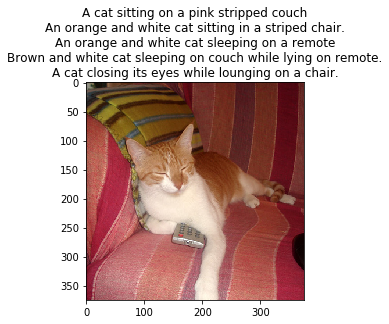

In [12]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    all_files = set(train_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
show_trainig_example(train_img_fns, train_captions, example_idx=142)

# Prepare captions for training

In [13]:
# preview captions data
train_captions[:2]

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another']]

In [14]:
# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))

def generate_vocabulary(train_captions):
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    v = []
    for caption in train_captions:
        for sentence in caption:
            v.extend(split_sentence(sentence))
    v = np.unique(v, return_counts = True)
    #print(v[1])
    vocab = []
    for i in range(len(v[1])):
        #print(len(v[1]))
        if v[1][i]>=5:
            #
            vocab.append(v[0][i])
            
    vocab.extend([PAD, UNK, START, END])
    
    ### YOUR CODE HERE ###
    return {token: index for index, token in enumerate(sorted(vocab))}
    
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    res = []
    for caption in captions:
        temp = []
        for sentence in caption:
            words = split_sentence(sentence)
            words.insert(0, START)
            words.append(END)
            tokens = [vocab.get(word, vocab[UNK]) for word in words]

            assert len(tokens)==len(words)

            temp.append(tokens)
        res.append(temp)
        
    
     ### YOUR CODE HERE ###
    return res

In [15]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()}
print(vocab)

{'#END#': 0, '#PAD#': 1, '#START#': 2, '#UNK#': 3, '00': 4, '1': 5, '10': 6, '11': 7, '12': 8, '13': 9, '13th': 10, '14': 11, '15': 12, '16': 13, '17': 14, '18': 15, '19': 16, '1950': 17, '1971': 18, '1st': 19, '2': 20, '20': 21, '2012': 22, '2013': 23, '20th': 24, '22': 25, '24': 26, '25': 27, '29': 28, '3': 29, '30': 30, '30th': 31, '34th': 32, '35': 33, '350': 34, '3d': 35, '3rd': 36, '4': 37, '40': 38, '45': 39, '5': 40, '50': 41, '50th': 42, '54': 43, '55': 44, '5th': 45, '6': 46, '66': 47, '6th': 48, '7': 49, '747': 50, '8': 51, '9': 52, '99': 53, 'a': 54, 'aa': 55, 'abandon': 56, 'abandoned': 57, 'ability': 58, 'able': 59, 'aboard': 60, 'about': 61, 'above': 62, 'abstract': 63, 'abundance': 64, 'abundant': 65, 'accent': 66, 'accented': 67, 'accents': 68, 'accept': 69, 'accepting': 70, 'access': 71, 'accessible': 72, 'accessories': 73, 'accessory': 74, 'accident': 75, 'accompanied': 76, 'accompany': 77, 'accordion': 78, 'acrobatic': 79, 'across': 80, 'act': 81, 'acting': 82, 'act

In [16]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
#print(train_captions_indexed[:2])
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)


In [17]:
train_captions

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another'],
 ['A tabby cat sitting in front of a car.',
  'A brown and black cat sitting on driveway next to a white car.',
  'A sleepy looking cat sitting in front of a white car.',
  'A cat sits in front of a parked car.',
  'A cat sitting in front of a parked white car.  '],
 ['A woman walks down an empty street next to a large street clock.',
  'A clock is on top of the pole on the sidewalk',
  'A city street with a clock on the sidewalk.',
  'A clock is mounted to a pole

In [18]:
train_captions_indexed

[[[2, 54, 4462, 2305, 6328, 3354, 7848, 54, 3107, 0],
  [2, 54, 6540, 5127, 8486, 249, 54, 5437, 8507, 0],
  [2, 54, 6502, 5437, 7581, 1124, 8052, 4287, 7905, 54, 639, 0],
  [2, 5120, 8367, 7848, 54, 2305, 6328, 7581, 1124, 54, 3108, 331, 0],
  [2, 2305, 5437, 4286, 710, 587, 8052, 7905, 5174, 5684, 0]],
 [[2, 54, 3484, 5127, 8755, 7296, 5025, 7905, 2540, 5222, 0],
  [2, 7835, 3998, 242, 3877, 5127, 5127, 8756, 2468, 0],
  [2, 8756, 249, 764, 6709, 7804, 6484, 8492, 3738, 0],
  [2, 8756, 7800, 330, 711, 5254, 249, 2468, 8486, 7919, 0],
  [2, 54, 5072, 5127, 8756, 2468, 8486, 4975, 5159, 269, 0]],
 [[2, 54, 7643, 1288, 6888, 3885, 3175, 5127, 54, 1227, 0],
  [2,
   54,
   1002,
   249,
   777,
   1288,
   6888,
   5155,
   2476,
   5025,
   7905,
   54,
   8568,
   1227,
   0],
  [2, 54, 6969, 4470, 1288, 6888, 3885, 3175, 5127, 54, 8568, 1227, 0],
  [2, 54, 1288, 6885, 3885, 3175, 5127, 54, 5387, 1227, 0],
  [2, 54, 1288, 6888, 3885, 3175, 5127, 54, 5387, 8568, 1227, 0]],
 [[2,
   54,


Captions have different length, but we need to batch them, that's why we will add PAD tokens so that all sentences have an equal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [51]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    
    longest = len(max(batch_captions, key=len))
    
    if max_len == None or longest <= max_len:
        matrix = np.full((len(batch_captions), longest), np.nan)
    else:
        matrix = np.full((len(batch_captions), max_len), np.nan)
    
    for i, caption in enumerate(batch_captions):
        for j, word in enumerate(caption):
            if j == matrix.shape[1]:
                break
            matrix[i,j] = word
    
    matrix[np.isnan(matrix)] = pad_idx ###YOUR CODE HERE###
    #print(matrix)
    return matrix

In [20]:
## GRADED PART, DO NOT CHANGE!
# Vocabulary creation
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab, PAD, UNK, START, END))
# Captions indexing
grader.set_answer("uJh73", grading_utils.test_captions_indexing(train_captions_indexed, vocab, UNK))
# Captions batching
grader.set_answer("yiJkt", grading_utils.test_captions_batching(batch_captions_to_matrix))

In [21]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


In [22]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

# Training

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on image. The idea is to use image features as an initial state for RNN instead of zeros. 

Remember that you should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="images/encoder_decoder_explained.png" style="width:50%">

In [23]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

In [24]:
# remember to reset your graph if you want to start building it from scratch!
s = reset_tf_session()
tf.set_random_seed(42)

Here we define decoder graph.

We use Keras layers where possible because we can use them in functional style with weights reuse like this:
```python
dense_layer = L.Dense(42, input_shape=(None, 100) activation='relu')
a = tf.placeholder('float32', [None, 100])
b = tf.placeholder('float32', [None, 100])
dense_layer(a)  # that's how we applied dense layer!
dense_layer(b)  # and again
```

Here's a figure to help you with flattening in decoder:
<img src="images/flatten_help.jpg" style="width:80%">

In [25]:
class decoder:
    # [batch_size, IMG_EMBED_SIZE] of CNN image features
    img_embeds = tf.placeholder('float32', [None, IMG_EMBED_SIZE])
    # [batch_size, time steps] of word ids
    sentences = tf.placeholder('int32', [None, None])
    
    # we use bottleneck here to reduce the number of parameters
    # image embedding -> bottleneck
    img_embed_to_bottleneck = L.Dense(IMG_EMBED_BOTTLENECK, 
                                      input_shape=(None, IMG_EMBED_SIZE), 
                                      activation='elu')
    # image embedding bottleneck -> lstm initial state
    img_embed_bottleneck_to_h0 = L.Dense(LSTM_UNITS,
                                         input_shape=(None, IMG_EMBED_BOTTLENECK),
                                         activation='elu')
    # word -> embedding
    word_embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)
    # lstm cell (from tensorflow)
    lstm = tf.nn.rnn_cell.LSTMCell(LSTM_UNITS)
    
    # we use bottleneck here to reduce model complexity
    # lstm output -> logits bottleneck
    token_logits_bottleneck = L.Dense(LOGIT_BOTTLENECK, 
                                      input_shape=(None, LSTM_UNITS),
                                      activation="elu")
    # logits bottleneck -> logits for next token prediction
    token_logits = L.Dense(len(vocab),
                           input_shape=(None, LOGIT_BOTTLENECK))
    
    # initial lstm cell state of shape (None, LSTM_UNITS),
    # we need to condition it on `img_embeds` placeholder.
    c0 = h0 = img_embed_bottleneck_to_h0(img_embed_to_bottleneck(img_embeds)) ### YOUR CODE HERE ###

    # embed all tokens but the last for lstm input,
    # remember that L.Embedding is callable,
    # use `sentences` placeholder as input.
    word_embeds = word_embed(sentences[:,:-1])### YOUR CODE HERE ###
    
    # during training we use ground truth tokens `word_embeds` as context for next token prediction.
    # that means that we know all the inputs for our lstm and can get 
    # all the hidden states with one tensorflow operation (tf.nn.dynamic_rnn).
    # `hidden_states` has a shape of [batch_size, time steps, LSTM_UNITS].
    hidden_states, _ = tf.nn.dynamic_rnn(lstm, word_embeds,
                                         initial_state=tf.nn.rnn_cell.LSTMStateTuple(c0, h0))

    # now we need to calculate token logits for all the hidden states
    
    # first, we reshape `hidden_states` to [-1, LSTM_UNITS]
    flat_hidden_states = tf.reshape(hidden_states, [-1, LSTM_UNITS]) ### YOUR CODE HERE ###

    # then, we calculate logits for next tokens using `token_logits_bottleneck` and `token_logits` layers
    flat_token_logits = token_logits(token_logits_bottleneck(flat_hidden_states))### YOUR CODE HERE ###
    
    # then, we flatten the ground truth token ids.
    # remember, that we predict next tokens for each time step,
    # use `sentences` placeholder.
    flat_ground_truth = tf.reshape(sentences[:,1:], [-1])  ### YOUR CODE HERE ###

    # we need to know where we have real tokens (not padding) in `flat_ground_truth`,
    # we don't want to propagate the loss for padded output tokens,
    # fill `flat_loss_mask` with 1.0 for real tokens (not pad_idx) and 0.0 otherwise.
    flat_loss_mask = tf.not_equal(flat_ground_truth, pad_idx) ### YOUR CODE HERE ###

    # compute cross-entropy between `flat_ground_truth` and `flat_token_logits` predicted by lstm
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=flat_ground_truth, 
        logits=flat_token_logits
    )

    # compute average `xent` over tokens with nonzero `flat_loss_mask`.
    # we don't want to account misclassification of PAD tokens, because that doesn't make sense,
    # we have PAD tokens for batching purposes only!
    loss = tf.reduce_mean(tf.boolean_mask(xent,flat_loss_mask))### YOUR CODE HERE ###

In [26]:
# define optimizer operation to minimize the loss
optimizer = tf.train.AdamOptimizer(learning_rate=0.001)
train_step = optimizer.minimize(decoder.loss)

# will be used to save/load network weights.
# you need to reset your default graph and define it in the same way to be able to load the saved weights!
saver = tf.train.Saver()

# intialize all variables
s.run(tf.global_variables_initializer())

/home/ahua/anaconda3/lib/python3.6/site-packages/tensorflow/python/ops/gradients_impl.py:108: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [27]:
## GRADED PART, DO NOT CHANGE!
# Decoder shapes test
grader.set_answer("rbpnH", grading_utils.test_decoder_shapes(decoder, IMG_EMBED_SIZE, vocab, s))
# Decoder random loss test
grader.set_answer("E2OIL", grading_utils.test_random_decoder_loss(decoder, IMG_EMBED_SIZE, vocab, s))

In [28]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Training loop
Evaluate train and validation metrics through training and log them. Ensure that loss decreases.

In [46]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

In [113]:

# generate batch via random sampling of images and captions for them,
# we use `max_len` parameter to control the length of the captions (truncating long captions)
def generate_batch(images_embeddings, indexed_captions, batch_size, max_len=None):
    """
    `images_embeddings` is a np.array of shape [number of images, IMG_EMBED_SIZE].
    `indexed_captions` holds 5 vocabulary indexed captions for each image:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    Generate a random batch of size `batch_size`.
    Take random images and choose one random caption for each image.
    Remember to use `batch_captions_to_matrix` for padding and respect `max_len` parameter.
    Return feed dict {decoder.img_embeds: ..., decoder.sentences: ...}.
    """
    
    index_1 = np.random.randint(0,len(images_embeddings), batch_size)
    #index = np.random.randint(0,4, len(index_1))+index_1 * 5
    #print(images_embeddings.shape)
    #print(len(indexed_captions))
    
    batch_image_embeddings = images_embeddings[index_1,:] ### YOUR CODE HERE ###
    #print(batch_image_embeddings.shape)
    
    img_captions = [indexed_captions[i] for i in index_1]
    #print(img_captions)
    img_cap_single = [caps[np.random.randint(5)] for caps in img_captions]
    #print(img_cap_single)
    batch_captions_matrix = batch_captions_to_matrix(img_cap_single, pad_idx, max_len=max_len) ### YOUR CODE HERE ###
    #print(batch_captions_matrix.shape)
    
    return {decoder.img_embeds: batch_image_embeddings, 
            decoder.sentences: batch_captions_matrix}

In [114]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch

In [115]:
# you can load trained weights here
# you can load "weights_{epoch}" and continue training
# uncomment the next line if you need to load weights
# saver.restore(s, os.path.abspath("weights"))

Look at the training and validation loss, they should be decreasing!

In [116]:
# actual training loop
MAX_LEN = 20  # truncate long captions to speed up training

# to make training reproducible
np.random.seed(42)
random.seed(42)

for epoch in range(n_epochs):
    
    train_loss = 0
    pbar = tqdm_utils.tqdm_notebook_failsafe(range(n_batches_per_epoch))
    counter = 0
    for _ in pbar:
        train_loss += s.run([decoder.loss, train_step], 
                            generate_batch(train_img_embeds, 
                                           train_captions_indexed, 
                                           batch_size, 
                                           MAX_LEN))[0]
        counter += 1
        pbar.set_description("Training loss: %f" % (train_loss / counter))
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    for _ in range(n_validation_batches):
        val_loss += s.run(decoder.loss, generate_batch(val_img_embeds,
                                                       val_captions_indexed, 
                                                       batch_size, 
                                                       MAX_LEN))
    val_loss /= n_validation_batches
    
    print('Epoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

    # save weights after finishing epoch
    saver.save(s, os.path.abspath("weights_{}".format(epoch)))
    
print("Finished!")

Epoch: 0, train loss: 2.6187991809844973, val loss: 2.6702721667289735


Epoch: 1, train loss: 2.5872673711776732, val loss: 2.671663405895233


Epoch: 2, train loss: 2.555858069181442, val loss: 2.662418260574341


Epoch: 3, train loss: 2.5416772239208223, val loss: 2.6292196536064147


Epoch: 4, train loss: 2.522373079061508, val loss: 2.614906051158905


Epoch: 5, train loss: 2.4949077937602997, val loss: 2.6256496119499206


Epoch: 6, train loss: 2.4847077085971834, val loss: 2.5936527681350707


Epoch: 7, train loss: 2.4736951014995574, val loss: 2.54944718837738


Epoch: 8, train loss: 2.4655849018096925, val loss: 2.5577232384681703


Epoch: 9, train loss: 2.4448505930900573, val loss: 2.5395595264434814


Epoch: 10, train loss: 2.4294549169540405, val loss: 2.5611077094078065


Epoch: 11, train loss: 2.4219645220041275, val loss: 2.5427330255508425
Finished!


In [117]:
## GRADED PART, DO NOT CHANGE!
# Validation loss
grader.set_answer("YJR7z", grading_utils.test_validation_loss(
    decoder, s, generate_batch, val_img_embeds, val_captions_indexed))

In [120]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


In [ ]:
# check that it's learnt something, outputs accuracy of next word prediction (should be around 0.5)
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    fd = generate_batch(train_img_embeds, train_captions_indexed, batch_size)
    logits = decoder.flat_token_logits.eval(fd)
    truth = decoder.flat_ground_truth.eval(fd)
    mask = decoder.flat_loss_mask.eval(fd).astype(bool)
    print("Loss:", decoder.loss.eval(fd))
    print("Accuracy:", accuracy_score(logits.argmax(axis=1)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(logits.argmax(axis=1).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

In [121]:
# save graph weights to file!
saver.save(s, os.path.abspath("weights"))

'/home/ahua/Data-Science-Portfolio/courses/Cousera/Intro to Deep Learning/week6/weights'

# Applying model

Here we construct a graph for our final model.

It will work as follows:
- take an image as an input and embed it
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [122]:
class final_model:
    # CNN encoder
    encoder, preprocess_for_model = get_cnn_encoder()
    saver.restore(s, os.path.abspath("weights"))  # keras applications corrupt our graph, so we restore trained weights
    
    # containers for current lstm state
    lstm_c = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="cell")
    lstm_h = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="hidden")

    # input images
    input_images = tf.placeholder('float32', [1, IMG_SIZE, IMG_SIZE, 3], name='images')

    # get image embeddings
    img_embeds = encoder(input_images)

    # initialize lstm state conditioned on image
    init_c = init_h = decoder.img_embed_bottleneck_to_h0(decoder.img_embed_to_bottleneck(img_embeds))
    init_lstm = tf.assign(lstm_c, init_c), tf.assign(lstm_h, init_h)
    
    # current word index
    current_word = tf.placeholder('int32', [1], name='current_input')

    # embedding for current word
    word_embed = decoder.word_embed(current_word)

    # apply lstm cell, get new lstm states
    new_c, new_h = decoder.lstm(word_embed, tf.nn.rnn_cell.LSTMStateTuple(lstm_c, lstm_h))[1]

    # compute logits for next token
    new_logits = decoder.token_logits(decoder.token_logits_bottleneck(new_h))
    # compute probabilities for next token
    new_probs = tf.nn.softmax(new_logits)

    # `one_step` outputs probabilities of next token and updates lstm hidden state
    one_step = new_probs, tf.assign(lstm_c, new_c), tf.assign(lstm_h, new_h)

INFO:tensorflow:Restoring parameters from /home/ahua/Data-Science-Portfolio/courses/Cousera/Intro to Deep Learning/week6/weights


In [123]:
# look at how temperature works for probability distributions
# for high temperature we have more uniform distribution
_ = np.array([0.5, 0.4, 0.1])
for t in [0.01, 0.1, 1, 10, 100]:
    print(" ".join(map(str, _**(1/t) / np.sum(_**(1/t)))), "with temperature", t)

0.9999999997962965 2.0370359759195462e-10 1.2676505999700117e-70 with temperature 0.01
0.9030370433250645 0.09696286420394223 9.247099323648666e-08 with temperature 0.1
0.5 0.4 0.1 with temperature 1
0.35344772639219624 0.34564811360592396 0.3009041600018798 with temperature 10
0.33536728048099185 0.33461976434857876 0.3300129551704294 with temperature 100


In [124]:
# this is an actual prediction loop
def generate_caption(image, t=1, sample=False, max_len=20):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    # condition lstm on the image
    s.run(final_model.init_lstm, 
          {final_model.input_images: [image]})
    
    # current caption
    # start with only START token
    caption = [vocab[START]]
    
    for _ in range(max_len):
        next_word_probs = s.run(final_model.one_step, 
                                {final_model.current_word: [caption[-1]]})[0]
        next_word_probs = next_word_probs.ravel()
        
        # apply temperature
        next_word_probs = next_word_probs**(1/t) / np.sum(next_word_probs**(1/t))

        if sample:
            next_word = np.random.choice(range(len(vocab)), p=next_word_probs)
        else:
            next_word = np.argmax(next_word_probs)

        caption.append(next_word)
        if next_word == vocab[END]:
            break
       
    return list(map(vocab_inverse.get, caption))

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a baseball player swinging a bat at a ball


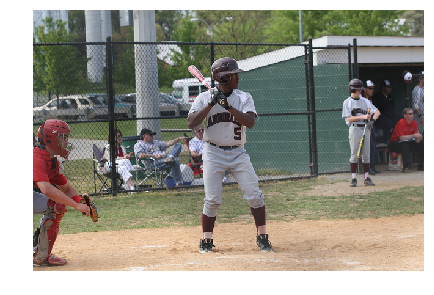

In [125]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), final_model.preprocess_for_model)
    print(' '.join(generate_caption(img)[1:-1]))
    plt.show()

def show_valid_example(val_img_fns, example_idx=0):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example))
    
show_valid_example(val_img_fns, example_idx=100)

a man holding a baseball bat in a field


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


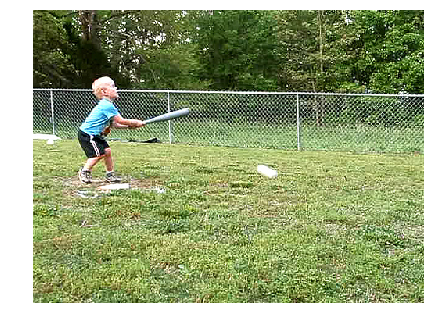

a red fire hydrant sitting in front of a building


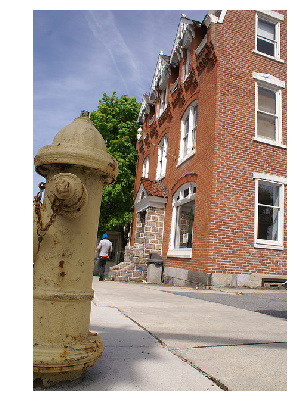

a horse that is sitting on a field


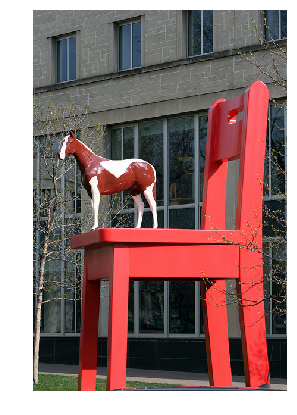

a man and a woman are flying a kite


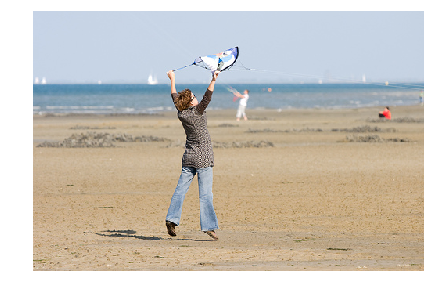

a man flying a kite on a beach near a body of water


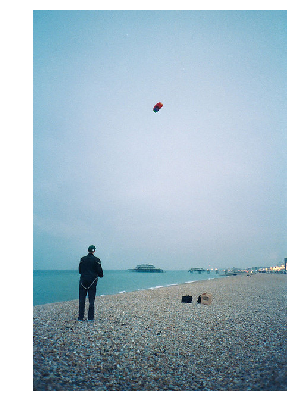

a bike parked next to a bike on a sidewalk


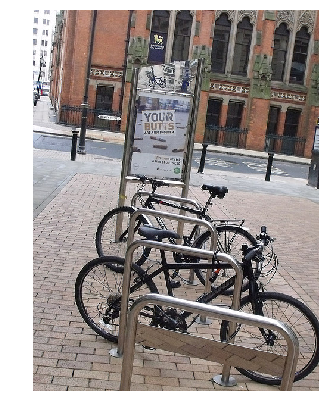

a man and a woman are sitting on a motorcycle


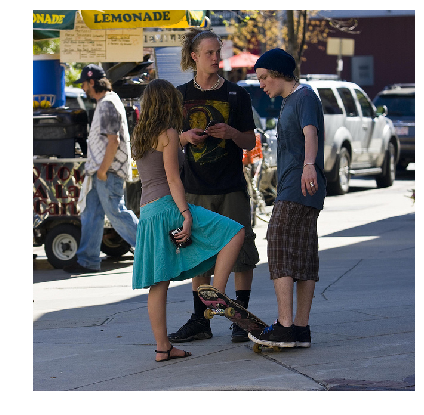

a motorcycle parked next to a sidewalk next to a building


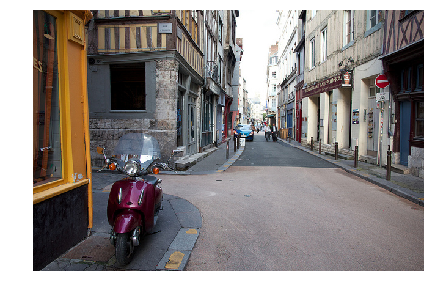

a black bear is standing in the grass


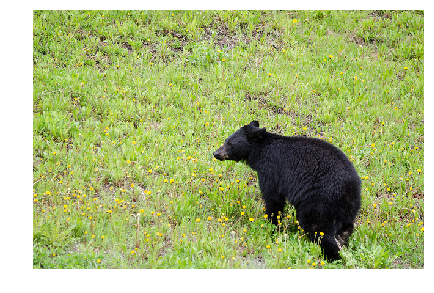

a close up of a plate of food


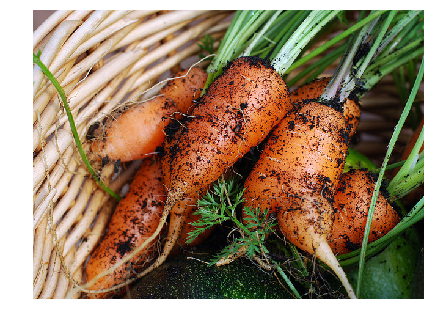

In [126]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

You can download any image from the Internet and appply your model to it!

In [127]:
download_utils.download_file(
    "http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg",
    "portal-cake-10.jpg"
)

a cake with a fork and fork on top of it


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


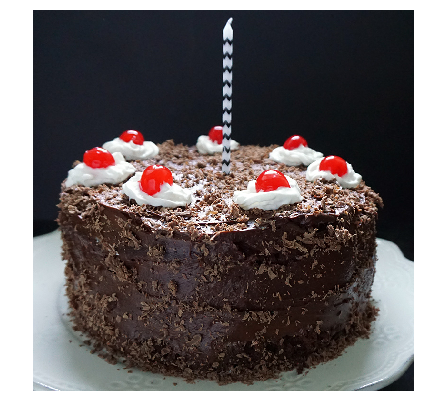

In [128]:
apply_model_to_image_raw_bytes(open("portal-cake-10.jpg", "rb").read())

Now it's time to find 10 examples where your model works good and 10 examples where it fails! 

You can use images from validation set as follows:
```python
show_valid_example(val_img_fns, example_idx=...)
```

You can use images from the Internet as follows:
```python
! wget ...
apply_model_to_image_raw_bytes(open("...", "rb").read())
```

If you use these functions, the output will be embedded into your notebook and will be visible during peer review!

When you're done, download your noteboook using "File" -> "Download as" -> "Notebook" and prepare that file for peer review!

That's it! 

Congratulations, you've trained your image captioning model and now can produce captions for any picture from the  Internet!

## Good ones

a table with a variety of cakes and pastries


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


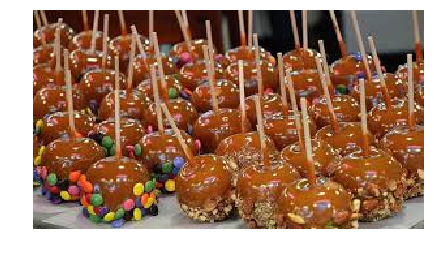

In [140]:
from urllib import request

url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRXC89qrLdFIGLcSvoMVHLr2zqcWb8mgnaMZqpgbBC9l21ACqmcEA'
request.urlretrieve(url, 'img2.jpg')
apply_model_to_image_raw_bytes(open('img2.jpg', "rb").read())

a table with a bunch of fruits and vegetables


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


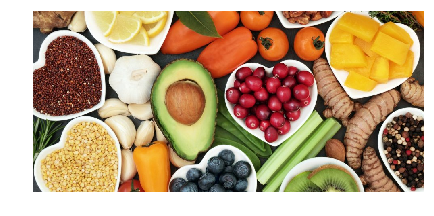

In [139]:
from urllib import request

url = 'https://www.incimages.com/uploaded_files/image/970x450/getty_855098134_353411.jpg'
request.urlretrieve(url, 'img1.jpg')
apply_model_to_image_raw_bytes(open('img1.jpg', "rb").read())

a boat that is sitting in the water


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


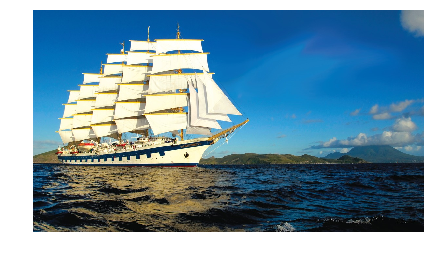

In [142]:
from urllib import request

url = 'https://s3.eu-west-1.amazonaws.com/mundy.assets.d3r.com/images/hero_large/42209-best-cruise-ships-with-sails-royal-clipper.jpg'
request.urlretrieve(url, 'img4.jpg')
apply_model_to_image_raw_bytes(open('img4.jpg', "rb").read())

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a group of snow capped mountains in the mountains


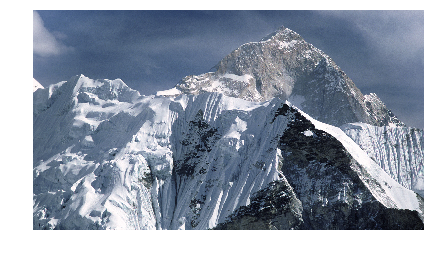

In [173]:
from urllib import request

url = 'https://s.hswstatic.com/gif/colder-top-mountain-everest.jpg'
request.urlretrieve(url, 'img18.jpg')
apply_model_to_image_raw_bytes(open('img18.jpg', "rb").read())

a plane is flying in the air on a cloudy day


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


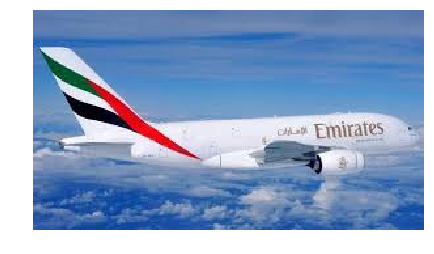

In [174]:
from urllib import request

url = 'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxMSEhUSEhMWFRUVFhUVFRUXFxUVFxUWFxUXFhcVFRUYHSggGBolGxUVIjEhJSkrLi4uFx8zODMtNygtLi0BCgoKDg0OGhAQGy0fHR0tLS0tLS0tLS0tLy0tLS0tLS0tLS0tLS0tLS0tLS0tLS4tLS0tLSstLTctNy0uNy03N//AABEIAKgBKwMBIgACEQEDEQH/xAAcAAABBQEBAQAAAAAAAAAAAAADAAECBAUGBwj/xAA/EAABAwEFBQUFBgQHAQEAAAABAAIRAwQSITFRBRNBYXEGFIGRoSIyUsHwB0JicrHRU5Lh8RUWIzNDY4LSwv/EABoBAAMBAQEBAAAAAAAAAAAAAAABAgMEBQb/xAAsEQACAQMDBAIBAwUBAAAAAAAAAQIDERIhMVEEEyJBBWHhFEJxI5GhsfAG/9oADAMBAAIRAxEAPwCqHJ76mGpXV7JwDBwTyE4CcQgRGQnT3QnDQlcBkoUoCcBIZG6nup4TwgCEJXU6eUAQLFEsRUggNAO7TbpHAUkXYWRW3ScU1YhPARdhYCGpXUeAlglcdgN1K6jABPASuwA3VEtVjBKAncLFcBIhHuhMWhFwsVyoKwaSbcp3FZgAFIBFFFSuIuFgUJQjXUrqLhYAlCMWpXUXCwEtUCFZuqJpp3CxWup7qsbtPu0ZBYz++BP3wJ9n7PbUeGOqtp3sA5wN28cmk8J4TxgLpR9nz/47f5D+62lKlF2bMIqpLZHM98CfvjdV0zvs/eBhXb/I4fNZW0+yteiLxuuaM3Nkx1BAISUqMtEynGqvRni2N1Uha26qv3Y8k4snTyV4wM8plkWpuqXem6qt3TonFkCMIDymWO9N1T95Gqr90CkLIFOMAymGNoCbvAQxZWp+7BFoDykT7yEu88imFnCcUAlaI7yG7zyKXeuRUxRCc0RqUeIeQE2v8JUTaz8KNuOaXd+aaxJ8ysbY74VA2t2it7gptwVSceBWnyUjaX80t/U5q7uT9FLdclWceCcZclLe1NSpNNTU+it3OSUHRLJcDx+wID9SjNcRmUxBULiVrlJ2D94GqbvSDdTXeSWCDNlgWpTFoVdreSkGJYxHkw3eE3eEPdhS3YSxiPJk98lvlC6Exalih5MLvUjVQbp1TSU8EGbDd4T94CqudyUbyfbQu4KrSDmlpEgiD0V7sx26fZXd2tkvptwbUzewcJ+NseI5qmCdVk7fshc3eDNuB/Lr4fNc3V0m45LdEKo4u6Pc7HamVWCpTc17Dk5pkFTe2V8+7E27Xsj71CoWz7zc2O/M04HrmvT+zv2jUK0MtA3FT4pmk4/mzb4+a86NRM7IdRGWj0ZHtJ2duTVoj2M3N+HmOX6LmF65gRIgg5EYgjkeIXIdpOz12atEYZuZpzby5Lvo1ltIVWl+6JyV5PeUy1PC6zluwd9K+EQNSuhGgag94Et4ES4EhTCNA8iAeFIOUt2E4aEtBq5EFPjopXQnAS0HdkROiWOiJHNKEhgzOijeRS1Nuk0J3B3k15E3SbchPQXkDlKQiblNuU9BeRCQlgp7hLco0DyIiE+Clukt2iyHdjABPdCVzmm3fNKwX+iV0JXAhmmdUxpHVPH7Jy+glwJXEHdHVNu3ap4fYZ/QcsUd0hhjtU+OqWL5DK/okaSbchLFK8UYvkeS4IBikwEEEZjEIoYphirIxxA7X7E76mLTYhM/7ln4sePe3R4jjdOQIjRcRVouaS1zS1wMFpBBB0IOIXq/Zza7bMXbwxSIlx4NI+8eUTK6raexLLbWA1abKgIBZUafag5FtRuMei8WvQUZaHUqCqRvHc8X7PdqbTYzFN8snGk+Sw9OLTzEL1Ps320s9shhO6qn/jeRDj+B2TumB5LmttfZY4S6y1Q7/rq4HwqAQfEDquG2jsmvZXXa9J1M8xgfyuHsu8CuZynDY6ejlGnPCvdRfvj7/jk9Z7S9nIJq0hzcwepaPkuULULsz26q0IZXmtSwEk/6jBycfeHI+a6q3WGlaWd5srg4H3mjXj7P3Xaheh0nXRn4vc6vkfiKvT+a1i9mtmcxCcBWDSUbi9LJHi2YFJGuJXEaBqCDkr3JELEriehOUiF7knvclK4lu0tAzkRB5J4Gifdp7iLIebIwEsFK4nDEWQZshglgp3E1xFkGbIyE0qdxK4iyFkwcpkS4lcTDJkWhSg6pXUrqLDzFdUSxSupXUWG5oGaaiaaNCUJ3ZDaAXEoR4ShO4AgnnkpwkpaKUvsjPJK8NFJKUrFZ/YS4pBiLu0g364LmzN8CAYuJ/wAx2zYtpNOi69ZnneMo1JdTgn2g3ixwMjA6SCu6BGqyO1XZ/vlG4wt3rTNMkgCci0k5A66gLKssomtF4y/k6Ls79r9grw2veszzgb8vpzyqNGX5gF3Vnq0LXSJa6lXpOzgsqsPWJC+RLdY6lF7qVVjmPYYcxwgtPMJrHbqlF1+lUfTd8THOY7zaQVxXOy1z6I7SfZpTdL7Gd27H/ScSWH8rs2eo6LgbFbbRYaxLZY9puvYcnR917eI5+IVDYH2v7RoQ2q5tpZxFUQ+OVVsGebry6e29qbBtZoIPdrWBAZVIDKv4BV90nHC9dPCFzVqDfnDc974j5GFJfpq+tN/4/H+jcse0KVuaXUxcrgS+iT72rqfxD6PMBYuG9uk+ReY9hzxa5rh+hXZ7H2wLULroFoGYiBVA+8z8ereOYXR0nXX8J7kfM/AdpOt0+sOOPwFuJFisbk6KJYvUUz5R02V7qe6i3U91PIh0wF1K6jliaE1MnADcT3EUBPc5IyFgBuJ7iLCUIyDAFcSuI0JXUZBgAupXUe6muoyDAAWpXUe4mup5BgBuprqPdUhT5IzDArXErquU7K52TSfBFds2oPuHwx/RLuLkfafBnXEri1Dsmrh7DsQDl6FL/Cav8NyO6uQ7L4Mu6ldWi7Z1QZsd5FAfRIzBHUQmqiE6T4KlxNcVi4ldVZk4Fa4lcVi4mLE8wwK28HFSNduX15qrRoOIJPgOKejZnnMRzP8ARZ2jya5S4LYrA8ERjwqIoPHDxTsou44JYx5HlL2jrRsiybTohlqpNqPpgND8W1AOBa9sO4ZZYZLltofYZQcTuLXUp6CoxtXwlpYtHYNsdRqtfmD7Lxxuk4mOWB8F6WzFcNaCjLQ7aU3JanzztX7FtoU5NJ1GuBkGvuPPVtQBoP8A6K47avZi12We8WerTA+85hueDx7J819dXCcP2UizXFZqVjU+SNl7Uc2Gvlzcgcy3h5LoWOyLToQR6EEL3DbXYOwWqTUs1Nrjm+nNJ56lhF7xlcNtD7Ka1CTZKorU8xSqEMqN/K8ey7xurj6jp1Lyhoz6T4j5ntf0eod4enx+AGxduCsQyu4U35Cqfdef+yPcP4sjxjj0VbY9duQvDUFpnwBled2ywVKDrtWm6m7Rwg+Gvhgtns52vrWUgf7lLjTccubD90+n6pUOvlDxmdXyP/nYdQu90rWutvT/AIOpZsi0GPYz6YcjKOzYNf4QPELqNgbcoWtl+i6Y95hwcw/iHzyK1CAvQXUOSuj5CfTOnJxmmmuTiG9nq5zuj66Kf+Vqpzc31XXk+1EYZz8oUgUKtIjtR9nJN7KO+Mep+YRB2TP8T0/qupThHenyHahwcwOyX/af5f6qbeyjf4rvILpJUKZMCTPPImeQw0S7s+Q7UODCHZZnxu9P2RWdmqWrj4hbcpXkdyXI8I8GQ3s7R0PmUY7DokyWycPTBaN5VK9suuLZAhodj96bwhuOYu88wpc3yUoLgG3Y1Ef8bfJFbsykPuN8gqNn2i8vaHNdHtF0BxIDi4sloEiAwCfxKNvtlZwNxj2w8XTBF8Q6AQ4CBeuqc2PA0X2ek0EkNaBiSYAA1J4KvTt9mJhtWkToHNOWPDjyViyNO7a1+cQ6Yx4T4hYvZEu3TmF8tp1KlO5GhnB080nJ3Go6M3YEkRly/QqNSqGvay672r3tAeyIAPtHhPDouODTcY8veS20mzvlz/apkkBpE5Yj91N/+nIGVntbLmM3adQQWgnhipzLwOvdVYBJc0CJkkRGU9Oaq2raVFlwueIfN0yIMAmZ0wz1IWBZqjKLbS64wuZXLQSPda5zS2TmGgmYGniqu+utfDr26tlOoHCB7L4kwMhJKMhYnUVLdSEgvaLoJOOV0SesAg9CFFjmVBIxHMEehErDo2cCtUZWBLd499IBriH74XXEuGgJEYRJOitbHvNL2XnupC7u94CHtwN5suALgMMf2VxbFJIJa9lU3cIOowWFbNnlnMa6dV1NR+H0VTtlEvY5s3SWuAcM2kiAR0mfBdEZtGEoJnL3Et3zHmrT7EABL75A9oiATHLgiNs7YwAWrq2MVSuc/VpOaMK08ohNQrPib7ToCMT5Fatk2CIvVjJHAHAKdssdB7btMhhGX1xVOpF6PUXblutCnZLdSbUYK7XFrsTuyIwj3ics/TNdiyvs1gBgHCcQ98cjmFxY7PB8XqzcCD49JxXQNt9qAN6oxx0IInxCwnBN6M2hJ21RqHtXYqfugjpTA/WEMdtrPwZVOM4Cn/8AU8VjWm1vq3b7ACJyhVXMGOY81DgvZWTOoHbah/Drfyt/+k/+caJ4VB/4H7rltwExs/JGKDJnUntZR/H5K/s3bLK5hgeYzJbAHUrhTR5Lq+yVUCm4Ewb/AKQEnGyGpXZs26w06zblVjXtPBwny08Fwe3/ALOGkF1kdDpndvOEaNdEg9V3lW3MEC8McsQJ6IFO3Md7rgen1yKxnRjNao7+l+Qr9K70pW+vX9jw/dWmx1b0VKNRvGI645Ob5hejdl/tAp1opWmKdTIPypvPX7h5HDnwXQWmhTqsu1WtqNPBwGAJyGmBic1x21/s9puk2epc0Y+XN8HZj1XPGhOk/B3XB7NT5LpOvjbqY4z9SR6EXYyD/XopNdC8ssG0dobOhtak6rQGhv3R+B4xb0dh0Xa7J7Q0LS29RqAx7zTg9vJzcx1yXTCalpszxuo6OdJZLyjyv+0N11VM2rPyxlZzqwgpU6nwtIAGYEAZeS0scVzTvJsEJlmec4HU/sitserlIxiVF7jBjODHWME1qFOmLzrxHITjHIYZcVh19uhp9loHU3j+qAuEr7dbZ2DfE35dDQCXnHBxBAgLEd24M4U/Mn1xXJ7YYalao8uc4ucTN9wzyEAwAMvBVNxdxk+Lif1K1jBJGEqjvodyztyeNGejo/daFk7Y0HRfmmfxAxPJwXnTQdfryQ7TXuNLiSQMTAkp4IM2et0ts0ne7VYf/Q/dU2WGjecWuPtuLnBtVwBcczda6F40e0ga9pbTOBBlxjjoJXa7L7OVtog1w6k0TcJbUJLS3NpawmHCcjBxUSiluaRmztnWSnDgWiHuvuByvfEND+yk6iw3iWNN6L0gG9GV7WFV2V2MFFpD6rqhOOUR0JJKv/4I1pkOeD+ZRoVqVqzm4kNF4g4xmcvaIxQm1amrBhwB1w49FZtliOd7DicMOay7fSdSIDnZ5HpmqSQm2Wt47i8fyjXronp1YJl0z0EeX1gsd1qb8XoUM2oanyV4k3OgNoCEbVGZ+XzWC+2x913j/ZDNr/D9eKpQYs0aVrt2EDHP1VHeE6/XioNtxEi6Of8AdQFT8I/mVqL9kOSGc2MnFB3ipOtjuI9EN1qjVaKmyXNGgx6Oy1RgCsfvo09Um2waeqHTYszTrVScyq1e1EEYlC7005n1S7wzVNRt6E5XJuqk69Uzd4GktqOnQ4g8sU7Ko1RN6NU7/QrXAMt1qH3GnrHyKuWbalbjSjmHR6KubS0cUM20apNJ/tQK69m3S2qcyCD1BVlm1fxeiwqdYnEAkaokOP3T6LJwRops32bRH4fRGbtL6lc46k5uYPohmoNSp7aZXcOnNuVC00KTnB5pgPGT2+w/+dsFY3eSOJUxaTqfNDolRruOzsdds6vSAF914/i+sVpWnaLDSeAR7jwAI+Erzl9s/Mptrk8T4kodFi7qPUBbG6hSFpbqvOabHETvSOUlC3lYf8k85lR2vsrO3o9ONRpEEgjQwuV7R0mMdeFIOa74LoggYiDhwnzXNOtNYD3/AC/shPtNQjGoR/L+yao/ZDqrgq1tm1HOcZEEkjA5dAYUm7Ddr5ez+g+aMLS/4nH65KZrE5z4la9tmeaKlbYQLS3BvMPId5yFl/5duGe8O8br/wBGrca4aAIkaEI7a9hnweabbtb21mUqbnmTBL6e7kkiLoIBI5wvQ/shtO42jaLOHOLa1AWhwMYVG1LriIwxvn0QrdZBUi80OLSSx0SWGIvNVbsPs2rZrRVtFeoH1HN3bCARDLwcSdCSBgNFE4O1vRrCcT2upaQub2jbiKwIBIbEGRGJAIjh4f2zjtc5SfIqpXtrCbxz1DcT1PFY9tvY0zSOjt9s/wBN053SDGUws3b9raQzHG9/+TPyWHV2o05z4kKnXt5cZwgZf3K2jSZlKqi9vWzN7xSfaB8WSzTWn4UjW6LXAzzL1S3DgfLNVHWg8AfJD7xzT945j1VKFiXO5Fz54KGP0VNz5xLj0kpwW/RVkGS9ruJ9VXdUnKVXoWqCS4eH1mo17WOGHit1TdyHJCq1jxhC7yevmgVa88VCkCXQATyC3UFbUyyL3ex8PqVJltHw+qanY5LQYGGOeGGR5qxWslNjRJ9rUnDyUNw2LSkOy2jiDirFG2N1jwWNRawuBc7CcRiMFOrXaG3WmcSZjEjgCk6a9CU2bbLUJwLSim36gLmmWozhGSg+0unE+SX6cfdOto2zHBG72VydIugEAnyVo7VMQQol0+uhSrHRvtJ1nxQC+furC78QMBAOqdu0DxA9Uuw0Dq3NneBuJnNWWGcgVk0dos4iFo0Nq0xhICzlBr0XFrkI+k4YubhrigGmPig9T80Y7VYPvD0QalupOglrSNboUpS4G8eREnIVEJxrfdeD9dEC00aLgYddPDGAPBVLPZakgMMnMwTHitYxVjNyZefaK2RDj0xClZKdR+bHY5cP1WjszYlYumoWgYcb06wOC6alYaYMhgGHVY1K0Y6I1hRlLVnIiwvmYPiMfJNVsb4AnEcs+q6602UDGMOXyWNUsoDz7bo0wURrXLlRsYO4eDeLm4cJIURbjeN7wiCtS0U2YgmRxVWpRpRBHyW6mnujFwa2M59vxlpI8Fq7CZUrlzi+A2OAx4xyyVayWJlR0MBk8J/ddds+wii2GtHPmprVYxjZLUdKnJu7egN1jETKwtq0/hd+sLXtVIGcT5lZ1QMmDPmVhTdnc2qK+hmirAxZPQyom0MGBELTNFmii+xMj3VupxMcJGU8NOIJ85VeoXN+8fDH9VsOsbMv3Cgdns4E4dFpGokS6bMqjUJ4uPSPmjvtB+EqzWaWiABGInSVSoEkwR4iT6qrqWpFraDVLVGoSa9xxCOaZGF4awQmdaHDgEXQ9Sm/Y7rkl2On9lnuslNuBvuOgHLJHp294xJkHgiU9p1CcBx64LRZrcHiylZS1mLmOMcIOfPkijamLiGDHKeHRap2iePHBAtDBU94DrxRnd+SDG2zKptrx8PDjKFaLYX4EyMMhBn5o7dkYCHCMyZy8FZsmzaTXguqFzYN5o9kk8BOn7J5QWpKjJma0sIlxOnVVt0SJxuzEre2tZ6Lm/6TbpGUnPrmsZlJ5BaHNAB4mPRXTndXJnCzsVy0ThJ9ERrCXRF3kcP6rVsNj3YvFwMnODw5qdpvFxi7jxP1KHV10F29DMeHMzjXJSYZ4THitCzUywG8xjz5/qhP2ndwY27rCWbeyKxS3L2ydn3iHvDbvwn9f6Ig2IHPN10NiZzM6cFTftgwLrSIzJMyeaejtSoRAgaknNYuNW9zROGxqUNlEQJvD8uAPFZVXZ5vuGGB8xyWkdqXWgXhlw1VatbHv6RxkeSmDmnqOSh6KxszQCQJgcOqIzZFYtvBpynHDPERjitTYzhTYReDiTOkYDiiVNp43Q+FLqTvZAqcbXZiWmzGjF9skzxmErFag32iwwDmDGPNXLbaWX5BDiIi8Zx1U7HXAEFt5xJODZDflwVZeOqFjroy9ZttF0ewTPMYfWC0nW12sLNpWumYEYjKP6I9Yh2IwHguSUVfY6Yydtw79pGIJMdUDvw4ZdVRq4uuzHrKha3Cm0NyEQOapU0S5sJVr06ro+9+E4lHtlmvMF1oaWjjpzjisuyVmU8QMSrP+KDgQPFaOLvoQpL2KwtcHAlzWgaAg+C6az2y8Ivg9Dj5Fc6LeIiB1hFs9pBya3rkfNZ1IuWrRcJKOxd2haIw/dUBWBOOaDaOvhnCrOc37pEqoQViZS1NQVNEZtrIEQsunUH4ifFDtVJ15sXgDiT8k8E2GTRoOqjiEWlSaeMLPoUmAzj9cVK1W1oGaTjd2QKXIS1+wCSRCx6m0gPdMHiNVTfaC/8A3DLeRjjoq7mDhMcyuynSstTnnUvsaDtsEnHLnmp/4uzQrODWYZjU4fom3A4OWnbgSpSDENB19FNtVo/qf3TJJWui7jPtDQMk9G0tAvE+GfokknihZMDV2jph+yj/AIi5JJWoRM8mDdb3nioF/ifRMkhJIV2Wqu03kXcAIiM0DvbzhPoEkkKKXod2wkVDrj0UXAg3SYjj9CUklKetimhPaRgoJJKkIKx3L1R964iJwSSSkgQzH6uI6YrX2fsZlWmX33B2OMCPrLikkufqJOKujWklJ6lZ+yrpPtAwJmD5AcUanVqOEMOEcWx4JJKMm1qOyT0E+yQJD5eTjIEKQtQaCCcs5+WKSSajluD02K7LW0e6cTlgq1pthd7zjPKI8AeKZJbRgrmbkwLKrney1s+ElHqUrmIPURiNfBJJN72D0O23njBCLR2g0ZNAOqSSbpxYlJojaLTOLXAaxMquKrgcHDFJJJRSQXuXrI98+1lHNXKtYjLHlB/VJJYStc1WxSZWeSZY765nBS7lPvAjxxHikkm5W2ElyVLVYCMWyRziQqTpSSW9KTa1ImrESCOSm1xSSVtk2P/Z'
request.urlretrieve(url, 'img19.jpg')
apply_model_to_image_raw_bytes(open('img19.jpg', "rb").read())

a group of young children playing a game of soccer


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


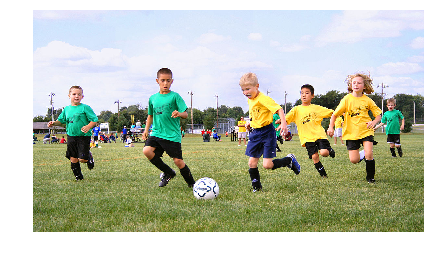

In [148]:
from urllib import request

url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/9/92/Youth-soccer-indiana.jpg/1200px-Youth-soccer-indiana.jpg'
request.urlretrieve(url, 'img7.jpg')
apply_model_to_image_raw_bytes(open('img7.jpg', "rb").read())

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a hot dog with ketchup and mustard on a plate


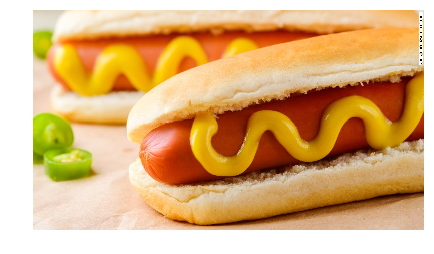

In [159]:
from urllib import request

url = 'https://cdn.cnn.com/cnnnext/dam/assets/171027052520-processed-foods-exlarge-tease.jpg'
request.urlretrieve(url, 'img14.jpg')
apply_model_to_image_raw_bytes(open('img14.jpg', "rb").read())

a man sitting at a table with a laptop computer


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


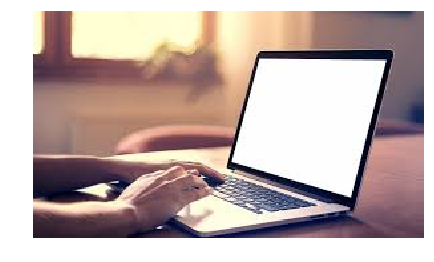

In [170]:
from urllib import request

url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQdDcJNLIdkEqoxPjPBSp8rLqtwk6wKBeja6H2yhog7E38kMN42DA'
request.urlretrieve(url, 'img16.jpg')
apply_model_to_image_raw_bytes(open('img16.jpg', "rb").read())

a bunch of wine glasses on a table


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


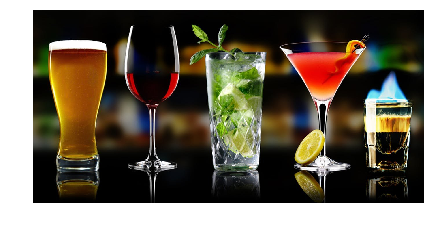

In [172]:
from urllib import request

url = 'https://3c1703fe8d.site.internapcdn.net/newman/gfx/news/hires/2017/ismixingdrin.jpg'
request.urlretrieve(url, 'img17.jpg')
apply_model_to_image_raw_bytes(open('img17.jpg', "rb").read())

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a car parked next to a parking meter


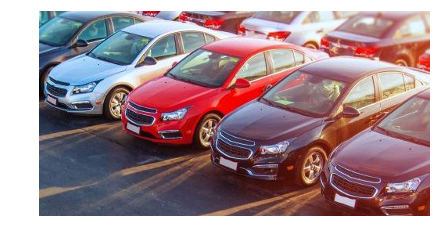

In [168]:
from urllib import request

url = 'https://www.gannett-cdn.com/-mm-/b81b778fcde932aea0df8f5ee3982564b7632cba/c=0-110-500-391/local/-/media/2018/06/14/USATODAY/usatsports/car-lot-square-e1461855298700.jpg?width=3200&height=1680&fit=crop'
request.urlretrieve(url, 'img16.jpg')
apply_model_to_image_raw_bytes(open('img16.jpg', "rb").read())

## Bad Ones

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a person on a surfboard in the water


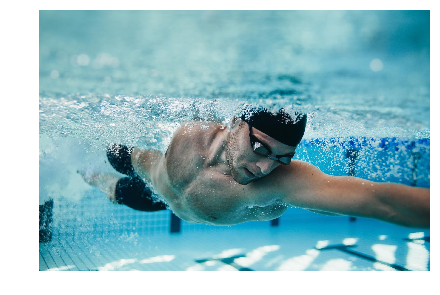

In [150]:
from urllib import request

url = 'https://www.renomia.cz/files/sport-622003802-3500x2333.jpg'
request.urlretrieve(url, 'img8.jpg')
apply_model_to_image_raw_bytes(open('img8.jpg', "rb").read())

a man riding a skateboard on top of a body of water


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


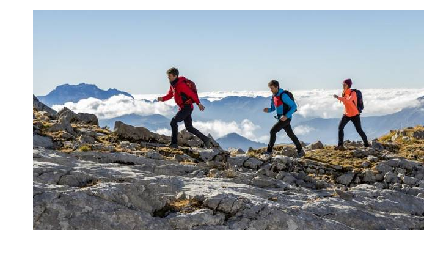

In [151]:
from urllib import request

url = 'https://s3-eu-west-1.amazonaws.com/amersports-wordpress-exove/uploads/20160621134121/Salomon-featured-image-768x513-640x360.jpg'
request.urlretrieve(url, 'img9.jpg')
apply_model_to_image_raw_bytes(open('img9.jpg', "rb").read())

a large white and black clock tower in the middle of a city


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


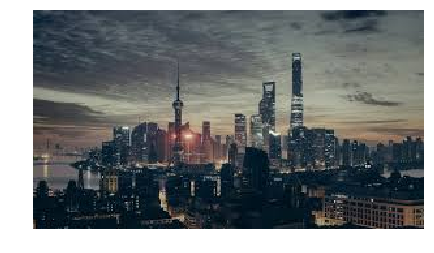

In [153]:
from urllib import request

url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcSM2HouEg30gQmHhsoe6hy0h6VeHJ4arTe63BZ-IIOoZCbg9ECf'
request.urlretrieve(url, 'img10.jpg')
apply_model_to_image_raw_bytes(open('img10.jpg', "rb").read())

a boat that is sitting in the water


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


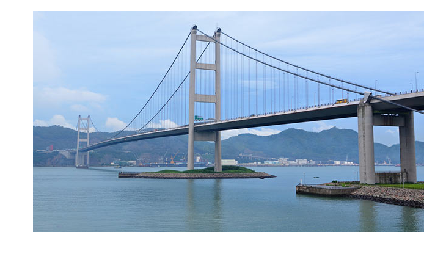

In [154]:
from urllib import request

url = 'https://bridgemastersinc.com/wp-content/uploads/2017/01/Tsing-Ma-Bridge.jpg'
request.urlretrieve(url, 'img11.jpg')
apply_model_to_image_raw_bytes(open('img11.jpg', "rb").read())

a bunch of zebras are in a row


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


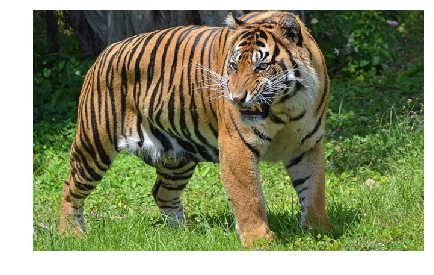

In [155]:
from urllib import request

url = 'https://dingo.care2.com/pictures/causes/3215/3214061.large.jpg'
request.urlretrieve(url, 'img12.jpg')
apply_model_to_image_raw_bytes(open('img12.jpg', "rb").read())

a table with a sandwich and a salad on it


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


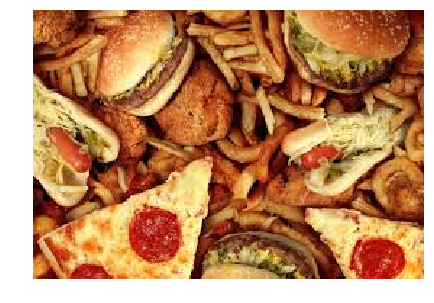

In [157]:
from urllib import request

url = 'https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTCB_hAa68ui_rjCqbECWUaPaH8nQPeh2MUkgbMcJiX_G0QgnwY'
request.urlrdata:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAbIAAAETCAYAAABTM4NXAAAABHNCSVQICAgIfAhkiAAAAAlwSFlzAAALEgAACxIB0t1+/AAAADl0RVh0U29mdHdhcmUAbWF0cGxvdGxpYiB2ZXJzaW9uIDIuMi4yLCBodHRwOi8vbWF0cGxvdGxpYi5vcmcvhp/UCwAAIABJREFUeJzsvNmvrtd93/dZ0zO9w573mQ9JcRDFQdQQy5ZluY6HJEga5yJIgxpt7wL0oimKXvfC/Q+MFih6URRJ4YuiTZ3UiYs4sWXXsRtJUSSREkWKFKlDnnnP7/QMa+zFevc+JHpDtAVCAfsH7IvznndYz7PW8/v+ft/vdy2RUuIyLuMyLuMyLuNnNeS/6wFcxmVcxmVcxmX8f4lLILuMy7iMy7iMn+m4BLLLuIzLuIzL+JmOSyC7jMu4jMu4jJ/puASyy7iMy7iMy/iZjksgu4zLuIzLuIyf6bgEssu4jMu4jMv4mY5LILuMy7iMy7iMn+m4BLLLuIzLuIzL+JkO/e96AAA3n72ZQu+JIiJLiR4LlNbopLED9K6ndyu++OqrnB6fUOuaH77+FjJolDJMxhs4P+C9pQsDL75as7U74vUf3eEvf/2rRDXjyjP7/LPf+3M2N3b4y3/t1/kHv/M/o9wIXKDeFFy9scvx4QH9TJGCROsGqQ0hBIwxlGUJSeKcQ0qJ95EYI0IICiVZ9R3jrQ1MWSOUwvUe5wLj6QSpFUlpwtATnCc5S7dqUUpx8+ZNtvf3CCGx7Fu62Ql9t2LZrhDKIBUUZQlIqqqiqTcoioowtIymI+7c+SkpJSpTkEICqUhCIbTBJ0+pJI8PHmCQXLm6w2w2Q2vNol1x6/bTaF3QLeYsl0vKsmR7d5/JxgYA3WqF7VuEEFRFidQKgSaFSAgB5xxIKJsaZQymaIDIarXiwf27JOuw7YrF/IRhGOjaJQDGGExZsLuzz97eHkopTk9nhBAQQhBJxBiZz+cMqw5lNFs72+zuXyWlxHw+x9qepqoIziPLhmYyRgjBdDolpcRsfopaf89qOWdoV0gB1ub5izHinOP0+ATvPXVdo5QkJfBRc/2pW0w2trDeo4XJC1UqqvEIYwzCBebLFUVTI5UmxYiMkWG5ZLAdxkg616FNSV3XNFVNWZYURUHyAe8Gdrc3SSnQ+xXee8JyYD47oE9nzPue0WiLrfoaJwcHbE52EVWFKmt2d/eZbk1RuqDQJe18xne+/RecnJwQPTjnCF7Q2SUxLmmakr29Pa7uPY1zgRACUiikShRlom/b/G9TMF+eIBVMN3Z44cWXuXvvHnJ1Snf4gC9/8WU+++LzuMHz3FPP8E/+8T/ir/+tv8IPfvAGdZQ8/8KziAR//OffZu/p53j9je9hYsvj2cD9VUToPYqyYhh6kgpMNycsFzOSDxRC5TW37Nja3sb6wL0HBwCUpWG1OEYahRCa3Su3CCnho+fg4BFSQoxQj6YIAUl0nC0eo03EG0lSErRAGQeDR7sSvxC4wVPWBWYk6AaHTIpajog+ogtNNI4+LkkpoZQgEvApolCUpkYKTYqe3vZoAyk5pBLUKMqiYnAJjCFESMLjk8e6FboUKCUpVEOwoGRJ8DmnhBCINhIHT6VKtKkRpcNLSxBQFmNKXeLjiig7VKXZ2NxmvLnN4Fccnh2goubk8TFjJEX0RJ/oek87Gyh1ST3eo6q2iAK0SbTdjL5vcW7I1yrHSFEipSSEQEj5mRmNS4T0aC2RUjCEAZwDQBclwmg8Ik+GtdRCUm2NcClirSWlgCk029ubBN8TgqduSqLz2EEwm3s2dq6jq5qgA71b8p3/6Zvik2DIpwLIjNIUtaEdVjg/MKrHeB9JKWK0RlcNTax498fvsr25hUuOpmkYlg4hRL5JZGApCvDW4PuCQo/4/utvc/X6mOvPPQtIHjx8DOKMvWsjju85lCw4OZqzvb3Li599je/+6x+hhOa8Wc2g5QEoTPWxcaeUEyVKApK+s9SjCWF97JdIgbZtqZoaJZ7MR0gigxtwfHpCPZlS1hVSSsqmAcD5DAhRQFmW2MEiEoyqDXw3oLSkaRqm0w2stfhhwCiDUBoXEkoLUlQMbmBjY4PT4xO6rsv32hTQwGq5ZDSeYq1FSolSCmstXdcipSLGiFKKlBLOOQQCIyPOO5RSFFXJarVEOo3UmrIsCSEv7OgDpDwOKSVCCJRSaK1BKMqipus6FosFN27cYrls6XuL0hqx5gm01lCWCCXxLuK9R6k8rhghxoiPgUpK+r6nrmv6vsf5geg8IfgMtiHPn7UWyOMBLsaTUsJaizEGpRRS5fc655BKoZVGCEFIMBqNABiGFUoJiJ6qaWjbfC3L01NUKYiiQEiNlPJiDU2nU6SUaG1og+Px4SFKCyaTCRrF3B7TDS2DDchU4VeJVrToynC6PGHf7DFEWPgOFXcYWQXBMRprbj19C58ix4+OUDIQYs+13SkPHsyZny3Z3btOPWq4ubVNsEtUTJAc7eKIK09fYTabEaKg9Jpm0rC9t0N7eJe9WrK/fxVxrebK9piXnn+Kk0cH7E8V/8V/+lsEaXnu5tdYzlfIGLh25Srvvf8W2xsF41deoFvMudEmzE/uI6ueza0aabaYrQIPj+aMZcMitDghWCxn3Lp+g5OzNt/3psKYIoM8FbYPNJMGS2I0HROco6grtIykACI4dGFoO4eWmhQ8kEhSICJ4q1FeAgolwIeI7z1ERQohr/1+RmUKpNHokQGR8MGSNFSTDbRUSJHQQkJKzBdLilIjg8DaiAsOVTbE4EAbZIgIKdCFghhIskIrQ0qCmBTKKKTUDL5DlQqZIKgERkNMuLgkhcjGdANdNTnfRIcf5pS1IKSe49OWs8XBOkcZprVh8+YuyXoe3L9P23u2trfZfeY2wQsev3/EctajtUYXCi8tAHVRQxSsuhUptZBEHqcAIxXzoaVuKmKpUSoRkyWEgNKCKDwiJMqqxvYeRKIZ1/RhwAVPTB6pBfPlAlPCZDxCF5J+GBg6i6DCu8jp4REhQudWKB0/MYZ8KoBMCAFEqlGJF5JmMuL06ISh68HnRIoQDH3PggWFLhEprSslBSIiSMTokSIxO15w69YN6voIY0bcvXvK3t0HvPTyM/z0zo9Btkw3FWePVujUoO2Is8MB4Y+pywkQ0cUI63rg4wnvPOGnJNYJNTJYj5SSYRjy+4VE1QXBGJbtCm8lRVEgdYlEQEwoarz3rJYdh4eHbGxtMt3Yoo0RX3h0USOtJTiHdxEtJFpIpk3NMDh0oQg+X78QebElkTFViwwcUkqiEDSjMSlEjo4OeerWbUIIVKpi0bYgFN77jwNNTEBaA5sjhIg2kkJpzLo7LAqdO7vF/GIevXVY2xO8RSkJIpK8QIj8J5VBaUNKad3plvS9xVrLlavXkeqQx48fZ7BIEqNLZJXHp7WmKKqLOTDGUJUN3s/z2IXMScAN2L5n6FqqqgKR58hZCyS01oQQSCmRogDkxZyGEPDe42KPPDOYqmRrcxdn/XqdSURKDM4xDB1GKaQU9O2SpmwwGxu0yxlCQNd17OztEFwg+oisCox8so529nbxduD09JRCNsgajtUDNne2+fLnv8zzT73I6z94gz/6iz+lampc6mm9RYmGtu0ZlUtcAlVJRDIUzZSd3SucnRzQ9x4UnB495Kn9Hfa2Nnntped49bO36edHvPDUbZomMw6j6Q6rIbJYd5ePDg4B6F1HVUjS4Pjy519kOq348btvM24CL/7yy/SrOdN6yuykJcZENZ3w6P4d3v/xT/mF175IU5fU9WdYrFoenC559dXnmGh4+vZNVFnxg3d+yunSMtiATwXf/d6bKLXPsy+8xO994xuMJ2OG1NN3FikVVVXTW491kXrUMNnYwrmB8PAD3KpHIihUwTD0eG8pywrnO7xcIWIgohAKyiJSSYFMCvpEDBY9VKhUEIKlbhqKWtFbT+gdZWkwwgCOSEESOd+4mNcTMuUOKiV01KSksR6C8MgUEUIxnm6iy4QOArwgppoQIi559nc3qOoC6yp6l4uw4ASxB5HArQTjrU229neZbo3phjnLs0NMLTC1oLcREQMwEJzk4N4SdWWL/Ss76N0GOb7FctljpGFnf4+h9wgrOf7gmGAtXkhMXaCUwiiDRCBkou97vAuUZYUQEolitVrQhYAeDFWtkaVAGInQgpg8xIgaElqAaUqCjixmM/qhZXt3i62tCc3IEMLA4HJhH0LK67tPKJFwfYdzjmQdIflPjCGfCiCLMRK9RxcafZ6YY6aulM+AkWTKVXEIuOSIIQOZWHc6F8kySbwPnJ3NKSuNEoqIYLlcsrsz5eBwRAowmo4wxQq8oDQV7cph+2PG9QaImLsIFIiAUgqlFM5m6iutQRTWXVmKiEKDDWtQyInxvPL33q/HKtcVuSbEnJADmSoTSrKxuU0zHpEEdL1FqwKSzJ8T+RqLQpOSQCguAOj8+s/Ho7UhrO/t+X0pyxJr/cVrcZ3Mg/PE6FHKXFxTBo5Mf5x3QD6CcC5fr4sMQ3cB5EVRYJTGWkvbLRmGAYUAIXHn3elHOtLzDq9pMuD2fU8zmjAajdBaX7z3vBtM3hPXHw8h5PWwnnspc2UshMgdm35yP2LyF3OVry19bBzn9wa4oBtTSkgEth/wQ05W55231IphGLDr+RycpVIV2phMPxc6080yj6ssS/rQX/yWW9Mw50CcQv6evu8pity9/aUvfYlalJACr7z8Ob7xr/4EkCSZ6INjnEBF8EOHk6BcATJfQ1NXGClYDj3jSjOqan7z177O/vYmYpjx4o1NRs/usDMd0XmBLhtmneDx0TFn8xltu0TJ3GVev7HH1au7DMsFm5OKqil4+eXPIQtDUQqiBWdXnB0viGSA1qLApcjx8Qkbt65wcviI2WrF8dmSra0tpLVoIslbCpW4dW2ftndI0zBtRhwfH7O9v8Gkkoxryb37M1ISmKLAC0/0loQkuHXhZfI9s96jIlgZsIMniYjSBSmqi/UmEyiVUCoSw4AUBUpIYvSE6EkxFymjcUNdG3Tf0Q4JqQukEkRZEKQiINb0t0QQEUoTbczFqdBIKZBGEnEkAkoqCAljykxPChg8oGUuRAuJKTXSlAxtRwyRJHI+SQGS0hRVidACLwZcaPHJ4mMg+YQNnkikKGQG80LjYsClSFlqiqpAtj2u7Tm6/wjnIn6AkAIOTynLjz8TUlOVDSkKBB6lNEpolFL4weC8JTmBVwltBFIqSKyftUAKuWgvCo1Pucs9l2dijHg3YP2QC3uZ3xtcwA0DiYQdHHZwGKVI8ZMfaP+pALKUBGLNkQtxrl9EbO+oKPAugMg0UjQVq+UKosCYEmPMmhqLRBI6lhS65EdvvsfezYpmc0LtRhzcO2NcbDJtbvKTHx4QHShpcDFRFmNijITY4YYBVSiij+ux5SpeSQNGXiTSEBxS5kQ7eMeozgvCdj1FXefFIQRGabzzRGuRpgIkyuSuQKDQUTM4uwbeA0bjmigVdTNlsJFoO3xIqEIjtGI0GYPsaHtLGoZMUQoIIaLW9GpVVqTgUULQx8Bo3WlVVcXh4SFbW1tA7txCzPSs1nkphOjoOk/TNAhRgJKIpBAIhNSECP0wQPRPCokQGYYBH3K3Gb3Huh6xXofKaIR36/lVIAVSSKy1aK2ZL1ZMN7aoqobd3X2Wy/lFESCEwKf8uXOwEVIjksOnPEdFWebu0fVUqkGVIEUgOouIgRQjztk1QJuPFSEZqDUhpIuHy7pAP3SsFkt2tj0xJkKKVKbIXXeS1KOGk5MTrLVUVZOLBVMwmowZbIdWCuc8MYAQab1mcnlRVRWr1Yph6DJtGlrmhyuuX7nK/OSUg+VAIRLEwO3dHR7OXdZeRUI6R2kMR4/vEJNiZ2cfowUmtlwZK7hxk1/4zV/DLo955sqE565dZW9ri/F4TCoMR4sV780KPjiac3R6xPHc4l3P5obhM1d3ee7GLkZGijJx66nrSF0StMAOEVmU1Ephjx4SbMfJ0vHtH3xAWdbcvrHL/PSU7b19XOs4m7fMTuecLpZsTyeodomcjPid/+F/ZHfvGjY2HC89167f5P6j+zzz7HVu3L4GouXrf+l5nrn9LL/74H22r+xy5949nn3+ab7z/XeQFMRhhRs6hFLoJEguU2PeJoL3CFNQViNGxSaHS48WAqklpvBoabHeAoZmNCXYQNcOhOgxSlI3DVvbE8bOcrZsiVojdYmQmllY4EJPYUqSLBBRMJo2yAAqCZKLxOhQdaJoIkcHj/F+QKiSuARdCEJw9N0ZSQpC8gy2QWuBNpk+16YkyMTQ5uelD47eO4xtmR0uWc7PcgdoHePNDORIRyKhhGJ3dxcnEsFU9FIRlKCuaw7vHjB/cID3IKqSeryNNhrrPLHLTJI0AakChVRo0eCTRUTNeDQihQhVwPY5V6QY8UMAD7LMzEYKDu8thdJ461iFASE0k7pmVIzxbsDbwNX9q7R9h3eO0jSczY5w/cBy3mFERWEkwTv4ROpYjk8FkCEz1aRSgZKKEECrglFT4FcB1km0NJmWQUpC8BRFcyHaN02FIRFdYrlwlHqT00czhGjpWsvDu6csjzIgtd0BN27uMWoE83lHiI4YI8YYpMgUYTMeATFTmFEQRU6aSmXA1TpX3957hiFrMqU2LOZzrjSjnDRVQVVVOOeyBiMNSkpCiBdUXlEUFFIQIxwcHDB1m0it0MpgqoooIHqLVIYIdINDSUNVSWaLOSkKiqKgbVuSzICWLvqxDAR2GAjre7ScLxiNRtSjBp9zJV3XopTJC9SHC91RiNw5SKlou4H9a3tURcnZySkP7n3IMHRsbW3mLpVMLZZGosgPTwqeIdonnZUgX5s0BOdRusCHrE+dzhdsbW0x3dpktVqtk74gSYXWTzqpoihgubygCAfnEKtVLmhcT2kKvLckHy66X2ctKSWMMRf3JQNL/FhXptRaI9O5W7VdT4oRbRRSGYTKHeRgexbzllHd4JxjsZixWCyomjp31tOt3FnKRJCRru1R0hCqeNGZCZkugNzjGHzH3/7rv8Vge4IQ9N0pBYkvv/oC//B/+RfceP45htkCpw1DSJwuz3CtJ9mBG7sVX/uFL1Epw1vess+Cp168wTM3dynKMaIY86PHLd969w7LQSCrffzQUhnF7kbNU3sbXN+bcPv6Jk1dUlUFgQEhLDFE+pDvZfCBfh5ZHHq0mfDGOz/lg0Xiat1w5959NiYj3njrXUbTXe68+T6CxObmJo4aZQp+/5/+S375a7/C4BOLPnL09k948PBDnI+8/dZ7fOffvM6LL36Wn/vCyxw8eMjf/NWfp7UL/sovf4G37p7xvTfeISaBH3rmR8cobSh1yTJl80Egmy2acc316zdZtS2t3aKcelxcgFiQksIUVS64kiekhCgNSQ4MSXAwX9BLD0Rs6BGyRCfBZLKFXswo8EQLUtdIaUCWKGNQIq3lDUszMuxfq9m/tslidsbx0Zy265FO4WJP8D1CCbZ2JqyWZ4TeIlRFCLlYlUKgkPjkUanDtUu8UQhVkJY1oR+wK4eyDl0lkvakqqE0BYuTFfOVp281Gzc20EYhVIWqtxhvjfA2kNaFZEyB5ANRpgtjxxA83RBwgyf4SCkLsAIlBMZU7G5vZabBDZwOx4SQiCGiyGxJ7zxCDAgnULWiVmO2p9vsTHZYDXMm1QQBLE4O0UWBTC3BBpxL7O5cYTSa5GKy6zk+O/3EEPLpADIlEJ41pWeINlLoklQIYtchpSSRCClxkYqkuNA1zitdicBFj4gBLRTJSYaFI7jERrPBarEEJAQQqaAyiqXscd4TUmRcjgku4r1dGx0MImZqE7IbzBhzAUK5I0mklCnFoihwLoOiUJIkuOh0rLXEEJAi5eqGNf0VI1pqhMp8cd/36MKgKg3r3/E+X29MIJRGaQ3r6/YxkNY6T9aPxHrsuXuRiQtN6ByEs3lFolVBkomOj1N/5xRuSJFCSQTr65AapQua8QipNbb1H6F0c4cX43oupCQELrqmi/eR//y6000p4dO6o/OeqqqevO49gSc07rljNH8XWROFJ91Oyl1e9PZCLz2fO9aU0DlNeP5HkpCe0IoxRs7dJn49l8oYhMwarBCK6EOe28KAFGhdIJQkkhDCIMnjVWiKQuWHPcY1zZK746HPDtayaZgvV4xHE7p2xfbuDvPO8ZnnnmZxcsDq5ITkOuxqYGPnKkE7hJJIb9lUgTot+MWf+3mee+oZ/u23vo1yM17+zKsUWrC9u8eHJx6fNG8f9MxcgY+Rclhwfaq4vrfBhI7b25qqshSpIyFxAZROhKFDopHJ567fBfpWc7hKtK7lcAGVaehmC0yY8eDwEYOLzE/nzGanXL9+nbPlkpP5KW++/n1uP/80g0xYBV30XLtxHesTp6enjEabbIzHfHjnfa7sbDM7PuKrX36JxeqQ6dY27949RUvDsrUXjtlzCl8pBSleuF3P1zlINqc7JH2IP9fOzAZKG4JJ2KHHCwiyhDKzDgOB0+Uq67tYdIyomCh8pgqzgUQikaQk0NKsafkAMpGEBqHRekTbnVCPKq5VhvlsYOgDYZAUqqIel+xubfD40Rl9O2SzmjCYUmEKiYgSgqBUkkIYKl1mSntwYD3SR4a5JQ2CVEJVV5Sy5vBsju0TnehQZcFou4Eo0eMpZSHBg+16fN8RbcSlSEoQYwIpEDHig8VHnws9QLtsNIuhZDKuKMyIKCTalwgSUkR86Ak+wYX+nCiSpqgbUoh0XUczGuHDAESGbiBFKHWx1rAjjBV1XWeDVIpU5pPD06cCyEyVcDHgE8gkcH2AAEppqqbGBkc3tDmJKYUygujW2kUAgbqwwkcSgg7nBcoXnB0sMYVke7Nm69qEs9mC4wc9J4/mqGAY1YbTZY9QCnRJv1ziXMDZPjvo1tqLlHLtenui3ZxrX7latYhCI2Ki71pG4wk+BNLatQaZj/c2g4SUTzQv53LyV1oxdCv6Pms0pS7QQiFMRfT5+ppmjJGG+SLb1dNa9wkxIqW40KqKslzfk6xHxeBI62S9WCzY2NpGSvDrRH+eHLJFvLwAgPNOZmOrIcTEqu9RQl0UDyklvBuISWJMhfMeEEih8cJnoOAJkAmRLjpRqcCYgpAE8+WMmBK3bt7EGHNxjxLyAgRijBeLvNQlITqCltR1jS5LCqWwa8pJiHSh4/kQ8CGgdU5wwSfCupgoigKtNcvlkhQFCUESuZDqe4sfLEkpRJIEIWm0piwN4+mEqljb6UOk7bvccUqJG3pWqxWT0ZiqGWHKgna5YLZcrA0ogbjufHd2dnjqmc+QgueDD+8SheH6Z55FFA2bVypeM4Ivf/F5/s//6w1+8Tf+Fl/7la9huwXu6D6vPXuFp5+5xb/57uv82b/8A27sbvAf/ce/SuyWyHrKt95+zOv3lpz1gbM2sjequL09Yq8OfObGNuNRxdWtbaoyz783hqJuWK0WNJQErxkknM3h4YMz7JBYWMm333gXHwT7mw1ff/kWDDNu715DhxW275gPnlB8jtPFktVg+dZ332Dvxi2+8PW/wU/vPkBVFVvTmv7BAbHtqGswMrF3bYfVcskf/+m/Zmdjiojf47f+7q/zk/d+zF7t2KsEldAMtmO6fQUhFVJoqnqEFAkxdLRty2q14vHDR4Bke3uTg9MVUhj2tm8jxIT5omPZneF8QEiD15FEIon8LDsiIqS8pSIMKBfxPKTQEZ0MCUnyESkSSkeMUSQhsvQRBbNFx8PvPmayIdjdn3DrqSnJw8nxisf3zwgusru9yeb2hNlxYLFa0g0tpq4QRGQqsMMAISGTAQfdqiPQMR4n6s0Rs4PE8VHH4iwy3tSkRrI87ZC9YkON0L4gzqETIGVmNuQ4s0jluGFbbbA8nfHo7kNy3aUwUiG1YVAJU+uswXWRZT9HBIEtAmW7Iqxz1+7WVaQSHJ08ZLHqgYgpC4RSSCJYT5A9KVqWS09MNT55jk+PaEYj6rrG6KwFFrok9J6uW1E3FeiALH7GNLKoLUlFUkwMQ6APA0YUFFrkfRuloFIlQigUkuQTQquPmQJCSNkplzQ+KryLTBhTFDM2xwW7kwnWWpSEFAKzkzNEEBAdiJLgE4tltoJqpUgpEOOTJGytvXD1nRsgzv+vrAwprKm1QnN4eEiIicnWNlLq9T6v3J0kEpDdTOc0U1FkO24IgdqUGYzT2sIOxBSo6xqAxdmC6XR6AQwppuxYXOtVMUZCitghj01JcWFdj87lrQDrijXCRSFwfm3GGMKarvXDsHZGWiItpnIUxuCHAWs9ZVmSUqLrOkiKPmU35Xl81A0YY0SkPCaj8u94n7+jrkd06+R/dHR0PrKsT67pwBACCrEW7RVtt1x3lh+nB88jFxgaIRLeR6qqQslzw4W4KFDMuqIXQjAMQy5KkkfL/LvL5ZLtyRihFWVZZGCLEZlKlu2Kwlr0eqtCphPlhbmk6zqsz4AqSZRVgTF6XZA0JB84fHTI1vY+Tz//PF997RU2tvbo3MDR2QyRCpA1f+Nv/ip93/ONP/w95rOHfOHVz/P1r36VxdERf/xnP+TqBvzdv/YyOvSI1HLHas6WkX/+3YdcufkMZVzw73/uCrcnisrA7t6UsDwhhjOGTtG5gs3NbUohODp4xPHJKd5s8v0f3KHvLYezwOHJismoYTJKXNnf5Ox0iYiJ9+7eZ3ZyzNmzT/PsTsnORkNhBz44niNj4Cc//D63bt5k69bzrFqo6l0Oj04wpaQaT/jcq5/nD/7p/84v/vxXmJ2c8Ev/3q/z6NED+pW9sJR/6dXPItoz+l95lW/98AM+bLPuipQ5cWpD9O6Cki6UZnl8TFU11PsVX3z5NaqywQ6BOw/vYfsFzkqi1CQBoshmDyXJEkKUSKXYaLYhRgY/sFwdszXeolAN0micjwQ/0HtLTC5rW0SkFiAS0tb0neAnPzlhvFEwajTd0EFQ1KqmW0bc45Z2FQheoJRgVOc1Z11LsA4lJdI0RC2xYmCIMya1xlQFVTdlt2iwtiNpy/J4xdB67JCQsqUICSkUdSioxyN8aLGyQxmJMwI2G7a3rjBEx8m9QwgRnQp8ijSjEUVR4G1gKVb0DBAFvVtwcDZQ9QXY7dABAAAgAElEQVQ3b95mNNrEe4tC0ZQNQidUrdAadIRaKYbY4lLCtktsyrlnMhmtmSbP2WxGwqFiwg0D7WrApZIgIBafXCT7VAAZSXCOvSlEovNErbMNU4jcLSWJSIIY1huRY0Loj1/ohYOPbI+3ISJ1RCpAR/q+xzpHUSvaVUdVVNSjitnCE0I2CFw44dYJ8qMAcU7fPaGr1glTaKIIFzpbdC193zFdc88pJbwUKM6T/JPPn3cf2fAiLvZKlUVBiLnrc96tN+x+pBPMTf2Fy06rJw6tc3u71uf7mEAhcOu2/5wmlNKTcPhggWxYQEmSi0/upcxaQtdbIpJoLd4NaC3Ra0NGCClTpikg1g4nKSUi/j/BZT3d2Qxhh6xvTjW1GLFwiwwmkM09KaLXXaRCXHTd56CTQnYSnl+zEAItZNb+fLrYlgB5P2JKCTvYj9CTT5ye5xpBIiA+QjWed4IqZe3PntPYClwA6x1oLlx0SYi8DUKpXAzE3BFXxVpjUxIlDdFFqqrk8OQYbSTzsxmz2YqimpKMYNRMiMERwph6NOHG9T0K3uLHP/wR7WLJjRs3EDYhijHP3Kio5QKj4WyAD+eJ9+4+JEpFJQa2dkfcmGiuTFQuDl1L355hjEGXE9AFdggcHzzmeH7GwcmMNJYMjBEm4cMpxEhdFVzdbhiNS4wUTJoJI+Nz9+sCR8cz7EpyfX+Hvb2Suhnzp3/251x9foskBfcfPKQoJ/S9Zbq9x71797jz4V2u3bjFe3c+YHd7B49g1S4YhoCpGg6OzvBN4MrOmM89X/KdH76NpkYkUGsDUAiOcE4D82S7h1EF+3sbPPPMU0hhOD2bs7RzDg8fPdlCkwJCZTZEa4332akqlaEsG4iOJAM6aEbVBCkUMQXWXAhDvwIZSTiiKDG6IuEpCknbdQihmc/zAQjz2YreRpISRG8hOAabpQGtBYJs4wcwlaE0Bi0KkKCMwK0CyxTwfoYweW+qUhKpDMOQcCESY3Z5KlMQfWSYd5gk8GGJGBnKZkQ0EWVAacnujV3OHp8SbCIRUeucp4QGmRDRg8+Uvpa5wPQxEEkkJRFBXLintVYImahKjYoSIwU+bzjC+oALDqEESnzUcZ4ljrJRLBYzqmqTEBOBiNCKTxqfCiBLrqIwguVihoiBzWYCWuF9Fg9TFAgp6RcdlSjQSZJktm3HGEHmZFTKAqs9JIHQGhc7alHQVCPqDUmpt3h8cETz1Cb3fvoQXUMzGbNYnVAqhRaRID3eB0gaUkBIwdBnXl7ofPoBQPKOFD2CiPMQ11ZqACkSi9MTtre2qDZqfAwUTcXQtRcic13VF8kuhYAQa1AqqwxewVMWFULCcjWj67KBIhDQVZEFZympVI21fbb/aolUEm8thSnxMeBSuHiws14nL0AzOIdKgbI0zJYzyrLE1BUpCZRWlFJiWINr8NAvs6bgLVrkawghEEMCAkgwoiKtqcehs0jyhve6rDI4KI0nockFh/URFxLjpiHFyOzkmMm0znbjbkBEvX6I0ppuzIBTmoqVXaFNkTefBo2oKkw0EHx+qFUikujdQFNUOB8RyqPIe9yGvkMYD0qv97QtSDaf4mBM1r+s7WmX+TSUPE95/5xUhiRC1tO0ompGCCSDt/lEFu2QIuGcpTYKJRMuOAiKzekmhx/e5yg4/s5/8h+yvbnDtb19yrpm2Z2ibMP29i4xek78gqba4Rd+7ot84xvfZB4E777zAb/3j/4xL774IicHj7nRPMcrT7/Ao6MFf/ROx/fefcyVrTFffrrhN75ync2qpp+t0CYhjKBd9Nx5tCBqBasSY8/QMWvD3kvOjiy/+7v/EJu2GJUVVzZrnn9qh51qxQ6eO+8+ZJANdzv40mdvcfv6FTbKgpEJqBTR9YR2/pB/+8abXH/u8zS7T/Pg5BF/9I1v8pnnX+Y3fuM3+F//t3/Cd7/3Ol/96te4emWH+w8e8+jhEbduXiVESdQDt555kf/2v/8H/P2/9x+wWxY4d8hXfu5Zqp+sOLQJkAgbCd2CFBJGyPVpPInd7S1eePbzfO75XXw4xnZLtieR/avPcevadf7gT/6cJHq0NhhdErVHILGtI1mPElk/TQzENFAWY5IX6LW9PSuiATfM8cxRoWI8vUZ0I0Sq0bLDqECMcOfHZxQlCBlwtiNWBmMKunlPFCVRegoshAAChC4YjQvKQjOpGkRREGKkSy3t8ozertDM2d3YoUwFbRspxyNkYdEYhKlJQrE4mSPpaYeeIC1C1QgjmWpDpRK6FNQ3ttl+dI248nz1819ic6OkDYl33nqHR3fvsyMqmv2r9K7nwdmH2BipTUVCcDo/JnQDRgpCSjiXWZPRRkFRSpLSWCeJwaKcXp+M0mOHJSlUxCCpm228taTeURaJrs1brXrb4T45s4j67d/+7f9/Uen/RfzOf/ff/HbwAdsP6+pEo01u+0MMaJn3eNjB5o3BShNcpB+GLPiuq20hBCKwdpkJkpDI4BjXii9+/gV8tJzOZrz6pS9wNlvQDS3BeYbVQIqRQhdEHwjJY73NOo7IyQyZGI9GlIVGpAycfdfjXVrrVGt6b02nOe8JMTGdTJBSo4zKblIhcM4jkRhdIIQkRNbVvCQR1oaNRD/0624tIkS2bW9v79KMRoQQODs7oyzUmsZq152QQohzDUoyuAGR8j4X7x3j8YSiKFA6uxS9s8QY8M7lKldnl6L3nsIY3GAZhuEjnSoIwYXjTgqdaU8pLr4nd835ZI/gLUIKhMz0rDbF+kQBg1/ToKY0aKEoVNYavfOUxuCsxbslSXqKcUFdTrCDBSUZbU8IIhFipCoNUkVEUTAEsFFgTMK2luRAyYKqMfmEDbtCRkchQUjFYuiIIjA4jzFTinKEkD6L/SmgC4UuCobBgtJEJRHaIMPaoBShKiqUKpBC0Xcdfd+SYsBoRVOW+XgvUdBbS3CWxdkxn3/1FbQ2zFY9h/MV+9eus7+3Qd+tKIuaP/zDf8abP/guV6YNYymY1obol/zonQ9xITE/O+Dg3vscPjrmn//pt/lXb/yUH3y4Yj6M2BkVfPZKzV99aZdxGGCwzINlKQYOF0tEsc9SbtCJCT+5c4+/+PO/QOqakDTvvPvjtZOy4K33H1KpyMsvPUdKPWUp2DCWX3jtC0DFH3zzLX704TF/9O03efvhGcdnpwSlGG9O+LNvfos33nqHF176Mo9PO6rpPgdHx/zSL/8Sjx8/5uGjA/6zv/+f8+jwMW/+8Ie88uorbGxt0q56PvjpI7rFwOAGXnzpFX7///hD/uqv/SrP3dzmleefZrAruqR4fPiYru3wzmYtVkiCjFAWNKMR0+kmV7evszEJ1KOI0oF2ucnZmeD9e3dRI4csIAoDqLytIybC+hQd4TzOtetnRGKURmlJEpF2WOKjJQiHjxAilPWYpmnY3pggQ8R2HSqBcz3O9ZAEpqpIIhc1Lg5rN3REyZRPwlGGqp5SFCVVWaDKmhgDIVqMDBgSyUWu7d/kxVe/hEMzWw2EKNBFwWhzzIAjyoBQiY3xhGpUocsCWTYkJP1iztnJCbOTM1azBROxxbWt27z23FfZHF9nd7rBzZ2rfObaZ3n25s/zwvOv8eJnX+Sl155mubyPSD2b9TYiCkR0RL8kynWnJlXeZqABXdH3mToNPpuzvMun8nSdw7uEUjXRyewMj2Ctp+t7rLOE6Pkv/95/9V9/Egz5VHRkRNbVts5nzzlLYO3IS3Ft5giYQmGEQabsCxNCZKfQR5xorDfRZeu1RPiesizZ293l8ekxwVmuXt1nPB3RdSva2RLnAwqNNBEhEzJJrB8uzv6TijUdlQjBXXQ0mcL0eUOu+vjRR0Zr2rbNtvtKIIO42OxrjMEFj3B5D5L0Aa0KhAgXu9mVemIuyeNIa4NFBokYw4VWd05JVlU+H401/fVR3eic7jvfjHvuvFRKIREXdGSMESUk5x89148yhZpfHKy70NlSSkitUClgg1jreunCDHL+nvPfy+PKYJsEhPXcpRSQSmdnWr9AKUVVlHStw7YDxfZePmHDlPihy3NOwqZsZRcB4soSvSQmwSAl4fz+JEguXIw/Jk+M65NMVIHWit4ucX6GlBpzcXRQwkeJkiVSwGreok2PK1vKzS0KkYuIaHuCBF1UyBhJLrspXQjEoqAua4SIpKEjxYAE7t+/z5XrN7j/+IDXruzy5ve/wyvP/SahNxjh+bkvvMLD+x+wmB1D21KoyO7WiEonfEz0zmGGQG0UUSpef/t93v7gEb/4tQnXbo+5sjHFaIkd8n67fohU2ztsbtQcrBK//y/+GKUUy9kBUsA333iLZZ949ydvcuvmDQ4OT9C6ZtEv+c73X2fVzdndnrAtLWW1z5s/vsNyteJsMaCM5qcHZxw/eMSDgwW3n77F2eIMpSN3P3iHx7NIMiPqomQ8HvPmm2/xla98hffuvMd4POaZ557lxc+9xId3P+BP/uRPYYCb1/c5OztjY7Ph2c9+ifc+POALT42x7ZwXbm/z7uFd9rdL+i5grSB6iVpr6lHYzNhYy8l8gY09VaMZXMnB0YrTM4fWFUPskUqjZEUkPHkmRAa06D1S53UvpCS7IjI1H1MgCY8ykpQM6XzPpHBIPMF7Uoh4nxmXkCJCBAwlkUhMHqEj+OzANWWRWRVVYkxBYQxGS6TUrPoFKVgkCeFzfqrKCYOL9M4TVSLpXNS13mJjuGBVfPIZnGUgJouMghQ8fbvKBy/oJVKWDGHEwYNjRqOa6RYURY3eGCFGm6hK4+KK8ajmM8884PDkiOAUXTdkd3AVMaKnXS0ZV9toU9L3PUOUeBeyKzIkymqMJOFtj4gDpJRlpCCI54cFaI1JERkT1g+fGEI+FUA29Fmktd4BEWUquqFf29QT0YeLg12LwhBcRCiyDVlKvMtgEpPI7iOfzRLIvMP/8OiUut6iXQW6paMqS27dvM6Na9c5fHDEO2+/D16iKoMmgsvGi7btGdUNZVHnZBti5o1JmQUQTyzdH90KcH7I8Gy+5Pj4mMnmBpPJBKUzLbmxscF8vqTrBup6RNPkDdm6MITg1nbyfG5ZjGGtPa25c6VRMh9ezHpv27kBRan1pub1UUvItQ6UZE6ka8diXdeMTcmwNnNkW7yCCK4foGn+b+reM8by7Dzv/J3wTzdX7OrqnHu6J/SQwxmSM+QwSuKIIqloSRa0kCVrYdjGrjcA6/3gDdhd7/qDJVuA5LBYK3oN2hJEi6IphhmGmSEn59Bhuqu7qyvXrbrxH885++HcqhmusbC+LXWBBrrRwK17L26d97zv+zy/hyiaOP6d3+OlaToprJ4B2W5PYS2Ekd/xFabysFzhUT9pOvbCGufQOgQqoiiZ7OYkUVwjN9YLSnJDIQtSkxKEATIPKB1YJKkArSJUrpien6a7u0OJQaclKnfEJZhKILRAlCVamf0ioqXFBRVCSg4cOsLK0hLKaXK/CSOMNXP1aYbDIS0dY8wIZ3IMESYLQCoCHRApTVqklFmKyzWhAVuvKJVAqYDKewH8DkA6T2oQjjzNsGWBlV7g00wChAg5duw4zWYbsNx7zwFmayGHDh3hytt3wPQ5f+oYjUhx4vAi3e01RCug2ZwmiiJ+8XMf4/HvPsvNrQoRJwyzIXOdFlQlc3Mz9FZfZ0tN8/zmNe68ETJ1YIagVmPh0Em++qXvkhaCv3jmW9xz9jwHZ2bob2/yzu136PcyeiaBWsJbV65xrBFy3/EOx08e5cLxozipKazj6996iq89/k0WFw9xvpXjjOdjbmXb3F4peOfKO5jBMqcORpw5fICF04f42h98iV6/5IOPfoKvffUvePb55/ixxyLuu/R+jHEsHDzEH//pl1hbW+Mzj32WrdV1XnrxOZA59XaDej3hf/uNf8U//Ls/QyuGI/MdPnxBcdcJyR9+9SlKneOMIHIQu5C8hIqSjeEKSy++xaHFWRYXFlhZXuX1168jVEilDIGWOGNwMkMGIdIJlAqptxNEBWmvh5aKKIlQKqE0lrwsaDVayNHEQqICAtnAVIIyz9lI77DpJIrQi9NUQC0QFFWJkAHOaqzKIfC4qiBUKDT1WmMy+heYsiLNczLhSM2YwagHzhCKgIAAXMLtO5us7vRwGlQgvX2ntGRFhg286T9Smnw4QkiLTHxHVOYlogCX++GoDRy9sstgc0xvMyUMNffedY6pVhtTWspiB1MJ4lqNA+FRzp/4FHNTa7zw6jN+IiYNrZmQhUXFucYsw75kd72kSAvMOKco/RkVBAEHO8cIVMLudpc8XQdZYaqMPCsR0hBGAWEQYExAVf0ghec/9RB7e53/Px8HTjVdmuYg/MI1iuL9TiEbjf2NWjpUqFDO73mE1Qx2x/uHsDEGJQOEwqtghMSUliiWWJdx4eIZ+uM+290NLj1wN2nqPTMrqzvcXt7AWkez1oESqrwgT/04IY5jms0mZVmSJNFkIVyRZQVpmnrVn3REUeR9T8YQhxFIQa8/xElBu91mdm6OuNkAsaeQK71gwTmmp2a98g8IIz3xN6l9f5R1JaYsEEJw8eI9NBoteoNdVlZW9k3it28t0W63vRKy8qITFWjSIsfkKa4s9vmCQgjmFhYwpqLKC7J0tO9/QwoOHDiA1CHNZpPBYDDB05T0dncQwu0X5ary1AulFAbLcNRHOQ8ebrfbmKogTUf7ogn/XfO3zDCKKUtDVRUT75javxiMx95q4WwFtkJYzZFjx1jbXUFHkjIvCUqv8OoNN6m1F9BC0QgtSlvyEvIqgqLw83klsERYWZL1++g0pxEFHJyrMUqHFLlla7fPaJSyOxwQt6eRgcI52Nnd5eSZs8hJlx1FEfV6HZkklM7T8qWKqNeaAORFiq0MZe6Lfj6efH44olqD0ShFoGgkIeNBlzioaLTnqSVtThw7xgceuIetzXUW5+cpsiHK7jLsbzNKMw7MzHDzpSdp12JefeMWX/7+GzSnppmpdzjWahKKksVDTQ7MTTHXqZGlI2xzmrGRXLt+nftPX2S63aGkT12HaGOpuQFr67co84ruIGepu8PFu+9lujVLJQLGhWGwu8bxQ3M02h0y1eaNy8uEUvDBi6dp1ASjwQ5bW13+9OsvcPnqW/zG//r3+P3f/i02tvqo+SMcufs+Tpw5zbMvXuOdpVUqY/jYpz5DWTnGWcGhQ0eoqoq3336TW0tLNOoaFcLpk6e4s3SNMNRkuz0eOjPHueMdGs2IvAzpjgqeXlrhxWur7GxkrN1YQQhBL02hYT3Cqu2oXIHC+/3SUU5V+u+5jCRWVOhIIWWNUAeERlPDy+VdVaC0F0TlZcE4LVFBQKPRoJ91KavUCxJEcyLyMDjtuyGcgtLzA5NaiLOC0oBVFiNGuMklFOsnO36tUZGmKVWZIaUXl43TAdY6BAohAuqNhheUCc8/HY+HBFFMvd3xVh5TTCwgBaZfkHeHhHFEc6bNzu6GV/0WEcLG5KZC6BJROoQNsIVCBoITh87QrnXo93ZIQphtH0IIRSUKnK6RVSVvv/MSynXR9YQT9y8wfyqgsiXddcvll1aosgrpCrKJEMRZwcz0IlrVGPb6lKaPVBWh9uplU44R0uHsRM1tPKDg6vc2/urQ760rCQLvAZMSgkDjHAjEPsTWTiC2GOdZne9Rnon3sEycFAj3riKtqgwyUGzs9v2+SYSMB2NPKh9n7PQyEN5wjVRUNgflb0pF7r9se4fw3ghvbwS3/zPdu+PMPVWhnKigsszLyqemp3/gPe/tnIqi2Fcq+tGf92B5k6L/GVGYUCL2x4seb5Tv/0xjzHtMoD/4/HsdI04ipcO8Z/Rq7Q8yDfcM1nsPX6jeJeB7rqLeJ2Z4qrtXRyrhcEO3r+70GJvqXTXg/njRX0Ss3Rv/+p2Z29ujlV4F6KxBS6DyQOjt3S5Cej+Zcp6DORwO0WGEtCVxCDLv49ICRUSiJZnNoSqoSoGToGPFiYMHuGthmnYccOrwLJmw7A7GrO7mbO6O2dntM33oILfv3CYIAlbW1pieniXPc+656xyj3hZlkZPLiio3RFGCChRl5ukigTNUpkQqyWg0giqlKKF0+GIbx56sXwy9CqwqSUcjoiAgKLawo13iMKA/HiNsyXQUs5MXrCwve3q6LcmHY+4+Psv1lTlk0kIR0Iw1s+0ms/UAWWYUY0tUb9MXLRrTbT599h4W6xH97jZFlTPq9qhJKLNNarpCBiG97S0unjhApya4efMGr91YY5jCyuYy9951ivnZWXq55MrNTfrdHaTJeejSKda218mHQ+45e4h2kqNNypGDi3Q3hwRWoZzFFCnCOna3u8wfXOCJb3yTcxfvYTRKeeKJb3P33Xezvr7OcDjk1s0VLl66wBuvXyZ0IwoFzVqTL3/j2xz+lc/DeMThhQMEUcrW009z+bXLlEWMVhqJRCtBmmYYqwjLmHanSZqNKMoxlfU7ba0iAh0gdYgRJaYynocjtN/nlBaE/x4a572IhSmQkxWGwSuqq7wiiia/byLACL9nNmZvgjOZ2iAA571hWuHwvjNn/C7ZVhOKkLNoLf3423kVplYBAoVxyu/UtKWeRKTDEcUop0oNQRgTyIRaLcYJixQw2BnhnJ8QhWFMoCJ/wSr91CKQCrQX+QhpkbFAKMed7VuM0gxblTgl6Kd9rLV0B6sE9Rkq672/2jlkXDHKuuR5x+sGRl6JHEYR5JJIGdIiRylFv99HyRwtJEqJ/fXQXueqlKAs91YNgvccRf/Jxw9FIQMPWg1lgNZeNmqMP3BrSd0TEQofO2CF8P+nFBaQzhsXrbX+Bq8kmgnIVwiKqsBYg9hNme60mJ6u45yjtzvwAFCrEM4hnB//hPWAOApoJDUuv3WNKstANlBCk6b+QzeTyAdrvS9MincPa601RZYTajUZrRnS4YCdbpeglkz2U3oC1gzpdrsTskGdWq3mi+AExhmqYEI1MROJvKeqO5cxzkb7bMCq8mzEsiwJg5g4Dvd3hvvWAbz5N7d+Fv3e/Ruwv98bpWMv7jDVpBgqhJCkRb5fsPOyALEHRZb76lFbVijtu9ayysmKHDMBpvpYHv93b2Q3xFEysQIIsjLzpgRhOXpgju72JmaY4qoSEQmcyRFFSSQhVAqUoRF5VeXJjuPEkRaffOQTRLrhLyvG8NRzzzAcjyltyNKN28xOT/H+uw7zyIVFDs7PMBqmvLM94MrtjO6tTUQ4Ta09hS0s73/gw/SGI+669CCqzNndWGdapPzaz3ySRFs2R4JrtzcZZiV5Cf1RnzLPGKcZrqYoywKaNSoDWVYw7KeEZpeGasCUorNwmJW1NVw1xVxLcPJgwC988gj/x2//S0z7CIdOn2N2ZortpVWUcsx05qlSn+e2trbGPUdm+dXPvp9+KUE1WLu1RBS6STTGmLDZ4okXb/LK0psUViDTLucWa15BGSVMx5qLJxZoV1sYrdnY6bG8MeRTF++lu7vLO0s3ubU+pjc2XN4q2QlTqjeu0NtcY3OUIoTizSuXOX24zSMfeh+nD7eZSioOXVxgsHaLmakpTp8+xZgavY0d3rl+i289/Sqf/sxnmZqe5WuPf4d+b4fDh44SBAHf/96zzM7OEgUhCwuLnDl5jlE/Z+vOG5h8xAhLrmO++uT3+YXHHuGdpStYJI/cc5ZXXnmHnQq64yH1RkIEUCoUIaS+k4iC2COedEFhKqQLaYQzqECSVgPG2RhnK0oqKpNNPJ5jEKWndtjKdzvCUlY5nU4LKSe/CziELYlqTUoXUWFBVMjAYVxFb1QiJgDjINK0W9MYUzJKRwj8ZbGoLFIJ4jhEC8jyggpBFNSxE5tH0tIcPb2IDhVlnrG1to7JLGVVsOPWMa0G80cOEoQ1QlExcj2SpE6j0SCII59jmFk6nRagsNJRKcMYi7AlUgqQhkrusl0palEMImc0KqE0FPkOLhsT1DQi2OLQmXnas01G1Tpr166iCBluWkSRkqZjMC2cU2ADyqIibgqCwGBM5mHNxiKdQEoviNJaMihGk1WRwMi/Yj6yqek5JIpeb0BZGAKpfPyFtZRBQF6VFFVJWEU4AYWxlEXmOxg78SQ4EMoR+NmiH+e4CiW0z+mqfHtunaE/HpPbCi0iTFEgCi8HL4sMKzKcirhw8QzDbIftjW3GaY9AenpzrdaaENclznlyfFn+YEe2R8nQWk/gsSW721uoJKLZbNJqtXHWF75Oq83G5jbgX7MVAm0sCD9+89qNkjCuUVUF4/HYfy6mIgjUfhhfHNUYDod+1zYRlDjBfkclnN33RoEvYHEcY8uSwpR+Xo73U43HY+J6jT2uZWkqKlsRRQHGWephiBVgrKUoKiTeo+dVm/5WORr5kaKbUPv32JR7gpNRMULmDiUSnBVUVYl0EAvDcHOFqCxx5FRaEgeOdiS45+JDEzhwD1NsEpiIn/z4xzgy22aQZnz1+6/y5tVl8nTIRy6d53Pvv+AFN1jmvvAgwoGu1VjdyXnxtdu88spVsnFKrRbziYcfptZqEyc11lZXeea5V2k1O3QquHThEM33L7DQCJiNNbEKWExyznYWMWhsmKBijykqTIqKYsIoISsMxsp9c2m6O8Bay831dfIoYmVljnJkOdEZ8JH3ncSNt/nghx9hNQ94+8qb3MaxsnyHMxfOc2jhAKIckiOYOnyYUxdOko9zDtYaOKU4dehuBqOC2zs5q8uOP/7Tb7O82SVuzbA7GBBKyWZ7jql6naiyDIpdXnltnQffdxd/9sRzVGGH6WYT5wwHp2v87GcewJCwsTPki998hTdv3CbWAbWOJs8MozzFaFBRwubmNo/ev4jY2cZmBTeublNaS1AX7Gz2eO6lK9zZ2kHHEVcvv8X2To+dwYgnv/ME6TjnxOnTdLfXiULJ0jvXaU/V2N5cx1WCRgxJJKjVA6J6zONPvsDf+rkfZ7DdQ2nBVAJ/7ad/nNTN8sWvfp2VlVs0tWI8zLFO4VTBQ8slXpYAACAASURBVB/4IFduvINyjpqKSccDRrt90lGEVjGtzgzFwFFkI2RYURRDjKuoZEYYCKQMPVpNgnOFP18chDJmOBowyLdRccRsXEPKGtrCMN1EuMkZJSKYIOOMrVBMoqmcA+M5qFZohPMCqKqqkEJ736wUqEAQWkNZDdnd3SKp18jHltEwR1lJqALyNKdf7RA368wdbCCVRKkAqSEvDQrHzIEFxlGfoj9CBgIVSAyCJK5D6bAWb2oWFlSFdSmpGSHKDHJwY6iFhigtqc3A8SPzNKZbJK0Fxtu7bK1uMV69QxJU5AjyskDKcIJ8C7zGIZIIGVAWiVcp5oYkigmknxoloUQLL6iTKvj/qBj/8eOHopCFYYxEIcwIjEVMsqUsdiJacBMhhKFyE6GFeTeeQzqB3TMvW9+yS+lZhwiHtQbpvL+rKDJy18Ng/OFeVQTCm6+lE4yKMTqRiBDa03W0dGxv9SmzSfbQhLfnJfbvvoa9zmaPE+iMRYVe3LHHLhyPBhNne4t3gys1YaRx1pHlY3SYeNyUc1jYJ37sCUCM8/yzvZGh493R5j7ZYzJqdBP23N4Ids+HBe8qCb3yU+DeE4uTlQWRS/w49z1m8EArbJ5j8Iouax1ZlhNq/5yB0vtKzz0F2N540v/bqyWlr48TBaiHrsoCalFMNtiGMkOWBccPTHP25BxHjh7m6InTbO1UrNxZ57VX3+STj17g4PwU8wc7vPDOMjdWt/iL77/BVKI5e3iGR+47QTtRmFabsUqozx0kr0q++9INnnl7HeNABG0+9emHWJydQTrBV7/1tN+BRZIPnD/AwmyH4wfnmG3XiQJFno2pNRsMh0NIIAljrIgwqkE22T0Oe4KXn78KQiNV5ANOlWTQ60PBfmijKDNmmg3eufYCD3zoYapszNp2wQuX77Bw/j6qokRiOHDoMN978UUWZjr82EcfpL97GxlpxmlJszlLY3aea0vXkAUUWcXbb1yBMOTsyYMcO1wnz0t2dwK2t4b86MP30IxhplFjsLHDaNBnaX2X2zsOWRdU5QAtQpQqPVdUh4Qm49F7jvHA+UNMTfnx0deeeIHrd1Zo1jU/+sgl+tvrxEKRC01WZaxubhHV/Hvf2lhHY2jWFLpWZ3Nz3Wd9GUMooTIF71y5Qpb5RIUkDv1orfA7ausi0rwiywc4aei0p1AojiwepJ+O2FruUq8dptU5TBxrlKwI1eT3QYWIoOTm2k162S71qQ473V0iLQgj4dXCEhKVkIRNlACtJUVZICVIDTLSSCtQTmMqhTPWf8/LCiMqlJDgDNb4fXAUJwgrUH5c5BXPE++mUgLn/OWvqgqEdZ7daA1OKoyz3g9nK7QOPa0oCUgihdIxg+GOF4llFVUBOoiIlEYLiXRetamVxNiCqvC8UawkzwvcOCeoNQjCmKEZIJzxeAYZ+vxCrcA6pPRQgNJ5MUhl/fSEypFoRbtZo9NOaM+0Wax3SGpTjK23ZnRmQnRtQNlPqZwhDiwIRxAkjMYG4RTgL63OSdwkHNfYCltWP7DDD2SInYQb/2UePxSFzOYlYRx4RZ61SHyysTUGtEFJg8OS7/nppUPLCFUKqgKskAjpC1Vlcypb4io76QIEQiqUhiIbYm1JObDMTM/QbLS4MbxMMhWSl4Lm7BSurzAU3LpznbATMDs1Tdyusbq8TbZTonWJUp6IboZeNq50sH9Y47wiz8/M9f74zxhDPhziiopGrc7U7DwGX3ibjTZFnlONc6SVyNCDa52W++KQsizJsow41ERBOHn+kIkH3hc4JSkmvESsm/i6LLGOMC5HVAZMhQx8IGaQhKSmQiiNKC1aKgIKsiLD0EBEniyQZ2NiWaNeF4jCEaApNZjCkAQh2ajraR0uwQiDwaJDNUlQFjgypIJ2o0PoLMPuLnFRUO+0sbICWzKjU6J0l/vvmuMjD9/P2bNnCZMWz778Ni+98jZf/eofcqijOXvqEH//7/wUzc4Uyxu7fOXZG3zlW89QjFI+cs85fuGxh2gmFjfqkXQajEvHdl/wr7/4FJv9FNGYIYsWiALN+050uH3rDd549TXOHTnEL37hI9RrMaEtMcWYKCgxQvpAT2NJdIPUaLou4ermgLXVywy7u0QmpFQRcRxz6MA061vbtA8cpnA1dm7e4GAz4Oypu4jqbdY3tuj2e7j+Lq8/9RX+7t/4BezuJjYUrPXGnL/0AKubA77whZ+iyIY8/ex3OXPsIHPNab79jce5cKTNXadPEcURqjXLbgkn73sQk1Vsbe3ytz/yKbK8Tz7uUfTWqIYjuts7HDx4iGHWo6wqrl2/zfMvXKefV7x0YxU9fRg1zNgZD+kHLcbbaxyYbYItkTZlsa5YPHkCEQiCRsynP/0BkBH9fsHiQoubN28QqoS+TuiPrxMmIa3GFMemD3Dnds7U4Ta7RcnpCw/w7LPP0mq1eOHFV6FwdOpTLK/dIQgVOhCcOnmGWj1kfXWNlTsbTDXnPbu0FbO+3aMc+cTh0e4WTkScOHqO129fZ+2dZU4eqnPq6PsoxgNefvUmw6piJCrWulvoJGQ8HiGDgMxUaBdS9DMK560+UVJDhTHjdACqJNCaJG5O7CUS60pmgjlqQUJhRgi8mjhpBGTOm+0H3Q1soyAQGhXkxB2PvqtKR2g8LlsHUKS7FFmOdprcCConENqgVEllMmpxQCNqIG1ET/ZZPLxIHCZ019fZGXXpjwbs9HM67Sk6jQ6hVBhtCLRjpt1iPMhI+yPybIgzElzAaFCh5g1BoJCyTpYWRE4QxZrKWcLQrzHKKvWrPEqcsBjp4eVBJAmco9nRzHSaLE5NQ9dhSktzvkU/3aXXG2BwaBkQJyGhaoHTWCeAguFoB5X7HbIQCdYICmeoyKEqcQVEOvHWnEAwHo/+0jXkh6KQFcainQXlu20nLTISKCdBVaAMgQKnLbWkgyuhGAkym038TQ7rPDJGCuPHjBOxhHNuXzTSbrcJAk2epwwHA8ajbc6ePMHhhXl2Rz3qB+Y4lME7168wvLNNt99DBtBJplHOEoaRV1Aa60G/E3/Jfnc0+bMnhIAfFIKYsiSzsLm5iVDKw06lJtBerjvKc8bjMSpXHqVlKvYMXXvdUlmWaOlj0oM4wExEEyrQiIlJeQ+5JHFEIT4HqMqxhfURERa0lCgnifSk07UWiUOJEjcekXUFnVoDF4CzOXGjidWKaCqm391GTACrQRjQVAmj0ZC87GOt70plAVVREeiIsOjRaQQcCDM+89lPMjc3x6tvvoEcGZauXePUmcM8+L5TtBJFZ6rNVh5yfWWHP/ziv2V1ZZ0Lxxb4e7/4SU4fbyAUlPUW//j3vsG1pQ3mZxb4yLkF7j65wINnjhCGI1CavHOEN/oBby2tcu3mHWRWcOJgi9rMDFdvb2OGI2qDHp94+CKdThuR9lEyQ2MZlRkzsQ9mTG1MWJtnWBQ8f22Zb33vRYKwiUz7fOxD5wgPHuTEoXl61rK+k/P0yzeoTx9i6cZtFqdafPqB0zRCxY2NLsurywRRTLup+J1/8dv85Efvo60G5KEh6czy0hNv8dTbb/CxT36UhemAJDrABy7956xvd7FFTnf9DAc7EZGEA3PzGJWQO4WIm6x11xgT883vPk/aG6BMn1ZDsnx7hTMnjlOWOTu7A4alYFDW2DRNXn3nBjMHT5E6QTZOyZKY//of/RGxNQRuxN/81S9wrN1CupRvPP4U7/vAh7FjwerGbWY7LVQgub48ojW9wOqNJcKgzonzlyiFV7mubG9y8NAB3l7vsb3Zpdnd5P6HPuR33kGN7z75NEEUUwFx0mSQlxw6fhhhLOPhiOPHa2yv3aZRDxiPMzY2d+jEIcZ5KfnK2gZxa55Lp49z7fpNnvveFWRzisVLH+FEfJxBf4M3r7wGlcEWOVYHOBH4BAmhSZKIsizp7/RphGpC8tEowOaWQAQEWvsLoJAsLhxASsmN5V3CWJNlI5KkTpQWYHKQkA22yQLF4oFZknZIOs4pxhXkBomiHsZUJUgZMO7vQFARRoL6dIfWdBMhDdZkdFpTlKWl3B6x299BMERISaPZJk7q1KKcqfZBoigiHQ+p1zRJHKCsZrSzyaCXYo1BTyw0xlX0utsIrUh0x4d/CkteGZ+bN1kB5GWGUZ6ugQNlAiIZekpNPuT6xhJ3uissbc5w+txxDnZqdPurvLN8jdIamjMRQbAAlaQYWoajnDwrSfOK0pREcYAKaxirsMKhhcNR7E+ZqqoCU5GmOcaUf+ka8kNRyIzFq9WkRAZe3SO0QCKxokAqUAGgBXEQ4pSmHBfgQzz2n0cKgXPvSXCeFBEl332b/qAPkUpRZCUKRafhuXZFnjEzNU+/06F0hmzcJ6sc48GQModQJ2jhE5qtzSc+rnfb372R2l539v+2NiilvDCkKMnTbELWyGk2m4Q6YDQaUaYZSEEykfmLPVWiFPvEfHhXrWgmu7Y9zuOe6MQXcEuolZfZ7nEH3btRC9JaggnnrXQW4/zYVDgwRQmVwZD7wEpqWDsZfziDKA0VBq1ixMSIbk1BFEQ4k5No/3zaVbzvnjNcunCG00ePk5Nx5Z23+e63vs6RJOG+c+d59OH7qLVDtBT0jOR3v/hVVjYG3L6zxUwiObM4w4UTB9BhTqUCvvKt5xmYiPbcEaj6fOwDlzix0CGsRhgDRsVcW+3zlWevszMs0dLx+Y8/SKOd8I0nXySRAe3pOh+6/zxzTRCixFFA6TBCsLu7S326jZA1rKyzsp1y9eYdnrm8xNY4p2lDPn3vBc4cnEZSEElLOujR7Y2pVMjNq1eJleP8oWO0AgtCkCQRt+/c4vDhwzz7/DOcOLzAA/dfxJRDpJR0e32+9sRTNA6cxmW7LF99jbNnTvHac9dY6e4y2N3i2KEmU6cXmZ/uMNjZJWrE1KIWz7x6mZtLa6yurHPj2g3uXL/GXFOSV0MeevgTZEGTrVHOc2/e5PZ6jzJXLK1soYIAk6a0koB4pkbPwc1bGzSCiHRc8Mdf/Q4fvXiae07NsnT9Jt1eQdg6SKNd5+L5kxyYr9PLK4ajjNXlO8xMzdHd3KJAM39whjt37pDbjEOHF7FhjZ2dHa7fXOMnfuIneOX1t4ibCYN+yjgvmKs1uHTpXv78P/wFP/eFz9NsNjl+bIG3yhRBSb0Zo5a32OkNWNvo0ok1zWaC1d4kfP/5i7z65k1evbGC0Alhc4r1m5e9CKnygAGpBcZJqByugiSuEwaOPLNYJFr5JO56UvNqQSsRnkFAUeT7Se55WXgTsgpASJ9HVlWAoxJ+XSCE5xBKJ9FSUwkH+PMpywryNJ+cE5YgiKnVaiRJHR1J8nIXF1UIZak3ItIUqqpA64g4bFCpilo4TRQ3/ftzAlNYKgxpZhiPcorCoIQmjGsINGVgCKIAJRShUogoxpL7c5cJdaPyadMumqiUK0OgJLWwhsRSmgwdSQywMd7FrSzTtX1a04LeaIzSgiRsoDVIp9ChZdgbUZUl2cjP05TSPkmdSUq9KNHO4aSfJlFVCDs5w/+qiT12h0PmomkqW2InZIvKebWQxaKEIxCCSAmG/QGm0kjrKRZOao9wt86P45wny4NEOA9p1VqT5iVb3V2iJERIC8JSa9QJozbFWFL0KrY31jnRnqOhQLdaNBoBhXV010f0ihFxCFGQEOgEY7qUpsAaL5l/b97X3t+L93RIReGTU4WUlGnGoLvrmW5ByAhHGCfUmw3GWb4P4Ww0Gjjn2OntIPYzxwx56UgijVaCwXC873HbQ2c5O5HBK0noFKUQ6CAizTwx3hlDoxajcBhbMiqGWOkXzNYKrAsYjSvyrERHvoNL+wPiRCOdwaVdNIo4CcnTbdrNaRo0WDy2SKgdJu3z6Y9cYn5xhmPHzjAcDnn97av8g9/8LTpzU5SDHX7i0Q/zsx+9QESB0YqNqsVTz7/OH37lO2S2Rk0p7j15gP/2lz7GdCOm19+CqRNcW9nliVe2GZeKdgy/9lMPcXxK47IeNooYizZ3uo7f/bOnOHToGItTFV/4sYdZXr/Nl775DJIaR2YanDk8R0OMoVL00hG7m6s067MkLmDx4EF64xFRrcmXvv06r7yzRX+QMj/X5rMfu8Dh6TYHE0UrLrwisUy4srTNq1dvMSbmfaemObM4y91H5qlUyOXlbbbXVrh4dIZDi1M8/uVr/PxnP86JwwvofAcXNli52aXWnONH3n8XTXo8fP4MpthlIFJu9jaoYZltz5HoGlurW+AKtnbvUIotXnrxTf7sz7/Bzdu3iQPJz3/+U7TqIfWZeX7zn/9resOR/zzvf4gXXt1EGkEjEtx34TQ/+fEPMRPlHF6c5/e//j3+zc11cqvI42m+9/YWb93Y4nf+x1/n8z/6CbLU8E/+4EsMgzZffvxpPvLQKU6fPEU9Tpibm6ffy9jYGTB/dBHb0IwlHD1zjOW1nLXlO5T1GX72F36J3/v9P6A3GO4Tco4sHqLMC7777SeJk5Ar165z9913025N8/qbr3P/pfu4dfsmo7RAlI7ShSgNU9MthsOK8c6YoNJ84aOPcHxxiS8+8zRPX7tJkihUKWHsbThKKiQh5Sin100pVA+BZZT1aTciZBjiSsns9CytWotiVJKPhqTZEIxlNBhT4dF1Vno/pBGaZruD1iHZsE8cBqhand5OTjGQBEGDVr1Nr9glCDxcPB0PKIqCcbrLxTPnmZ2f587mOqvLd4hrClXLEIHP5VOBYLjZJ0srJCFzczMoFdCsT6NUxHg8pr/dpypzL/UnQDtFGMSEBNSiaawSCMZYDFIqlDDEjRijAwoTMN7sIWxFqBSVkBBEVGWOwFILI6ZabcpizJiA0uY++ikKWBrusH5zl+rKEFMWRHHAbAdEFhCamCC3mGGBLQxVlqOSBlLE4CJsmVOVBU5kvrA56VdEwgvETJEj1F+xHRnAVreLKXNv6iuySTGa5F15ZTzCSIo8pSqhkfjbk9QO5QLAIKREOm9k3RN7SCk8ENZklFhskYPNwWRIVTEu53n58k3G/S6Lh9v01jbp1Gqsp6t+h4XGaUnYCMA5eoMenWaAlL67M/gl7p7c3adV1/bFFXtYKi89D710Py9wUYmZjBL7/T46DDl05DDtdpPx2HvPtNaoMNgvUMDEyxUCXtQhPQPfcyonnZkSnvyhnfapsy4kDjRDN8BZj8yRsoaRUElwIkZHCc5ZqmqADgKy0Zhet0d7qoWWMBhtEduE4wtznLn7UbQx5NmYBx+6j2s3b3DixAmq4SqxyDl/6hQyCLm9tsXf+a/+FxYXFzl69DAdpfjcpRN84gOfZ7YuqeSYsVXcWq/4jX/1e2S24uSJM9x66y3mEsGvP/Yx5hPJ7mCH2oGj/MlTr/PdFy5z9dYWP/fxB3jw3CL3H5mBckAuI1LX5E+euspLV9eZmprlwuEmxw7PcWfjFk+9cZvtVPHJC4d59O5F0v4myuQUqc8kOLB4AEFIWqRo6jx3PefFN5/kZr+k0WwzW494+FiLDy9EaJ0hmwl5UVIGmhtblheuroFVXDrW4QMnp2nWEm5vj/nWc89BVOODZw8yV4f15WvcfutVDjz2QbQx9EaGtbWMP/7KM2xurXPhSJtEluyurJMXBaNBysMPvR9bGBYWD0AxYHnpOihY7RmuXr/D88+9SlwNeOyR+/n0j3ycq9eWeOrlN3nyha9QTxrYIkPXI65fuYx2OVES8YH7L3DowCy/+S9+h//5v/l1dgd9jh5axMjnGFUlIggIdYdUOP6nf/qH/LP//ldw4x3+9//h1/hHv/fnLN1Z52uPf59QN2m3GqytrXHX+fMcS05wZ32dO6t9Di0eobfV5bnnXuD0iTOcff9H+aPf+11Ggz7jUUY5MtSCBlvdTZQMGI1SRjrmie2nWFndYHZmgXq7zeNPfp9rVy4ThD5p+uW3b/PB8wdxxtHb2aGodtnpbzM71+bciRl+MUm48srzKOZQrXmGwz75OEMLSOIIXQgqY+gVXcCQhIKq36NCUowN9B39ZMDC7EHqtRZahX40l20SBZpePsA6Q+VyIh0QhwnogNIJTOlwwwGLC4cITITJLcOihwhAxxJXGYysEKHjzKlTnLl4F87A+tYO/e4SpgqoS0HcbmIKwcbGOsNBjnSadDiiu7VNs9Xh7LkZkiDBaEOVlVTWizNU6JmSWlkCCTIwBFGMCyTjcUFaeOK+zSFoxdSbTXQQIErjUVkqII5qGB1S6IzMZKztroI1DIddhBVEOiZp1hikPchigqLDVFKH0jLeSpGVJStSkjKgFrQoqxFTczVEvYabxEaURYoxObomKZyPvtFJQEMmHoSRh5Nz7i/3+KEoZMI6rDPIibU5DGMvEnAOYyRRFHrskwxRssDGApzFmAJhfQCnUJIgUJg9GamQGFvuR3IEQYCUPvYgN6C1wlnhaQ79AUorhnlK3bYpbEUhHBsbW1QlpJlXAWrpYzz6wx5KaQIlUVJ5UQo/OFoEL3HXE1zM3ihQTNSTesIwNLaiMhYVKvIiJYpihBCkaUpepChT+Bh1BzgDKvDvBYEpC8qy9N1eGO6zJoM4IMsywjD2OzclsFVFLQ6RVFTCZ6NZqUCHxNaPMUtnqSqLFAYlSorhFqodMj09w8ULZ7h47BitSFD0tgiAeK7NfEsgjs6xs7lMKEsuvv9uAP74T5/g+y9fYSvTfPjMCZavvcFnPngXj334fdSVJR9sMgwSurnkH/+zP6KfWx559CNkeUUWGn7iYx/i6OEpCmGIWw0Kq1la2mZjbchsZ4aj8w3mmpIq22Zzc51aY4pcTZPrFs05wUwIZ48vkDQTvvv9a2xsD2k363TkmESMSZoBDkEtrjOuSkqT4yR0pmZY7Tm+88xldjLBsDBot8n0VMLpoyeJgxo6DBhnYypryS28deMWO90+d585yaMP3EtYbGPQvHxjCRG1vYLPpmTjipWVZRYOzNNMNFWeYZViaW2TpbVVWu0A4fpMTXWI6iG5qChlQT/rcub4KfJRn83V65QuZ31jwNu3tnj9tcuIquBX//pPkiQJr7/+Ok9871XudFOi2gwiH3CgEXNqoY0Ka5RuChFq5ts1trfWGZiIP/3Oy5w7cpAnX3mboNZCuYIwEES2wDjF0lqft2+tcWKhTs3lfP5TH+T68gZPfv8VXnv7Os45zp5e4Gg6xBjD8u1bXLp0L9loTFXByZMnOXLyFJcvv8Xm+ipGSKKoRq+/y3icEQUh49RnwUmtEaFiaekWBxeOcHP5BivLt1FB6C+0CK7dXOXekwsszMzinGF9o8vN1VVWupvMTs9x6dxdHG3FLO/2UPEUphBgAyIXE1YK4zTCGoSsEMoHapqqRIoAW1akNkW6iRpxEs9jrcBVgtJUSKH2TccGQ384wFaGojQ4JXCVV0lHgabEgPPqPVMYLJJaY5qySjl2+iRBFJGnKVEtYm5uDidzZmfaxHEHpUI67Zz+zipJklDllmJY0rc9slHOVGOSnuEcUZSQ5Tk6iLBuQKAdtbpE6Qqhc6T0dp2yNOTFCGsl5diCDnyqg/H8Vhl6n26tVkOVkt6wRy/r+wWKVJ6uT4grFQERrhBoIkIdez6sUVR2jHSOtLQIpUniOkVNYmNNUZU4SoQrUVpiJwZyrCCQGpyHJiSqhpB/xYI1q4nnKghDnx6sQ8rSg3RtVZBEie9IrMa6Cg/4sFSyRKLBVKhJhpjnNYJwdoI9wht8nQAVUFYFlbOgIrTVbG92GZkxWgqqwjFc8RL79d4WwzTFOc8yc7YiwOJUSFamJDohSRKs88Tz/bGifbc72ytoe3DffQixVp4VKR22LJBKI63FZDlRK9k3NxdZ7v1gtvJiFueoxYnfk1lDXuQTmbZ4t1OzXvIbxQFOWJJmhKsKTFESa4UMI8aVwZWOWtKkVw1JTZ/I5dRcQcIuSR1O3XuWX/6VX2O7O+abj3+bjZvXMTMZd9/3EO34KP1ByTce/yYvv/0yP//5x5iKPDZrbVTy+ts3+a3/+wmaU3NMd6ZZvfYqP/2jH+T+YzN0OiBVjUIu8tzlHb78ze9w+c42v/xLf43bKyvsrq/x9//L/4x2YMDmlLFXfm30Kp598QpFKfjYBw5wfDagnTjyvEA3pxmqBr/79edZ2pLUXM7DHz+DU4KXr65weyXjaFNx38VFHjyekJkRmZV0BwXZ5jJzs7NE9RrJzEGub6d84/ll7owlhS2pBYbPPfIAxw+0ODgdU1iHyTOcswxsi7dubPDCS+9wYmaWM50EtbvCoLLc7g755tPP8diPPEZdF7TjIePS8NSLz3Hpgfcz1YjJRrs4p3niqRdY2xrxk597lINzMzQbMSOrOHD0NIcvdKiUYLC1Rdrv8cbrb5MVOYXU3Lh8mfddPMuPf/pHWV7v8rVvP82//9bzdJod7xOsunzo3qOcPTLPXSeO862Xb7E7rujeWeLCI2dImgf52lOX+ZNvPMfxmRqn7jpHMVwlVjHSFNQCSZqXZNEU//zf/Qf+i1/5Gc43Ak40A45f8j62//PfPkuQQGt2mpWtDWpRwF//hZ/lxWdfZ2N1i9OnT7K+NeDmres89dzLTM8d4JFHP813v/88q9s76EQzHqfoKMaWhlExIhIKjSId94kCyfHjR1lauoWxmrwc89SLb/Hog+eI6pJau02nEJRCs9IrePF7Vzh9J+cf/oP/jq9843v8yz95Ahu0qdfbiFRD5TBpiRMFOqpwyiKkQkjp09hjiUkNaTrizsotlA6p1+uEScy4X3gfVCDIqxQVenVdVhRUlSWI6/4MqAq21gfMt+sEQcxsu4ZKIoyEneEu9fmE2flTzC7Ms7Z+E1tWxC0N8QxhHFBv1ShLQ7efsn5nm1rUIKk3sEIzzkrKccWNN6/ixpaszOiPBzSVBiWojCWIHEHTEU0NybMdhExQIkAONVQFtkoxTpH1S0yl6AQeTJCmGWXlldRagqpFTCUz5HlORUJpiQAAIABJREFUmReMBkPyUmMJoNIIF1HlBhvmRLFHZ8WuQbfoUugcEUEtSJBUWD0iJ8MIB9IQ1TwIoYo89NqZgsqVaKkpy8zbE/7ycWQ/HIVMyYAg8FL1vWRfOcGWCOuVLHleUhqQoUWHoX/hIsVNPFBS+QDJvfTlvS7IOt9NCSmwrqIyBqcFTgXYQpBmKc43gGSVweXp5DUlSFFgMR4LIwQGB9ZgqopQhARBBNj98SFA9Z5QSngXM7U39ntvmON+0GTlDdSmqqiKEh3+x0rIvefynaHCWLPvXXvvc+6pf3xSdO4Tlie4qsqKSSChRAlwZYGsCmw+QMgCqpIThxf4m3/jV5hbOMBub8S/+zd/RDoe81Ofe4yPPHKeVrPO1Ss3+ae/9X/hlOZv/61f5oXvfZ2d9Q1++pd+kd/+g3/Pi6/d4PCJcwRBwO7yNX7s536cc8cWUGJEno7IbcXQtviTLz/B2zdWuee+e/8f6t4z2tLrvs979n776beXmTu9D3odohBgAUiw0xRFUqIlM2qO7WVKipQoTJYdJZFiLceRo0TLsrIkOdaKSFGWSIlNJEGABEA0og0xA0wBps/t557+1l3y4T0zkL9xZeUDdT7NWnPnTFv37Hf//7/f85CrggsXLnFgxxSVICdyIQxqbKkU14t48nsvE1VqRNaye77Jwb2LFEmfIrEYGbA5Upzb6BL6MyxUqkQeLG92WN7oMez2eMcNB9k1FZVMt0qLXqfP8y+9zHvvuZvAcfEqNc5eXOPkhQ1ePLmMqIQ0azX8pEPcXkbXDarZQuLguxDH8NwP3+T46UskwxH3PHSMHS0Hna6QFAEXr6xx7M67aFVcQjKsitnq55x+8xy33Hon7c11XBT93LLe3qS90Wffju2EYcQgTpnduURYbTHKDYHvkXkO690YP6hzeWUTIR0O7d7F/Xfdied5fPPxp3nsmRfxahPEWYrUKTcf3ME9d91MLXTpjAacOPsm3VgR5H1qgYM1Ba6QVCt1tEk5uG8nzz17ijyPMRKsHxCGLp1+zOrGiGefO87e+2+mFoas93vs3rbAwmyV9d6Ic5eWmZv0WVqc4tlnn0XoiIMHDvPGm2eIqiHFKGPvnp3MLx0mz3OGw5iwGpInaUmZEZZao0Heywh8H5srlq9cQvqWZrMOpqy5+E7A1fUtzl9Zw5WavTvnAWjU6iSOxMgqTz71FDffcpS3338vX/neK3QyH2PAs+71IEH5PV2O06Trl5054VNoi04zCqWIY3BdH88tS+0ljBsKNJku8IHAKWlEQhhcJyxvY56gyCxxkhKMMVWz9UbZhSVDOwmFGrK5KUnSEcZo1je2sFYQRhGDwYhOr8dgkKAHKTt2LuBFFfJii2q1SqZSsjih1+lS6PIQNUaVOyVbPjArbTFo/KjEbCVDRZpIikzh+RJHOGAdfOkT+BUE4OQaKFciaZrjjB+IPRkiPJfUyUgTjSbHWIU7DqBZCoRUSMcnHhUoLVC6NNu7UOqWKAlMJdYd8Bysvdb3LXFV2hiMW15GlC1KueeP+PqxOMjKv56LVuVY0GhNnuYkSYoDOG6pi1cIarUmwvXJ04IgqmA1GFOMJYhqHHu34zGiQzEmtleqNQpbcs89pyToa2vRjkY6TkmWGGrSzBIEHpVqFWEFqU7JidFjhqLrCKy8Zm4uuWflATou8nl/R3syptRfi+JfO9Sk45AVKVaUh2Acx2hdkPkhjluWhj1HkhtNHucEUTT+dW+VikPPp5AZshqWY0tlx4ZjyjHIOPRRUB6Q0jooJAiPwDNIm5NvXWCu1eSh22/l1ltvxXUDXnn1NH/wp18iSWLmmyH/7S//Ixanm0hh+cq3n+OZJ59ACM2vf+7X0Vh+73/5F/zKz/0kU1MP8oW/fYbvPXUWZUPmFsFJlvmj3/wFdm0PCHxDOpToHCr1Cf7mqbN0UksQVti3ex9/+fk/5+DeHfzUw7dS1xtIK8nsPNKrspl6PPrSGTKVs2O2yQ27mySdVYIgwI0mOPlmj8dePo0I6rScmLuOHMSfmOYv/+xrNJoz3Ll/G7vnIxYbgFfn+y+d5vy5i7z3gWNMzzTwvIDV9ZjnX7vIqcttVnoj9m+bJ3Dg2NElbl3ymKx6SJ2AI8HxudAVPPHKRTJV8LZbdrKtldOoSNKozvHnrnL24haPvOsmttbOMj/pgkh56vkX2RoUVCshKhthBLQmF0Eo5udD6r7Cb7So16toxyUuMorcsrZyic3Vq7x64ixXVjqsra2xe2GSn/rkR5B+yL/9j3/Od35wBrwafjpi12ydd73tPqbrFb76xJNYL+D1Ny+yvpXTaNRpTQaEjRoWB5sP8QNLkeTcdcNehg8e4fjJU6wNczZ7KZiC6akF8mHC6koXLcqRuS88tk867Jyv0OmOePnkMpFXMDMzw+snT7J31yGuLK+QpX127NvD9HyEX6uTAa8c/wHrq8u0JqZQXsDC5BxRo05/MCBJBxw5sI+luQWG3Q3qUxFxHBMc3s+J0+dJ8wzHDXjyxdN4fpVW1GH73ARagNjsM9WY5JXQ43d/79+zd89+/vvP/gKf+1//EOO5FOMUsJIS45YVHc9xCb0InRtGxYhiqLHZmIKjSmbgcChBuES1KnkRl/t761CklkJlJW9T+lhR0jKMcsAVpLrA5IZefxOJpdGsYcWA3GnjBlWyvAxw9Xo9Ll24iifKEb9VBdWogilK9clEa55KrYYQLnF7hPAjsAH97gBtDaEf4bgW4VqszVFaUBQucWaRtlRU5b0YR7tMTU8wvzDFG+eu4qQQmACVl59nuTZY4WLihLhflsIbjRahX8ExktCpMFJtsiJHe4LAccHm+K5hZWWNIlXYIsIYF+FL3AoM3TLNabDIgnFHzCczCdoohFK4jo/jlHzJXCtyDDL0ENHfM7KHFG45khMO0pG4joPxLKoocHyHas2nJgOGSYzrRUjXw5BjKA8HIQXW6vLJxIIY35KgjJUaIVE6p9AZru+VZPw0o1CQmpyW28J1QlScEIVViiJhNBpQ6ALHHduCi6KkhwiNcC1FluCagMiJQErUOMYqpLx+85JSorS67gDLM4VwypBIURQoY6hGEWEYYo0hHg1IdUGlkVGv1KhG0VsEfGOQrnvd8lymOg2e75V0bDHukznlk441gjhOCCtVVKaR0lJkhkgqJlo19iy1+JlPf4LJmWke+96z/F9/8hUmZhZZvXyVOw9P8Y5j9/HAPQfJHZfNfsy/+K3/g5XL63z8kYd45KF38Xv//t/x5ulT/Nv/6b/DdQSPP/cK/+GvnsWt1nDQTHlD3vm2I+ydEyiVEOeGwKnTc0O++cIZ/uAvvg3S5cjNN/Ctx77LgaVZPv3w29gTQByPsEFEHsGLp1f50mM/oN1PuWmxzrvuPszCZAVfpggMaZHz+PHzbGYV1i9f4QMfuwdZc/n8155GFJrtDYcHbpli++IMg84mr18c8cqrZ7jrpqNsn67Rbm/iuAEJTc4ubyHDFpGXlVH83pBdt88wW/dReYxwAmIsp69s8sVvv0gufaamPO6/aYHQg0J4XOkLrmzF3HXPMQI/YzqUVKzGcwI67S4u0PAd/LBG6Lscv7DGarvL3n072bN3J6bSII9qBNLHc1zOnz9Fp7PC1curGEdx6twppqen+dgnPowbebx29gIvnXiNDz/0IBOBw+GZCC013a0uTz19gpdPb5IYgSo0b79xP/XAZxB3afcGTE9P47sZd959B3fdeIBTx5/h4w/dzE89fDO9XHPi4pBnfvACL57aIBzjgjKR4gmBwLAw2eCD77mXWD3Jc69vsbYx4st/8yi33ngTJ0+dZtviLHfedRtvXLjI6vo5Gq05Duzexh233sLpC+t89auPIryI7UuztDtbBI0ql4FsNMSxOdvnWwyTDq3IIRuWiTZXStIsZ5golBGgy9WBwWIGHUb9If/0Zz7CiTev8MrLP+Sxb36Nd7/9Lr722JPIyixxkqFluXbQ1kHiYVLQcUocp0jl4js+1pixYFdSxAO8egO/GjDo9MoxojeWyWpw8HE8t+w9OR7Suhit0FITFym6SNlcX6fb7rKwe5Zbbr4X4Vs6yRbSVgmciItcxQUcbZmo13HwKVROgsflC8v4vk+SjrDKghSE9YgiM2AoH+gCjesplDWoFArtEo98AmlRyjBRazC7a4Ig8Li6epU0HYEt04meF4BwsKZcz3jalmQSQA0zYreEe0sT4Fsfx2TIIsUaB+kYbBEgqJQVBCvGB72HyVMGuk9hCnwstTACK1GOAdctKxEWfOnh+wF5kVLkmjD0CWtVpPujzxZ/LA6ySqVCkedIITC6QPoWxx3zBkMf3PFCVoJjPbRSaBljhRpzvOQ4si5xhABKzphS5SGibAF4WGsoihzfL8cBCEGejS3GplwyZtpgGD9xkRB4PlD+nDVl4911HbA5eR6DHYsqx2EO13VQqboewS8KUT5xSHA9+Va/bdx3kzg4srwdGjRpPARpqYdVfLcE7I6K8kbojUWYWtvyMMbiSkuRp2A8vCCkKDICL8DkGY4TjJ1uA6yWbJuaY/+2JoGT81OffD+bccqXPv9XnL+wgTYFcW+NnXMOv/Tp9zNRLb9J1zojHv3ec5DCI2+/iwfuv5VzVy/z6quv8d53P4hfD3j1tQt848mX8IIaYdjEtRk/8fC93H5gGkcqkjgp93iew7nVmBdfvYrrT1OpKvI8ptPe4p+87yGWpiJGWUrUqhPnBVku+cLffpdLKwOS3oClo7Nsn45wXQUIstwQG8WgyGkPRrgmJfIFFy+vc3mlz65mjflahR2zE4z6bXResLKyxuE9c+xZagKWQAZIETDMPaRbJTOCfQcO0o9HTNUCdkxXiEcbNBotUu2RGri00qdQLt1Om5bboC4F1aDcnZ4+t8Kou4lrd7K63qUpMlQGSId+f4jrQBhJ3MhD24JcadJcE3g+NsuQngvCYTRMkMbSbm+wubmKFYa1lXV8r8owLvCrEf045bWz57nlyB4euf9GpNKoQYfzF84w6I+4eOUC22aXOH/1KjMTkgk3Q6ghVWFJ2m2iuXnqFQ+JZH6qgT+xHVWUJnHfg5sPbmdx0iNLnqOztc6+PdtReUFva0ir1WJlc4W5mTkWZpvULmxRq04Q+YLjx09Tq3kIFPu3zyCUYcfO7dRqCxzYt5fcKG46spOzry+ycnWVbnudvMhptiYJPIckS5mcquOqHjo1BEGFV9fPl/48W35wDzpt4mEP604Q52X03A89qjogpGDPbIv+thkurhbce9utnD17hnPtrKRoKI0QGiuhUBopNa4M8B2B1QLH9TFWYNAURo+h4Aojx+R6Y3CckqbjOB7CKcHahlI9ZUSB60CRJmWgSzrEKiWUllarxczMEgUFmShB58bA7NwE3c0uRkBhJZlJsUJjhE+uMgqVUaQJnuPiuw46z7HSUqgcV4DrjePqVuIEApycIKhjipRqJWR6coJmo0qaJ2gy3Gj8e6sEayOMtujiGijcQ8qxr81maCPRWuJ7LUJfoRkhbYpA4skA33poVZqffc8fB+tcRmlOkQ7QGKwXkOflxcK65Z+5lKC6aCHLhwPHLZ2E0ivltH/fRotBOGbwibFmxCqkLIG4Sls86VKYHC90kUKUmnDVRyDLJr4blj2KsavM84LxTUYhHEHgRUjpAhproFACV3h4HlSlBa0wiPJrbLl0lEIR+BUc6aBVihAG4ZYmYosBKymKFJMZpGwRBME48CGvhzuUKjtxruviehJ3TJD/u6VpY8x4xl76yYoiRgWSJI2pRuG44C3RuUZ7Gt8TpcrEdTFaILSLJ8KSy6ihJLtpQmkwKsYypOJabjxwlGOHb2Gjc5n3ffB9rG+0+ZM/+SJBs0XNaBYWqnie4cPvvIfZRoZ0MjpZhT/+v7/O8eOvcnBPg5//zIcYdRM++z/+Dh9830N89KPvQfgFn//a45xZS1jadwTfJjREygN37Kbla3SWMOp1mZqaYpTDyYtbXOoM2ex2OTS9yKnXTrN/+ww37J2mGiikG9CPYzQe3z9+mrOX2ySJZf9Mk7fdcpDpho9VBYU2SMenM1SMtCW3iu3zTfI45rWTZ7h88TS/+F9+ksO7ZkiHG3jVFoNYsXzhAj/x3nuYbdXo9nrghEgUz7z8KpeWN1jb6rO0tBNpBuw8vJOKZ8GNGCUJXlThh6+d5/JGTKoldx/Zy52Hd1BzLUZnCOlzZWPA4UP7WJqf5KUXz3Dg6DaaGq5sXMF1fCYmGmAVwzjG933a/ZhWw+HmI7uZbDQJ6y1kWGFt6zJJEmNtxsWLFzFakmRwYM8e9u3dicrLIFKrWePn3/02puoBaytr5K4gqNbwwjrvue8uksLnwrTEnYDJqAZ5zvzSfmzWRtqCI4f28erJi4w2exy7cx+HdzfYvjhNb/MCrcBQXZzkF37uE3z5r77EDYf3Ye2AialJpqeniVdycpNzw8G9nLs8IO6laFfT63axcoLVdo8nn3uOe+66k8QokrjL5sZVrJCE1QY3Hd3H7TffyFPPvsB0ENJsNtm/tcWbZ86ydnWZPYt1RKtOqiyJ1qVZwUoqnuXo7l20r67CjXtJdUqaptQadSphldGwx0Tg8d57buTR759k9dwr/NPPfIxf/e3/k2TklA+ePjg4YF1s4SPxCN2AzIyQTkHkl7uaTFuMhEHcBbf87PF8txT42tIYfe11TY0ijEYVKY6UJTc18NBGU6BoTkzgezWUSRBeQCBLge3OfUt0Bus4KEyg0MqUJWqhSgM6Dlb4SOHhuQESTR4PgdLAIey4S2strhS4nkOzVUPYCKM0YauK8askmcJvTBEWFqMsOgGtMoy2JchcSLTV+NIHKyjUkELlSD8nDCMazQmKPCTuraMLcB1JbkAXORKBF/q0Gg2UUvS6WwhrS1N1ZtHFCOmCIw2OLQ8fIRyMyrBW4no+oRsihcS1Dmk/+ZHPkB+LgyyO+0jp4joexgryQuO5Aa5bUtQRHkZq8CzViodvK6g8RBtTiunG82GERlpn7LVRgBwHIUouoRTlrNZoB2Us0hVj7cp4j+QJLAqlE6QQ+MLHaoHrelhHlS4i18UoQ6EKXFeWfEed4yjnuv/rWhTeWkuapiilCMLoOgH+Wh3A895iNF4LqFSiFq4TkaU5WbqOHwZYNEkxgswgcAj8arncdSE3CQKNKApkESPMgEpYY2JqG4fuvpmH3n47L7z4LKdPvcrCksexh/8B3/rOd/nm176FTROO7pjnkQ89wje/8yV8D45sn8Cogl5m+OYzx7lw7iIfed97efihW/n+s6f56z//Om+/63Z+/qc+iEHxxW+/xCCbZGJ6O+loyNHt8NA9t9HwMwSWYZwyMzNdImqiSb717LfoKcnEZI1+u4tIUj78oXtphhpPGHSR4wRVhrnDV594Atev0/ItO+YiZuoST6fkhWJmYpJBkvHaxVUuXd1AWZ+3Hb2R48fPcP6Ns/xXv/RRbtrfQA3XyVyPeJBx8swFbr/hMJOeJGmvE9QmyV2XYZJzaWOLybkFdh+6ia21K9x3cA+37Zkh7vcQjsHxA7LcsDGAzRiMLrhl9wxLTRfjaPJCsdpOWL26yTtvvwGtEmphmRjd6GzSnGjQaW+gc4VrBVEUIZ2AcxfXObhzkcO75mlvrqFiRVRv0N9qk6Uxa2tr5GmJURJhg/c8fB83Hz3ElStXiOozfPJTx+j3+3SGHc6ur/P4d09w8uxxdi3O855jB5lrzDA3V+frTz5NtNCgVW/SH+U8/8LrDJ1Jzq10uTp0uLy1xROnvsfhPYvccGA7H37XjSwtLCF8SZB6rG9exog7aUxO4hjJhcsrTMzOEWq47/Y5jr/8Bqc7G9RbdeZnqlxab7PR6dAdVJmcvkStElCbtPS6m0jh09vqcPvtR3n9zHl27NnL9777FLt27aIeRRw8eIAXX3qFu49+kOX2Kt3egNX1DRA1BklO1ZUMR6vceuMtaBLQGRZFnCYYoBZGLC5O4KqMn3jvrXz3xdd4/rGv8I7bD/H1Z18jtRojNK4woC0mFxRW4noOngxQZliuQiPwrACryW0MWqDRZfBElLcvx3Ux6hoWz2J0gScdrHCRGFzfJbdq7NnUXFy9Sjg9AR4oXdDtd0jiIWsbl1jaO4MfuEjhMxoJup0BnXaffNRFSonv1XDHvVLH8XCVg3QDrMlIRxrpgnDKsa+lYNTr02w2CasV+sMUP/SwXpWwJvGHGiMK0kGGNBBIn9wTSNenGlRIkxwtDMr1sTLGMCDNoFadwg98tJii3+lidMl4VLrETPlFwmgkrvsGQyfCOuVns5VmDFIW14McqshLm7RwqbQCQgIKpcnzjNEw/pHPkB+Lg0zpApdy2ad1mcaTQo9pSpqikFhH4fk+UrrjTlVp7NXGggYpyz2bI53/jAYvrABtEULiuh5K2+uqGKs1jlMeIkZDnisc9y34r1IKFwlOKXJEliEMLYGiNFMLU0r4rhHir/2+b4ky5fVb2N8lf7jjfde1g+2tr/Guk0CU0VhhcJxrxJJrOhRQxpKnKZXA4lhL4JUlyKnZOd7/yPvYu3QLofT4xl/9GZcuneH+B49x0+038Wdf/BuefuYHNGsB/+xX/jEzzQl+73f+NbfdcZQjh3cz0aqQG4W2Hn/7jUd56MF3ccOhfRS54Pf/3X8k76V89p//Q0bDDSqNFt2eIis8hJVcvXCG//rjH+PIjmmyeIDr+gRRiNEJVjosb/XY7I0QQZU8S4i32hzZvY2j+5fQ+Qq4PlpaCu2x0U9pTG2j6FxGFSlLC9uoBhLfc4gTRb/bI1FQyBBVlKmozijjxPHXqYUeR3bMouMBoR/QLSydfo83zp/no488DGqASlMqkx7DRGFkQFxo1jbbxKmi6RqmKg4+Ka4j8MOQTBt6o4zjJ84yshUO7dnJ3EQVVIoykkxJljd7LMxM42LBKBzPpcgSoiggzhOMMezdvZNKFNDvtwnrU1xd3WCqFRK4ZbE+DL0yeaZyVlZWuHJ5mbwolTuN2Sn27NpOPOjTH+XM7dmB9apsjXp8+VtP8cyzL9EbCi5tZnQGV7jp0BJnzhyn10+5fGWTndOLmNwhkwkZAYVbYXWzwzCv41gHrSWvnr3K2XOXGIw2+LlPfJRGs0JtYort2xcpCk0xFlPOLy3R6/VoTU1ikNx/9y288MqX8ALFzu37OL+8QprCKFWsrG4R+HDfvj1cuXgB36+A9AgbDXbt2oGiyu7du/EcwWSjTm3XEjqPKfKkpKAriRQehTG4XkC9VWHPvh0YoVDCUq1WiIA4z2nUWqi8QBtAKRwM+3Zu4/yFS3zk4Q/y9CtnaKfjQIGk/P4ed0qlLCHdSgtypXCkxfXLzxVtCowYAxq0Rgj/+sOnMdecfmNRLQKMQY9TeWYM9JZuGfPf2NhgmA4YFWvlOG9smJ/f1sTzHAbDhKww5bTJcbBSY9AoG2PHiheVmrIALQVambKLW2g8x0VSdnPTOMX3ArJUkRU5lTrXH54HwxSTKapepezZUR48XuAThBUyrTAWEA4uPtbkYGPyIsCREbg+blDuEnFKgpJRpfF9lArca87FQFCQU2gzRr6/heqSFlRSoPIStZdFY7ebtWilyy7fj/j6sTjIpBsgEKjCoJWlKDS6GOK4Ln4wDmxYi00tuSxTiNb4eE6AMTmq0EgrcGR5kOW5GqcGSwmmLgx+anArEY4HaaHQasz1ct86HPIsxZfj8AkSoyy5yREInMAr05Fe+bTjBuAIF6vKscS1UIaUAi8oC8vAdfHldRHnOE5/7cdRFDEajcjzHCkdrMkxmSVVhsnZeaJqHaQg0xbXK9UYo34Po3KmfMPuqRoH9u/hUz/zcYJqhbXlLT7/p/+Jp7/zPMNBl09/7AP88md/mnac8K//ze+z/uYb3LhrBz/3j/8Ljp94nS994U/42Mcf5O47bsRaTbvf4/T5Np//wl/xiQ++m/vvPUacK371N/4VjeYc7/zAnczMu0S+YGWzzZMvXmBzK6PIunz8HQc5NBtRtzHCCnqDPtYFX3hYr853nvkhsfGIVIBHxmQEb79xN5N+TIiLtBYcwZnNlK9+9yUurDqgQMd97rphB45OSIcKx6/hBSEJludPnGRjbUBraorvv/Aq037IsVv3U9cjIs/DyJBCCr78l18gCF2KuAsRVOoViizB2IjL6yNWugVRVEPomGao2TsbMhEppLHEQ4X1Ir5//CxX2imagl23zjPT9KlFEalRXLq6zpX2gO0TFSYinxOvv0FQCSiSLdI8RVZCJifqLC0uUPE9rNPg8nqPl374Br/1Gz/LnsUFHAnSKZl2/f6QwTCjPzKcOXueo/v38g8/9ZM4FLT7Qw7e/gBec5GXf3iCz/3L36aT99lsd8hHDqGo0R+mfPV7p1hb69Pt9jk4F7B7pk6WjfjBqdNcWl3jG99+jCLOSuK4VThCIWWFTpzy10+c4/iZP+AzP/1RPvr+g/zsz/0iw61N/JrH8uVzuDJhbmqa1auXmJuf4cj+BT72k+/l+Rde4tixY7i+YK29xakzKxx/fYVWI0A7T7N/9x7yZMhtt9/N1x57kubMLGvdhNmZKqEfoLKA7TsXObBrGm+0zrcee5WzVztkRYSROcL3sMKSFJraxBxrfYucqjA7UWPt/BtohnieR68wzLWmGW2sMN2M+MSH3sPnv/QVPvnIu/iLRx9jtSjH/sIDGRQYVcITXByQdXJdgDQgNTgaR6QIRBlKU3asXCkpFY51sV4ZXvCES5HlqLygWq8gnRK+60UB25aW2HfoEJcuXWJzcx1XjljaubcMcuQdelvL1JohxmiWl68yHBTYQhNVfLQtqE/5bF9awHcj0qHm8tll0jijUWuiKOsB5aOywcFhYWKeYZLTGyZoK+i2L9OcaJJkCseNEEZRKEFUK/15RX8EwpKNgb2aAinBJ6Ia1qnghwg+AAAgAElEQVQEKaNsiNYFnjuN3whKFY0xaCOhMKQ6K9chjsBzfbIsBU/gSodCZVhhkcpDygCjLEWSIoyDH7j0Ol2EKDMTnuuRmr9n0OBRf1T6fyhvLYHvI5ySS6VVjmZ8uBQFRo/3TMYlL0pvkgP4foBD2ZO4XkhWoiTUj0kZrrRIx0OpHKNHSEeDLV0+0pNIozCijO5bnHIubR10kZHlisIoWq060vEZ9AZ4xqDznEC8FSwJAjm+nTnX04pl/0S9Fb+XkiwrSQbXSPnX9mpFlo/fJyQeDcmyDNcP8T0HzxUUyYCqq5hsBnzq/R/gnW87RlJY/uKrT3B5+SrZYMREGPGhj7+Tet1jcaZFYhLOX1rh/Kk3+c1f+3kWF6d4/JnnOXXqAj/xkQ+yf0eDYf8KlWqTQRbwW//qf+eD73sHDz/8bv7sL7/HV/72UdJM8T989sNsm5siGY1YXi54/sQF1noFUxMVmqHmI++8E8+RFNZy+fwFeqMhhw4fwPcr9HLLcjuh3pjHtYbR5lXefc9+HrxjBxUnob81InQsljpf+MZznF5OWGtLAjniwTsOM9f08F2DX2vSTzRKOOSOy6tnr5Bay1Z3i1YFbr1pGx96/zHMcJO48JCBy5k3VwjDkIfuvwPfUSQWrFJY63H6UodvP3+W3tClFfZp1h2OHdnBRORiix5JOgK/RXuo2RjB9NQsnszZPV3FcTVpXhD4IW9cWOe1N9d5580HWVtZZ21tg927ZhFaE0Y+ORYVj1DpkK2NdarNCoPU4LuQ9jfpbEpak9OoQUwvVgyTHOt6BGFEc3KBA0dvQynFUBlmdh/Bm9rNpz/zC6xcWia3htGwi0wHTGlDXVp2L7a4+fY9fP7LT7BnNuQdtx8iGY7Ye2Q/r567xD+45wC7du3kpVcv85cvnEd4ERqP1mSD+XCO7uaQCxfX+P0//CKPvPcj7D14G6oYMequ8Ob3n2bX9h0E1RpTZoo4jtnqKb7x3ecIKzX6ccLtNx5mFMcMeglXVgd0h5o3ziaQG/I85+KFFZRXZWLGwRQDtMxYWeswWauxWN2OX5nmzIllzl1ZQ7sVtC49fI6wFFmK1RWe+N4Jaq0phpvLPPi229i9WMNkGcrkFLbOcmfAroVdFGpIu93mw++5j8dfusjD99zBX3z3+xTSJ04zvOoQKRQKAdbB8SOk0eAKtNBYqZCuwAGUKhCyRE1JLBiJEC7SlHqpIlPoLEcpRaNWx3EFarDF3MICO3btxgsDdu/cw/a5Ofprq1w5vYF0PPpJm258iZnFBrWmT9WX1KcbCHy2em2iaoU9e/cS1apYI2m2qggraW9sodKCIpelv1FrAs+hVqlSrzbY2lxD56UtA+Ux2sixApqTDSpTEX4g8NwyyGZ9wbCXoEYp0miMAKkF9ahGxfGoORGIHkmhiYsOjuehrC6tAY5EWAeVayK/nF5ZYRHGK99bCKTR5a1MuuiinJSFfliCKxxQOsUYTT62EAS18Ec+Q34sDjKtNUa9NZpTQuA5Tnmd1lk5B7YaYTVGZWUwhLJwJ4Ud/0eUnhtjbbn0NHZcgrYwHgkURYZjS0Gm50mkAwaFEWW8HUeXRHshEQ5I5b1F6BiL6GpRA6sNQz0qkzrWlqMD3pJaGmMw433ZtdHiNWkcwlwfn157779bbLa4SOkShiGF0RQqpVApvutR8yWuVUw1Qh685xYWF5oMbcHrb17lyadf4sCOKeanI97zwJ1MzFUQUhM4kq9991meeuoFDuyaY/eBPVy5usIXv/Q1PvPTn2JhrkWzUUWKEKUFZ0/+kAfuvZv3PvIQL526yp/99ZNE0STbpxKWpmtM1APSwuHCYIU3LyxTm2gyWF+lMa1o1uo4gWYw6hHWI6rNBpWgTnurR+7VefPcZURzD0U2QuqUGw4t4YkY1ymdX45VjJTljctrdBKfem2ayCTsnJukGjgkyYjCCqr1SXItWdlos7reptLaju8YQtHn3rsOU6Q9itGQiVoDazVnz55l22IZkbdGketxedxAu5uwtjWkXt1G3cuYb1aIpGY07NGquzi+j6zUyJOYC8ubrK92aQYFkr1j83PGxtomjheRKcXOXUu019ZIkgRfaMCitaGwFqszmvUqruew2e4wSiyNumDHjnl8D5JhQmNmjkwrcPooa+gPOtx6x93cc/87WV09z9LBw0wt7uLkxav88Icnca2gUakQ5DFzzQq76jUO7Kgx36pTm7TcsS9k2/wOpqsuW52YrW6fe28/wkRFMjkREd52gK/84DXyArQTMDk9RTocMey28byAUazodEZM1pslQDpq0JicZm1jg8MH91JvlhSR5e4WmQ5w8Dl/+SofeOAujMq5eHkV6VxmZWMTrX1WV9fZvn2R1sQEnVhz6fwF7r7vbqxJyZKEYbvLKy+9yMLSbu6//36efvUsJ968ghkZBAHD3AAOR48cYrLZ4ImnnifwfV577TWmKvuJQokxmk6ng+sF9Gs5WdKhUvVxpGRz7TLzu/YTOR5aBFQrEakY4Lql2Rws1ibjsZ2LdEQZTcdSFGOCh+vgCImQJRKvVBqVeicpHXAcXLccrQWhxzCNCb0QxsnmPBkxaHe4cn6ZTidhenYOCg9dSHrtEROTNQ4d3I8qLL1eTru7RVForHEpclnur3wXYy3KFGQ6LyMnY5yWHwU0Wk0QgtFogBUeSZpQ9WtIU1aRdF4gRUhYdcsqQmEIfIfMsfSSPn4YARYjBMooUmXxXR9l/NIUIQocEVB+8jmlMhsQCLygpP9bo5GehxAST/o4rk8xBsM7lNOX0tnoYl0QyqKNwgqDpSQq/aivH4uDTAqNsRpsGXvXWkNhsDIfg4FLtYjJM+JRF4GLsC6m0AgsjlsWj5UyY9Nx+Q9Q8g1zrC5nzNL1kYFDGLq4YQVjFcNRB1carNTjmL8ATyB9hSwstrCIvCiL0NpBpAKtLI4N0cqAFRhhqIbV8YFF6VsaW5qDoExQ+oFLPEqJ4xgxLlSnaUqSJGXBdCzgTNOYIHKpVioUypDnBSrPma76HNw5x5037+bB+26ls7bOxOwRPv1P/iUguXnXIp96113snGsy6l5Fpik5cDlR/Mkf/Tn33nkbv/izH+Tll8/y6ONPc/TAEW47Ok8UaJK4S9zvkWcKr9jkl//ZZ7jUGfK5/+0PcSt1rB7yy//oA0xWFPlwk9rEAueXVzm/coVqc5F333ALb7tpF1NNj0IpJmYmKaouFJZOp89W6vCdJ57j5BtXmNoWMtuqcMeBbexZrFPxDdkwx/E8ClVwYWPE2sDiNycZbqzz4Udu5ea9M1Ck5FpSqzbJjWZkJaevbuDKiH6/x2TV4c4jcxyaa2JsitucYJQN6PQ6nL90kQ899A7mphpkaYxKDW4QstnP+PNvPcFG6rNz5wR7JkJu2z/Lrmmfqqevj4qX232ubmRo6TPfcNgzW2dupgFK4QmHQtY4/cYrTFZruFLSGQzwwwBHF3iOQ280JC8U27fPMjVVpdqoklhYWb3M24/dQOBqosDHc3yy/ggrK1zZaNPtbiKk5m333sdzL/+QI4f2M7n9KLlb4T99+Y/555/9JQ7t2ceMN+Di8UchHdFwPeJBF1lYVq9c4N037iUtFK6veW24wd76XuiuU3WbjLY22T41yb/5tU+AO8WWM8WLr77GyZMnmZ2us9rpU63WOXX2EgcOHSbJY9z6JLv3HcbmMY7v4Ig6Vlkub1xmmEnWuhu4esDBnds5sHeJm2/Yz47tc1xaXuHkiTN0ewPqjZju6DJHbrwDIQQvPfssDz5wD70iI/MsC3OLVIOAU6dO8f5338P9b4sZJYb/8P98mZmZSXKjOX7iOe687UZaDdh94+0YldFXGcNRzvxME2MFnd6I6VbORKWF6xhcz/KOt9/B3z7+DDfs3MnrawM2BwOcKMJ4JQPVygLIkbY0zQsRlvs57aELEECRGqphgC7KyLjRgLFYZXBCDyjh4VvdHpOTk0w0JtHa0O0OGHT7OJmit7nFypU1JqYXSOOMQT+mWptiadssC5OT9Pt9VlfX2NjqU4maKGtYWd6i0ZokzxUdHdPvbjEaDqlWIzwsoeMR+T4OFqfq0C+6+BOlpX3b9mka0TSj7oC1S2tkm0M6SYaQDeZ2zKO1IespXAdskRE1pzDjXf0oT3GiiFx65AQkWiNcgy/KHV5hitJSIgV+VSI8S1GMMCiEEyKES+DX8Kjh6wKLwpiS5uI6IV4YUOgC4bt46HE32DJePf5Irx+Lg8x1AGccdpAlBNhSIIQYx9oDQJaFPSNLVYEIsEi0Lsgzi8oB4yAl4/Ggi1I52hSAwY98nNDFDQRB4JGqAmtdfL9FlrVL55kjS7KI0XgCjJMgjEUpW0KMM0ttISLLMhIHEgueV8V3SvKG7/u4rn99H+a6Ze+rPNB80iQvqRxBdD2tmKbp3ykyW6QTIKTPKI5LJJWU1H3LzXuXuO/YLTx0/02orM/07l386q/8JlO1Oof2zvCR+3cyEQwYDTMKz6WIFbn1+N0/+GM++K4HeOeD93OxnfC53/49ts/P8Tu/9rPUiiEuVVaXV3Aq5Rjr2N338djjr/Clx55DmoC8fYZHHjrG3LRHu98m8hr0RgWPP/EqFy4OmFxoc9s7b2H3ZIjQQ5JOG1OpYgqDQDGxMM23HzvF1589gVerM1VzybY2+YmPvo9mrcBkZckzEykFmqdfOo0VFQoF8zMN9s43OLB9EtVfoTW9iEKibM6F1S1+eOYcaZqDYwidiEO7dlKxXhmrD1yCRo2NlTb16iwL0w3WVpdxhKQaVhklMa9f7EJjFsczZP1Vjt59B0sTFapegbRlYR5t2BwY1gc5b755nk+963buPLKNSgCO1nQ6Ca9ejkkU7JupYYsBo3SIthaJR7e7il+Jxg9pBX4gWF5dQYsK7a0Oc9M+kVvuB1otSaXWZLPTp96YoNGcYP/ufZw4cQJch/ndB7BeEz+K+Nxv/DoqB5sWdE4/yno+IB0O2CoMWTKkvdpmfmEKgjo7d+7g0edP0lo8yjOvnGGp6hGEBY4EowLqlRrGrbB0+z08+NFPEroOw61NXjh5gkroc+8td4EflaV6MWJ6fht5b5OwErG50cVxI149+wZaKGTgcXl9yFo/Yz4zHD5wmOULF6i4imwwYrU94PKVZcJmg43NFSYaTSquz4U3zrFjxzbm91QZrK2zsXGZQ7fdwdpah707FxkOBvzu//zf0O72+Pq3v4frh2xsDbj/vgd48qnnkH7E7NwEeTagkrtMRRV27ppF2BxhfVReYPyMbUuT3HzDfm5t7uHkH/0pPgaV+WTWRTqAKH17VlikCMv4Oh6OEHh+hFI5Ugoiv4L0oL81RJjyXuIKwag/oDAKXOh1BwgcZuem2dzostHpMjMzRQOHZDhEeIrecI2gUuXgkT1s2zmP6ztcvXqFZ585hVIGJxTMVBpMNCok2YheZwM3KPF40pM0p1vUK9XylkSJi8JqUkb41YCq8Cm0Ymahyai3wZAtrB3h6ylU37BxaYAX1spStZQ0KlW8SQG5oDCGihPguD5Cg4tgstoidgKk6xNVa2RZRn84HHfHoFAxiYkRjsIJDCqJsVayNepjch9pJZ4rQZZTKs/1CCsVEBnxKMZxy0qD1eNLxY96hvz/eiL9f33JMlUox84tKSWmnAeWfixzTVcisXYs3vQcHF1SLKDsI0in3Iddg02q8ZFusOUMV4yZhcKMC9QOruuRWReswXEl1ioY61+s1tgygITSBlMACgLXY6LRJEsGjN9yHNaQ+P5bycXrLEVBOeIEkGW45FqqsRTjWURRjDmJsixXKo2xpQ16/55dPHDP3dx+0wHePHOCPfsO8O3Hvk+r1WJhrs7+pUkWWhGd9Q2UkSzu3QO5ZTAqWNvYZN97lmhMtPjWtx9nx44dHNi5wFTTxy1yzr1xjmqtRqM+yShNsAi+8KVvcHZlQKU1ywN338oDx24hCDy8aAKVCJLccvbcClFjiql6nQO7l4goxxUWDVpRqzVIkwHdUc4LJ9+gPr2donuVdNRlth4x2fDwpSLRBbmy5UOG7/HmxSsUhY/McpoNj12L07jSIMc3VuFKKKC9NaDdG5HkGbOTFRytmJ6ssbm5Sa0aUK2FXOi0Wd3sIh1oVEIK2SSNE+qtJr5xuPSDcySFZjRK2b+jRavu44qCNB0SeWW1oz4xTdHu0x/FCKNJhxtsrVpmwgkwFo1klJcUcc+T5Yea44J0GA77NAMPIR0KnTMzOUmzWiHwXLYSQ5alHDl4I0YXVMIy9DNUXTp9jTUFvX6fxZkFgsCl2qoS1qp4UYVhnFKvRbzyg+dYvXoFZ/klbJxTJBnDUUa1UWV63mf7nh2cW4s5vdzm9NU2u/wJrq51EfWQ+dkqAkWuh8zO78evz/DaqbO8e/9RqpWQeq3CsXoN35XUKq2SOWodXCdgemaG1WEHawWt1iQbnQGDUVoGaPojIOSZF16hWg0wccTu7YtMTdfYaMdkxkVpSE1ZQRCuw/z8Igf37mKzvUbguBw8uJ+5fo8kialVK4yGw+si2Kl6xCc+9v9S915Btl33fea3wo4nd759c064AEhkEARzkJgEUiJFSyQ9o7FcNR5pVJIexh66XPMyrvJUjayxZWskSiIVGESKophBAgRIkMgAiXyBi5tDx9Mn7rz3WvOwG+QrX6aK6qp+u/3Q95w+a6////f7vnu4urFGt9vG9Rvs3bufhx55nI3RiDBwWJhtMysU40lM2xc4nYA0LretGIJeO+T5c6eZaXkk+ZjcaJSRSGGolKyT0NRJYastSBAopKK2qFvB7j37mO0t8uTDj2KLDCFASE2UpWjXwQl8hLEoWXsRPe1gpUAaQVoWFLaqLRVFRstv0ey0aLW7dSqysAjh4HuapIwosxITVIS+T3+0BbFkpjOHg8ZzPJSQ5EWFsSVpnqC0obJ5nXLE4riaLJ8ySYbkVYwTKmwJwkrKEiZbCamTY5OMKi5QSlFmBo1Cuz5WVWAKNAbH1VSFB2hMAUVWbMuA652ilIrKWErqtY9RFaYsyUpTl5ylRuHhKOenXduiqO0TCoUp8vqGZwxe8M9sRyYciRYuVWYoTUVlY7RTC9ZMUaGoQNRjO4REKlGPAFTt1LRlhRUlWmkwEtQ2RLeocS7C1uBh1wlxPIURdbTWipLKgOc2a6GnMShhAIMsa9xUbusStaUOZpy7eAFpoSgqhPLR2m6/IIYsK1CqQIka6ltsj6ayosBKgZF1lN+K2txc/2HVvrO8KiHPcUOfskiZDbqsjzbZv2c3b3/jLbSdivu/+Y987Ld+nX//nz7F2bMbNLyKD7/zrRzes4Anm8wuNpEagk6P537yKj967FnmZpc4eGQ/9z/8BPfe+xC//IZTvPvNN5MnQ1QQcOjkjbx64RwXnnmZVrfLZ7/9Fc6NC5zuAiIvecsbbmZ5sYNROVmpCfyQHz1xDq+3SJTlLAQKU4xJrSWLxyilGUcxZSFohB4Pn17jhSsZcSkxRY4ohrz1jutx1ZRoMMFRErwK6WiEcKmsSxonOEXJ3iPLzAclcbSJJx2m0zGO51IZy2BYEqeauflFksEVbn7dYW44sYdiuE5pUy6vrDISM7x8do1bTt3A6rVLlFmK52uGeca00pzvx8RRwWKvR//qRVxxFGEtQpVUJgfVIDVwdbPPsy+eJosG7Fk4wc5Zn8CWlEbjhU3OXn6RogSnoerkofBAZBibEyUZxSSlchW+VnjW0Gs0uNRf5cKF0/TadzLqr6CUorFwiK99/3mCTocjJ3bTCgV+MMejP3yCj37iQ6RVRs9r4hHyhS98nueeegBHZtzUlbhOi0RV7D92lLVJxbmVV8i2Kr726Hm24oxf++AHefKHj9Do7aC32MIJan3HC5f7fPvCo/zuH/4h9//RnzC/cy93v+lN+GEDP1wgigdUVhFPYqRwybJ6SpAaS1Vo+v0+0zjnzNkVNicZWEWcKy5uxjzx/Bne8dvvJxpssbR3F3erkJszzdPPvcRnvvh1SvUKH//4r1NOYq5cusqeXYtUDPGaIfMNh4tnLtPtdPHnezz0+LOsXVHs271Epiv2LO9AaEW722PP3pSP7f8A/+cf/wWb/RGmLOjdGZD1E3bceJzV8QYz3RabK30WZpc4edhDigvsOX4Pn//mvfzkSh+Ni7EJCQaEWxuTjMHKgsoYHOmBIykLg9YOTrfNvhO3sDy/iJ2c58KFC7x8JWH30kHy0hA4LmWekqcZ+TRn984dZHnOeDhlWOSkuUG3mrjFhKub51lOduPo5vbKoUTresfu25Dh2og8ymjMh2RpPe6L164ROC5VWJCFmspk9Wep0hgysjIlT+IaLaV9CpVCrvF0A73oY0sHLVzMJGWyNgZbUW5XRIRxWGrvxHV8/F6HUdwnnyaMJxt09U6KKmdrY0gUJUhpKPMEqQzNZhOjDJWqEK4mTVKsluBKml6AL3wkr029gKpmQabJVl2zqqr6QRixbT75+TUuP/827f/HL209MLKmJluolCAyBZmp2+KUFSYraqKzMVS2PmyUK+orap1rxJha71LZkqoqENbgAi4SjMVv+CjXIbcFUlugpDQFru/huQFVBQIPU2iKRGFyF1M4mKpOTXqhh/YEbtOh0Q0RLpTaILcL2XmVk2U1ZeA195gxFkUd+FCOquOqZYXSPkZIHM/DVQ6B9kFpqjLFESXaxHz0vW/n7ptfz+tOHWQyvMRvfuzDfPpz95Kk0PAdPvyOW3n9oR10fIXbauH15pCdBf7ss9/mlYsjjAn40Hvez3cf/BH/9JVvMttRfOj9d9BpGZzAx+nN8/Kldb7wpX/ipltvZ3H3QWRjmWZvD52wyfWHZrjxxE6agcKVTdphi8x6/P13fkA/yXF9j2w6xBWGeNTHcwSDwQBrLXFRsBJJPv+txxinCUkRoYXh8K5F9s438JQhzWBldUzghWRVxtQYzq1s0ms1kMWYO287gePURfmtrf62aiIhSRIGgwGrq2toZXnDzddz500nGQ/6BEGAUopWd5ZHH3uCZ599FteT5HlO2GzQa3coS8NoHPHIkz+hzFPOv/oit7/+JL4jSSZjHKnQjo/jOGxtbXH6lXO8cuYcSkC7GeJ5HqMoBs9jczxhPJ3iOoLA12ghiaKIKIqYmV/AYNGuQ5HVuCLluCjX47lnX2ButodJYhpNj97cPONJxfW33s57PvgrrK2sMOwPefjJJzl56+1sbCY8/dR5nnv2NL/zb36Xb3/9GywtLPO+992DDQLGYZtrqslf/uAV/ugfHuYLj57j//7Mt5hMJhzZvczTjz3Fs1c2uZLA0t4FDt14kr2njnPsdTeyMYz5L3/yaZ5/8Tx/8Af/ji9+6SuUlQCh8YMOSWGoZE2aaHR6bGxFxAlI7eAGmlIYxtujcExFM/AZDsacPXOOa1fX2btzF66VzLQ1ysScOHqARqfHYy9c5Hf/3X/k5fPnmVtsIxzLnoNHGU0GrG+usf/gHuYXOrRbAetrFzAmJppu4cu8jsNXGU8/9uS2Yyvhtz7+YW55/Ul+/MzL9Mcpji85e/EqXjhLnAk6Mwv4jZBOp8W+PTvYunaGX3//2+mGgsg1JEogStCmIvAVlS0oiwiqmKwaU+UVLb9NUcY88+Ij3Pvgl2nMOli/YueBZWwZkU/GUKVM4xF5WVIJWOn3mUYRrufguxLfMWiRkyUpRVYSuE3Onj3PZDLBGsHSjl2EjS5VpcB6dBrz2ELSX+3ja5eG6xPoEFEq0kmJiTVkISZrkEYNRpshw82AaNRGVPPYrMXatTFbmwlZItF+g7DXwO86eF0H3XbQTR/d7OCEXbxmSFQMWBueZ310jpwxpVOyOR6zsXWNrBhjxZTQVQSOpuk77JifY7bXxWQlZVJhMgOVg7AKicR3m4RBB9cNKcqYSbJCnG9SkFJZi1K1OsZxnO0e72vC5J/v6xfiIBNWUBWvFYNFTW8vJKaQYDUKVReehcQKiTH1AVTvwLb7INuMRSMMQmz/x2j903Sg3k5EFkW9e0PUBx6YnxWXq9pCTSWockuZVVDWZA8pdV0mBCpMrYGQUNf8qu0yd4ExJXme1VqWqhZiaqmQQlEXAcEUJZUpasgoFlsZqrKsf/eyJJmOWJhtc2DnEt1mwEMPfod9e5dI0ojnTl9gfX2drq94w03X427f8KynyUrB2bMr3H/fwzS7M8R5xo6FRV586RWyIufW152CKmU83iRsd1jdmvLgQw9z7OQJhOPSn0Q88dyLOI6izEecOraMKSYM+2uMhwOK3HD+0hqX14cIKUniKbffdAOONfiuJk0TFufm6+KC5xNXDk+9cIHhNKIoSxwl2btjluX5DkWZIlVAszXDZBzR7HbIpSbOK5J4Srfh0WnWSUVjDFmeMBwM2NraorSWfPt1zJKIa5fOgalvQJPJhKKqUI5Lu9dledcuqjxjYWEOx9EMBgPKqmI4mmCFYjAY0GkEBMriaUXgOfUONM2xVpAlGVeurTCeRGRJTJlndXVCO1gkaVHWMlIqGo2A8WRYd3Cqiq3RkKIqmU6nKCno9TpYa9kajRHaIU9ifM/BdX2KsmI4TZnfsUSURWRJjq0sFZrMwKsXLpNkJZ/74pdRns+//w+f5OabbufKyhbfeehxXrk25L5Hn+PJZ17C9wV7l+fY0evwxpuu4y23XU/Lr7s9z75yFsdtsrT7KHsO34DXbPLOX3on84vzXF1dY21tk89+9gv13w11f/PVs+c5c/Y8G4MtLly8iuM02Lf/AFYK+sMBV65eJS1tDdcG0jT96ei81eowHo8RVYmWMNNtksYTwILrU0mPBx9+lLmFWeI0Yqs/ZmZ+ntLAyspKHYDKYvbu2V2/3lnGkcMHUdbgSkvge0gpCby6VB64CiMEl1fWyIqKtfV1srJABy4Vls2tPtPptBZrFgUminExOKFTU38KwxQC3zwAACAASURBVOLsDEtzs/V6oLQoC5KfJYytrWg0O1x3w6105o9CsIeZHSdRfrMmV2gBSqADD68ZogOPUTxlFE3rnw0cgsBDWrClwZaGYX/I1ctXWFtbQwmN59ZYvSAI8BwHYerOlUTQCENajQZaKkxpt4EM9ThUCR9KB5Mr8lRR5FCWdns0W2BNSplPkdTJQddRBEFAs9nE0w5aKlzPIysSpsmQtBiBU2tvanyVqaWi2+NGU2YEvk+n1Sb0faqq5oZ60qfpNbGlxZaWMi/Is4w0jeufl5JabVKvgvKq7v6awmAKgxYa3/1nNlp0PAfIcbcJ23FSQlXvGYRXc82EFNt25botjy0xlcGarA6AGFXH4KWgrF4LiviEjTYAbsujLEqKKqfSNTFD1Bl+iiJDUO+5hNxOISEpKoFAEvgelSnJq5zKVmRZXj+N+s3aRF1VGGUwVUlhKlzPxVpwtlXdda9MYwuB6/goSibJmKIq0Y6EUkJlsAJcMo7u382HPvAOTh7bjRf4fOlv/4Qjx97DDx59jmsrI266bg8ffNsbKYsYZ26GsBXSzyX/8E8P8vQjT3HbdTdy37e/SZYnXFu/wulz12hoye2njhFIh6CzwNow5d/8wX9AZoZPf+qP+bt/uI+Xzq8zyZsMr5xhXxt+5S13UsZb+K6LQHJ1I+FP//arDFLB4qyPzlMOLjQp0jHCQtjsMBmOcF2fSQZf/f5TpF6bVruNKVKyJGb3Ypd4soV0MnqdXZRZSSsMmFaSp09fYJxLWjrh1OH9zDbrxXBVWWZmZpgmBWHYRGiXrcmIzf6IpJAcOb6fjlthi5RhlNJtNakqOHvuEhsbfXbtXCbLRygh6c31uLw15cKVVcZJgRPkkKUstDRVPMFxASOZXdxBEhd4bkBawOziEr6smOk062CQ47E1nqC8gGsrq7zu2H48W6KVInQdBoP6MPSlwyQeo5KcVrNZTxWUYNgfcP2pE3gCqsqllCFX+n0O7+hQ5hPCsMvuPce498lvY3vr/OSpx/jwh2b41Q+8h1arwXJP8vwjF7n/hz/gno98lC//3WdpS8GH7jzEdcf2oU1Jf32C9kqWwoxbjs7xwuXLzB07ivL2sPPIOxHSsDb1ufO6W5hf2smp193C//r7/5YfP/0Mn/iXv8GnPvXnFDl88pOf5NrKFbSGxdkmn/5//iOhVqxePk9cFEyyHKM84rTC1Q6eF+CZiiMH9mOLlIWF/YgqR2lJFA85tH+Z3/tfPsGn/vFBXj2/yunzK3zpG/fxtjffxU233sLF86+gdMDszAz3f++HHDp6hBOHj/HqS+c5dPAY99/7HZZ27uD4iRMgDJ25JbIkpSpK3vnmu7mw3ufxZ14mHkWcPH6Ay9cuM9tr4yuDIwSjJCaPIw7u3MnL5y/y3rvu4K9/9H2EkqSmpOVqptMpFKCti64UFllPXYqYwHcJfIc8HfOVb3yLm2+6idJzSZWHrCIoTQ0dthIpFE7bIzY5WZTjS0sjcNBCsrnepygzyqzEC5r8+PGnmZ2fo9luMxlNwVgaQcjWxjXKPEUqjVMomo0mtjIkeUQeZ3VgLJRo7eGFPeqnbQW2wsPFdRxC5bIZXyYvcjY3B0RRA9fxaYZdumEDzwlJjCaexIyLnEqAdB3yssCkCY4XoMMmaV7hYrDK0ujVUPNm2EAoQZaltFtNysqg0SSjlCRPUErgeBLp1WB4T2l02AMrCZptqsxi3RJHqvohQyiazSau/memcTFeDfp1haoXliYGU6J1/RSVZtVPO1l5liOkxXV1rQDQEmMtQeDhKBfXrZUKUmu8IKC0hiSJybaFmc2wQZxNsEqhpSTLcxCGIi+Qsr6lSSWoilppjrRkeYrQgqoqsVKiHE0YNqlMDSlGGjQujuuhhEPgNbHbN7H6Ka8gzROMNShfUZRF3QuxkCUpStZIGU8J3vvmN/DWN93Bc8//hOuu38uf/skf83v/88e474c/4Z++8QBH9+zn9//VryKLBEdn4IZkZYv/9hdf5oePPM3B5Xluv+0oxQ8nvO3dv86n//7vOXroMKcOLrN3ro0ViklW8P9+5ktcd/xG7nnHWyjyhMefe4WzK2OUo7np+AJvPrWbQMTYhkNR5UzTjE/+X3/FK1cichXSKEe8643XszzvIVXBZBKTjHK0I3CU5oePvMD3fvQMXhDiakUcFSz0Ohw+soeeL1HFiNzE5GVKy+kyyhX3/ugZdNhCF32OH9yNqiyVNijpQFXguR5xkhHnJdOsxEiFqVLajmG26RCEPp720EozjFLOXrzI3r27weRILbEYxlGB0W3Whil+2NpGSGlaHszONgkcRZxnvHruPL7yWBkXPPfSaaJCcef1B2kFLp5TY4CkchkNInw/ZK7ToOEq4umE0HXxhCRJMq6uXqJIM647vg8qw3A4pLW4A0dpdsy32BpsEjR3MIgKRKNJmSeM+xs0Ol1W+yOuu/EWcmn5w//t3zIdRkTTmM985jN8+APv4Lpb7uCWd7yLP/rff4c8GvCWO66j4xQ4RYSrwWs18FoORZFwcLHHJ97/Tu595BWO3HQXNpglS4bcf/8Pmb845EMf/Q1+82Mf5b//2X/n3LlzXL14Hokg8BUHD+zjheefRWvJeOMyP3nyMW5/3RGksowjw8OPv0CclGi/BbZWKC21OuxdmmF+to3yNVubI7SQ7D94CGstje6E7D1v4qXzW/zNl7/F1x54glcvXWO+N8ORYwfp9BaQFmYXdjI3v8TS0gJl7vDIkz9B2IRD+3Zy+oWnmVneyTQaMB3EpHFE0Gjz+te/nvu+fT/nWGHvnl2MnBiFwlYpCzMdHMel09G4YYPheMyh3Xv51g++Q9+A7AVc3bxWhw3CEBynZgY6HkbkYAWu8Yk2Nnnk6teQwrJjBlZW1hj0rzDbaIDxUK6GskAoUzNhsXiux3gwIR7XgAZbVCjj4PsBthLkccRw3XDl0kVc30NoxWCwhSM8PN8nK1LGm1AkGSYrmA6T2l+mLUEYYowhSaYo5dBsNOm1Qqosq0HpmcCkmsoajCzJZIyhxMZ1IK4jwW01SQ0kG9NtPJ6mjAu0KpENg3DBFvV+q9WdQ1BCRe1xq9KfKqSErT8DvEYX6ViEMDX9IymwUtLotBGOQ2UNWZwghSbw/Tow52iko2m1AjY2Nn7uM+QXYrRYVPUs2boCq0D6JV4XvI5Fe/VV1lqLs80ye42UUWOoIAh9ms2QRiuscVPUicVRNGW9v8E4mhLncT1WtJZO2MZzXHzX+2nPywpqHpqifkFEPTYUQtRXYGpemrMdfRXUOpWi+JmpWWqJ1KKGZGJJ84xpEpPkKWmRkRcRaRmTmZI6Wlnv7sCAKDi4d4E7br6BZuBx6tRJnnz6KS5dvkAYhpw5d5XSaI4f2oVLiqst2oELF1b53vcf58rKgEajycLiHFE8ZWlhHiUkl65u4LmS/bt3YPKIJEtBuVy6ssH+3XtohwGDrTFXVzcYTqdEkyF7Fmc4cXg/ZR6TZjHT6ZS0gMsbQ5QT0gt93Cpm51wTSUGcJGwNBoTNFp1OhyhNOXdxFYFDVeRkaYzWmtD3WFicp93t1hgaV+L5Gi8MePnVy7z86mWKosD3NI4weI5LkkQMBgP6g8E2PUWjHY+Xz5xhMo3wHM3y0hxh4G1z6WpkaqPVptFoUFUV0XRMFEXEcczcwg4mUc7ly+s42iPPEoosYe/unXUhd/vfBkGAVi6e38BxPGbneviOxpiSaDKuQbFC4HgB02lMpxHWI2QpKdKEViPYrlM4+I1m/f6QP3tu9BzNXK9HkVcoL6Q/nvLcSy/japfJ1oSZuSVKIRgOt9hc3ySOUnbt3cePn3qcXqdBo9mmNzcHUnD6+ec4emAPjdDl7IWrXLq2TtBb4Pkz5xiOpiR5QZJk9HozJEnC3PIy1pFcvnaF0XjAdBKzsT4gK0ruvPNOpDXE04i8SLc9d9sFclshBcx0OygJXuDT6i7Q6i7ih218p7YpC5MSepLlhRkaDY8oiel0ZxDaYTqJWFtdZ+PqFVraEA/XCBo+3fkdLC3vZ2swprSw2e8Tpzk68EjSlKsr16gk7FjexfLyMoPhJjuWF7l8+TJzM7Ps2r3MYNBnONpiMhxhDBSlocgr5uYWsFYwP7/AYDTGWMjLgsFgwGQ0oL+ywmK3Q+AopKeJygyjLEHHI+wFBF0ftykxKiOzEcPphDzOkaZksdPEVxZHWFxlkKaszetFhUlyyijFpDlFkpJFMVmSksYZRVbH5bV0ULIGiAtM7VKUEq0EvqOZm5+h1+sR+CGu8nFlQJULsrSkqn5mj1dK4WiPssrxA02zvf3ej2Imo4jxVkQ2hSoSaOOD0VSZIcsy0qxgksakpsAoi3JqRZQV1FB2Sz0uNzlllVJVdbLRC3ykp+pitrCkRV5j90KfVqNB6IU4ysVzAhzhI4yDRCOswFYlpiqxdjttmdXrmKIott2S5XZ16uf7+oU4yPI8pdg2g5Y+9A502HG0xdx+Fxmk2xBMAcbSbbfptroEQYOw1a4/JLRmFE9ZH/S5urbKyuY6K5vrbE4GJKYkl1WdFrSWJEqYjiO0dShTU8+jfZ+gEdCZ6dLqdHACF6kUju8hVD0zDsImXtjA9ZtI7ZPmFWVWR85fQ09VRa0IHwyHbI2G9McDRpMBcT4lKSdkNqIgprAFOvBQnot2FZ5rmGtr3nX3Dcz3PL719X/g5ltu5Ktf+Rrv++VfYnOS8fiPX6LbanPPu2/BsRFVPiFLKz7/tR/xpW89wXQa8967b+Ktt72Or379W7z1l36ZH7/4MlXl8Kbbb+DwrkXieJNCOdz3gye5eH6TN93yOgJX88IrqwwziXIDqtEG777zdvbt2FlDUdH4jTm+/sAL9DPNJMmRSZ9fe+ft3HBgsXbHKMn80iJFlte7JeHRWthNUQq6rRAh6tTogV3LKFsiBMRxymQ6IKsSrvW3eOCR54iSOql1eP8uZrqtGuYsFcLVFJUgyTKmWYLbbJFUEr/ZQivB8tI8ZR6zsdnH80PiNGdldZN+f0C320XCTxU7VzdGPP7cK5y5vEpRFHQCh1MnjhBFI6QCLwyYX5yj2+2ysLBAZmrYa9P3uPG6Y8RRBEXB5upVkiThscefwA+auI5E2Bq/JGzBxvoqBw8exPdDhqMJSnkMtkZ4jo+0FTccP85Mu0F3bon1aclX7vsBt91+F1vXxpSpxjo+X//ud7nhplPs2rWLLDW8+sLz2Hydu249ydHDR7h06SIf/bUPctORw6xcOs/61oivPPAyneWD/OjZSxinRzEtmGvNcf+jz/DNR59j+egRuosdJskWaTHE9w2b/XUm45TJ1HDn7W/Bd+uSs7SGQX+NHz30EKGvERQcObCbu+68g5mZLtMk5+v3Pca9DzxFlpf4NmXGN+ydd/it3/gAd9/5OlzPYTieUpaGKI4prcH3Q3bMzLFn3uN/+Mg7mWk5JLnixVfXcIIZXnn1DJujERujEUY4SNdjbmmRQRzjdHq8dPYMh44c5ODB/Rw/fqo+7DdXOXHDcaJkQsNzCbyQKEsZRANePPMSeZWzvr6OQWHQIDw63Xk67XnOnj7Hh3/pPexfXqLRDekuLdCcnaWz0MRfcHDnFLptcGZAzUj0jEMuSqIoZuXiBpdOX+bKuYv4GkwaY6YJ45U+jVIR5IJic8Tgyior5y+QTAcYm6A9gw5qgpAVBmNzXFchZU0KeS2aLh2DkAVFGWOqkjSLiOMJhc1RLkjXklUJRZajHUm316AiYnNwhavrlxlMRiR5hvJ82mqWlp1BTwPKLY9i4BFvSsaDlM3+kGkxhQBas43tdU8N9a2SKWkyQcicsogpspi8SKmod4ZZmVGagiiLqGRN5kirnCTPkMJDioCGN8d8dzctfwFbVeTFmKIaY21CVeVM0zGVNLgNB7fhEeUxlfj5U4u/EKNFrCVLp5QlCGWwxiEfWYosp4oVvuOBqnlc9RtRkCQF0zgCJXG0V5eRUUjPYER9IyuNQVhLnmRgKxq+B1IymYzpCYHUijiPkU7d52qEIX4Q4FaQF/Xtzwnd+taGrSkc1tZ8RyPBWgQVynj175BlmKqWxL3WOxHagDBIrVDKr5/Yi4JK5UgPHAw72iFvv/M2ThzYywvPP8Hv/N5v87WvfZU33Ph67rr9Dv7ua99mfq7LO958K4GXkVtNWhacPjfgal+D7hFW57jz+iW2Vjb5Fx/5db74jXv55nceYnlxiX1LbWw5odWb4QfPnuFzX/wGb7zzDnotRX9rg6defZls+4n7tpP72TnXpD/cwHcMYaPNMLN855GXaDTayEqwd67i5JEd2CpGhwEbq2sEutbNpGmJDUMurg9AOPQ6Pc6troCxzHc6uGVONB5gy4JOs4XjOGxEiudePEteGsoqJi9ClpYW6pCEK9CuRggP12swnozYvLbG5tYE/DmqaUJ/Y5O9C/uJ0ogoyoiihFFU0O122bNrF7Ozswgb0Ww2uTYSnLm0zvogwu816Pg+niPqg3i6AUnJSn8Dz2swyLd45InT9aI6iQg9SaPRINlcZW5ujnP9EY1Ol6sbZ0nSiDSXeKGP1jGeK3n11VfIspw4yoiSlCAI8X2faLTFwkwHSYEOOnz3oWdRnR3s27ePHYtLjIZTBpOSd773g9z2hrvpvXyWjf6IaGuVG2+9g+Mnj5GT8Ynf/Dj9rXX8DctHP/I+/vpzX2LP/j1UZc7jTz+D3+pxfOcxlnYsI1uzvHB2nff9ym10mw3WVq9w7uKlOm6NYhLFpEXJA99/gCRN2b1zN5NJxN9+9vOMx2N2757l47/5ET703nchhCLLDZX0+fK3HqCkhZSws6t459038ra7b2G+06bT8FEuWBJGG33m5jpM4xwpACVpdRqcvXqGt911C/c99CLGGD79D1/m7luPE7gBzU7O2mDMgcNH2Ron+J1F/st//XM+/mtv48rVPsrRrGyOGU1HNMIOz55+hQOHDnL2whMEul4TZLbm+505f4HXHT+O73ogHFzfIR6M2b13H089/wpKuHzgrW/n//jUXzPKFd1uj7KcYloOKIVvFR5NXNdQtgWZLrGuR7qa8PyLp3F8iRtUeKpeK3iOQgmnruRYl9ALEZ5lZneDQqY1rmqkSEf1oaVEjcgrqhoLJawgjRKSqxeRpUGZGmJeYhFaoR2J4ykKAyatSOMIYwvmd82iXA9PODR3LqCFwlEueVYyvNzHpi6qUuhCU5UWL3CwhaAwsLneR7sOrvJwHBcKKMuYfJJiy4xuq4VRirLIGY0GFMm2dFgI0m2JqNQwjLawVuI7TUpT1YJMXU+wsiwGz6ADXd/EihTlWJRTq7ocz6PI64xDZ27m5z5CfjEOsqoEW2ILkEUduiiFizUBngoQqsZA5WVFaerra1EZtOsitcLzQ6y1VAZyU6Jdt7Y4lyVlXl/hhbEUpkLL+gKfZRmu8H7Kd7RSkOVlLUgUCser49ev7dyMMaRZThpndQpyex5syoLCChT1zk4gUNqpR5wCjKyTkXVjUgP1E5fQFULWENTdOxaY63bxXZ8dO3fS7LQ5d+4ct5+4kSBocG1tk7nODEcP7cWIimlckmWW+x99hpX1hCxNuP6Qg+carl19lZM33cwzP3mBIrd02wGuEJRVTlY1eOn0BUaThP37dpGlI4KmwyuXLtHuzJONp3R8n2azSWki4umQsKN56IePM04qmkHIuD9g765dCFEnQPNxwczMLKI05EWCVQ6bccokikmyjGI4QTse7VYH3/UYDYe4ZDSbTfIsoSoteekQxQlZAV7QYGlpqSYF2Hqktbm5SdOtZX2NRoMoFwjl4Ps+6XBIGIYopcjLivF4TJHnRFHMYFDfyMbjMYp0W8HRYm19C7Z9UsJW7Nmzh/F4SlgVRNOISik8rUB5jCYTut0us7O9nxbZg8AjT1KmScp0m2rgeR55njMzN8PGxstMJmNmZw9isrg2oBcV850OaRpv9xhrJmDQaLLzwDGmF68h2X6dipJnT5/lxlvv4szZ80yTFNfTrA0H7NtzlLAxy9qVV5hs9Gn5LrNzHtMoYjiouOGwx2SwRavVYmAKDp66js6OJQbjiMAJuPn666kKQ7PZptXs0u3M088V40nCYLTJpatnyE3EXXfdxdUrq9x//4Pkec4b3nA7b3rzncz2OhTjMXlhmSQ5QntkmSHwFDccP8TrTx5koRfSDj3KsmA6SlmYW2B0ZYWrl6/RbLfIyhKUZJJNmZnrMR6cJfR8gmaDsO0icNhY3+Lshas4jsOZs5dYmG1y4OBJDh+7gWeefYmTB96BkJJOr0ezGVBUmrnZRVaurQE5tkqwSmClhxUelbG02j0unjtHu+nTCTWj8YB2t4cfaAb9AbsPH0CmFU13hmRUUBS23osrl6IUeEqgtUQrjZAheW2AwZqsRuEBlZUYZZFSkqQ1m9HY1xKMitZcm2R7DlYWkCYZspS1y4wKIUBJn9dcispxEabElNu3fVWH34qyRLoaIRRCaqwpqLb1NaHn4TdCer0ettxmu6oUGzqUNiXPSypT1lBgJFo4VFXNjDVVSaEgUD44gkJIirJClApb1eoqR9UJ7trwIZDKqaEVUuL6isqAqWqDdlGWiBrHjEJR2QpRWhw8pJBImSO1wHFdKgRW1ixc7WiQ/8zIHkro+ls5KAQm33aMWYnyFUmWYBCUBrRWGGFww0YNq0SQb+8rALSnMVU9Z67ykjKvZ66WAtdohLE4aJIoI4ozVOjia42tCqIiQQUeFkW72WG208NKwbhKcDwfnU1J14c4WuJ3ag1IkUNh7DZyqt6RuNpBeQpHSqzQVMYQFxnIkipPcVXtSfIdB5+c3/6Ne1g/d4FnHnuYf/27/5r+cMrqlTVu+59uYCuesrk25ePveRu7ewIT5QxGE6bW4QdPvsjy7FF2H1zi3Xcs89wzz5IkEe12l9WtLZIyZXm+U0NFkxjZ6HLvoz9mnBXccGAnSTxkkFo2BymjzWt0Pcm/eO+7GQxWsCJmdmGWrz90ms9/5yeMywCnzHBNzHWH58HkFGVB4HlsbK6CVXQbHSpbh1nKqqLb7bI2HFGojEokHD54K91GAyU90iqh1ZxhZXWdREpGmUXokEBKbjm1H20ntBtN+uN6Nya6AY7TpBGEPP74MyRpAdWA0A/opyWRFcz3WiSTMb3eHK9sJWgF8WQD02xhiorCCdmaxqhuBzeu966H9y2xqyOY64VEmxHG1rH6cQqdjmbX8hKr9z5NmRX0eg5xNKTlBWjt02qHzMy5aH0BpX0832UynNBoh7TzJp7nkJuSJJ7QavisblxkYWGRKnORXm0EX11Z56//5u/Ze/QkBw7u5tzpM2gpOHHwAHfe9Hr+0599mltuu5XzL55ldRgxM9sl2bjGD7/4t/RUxqSf8fv/6Xf4wj9+nZOHPG480OHpH79Mp7WAjCOGo03WB12urK2wvP9uDu7bjUwjiixj976D/PVffZpcDti3eolWz+XxRx7hA+95L+977z3c86EPEbgeHc/lnl/5KIs7jhBnm/j5FtlozLlXV0AZtFOgq4xfftMdXHd4gbXNDTYHAxqBiywMD37/OS5e22L/7iVOHgStSywl1rhMx312zDR5JF5hfRJjvB4HTr4eTyiefOpR9uxa4sEH7uOD730vL/zkCd54541877vf4c/+4st0O03e+LZbuOW228kzy4Ey5crKFa5eu8yRU8dYWesjhcNwklLlCc8+/zy7l+YIHA1CEHQ6tGbnOHLiOP1JxfjyVQ51ZnhxXCEcD1sWqNihBPIyhUIxzQqQ9Qd6mZUUcYobaKT2yOIY3KTmbKKxeVkjlxyF0/Nxmg6q6SCrAq0FjQXIc0kyyVHSw5R10lFJhyJPcL3a/lxWFWVRUJQZoazdX3kFeSlRUiKlpqqgNBBNx4RtD9/VeNqlFAlCVriuwvMDqhJ85ZDqHCUFeZpRTWN8z6tvTbZCInF9ja8dbJJjoxRZCapIo5UkbAR4jqKME4xRNOda5BpKckRpaFaSPK0oCkOotitQRYlwahxVEPj4jVpZNE0crLYUVuEqVY8sTY7ICkz8z8wQTSF+eqUty5IkjVF2G1VV1HFlAOUISlEgtEJpgSksQlCjpAClajVAlZX1C1uUKGVBS4yRGGEpraE0BUEYUAqLQVKkOdZUYOvgieMIjC2w0uL6Pm6xXboWJdoB11VYVSEdgWtqVItBYG2F9hw810G7giiKqazF8TROqDFVinYNvhvQCgKmg3Xe/+67ee7JR7n+8AmmW1tsDcfc/+BDLC8uEzQCrpy9DGVBN9REw006nRaDScWXv/Mjur2d+DKi6Ug67TnmO4u0bzjJj587h7ANmqHL604dQAvwWy1W1kZsDUbs2bsLrXOcsM3lyytcvLjGsX37OLFngR3zDYajVcoqYTAp+cLXv8v5lQlOZzc938fB5ei+nVRlTTDJ8xypNfMLu+mvbpHZGCec4cXTZ4AQ4waUWUpOxp6dM4xGW3iOYHO6xULXYxqXDO0U7ftkharHtrKiLFPGUUWe5wR+g8uXL7N33yGUFbx6doVK1IRtUxm63XYdALI1qDmOY5K8YPfSMqEb4ChNq+FTVBO2hoaLl0fsPHSKg3t3cctBh6UZzeb6Bh0fXO0zHCdM8oRmu8FKf43mzAxeI6TT7EApGE5ivIZgNEzY2OizNdhEirorOBqN8V2N4wqi0ZA9yztYv3SFaZzQm52BbfCMpsRrdHjhypQTx49xz0c+RNCb48UrjzAajbjngx9hczJi/8G9XF25zI49y8zMdHFNSl6N2bcnZOd8xdvveSPTK1d46bHzfOB9b2a6eZW1wYSjuw/x1iPXsaPpEFYxn/zdj/Gf/+b7vPzC48zOvgtHB5SVg1EBK9fWyLKML3zu7/izP/1vHD54iC996R9RvuC2N97OH/7Ob7O5epWH7n2RE/t69C+dY25upSEWIAAAIABJREFUF//1U59jmipcp4EWlqubU9ptzb7lnURpgud5rK4nbORNriYJx2d2EnZClK1H/RcvrZDnGRQT4mmf7sIukqTiwYd/zNvf8ibe9PZ3Mdpa5RP/479itLFBu91GuR7XX389usy5du0cK6tX+d737qPR7LK8cwGpDMdOHuOBP/8sW/0RO3ctMNdu4vs+/cGQxZk2aTyl1Qy2jdJ1gf0HP3ict7/hVm6+4RQvfP9pSkPNBCwLUNtw3ImlSgWB6zEej2uotCvIbYlGIVxBJqbYqiAvSnzZBGGpVIYWDklSkF6M0V5C0FII7WBcifIDbOVirOG1Lqx2XIwpMCqnsdyq1xGFS6PhUZUlxTir1xbUn02OAjdwCQO3fnC3ljQ3lPX1CFMKtHZxHENlC1wha8WlB6EXYvOyFnRKQWXzWorpumRFQW4sWZxQJRHdTgspNVIoym1RZpRMiMQWpcnxcNGpizQabQVVURu1HS2Z77Tw3G3ObGnqupSwFFWK47UxBrIkrm+e2sF1mz/3EfILEfbAWKpt0R3UqUTlOPXc1NaYKaMEVgPaoj2J1rLePQFlXpAlMVlaf5d5WkvctqPAWsufNcaxWAluwyVohttjKQcpVT1GrMtlICsq6r6Z1hpXO2itcD2F1KJOWQqAmtSslMDxXbzAxW14BO0Qt+GAY0GB5zn4gUsQ+GjXQSJp+gFvf8NdHNizl6wsOHHqOEVV8urZ87Tbbfr9Ps88f5rF2TYH9+6h3WwxjqZcWe2zuRkzHowRNuLwwR0sLc7Q6TapTEFaGJK4wGQF3WbI1mCzTv1VgixJmYy3cFxBZhTjqMQKSTNwmGv7ROMtqqrA8zwa7XnirHZuTYd9NlYvcfTwbqoiYzScEMUpVgiCsMU0Smj1unRmZrEGojhnHNWq8oYf0G002FpfRWrFJI7odHqMx1OUo0nzqkaNWUtVVTSabaygHiWXJdbKOrQhYTydMIoSLHVKy5qyVvkoReCFNNodvMAnjqfs2bOXhdkFPC+oFTBlhtYORVFw+oWX6Pf7+H6IFBqpHBzXrR86HIc8KwnCJisbWyi3fu9srvdri7hyMQYWdywx3B5tjkYjEJZ2q8n83AwH9u5jpteDstoGXyvyqiSvSjrdBq6jKIqSC9e2OHx4P8eOHmBrEnFudZP1SY4M2ziNJm9809089PBDREmEkoLpZMCVS2cZjTd533vezF2338C1Sxc5sr/HXK+NsSW33XYbu5dnsdmEQX+LPMtYmm1hsxGT/hrnz5zGGEOr1SLLMpaXlymKnCDwqKqCv/r0X/CXf/nnfPgjv8onfutf0ppp85nP/BUXz50nTXKU22RawnCa0gi7WCRJZXn+zAX6k4L1foxSLcax4LsPPcVDTzzHq1fWWB0MKMqaeXjp0hWstXS7ba6/7hjNQDLaWiVNc/7xq9/i69/6LsoLKCtBpzvH4WMnGY+nbG1tsbxrJ3Ea0Wg2/z/q3izatuuuz/zmXP3a/T59d/tWV30vWQJsI9vYmGCw49hgyhCKpFIEqoqCJKPGSKXCgJiCykjCSJFUVcqYCq2NARvcyJZtyeqtzrrSla5uf/p2n92tfs0562Ed65lHvJ/uwx3j3HvOPnvN+f//ft9X/S7ZFlmWcW35RlVAjyI+/OEPc+7cORxZVXqMqQrbSZazub1LlpcIy0IIwczsFPVGyNrWFgsLc1VZWIrq91tUcO/v1X+kbYFVjfSgQuQpVSXvHMchrPlIS2OEwdgCY1c3qCzLUIlitBeRDFPKzFRjQSEq87zr4QU+liORtj4IgEhsz6be8enOtZlYmmR6aYbWZAtpFyAKjK2q/Zwj8F359kPMHNirhaigEnGUE0URparCWdpUqUQhBEJXwHapKupQww/fZiDKA1eY0SVaFaA0Ki9I8gwn9PFrDhywa3VZFZnrQR3P8chVTqnLahwfuhidoYuYLBqTxglZUllCFKbSK6UJAvBc9+1y/d/29XfiRiZMpeUO/DqWsPH9KnRhBCR5grEqWrIMBE0/wPMCxvsRrrCQQJpnFGWCKkVVBuQA8mlblMbgCBvXcyrJpiOQQY3aVFVmzmNDklcnIdcTOL5Ga0WaDdCiRq4NtghAGAJXwkQNpEWpNTrOMUZhWTZ2YOOEPtKxwRYUdkkwESKz6g0vpcDGoywzhLRJdvvccfww6xfeZGZikqeff55/8o8+yZe+/TRPPPkk/8PP/1O0tEkKw6mlGeLeHnHUowxrPPXiW1xd28cUKTfdc5LFrks8HGGKnEI7/PVjT4JOODzXohjvUpQJiYGVvQSpBWdOHENaBReu7fC5Lz1OI2zwrvvPcuepeYQeo01JqeGbX3+Ryyt7JErTsQtuP3eUD7znwSpwoio9e6lLkiQniqoTuLAF2yPN7MIxUlUSNJrsrFwFx+fw0jQq61OUoJMcxw1RuWZlcxdsD60Mnu+ghcD164z3dpGWRJWCudlp1vd3aUws8J1X38INukRZwrmFGY4fXqLuFEglsRxJVuQMh2NOLB6hFoSYssfE5DyjQrN/Yx9VjJmdafGdJ7/O33/4H1L36ywdWmJzaw1d5FxcWWVu/gSXrixz6MhJvv6dx5DtJt16kzQvCbtdlCnZ2dlhcnKSZPwWC0uLZNkAzyhmJjoURZ3h/jairB4Y9WaDXCfEcUQrCLCMphAu3/7uZX7lf/7HhIFBhE3OX9uh055gkAfMzcwih/v88i/9Gm9dvMz1S2/y2Le+hkr2+Prf/DXvue9uzr/8HTxH8kPvuIM83ub4kUVurMecmAxZXrvB6to+rYklYrXLbNul4xvWLr7M6m6f1MCtd9xKHGuKMqHQiivXr9Gd7PCbv/XrYDv0hyO+9dQVfunX/jcatSaD7WXWBgP+4D/+Z5aOneTV717Cq9WJrJxHn3mZJ597gR98x7twPJtao85KbEjcGl6nzqNPfYeH7vhJRv1tupML1Jo1RuMeS26TT3zkvfzJXz6K79UYOm2+8OgTuKHHw3ffxihWFL7DD77rvVy6dIlmp86br51nanqeQ0cX6XQ6tFot1tbXKbQC4TPoD2g0WszOTLG7uUZhSWTosbK+RadVZ3Vzk3rNpygz6mGdehiwvT9m9qim5mqGJkUJD/vgwGqQGF8jLUFRFvg1H5U71c4zg1JXB96g5uOFkrIIGUbVh5HQGjVKEcYmL1NadR+dKLbHuwz3SkzpcPPdt+I4FjdWbzAaDSmiAoTDRKdBZzpEuBKv5uHbPnns4/gKKV1sy6PIYef66ttpR4RDkWukLHFk1eHK05honFQPYG2qB6UymCwH22Oy06Veq6EOuLHbgz0y20I4NkaXeLZF3a8T+kFF95AWuBJhCZJRH6MtXOkitAN4CMC2C3IyCpmR6xSSIam2EcpH6BooSC1JKQ0UJWHoY1TxNtA9Vd9nhmhpO9U/RAq00m8v+b7X1REGkJKFwwtMtKegVFzYu0g+TioyR5xjezbCaJSubKXSBsuzMNKgDiLfQT3ADXxwwLgaKWzKYfq26NLx6tg1gZAlu4MxO4MNAr+O53QxRUqSDmh2W/j1JlFaILSDsgt0mVOfaFY/YN/BALkq0Eph2eKAum9QWqKlTSDg3Q/dy899+Cf4/H/5TxTHj3DXneewrZInn3yapcXDLC3M8MyzL/Pyyy/zL372I7iiIHckvUxz4dI6UVKyOFXjllMLeMQMdlNc1wevxuW1baZaAffccQbbEkg3wAl8nvzSE0xNztJpNMnymJ39PlFWYJURR2ZCZDlmXKZ4tQoNc/HqOkq6eJ5LnqdMND3CUGJZgjQ7kJCS0uh0yfMYIQR20OKNl8+ztrWH9CyCRpPZySmOztaJhrvUPQstJIP9EYEv0JbDMClxgxpT7ZCOXYVzikLRnZxia2sDX/qsXr+BPz3JWzeWK0O0rwlcH98GjEKVJdKycb2Qbq3Dfq+PXOIgDSaxgwa2JXnh5aeY6Ha56cxpWnfcTDbehWnB+mbMwtKtGBnw2AsrHO+2CDzN1leeJLAcAumSjRNmb11Eug6rKxvVB4kUHD9xlNdff4MTiy2mJ5uM+jsURUHoeKz39ljfWufY4Ukc2yY/WKyHtTpxVJHJ52cWca0aO/sRrla0PIff+e3fosg1eaqYmJxkcnKaW+9+iNef/wqnjkxz6sxdPPGNZ/joT/44/9enP8NCp8bR+SOcv7HBDz/yMJ4uWZo5xLdffJqvPfkiv/6vf41Bb5/f+4//iY9/4udZHy5zfXOHIs2wnBrr6z1On7qV2YkWTz/5BLrcRlgOoe+ytrnC9RsjitzQCHz+5q/+jDgekhV9fNeQJvuAYHamS+DBsNAYJ0D4HW5sXiIZp0zVOjSmj7C81ePU0jy2EKxtrGJbhlarxvxMm4986H385r/7r3iNeXJSHn/82xyenWVvf8T0/Cz1RgfLcYnKnEc++ON8/rOfw6+32NuLuOmmJkuHTzEaj6k35nnzras0G1P0tq8S+FVXdBwl+J0mmTIszi9Q8222dzYpC83+Xo8b24Oqt1UPyaKC2NhVmV4IhLDJ5RhtKaSW1eTGEoReSF5mUEI5UAyLCCswtFrBgUwXKAQ6LxFCcfjoFCdun2Z9Z4XBjTGB5ZAkijyJKTKbwK0xsTTF9atXKIuCRnMCWyhUnoKrkbZLq9OkFjgk45zxOOXaxeuMdkZ4gUV9qosUAXkGkGKkQiiFyTIsA45VsWZLZarbmwZhOURphs5BlyVrW5vg2oSNEAeqS0ToID0PqxYijanwbCpBFDGF0jhOHUdaqMyA5eB6PjVH0GxAaTIsaYgHA1SRHdA9DpLowquULVi4lkdh56iiZBRFB3LPv93r78SDTGOwHQdhW5U6wRi0rkZNlq5SQFpp2o02tm2TZwqVV8tyo8zbV39jqlKzF7gYWZWrlS6Rtl3t0FwHL/DIRY6ixBYGjCGOY1zXpfKSVmk8z/PI8rTCZBGTxzFaV5pwc7BbqxJECmUMymgsx6YwBmwoihyURjoOBo2FhbAOxpvRgLtvO0vNtzl05Ajj0YD5mS5B6KFKw97OLotzczzz3Vdo1AMOzc+i1IAkTcmtGvuDMeNU4zoBaRZjN9sV1xGbXn9EfzjiPe+4k4WZKXwvZGu0Q2BZjJKcIKixuLCEUoZer8dwf59u3cO3BVJCrT3JOB2SxQmlrvQ4tusSui4LC3OkaYwKJElWUGqohbC9vY3r1rFtm/XtPV45/yaeH5LpFNd12V7e5ti0T7fbJY/HhLVGVVw2Dp4fMhwnpGlOmRb4vqHdaGPpCKUrorYvm7iWT+R5NNs+SoMlJJ7vICkZDockJqHVrBM2muR5yXA45tCheQwFXuASJQVJrkmSjCAIuHLlCp/8xMeZrQ/Jy5QwDOj1emSFy5ETt6NlgZZw7tZb+Obz13EDm7SIUaogiQrq9SYis0jTNUaDPqNRSJK4ZJlDkaVVstUPybLq62EUZaZwba+SsRpBaQyupTDaAgKSUcbtJ4/ihx7PPPs0StuM+xmW69EIG9zz0F0URrCx0yMvFYeWZtjausbioZDjs4dwjUuzPcEgHhMIBX6dm28+Qa7GbGxscOLEKZ595RUSHFY2NhGWh20bglqDKEmo1Wr8H//2t1m5fo0gqEI5nmsTpQNyZVMWBkvYpOMhjqVotSV53gdlUZM+jzxwF1JEXN0c4HemeOxr36TbnsCUMWvXr3H25jMMxlWkfrLdoN7psru5xdZOnzRN2ettE/gOaRZRUrCzs8PKygqe7+M3GwyjCC+ooR1NmRkeeMcPcvHCd9Eq4vrKMh/7+E/hB3UuX7vMCy+8yMbGBg/fe47l5V7l/KPCxWVZxsbGBo5tKMucVqNNt9vl4koPzw1wLRuLsjqnGbsqBdsWRum39UxCCISs1FC+F2JQWI4gVTEqq3a7lrDR2lCmujJo2Bnd2Toi0OQmQ8qDfqPQXL1+hemZBWzXpygleVkgZZXuVLpSS9nSqQ7fhSYrFFmSEw/GJKMYy+IAGmEd/L1qVFjmBRSKdJQhSgthQxCElKNhtTLxfPKkwu/1o30oFIUuqYUhgRugdIElKwpHohQmzxEGLGmjD1iRUrgI3GoKJmGcpAS+jfQc7EBiWx5KZ+gsQ9klujRIqwCpUUZUsPcDlqVr2Rg/rFyQ9vdZatFYoqLEW9UYLhd59aZRVMlDU2Isw6ULlymygmg0pohLPFGJ2owxFa9QChBFhTmxBaXU+LIKkAgLvHqAHThgCYpMkCcZaRzhBS6NRgPhCcbjIZYjcD2v2slhyLIUjaLZaqK1ZjQaMU5L0igGBY12mzTLKPOMoFEjHadoU+JKgWdVDjVjDA3fId2N+IkH7+e+287y6Ne+zMnjJyh3V7nn5tO8dW2VvNB02m0EOedffYPpdkAc9Qkakumlw/zFXzyDsQQL85NIneP7TUZRTpIkdCbr7I4z/DBkb2eFfKnG+naM0/TZGSRcWV5HWgE3rq9xrJuzvr5OGg85ffPNzE1NgClY3dolCF0sL+S1ty6T5QW4DqMsZXKyizKa3f6QncE+nufhBQ1KpSiyan9xfiXh1UurJLpFrRFWJoAiZzwccP3GCu1Wnd7uBq1OB9uxGY4ibqxugLSxpcCxS7IkxnVhv7/P9NQEZSGxHJdhrHj1zVU0Fk3PwqAIPZcjS4vUA8mlty4QNJqozKbVqAE5jWYLSxREmSIzsL0/YmJmnqDm8xef/SP+9X//MU4unmB9+yora1d4+rnX2B0oPvUbv0KZJsxvNJk69Bpx2sduuYzHQ1QpEY5Pf3+AI0Cokpm5BaZmG5T5mNC3SdMUAD+sPGNlXtBqd1nb2GSivoQM2pz/7sucPjZXQV5sj8HeKj90x01cu3aFduAwd+gEj33jCQJhc/bMYf7tb/xLzpw6h88E84tn6bYdirjH33vkh/nGlx5DaouwMcXy6hVOHT/BlauXeMdDD3DHbUdYXt/BDVxuu+cunnjlPG57nppvUxYFaTZEWvCXf/HHrK1e5NDhKSanOvh+myOHjiFkyVtvvMV3z1+gP8pxkHQCm489cjvtmsPz33mFl17fpOnmvP+97+ILX/g6v/9Xv88gsygPnSPPS1rNGs889xILnTtxPJ/2dA3HbyCGBV59grAUnL2pxS23rvHs828Q1nw++pF/wOf+7E+46647MI5DMo4o8owTp45XhwPfIWg0aDc6OK7ky1/9Mp2JaTrdWdrdJmvr17m2fI0yy2g0Gqg8YzgekdsWQ5MzOz2B43pkRcnc3ByTq/tI22NxdpGd4WWsUlToKF1g2worrwLnqjQHPVH5tsFeSgc3tPFlCLLa2+fjGJTAMjZ2ILFCFxlm7MUD7JrFzOF5ttZ6BI6idHbYyxPIPOreHF7dQwhD7trVgQODpE40rIDUm+sb7N7YoEhKRGowNghZdWF1UqBRZKog6vUZDyPi/QQ/qFFvWTTCGs25OXy/cvxFo5gizYjUgEIlNGyfhl3HK23iOMWT9sEezydPq72WRJLmGUZn+I6P0TaFsHCERJscJDh+QKpytDFo6aKbDYQxmDJlFI8RJaDAtT1sz0NYElvaFCZn1B/h1f/2YY+/Ew+yPE2Rto0uSjAG3/VQaUmZl+gD/JPRgsH6PgBSCHzHx6IKfKjiYPGqD7oQKJBOJWEUAqkltmNVhWhbVDRsYVOUmmgwpN5oY3s20rXQeAgJnufRDj1GUUQc5wjbYhQlkKRgyWoXJgoazTZLRw6TFjlRMmYcx6isuh7X6zVECWEQ4juCWhxz3313cM+Jo1x6/QLPPPUUd3zyFJNHF2k0GjzzxOv0dgd84iM/TllEONJmrlmj2wkpjCJNDY8/8yK1IIQ8xwl9rq3tU8a7HDvWJSHlreVlkmhEp3GaRtjAsgqSrGC3l7LVG9PqOqTG4Dcn2dnrUaQF9917J6vrGxWZQim0UcigQT+rFtg2IIRmY32FQ1NHiZKU9lQHx7GIsxJtII4jOu05Hv3DLzBIBI2ZgFoQsru1S6cVMj0zhVdrkeU509PTtLtddvtj6s0GtVYHbWJC16HTdJnqdNheu4ZrSfI0w0gL4Xis7w344lcfpx4GTDV9dgb7tBst0iQiHycV/zLLsS2LE0fmWZqexBIlfljDbTdZ6w3wmhN0Gl0uX77Ag3edpuVpdreWsTyb42fvYHknp7hynVdeeYVsmNOoHeWBH3gft95yho2rz9EMSwIJnrQQpWZ6ok2RV2qZovBZ6Hbpb69Qr4ckcUqjFrIwu0Cj1WRte51hFNNoNNkeZLx0aYU777kX35eMkj5vXbrEsZrLi8+9wD//Z/+Sex96Fx/96EcZ5VsIJ2dx3uKJp7/M4vwC//zn/z4Xv/IU3YbHzuoeJ48dJx5HjLKE2Zl59gf7nLn5XNWbLEpurK9z7MQd1JRmprHEXuJXN/thyfRMgzhJePrpZ7n51DFOnzpEnPR4/Mmn2Nrd4s7bb6EzOYG0Lf7Bz/w0H3znO/mtX/unnJtuELiS6Xc/xI9/8i7sPOXxZ57m7KlpfvG/+WF2xhlffOYqbnsRLWy0kHzxy99GWI/QnVvAkKOsGq9evY5dqyEdn+mZSVrdGj/0A+/kM3/wh2RlwVPfeYkTZ0+yvb+L7/u8dfkaRhg6nQ6juEQQIy3FO9/1PoR0ee6Fl+l0WrzznT9Iu27xxuuvkqcZUmjiKEbZNp5rMxjFuJ5NUQxJiwzfFgxHCYcWlrh4dZX+KAXpI5TGqAyJRGiB0gpla7AspGVTKoWiJImLCktmJNJoHCExlkG4GlmT4Ct2h0N0Wk0qzp67iWMnIvIiQVoZ65tbSAICO2T8+g7CWAQyxMGpTOUrI/b39hgNhgz3h3g4SOGhybGdKtW9ubZJlmxT5grbMrjCo0g0FBZ5mrA7rPqVx286gSVsbM9jot7EKE0fn8FWDytVqFFOMq6KyaEbVIGOPEeoHFsKonRMqTWh4zG/sIRXb6M0FEnMsL9FYWKEcnCkQ0Ely8TWGK2qkIsjMVKTxwlFkZLjUuqI4ntcXCnR8vvMR2ZUReD43kuYSgWRpillWaUZLUS1TDRUKceyrArIB2NFqP58oEQ6cJRV1+1qVFmNBaT1va8JZZ5TZiVleUC2R2HbLkZTWVpxcC0f58BOPByNGQ5GRFGEbRk63QZhPaAoiooVlqsDJp1AGkGRlfi2g21ZkJXM1UJOL84jioLd7V0Ge/tMtWqENRctJc888wqL84sEvsvm5jr7+z3OnT7FeDwgSQs2dnr0hzFxHJOlEXfcehurq9skBdiuw8b2FoU2uLZDu90izxK0LgHBYJRQasloPGZ9a5tRnDIYRYRhSJ6nCOkiLBfHtmg12wzHEdq2q1KmkJiy5Oixw9h2leprthuM4xFREiMtm/ZEl95gzF4/pt6aADRKlVWFolR0u12KUlMaTRRFLC8vE0URg/GI3l6/is0nYzzbYn+vh+c7BEHAeDymKDNW19e4fmODnb0hU1NT+J5FOh6xMDtH4LmV7cDxqYc1dre3OX70EIIqhVWrNSrqvLEYj2I21lepBT7NRh1paaRlGI32ee21Nzl58izvec976PcHlGXJo1/+IidOHOPNi5e5/b53khmPVEmUhqmpqYr8baoxbRxX6B5piWpM4roIpem0uwhps9PvUWtUEOVhlNDoTvPA/Q+xvbWL0XBteZk3L73F+uYaX/jiF9nd7zExNct+P8by6oT1Grfcfo4gdLCt6vsopYsfBkinMmzXwhCoYNVJXuA7IfWwwaGlw3i2AxpOHD3B1NQUluMiRXXW7/V6jIcjjAEpLdrNDvff/yCHjx7B9wN2dwbEUcnP//wvEHg2hw8tkmclvXFB2F3kiWee5/zFt2hOTFcW5prDnWeP0XE1zsGOZGKiRZyWvPTKBUrpsL3bZzBO2drfZxClaGHR6XY5eeY0i4eW6A/HICyMEKyvryMl+LWQKEo4deYsy6sb3HLrHSRxRllo8rzE82qcPXMTURTxwgsvEI0T4jim1Io8TwkC/2AnXhz8HhV4fsjExAS333FLpfCJYpq1OnmSUhYKozQYQ1lW0yFpC6zvhbq0QotqBI+0Doz2hrL83oqkJFcJSZkQlylRlIC2EcYiGg9xHAtbCqS0WZxfZHKiiypz0jhC5YbRZo/t61tsXttk/eo6u2u7DHeGkAkkLpiKzK+Uqb4HWYlRgBZQKCyjK/FwqSjzAp1VaL00SkjTlDzPQQhsz8Wrh/i1sAq2yKoeYLuVL9EyNsk4ocgydFmVn3VWkCV5pV75XnpTVOyHoswqRmuckMYxeRZhiuztnaPjuBU9xJKkKiNOxxQqJVcpucrfTl/+bV9/J25kQml0XmIhMEYyjmPKUmGQWLbESJAIbCHREoIwJIoiclVUHjH7AJwpLbxmnbAT4njVFVUpRWHUwdNN4QoX21jsbvdI+jGB52MJeQCAdZHCIR+V1ZXarWFbLpYoyIoUxwlwXRthC7IsoVOfxNYWUZYyHKdkWYYwmrofoO2qBGiyjCKOOHv8MP/tex9h/cYNGt1pvvLVx5iqt3B0Rnumy3JvwDiRnOo2OX38CM8++wSnjh9mvtuh2QoZZk516ssNUpb4gaC3t8HFizc4emiG2Z2EWmeGRrsBKmai41Cr26xvLLM1KvnKN1/FdnyUydjp7ZCWBb7vk+d9TGlwHJ8sSdBoNIL17QGb/RFaCcLAJS0z1tbWsIsalBGFVNRbTaJ+zN5giBVLCt1iVECpC2Y7LephnSItaQYNXN/DDULKLGcQRXQnJ7Esh0xLcpWjlaJer3PLzWdRRUarEbK5tc6pUyeQrsN43OC7f/FFkgwOH5pn1N+hFvgcPbKElJUPrcirB1cz9Ei1YjgckcYxaZGS2nW2NkekSUSt5bK9s83cwrsZDSMEOZNTbc5fWub/+6+f4/CR47z/vfdz28lzpHaXX/7Uv6LdmeC9999JvXuK00eXuHThWchzBv0R23vbOM4tNNvzpguGAAAgAElEQVQN9vb2aNUC8jzHtSrMWhKlFKrB5NQM4/4+STLi/MXLPPPSeX7kgzn33v8A+7FmZXWVd3/gIZJ8j9/78z9mPyv4yEd/luDLE2yur+LYAVPTHUZssHblIoeOHmNmdprtvWWwJIXRlLlFvT5FrBO0kVy8cIlmu0OepNRD6NZatMIWN5+b4NjJU/zMT/00WlUWZN+rc+H1t5ia6HL8xCI3TR+teIW9Ea+/scJPfuST3HT2dn7hX/4L0mjMs+evcdsjH+c//Pnf8J73v5Or332Oc2cOcf6753nHvXcRRRG/+OH386n/+7P0lY1sTBA0u1xf7/Glrz3Jux66nzxLwHXZHY5Y39knyRRaaP7df/hdDDZJoZmotTh99ixaKAbDIaeOnebS5WVOnr6ZwVaPw8fO8eqrz3P12gqqXOH2u+/jpz7xc/R7e7zw3OMUWiAFONKmLEt830eVOaU2IKtaxDhJGQwi+qMcqyiZ6nbQb1wnTYZYlqTWsLFCC8uReEENo2UVUU9LhJIII5EH5AttSrQp6UxWByVl50QmRTgejVabdjPAdgxaZTS8CYpBwebmAKMd4ijhyqVloiHYekz/xi6lhrAWVuzRokQU1d6NdhXPl2H1f/Bch5PHT5PEing8or+9gYoVFBUmy3N8lFEgLJIoRghIy4JCGlzHw/J86s0OBT6+72MOQneB7aKKjEKWFFaBsQxZqvAzB1MKrl29QXc2xw/rZHlEmo1I86SqODkOaFEBh9PKQK0IcawQIySeX6HEyiJhnObYiGp3hsIU32epRaEtLGFRpMUB+82uAhvGoE2OlDlIQW4JZg7PsXBoib31PQa7A2zbpj+sTsOdVofmYgvhWFXSaDyAA6lmkWeM+/vs72qSpCDqZ1BAENYrPEpeUdLdmouSijgeEXpuNWazDTMTbdI8QBkDQpOXKVGqwGRYVonQNpZ2kJYFOq26NXlGM93npkMz/MpP/T2eefxFzh47x/RsjcuXb3DrTYeYmp4gKeDNlR4FBR/8kYc4sjTL7/7ni3zywz/BocUF0vEmcRnyl198lKnZRZJRRqft8cCdN3P+zQv04oRWrcuFty7zxAuXaLiazdUb1OwFjO0QK0EpXDKTIvOC/b093FAwNxVywZTU6i6D4ZBM5SR6zPIg4onnXyYMfQpVoi1DpiXn37yMKOdZmmuyvLpKFEVMT83SCOpIYfPKW1fIHUNRlLS8JvOzHTZ2dgmCGr7v0+9t4bgG5TjsjlKGO1dptjuoLKPZbLGzt8npY4eZm6rR660ztzDLzn6PVquD63bZ2E2YmJrh/rvv5LN/+XmmZ6bo1N2DHqDAETFpmdDsNNBBhzevr3BkcRY/gHGi2emNkbakn2g6kwtMNBzqgUORl/T6JdMLc7z/R3+E22+9jblJi3E8ZHbpKP/lM39AlkTceOUlTpw9Te61WCubvOOWm9nOvsO73/+jzE43GfT3OTkzXTnqZMSgv0HQrSOjBFVauMbj9lvvIs5HrO/uc/LEaQ6fOMbl1TWEHXLnracQZY93332a3qDkG089wU//zD9hc+0G165dY39vFz1e48HbT5HNGVqBYX17A1GWjHZ3aTbaxLbNzOI84yyrdg+zNoUqaZoCbSlQJVN1m1durPLFR79Oo+aQpZCmJVoLcOt85bFnkN9SLC4uopQiT3I+86dfYG7hMJ/69U/x5Def5OG7T/OxT36MH/2H/wsPvvv9/D+f/mM++O67WF1b5uabTvDMq+cJ6zVmui1+9uPv5wvffIVXN/pIyyMvCp566mUevO9+jHSYXzrCOMooteDMTZMU5mnGt6ScOnErDz74Dr75zW/w+Lef59DhBVqtFledNcLQZ7/fI9ea6YXjPNCZ4M0LL9KqN+jt7RAXmrmFed79Yx/loXe9l288+je8/tKz2L5DVmiyPKcdumRlhsoKpO1w/OQJtp5/Ed92mZxq4XsuVmmwHIPbrFcEfCqxZp4VlIWCwqCKKqFslCb0fCxbUJ+ymT0RVHuu0qOWueQ6x3UK7KCGkSVBXeJLmGrW2bm2yqsvX0WrinvoQxVecwRzMx3yPCdNNOROhciySooowZSSwBYoKWk0GnjtsDKHJC5Iw9a1TUot8KVFUeoqeJYoksEQaUsm2nXSYY8UEJmDSSWurNx+WmuMFCSiRLgSf75L3N/AlAWNwEfoACEllu/juA5CZ2TxPv3BCGUEUwtd6p0Oihy/HJGlveo2XGqMluTlwecmHqrIUKIAq+oMl0rB9xvZQwuFZQlUkaM1+K5HXuoqcWhJkA4KRWuqgVf3cEIH4xq8pk8YhgRdj9XlFdyai+e4RFmKxFCkGbZlMMogqwl3xeEbROiEA8ilQLgSJIiDE4gjBY7UFGVMaUqmpyZZWJhnMBqzt7dHVlTsMF0aBIY0yzFlgTYGoR0yYyi1wrMEXgG3nT7DqDdmaW6WIhvhenXCEO655x6MFliWT29vwPGjh3F8h83dHQplmJ2bwvUs0kKytdtne6/HcFjgGIskjrm+co3NzXU8R7K1tUWn06EWBIylxcz0AllhcByP1dVl+v0+xjhoDY4XADa+7zI5WSPJM9LRmCge4bc8dnsJjUaNPNlG2Ba6zPEcl83tHosTIfFom0ajhh/UGI9jJjrVh/f65hZ5kpKXgjRNGY1GJFHEwMrY3d7Bml9gPO5jOR4TnSYmHTEzO18x2YqSyclpZmdnubF6AYuM7mSHZrNJkSvSvPLTiQPzcpbmGKesDhVpRp6M8C0LOwhY3dxiZyzoD8awKJDGEHp1Aj9hNEwJrJAoT3GEh9EOYeDS6U7yjc8/xpNPP894a4PZtsX0xBRv7sHvfekJpmfm+NSv/jLNqQaJtrj9offx/BNPc/b2H+C13ZjL1y7ROjOJY1VBj93dXTrdLrmRxHodt+GiYo10HdLCY3ruEHecOMvGpdeZOnEHFy7d4PSJkwTFBusry5w5skCUw+f+8NP8zCc+zp/8yZ/w8gt9mlPTtBtNHMdhf3+HQhtqliQM6ihlaLVaDMdj4iwj8CDwBBOTk2wPBly5epmZ6UV216/yxc9/i+defJ0TR45WKc9oTFFqmi2f69evMhgMWLm2juc5PPK+9xK6Ltmgxxf+9NPccusxPvThD3D+1Ze4/8HbePDhu3n88W+S5yUIj95owP4ooh9lHD58mPH+Jp1uSHFtizhLqddqbGxscWNlg7M3nWR2+ijDcUK3O0l/EPGBD3yID33I5/yrb/HYY9/knnvuZmt3jdnZyQPyi0tWKEqd0m1OsrK8iu/AwsIS29ubrG+s0OzOsba2zuLCLNevL3P3vfcx6m2zt3kDz3UwuBVBQgiCwCdJCq5du8bKygp33jWDcCwcz0Z6Fm5g44YeWhgs4VBkJWWSUmYluqysHEpV6CrjlFiupDPdBkegjcZxbXJKRKYQoqLZI1KkFEhHE9QdZuZmcF/fII40jhSVd76EesOnPVFHa83atS08zwUlSXNJlpcoo3HqNlYACkWSVmxTyzLYroXtOVhugVYGv+ZT6hJl5aR5hoySg/SwQhc5Io+xhI1w3IMxYYl0HUpLV4QSBEJZGAWeHyI8jef71Fpd+tGAKBrj2jah55JmBclwF8e1kJaFlhqtBAIbx7FIM0OpNFlWUBYCaSyMKkFILCFAWJTq+2y06DdsLHykcUEYLCFQ5RiFotZqUhgLY0pO3nScYbnPja3L2I6L8AQEkpvO3EKsU+LBiGwjIY0zlC7QZQnC4Nrg+x4OLmQJ2SBDGgfHdyhNdbJSKDphB5XmOBKmZ7skaoQ2GYUcMEw9klwhLJtmEFILQnY29jCqQlPFRYIQYAuJcB0c6dLqjfjf/9kvcu7kSR597EnuvfUsX330K9i127jjlrPccvo0ulCs7O3x5FMvs7u5ReeT72dlc4OZ6XladYs02cM4Dmu9PXaGOVgWTUdw1y1HqTcbjJIcx/OwLcH+eMhE0yfbh1E8wqAI6iHjKKU01Yi20IbhKObKtXWyPGVpsc1L519kZqJDmsZ07Sa9wYhS5VjS4Dk23UaLzVHKytomt5w6hNYlvbV1arUaM5MzlKZ6g69v9SuYqIBGo8bU1AySS7TbLU6fPk6vv0WzFZJkOTu7W7QbdfYGQ0ZRTpyk1KXHKy+/ym2HQ44cOszm1jKtRhNjBFe3hmSlJgjr3Fhew3VdDs20mJ+aIrQt6o0WN26sEE5KgmaHr33pUc6cOYPSIHAwRnBtZRlsRRZt8fDD9+DJhMGwT60WcPnCKkmyT6cb4k25nDt7nLpncXn9PDWVk2xs8trTj3H6xAR7u0Pmz97LQz9wF1eWN7jRi/nVX/pNOvaQ68/+Ncn2NrMTHUhiXn3tArYXcuPGCmo8wswXtLuHePzJz3NsbZWp9/0wAoeTZ27mr/7yz7j68tNM1QPO3HyOdtMwfWKKp7/1Fe66+RD/03/3c/yrX/1FGr7NeDhmZnKasiyxtSLXJfv7AxaPTVcKDimIRiOi/pAkSWjXGgSWwJOaF576Js89+wTKqjE1O8cPPvQwzz33DK+89iL/6Bd+Fsfx2FjfZXl5mZnZCYwW/J+/9W84/+IzfOwDD3LvfXfwmf/309x9yy28+x338u///W/zI+//MR792pexHr6dtGsRTsxz6doyL765TK3uMzvXod3Y4fbbznHi+CnOnTvH/MLBrlPlCBteu3CJU6fO8Nrrz/M3f/1VolFCvd7kd37nd5icanH3fbezuLCEEIJas05QqxGEdYqsJI2HDHs9hqMRrVEPv9Gh250HXKZnl1i+cYVCC4JagywZVT4tryJIGCPwvZCWYzEzPcuwP2BqroEf2qSOixN6OK5FHOXoUjPqjcnGaRVDtyw83wHbw/JsbNdCuoL+OMN4Fl7NpcwyNjd2iOOEblIFkoLQJnZcBgyxpUXY8Jmc7LKR7yJtMC7UFx1uuv0mut0u/b0heZqztbwHBYCLG7j4DYt618Ju+PihT5KPSIZ7OJaDtCSWbSgpcF2XiaUm9U7IKOuzs7WNlB6D3h5GFwhVEkqJ60scNPV6AyNgf7zHMO1VwO3cQ+YuutDUmgHUASMZlwNyhgi/pEwLWq0OXUsgLUUZryJdQVKOicpxVXEyNqoEpUw1do9zbFNhwHRRgSwc16+yBX/L19+JBxnKpdHqMhxGlKXGdyRuza1iyVZBkkQALF+/jN2pGIxT01121gdvS/8mJye5srvPcH2EF9gV1V5aWLJKOaocBrsD8jTHEhZKWORGocoYoQSO5dJ26yihiPOIYT7CciMCTyAo2NhYo15b4qF3/DDT09OURcxLLz7H7u4u+d4eSld7PFPGuJaDb2zuPrrE0cVZ9nZ32N7aZPmGIE173Fjb4vChE3SaLQbRLq9dXmVzd5+jC4soIXjq6eeYbDXJ8zG6iMBv8o2nXmJtN8ZxXE6eWOSOM0c5/8Y6SlnsbPdBG2xKWoFh9uZDKBOTpDmFVvSHY/pRhBVOVPWBOOb8hSu0GobZ2RZSSq4vX6PZqsMQ6vUG2gpIs4tVR04p0jwjTxXrW7vcfccxNjaX2envYrseGgfH9knyCinlezUajRo3llcwxpDnI7a217nv3BEGw10c20ObHMt3SUclyli0Wh3anYA4jVg6dBO7+xt0pybxpEvoB3zrtTcZDFOmZtq4XrWDmmqHOLYgTWM8x+L4ydOs9/ex/RrLG3s88MAEnU4HpYesb+8wMzeL7bgsTjeI+9sE9gkmOh2kbTFpSQZ7u6wuL+PaP8Tm1ghbxzQaAUUyBpEx0fbY37jATHeGC49/jt9/5U3qU/P845/7H9nb3Wcz3uLE7Q+jknPsrK+g9tbx/BZxnjE7Pcn0whTNWo03N3sot8b9Dz3A0VvvZG52lmGU09vp854f+ykCW7K9cokj84uENkwdn2VmoskrTz3KVN1iuh3S7XoUeUaj0eTShddo+i6z84tVzykraPk+UTmg2W7S6+/SkF2CWothlLO23uPwsTnW+yN6+5v85m/8rywuzPL5P/oM3WaDp59+mhFj1OgGZT1hbnKOLTnknlsP8fB9Z3nl/KsIt85d7/wAn/6jP+Wu2+7kjYsvs7s35OXzV5l95AHeuL7Kq29cZXbpNB945IOM4ojlnS8yijVzs9N89rN/zv5oyI+8/7186EM/hh+4hI1JVpZX+PKjX8X1bJJE8sqrL1EUGYNhyWg0YH0DTjVOkeeKrDcgGefcdftdXHzzTVrM0ZzokJZjRuOYNN/G9WukBTQ7M8zMH2b5yoBMaQIb8kJRlLpK5toCYbmkeUFbuJiixHcliaGaDqUp5TBBlyWiqLBoluVQq9URlqQocmxl42gXnQmGmym97Q2MVeJ6ijwpQFls9cbErZy5pSkiR7C9dhmBohiXbPaG+E2f+++/n539a5QiZ3K6Rm+3x97egImZWdIoJ4nG1aHZ95iYbuK3IdYGYUFWpG/TO3RZ7eltJEWWkmYjrLLA8TJmZjzQJcbEgI0RAmm7SNsh1ym9oaZQJcN4n0KNqjAVLlIaXN9BOCmJU8ELLNfBa9hIY5PFHigX17EQFCRqQKkyijJFaoMuNEWWoJUEBcT5Qela4dX8A2WTwKDIy+8zsWZ5oBrQpvphKEvghiGuH6KUQRWq0hyognoYMDnVwRzAf5FVwhFV4WCkJwjDiqHo2JVXR2BRFKp6cyc5WhuEJUFWIQ99kOrJkhyhBAKJQeBIC+tA+ZIlOdNT8ywtHmN2ZglNVeTGMihdHCShDHmeYbIMu0j4gXvvQmDRHwy56/bb2NhYY3Kyy9VrK7iOX41JHMnyxhq9/j7Nus/6+jrXr18ncF2KNCGOIgajiME4oVTVjc+TJWk0ZL8/otmaqOzLYUhRZqg8Ihn3sSyBEdX3dXtnD4RgNBpRq9WwXY/hOMW2bVSZk2cZx48fZ25hgUJpev19kBUcOc9z0jRFI6m3A6bm5tnZ7ZGmKUVRMDnZxbbtA2fVEgCqLA7i6NXOUwrNYLjP+vp6FYgRoiKpuD4zC4tYjo9t22xsbDAYDOiPhjSbTYQQVWqxUIwzRVhv0G51uXj5EoeWFjm0MMt42KfRriMdmxsrq9i2w/rmDlmh2N/fZ2drG2U0nYkuO3s9jBHsbG1x27mbCJzK9l2WmngUVXxFL+T18xdoNrqUWITNDmG9hpGCy1evMDk5yXg4YnFhDmMME+0Wv/s7/4ajizO84/4HeOPqKhNHb2bhpnsIZo+xvBezl5bk/z917xm06XXf513nnLvfT3172d4LsCiLQoAAKZAgCYECTckUVRzLjhQp6rIVpTnxJHISe8Z2Jo5NKwrlzNhUsQpFiaTYKZAECwAugCWwvby7++6+vT397vc5+XC/wuSDP/Aj88zst52dnaecc5//+f2uCzCmJB4NWN/u0hyfwPMCGq02g8GA5eV73Fta49a9NV55/U3GJudoNsbI4iF1V0GesnbvNhvLiywuXKXVqBEElb6oXg9xfY9CG9rtMeZm9+A4HvPz8zQaDWZnZ/HDOrbtYjtVobwscvbPTbOztowoEsZqDlffeo0vfuZTvHnu23gixrdidNwhtDSH9s/SboW8+uqrLK5scuT+h3nlwiW6o4Innno3t2/fwqDo9FOC+gSTs3v5sY/+NO969jl+/4/+jN///T/h4MH9vO997+Xzn/8cb168QK3Z4sGHH0HZHncXlylyw9j4JL/0i7/Cj3/kJ7h+/Xq1gLouw0HEzk4XkGxubpMmOUWhuXlrgSvXr7H/wCE8v8bmRhfb8TFSYFnVc/rBI0eZnp3l1r17eGGNNM3p9QfYto3tOrTaYzTbLdI8w2jBzk6XQX+ELA3DQY9hb0iR5LjKwkKizN9cSyiCXV7r3/A0lVDoTJPFBWWu0ZkGrfFdj8ANkFhQSoxWbG/1WV/r0NkaMerHWA5MzU8yMzfN+to2i7dWWbh6ixtXrrO+uo6yLcZn2jQmPYKWhXI0KDCmEtciBa5f1V4820EAWZJjCo3ONd2dPlsr28SDqAIiY/AsSeDbBIEDtiHXKcN4QJqngCRwalg4KG0hNPiuR6tdw/IVypVYnsDYOZYjKndjPaSgIMpjMlOSFBlRHJPnJaaQUBhMBiI1kIMtbcKwTqPdJGj4BLXqjxe6CFn8J3aL//TrB+JEZktFWkQI36AsC8f3EdLGtR2cNCTuR6BLms06Y5MNtCgYjvqMTdbQJWx11tncXAedU6/X8YIaZVkSOG7FGUxjtC5p11sYI3DyEtcLwDJkOqLIc4SRlKWmTHKMtKgHY1UtgIJhP6IoJNOT0zTaY6AUSytrKNcDoUhHQ0RmYYQCZZDpEFeUPHjiMFcXlrj41gV+4oVn+OJfXefUfae4uXCLZx55J2k2xHY0OYpMayzPsHDjJjpLeeLRU0SjHmhDiubGzbsod5x901M8+fAJAkeyub1DWuRkmWJ9fZ3p2Qmmxppkow5L2ztkWuAGLpmuWJJSSrIsJ80KkDYbm2ugM1rNCe4tLeJ4HtqySJMMNFiORVIa0lKjpcD2AxZu3+Gh0/PUmzVsV7K8tkrdbyGEzVZnC89xGY1iGq06/ShirNWiWRe0WwFRkjDTHicZJdi2QkubfndEP0oJLM2w3+XE8WPs27ePzvYa7VaDwi8oMsOtlU2yAoRV8e0OnjzM6WMHGGs7LC7fZWxsjNm9c4wySPIBvX7M3NQ4Shpyo+mOehU2yq9hohhHObTqDa5du45GMzE1y/jYLGlhM1lzsOySoF1jamwvR47e4NadexhtMdgumBqfo4viwaeeZWpujq3oO/yL/+Uf8fjjj/LEB55nsWfwnBmOPXmAxcSjFsDN819mdsIlLw3ra1u40qXlBly/cI3GvuN4Y+N4Y1O8/NZ59s/O8NblGxzYM0voKWq+ZNDtIbI+zzxxhmzUwZICqxZidIEfBpRlyckHHsAPa8RJRjdOSLMMPwxQlsfdhUXevHgd6Xoo4TEhNb21e+wL6jzz/kdoNQLuXniZb3ztW5w9+xDDjT6HJmvMze/jtTde5aN/52dYXFykyHLWrq/QFQHn3rhIf1Twz/7lvwGjmDtwkPe+612cffp9/MU/+SdcvvZX3PtQl+ef/QBh4PLlF1/id/6vf8WdxWV+9KM/zU/81N/j7tI9oiSlFoQEgcvU5AR/feEy5159DSkqx5ttW1gqYHVpk0E/4t3vfhopK8LPyftO8uaFN4iiCFdZPPjwU/QGGxg0SMPr59+g2Wxy+vQpTt3/CC2/RBcla/cW2NreoTU+Ri8aIlRVWVC2B1rS7/Y5PD/LrdevgKOww3r1eCtB64TAdRCWRElNlbzX5HlKmkW7RgiFsCRC2UgjKEqN1CWWYxEXCUvLq6Tk2ErSSwpCWxG2arQnWyzcWUBkHi2/ydL1ZZSjCMImjmtQUy7BRJNep080EKRZhlM2sByBki6O7eFLD5NpdrbvoJMCm4rCkXYF+aggwEWLqmoTdfsgS4QjkTWFNKAcQbm7Jnqyjud7WMLCsUO80KYkYVBsogUgSkCDkeRakCQpo7yHKTWeZZPmKcaATgpINWWuKZKK5WqEpDbWYGbfHjKdkOV59W9Kqnv5mvd97yE/EBuZ33LQyqAkGGkwjoWtQnwnYHb+ENkwYTDcZmNji7n7psgoKaKYQhckUUGaFAyGPcq8wLF9ykJTlhrLVmRpQVmWOK7HxOwsRVky6A3I45iyKFGuQjoSKSxSUWKZShy3ubxKnieENReUTRKlfP4Ln+bu0jKT07P0+ts4yqbIBUVcIoqCeqvJxMQUfneT9z12Cl3mnH/tMr6SyDxGqTp79uxnbe0b5OUQbWwwAb1ugiM9DBk132FmrI3v5gReiO/U2FzvMbPnAFkmkWmfVuDieoqp2SnsxTUcV1Kaktt3Fpgem8C2AiQxRZaxvrO827UDC0kapbiuz2Z3h9Y+nzKuuIZ5nlUhGcdnrDHOcDeJlSYGKS0s22Fru4Ovh5w8PE5RpDiWw5GDh1i8s0S7PV5FbMuMZrPJYDRka6fL1toqTz1wH55vk2U5w+GQ0WDA/fefJskla5sdslwzV6/RqB3k8JH9b3cHNzc3qdXHkV5IdxDRaLbodDrYjuLw/hkavkJSsTk1htt3b9JPHL77vVu49SaGktB38X2fOhlhaOj01pht+cRZxNb2KoVOaLUbCJlx++5tBsOUZx8/w2B7jYSCrZ0EQUEQ+Dz1zHP0717h+t0l8rLgwuUl9nZ6NByH93/oOebnZrj6+qvsPXiKS9evcoWc9/ytn6BIoqqTqLeJB30uXv06YThG3XepT04zwmWsOc573/Msn/yPv8eh2QkeO3UfnbU1+huLJCLlxrU7PHj8AIP1BfLQ0GjWyLXEVoa1lRUefeKd5EXB2uYWozhlc32dbn9ImuUkUcrh/Qd477vfydrGKqsb6xyfrzM2eRDHlRw/cYS8KPnua2/x8//lz/I7v/vvsP2QX/uVX+Av/uxPOH32DJ/4xCc4deI0RVywsbZGp38bn5IwcMj37eHhd76X7UGPe9tbfPmb3+K5557nv/iFX+bGwgI37tzCFiWtdpu//5//HA889DC//0d/xsc+9q/5wA8/z575vZw8cZw8Txn2u+Q6Z+/+ObIywQ+c3e9DQalTLFVDSE2WRyjLYvHubSZnprl6/Qp75w9wc+E2x48d4sjRw1y7cY2DBw9Savjuudcohc3la7cIG5NMTsUUeVwxAzON61u0W+OUYomwHtLvbXPq9FHeuLJAUlYhsFRJSmlTJgrPdbCVII372IGD5Wmspou0BLqwyfKSkoo6lKUZURSBLnADhbAEcZHTaDZoNgLyfsyoM0CWMOhHrN65xdbiiKAGh477+A1JlAxZXb9Frd5EWRLb8fB8iRQ2Ulq4SqALQ5pEoAq6W12i4QjXdaE0oBRGWViuQpcGJWs4tssoWSHKetTaPp4MyJKceBijTBWTR1ooFCiHYRKx0umDU1Afs5UYeIwAACAASURBVHGVh6FA5zl5WZCmEcM4wpgCCaRJTplW06psmCAygUKhjIPte5RKkArFzijGtm2KojIOaF3BAuuN5ve9h/xAjBZLG7AVRiq0qQrORZEBBcNhnyRJKXLobo/I4gJb2JRZzrA/IIuTXZQVlLnBlLpCWu22wsssf7sMLaTESEEhKqSLxlTH/1zvBkM0hckqR06SkmUlWapR0sZ1LZJ0yJUrF7lx7RKjfp9oOCKNE5qtMY4cO8yBA/uohSFT7RqnDh9irD1JPOiyb36GzvYOtWaDdmOMwPVohAGGnCAI0HllDBZCEA0HzE9PYNuSja0tllaWuXTlKoFfI4oixscCOjs7DEdpdfKp1Thw4ABTM9PsP7ifRrNeXcymGZNjlSo83tUlmEIjpay+WFlCUWpsx0OXhjhNSPMMf9dmbHaBzY7lIqXCdRxc1yUIAiYnpwn8GiC5ffs2zUZjt/TcIo7jXZNzHdf1aDabaF0w3mrSbrexbZtWq4Elqwvd7e0diqKg1+9Q7pKvF+/eZXl5Gd+vxqBb213WNrbwfZ9aWCcZRRzYM4vrWCTxiEatyeryGhNTU9QbLRy/SVL+zd1HpXTf3tqgu7WJkjZIh82tbbJCc+jokbf5eV4QUgqLt27ewas1SbOc0XDIA2fOcuTEKb517jwnHnyY0w89zFizwfbyMtv3lvHQfOqTf8jr3/lrTuxts754hYfuO0Z30Of1c6+SFQUPPfEepk8+jj17hF6hsQIHXIdEwNjUFMJ2OHnmNO9+99Ps27eHpbUluqMup8+cZH39HpoU15IUSYzn2JR5QZYV9HoDmu0WWDbDOGGUxGzvbDIa9BkMeuiyYM/cDO16Dc9ReK6FziPQkiwqKRJNv1fdTRdlycrWXd7/I+9hbLrORm+Tk2dOcOP2DerNGl/60hd417uf4PGHz/D3fvojHNs3y0P3HeWFF97HsWNHefW179KcGCOsNThz5j7OvfptNjc3cP2Q0igarUne++xz9IcR/X6f5557jpmpacbaLfI8xfddGo0aJ06doNasY9mC0WiA3v1Nal1Slhmra/eIkz4IjatcpLQ4dPQYGxsbNNotur0Bm1s7zM3OE0URjUaD6bl5DBbTM/Osb2xVlmqpEELhuO4uzAD27NmDsC0c36VRDxhv1apTvU4xQlc2Y9+pVFKuwm961Ns1as0AP3SqdcdWCEtVPbOsJEsNlBamqErLRkvQoMu8Si3WLTzPwlU+WazZXh1RZOAHFkdP7GdmrkmjZTOKenS2B4z6WRUy0zlS5GAyyKu+mOdWIGshDPV6DcdT2IFL0A6wXIHjW2+HUnzfxwsDmrU6db9OPjREvQwyC8sohIE4jYizmEHUZZgOQGps18YJfbBlNYXCQheVysUUFQRByqpnlyYJeZxgtEAbhdmliXiBjxdUUOAoihiNBmRJvAvHgKKo1v7v9/UDcSJLqTTYtl2V/qQ2RIMtksEmdwZDdFoihSLrwLXzC4zN1CqNyrDEaItRZ8RwLcJBIafs6o1EkMW78FYp8f1qbp6lOcK1MMpB5hYkOUprhCwQ5NW40cD03BS9Xp/SlBQmJ6wHBMohz2BtZQUpDK5lkyYJyrU4+cBpHMvl5vnz/PBTj9K0PV78/DeZmwg4fXyOl775NRqNGmWuSfoF8SiiHYYMdnZYubeETqvS4p6ZaaLQpj/YIRNV8MULWyzcegtjDLNTs+yZP8jNu3dZXt7GsT22tzqsrAlaEzZJXmBbPrMzExTasH//Xpo3NhhtRAReiKMsCh3Tj4fY7hgmLihEBTwWtkWuNZSVkiLfJfzb0iJNckLfYme7R2enj+d46CxnvD1Bkea0xiYQeokwDOn2e/RHQ7a2OzR8h7mZKTAFe/fu487iDXRSEQ6M5TIYJtQbY4wGA6QwxPGIfXOTqMk2gpI007j1JpnW+Mqm2B015dEQr+UzihLSYRXWAUiNYnFtm0QYtBQMBiMcQmq2zVijxiga0CEnyTRrW1s0mpV0cXN7h8WlVYapYc+hA3Q21yjTHfaN7+PLX/g2b95c5pn//h/x8quvEA3WePLppzh8dYM8L9kc9nDqNlGyyd03vkh3J+fuaJ3n3v8evvTSq6wu3uHM2cdpT+7HPzDOb/3T3+HO+XNkhU1TeVhFieVqhoMOh/fv5+CeWabGmmytrbB57XUmQ0noeOikj0vJ7MQEUkqEqRbi06fOIFyf1rgDpWZ1YYHxwOWBU0dQnoMQio27axgrYHZ2liiKWLizSppKarVxfvdjn0BJyf2PPMLK4j3uf/hB4iTn//m9P+S9H3gPhw88xOTMfp545/O8duk6r3/vEv1vn6dW9/nAM4/yjZdeonfjFr/xm7/IkROn+eM/+A9cufg69ZrH+MQ0ne6IMycf4PSDj/Cpz3yWTqdDNMqqxGuaIY1GmJwkyvBrIUcOn+TG1QVOnbyfG9euVq4/yyLwfWzbw/fqJFGPKOrTbu8HY7O5sc345BgrS8s8dvYxFm4uMhj2OHXyCINBD9d1ue/MQ3z3G19idv4AO2s36fe28DwHR9WoedVvUyOIiox7q/c4+8Ahjh3ZS/fiDfrlCFVmWMIiqFvYXgUDz5VBl5VBg7ziMOpd1m0aDdEFWNrDMxJhOQg02aii7ZS+Ic01Di5h3aU1OUYUj5gZszn08BRTB9qMTTfJNDhNi63OkJ21HiKvMTZexwstkiwlihJ0qQBJOhpSC5rM75nFtzzKVCCEJM0NyTDFch1KOyVwDY5QlGWNbFRdqQy2IlABY/VxNIa0yEnzEZbrIKQhzkZYloWyfVJjUYqCQgvSfkISjSjKDD/08dywIiwVKVqnaK2QsjoRIi2MZWOkhzAlDiCLCj5cajBFgeXYlIUmioff9x7yA7GRlaJAFwW1IKTIEqJhhYDyPA+kRa3WIstK8ns52ws9ess9gjEXJR3yJKd7b4BtKsI9pYVQirzIiLMUJ6wUDrZrsdPZoMirNA67gEpsizIrMUazs7PD1MwkWZnj+SFWYZPHGRiNMQKlLITtUooKJlpmGltZSARvvnUdS2uc9SUOtp/mwNw+XnvxHH/7R5+l1a5x+cYCJ46dxFBSmIJ9+2Yg77LT3UYpQMG+g4cIPJup5hxSZ2RxybC3w/LyKuQZeZbhN2qsdrYYFQVr3SF5PMSa9AnCWWpuDbtmsbqxTjoYUas3cJUgdC2aQcAgzhnsnljHvSmiUYmv2H3yTclHI5QMsG2LJAY/DIj7BmkL7NJQpjGNmQaBa6PjHq1aiOO5DIYpZWeLQW9EmSS4juTO7bvoUtLZWub+Yz9CMtxke2eDqZlpplpjpP0R37y+yBdeOY9ba9PZ3mJMWOydaJPlUcXbzAxxGrOy02U0zBnEd1Gm4NRck9mJBv3eOrOTk3QHQyYa43S3e1y5scVglDDZGqPb73J031F6O5sUaUHoV2nKdrvGxNQ4vuViGYskH1FvNjiwZz+3lrdZ2tjiwNg0jfYsuZYcmJ/m+q1FPvMXf8yPv/dxHn7kfbz+vfOcu3SHQ8eO82Mf/iD/xz//V+xt+AxLxdzUHopkmy/+6ceZOfYY83OHWFtaYG76aTY7XS5dW+P9P/wRtu5e5dqd2+yVIWa7g45TTpy8j1AnuGmXtRsXqgt2W1C3JVtbqxw/fRzlKJbXNnDdAGNKkjwii2Isy2Lx1gL3nTnNRDtgZ7vHwq118rLADywcnbB2a4kiyaj7AV7gk4y2+Mnnn2TP1Ay1VpP5B88iaw3GZg/y1NPvpjOIuXp9hVT6nL94naLIeOQdT7K9s8PDj5zlW6+cI2yO8cMf/km+8Z1vsbXT5/iJI3Q217Ck4vHHf4ix5ix/8sd/ypXFOxw/fpx26ywvfvWv+bM//xTP/8gLxEbCMCNPM+xuykRjho98+KeI+wkf/chH0LrkOy+/RNgI8WwHaVukWUkQ+PR620wEDtNzE9XmOL+HO0v30GVOo1HD9UKipKDm+Fy9do0Hzp7l4hvfxUiX0/c9RJpWE4Q4HSG9GkbGrK9sIbTLTm/I3vlprt26Q9IriZKURMQ0WwFS5pRlTjosGPVKSgNBaCNdAY6FyAQOEuXbGEcR1sLKbZZpusOIXJfYlo8e+eRIXMuQFV0KBjzw1F7G2y3ysqC3uY07UcMLm5w63eZWdJvBTsRGVGL8SswZWhb9nQ5RWlCfCPFDj1yPcJSgmw4p0hzL8RhRolOwbInnV249YRQ1ZwxjCbKxmFFZkJCjpIft2hTElGxXYIjAxqpbKM8gLIHIZIW+EiV+08dx6tiWh8lt0rxA2wXtuephJUkSPMfHtt1qXQfyMsMpLYSlUNImilIUCqMN42EbO5j+vveQH4jRotDVpuW7NmHo47p2VVBWBtuTuKFN0PCxfKtiJMaQxillXlRjOWOhhKrGhkVGnqcURWUmVUrheC4lgjwrq00M3uYvoiqDq5CS0miystj1iRUVvBKNLiBNNKawkNjVk7BW6FLsstUk6+ubLC/fox34OMJBZwbPVfiBzTCK6A9iHMciThJajRBTpqRxhBcE7Ox06A36XLp8mVajTr/be3tEV5YlMzMzBK7D1NQE4+PjWJ5LbjTKsjDGYEnBvj1zOFalb8jznH379jE1UbEAw9DH7FL7C50jpGR5dRPH8XYNzJUk03cDKrNNZSIoja7SnYAuC4q8wPd9fNfGtS1qQcgwjpBS4oUB1i6bUaAqNYPOmZlogS6whGRtbQXbtlleXQUpuHDpJkkuCfyQsbExGrWAYaeHUjZRUok6Hc9nc7tDs9mi1gjRouDY4YMVId+S3Lt3D2t3VDI9MY3reXS6fYwxNBpVcbjb7RKGdcbbE28re27fvs38zBxxHCOEoNPpsLOzxfLduwij8VwbpSyGwyFKapRVcuPGFUI/4OLFyzx89nEaYxMsLC5z+dptfulX/yGtyVlS/AqJJCXzE21e/Nyn+fJf/SUnj+3n8oW3mJqa4vxbF9kZxIzP7uf4mcfo9qtRW5qmtFotBDkiHVJzoCzzKh0rNEpIhnFEjqYoM3ReYCtJnhUMh0MGvR5T4xME9YDucMhGb8BwlHB3cbnS4bguaZqyb+9eJpt1yGOWlm4SeoJ2w+XwgWmSNGLh5m0uX7rOsZOneMeT7+L9z3+QmT17OfvYO/jkZz5HfxTx1FNPceHyFc4+9igvvPAhfu/f/Xs6Wx0219bZ3NjBsms8/OhT1Opt/uff/m2uXr/K9NwsnufxxS98jutXL2M7kv6wy/LqCpeu3ODqtQWuX7/Fpz/9Wc6de539+w+wsrzG0aPHePrdz1RjOaHwgxqNRovBIEJZgsGgQxzHSClptFoM44jJySrNe/HiZUajmDTNyfOc/nDA0RMnkZZieWWFra0d1tfXSdOUKEnZ2NjCUg6eF1AW4Nje29zFv/ldWDZIUWJb4Lsugefiu0712wgcXM9CCIPjOEgp8Go2Tt3C8hVWzSZo1qi16liWRTwc0e91GaV94qSHVDlhK0A4FsjKRO5YdRy7TpFpdJYiCo3EosgURQ4SRavVYny8ie97OLaFEFVKNk9j0jQhT2OSuEd/sEUUDelHI3rxiLQoccMaThhSCkOJIdUFJYbClGhZIG2NEygc38ay7V3av/z/WKRFlTY3Vagsz6t1S1qqcp+JsiqW1x28uovlK0qrxFggXQWWAilwHIdaEOK7VYpZmO9/e/qBOJHV7Dpzs/NIYb2NRYmSPl7Npxzl9LIegeMTtixSS1YeH1uR5Jo807v3XVAVExIkNoYSx3NAVtFUKVyELSmLnLwoEDrHaIOtLJRbHXNLUxBHKV7gkydVR6IsDb7XxrECZB6gVFXOLk1WwTU1oDW2I7Gl5N1PPszhAyd46/ybZEWfbneLuyvbHNx/irBeQ2NwXRgMBviOjbZtslKiLIcsK4iiCNu1GMUD9hw6VhEWeutE2QgtNJcuXqHx6H1Ix6M3HDLdajA12SJLYtJkhON4zE7NcHvxDmFQo7B8lJSkBfj1GsIG0GRxTne7y97ZCfJygB/UKpabtDCVyZQkyZDGhSLDdiTkcN+pUxRZTj0M0WWOpyxm5mdAGrIso9ACLSSDURelSh687zhFllajnRMnibKYoBYSqYDz5xcwVg1HSnaSPs5Eg7DWYHu7Q63uc2/jLr3MZ6s/YDiISMuSvXMzzM1P4HoSncHU1BRxWbC4vEJoN7l+6x5JmpPGCUVR8talyxzbM8O1hUUKGbBnep7bNxeZrbksr99FiYI4GSBsi9n5BkvrAqdIkSZj0E3AKOotm/HpBrbVZtQfsHd2Ap3lPP/su+gPE6babV67dB1H2jz1I3+HS699G50NOTAzzq//zE9jXIeXX/oMZx77IDuDbZ774N/CWAEXF26wd89hjp7Zw5UrFzm4fy/ffflFZvyCI2MOU+MB29sbTE5OsbW2zPjMHpSn2NjYwXED2u1JJibHuL24jOX4BLt3OoPRkGHhcH1twO0rF3nikYcILIe17R5e0KY/GNBZX8D1HX7uF38WqR06G9ssDQdM7TlOvLXIR3/q77O8usKbl87xzmc+wP6TD9EZDPnY//1x/uMf/wHnLlziN/7BP+Tc6xf4oz/9LC+/9A2KouDY8ZP82q//N5x7/XUGfcXHPvZP+dmf+xnSNOeTf/pZnnj8UdbXtpiYaLNnvs1gsI5Sx6kFDncW1pmdnOHEfYcJgoCdzW3q9Tpr611OnnyI9uQ0YRiQpEPyPK82gX6XeyvL5PkGRQ6+HzIzM8N2p4uUkJclq+tr+GHAxMQEadrn+sI14iwlj3uEvkt7vIk2VUXi+NGD3DCaZj0AYyFw2LfvEFdub9KeaODVPbzAYEhxlUuWlAQBpHlGXuZ4XkCcJwSeRT8ZgRCEtSZGGbIyodCacKzyB2bDiLChqYUuUsQoF7ygRpRYDIYZStkI6SO7OdIUjNZjpHKZ2z/LxmaB0BrPVbTbHtqqgiWDYb+Cbrsupt5EIvAsGwrNfMPDDdvsZDHDaEBWagqdkWUCUQqwFK7WZLkgNSO0ycnJsJVAS41ySqTjIh0PadkIOcRIDVRGAG0MqSkw2FiWjS40aZ4iLYlju5RCkmgNWYbGIJTCtm10UZLnJUWS0Bpv4nkend4O2TD7vveQH4iNrMw160sb+PUQaVcE7KKTEOUxQbPG5tYqUTREGoPbqKjoyvUY9DMcy6JUmiwdAQ5GVMGOqiVe9aiyokRZKU7gVwEAR2FyAAlGUOii6jvZDpblYiuXOE3JUoFth1VnJRkRBII8NmhjKMqMrNx9o3VK4DuIPGV+vM333niN9dU1XvjgexFuyFe/9lmee/aDBA3FyuoWk2MhlhFEoxjZqoNdw4hKennn7iJzM23ysuCrX/86Rgu6mXr7lDk2OYUbNrjyxmuUWrN/7xwH97ZZXrrH1ESLLBni1poV1aLQ7AwSlDHguDT8CZJoA9d2GKQWnuPTbDbZ7vTp90cYYeG4PoaSOM/AWDjG4Hs2QuaUUnHx4gWOvuch2g2PdrtNP4nAKBrtNrZyyEuqy2RbUEQ9Hn3gKELnWNJl2B8wMTdDnBn+1//zD/H8OgJ492MP8B/+5BrN5n52+hvUQ4+dzhZu4BAnmk6cM4xiWo0mvY0t5mfauI5BU5mrw2Yd2w1JR5rCSHJt8FwHz/NouRVB//77T7LTi5iaqLO9bZOWOVgCLRzCsRmEhImJPlMz01y5t87xh46xnWmaXo33P/8kc4fO8KUvvcra2hphqHjj1a+w1Su5fP0273jqvVx8/QL33X+UTqdDa26OUme4E7N88ktfJwhg3It58yt/zncvLfKBv/ubxAk8+vQzvPL1F2kEJzmw9yBf/9qX+atPfYKf+/HnOdCep9QSS9jcW7xH4LkUuqQwAqdWZ+nuMnvm95FkMYUosaSg1JpbS6tIp86Vyze5dPFNfus3f55ub4fhMAPPx8Qpm3eX+ZGP/iSdOOUL37zBv//9z7F3ts6v/dqvcv3cZZTv8vkXP80DD57lqR96hvWNHc6/dY3JmVmkZfNLv/wbrK6u8rsf/wRLSxusra3x9Lt+iF/+5V/h5o07eF7I6som83Mdfv1X/wHf+vY3GB8f58l3PMJr3/0u/W6XI4eOsrK4zPk3LnDr1iL37qxw++Zt2u02zz7/DBfefIvZmf187asvcurUKR555BEeePg+Ll+9wolTx7h0+Xtsrm8gZImUMDY2xr59B1hdXWd1dRWAVrtBo1WdyK9evcwDD9zPIIbpuXl00afXURURJOrjeR6OJdnYXOLuvTu0Gk26rsMjk9OcPnmKuztdlrurKKcAqcGIasqT59iOwOQJQmpcy8Yykq3NbURhMBgGm1200uRlxvj4OI16yHAUk/s+QcOnVrfJMwutLQaJYHuhv0uRF9SaBVO1AlVo+psbFEXBVrdHmfkUeUZaCkYNies0SeMIncNEe5KSkq1+lyTJsJXF3NQsRw9PYlmK/O4qo16CVJKYGB33UFpgsoI8Kiq4uI4pywqsXMaAKrFFjrJzbGkjHI0xetc9ZlNqg9SC0pTkaYFlWRUeUAoEgiItiXSOQOE4FVGl1BqdZ7sm7QKUoDfYoRbU8Tyvql19n68fiI3MEpI4jhmlMW7gMTs/xSgN2NjsIyhxbY/MZBhVIBwLY0m0UQhpYftexfEyKcaUaKpTVFV01pS68ujEgwFKiV2PWCXGM4iK5QhIqSlLgxQWlrCwRAnGxlI+adYnTkdgst3Tnqg+4CLDSIPnCkReYmuBb3kkwwGQUK+FnLtwh9t31nE9ibQUUZLhWKoKUxRQaEOWaxzPZ211nfrZeeI4ZnO7Q61Ww/dCRKrf1hpcvXKd2ek2aQmuHzDo74Cu06yFhL5Hv98HDcqp8C71RkgQBCirKoR7qkot1mo1Qs/FdezdeL7EwNumbcv1qtMqhtC1KMhRtsfE2DhJGuG7LYb9AZZvVQw1sasucV38eh1bpVhKMTnW5Ni+6d0EkmRjfRutfHqjAs/12TMzxeryLcbabYq0YLzdIktHSCkJwzpOlnBncRHXC/AdF5MmUEZgBPUwIC9MpfsxIKyQNC8otWZmapLbCwscmh3j5NF9DKJqhLi2skJRQpwW2E6dLDdkpcQVAiFChPEJw0nGZw5w6NQ8b75yjq99+at89aVvsrWe8qPv/DBad2m128jQ5d5Gn/4oYmbCZ6IGr7/0BT70Yz+KURbXFjY5+9QzfO+1b+AKwfh4kxu+xaC7xcvnXmdz+wgPnjlFd7PD/v172dxYw3cdpqam6Pf7GCOwbRsnqGPKgnqrTqRz0qQgTjKkJYiSiKxMaAYTGCEQ0mGrOyRNEh5/8D6G0YhEazb6MaFUjHod7r/vBGmp2emO+OxffJF2K8RzmiQDyfYw4cbiJR5/5glWlrfYr8ZIhtUd3J/8wR/xG//VbyGU5Iuf/xKbq1v0OgNajTb/7f/wj/n2S69gWRYHDu3hQx96llu3bvFv//VfsrBwg1azjh247N27l0OHDvLKd17m9fNvkJeatbV1+v0hSZLwn/3dj7Kxs47j2Ax620gpOH/+DW7evMH41K8wPjbJi1/9OkopbNdB64KyyFhfWcUUFeEnjmMGwwg/qDHobFCrVYLX1dVVxlt1FCWN1gSYDNu2SaJexfNM+0yMtd+GALTDgCSJGGYJaVYtqsYYNBZlXk1wiqJ8W9viuD5JnFcKFWNh71IqykLjug6e59NotBCiKmvbnibVGaNUIIRDkiuKEgQuEkNZpnS7fZyioO54BPUaUTJAaIXrusR5RqYNmTY4KGzbIypHpGmOFppCKYyn0EqSW4Z+UYEj0iLHlBoJeMomz0dkRQl5de1iK4llG4Ssph5VFA8sDZQFukjQmSLLcnQJUu462KTEkoKCFEsJfN+mE40QAFojqdaJKllemUu00Qixy6o0kGWGWEWARJr/nxmiS0qC0KU/HJHFCcPBoOpmpTAc9fEcF9vYpAiMskhLTZ4k2CqsjrmqIB/lCDSmkIziEUqp6o0zBlsIsiiim6UIYXBrAbYfYFk2Za5RygJRvdE6KxlkQyghcGpII7GVheWXOKoAI8i1qUaKQmMrWZ3yOjGnDx/g0J4D3BlewJYxg26PL3zlW3hhQDzawG/s4/byKkpUwRKv5tDrD8kLkLZDDgxHMVF/k7LM2N7uMj09T+gHuJ6kFrbxay0K4bC+M2SUxBzad5Q9s1NY7KAxeF6A74fkZcZWt8Mwybi3tAo08BwfioyizBFlzuzUOEncw3cVqtEgLwwIgZY+UWLQWc5kzeOZp89yb32JO4ubuLbLwX37GWuEWJZkq7eDlgKhDds7fQ4c3E+aF2SDlIfPPsjRvfOMBtsMBz38sI60W3zuK98GO2RuvM6Hn3uSmwtXWKiHHJifqXBTlgRtCD2f3vZdsqIgyXOKeMDTj55GZQNaYYtRb1SVSn0HU2hiYHltm1arxUQz4Mj+PTQcQTTsYts1HK+G41icOHWKVs1G+m22uzsE9YBmzcPzNjFCcWdxkctvXmJj9dv0Njscv3+OJx8/y6c//wrX7t3l0J4JauN1bl3bYFBqthLJ4w8/hix2aEnJG1/5FIVQZNYYZ9/5AdITD3JgqsFb167zzg9+kL9+41V++id/Hm1SAr/OG3e/x9LKXa5cfJ2//cJ7ODhbZ7S6TpmlHDkwzSf/9CXm9u6jPjNBnGj6g4yx8b0kmSbeHdWOkpwsLRjEKS9+/eucOrCXdzzxGKudLnFSMlwbsrx0g/vvP8r+0we5eGORtdVtzhzcx3s+/AIXrl3nD/78j/nfP/4H1KamaE5Mcv2N7/HSN17GaMGVGws8evZhep0OhYZn3/t+nvmh99PvxVy+coVP/eVnOHPmQaDgf/tn/yONuo8xggMH9/BLv/gL3Lp1k3/78X/Dwo0rZFlG4IUkUYK0FLcWbvLggw/ywgsvcO7cOc48eJLpiXHuLS6RZV1qtRDHNvz2//SPOXToQ4M68QAAIABJREFUEIcPH8ZvBNi2Tb1eIxpVD7D90ZAoTRgbn8TIiqijlKTX72DbNhjDaBjR2emwb/4g8XCAZZUENYkw1WkhSkaMj48TxzG9fgdLlST5kFG0g5Q2RWZRb0wQ6xiTVfLfPM2R0scSlRE5rAdMHtpHklQUmyga4QQ2XuCiPI84T/BqLp42JJkgyw1pJojjAiUUNU+QD0cInVFvjpPGOUmc4hqXMAhReBQl9EyMtjX9tMDKE2xT2ai7231yNNpWCM9CCotBnLG0vQ1oRlGOKAS2tMg1DNMYXeYoIVGOIDEjXOGiHBvHtigLhUJhiZy03yOzFFE3BsfFVZI4TXAsh8ALaIc1ItsgpMaYIe2GjxQ2SEWcF2RpQZRWYlElJaaoHtKFRZW41kCWQimxpP197yE/EBuZNgVpXj3tlEXB5soGeRGjM02RaYZJjAGswEMoSZFrtAZp7fYVNEjbQudZFVIQOUIYjNGI3TyLMAaKksIYZJRhef6ukNOQ5zlojRAaKSS6NDjKQZsKPyVE1Zqv/rZE6OoLJ4RCAkpa1CzJofk5RoOIu/fucGzvBGG9xcLCBvv3j7O1vcHY7D62dzrUlaLZbJKVu0VJoXfn2xG94RBXKVy3RlxU+K2ZuVkmx5sgXTIN91bX6XVH1IMQpRTd7g6NieqjtJzqw7+7vES33yVKC4RyydOMURTjOgLbtrBtyWAwYHa2ThhItrcGCDRpmWGMZNAfYUrNwfkpDu2Z5da96wSex3A4ZGpqikBWT1FKCQI/IC8NnW4fW3YpjWGu1WS82Xi7E+I4DkjFVmfIteuLjGJN++AUtshot+p0d7aQHKRerzMa7GAryaA3oMwyBr0+9XqNdmhhKV0BhdfWCJw6hYDBThfHC1jd2qTearOz0sNWio3VFdzpNsHkBFGu2Vxbw7JhaeUe7r45oiTmz//yL9h/+BDPvesBbKfq7iRFgi5zimzEzuYaadxm76HDPPPMMxw/sR+Tjej2l2mPNXnooSlK1WZ1eZF2DRp+QK3uMYhSPFvx6stf4+QDT/C9a7eZPXyGV9/6Ho88+ijLi7c5dvwQb755nuPHj6PLmM72Bo8+/CBl2iGJYoosoSglyraoN9vYTkDWjQCX9libLCsxWmDZDoW2KY2m1ZygUfc5ed9pllaWSXJNpzNguNHhXU88RnuqSSYleQFJkvHCBz/A8qDLxs4WB44dITFQDlMWV69z48IVBv0RO70u3/zmSwxGQ/YfPsLMnv0kacFwEPGx3/kXSCn5rf/uv+avX/wKr7zyHQ4cnCUIPe47dT++V+fjv/e7rKyssr6xWnUoGzV2tnq4jo82hr1z8zz//HN85jN/yezsLEopet0uC7eusbO1RpXJshHK4ca1q/zER3+K8xdex3WrRHLg10jSiNFoRLvdZnNzk5nZPdVpxlN0u11c16WYKkjK6ru4cPsOQtqMogxbaaQokULQ63bZ2NhgdnYWy2RE0QDlSBzPJkkNqEqCadsueVliBJVGSNloo2g0GhgLcpNTUIKhKknrqmdV6mI3kBZTs23IDaCQwsJWJWiD1JqmH+IQ4rk1+mUPJcFzQzCSMjdolYKTYxQoxwV2nYxKkCc5WaGxahYohS4ACbGsTM06ZXc9q/5fSlXpR7EbhBPKIjcgjQStK72PkChpExsNuUbi4NgSJRSu7SCletsZaVsChKHIcxwnRAobIySZNkhZVXsqpF9ZYQAdi9JUdu2/kSMrId5eu7+f1w/ERpaVGfFwgC4EwkBvq4NlCQLfR5iqH1ERpm0EAmkZTGF2U0SCNM8JwpBkCDpJcL1qrFaWGqkElrRRuaJMNZYW2JZH4Po4jkepDNFoQJ7mFFmC71Z8xrIoyMoEpQSO46FLQWkMUoI2AttWlKVEa83/S92bRVmW3fWZ395nPne+N27MkRE5V1XWPKhUpaFK84QmAwYBdot2N8YyNggat3st3G5Ds9w0y83yAwLa4EUboQaEJIRkgSw0FCqpBqnmISszK8eYI+4Udzjz3rsfTjbPPEK831ixIuKcfc7///t9XzYpOLPS5f1vfSNPPf5N2o0Kp07ewkE/IXThhz76fp5/8musn7qNKFNUrPKVWWt9cwxRXlyzNKIzv4BOJwiVU68JjvoTBgf7OLbg4uVrLHa6HAxnVKotTH+LLJrQXD9Gs1Nh/3AHtCHuzdjd38VyHIxXJc4lvg3YCjes4gQhk94OlpGovGB5oUs9qDGelWmmKHNQeYRlFCeWWtTdnAfuuY1Pf+avCO0ler0eVHxmkzHCgXqlyo2dozLoUaQUSUx7scpD99z+N1DnMAypdlb4vT/9M0YRoBU/+IE3c3J9nm98t8fSwjzogtHRgHbTY3ykCP0ax9eP0+1scjgeMRtustw9ixY2mfYY9QZ0V5extCFXYKTHNFIYYXP18mV+7J0/SsXTHE0GjCYK6daohiGXdm9QGzqkOuVwdAjbkiRZpVbL2FivMX51iMpjGi2b2WKdjfU1rl1+nae/8SIfeMsv0W7UefbFBCdPuXrxVbzmHDI6pBKucPLO+wkqNYzlkgnJ/NI8V3cSbn/jOyGs8Kb2OpZt+Mzv/GeeboXcc99tpDOX0ydO8M63vhXbDtm8fhWTSDaOnWUwGPHQw28mzjWWE6K1z2H/gPvufhNbN16lP5jQ6q5yFCnyTPDNJ77Be9/1bnqH++xcv8y9t5whTSecvG0er+qgHZ8XX9vkwqWrvPvt7yBX8B9+41N8+GM/zjve9xGEHbB1fYd//8v/O//6536KyWyAkzkcP3OKZ154nv6nPsX/8kv/G/3RiN/+zd/mQx/9AU6ePM3PfuKfMb/Y5tbbz/GOd76br/7V13j5tUuEVYc3veshigK0SlhbXOaZZ57ljz79edaOHefRRx5hc/s6v/Wb/5GTpza47fbjZHmC1gUSRRh4pEkOGHSRIqTPL/+7f8Ov/Oqv8OqF124irFwq1QZpmjCZRjSbbS5fvsyJE6eY69Tp7R9QrVY5PNwn8EoIdZqmZPGUSqVCveqys3udPImJJzGeG5QHi1MQBJJY5SWX0SqxbbNkSJHH5EWGV5EEThMpbLBgOD5EutzsqhpQ4EhDFkcgPGrCx5aKUa/PsK9wvArcVKcElRCMwsdisdFBKsM4ykmKUh6slKbjBlhWgZFHtKo2SVFAUVJP0BLHtmlX2iRJRjwtiA6jMqLfraLGiiib4oQ+tifRIkcZcL0qQoBWKVIYjHGxKMvKKo+pN3xcx8fxLRxdAgbiqMwfGKMQliSNCvJoyuHWDqEPgWfhBzbKgUxr4jgmThVCG4S0sG0LI0o/muO52MaBVOIKF2Ektu3+DSvzb/P1d+IgUwiq1TpFfPOUxiLPM+IoxXEcwmqIdGwMBYYchEZIsKXBdgSysPCcKrZxGM/62AIKoxG2xKv5uK6LLiAZpzdxVSXxQReK8XBMMp2UlGhbguMgtCGJE1zfRmtV6sABIwAFWmhUUSrNLWxCx+LkxhKtusdit81dt68jnID//Aef4Uc+8m7uPHWCpx+XxOOIaJbhdFvsHfZwfQvP8hAqIZqOcRo2/eGEYtZHqIxKvUar0aQ3OKQSuuUYJYWOHTIaHxDNpgwHPabTNnuHCeNZRB5nGBmwuLxCUAnZGkoOhq/QqPi8931v4ouPPclsmhA6Nu36HLXQ0Kw0CByHRs1nEgUkss213Yx2fcKD993C6ZNL1AYdlhfPMxiMmE0i2q5HEFRwPIvCaLJCUak2sYIQJTQffe9bOLZSR+mMdrtJpVJjexjx3KtXUJbD6bU5GhVJnkZcvrbJeDqm0TxDpdagN9gs6SLaZWt/RBBU6O88yyd+7B3ccmaNp16+xoWXXuLWU4tsHfRYWlnEDWt8/6ULXLy6Q64lp+5Y4Pr1TeqBxbHjLapGk+RQ9UJ0aqFSQZ6kLC6sMJnlmNTCA05vrPK9p17FIaC72uSb33mJj7RXCPcmnDu1yre+9WVWl9fYOHcHtXqX2x9+H9f2D+jYgiB0cWp1Cp0S+Ba9/Ru89MLjjMaG9dvuY23tFi58/zn++PN/zm/82q9jqynff/YxLrzyMpuX17l86XWuXb+D69cOue34MlYwR1yMmUQ5tVabnd1DPM8jSaYk6Yj+YI/jJ0+y38/Z2+txNO6zvNplMuhx7fXXuf/OO/EoOHPqBMoumLo2h8MxUX/Ce971EJZX8PQzV3nf+z5A1fVwhcUn/8VPMer1+eTP/BSvvvZ9Pvvnf8npW+9gcXGJn/kXP8fWbp8nnnia4ydP8qEPfYjf+a1P0T885Fd++Vf55re/wdb2Hn/9+BMkaQmxtSwPrUsbebvVZfPaFotLa3zqd36bX/8//k8+//nPsrTc5e3veAvLK/Mk+RSMwyyeMYuT8i00jZDCRoiyEtPuNPm1X/tlVtfW+Zc/9z/xzPMv4noBblghTWOiJGZ9fR1bWmxt7dKZX2I2PgJV4NcDknTK+sYqLz3/FLPJkKMRzM/P4dke51+5huNVmEQxjXmXorh5H3KbeGiMKMiZkiQjhLQxIqRAE/g2uS4QtoU0CteyyU1RYvQmMUrlBEGA6/jYrkQXsN87pFNvYiFRRhBWqmhdkGQZr2/dIM9V+blWHZUZkvGYsCmx3YJ+dIB2FKYwJJOIYWwhsWiHHYqowJYeNSegXQ1Ispg0y0p0n3FB5kyiKVpAocBoB9e18YMQSwosIzGZREoL1w0o4ogijQjdBn7QoRAa149Jk5wsj0o3XGGjMoNFgOc6eK6F7wb0pwWzaEb/cICFLHebjodtS2zPodA5nnRxLJfQ9jAp5HlGlE6YW5z7W58hfycOMmk5OI6DJ/2ShJ8m2FKQFUV5eNg2yPJF0wgQQmHZEssSgAahse0AY2mElpibS0LLkWCVOzhpSaQvkNpCWgKlDLrQJdk9L0o0ii1J4wTHcm5+7/LNzpAjpcFQBkAAisLgSAdLgqCg1awzm81QRU6jHhKnkOSStaVlfNtCG3BdtxxnmrK3ZowhSxL8wEXgMp1OGPSHdOsBvuNjjEZKSOMI66abJ88V1zdLinzo+VSrVdI0LefYjotruWxu91iqzTOdxYwnFo4bcOL4MVQe0ew0ORyM0Llmf/+A7vw6RmkCz8UXNp1umxcu9IgmU9qdFp4riaYTwKLf71MJSkzV/98/80OXZqvF1u4UIUqhZmDbdNoNfE9S6IyF7jyzWcwLL74KQtKe6xDHPaSBSljnyvUd5hbbnD6zQV4YavU5xqMhlUpAkg3Y3d3HtQTNRkgUT3jh1YtcOH+ZtdU2d585xcLqMgfDMa+8egFDWYg/ODhAyltwfY/+YEQYtDB5zLG1ZepXdlk7tkIQeERRRBi0mY4jbEeRFinrG0ukccxCd52jSPOFr36Xe+66g9seWKLdrXN87Rjnz7/C5tb3uLK1R1GpctvaEp4r6QYOFTI8H3b2LnNs9Th+RfK9b32BUz/xz3nwztN8+g+m/OLP/wIf+8H3c/d999IeDDh18jhPPPYXVKo+t5w9ScVW9PsHBIGHE/p0V1YYji6ytXWdsOowGu9TqIjxZASySq1eIVdT5loOKo7YWJsnTWOMAjeokGjDeDLj4oUr3H7yDFmqyTLB5770Hf7tv/03LC7NE0WaJMlYXJzDCW2OMsXJs7dw5dIV/tlPv594FvFnX/gC7/3gR0lmCf/1S19mca7LJ376p2kvLfDgw4+gtaYz38S/iTTLsozB8IB6JeRrX/82Dz30MI1Gg//4G/+Bi5dewpJw38ptHD++jkERZSlGavYO95jNYmbTFCFtCqWxpKDeqKJUSrPTZmdni89+9rP8o4//D1QqFWbJDCM049GIK5cuM1FTZnHE8kK3fACYxcRxXE5x0piVlSWGfUkajxkMBuhUsbi4zKw4JM8zwtAvCSpClOOxmw9slucgbRcLG4sQbSw0NoUqQLgIkZU/r+tijCRREcpYZFoQ5TnCMhhL0pxv0F1oI4xECAvh2KR5hhIFuREUFAjHlOuTrIRnJ0lCOh0TUyByTZEp4pEmSmwsCgIyHBwENrPpDA+DcC3c0CGZlYdUwRSs8uafxxqJQUoBeWlmlloRWB6O5eBYPqPpjEInJK6LTSkjlpZCWhqpuLl6cZCOwDKUMfwckJoszsiSHKnBsR0sI0iOIoJagOs4eJaNznKE66CS0hiQpQUGg7T/noU9Km4IWGVSztMktsGp+lg3S4yGDCkkhUoxysJYHlg2hVCQppjEoFxDnGuSIsdGY9sSR9mlldeR4CosV6GMwVgFR/EhJtNQFAgDWDbYDkYYkiKnUatSaEGuMhxPIaQkywSucEiLnARFtVZFqAwnnXDm5Bkunr+Ip0E6FTY3r7C7e43T527l2o0rvOmBB8nSiCKJOUojNk6eYG/nBtMspsAQpQl5DpZbZ3F5kclgk73hkKODIZ3lLsttqAXrPPPKDexGFbTD3OoJ+llKV9nU84St7S1sy6fdbrO1vYvtBxzsxwTC5trly9x96o2caFeI+wPiXDDNUybxlBPLNdAGYwm8sIHjzBiMpsyGU3YOj/B8l972DiqPWTh5DL9aw6iEMPSxLMGkv89sMmb+2En2rlxieTHknruP0TvcZa2zwTSdkQib3//811hYPEd/fMBDbzhNo1Lh8PCQg9GAt7/9XprVJuQRtuuyvLrGJMp59uXnuXDpNdZW2tjSweDQH8+464GH6E8jJjoh3dlmOJpRb7awhhF5XlAULrX5Lu1WQH/vErWwjS8tDnd3iLMYJeBokiCUZrSzhevfTaWiaboBR4nL8TMPExWGt33gJzix3GV1oUORzQgqIeMo5t3veRuzvMYL56/w6T/5HK1TLkGgmfYHzJ9Y5GBvm2RcsLPTA23hTI547IufhkqbX/yl/5lP/cZvcvXyc2h1RG3pOEfjKQ89+ihPP/Ucb33gTkaDPQAW5zooWxFngkwVHB4c8PAbH6KIMzrzq0g7QOWGdqvG7uZVZK1KtergeR2SuKCQhp3BCGErDkYjVJGhPYdJYvPkM8+Q6whjS/YOj7hw/RK3njvD4kKb7z3zEtf3Yw6GR/z4P/5J/v2v/1/s7R7wQ//wYxw/tsZ0OuXjH/84v/d//yf++LOf5ZUrr7C7vYclJe9919vpdrvU600efvjNVMIGs7gcOV86/zKVSoV//BM/zj/84Y9iWRZFkTKZDjns92hVQnZ3D/Fsj9m0VN0rpTFKYTkWltQ0W1WkNKwsdhn2dvjcn3yGxcVFgrB2s6xL+VCpVOl6G/VYWVkimrlMj/qkaUQW76HzKcLkFFlMlpWYp73+Pts716gEPhRdLGGDsFAywhgbx7bQWuLYIZYQSKHQueBo2qda6VANPcazHjKbsdBYIrM0cZjhBGB7FlmWIGwH2/MJ5svCMKqsBCmTkIsMGQoskePZBaoQ7B1cRecF6wvH6A22UCZHVnQp+lSCWmuZOS9EuBLLs7EKMIkmGcw4uLKN9MBrBIDEGEiKnHqrjSUc6lKg8gIz1Yz2exij8F2HzErRSuJZLo5rY5mAcZQgq4ag4WFVJLYTlJBfo3AcD51rpJKYwsWyfWbZmFwrjFIII3GFg4UgzqfYIsBBYnBRGeRGkkxmuJbLXLOFv9Ams/+exe+NLpe2uYoxZDh+gdEC17FpOG2m0ylpnoEoX3mxJMKWRHGOyUu7qGM0KIElygIvSFJtKHSGlhFB1cKrliw6jSqxUI7Ab/hYlJy+nAJD2UuxLIHl2Og0w7Y9pG2TZglK5TiOhe255QJ4FFF3PUyu8DyHe28/x1NPP8O3vv00p9fbKFXwjcf+mn/wkQ9wdXMTabu4lYDpNGI8nqK5mXpUNmFQJZ5GbG5us7HU4MbuNdbWVlCygtQD7r3jHNe3R2xPcnSRMpmmRGGK7xSstRep+BUc2+PYsWMMXulTqdSohBaF2qXQKaPRiFtPrnE0HHPoFnTmmtTDAM+xMUbgBSHKdugdDoiiiIVum6ASoExBEHhlt2Y0QAjD4uI8RuVgCrS0uHDpCoO9fRabHv/04z/CoL9Pq9ViOp0xM5ovf+O7HE4VVhBRDVweuOsOgsBj82Cf4XhClmRERxPm5wNmUY+0cBmMC167uEeRSx56w4O02l0arSbPPP8qh0tD3ve2+2nPLZPOxnQ6HYwpte2oAik9Xn71JfaaDudOrGBQCFuzcmwJ9cIlLrz2Om+54xTjHKRXpXBrLK8sIR0X04RrW308u+Dq5eco+g72bBE3HWF1Wtw43OLlx136M5tRVHBiscXx02c4cfY4odPlyo3zBG6d0/e/BcutIDJovH6JsKKx3ZA//dwf0phv8vC73oYsfK4c9GhGbc6dO8f1i6/TPxrRmmtxuLfPYJoS5TmmOCSs1Gh2FpmbX2F/f5PpbEw+mVGrd9jevMraSoPF+RrpbEKUpYzGMxphiC0t9ve3WT95lsUlwYsvbfH1736fex+8nx/+oQ9jORLbC/mD//K73HX3Ldx2+zkuX9nn8MVneX1zk//1l3+VX/iFX6TeaPDlL3+ZL//lFzl//hXe9JY385GP/QBxMuPRwUNMx4r9vT4f/PCHuHjpJQbDA/7sC3/MV7/yVUajMXfddY63vf2tTMZ7fOPrX+LxJ77L7bffSXuuw7lz57BtSZIkzGYzsiRleXGO7Kb3rshy/MCl0ajSatWxb3rk6vUqSTTmsCeo1koyigG8MGA8HnNwsI/rCLb3dpmfayMti+5cm6uXn6XqC0ajAbUgJAi9kpShFNISTKZDpOiS5zlRGpFnMQtLZzHC4uq111AmL/UytsHxbephgH2TJBTWVkknRxSxAwJq7Tp2YOG7DsJK6A32mU4jHOHjuQm27Zb+RN9CSIHnhtieJMsiZtGISlviigp2FVreHF4YIF3N0SwiU+BYVaR1k8IjIEtK8K7jBtQbYHmC3I5RFAgj8YQLkUbYBhsHPcuRQtIO5m5OrwK0NmhdkJqCJC0Zi3FekGUTRiONE0r8SukMdBwL1y2QtiDXBdoB45ROR8v2sB0biSGOFZXQY3l9BemWvsRZNENgQyHQliEtUnQ0Rs0c7Nbfs7BHURRlWsUUaJPjCo0REoyF7fpIkZCjsG3/Jua/XKIKIxESLBwkEt/2mWiBFBaWJctfqijDGdJysC0XTFHOhSlTSlKCJVXpIpIGISyMMiR5hGX7KKWwccremRYlEFQV+L5HlqTovMBzJIPeARsLbRwfrl27werSMTxXcPXK61y/fh2FYa83ZBpF5Jmi3++zs7OD21okiSOyxJBnqnySrEgGwz4njq9jFx7b/Yx6vYnnSE6sL3L9ezfIVIHjSmyrlENWq3V0UVCrNnj66SdpzDXx7DItNI4mtDpVGo0mGk2rWSVRKXkSM52MEaJbJuBEwuraMba3v0KW5WRJTL0WUKn4HBweEVYrdDqtcmzklLuxsBKyPxgT1hvo/CpvfuSNLM93qNQsdja3WGytsLl7yIuvXKTemkNK8B0HW0iiqHQ3Vf0au9s7ZKfXiZMSg+V4HpM4LUeNtRqL3TnSPGNrb59aM2Rpvks1CBkPj1BFitKC/f19qtUOJhBoPeP48eOsLFTZu3GJxYVjpHnOeDpFKYVlWZw8eZqTZ2/BtnyO33Ib0WAfrTJefvUCf/Wtp1ld7rC2cZbti89zfN5jfaXJ+GiIIzStZoP94QGuZbHQqbO7cwPLNUyHl9k4u8zC0u3UajWeef4Vdq7v8+pLL7Ox2iqTdc0a3/zK12k3Cj724Z/ADwJ6gz5LrWWeeOIJ2vWQxWN3ofYP8X2fcQaNaki/N+LUqVNMp1M8z+PG7hGNVpsojREWWJYhDH2uXr2KtHwqtTaOVYaJxpOIwXjG0TQnVYYCwe133Mmn/+S/sLR+lsIckSQR3e4CWkiSXHPl+jUKDT/1P36CzRvbPPn05zl16hTb29t86EMf4dXXXuKpZ56gSDOOLWzwrnd9kNnxmG9+4684Gu9RqBhhMopsgi0URRFxcLjDeDzmueeeu3n1a1qtBsYosqwgTVOOjoYMhgOSNMa2ualkElSqXlk+NhppQafRIkoSHNdnMjlirruA4zhl/0lAo9FgPBjQac+RJBG7uztUfMn+4QEbGxsc7l5jZXGJ/b09nMJiOIx5/fUrhLUqUudUKkE52k2c8iFJa5Qx5EUKohTpep5fridcSjKOEUhjE/g1pHSI0ri8Z2HQymBUThrPQBmEfROiKwTTeEyVEMtysC2B5XhYQuMToFWOQBKlCZ5bRXgu2jYIWyEpk5NaagQGU0A8ixEZN7FzPsI2RNiARhrJaDRBugJyQ55nSCyEKPFbluMinbBMhRcZiPxmMlPgFRYmUeRao5KCVCXlZ6oeOflNYa5G2BYKSnExFrYQ5feVBtf3qTXr5DomzRO0zso1jtDgSJIiRSkJ0ymh+/csfp8XUfkPaAqUzkkSg2W7qCKn0Dl+rYKj3DJar0pPlqHEoWijKVSBY0vyLEMaheMJLBuk5dKoN8AS2K6F1gWuKyEryNWovHh0ju26SAsMGs/zEcYiTzW5ziko0IlBCAOUPDAhSyBWOpti5Rn/6Ad/jDtWF3n+2e9w6+n76R3sE/pd3vn2t/GXX/pvONKiUncZjHOSXJIrQaVa4/TZW9GOzz133Mbj37uMUoo8z2k0GjTqBkNMq9Zmf5Iym+7QblR46J7TfP/lPlrCcJagVMk2TNMUXZQH4UK3w8LKIpVml/PbF2nPz5HlETeub3H//XcyGI25cOU8nfYxVhbmAEm1GiCkRa83II4TJOA54qYBWqMsizhVVMKQSnDz4lUF8eERqQi5eG2PlY7H+x69h8U5Hy+wObFxkvG44Pc+80W2+zGW2yHVU6ppQadeQZui3Bcam3a9hWtDZ65OmsYoZZjOUmq1BsfWqrz5wXPsHvZ48vmXsCtlr06Qk8QRRpRYHcdxGA/6eHZA2AqIoojJxNBpLzCLIowU+I7HYrNLq16QXa6TAAAgAElEQVTnhe8/z5VrV+kfjXjw/lVqSUwjqLDsCe492eX+e2/n2Qu7XLm8yfLcHA/fdzfD6DqLC2e4sbPLcDSi0mjz/Pe+w/vf9gYOLlxDjHO+/cKAsNkkEz6TTFBvzPHRH/0YRgsOe/sIz+FdH/wBHB0R98esrR3noLcLueBNDz/Ci69vc++jj5BZIZNejyhP0WnJtfPrNVwX9vd28P0QYXlME0Ozu4LOE1LtY4I1/vxrj3Hf/W/kPW+5h3YjoJ9k7I00cSZ49sKL/Oy/+jmSLOWWW8/xvWdf4bkXL/HjP/bfs9vb5WAwo7GwyC23nUVr+H//4A/pD4ecOHGC08fP0Bv0mR7NeOfb38fzzz/L+ZfP86XP/Vf+n9//XWq1kHseOMvq2gKuDa5n89BD5zDGML80zxPf/TbXrm6TZTaOY7G7u89bH3kIIzIEsgw3eD61MGAyGiJlhucZWq0Oc902vu/jeQ4GG89z8cIKYaWGtN2bCVmNFBZCQLVa5cbVa9TqAY4jKLKSBej7LtevXiKPRkyEwRaSIi17VIFfLR9OXYnrGLIiI81i0IbpeB9lChotie0FKAyO5aClRgrBLDmiUBl5ktIIF1nuroMlODzcpGq1mcWa8XiM77eoNTyk9pGug3QgniZEoymOHWCpAHyJsFyErBNWy4lVFiuqjTZGOsRZTFYIpPRBCNKowJJAmqKiGSYXeE4DrQRGW1ScFtPxkCwvaDgtQico06DGYPsOOAIR2ChpyEjACLRdrmVsWUJ+q9Kn6y/gSEGWz8gKgzIabRfEaXSTb2tT8VyUmuGKOVzPUIgcQYgjHbzQIzUG2/PxXBs3qJElBaZQeLUaga7hSJc8KpBJ/rc+Q/5OHGRaZaSqdA5ZUqJShSUlNoI4mpaHnCgBmSrLQRsKXcJUpZRlMfdwj2Qao4uyXCdth7BRwQocyr9wgaUsikIjjMCRPsZWGJmhpKJQOVBQJAWu5WFZPkY42E45Q1aUIMykUKWvTGW4uiCwNWdOLPH4X36V97/3bezv7HLPHXfw/Isv4noVev0hH3j/e7Gk4vnzV3H8JkLYKFX2Pubm2hiVUa/6xLosewe1Gkm2T8V36HS6XP3Ok9hOQOCFGDWlyMd4tSZNp83KSgPbFhSFZm6uTZ4rVleWSFTK0WjE2soCyXdeYDpNkFYZ3Za2QAqXLNV05rr4oaB/OKBQmrnVDYpc4zoe7fYccZxTr4dc3RygKN8AR8MhzbV5LGOIIrh4cYfhJOaBO0/TDBSBp0gLSaXa5GA44trujKlyqbYDPBNx59kNFrtNrlw9z+FgTBLnnDl5inarzmx2xOHhkOkspz/R1ELBG+86S6dV5cb+hMHUgF1jcWWVZrvFYLgPFhRKovKMtZUV0kixvDSPQVIogbYgmpXcu0Y1IIpG+K7h5Pox0r8YEzoW0dEhZ1ZW8WyHI5WivYIL1y/heC3O3Xkfi6vHeOG5p1me79LfuozIcmquJh0fMu1t4pkzbG9f4Zbj5xhNcwJTsNGpcPXGJl2nxZ/+p99j/eQGrfk2dzzwIAfbU6qOTZQlyOmUNFU0WnPcf8/dnP/CXxB2TtGfXcTNRtQ7TZQSuO6Uufk5trc3cWsNdm5sM+c18SyHPJPkucOrVwd84+nXePLiDrc82mZcadI7OqK5cQff/tLXOX/pFT75yf+O5kIbz6uxfOI0/+Sf/jxFZtHuLlHpdOgPB/zW7/4mt5y9nU6rxq13nCKaJSRZyouvvsDDb3kz33zsMT79mc+wf3hAXiSMp3ucPbPK/FyTlbkqrs5wLAdhG06dPYEymmSmuXF1C5UbMDkPPfwgt952mixPGE9mzGYxN65vk0xixuMR08kRrXaVVqvFxsZGWWqm7HKCRa4UnU6XSrWJdBzyAuJ4xsraMbZ3yx1jd36OoigoioJGNSRPpugiw3EssGUZuS/KKYB3Uz9SFAm2W9qgC5OSFwVJGiGcAulI/MAhNxohJFmRkhYZsYJKGOJaVWhV8IzNNJmQqzKkMeyNENpmYXGdoFYtu1tpScYo8pwin3E0HGNbBbYOycdlQtIJfGzfx5gc3JikOMK27RLoa1LQCdmsLBBjwOQZ1aAKviRwa1S9OtE0pr9zSMWu4dUCkJLhaIR0bObW2lhVhxxFTATCQJKhMoM0Fo5tl/fFokDYDjkZWZ7hVSxs7aCKlLTIwa0ihUYoSTzO0JmiUTconWK0RioDEmbTiGk2Jqg45DqnGoYMDo/K3ljF4LghShqsQqAi/bc+Q/5OHGTSSAwarRRa5CBKl5gtHfJMIYMQpCFJFZ4tEFKQzCKEYyNsmzwvSLO47DQIibRspF0WRKVRSGGQFhyNh6AFvhOglKDQZeImy/ObUk2wjCkXlKLAsX2EsEBkaFWK/fKbckqMQOcZQc3mYG+fjfVlPAdefvkq01GO7ztgl6K9Wq2UVSJc0mzCZDKh1WhilM9kOqXTbmLMPlJK+sMR/aMRx7oV1pZW0EqQ6Zxhr8dr5y9x+7kzLC93SI3Hbi/m+vXrBBtzhMES/eE+tUqd6XQKjsC1XSbDHjY23blFrly/wR13H+fCtR2K3BCGFWazGFuW5Gr/ZopPCAshJJOjMVoJtnd6vHbpBsYYoijCtu3yxhZNmeu0yXJDpVrabuNowngkcFtdJpMZL124wjQpsMM63fkOejphvlOKFGuNFs5RjmVZVMOAw8NDvGWXuc48i0sVrn/7+1QDj6X5NvE04tvffZZvPvYMiXCx7ZCD3pDJsMfp06cQsiyZ94VE65ydnR2sB1ZIsgLPUrRaLeIkYZb0GIymeL4gTVOSJC/L9tLB90KEUayudXnhfEGeTVldO8P5C1s8+dT3ePS+ZYxsY7mSRuBh2XD9yg3CaoNeb0C11uZwFNFeOcZkMmF/NCKSNkFjnh/60ftpNDVH40M2Lz3HF//saR5986M88M77GMyKMk3nOtiWoR56OEGNzsox0qt7LDZrHB4cUQ190iLH8gJwwPUD4nhGo9piGqfML62ih2N6RzPiQnDp2jY/+ZMfhzzhyW98k1fOX+RNb34Lp0+cQ7k1esMZg+mESqXCB374Q7iVgEvnL3M46HPnHffyjnd/kIVO++aeKMOxPaIkodFq8SM/dguNVpPRaMRTT36bb/63z6GKgv3dMYHt012oc+PGFisbK3S6iwyPRmzdGDCb5QShpBJabGzM0WiGpLliPJySJBnNZptBekilUiGOpszNzTE31y7xcraFY3uAJE7LPfhhv4c2FtVGgzCs4Xke169fpdXpkucFYRjS7+3QbJYmhIOtPp1OFUtKMlNOQNqNJlGckqmCRqPBaBDhOYIg8DiaTYiSGNd3EF5QevuERVrkaFMmmR3HQVsl47Vaq6OEhBSKSGMLl6XuMoNxHwpBEPhoNK5rg5Lo3GBygSksLOnieB7KQJEVGFVQZDFuKpCuAStmOhmgMFjSoYgzhDYYZfDtKlopLMtBGQujJZmGVBUISzLXbVIJG1iWzXB8hFsPQQoSNEKl5CojMSm2a5OrAqNKM7wwNllWrn6SOMXz3ZujRYN0nXLPNZ6ACrGMgystosnNrIEZ43pl70xgoTLDNJqRyQzb06VCJ4uwndIe72L/DUDBpALL/nt2kBlK3paUN6Pz2qJICgpKfqIjb85YhSBNM7TKEEIh0QijMELg+hJciyxTyFDiVC2Eo1Eiw3NDRoMDVJGBksRZyTqzhIs2kCYpsky3o4wqO8rSQmXpzdKyKoP4RqONIU/LvZknLZaadWaDIY/cexZVxGSp4vyrV3jPRx7lK1//Ou94z5s5cXyRWQ67wzGOW0OajCzL0EVKtVpludtlZXHE5f0xCQItHebnuyhtYZBM8jGT2QzXq9HtdqkGhsHBEKUcvErA3v4hUbLK6uoqg8EIIQy2tElVTrddp+L57OyPMBXN1v6IpdUNXn1lSJpG1BoN2nM+jjUsjbGteUaTMQrDsWPHmEQFz7/8OnuDmOl0Sp5NqVUbIAvaC3M40mF/94Ddreucev8bWFpZRmuN59foDyO+9viz4JSG4N72NW5bcXnwnnNsbV+n3l3h0vWXcMMKWidlhDwvkBaMej2mkxH/6pM/xUK7zuf//Mt874VL2P4cvd1dXnjhJd7yhlOcPH2STqfFdBpRrbjsD8v+0u5hj73DCcvdEM/NOTqMiOIcpQxziz7zi3Pc6PVpzq2UHL6dHsXJdRa6C7z86itsLK+y0J6nPzCMjxJuP3caoWdMxj3ajXkOhmMSLHpJxvHFNoFfxXNs8sLmcBQR1mqcvu00F//yMR577DGu7OzzA+84Q9ODoq9IBlf4vd95mpXFn2Vqt1g9cZY/+vMv8ugd67znkfuZzabc/eCb+Pr1l+hmOXfcfgsq11y+9CpaJeSFYm5xiXqjwzQuaC+FbO7ts3MwItc2rutRGJeCOWazIU889RxvuP8sH/7AW/nqV77JwslbOZzMePL5V1jbOE2U5Vh+yO//4R+ztDjPO97+PpAOWVFqU/yKxf7+Pvu9ITt7B0wmRxyNR1y7do3As9g4dpI3PHAPJ0+eQDqKp578NtNMM57kTKNNoiji2WeeprvgsLwyz0MP34/r2ezt3mA61YyGM6IkoygKxqMB+/u7LC12abVaN3c3NpZ0MNLCdTxcv7SH7x8eMo0jkjxnadmnXq+T5QrPcYjjGFtKHMeiP+hRCz2q1SqXL15ifTkkQxAGHkdHEyazjK2DHQ4HY2ourCx2sCWMo5iwXWOh0yARBWleECeGaJqjlCIIndL0LG0QktFRTJJrPARV08BybAIvZGXBoLXEqJRcG4QsHYhh0CQMHMJqjd5wD2HZFLlhejRFpRkYBY7Gcg1hB7QdUVCQFhKTOhSZwtI2ppLi2S5BvYWwfKSwKQpDbzTC5AWLjTZe0yc3BcK2MTNJnufYvsFoTZLenHAZMMpQFBnCFFi2wrcdHDfE81tIx0dhOOzvko3GGD1FzxRqMiPNITEWqc4QjkA7iorxiacxKhf4QY08TbA8gWsFuBWHNI2R0qFWrWC7Blt6WNqiOd8m9P6+xe9rVYoiKa2iSpDFpmyamxylU7RxEcqgCoGQGsuROKGPLjKMKlCFxq8FWJZFxRIoEYOdoKXAdysY8nJ5qVwsXIpUMJlNS/9NvYYqBErlGApcu4ToSiNQRVLucBQoIygKhckKLMsFrbEKxUqnS7vmlZ6qVy/TXTvO8YHhxIkzfOHrT/PON9+CljlR5BDFiqNJj9OLy6TxrOxZ5WXvTBhFtd7ESMV4EuMLl0zB/mAfv+Jz8sRp5ruL5EWK7whcz4aZxrJ8No6dwBjBaDImybLSsrxxgiyJcD2NIwW2tJgpuHCjz+uXLnNmfZ13vf1+0jThxZdfoSIdms0mdq1Z9u9QWDYUOmcSR0xSzdJih/lunWQ6obHSJIqmeNUWV8+/wvpCnVajgtKCTBlmgyN2BjNeu3ZAtdrBD2xMtMMjDzxCsx7gL53kc196iie/f4kky5FWzvziKtevvE4tTDEY7r//NrJ0yNXNQ1JLsj04IlE+tYrP2bPrrKzOk0c9Xr+4h5Q2SwsdXtrtISyHWrPFa5eus7J8L6PxHhW3jV8NOLFaR8z+GlsnKFOwO5wgtOH0bbfw4oWXmNutMxtNOX1yndlgymKnxmg25JmXX+Cd/+S9FMkBh8MB0VSzUG+wNtfi1IkFhsmQk8u30KqtsLt3wOXXX6OuZszZM2Yy4/i6j5A5e/tHnFq/D6v5Om+86y2cOn0bY2WTCYMWPp21M9S7KZWFLqky5LKK8Tp4rVVuXNultrhB3tvFFYpqe4NC+Ki04NKVS+SF5NLVqwwmQ47GfT78gfciLUNvtEujDe979E0c9i9x6/138au/8Tts7/U4c+5e/vknPsm3H3+czd0eP//Jf823vvUNPv/5zyOlz97uLrblsrCwQJxGKKXoDXvYjoVrg5SlmHWu7ZGrbV652MD3qwz7EXNzXc6ePcsX/+yzWELzgQ++DWG55JlhZ3PK3t41jsZjwjCk2W4TeA7d1VW+8hfP02w22TixjuuX8ALPCyi0RBhBrqBarxGnCavH1pmOJ2ht6B0cEk1n3PfAG3jsrx8v4eFG4/sOAsXB3i6tqs/G+jH2N1/GFTloVVoyjEOaaaJkRsMTNKsBulBMohi/EjDTM0ZRv9zdjg2zicIRLkJ5OJ6LtByKVDAcDbBsg9IO1XqjNF/nI8KKg04M0+GMoFrFkoJZkWK5CcIzTOMRaRGjU4PJbDzLxasHZbE6V0T5DDVLsOo+rizIpIURLo7n0G13MXZpEUmTnDwrGY/tZgenUSGKEsYqJUr6aKHBAWMrBJrxePg3IKgSHKFASaTwsR0bx7OwHIEmR4uM8dEEYwzNWkA8KUizsh+WeTnYJUnJtyrYgYOoGVytyweQwiFLc1xhYdk2UkmUdKlWa9i2WxJadEHdCqjW67RaXcaT/b/1GfJ34iBTWlAogSUpi862xhgwusRQZVmBFGV4w7KsssznGLJCo025u0IGSMvC9gUSCy00RmsKVTK80Aa0BClxHJs4UWihMBpcJ6CQdoloMZSzZgygb4ItSxOqKgwWJbdRorGF5K7b7qBW9ZlOEq5v7rM/mXD3qXPkScb1K9exLMl0OmV0ZFGpVEjzlEoQsry8jCpi4rwg9H0qlQoy02RZymg8xrFsBkdj1o4dQ37/FV5+6WWWux2Wl32WF5e4vHsZIWxmsxlXrhzxwNm7mc0iKmGNSuCR5hmeG9DvXyfLE+qNGge9fV6/skmWG/Z3b7CzdZkgqKCUobvQJQxD0jSl0agxUw57ezvU63WSLCMrcsKgzrG1JSpBKeSs1SoUeVmBaHfbzGZTcrWA61XIM83WzgFY5TgqDCtkyYTbzpzGD2xubG6yezik0A7NdoVGo4YxCinL4Eq9XsGVVkm2VworCCkoKxHZbEKaphzs7XNsoYZKMwK/wuhoh6PRBNtz6Q0P+PD7P8aNrV2qZgAVj/mlZXxHc/vpRRaXlzk83C+dbnNddrb36FbLns/8/Hz5xoxmc+sK9WaNk6eOc/HSZU5utCiKlPF4TJQUzHfabF67wRs+9ChhpcGNy9cYHw2xhSbPMpYW59jaOmR7OKEwDn6ji/Fr/MzPfxLpVNnZH/DylfLtdG5ukWv7I5Y6XXKlERq67S6VepfcqjIjxFAwf+I2XGmYxRbxLCOJcoq04GC3R6ezwO7+d/G9gHvvvg/HsTh2bJWHH36ItdUG1eocv/tHf0WtOYd/lFAJazhByJseeRs/97P/kocffCMf+cg/4Le2P8V4PKZaDciyjP5gn/ZcKaus1gKKIsOyBdPxEZ5vgzS4vkO1ElCrhcwmM1568TmuXrnMJz7xCa78f9S9Z4x26Xnf97vv089znv5Mn7fu27aRS+5SLEvSVAupSA5jJ0IiwFaBDNtRojCJkQCWrQIktixAAuw4iuTYsRVZliUisilRJaI6qWXb5e6S295eppenn97uOx/OcJOPzIcA1PNpBpgZTDlzl+v6X7/fg7s8fPAGX33lq2Rpzf7elKIo8Hyfjc2Gvffo4S6PHu3y/PMfYDabYdkNu9D3fYqiGcAXpsTzvAZUazcYI6WafpUQDTLuwYMHXDx/gTfeusnG6pAonuFYFp7vYFsGi2iG67qE0zme03yNxemcZRhjmpKWd0b0SFOQTVUk6PikpBR5BWQNIxDZhK1ygVYgDIFjm+g6RZcS12oSg6iKupYUhWJ2OkEXGl3VSE+S1xmy0iiRo1RBEqeUoaBtt5sQR5Hhem0sx0G5KYWYU2t1pkGxcEwP23NJkoiiqBrDcllTZBlhPaOqCqpaI7tt0BqlFVIaOLYJhklJcws2TRPLd6jqmrRImuVSK6JcofOKqlRsrLRwPZMkConCBYZoEtPSdBBmDGdrYlrkGBaNvqWqyIsCUWlcO0B6Fq1eQKbzpuwpDLRuevy+Y9HxO7ScFnmaUNV/wXxkQgYga2qdAxUYFYbQjdZctpr5jqrCEBKtFXVVUtcg6ubmXeY1uVWgPdmkeKSNVgXIGqUqqBW6qptGbpYiMTGNBp5bl6qRxCFwLAtTNm6csmxmpKQBJZqiAqEkpikoswzbkDz15A2eunaDSysVn/n07/P4O57l3/2zX+R7//L3UOU0xmYktmUzDacE3QF+x0bTwIINWQMKz23KE9EipjISkrBHnufYjqTIU6SWbG+f5x3veArXLbh66QKPjmOK/ZR4cULPdzEsE9tw8Vp+Q7evVONwMw36/Q6Pjhb4nR6T2QLPMnjPu25QFyG1ZZLFCe1O0ICL4xApFJPpKd/ygeeo6ox2u00ULXn+Pd/GB977OH3HJCrm5EhO9sc889Q1ti6e4/Hrj2E5Ab7vc7RzyJe/8jWWWQOXtYj5vu/6Vqp0waRYMlzZ5NU3f5O0shj4kk7gcXx0yPmL59FlgmkJMCS3bh5gddp88jf/jHZvg3ZnQD4zCSyfjZVteh0TWxp0+j1WdydIMUcj6I5W+cwf/RlPX9/g0rUNVAZxeoJv+Hz43dewgw5/+uJdbM8lThKqCoqsQhiaKUss1TD5rj5xnfrP3+BzL7zAe3/o40RxRre/idft89b9ferS4F3vep7lIiVbTlgePWws3Koi1wOWiWRvIfn4f/Zfcf2xTfIo4Xf+r89xevMBAo//9Hv+Q7713CUMt8PDSck41Wz2LiENG1NniFyxsvUkD+Ypre13NglNUeLagpf//W/g1jUtWSKnM6w0J5yVLJKKa1eus7l1kUUSErS7bJx7ikILXnz1z9HOKn/5P/4YrutyOp7yT//ZLxDHMVeuXcD1TD75yV/jE//N3+ETP/ojaKHIqpqqrJlHMcKQWKaDFIJOp4NpdugPR7znW96Na2e4LkTLXTZWDC5sXaGoTX7rdz7FyemUXnvE7qNFozrBoOX3sG2Tg71DkiRmZWWFWpW0Ox5PPHmNw8NDiqIiTWd4rab/VZQV08WUVtDDtCyiKKI36JOnTRugKDNmsxkfeP8HcRyHk+ND6lqRJQnzPMaipNvxqCuN57YbOLTSHJxMKLICW8KVx86zvtJjNh3TarWoDLB9g7XWOapKsjqQ7Nw+JE9yDO0glAm1aMhCsqbj2KSZhaoFWR4xL2eUSUEe1tjawtQ1eRiBctB2ghYGwigJAkmdKWzDoO/7GFIync3YOd1BCUV3o4W/amG5LkIaFKLGtg0m00NUXtPyOrTdAVESEpc1IqlwfQvtgdnSlFqjahgfHWFowWi4StBzGY9Pm3SiJxvCUZ5SJTllJVFSEHS6DFp9UBWuYSK0wXwcsYhTFA5m4NFecWkFDiqvUQuF57oYtckkTBHCIGh1aPtDpDSxWy6qmGFIiUKRlwmu36Lr+sxOppxkh7RXOkhff8N7yDfFRlZXSyRQ119/v2pSOQos08CyLYTRuH1UrZDKxNQCahMLMIySMi3JyxyAVs/Dti2yOkYVFWgTiUGlFJVWUFc4jn1Gzm/wKcIQFLXCdltNcCedIQwPjUBYYCMRpYHBAsMzQSs+9OF3Es8PqYerrK0PKLMFW6srmKbk1puPuHTpEoEX4JqSvCzZPx5jGh7vvriF47vYpiKumlmZtWGfe/s5Pd/jHU8/gTIEHd8mTTOoGtr/3t4Bzz29wYWtHlc2BkwWC2ZlSKkUlu2zsTECYUJdcPON+1i2w7AbMI9DLN+mmOV0fZ+1oce3PHWZPDumrufYUmAYmixPqIqcd1y+wFsPjgiXU8o0o+cH9B2b8xst8mSGCoYMvCGH+0fcubfLu973FFWp6fV6lFpSo7h1f4fj45h2p0deLNEq5dJmn/MXV1kkFV985T6Pjk9x2y2+79u/lbbtou0+eRkxOQkbX1sWsra2zp3JjDsPY7xuh3xyxIqv6LU6GMKmUjntdsByucSwLeLlIcIdMS8U50Z9qjrj7qM5o15AUmmstausn7/IbJmyd5JRqBq/7VAqWFs7TzQ/pu1aVGe3wTCa0rcstO9y98EuVy+tU4YJZTLlgx/+DvZPIn7xF3+Z//KHPsZo1GHaGWJKE0NpnvyWD7Oze8hbuzG5sDnZP6VlaAIjQ3Ta3H50ypc+/0e8713PYLSHHO8tOckVuwc7fP9//r1YmMRxyUsvvsJxXHJ0OGMRZ7iOwZqfc72lqGZNuu/44BH3Dsb84ZffYtBd4Qf/5t+gdgV1pEjzkt7GY3zq3/1bfvv3fo9rV64zGK6QFDWff+kz3HnrdXq9Hj/6o5/gYPeI6STk6PCQ/+kf/gxvvvkmN+/c5eqV67z3ve/lpZdf5Ny5C8xmM3Z2dnj+A89hOxZC5nz15c9TlhmDwYjFfExZK+bzBQd7JxweTHhh5yu0vICqzpFSksYxaJvVlS6b59YJAp8Ll84zXyQcHR1x4fwljo5OcGwD++vlJ8fGM02SPEGHJf3+kDBc0mq1kcIgjmOqquDFl77E5uYm4XyBZfvYjoOjLepkzHJxim36uFZAVsTc3L3HeB7ilBarQ0mnZ5GUIZPFks7WgEkyRwcWlbmg011jkUnCeYgpjUaLVCUYnsSUmk7PwgPa1hpJnrKIluS1gSEEjiu5dOE6mIokSZgvZ/R6bRzXODM0W3S6AUZtU88ldSy5cOExzpsQ5SExM1RVUSd2EzqpUooyQ1QSp5bUkSYxErIioTZyZK+F0bbBEoRFhFYSoTWGk+KYfaom/El3td3gwfKIosoxXR/LayokpiWwTJ+6qFF1jmGZSGlw6cIT3L71NcJkiRVIPMvHQ2DaGmtok5UFOtW0Hae58YmGOWmZAYPBCIyKeTKmO7BBOEgMkkVEZYPpOuAIxF80jUtdqjOahoFhmEihm7hnLdBohAGmbKLzdVkjtEYbZpMc1BrHcajLM9V2ntMxOghZQ9GUiqSu0IAlTaTZGISFaNIdSjf4FH3GVKuqCsuwMQ0fVIEpTUwpEYZCqYa6b1omZV7gux8z2+AAACAASURBVBZpEoJaY2V1k9liydbmJqbhcDqe0+91yLIEy/PO5l4cfK/N1tYWAFEU4XYCFosDqqoiKzNWVtbxPA+lFJ1OD61zNjc3eeHulzk8PEQ/vYptm3Q6AVHcJAmvXr1GrzskDCe0gg5JFLGyMiTPS6TlUWcFnhcQqwJbSjp+iySMkLqZ2YmLiMPjEwxDYDourU7QSCvLEt/3idOE1dVVer0Bvu+gFCwWC+7cu0ur1ahkOu0mLRn0hiRpRlk0epw8r7ENm/XRAN93CcOmxHb7zgN6nS6b57dZGXU5Pj2g1fIIOgFaL1F18/voWi6m5WFZDnmaoUTOtEgYroxwfYeiCPFajel6ubzdII+UIs9zptM5Yd/i3GqfTqcDuuTRo0fN21gsl0vW1zeZj08xpMPR0TGjrsf62iYHsyn9UYs0k6ytjzg4PWS6XLK+9ixaC3LPYXq0Q76ICIyIwO8yX2q0v8G7nv8A08WcX/r1/5PvfP55/qOPfYyXvvQnJEMJeUgRRgSr1zl4cI+Pf+Q5xg9vc3/ngKJ/kcff+xH2JzOiLMczBBfOb/PVL3+JN+7eYTxbYpkuUsDFZx5jEabURclbewd8+nNf4HC6YFnYPHH9Ah94z3uxhCToDJlO59y68wa/+enfY7FI+NC3fzcHi5T5fM6gP6LfanH1wgV+5V/9a57/8Hfy0e/5Xv78T7/A9//1v86t23v87b/1I/zar/8y/+bf/kv29naoKkUcxyhV8eKX/gAhNNvbIzY3+3S6PlGckuYZcZwymxcs5iGL+RIBZ1okjW1L+t0BhinoDbu0Wl5jgIhTTMemSDPCaEG73WpI9XWF67pkRY40zbfL4F8fDtdakxcNZFxKkyzLmEwmzTOXJfi+y6ObD+n5Gt/3mI8n5LoRzNaVaCzFuqbdaXBtlmXjWo3JWGeCXm+Itk2kdLm99wBDKjzXI5oUCMNAahPb0jhGA0roBz3CbEolKrQsaXe7SCGoZIkUFrbn4+ka27YQQlNkKXVeoRVYZguqBtprihZSmpTSJK+bw7ZAI2kSnHVdo4UCUVLXOUml0GaFYUkMV6JF1VA6ipRaQdOzqbAdMExFVec4pkYVFUUWUiqNaTgEgUtRZGRZRlSUCGXg2xaWFI0dWyuC7hBpW/j9Np1Oj27bo0oXlFlJVWvKKsOqfchL8jyhzksMs2R1dR2JIjBMLqytUFRQVCWn2RzXb2FaEilMkvgv2ByZZZjNhmMKSlVjWR6mBUWWUxYVkgLDsEiWGVXVTJAXokFFKaUwHR/JWWPSNZoIqjIQuKgioqxKDA2WYaA1uK5LiUKKZlYEs0ZIjTQMkjTFNsALOiwPJ1iuCaZGVU0E3xACKQWeYzLseJxv9/mD3/8MTz/zLH/6+T/kB3/wr/HgwSFfeuUtHr+xTb/XY7mIODleIIQkjmNmixlwAS9oYZguV67c4PXbS7RuFtlHj3Z4bHCO5SKi01nh1s07rK6scfHiJeqixJTQblvk2ZI0r3jxK69xrm3x4Q89zmQywRSCumzKhW8+OKAWgtPJFNtuEWUhh6djZtEagVsRj0/p9UdkRUVeZjiewvM81lYH9Pt93KBNkuYoXb/tLZrNZkTzGZPJhLyA7/zoR0iLkk6nw/F4zHQZ8cIXX+HkZI52e3Q9jwubm5zbWmOxPCSvXR7tH1IkOdODQzotk2F3lWUUc/PuQ564coU0iziZHvDSGzf57IuvU6UFXtfDdDx0UfBwfwclAs6vdynqCpRie3MNz7VYZjmdbkAYLoiiFutrTxJOT/AdA1MKpGlyPF6QV4rlIqXl9/nKK6/zPR98gnZnwO27D1CWRNclLb/NYOTh+Ba14fClL7+Ma8BTN65QREuqPGfl4hWMzRvIKuXoxc/zyV/95+w+2mGtMyQrZnzht/6AQb9NsLaNtFoMty9RO30uX1pjfnCbvudy7dIGue0RTg7YXtnmH/3cP+G5d7+Hjz73Hv7Fz/8sVTZDqpQ41Qw7A+6+tsBwHA4mIb/12Zexgh7IVRxR8vH/5K9y/tJlykyzs3OCkJK37j1iZX2Tdz33Ph4eLphPJwS+zfj0kPd96P3cv3+f1958g2/7jo/zS//7L3P/4SOuXr3Khz/8EX7ip/4OeTknCAJ+7Mf+Pn/0h3/Ml7/4Akcn9xDtgK3tdS5f7DAYtEEooiRHYRNGC+7f3+Ngf4KqG/J5r+NjWZKVtQ6rGwNsu6mMrK5tkec1tdIMhwOm0xnH49MmSeu69Ds9Zosl3W6X2WKB4wgc2yZNIurSbWzitk1ZlsxmMzqdTuPB8218qZhOTrh0+TynO3dIqcmzJd3hkJ3DXfb3Z7iWQ8eDXsdFakkapVi2IC8qSmWQphbRSUY4m7E4STi/fqHpzRUNqLhQGVXRHOBs6dPpjtg/OcB2NBQ1cZxQo4nzDNfz0VKQVylFWGMbGlJBvoQsrTAtEIWgSiuMYkFRlQgb1i52KcuMKs/I4qyBhdc1pjJ5/MoVur0hR5M5y2qBYavGFh1FgEbInDxSFEWJocA0EhAGrfaQtmei65Kg7ZOViiKXTGdj8iJt5KXBENeysaWmSDOkFETxnM6gw3awQtD3iBNFXUiW85plWjSSTdfi+3/gv8VxHIIg51Of/i3+7M++xHi+Q2Uu6Qybw8v0dEqVlrjCJcwj6lxTF5rFJPuG95Bvio3s69H7JqnY0JOrsjxr4jaoFaEEMlOYRvNxRV6ilWh6WHVNUZU4lqDd6aFEMxclDYtWu08aLimStIHZGwLLNLANByklhiXRsqnFVpUCA0oK6kw1MVdlIFRJZRYIQClBWWscVWFpuHThHJ/+1V2eed+3czKJcA3BZLkkSnOGgwEHBwd4bhuESZFXWI7L/v4+pv0epAC0ZOfRDg8fPmR1fY39/X2euPBORoMBGJrFPGRlfYM6P5tfAxzHZmN9wHDY5uGjCd3VVcKkxLKbubc8b+ggcZaRlQWl0rjtFtE8b05gZY3b7hBGuyyXEe3+gEW4RAjBeLqPYXbYXBsQL5ZkaTNDcnJ0iG3bdHs9jnaXIE3SvOTdz74PLQW9Xo/j01MWSQ6myyKqqYXBqNdh/94t4rU2ZVkQJxmVEtzbO8Z1XXotn8nJBMda5XNfeIV3PvUY83gOQDDYZmd3wTxSqKrGdyQVFQenE45mR2xsXkRrQbvbRZgGg0GMbSls5VCUJcsiZhkmxHHazPi0OiTJkgrFJAyJspKMgiJJCS5ewG177B/t47s2ttsEZga2JI1CHMdCSY92r0fPVAiVI3WTevvqzYfM//mv8thai/dd6fJoOqe93UcKh3w2Z3vYIUmXuE6fXn/E8WzO7r3Xme/dx71xnv7GJoZl49ge//K3f4fKHzI89zh/9Cd/zKMH9zE3tti7c4KvCxw3YJElhEWB1Q544+F9CguKYomQYLclsu0S1bB7MGZ/9yG//elPsb93mw996P0opfjM736KdsdD62Z4/t7Nu3zlpZdI4oJ//a9+nr/7936MT/x3n+Af/PR/z9pwk5/9uZ/mp/7Hn2B355Af/oG/zS/8r7/IR7/9P+AnfvIT6DrFtw0cRzObn2I5HnmmODmdsVzmKCVxLJtCF5gWDEcBjmOztt6lP+yeoeFs0jSlP1glTTPysqDT6zQbX6/HwcHBmZtKEcchvX4HrZpDoec5LJchSilsuwlNtQOf5XzRwMCFwrEtNlZGHO/cag6zRUXLs1kmS0zLI1xWBL6J4+T0ej6UoEuF69osJXjBiN2dGYvxkroU5KnJbJ7j+TbdlQ6z5SGeLTEcB10JRsM1pK6psgzT0pAL0rLEtCyUUZFXM2otABeBDUoiMJsEqKsalqyQ+E5AkVSUSY00NUqeWTuUJl4k6KLCtX1cs4tjrWFbffy2RVUIcpVSZEuqWiOosUQTjFOVwjJ8aqUp6oqWkAiadcP3XISsicMlRdlAwX2vR55VVHmGZUoc6aK0oMwS2qZHlRWM98aUyiJPauI4pd3tYtcSlRS88vofsHlxg3bt0N7o8Ngzj3O6iFkWJXWuWd59jWyRY9c2YVxTyBppSWyrxWhl4xveQ75xKuP/j6+6bmgZ+u1ZMk11Zl+Fr5ccDQQKVVeoqj4rBWikaFTeDdlZYBhNYrGmpqqLJhUjJEo3ZUvTcpC2heU0dWbk//O5SikMy0BakNcxuKBthbJBOhos0UzqqxrbtrGFQRw2hOa8rCjKirLMSbKMomrSlOvr67TaAd1uF2io3JevXCUvCuIopS4bB1un2254Zo5DGIYkWUFZK/YODonChDdv3WZvfx/f96mrAqkhCHw6nQ5pkbO3d8B4PCYMQ3w/oCwb8DKAaZpEUXTmArKo65o0TZFSEgQBR0dHmKbZ9C3SlJWVIcNuU7oJ45QkyXBci8VyyaO9XaRpkuYFnh8QpynT6ZTFYtHEqPsDLNsjjFIcr8XJyQm+bXPx/LmGsKCgVpJOr083aPHsM89w9ep1Xn3tNrsHpxS6JitSjo5PkNJlb/+I/aMpWuumzJQlDAYDllGE63ucjE85ODhgPp9TVU3vM82SM5ipw9rqxtkzZDWLQA2G5eD5LWqtcS2TXq+H43vcvX+PNE8wDNnU+LUmDGNczyYIAh7s7NLrN8O5pW5wQy3HxRJAVXDj8kVUlpwJYRtDua5K4mRBWmWsbKyTFQXxcoqoEixZo0yTPM+Joznx/JR3PnGNi1trXNgcYRoVv/eZ36U1XKE9WqVAgClQUjEOp5zOT5jMTzBESY0CU9DfXKNSJXce3se0Xfb3d1Gq4Pz5Tc5dOocwDR4+vMXGxhqDwYAvfOFLPHy4w2i4ihCayfiI3Z27fPu3fojtzVUc12B3d48PfvAjDczWlPyjn/lpfuVXfpnnP/AhfMfHdX3Ks7+tUrAII+bziMl4ysnRMUUWo+uKoG1jmDAYNknENM1xXR+tNWmeMZ6cYNhNCrGu6yZNePZcNYdacSZz1FRVeVZGlG/fxFqtFkmSvP2Ma61xXYdwviBN02aY37BIkgzTNAmjiLLWaCUpyxylSyTNwW25CNGysSUrNFGYkxYFZVVRFAWVavis/VEf6RhYnoFtO5jCxjbcRqSJwjIsqAV5kpJlGaZtIaVC1zmGEhjCBW1TVpKKJuBk+Tam12CjSlVjug6W56KkgZICJSSmadLyWrT9NgIDVZtkORR5g+EyhEFd1kjZ9LTQTTVFmk3Jsllna5IkadQwedkMLitBrcpmfXOst9ePr/9OObNKKwFa16A1UZQQLueE0RzTtqiBKM24dOkcz7znMdygJEpDbt29xyKOKFQFQqBo2g9ITVI061En6NJy29iG3ST5vsHXN8WNTOmykfBJo/F0UWOYzexTRUklFJYh8VsWy6jZJCzbxXEcpNXgnlynid83ztGaWldN7TmvqUsT0+phOh7SbG5gWguQAstq/gmUanpsG9sjVF2dzbU1ZHrHFVRGTbXQ7NzaASGRWtJyPA4PxozWRvzu7/4uvu/Tbre4v/OQrM44d+4ci2WE12qzf3RAu90ljCNu33nEd3/kKZI4RIsEyzDxPIfDN++R2grj8YsEQYdalFy+eoWdT/4xw8EK/f4Q3w9wc8Xl7RGLye+wtrlFvx3wwacuNPNmo8vEsxmyFhiWYtDJqLMCo9JQVUhTs7m6xunJCVtrHnE8Y31rnTA8O9U6JuFyxrVLW7z12i0e7e+xe3jE1auPIS2T4aiPqTVpmmJ7LvNlyGhljdPTSbNR2S4vf/UBYaaI8pJev027a7G1OQIpWD93hQe7cx48PGK930KLhDsP7vPCizeZzRZsn7vAG197EZQkVQH3d/YpShp7LgqtNXVd89xzz7G5vcV6x2d35yF7h0ccz5fcuHENnDH7hxFr6xskecHh0SmPnV9HGxZ+p0tSanaPp9RKoMuMTBc82Mm5fuka/ZUurivJFzFYFp7f5ukn38F4UfDw9QckRY5V5xwn4AiH+emEd189T2djxHy6h7BzlGyhpIlpmiyzOZsX1jlZjNk9vgdViVnNuHKuyxs3a47iMVe2u8z291C2z5X1S6xohy/e/jwbHU3v2cu8+trXmI9PeOaJq+w9uI9rW/TcAE3Ne569zt3dCQ8OErqDdd73rR9lsZzx1htf5Q9/7w+4sLXOO975JL2+zxe/+EUuXrzI88+/n/nJmGUU8sN/42/y4iuvcu3qY/zi//JPOb++ya/80v/BX/vBH+bPP/ciWxt9dncOOd6f8nf/h7/Hz/7cP2A2e8RnP3sLU5b8lb/yUQbDNgUJZqk5Ojnl3t0HCG0ym05YXWmja0VdlPgdu7mRuQauH6CRLGYJG1ubJElCnuckaUR/0AgVheZtS/B0OmVlbRXXdYmjGNt2sSyT5XJJmmR4XovT02NM06QoClZWByRJysDrEuqKKivY3tpicbxL22/R6TicTmP2D08xpUEv8Lh4YYgfBISzmGWc0PMGzJOIo7CkqiS27+E4Disb7bOeds79o0doS5IjoTboeKuMhue4u3sLw22oPMKQ9EddpOvjtZr+t0lOneVQutSY1BiIAHzPoVAZeZ6hSkEtK4paYQmTKEvQhkkraNHqdDEqMKVDFoIVOCR5yOuvvcJovUWlcpTWDYPSdCgrMCyBbUm63gphGpFkKXm5QGUFtmkQRQ0Z5G0PYp7T6vXQVsOXTcIlaVYgEbR8j1bQZjQYUag9luMDbN/Ea7sNJV/kXH7XBW7ee4m8LLhze8r+XowwHDAb83fQclGVSVKm1GaNUA4iBNMwWEZLaP0FI3tkcYRhWBS6ITCbjo2hDUxhU4qavCxQhkkpa6yOi2daWJ4PNCeTsq5QlGA0tUlDgqEb+6kqBKZ0McyzjU7oRsFgSAzDxLLtppRZ19ieRanyJihilRR1CYaBkCazRUJAD9OSlGlJ0Orh2ZIXPvsyVx5/nD/5F7/GRz/6nRRVySLKGI1GbKyu4TsR83jZDBSi6XT7RKkCbdHp9JBoVkdDBv02nuuiqojDw31c7wMYtsdiWTQGANPi/sMdZk+vNzes+ZxRr804yxiXJUV1jslszHJuMjs+5dz2BkmUErTbGNYZv9Iymv7QZIz99BoHJ4fkWQGnktXRenM6QlOpmioJycuK4/GS09mCCklZVyzjCENrusM+N5wnkabPIk5YJimdVsAszInTiuPxgt5ojUePHvGxDzzNxvoATJPDcclnX/ganu1y4fwqq2tdcl0zniy5fOkiN9+6x9a5yzi2R5ppjg6OKQrJxmiNUjVa9RtXb9Dv95lOZhw+vMPW1hbrrkeidliGOywWMzy/S1bVGLaH6wecTif0egPOXbzKF9+4w4NHRxiuy/rqkDhc8mBnn7y8wc7RmEFLYiiDLM1xnRaPHu7imJoqTzkYz+nZNWl2RCAsVkdrnL52h5ce3mN7Y8Bf/Y73E+2fUBYxlpCs985hKsnpssKIQ4RUFDJnOYftlTUutHymO2/RbbVIq4KOFFRFzPlAEvT6/OELX+Tpa9vcskomtcnGtScYHx3x+c++SLvfx3YtkrLg/R98lrWtc0hVMD85Ij09pd/p8+DRTfb29/E8j47rcrJ/eHZzrbk0GvLC536b1a0NVlddfvIn/z4//49/geHaJr/+yd8A4N7929y8eRPbaXPz5pv8+I//OP/4f/4ZDnYfsrnRx3FjsjLnaLLgcP+ILMvYXBuRRDGrwwsMh0NQFVmWMFvOaAUOtmtjGIKgPcC0Y5bLiG63ideXqrklBEHw9qbk+z4rKyNOj4/p9Lq4bhNEMAyLdrsFwHR6yvbWOUDieU3VouXZzCanBL5FuFgSxylFXZFFc7LcZr7IiaOClZU2Fzd91laaqsQsjDBdh6SqWBY5laGpVcXK+gWkYZGmc5JyRqVVE3MXCnRNVlZcvnEdz+8wiaYIX6IqjSNtgn4LJV2SXGOpFnWpUWlMUgsst4sUJkVVUFaKSqQUusQwTNq+SxLnoKDMSypZI6ymItTqBhjSwghMDqd3qeuai1eHVHVMrcHWPoUyqJWiUgWe42FisFjm2HYLaQuqvIGmt9wOi8UEbTfp41nYhHLiOMb1DEb9AbYheXDnLkpBUQ3Iajgcx5R1jdvuI6TCNG0cq43ld/jlf/87vPfZx4kWEXv7ITU2SucURcj2xjlAMF9m5GlTSv3A+57HqgyW0xnr66v88Z/+yTe8h3xTlBaFbq7CutZN+jCvoG4SglJLtKIZhrQM/G6bVq+N1/YwXbNBoUiN2/ZptX0sUza1cSVQeWNQFTRXaaWaGLsWEiGNZuRZKQxT4rgmliUp6oJSlWjZ0D7yIm0M0pWmTDIMBJYUeK5JyzeJkwWj1TVsS3Dl4jmKqmYyXrK7u0dZlqRFymg0wnEcZos5D3YekcQ5YZSRxCmgmE6OSZKYlt/mypUrXH/icabTKXGa0+72KKqGHTgajajrBs11cnzIM+98mvF4zIP7jxhPZwRBwGg0wvM89vf3mc0njNZHzcHAPrutSoFpW9y9fw/H8xsKtd8ijBIm0zl5WaCFwHJsxpM5k3mM6bTYPneBXq+HbdvUdU1RKW7fu0scN0r6VtBmHi7p9QZYloPrexRVSbvdxItPx0cgDA5PFrz21l0MXfNdH/s2bjx+jSjJ2dzchqqi1+liSJs4Tkii8CyZtsRteZRlTZ6V3Lx5kyxJaLXa+L5LWVZMpjOWyyW2bREELbIsYz5fghRoAf3hAA28+dYtTsdz0rwiTXIM0Zw8Ldtmtsxpd1Y4d/4SZVmyurGO4zsMhz1Ggw6ebbK7d8DO4SmeZSJkTaEzBqttqkrR7axycDDHaQX0Vvosq4jpMmG02tx4szJpqDSBzzxNEJaNKGs6vR5hnmO7AeFsSt9xeOrieUa+w5OXL2CLmq2NdVaGXabzA7RIuPbkYyyynEVegW3TX+shLTg53UOrktnkhOVizO7OPVbXBmhqqjJnOZ/xnd/2IXKRoM2Cjb7F6c1X+dPf+Dfs330Lw5I82t8jyWOSJAQaXVCWLzk5OeIXfuF/40f+ix/l+vXHuXBxC8c3GU8OmE1PaLcseh2XdmCzvtaj13UJWiZa1ozWRvSHfbzAw7ZNXN+jrsvGJ5Y1BnS/5TKdTrFt52xmVNMKPITUKF1hmKIRg54ZMKTQSKExBPiuQ1k1VBulKuI4bGj4dQWqoFZFk+SzDExLgpacnM44PT2lKmJWRn3a7TZKG2RlgR+0yKqSEoUyNFpqykpRKkXTUVcIqTGMxiBvGQrPMbl0bgvXMZrxACmwXQfbc1EK6qoZhM7igjzRlJWNKVt4pkfb7eBIE+oKVI00akwHpFTNz1sWeI5Pr9c7+z41SZ5SaYVSFZXKEYai1fbwAxfTMZpnzTFxXRfbtjGkTV0LVFmjSg1ls/ZmUcZytsSUDlKaGIZJtzPENFykaXD+/DnWVtcRUtPttSiKBKWqBt9HA2gXwoAaWp5PlsbUZUXQGhD0BoRFSVhmuC0f1/eado6QzBcLkjzB9gyEoXj1ja9wsjgmVQlPPvM0Wnzj8ftvjo1MgVACQ0lEIciXOUVYkCxj6kJjGBaGaYFroUxJZQoKoalNUJZA2AKv49IetBC6Jl/mVHFNGWsMZSGVxpTNdVlKME377b6b0iWGWWM5CteT1HVOUZVkeYVlmJhCkMUxuhDUaUGdZ+iq5NL5Dd742hfY2XlAlOSsjrqMRgFe0KWsTYa9FUpVg9BE0YIg6LC+vkoQtBHSJo4zWu0Ojmtx6dIFNtdXWS6XZFnR6OJHfSazKbfv3gVhkGQFr776NdI0JQxDVoY97j+4RbfbZXV1jddfu0Uc55xOZrTabR67epG1tSEP79xhdTDAROBYNo5hEng+l89dQBUlrmWzt7fH8WRKnJbsH55wdHJMXqS0eyPuPNxjmZXkteLhzgP2D/boDwckScLR4QlVrXi4s8ve3gGWZTOZhTx4tEcYp0RJQhJntNs+Fy9uo4TkNz71+xxMIt7z3A3e/Y4nWFtZ5603dtC14vqVbVxLUZY1AosyTzEUOLbJ/Yf3SLMC2/Ppttss5wv29g5YWVvl6PgYJZoysGU1SCPDMIiShMlkxmOPXWU4GmF6FklRkpcKz+9hmg4oje96lMri4c6UB48mvPq1W7RabVzXZTKbECUTqiKk5Zm8des+UWFi0iUMa06nMb1Bn2hR8vLLD1gsNaK0cEQLURpoIZjGU8y2oNcdUJcwO1hgSoPuoEtYzmn1+5y7+BgYJp6sKBeH6PAYEZ6w5SoeX+1xfX2NlXaP9WFAy61ZXfU4t7lJ4HiQFtx5/S0e3HoLy5acHu9TGopJOqPT0Qg1w5YJcTRGknLr5c+w3h5yeGcfdXrABS9mw5wR7n2NrZUuGysDjvcPqNMclAVUVGpJrZfcv3+Pn/rJf0i70+fypWt89dWbqNqk05JcPD/ksYtr2GZOuy2x7IpaZE3a1DexbZskSfBbLmkWUemMLI8YrfSYTE/Jsox2u8t4PCZJUtrtNkkYUWY5dZHjmAbz+RTXtZnPp0wmpziOBULh+z6OZeO5DmWZA4qdnR0kinA5IQonHB7uU6kcLWrevHUbKRxM02Z7e4DnGOhaUVQavx3gdduEaYZwLGrRWOrzfE5dRlRlE0tPkhAhSxyzxJQFnrDYHm6QhROqPKSqqgYWXgtE6WAoCwONoywCs4sfrJMnmqP9U+bHM2RmoCOJyG18p0PLb+P5DqZpNMlcoMhKwumCNIwY7+8zPTxEqprxeM54PGcehRwtx4RFTFgk5GWGYUPLdzBNeabBKqBWjcVRFbQcE1HXJOGS2fSY/f19VG0QtPo88cRTALz22mscHh7iuHD+4hqWKQhnc6JwTp3HuIZmrRdg5GPS6S3CyU2knnHr9l1OpzO6Aw/DSdEk3Lh2hSxNSOKooSRpCwuTLE3YPX5EVIYIIfjB7/uhb3gP+abYyCQGKmtwJOqMpWgqhVHXdIZd3KCF227hBS2QAoVAGPLtGtrCSwAAIABJREFUFJ9pWkSLjOkkJo1BaquZMC9LnLOTSWUIkA0o2K5lExopS/IkJlwsiMOI090jpg+OiPemLPbnLA7nFIuiYarJpvk82B6ydmmF4eqQ00mEE7ikSnHp8SdYP3+ew4MDjnaPOT09RWlNy+ng2B2KSpHGGa7r/L9gnTmT4xlKGkhMdJUiVIxrwfHpEWtra/gtF0tVPPn0u1m/dANlBnieQ1FnXNhYpS5TJvMpKxurRPOKeJExWlvn5GSMlDbD4Rqu4WJgUKiaqpKoqqFUd4IAE5NBMAJtoG2HvdmC8XRBnhR0h22OZjlF5SJ1wtrqgJWVLXZ2T5ksYmZxymB1C8/vE/T6SNtpepNSE3gdpAF+p8PzH3wvpqX52s27vHVnF6EUf+n9z/LGm1/l3qOHfOXl18jLjKAfsL59DlUqiqJgmswphAIhSMsahdHcoiwLbVlIy2OapER1wb3dB8yXy6bRnBXM4zlPXL/Mx7/7u4iWC27f3WE2j1jdHHA0W7JzOMGzbYoobGaFLJPdwyMm4wX93hBlVKR5TJKkmIZDfzBifWOA6Vr0NzZJKoHCJEty2p7DymqXstJsX7pGaeZURoLttInDJb7tcHw6I0pTDDTdwCGPE6p0im2bxMuY2WQOUjMPZ0ynY6osgSzmXM9ju21zadBmYGnWuj22V1ZYbRlc3/C4strlxvoWYh7SlR7zkyUP7z/gq1/+EiJPEEmBlVe8/sJneWqzTbs4oKvGnLz5BfbfeJnDgylr6+u0XJuRJ3hw8ysc7N7l/PlrdAd9pGwwTLbhU5eQJzG6nDM9uc/ezps8dnGDfttl0PVJ4lmz4fsmrmPgOiYGgjLJSBZxQ8zJE6bTCUoXdIIOEoM8UQStDmEYYtkaqSoOdnfJkwKtTDbWt6k0jNZGrJ5pWfrDLnEacnRy1JDpDTg+Psb3fXRZEjgWvqGYHD2iG3QZdkZ4poFpGJTKwrSHnBwd0205bKy2qauCUlnsn57SCRyMukIaNtP9I+ZHp6R5RJbNyJIZYDRQBizqvMKSFrqs2FrfQNgtdk/3abkutqjRKqUyGhWUTnN0nGH6LlbHwe9pOiODwUpAphR7R0dN0GsWY9UWKleoVNESPivBEJ1DFueoRNDVPlYG6WROkkcMtlYJ+j5ptjiTi5pYjovrWORZRE2B5dS0uwbCKSlEijBrOu02RZ1QqhilC3QNqihIpwuiyYxn3/Xupq9bwtDpNzi0omR8dIhnek0FqO2wudrnO/7Se/mv/9YP8MT5i6hFQp6krI26XN7epEpzZrNjyipjfX2TxXQJtUDWDvlCkUxLymVMWS8xWwW//Ue/xu//ySf/P+wh3wQvy3exXAfpWJiu8zaF2RDmWR5fUWZlwyc727y+nkrSWtP8GLIBDleNabmqFAaaVuBj2BYaSa054y6KpoRZVQ2oWAmqUmNgUSeaIiqhBEpBGqXN9+jaSNPAcGxM12IwGJBGKS3P5/bt2zie2+gRbOtM/udQ6YrJeMZ8umA+n2OaJisrq4RJynK54PBwn35/SK1hPlviuzbbm+u4lkmn06HdbtPtdul3O3z5Ky/z5RdfIs0LsizBa/n0Ol0cy6bV8jgZT8jzCikl83CJFCZbW1tkaU6eFnS7XRzPJU1zxuMJZVkwHo8p0oJoGRNFEWEYMl9GRFHCfL5kOOxhOTZaQFmWjMdjdnf3CcOIg8MT4ijjtddfx3Y8PM8jjlNOJmMOjk7Is5Inn3ySsii4f/8eu/t7vP7mbT74wQ/z4Q+9H8c1uXrjOlle4Lo+Tz/9NDcefxKNQV01upiiLPF8v+kH+G2KokkSjqcTpsvGy6QQYBlsbG1SVxq0REqT0eoQyzJ45eWXOD09pTxDlEkpWcZJE3GWmssXL7C9uUqYROR5zun4uIl72xbzxZRO0MWyXUzbwvy/qXuPp9uy8z7vWTuHs08+X7w59+1uNBrdTQAESIEKNm3apSpZrvJIA1fZMw38R3jg8swlu6xyeSRV2ROyZGVblGWKogA20Oh8c/hyPHnnsNbyYH+EphiC3/iObp29373e9fs9j2WyXOV8/e03hN0IpRSdTgff9QBF01Q8efGCRbzg8PSEIAiIV2uiMKBpFMPBGEyDxWJGtxPRVCXn5+fYpnWVCGt/n34YoKVuS79F1tIjihTXUOhKMuyNSZZLqnhBtV5ycXJKvFzx5sVLnn/9FF1KQtvj2198zpNffsmTX3zJ9PAMWawZ9X2UztnZ8OlFBq/3DzlfrnDcAMuUfPjhQ+o6RWtBkmTIq7Sglu3zqFSD6xls74wJAxvPtVGywvfb34DrOVduP0Xgu9RVyyWsqooqL9q7aaFZr9ekWUKa5DRNQ+D5WFaLSzs7O2lP1ElClrWgYs9rZa6u67JarQBa1UueYjoWjayQsm7ZnHWJrCscy0DQsFzMEELQ73aRUlJWkiTNMVB0I78duoFLVjbUUhG4PmHYxbZ7WCJswQpFzXqxJEkStBJ4lk/ohTh2QFW2jMM7t+/R1JJKtuxCoSSm0QZWpNSUaUaVlm1C2tQIC4TdYAUCL7CIugGmJbCVoEoKqqQgzypq2QacsjzBNh3CMMLCReir17dhIHWDRGJb5tXmycCxTGxLYBqtGFhc6ay8wEVRU9QFwjDwPA/bMTGdFtpgGQLfcxj2R7iWi2XY7G5u4Fg2daXQymiN9YGH49nE8ZKDvbe8evGCg4MjDGG3Kcq6YnpxyfOnL+h3h9iGSbcTcXJ4TpGVIE0sHEwtWked4oq6ZGP6sH1j+GvPkN+IsEe4OYKqwbQcLMuhjjPikwu01CxOLul0QyQabQuCXgvTbJSCKzqHoUEb4gqKqXFsBxSUtaLISwzbbOOoUreRz0ahdavjNi2bRrSFX8930TnkWYZqGpxQYDoWadm0bjHToixTkjRmq9vFTnpcHJ5xVB7wez/5MZYwWBUFtm2yTApWcULQM5FS0Qk89g+O6A4L6uWC45NLvvfubbKq4uDgHC0UdV3juw6ObeK5Dk+fPqXTHZGlOZPJhHcf3iPyAzxbk+UFVdlQFA1gUmsYjce4rqYsMyrZ8Hb/kPHGhIuLf8OyEfQ2ruEYGldUFHnK/bs3WMwzrLqCuqblnxissop+KTFtRVOeIWuTRm5xfLbA9z3effiIz375BePxBtdv7GI6rSLddjVff/tzXrx5i5IBX332OYbO8DshlSx4/vyQbrfhxz/4Ed1hwJffvuKbp3v0+hv4YcSbvUMmAxttSgxb43o2pmmSZQmD8QBB26WbzWZMzy84tg02d+4TxzG17RBEXZrTnDjJ8KIB+wfHjPs+s/WSsOMRL9ZM5yvixYw8XmObHTqRi7Q0Hc8mWafkHYvBaMjewTH9bsRleoDrhKRZge1a3Lgx5vz8gucvXzLuONi+y2Kx4ObuDvPZa+KyxEokN3ducrq3x06/e3V35zGdLul3/HY1WzREUYTjhlzMl5gI5qfn1MqiVooHDx6RZ0l7ZwFs9HzUqiFxI6RseHz/Ma+fv2VzMCD0KhQWaZ7RrySG9vBdl7Bv8uL5E85Op4y7AV99/QXXr4/o90ycSPLe9+7wD//oG/7914d89O5ttrslj+8POT7u8ekX39Lp9hEmxMkcYbTRd2FoPM9hPp8zGk0QhoHlOPi+274s0di2SVlW7b20LimLAsOw6EQBpxendKKAxXrN3puXSCmIFxnl3Vv0hz0W85i6SDFFTVPFaFXz5Rc/x+94+L6LH0bkeY7vRchasVwvGY0mWJbF9s4mQrV8VWG0lugodFkupli20Z7yZ2vipGSxvGBrq8PuTr8tu9sWnhVy9sUT7l2/xzzOGO4+5L3BDV4dPuH8Yo9KapazJXXpEHo+Wik0Jp4VQC25sX2f6XRGHifsXL9GIUvW64T58ZJRMKE2HTKpENUVET70UaTIOsEOnZZolCsm422SeTvAVWDjuS5aN+ikxrJ98jRmldYEvQjhmRhhKwht3V5t7cMyTRygiGOyNMbt+ejGQkmoVEWtKwwtSPP2dGki8IP2ZNszQ9597zt0oi7/4p/9C7SsuH/nLgeHb7mxdZtOr0cjBXsnr3A1dFyLG5MJf+0n/wl//+//r2gvRDsho80+pydTppcxy9khDx7d5Patu/zf/8+fMOh1qdKK6XKKrhSWBRWKzqRDntc8/vg+r755+WvPkN+IQZaVBaJROMJCqRrPCUgsF9VUdDodOp2QpqmYx6uW2+XYaGHi+q2CW2l+1TkzhIFGYFkOxhUJvyobtG3QNLL9h1pjSI1lGCgkpmVimAZNUWIYFq7l0gkj6BgIR7QPp7Ipk4wsX2PVBR+9+w7/7vXnTHY2OJ5mCKVRVUk3jMjLDGFZICw8r/1SjcIL3v/uByxXGbUtkNImjEbkecyjBw9ZJpooekm2XhG6t5GyZnNzk3XaFpq7UY+qqrg4P6MXVkhhYFqtHLJUBocnS7559pzRwOWDD+4juhGX0ykH+4cEnZDZPOHo6Ihe4FAXc37v9/4zXj7/lI3xCNP3+fLrr9q4rWuRZgWzVYzpNLz3YMzTF2d8/sW33LszZicMWKzm2LbL9vYurmvzzjuPKIqS5SLB6wywbJ8Hj+6zWs2Il4etNNIUnF/MePjwIVubPvNkyR/+X3/K02f77F6/R93kDEYTTLOkrBRht9MGU6z2snq5XNKNQuq65qOPPkKpdqgdHZ6glOTw5BjLDLicLVmvY5ZJw82NEEwTv9fBMCQmZmtCHnbRhsvWxl2ifkBer/Esk9/5yU/43vv3ce0VhgFplmKbJuskplG07qmmwMBsU5pdm6RsYbfPXz/l+s6If/X//Xt+54fvs05PuT3pIo32/mZ7Y4u6UUznCwwDbNfi5OiSzZ0+phsQOCaD8Yh/+Sef0h1tsogzknjFsBsgNFTJjEgqnGSNNEycsEtSmaRphdPfYrs/pGnaAEsUtling8NXdLc3efjwPrPLE4RKmZ9m9Kwhq7nHLJY40YQvXs95dTDlv/7bv4OhFnzvw9v86ac/xZU+rtVuSFRdXW1DFMPhmKKISZIU0xQEoU9dt269ssipqvZjzjRt8qLGtmh1LV6IZ3vUlSRwHaqy5vL0DM/rcHl2iJYFvSBADHKKdE6346KbnF4vQJgmeV5iuyHdaEhRlPh+wGq14svPv+DRo3dIixgDQdQJaKqcbhSSrFL8wG1fDsLm9PSQ6XTGZDxkY+QRBm67oWlMPv2zX7I12sSwK5oyZlHsc/P+XbYffYxt/oC9l4d88+0z9o8ucEY3EMpCi5o8rTGUZDLc5Gef/lNW5RlbnV2asiKwHdK1SV6VWJ6Pb/pkzRqRg+dEWLaNbVvUNBh+24Ot3Bpj6OM5Do2r6YQeBg29WpCsc1JV4ZkmRgiNVaFYYYka067QpoGUYAqTPK6YHq2pqgpzBf1J1FKKlMLzHSzarplWAkwTUzV4vkXo2LzZ+5ZHjx+ymO3h+yFvD54z2RqxvEhQSlOojK5vEjgmynY5uVzyf/zRP+IiW3Ntc5vhxhah4YNjsxAFjhFwe/ce3/7yWzzhoUtNk1V42DiBizQa5ssZnW6XW3fucDG74PmLF7/2DPmNGGQ0NQYmupFoQ5CXeRu1tgxMu+0Z/MVfSwAxqZsGs2pxVZbVriC11gjDQrcGFrQE3bRNeMMUGAi0ccV2FKCUbE2mpoGgTbdJFKYpiLodKluiLdoVZCOpswpDKnTZpqGSqkAiWccJg14fyzDJsgzDMKhrSVVVuP4ARbsmOjn8mu5wA1wHP4xYLlZInVE3gjRdMb28QN3o0+/3sU2L8/mSs4sVlm2zShKQBaZ5p+VB+gFbW1uYwiAKuxRpgxYG27vXKasKVVQ0jaJqamrZUJYlo/Eusoq5c+cWr1+/REvFsN/ncrXGtS1830Z4NoenS+q6pt/zwXCZ9Bcc5w1u2EeYFnlVsrm5zc0btzFNwSpe09Sasm64vJjiuh77R/stdBQIww51UfDu40d898PH1E3J0dklX337io2Nm6xWK169fo7WMd97/z6W66CkRGNQlmVrjNUGRVEgpWSxWPB3/tZ/waTfYRWfcHJxSFlVGF6r+3Bdl/k6J0kNSqmIel3SZEEtJf3BFlF3QVbBk2dPKbIek+0eUdTh22+eYBsV13Y9VFHg2AaOa1PUmjovMCyDXi/icpqws7PDcnGMbQuKOGd3e5NCXuAGHkkpubZzjTg5wnTak0xVlOR5gWUqwsCizCpM06QoSrr9HmW6pq5r1usC02t4+fYty+kZ925fYzjewDEMlCwZehY4DrEWvDi8YLT9gJOzS168fMPtm3dIy4p5FnNwcMDl9BwlFBdJQi8IePf2NVSecPBqSUFEIS3qegpmQFlXPHt1wYffu4UyGkZjF8kVmk/9B8GhFmA6Nqq0iNOSsq6ZGEPQaVtMrhpawICmKmuENlBSI4TdMiqLGtdv78NNo00buq6JbQiUrDENl9D3yPO8Xfn5PaqmwbAsqlqhlKKsKwwssniNoQVNWbGczdr/8zjGcRyaKm8/8soKIdrncR1naGEwHIzpBC6jQUi/30WrEssz6Pf7ICVpkWIHDuNrfRozodENsvCZXp6TZwkCRVNW2IbfbnjyCguNgWAdX1KLkkq3d1DCFHT6HtlcI+x2fdbtBgSBg3AsikLTABgWlc6oRE1TrWmUid24+F4IloFUUEkFwsDxbJoaGtGgUFhopGzvICWglY3Sol3fNRLfdiiaqxBVI7FtF9MQqEa3Tkavi9CSsOfiODbL2YJoHGBaivl8ymRkYdk2g/6I9SxFNjWNzLGEQVWWKAnrZM302SWG3Sqzhv0RPdclXqQ4lsP2xjbTiynnp6cYZoBQGs/z6A1GKNVCkTu9Ln/lr/4u450u337zOTeu3/21R8hvxCAr4zWuExD1I3zH53x9juFbLaWhjqmbFh6ppMKzLALfI1vOsf6CKdnYGFYbsRdS4TgusmoNrqskwXJsHGFhWQYgkLJCyoaqqtudrGdjujZCQV1fNfvLlKKUmI6JUUtUUWFgEgURrpXhGYrDsyM++f4nfPnlMUhF3VTYnouSNcJwOTq54Oamj2PboCouL05I8wpEzc9++hkd+3s8emeb5TSm13HbTtnGBqYlWK5XdLtdFquCLMs4PFrz6P6tlsjhVhiOS5XlaFm3+CTdASfAdHySZIFjmAxHE95eLNncnJBjs05zBl2fIou5e/tHqHLAcrnizYsX7OxuYRiCoIjJsgTPViTzNbZr8fDuDvunb/njP/kpn3x0j+jxHSzPZbaes3n9HvuHR9S1ppHtwzG7nNKILnlZYVQ5L1684OzogD/4/d8n7AfsHRzyD/7Pf4oXjqilCSLDCySdyOT121d0u13KsmS8sct4PKZROZfztO0M1hUnJyf8/JefszmMuHlj0KpqRkNCf4PTs0+pK4fJZEJVpxyeXvDiraLXczFsl6JR2LYFSIqqpJRweHxK00jipODLJy/B2GZ3Y0QQ2ixXl6RZQX80JD47pSxjOp7L4dERgSeZLxdcG21xOZ3SjWyyouD4rO1Ufeduj5sPr1NLxYcffsjbV2+5c/sGlZwjpaTIMyQrsiJGCAna4/0PPuHpm0OwBA/ef8zGIGRzuMV6vsSKQmwHVmmGlgLb0nzx9Wd0x7eYXsyYJgVJ3iB01dZPpI3AQK8Ex4dTDvbXdEKffuixmJ8R5zmNLfECD1lY/PG/e0ljD3n/ux9w+9aKvcPp1T20+FV9xXEtzs8u6EY2b/cOefz4MYeHl2xuRpycTCmLHM+1GQ0nXM4vSeKSi8sFw+GEpCzxvJAqb/A7Prqp2NocXbntIhAapWscW4C2qMoY2+vguzZFDa4T0tSCy4s5kddhtUxYLC5bAoXWGALCwCdeLok6AXmetom/SmE7Pq/fvkRrzXgyBNn69RzbZZnlfP3tUxYXS77/ySOEW+CENutqRTrTUJk83H6XYvmUdFFiKIv57JKO3yPoue3Hr7JxzYA0T5C6Ilsv6UQBlmlQeZLewIMG6qJiY2PCjXs7OH2XvTfnzKZrmrjEM03MuqYqSrSSV3dvglRrMDR1CVIqpKipjQIpNbZhogqNLEqyrCXaeEGPUhdo2RB1fKJelwIomgzDNHBMHwMoZZvu3NoYYgqDs8tTlKtI04TvfPI+H370W/yrf/4zqsLE7RikeYJSivl8jrYUgd+l40fk+QrfNmhqg1u7NxG1oKnh/nfuMD0/Y9Qd8uPv/xDX1/x3f/fv8t//D/8js9klN27cRigb2/JIihI3lOwfv2BZdDg4uCCZ/iXTuFRVA6J1dFnCwDShamQr71MgtUaiifrdluRxRa32HbcNBeR5KyIUAkNq1krRNG3wAWFSJCU9x8Yx/RZ9dYWT0kWD2UiqUiHtGrfjEfWGaNMAzyawNRqJzEoswwDToKgyHENyeXJAICx2un0ENqZjE0UR09mc9x8/5pdvTigLSRBFlGVBUWaEro0XuNi2zyotOLtYcOtGDz+wcR24e/MGO9d26Q1GVMkJaRxz49ouQejR6bQyvTTL2d0YUTQ13cjHEhW2pbCHA/YOztFNzsO7E7AkL1+/5d3H3+Onnx1clUzH3Lm1xTu3N9h784YHd7cJgppH9+7zgx9+QhA4/NE/+UNubAxQ2MTzDGSDZQju3N7kzcEZvZ7Ne+/cZh4veHu0x2hriELT1IqoO6RIszaUEYASDVEYsrN9jZ/87g/JsoTX+0c8fXnCyUXNuG8Tp2tu3Qy5d3eb8Tji6PAEL+yQFQ2zect8m06nYAWskxjTNLAcm/lywc7GgHm8IkkzJILZ4hTXCygbQbxeYwvJcpWQZD0C38QPO0jd0B90yIqCr/ITDs9XjEY+TuBh2z2EDZfLjJ3tTYJej3Uyw/E98rJA6YYo8BEDiyxdE/oBlmVxOZtheKCKkmvbPY6OTghch1UacTlPUHdNsmzN2dkZu9e2CMOIrh+RZRkX85SqLNCqYpVkjAbXcJxTCqnIagOJzZMnTxh2B21Sr2zQhsnQMfiv/vpv8aefv+Bnr84xLJNGlbi2g5Y+mDAY95kvF2AY+L2IUlbIumY+zVrnm2tgGyZl1m48/MEGf/LzN/y/P32FUCadIKSs6xZnpNq1V+i3SbX16hLXiTg/XTEcdVnHBUm8Zndrk4vzY9ar/GrVWXN2NqcqNf1Bh3xdEIYhCkHoe9R1iRAK128rE1JrbNdpEXKGjWlapElJ2J2QZpL1OqepNF8+/4bd7W0WixX37t0h8Pw2KOP75FJRXwUu3E7AwdExju1jWTDcHJCul0RBQNQPSfOE8eY11p+9xXENBsOQvDK4nOa8OT3HQCIaxVb3Hf6jv/E3ebC3x4vj1xT5jDTNSbM5lcx5eP8BSdEwXa4xJhrDlAhVgQVOWFDIAq1t+kMH7ZSUOqVpajZ3BtiO5sW3Z4gqwBM+lCYCCFyPTuBSqRqpDUw7wA5dSpmRFQVoE890MTXMmhRbuDSNxpA2ruMh+g5dp4PvhWRSYpk1TVNxPmtZpkLZDId90mRNlmXUlSQMekgDon6PsqgRhm6ddEXB7Zs3Od07p2kqhNSkzQqFJEkybk22effhA/bevmY6mzKZTHj27AsMEz75+Hv8s3/yj/nR73yP/+Xv/U/sbm/y3/y3fwfXd/if/97/xvryjLJuKKoZP7r1IQcHBxwenKHmwa89Q34jBpm4Ck+u12tkUV1x6toSpNAatG49OrYFlomi1XIDv+KyCS1aUZuqf8UNlErR6Jbf2DQNtqPRsgXQaqkwhMC17NYmLdqhZzg2GAJpGghLoaRACAGWSSM0sq7xQp9uFGKotgC4SmLyMme9XreuHf4iVQlxklCV2a+KjHYQcHZ2zAfbN8G0GI/HLa076jCbzfBcn7PzS65NAkzxH9JsfuCRJAlRt4+wTHphwCJes7szIdeCeZKQGy5JWlCWFVVWMhwOubxs+zmm2ZqXD48OcHXCre9sIaXCdX3CScj+/lvKMmfY75PXDY4bka8L6qai1IpGaUzbZTZfcXp+iUYy2Ry3wRkBtWyQqsayDXr9LrFqf1qGAYYlWMZLlFKs1inPX+yjpMV8PifwbW5cv8vm5iYChecFBH6H4WiDy4sVpmlS1zVCyCumXoXtOBiWRVbkiCsBp2N5JFlN2I1olCKvW7ak64cEYYQWEjfwkUWD75o4Tts5qxrNclVg4jC9XOH5FrZwWSyXdEOLqNNjulrQ1DWGsPBcF9UIkjJtX5p5RugE1E2FabZWBN+xqaoKKWwaLa7CSW1KTGvN6ck5t3a38V2PbtSuTKMwoLsRUhs+oe9RoFHC5vxizrXxBp0wpJY1VdOyOS9OjtnYusbHHzzm6enPycuqRa01DZ4bYhk20/kMw4BGSSrZPheNrLAtE2kY7Qei1FiW0/7fao3t+FhWe7JuWaVchTauTBFAXmStbDVdUJYVRd5g1DWO7bJeJ+3q/wr67fs+pgme76C1aj2BRUEtNaHvo5WgURIwsBwPU7fPmGVZV1ACjTbaU1VZSGzLaTVJ5xfYpnXF4IyuTuvt0PU8j7LKsQxBUZUtYX02pdeP0LLCNDT9nodhCygFy1WMqWFjOMTUCscOiM/nXMYL+h2f8XjE2eyQSf8a3d6A5lAy2RnRryqU6LM4m+F2HGoapCGxHJNOr0NTphjawOu0El9Xhwy6mxi+wPVtGqmwLYtO4OK5Jo7pY4kAs/bwLBPbMAksG0MVlFKRlRXCEKhGteDeskahCByHwaDHcrqgqSu0bDmgjt3Bwsby/JbRWmckWYwpDITZSjQHgwFnp8fUdQsdb1OdVctWrEscV1PJFFU6rOK4/ZgvCkLfpSkqnJ6Jb/kcHBxydnpKL3JZxTlRN0DJhGs71wnDiNVqzbMnT+n2ezhezbPnT8jyHNdxWC2PyYqcIBTUZcP+/j5Ce3R7nV97hvxGDLLQ6VBrhS0EVVGgpQLPbpUtVQ1CICyDSpdUpW7km1HzAAAgAElEQVQvLzFxDbu9u6prfMdHIMCAqinBMOiOh1c9GEmRlW0sV0qKPCWw3avmf40yBNoy0L6J9lrocC0qpJIYWuPaJg0C1eSYlqCuS5brGZZjY7omlVJczmfcvD5isVgglAQJSZwRxzGDYRfHkURRRCEEnU6Py2XG6cWqDaBcDd7RZMybvSM2xg+IkwzD9yirCsswWC7n+Jsjvnn6DNe4gWkb5EmG7wtevXxN4ww5LxKubT5o3WgXLapJWZrJZEJczTHsPkl8RBDucP3aTYROqZqc+XzJYCOg0w25d+c+26dH5FKCgkWakk7XnJ5d4LhdLi5WHJ5O+eC9u/h+gHAcyrwiDAIWixl5U7JKEvqbuwgabo5DGqPh7ck+/f4m/+bffsZX3+xj+0NsQzIcBdy9tU2WpEyGI+7f32jRUoaFsDRv375twzxNQ101SC1p4gzTtVGGSSFLqlrSlDnacJhOpyyXNVKbeFGEabh0uwM6viZdp5g0hJ5LN7BbUoRqlfFZusYJQoLAI6tyFusFUWRSJmv8MEBpjeV6DEwPVV0w3twmvyKPaC0Qdhu+2Rr4lKliERe8PZkzcBvWeasEMSyDJ8+esb01AKlQdcW9uzfw3Q6BH/HsyTfYwQCDjE9/8YL33v+AyK7peR6rZI1paR7cuwsIlsMxP391zP7Zkut3HhIMCyxhMb1cg2WxXq4wHBOpKqRWRL2A1XJO4HoYmnbI1jW2HaCFSaMVeZUh0G3k2hY4lkVTa4qy1bFrrfEDm3i5INrdAGC5XJKmKZu7Y4b9CNkUjDcmNHX2q3J6t/8ehmFhuwaXlwv6vTG//OJrLGHRjcL25FZKFDW242DaLlIpdKNpFCTrGqViDg7PqJVkf3+fPC85ODjg+z/4mM2NjVat5LResr8oXdu2jVKKRq0wbAsbTTfochKndDo+6zTG9UO++PwNk+GAe7dGuLbNcpXguTY3ok2SVcLsYkkjNKH3Ddvb1/nuD95FiUuqqmIdL9neuYvROBwvX/NX/+AHmF1FmmccHeyRV2u6A/CGbajEcgS2abYdS7tDnRt4ToftzU2OXk9BlijpUCmbVZKz/3qPaBBg+S5Z0WC5GssBo2PhuX1UU7NexShyHty9R7kueLF3QGc45JPf/gG9qE8WZxzsHZElGUKYmELiBw43b9/i2ZOnrFYxQRCwMxmRFSmVlkSdHqvVgri8JIz6uK7HixevuHnjNstFTFMKgtCliguEEui6Js5WfPzDH9NgcXR4xs3tXcbDXX7+iy+wTI/ZdMlqmfCD377B/HxGnqe4hsX17U2OT95y//Y9/u0f/4yNnU0GoxCR/iVbLRoN2JaFY1lgtj9EVTdoDb7bomKkrpFK0emE5KVBlebUWhKGIZqGIPApsxxtWox74/ZSWDUtjNiyCB0D3/Hafb8lkGWKqQ2qQlGbCtMCMzBQRo3WGss2W0wWEqE0ptA4SmBoA0M3VLqhNxnh9fvUQlDXDWmaojVE3RDPc3jx6jX/+R98jNQ1cdbe8ZyfXOI6FpfLkrOZy9nlBbbjUZQVx6fn3L21yTpJ6FgGW70+F/OY9TrGsV2ytMDzfR48fIc0i0Ff8NEHj+kMt/jzrw9J0pS3e/v86Ldut50328JxrpA8hmC1WvHevTt4lklapEzPj5hOp3z03ocEvfZk+vLla8qyZPfmLs57D/jm+WsOztZkmaLrmUht8XbvkNHQw7ZNXr3c4+GDd5GqBgH9SY9OL+Lo4BhDZ7jXupxeXjDZHHN8seT161O2tq8zmmyx9/YbPvn4MWHHpWlKZssVfWFh2h5h1OGa67CxsUFWrcjzBtu1cCyHXtdrNfJ1BXa7Zq6VplzUBGFEXZesk9bXlGQpZa3Z3eqjlCLPF5imReC7DHoeRxcpZW6yOe5zcHxOHMeMexa1DlmuV+xMRm14RimGvT4Xp2dEUUjTFDSNwvdDDMtgsLnBarHAtkssq8EQksPDOduBZj6NMWjDHHGacsu/RlEUdLtdAs8hy3OqqmL7+jWiqMfmjsmTw5gkq1GivDqVFvSiDtPTI5SExumyEH287V0mpWb/7DNc12Lz5j28yKXKKyylOD0+YWNjzMXFBY/f+xCpYHf3Omm8xrINLi8W2I6PYQqCwGO9XHB6fMjhwT5auxiAkjW2LRBCsb05Zrm6oChyBv0Rx8dnxOm6dW2tY/qDkKjr0e31CQOfRhYtD9FopbW7/jaW6XH37m0O3h6h5RjDMjk+umBzawuVlYSd9qRWNTWyzqlqxfOnTxBY7O/vo3S7VjeNllZjCAshNEpAVdeE3S5llrFcrHFtl/kswTAVnu1xfHTO3Tt36I96VBUsljn7x6c8fDAk6DvkTQ2mxdv9Iw6zBBsXBSzTORuTkHq6wI56aKvAMjWb0Zg3z16gSoUfuDg9zbAzJPL7zE+nGJ7P9sglr2q05TG7mPH22R6D8QSn16dMDWRdYQnFcGMTlEBXmmyVE3Zdtnc2aCixfBPbNtpKhiloUsWymAOKQcdDFA5ff/mWO9s7PLr3DqVQLJdziiJjuVhwMTtls7+NlopykfD4/Qc8e/Kcoijo9QZ4vt8yFhczUBJTe8RxwWpZI+UKAoP1uuHu/UeM+7usDtcs0kMG/S4/+fFH/Nmf/GtMuw3MfPbtK0zLZrC7xee/+Jq8Ltnc2eRv/c3/lH6/z+npMaezQ+7cucff/i+/zz/8B/87m9sdOp0e6ypnsrOBEpLA/EtmiPZDj3WWg+uhlEKbZktsNw2EYWAbNiBQjUBp0aaSihwtG8omw4lspKhQdoPphGjTopYVhrDQKIQNwhaUsgEl6E0GLJc1juG01lfZEqpFLcnKDIWBYTutCsQykEiUVjjCoWpicEA1ClODqQ0aqYncPp5wyUT7deM7mtHmBlobpOuUQbfH9PKcOpNMxtuc7b1mZ6Mt1fpuB89XbGyOWa0uWS6G3N+9R5HnzGcLuoNNTuaXKGGQlQVHp6c0RcZg2GMUQ/3igCxO2N4Y8e53H7GK1ww6EcvlGt9tFRVpmnLr1rt0/YrdzRHDjSFBaOM4DrZj4rkRZZVzcnLE7du38b0QbUh2tjZ5/vqMpoGmFhimS5zVNEpjK41BDVJRNBI79BCOQJKhlY1hCLRp4Xl9slTy9s0RlhugRMP+wSv8wOD08pAf/PAx6XqGpiGvcuLpijBJ29XwlTbCcXzCsIXF1rXE8Tp0ewP8oGYxO6NqZOupqyRxmiMMm153QCfwqcqGWmq2r21TpAMcx0GZ5wxHDkenKzA6zJYJo8kEWdfE8SWmfQM/iuj0B5y/eMlkMiJNEsIoYDGbg6EpqxrbDZAazk/OqcoSPwgJuybzpMZxbKaLnLoxcV2DGzducn42Y52lWBh4bkBZ1zS6Igj67O0f0e9VLOOC7a0NlnHOzdvXCVyHjX6PVdomWN1+l8NFTd4IaqG5uDxlY2uEUgbz2RK91gz7XU6nF0S9kKIqsAOX88sLTMNma/s6jtdG9C03ZLCxidaSw4O3RKFLNOzTX625PD/HoE0XIhu6/Q69rkdROKRpimHbbdqu1mSZxLYl2WnL/PQ8B6UthOGgtURJiWl7mBIsy6QbuVimAqGwbY94uSZNU7q9DrLRpGlG1djMp2ssx6euFIvFObZlkaUZnu2ysTEhDCNcN0SLBmG2PVGNcYWaijg/OaHb7WJoQEs6kYvlagzbRtU2WZ7g2AZbkwlN3qpgDooTrI7H0PcJ/RDDht13+lx/tIXAZDZNEKLGNG2E1kROgO14bE2uU7DCcbtEvsPG5jUmkyHjUY+3bw9Zr1KK9JB7Nx4R9UYcr+bYoiHwPS7OZkinDdQ0RYmtHBzTpd/vEA53MC2LRbzAyQEpOZ9P6Y77aEMw2hnjqID9V3sUOsdSBlppFmenuKFPWSTUdcxi1WpTlusVQgji1QKzkZhoPNfG98NW9yQ1GA6WE+CZDqIC7ULUHWL7HnFxguvAUPp89N3vkjYJg5tjLqZTpqsFlqlxHROva+MNbHrjPvFFymg4od8dkmUJz/e/4sV+RW5q3M0OHW/CfD7l5qPr9Pp9psu4TZ//mn+/EYPMMG3G4w7z9erKk6MwtMZGU2Y5UgiEKRBFg/IlwhJXjiJJ2ZREHZ86q3AdG2GZJFmKKYz2hCfawrSpJHmR01QSO+hjSYOqbDCuUjOgyJcplWof+n63Rxh0aRrFycE+liUoEomqCrqDAb1eD8uwMXFRwuBg/5h7u2MqlbcpIBpsy6CpFTtb2xQHM2zbZLLRZ71eMtzYZhm3u++qqpBoZrMZn3zwMffuPqAsc4q6xnVdhsMhxtsFaEFWVmgstIDLy0vOzqZo1dYJlss5s8Wcu9s7HOwftXQBTGzXp9vtcnF6xOPdW+xsTiiKgvU6ZWO4jVCawAvpdrs8fvyI0WSD4WgDx92iVG+4fv0mghPWaYZjWhzuT0m/2+B0BUJUXMxPuLhc8ebwmOHGJvfuPmB2/hypNMskpzsIyPI1L16/oqwNklmOZSru3Nni9t3bfPXNV/SjgLop+eC7twhDk7wseP7sKZbVMvqaxiRNM8qywHG73L9/HyVjyjKhrPUV7FRT1hqBDcLANk3yPGc4HlHImvQixrYCLqbnpHnCaNRHGGeYQlM1DflsSdNUbA47xEkOqoCmZGdnhzAMWa1WJHHMZGOL2fySG7du0jQNi/WyNR1jUNcVUc/jhu3hBQYUa16+OuCTj3cQPY+jwxOSJOPG9g5l3nB8esY7D98hSXNu3rhLnFY8eOcOT/71z/nlF18ThH0EGde3hpweHrO1vcFsNkPR4drONgeLjMloTFNWKCk43n/Kzo1rWIbJoNfj9cvnXL9+nbLKSdKC5aItZ/cHHV6+esX9h+/y8tUT7t+/TydycB2DepZRNimWrbFNAyk1N69f4979W5RFTFVlNHVFkWbs7Fwj8GOSuGS1qKiqgsX8OTtbI27dvoZt10w2hli2xrIhz3MEJp1ul8nmmF5vQF0pkiyjPDjjxo07HB4dMhiMmM6mnJ5NEaL9eC3LmMB3GPT6XL824fbt22xutgqYoONTlBmGaZKmKVGvy3K+oD8IyOIK1/GYTadcv7FNpxtSlCafffaM1TKm1+3T60QEloWsa4KoQ1REOIZLp9eh2/O5894uYceiH/Uo4gPqSrK4XPLm27f4MmRrEjHytvni9RHHx6e4keadR/epZcMvfvk5igjZ2JTSIY5LjqYndMcevmeiqobAdun1RhR5xd7pawZRl7yu6I8CPv7hb1FLxYvXL7CdTaSq6Z71cQIfiaTIc4ZbGzz+8F1ePf+KxbzCNC06vZDIN9ncvcbd24/59mdfsr6cs3NngyxdoQ2N3elghyFWELBK11RVQa/jsVjOmM+WVLkiGrTvuqKpSMsZf/33f8CTP/ucQfSIf/7H/4jayfjdv/Yf8/r8EkNnaD/D6wdM8yO+84ObmNLm7VcnpHlGmhYcHh8x3J4Q9jtMsxlpkxDYFmkzxTId6uUaw+4yHu382jPkN2KQrZOSjmFRlgWWAapOsTQIbSEQWKbTDjJdossSXZkYpsAUNo4Q5ElBnRV0HJfAt/noo+9SFCVfff0tqmpwsCjihKooaRqFTmvQGq0ESrfMRmEJ3I7LZDgk6Pj4HZ/L0xmrRYyJiawUluHR6cDu7jWW6xX98Yi8bpBKM1tlFFLgewGjoc3GuM9yeoEpFBdnJ1S1xnEtyrJiMBhQpRXdXoTUFo0qqWW7ampqzSpJcboWgRdwfHmC51tcu3mDMo+5XMS83Ttk0PPodkM2tyaczDLCMMQUkul0Sp4PfiUcXK9KkiQjz3OSJKPfe0wv8inzhPOzBa8uX/Oj738XKSXJvH3JrdcJZSXp9kKUNLg4X2DbLrVhUEsDQ7vE6wzH9un4Bnm1wgk0e3tHuGGPycaI7thgtagwzZDZYg2ipqkVVVXgeC6y1niOy3IxY3Ojg2FYbExGvHm9xzouGIxH3Lp9my+/fI4wljSNomkkruuxvb3Jq9fPGPQ8wlDQifrUTYlZy6vOUhuwOD05YzSKKMqKazc20dRMzxdgCDwvwLZtgsAlSwoaZbKxsYXvu8yn+wjTJIwiJIq3h4d0wqBdj0nJ+eUlYeBS1xXz+Zz5akqvN6BpFIZpYps2/Y6LrOHN0wQsFxoD11Fcu7aB47qUhWRzc5M///RT7t66jylaeeFses6bwzfcubFNnNzj9DLj+q1dvny1x3u3JlRV2QoNqxjHdPAdQVNIqqyiKAoevXP/Cqdl4bljdrc3+fTTT3n/vQ8o6orXr99w984N5ss5o2GPRw/usBW3911CQOD5hGFIGEYMuxFNnfHhh9/HdRrCwCFPFWFwl5cvXjFbLDCER7JekuY1VdkmBbU2ODqek+YNni/AsglDn7ALwrFoaolh2QRRhyDq8PLFHlna4DoOL58fk+Y1R4czANI0RmuN7cD1nQmdyKM/6nL31l08L8B0TDq+R92UCA3yKq0opSTqhuRpSRAF1HXNzrUd6rqmKgTLOONw/4Lz83N++0fvtsER2Z4Q0zRlOp0iA4eiWZBVHi//5VN+/JOPOD0/wxIBvh9gGg71LtyevEOyKnm1t8/F4pztmwMGI5cvv/yS4+MThIh4cPc+R8dnGNLm/OKkffE5EXGZIfOSKhasL1OE5TIej4n6Pt1OiJaSP//lL7AtF2yBHwR4rsAfdFnPE5I4pVzHvJ3vs729zWC4w/HxDCU16XyK40mQKcXykslgTDcIefTRO3z59Ft6gy08p4c02k7X/osD8kWK13XIk5Q0jvHsgN5oA8fViLRi/+0eTVVzdnHAN3sJKmjo97v80R/+Y1zf4e773+Hag1sYhBwfXeDUIdlqzvlixvPDZ7x58ZJlPOeimDHZGbN7bYO/8smPmZ1N0f1dqjpBoXn57DnlZPVrz5DfCNaiadqs12ssw8A0xRX0kjaxCGCAokZYohUrqpo6r9vk4VV3ScqWcTYejvA8h6ATUCkJwvgV8UBr0Z5+pMSxW35erWoqKpQpifpRm4gTFk2tuLy4IIsTTNGebFzXxbZblqJhGfSHPepG0u12wbRJy4a6rpGyxjI1/z91b/IkSXqe+f0+37fYIyP3rfbegQYJa5AgQBAYcBnTzJi2w1ykgw666V+gZDTTWVeZSTLposNoTGMmiaC4ACCBARpogGz0Ut1d1VVZVblHZCwevm/fp4MXm6YbLjKD8pgZFhnu4e7v973v8zy/Xq+HbFqRh2nqCNni013XbdWImslsuW6RD9TEYZt+INBQok0D2N/fx3HaVs755TU3izWu0yZcJFnKdDpltVoShktGoxG6rhMEAd1uF6UUeVExHI5efgYT29QJ10u63S6uZTMcDIiiENPQvsiE29nZ4fj4GN/rUNUK+ZK8/Y8ybE0Y6Lr5MuuwzW8zTJhMxizmawzd4vjWHqYFV1cXLJchRVERJTFKtHTfomhnkXG8ptdrVWdRlGBZNo7voGkaNzc35HmKUq0V4x+hmtfX13R6AZPtCaC1iAypUVQ1RVFRNS26x3RsTMvCNE1msznXV7OXNPJW3OC6Lq7tIFWNZVnM53OePn3KYDhkZ2ePfr9PXlTtLMsPcBwHYZhf7HTblmebT6eU+oJYrAsNXQOrtTfx6aPHNAiKLMF1babTG3q93ktzv2AZrmhUzY9//HeMN4a8+uAOjgmTQYfPHz3m8mrGk5PnoJkE/gDf7zIe9DFoMHWB67pMp1ekWUR/4NHtBvR6nS8M5NDm/d1cT/H9duf94MEDbt++21KufR/HcTg8PGI4HLKzvcetW0fsHuxyeHyA65lsjIdkeYznWzRNwc7uJnmSIZsC09QwTUHdlK15XWpkWUWaVMxuliRpgUSnrjQ0YaGZFmVZfnEfFHlFtE5I05zFYkGex6TpuhUl2BqdwKDXcegPPPYPttncGuMGLrpltpmmdd2q8mTdkuRFm3iTJAlV1eC5AaZhIxuFF3RQwiSKS9I0R2hgO9YXKuhGSgzDYLK1xcbmkFt3D7h95xDN0Pn85ISzi+tWXNS0aknP8wjDiMvrK56dPkWzFI2SzGYLkrhEVQYDf5PF1ZpsXVAmOZamENTkcUSdFTi6iWua6AiEbOj6/5jfCXGaUmY5UirKsn5JqJcUVUVZVTRlgyVs8rji6myG77Q0etsw0XWTPMkxdJ3dzSFXVxfM53N0XSeJcxbzNWVZE64WVHnGer4iXqUs52tAousvMxp1UKLGdS2m1zcsFyFBr8vG7iZ20C58XTdgMtlBNYrZ9Q3rVcLO8JAykURhzu7+MU9ePGO6vKamxAlcRltjBt0OySIhjytmFzPytGC9jJB1janpv3YN+Y3YkZVpRC0r+qMedVOiaS5Sa5Hnui5xegZS1ylpwY/UkjrNMRq7RWGUCQWSvCx48ugx6BbzcI3QNSopkVWD6wdYhk7Q61JUDaOt3TaqJV1TyQLLsfAGPgIDw3JIowJdOQi9XeU7joPvGIhKIlVB01Rs7+1zfhUyGm7ysw8+5sGDuwz9EL874mu/8w7/27/5Hlle4Pk+ficAUTOdXuF22h3I06cvWK432d/u0Ot6WKaOqZlsDDdJ0itMU+fk+WOaOmU2nyKVwPWHFA2oomqVnHWN0KGua87Pz/nut75GUVdoSjJfLbGDMet4zenpKdubW7i2xajbBynY3t7EFoLRyOfs7Ix1GJMWEXu3jhG6yTpeIAwfiY3jBVRF0SLluwLfb71VpuURZQmO43Dv/jH/+7/799zMQr7yzn0Ggw7f+/OfECd3CLoTxuMxNy9vJCjpdrsc35pwcXlK4HSQjUacxWimhW60nKfxRo/r2Zo0LqklSKkYDAbYtsVydYOGRGG0YpZ1S6nW9fbaKauCMBYsVjFe0EXoBnmRYWg6ruPj+QWdrkOaVURxiSEsun6Xsqx5+vwZg57DuOdQNBJH10jSkvHGBq7tspzPCcMVpmNhuh5Ct1AN+L5DkucIVWHoNds7DufTOZpuoRs1llDEqxBZt7TrbrdLp99GPH357bdIshSVwsQzqAcmw0BhCp9vf/NPiNM10jQ4efKCe/ePGfYdqsAkNRvCaEichCTVnI3uIbJuODjYoygKvmq9w2g0omgKTl+cY5oGZd1S2VerFYPxCCEEumjZV4Nhh93dEel6SeDZ+K7G2YuHuK5JkizZ2Oi0/q17O5ydT9uAbs3A1CWaaNo5tzRYLjOUVnF9nXB+vsB1LL705Vepm4Jagm7Y1LWkqhWmpaNUjesLapVhWg37ewF10UrLbdtm+2APIQSu7yNROLZNLdv/d3l5TrfnI4SiyKuX2Y4ddDGgKRNc5yXaJynIKsWv3v+ELEsIAofA02gaiW7oeE6XOLrBG3h0d7o0TURa5mxubjCbhmiyYH76iGS9ZDToY9Y2b92+xWS8wcnsE04XZy1nze+xvlKkK4N0NkPXU0pZoFsFlmHgmx5xFCKlxLRtmkpi2xrdzoDFzZJB2UN3HVRWk0UFRSzRLINKpjieQVEXFMucJIwJjC5/8I3vMJ8v+dUn7/Hlr3yJMAz59JNP+E//9X+O60Ieh0zP1jw/PWfYHzG/vKapTG7qKybbXQLPxDIVwaCH0ddwfUmalXR6FtCgWYqLk+fodh844uMnn/G1r/02b77xgF/+9GcMXIeqqlBxgF1pWKrD/nif7//ir2k0OLj/Oh98/CmbBxPqpuGt1x8gdIWIY8ql4mDvFSab2/z0ve8z2d7mzbffwXF6v3YN+Y0oZHWVUsuKorTwPK9V/wmFFTg4vsAf2TRawzpph/a60vHdPmVaEKZrlCYwdQOBpIxzPnv/IXbgYRomVV1j6K2BtbB0DKM11E4XcwzLYGd3kyBozZRZGpOsI1SZsjkcsppa1HVrBixUja1g1BXcu3fA85Nn3PrGfX787mNsy+DRdMkvHj7iX/3BK4RZytn5OfNVyDpOGY46SFlimTqWa5NlGU1T4bguizDHNi2KsmFr3CVLQ549/5zRhksYxhwdHnK5lFTVh6Rlw6Mnz7i/P+BgZ8AiXOH5Dtvb2+jGczY3t3nvvV8ycF5n2LfYOdhjEaYopTg+PmTY6zMeDZBSMpvNsAyN/b1tprMLiqLCcmxe/8qXKJqKi6tLfK/HzXLKi8tZ25JtJLqhqKoYJTJcxyFNa0y79SoFHY8HD/Z49vyc+U3M5s6Ao6MJy0XM9vYuG5sen3z6gqqu0A348KOHVHXM0XGXWuZ4foe8yDHNhvlihRP0GAwDDg/GzG9O0LCQUjKdTkmLHMus8BwbKQRaA8vVHCklQgNdF9hWB10TzBdrvK6GbQmquqJSFbZl0On4bEz6ZFlFFKeAJK9ymqih19vD9QVpntLxXdKixHYdVquQ8/MLkAKhQ5qkCD2gKFvQospzup3W7NztOhSpTZgVaFrLVQN4/bX7SNWQ5zHC0JnN52xsbFIkLXOqKjVs18GyY77yW3f49PPnREnKrV2XowfbrbenLDFdF71u6LgWh8d3MSydi9k1htnGHq2TBbblsLs/wTRtBqMu/WGHOFsy2dymPzri4uKMNJ/T7XYxhMAJTFANHd9G39hClxrz6Tkdz6eqMxzLBFHh+QZ37u7S7wdcXU25nq3wXIOqalBKoiPQTZOiqnl2ck5ZFnT8gG7nGkWJoMSxxUuCgMWgf0Bd12xMRtQqRTWSjdGgPU7TpDfYQCpolI7tBkil0SiJZWrUSfnSY1h80VKXEsqypURXmk5RFshKoXSbKEqomzY937IknU6HYDjEkJJFsmRzd5vG0ViUCwxV4/s+RZWTznOaCjyzoe8NSFYxd/Z3OT97wc3NDXa/Ydwbs1qkZHPJepnT7fYxXJv5eglmQ2ezi5kOkFJDs02W12tUodHr90BTrOsVYRShNyZNolGrhvBqTpYWWJ6PuipRhkQzBIHlETgePd/ho0cf4FgOsqn47OPHCCE42j3k6dNnrNM5puWA7v/PKLYAACAASURBVKBpBvFqjm8IlIJ0tYaNDtPZDcd37yALCOMFncAlLxwMy8LxfXQzY3dvQn+8Sy0jur7Gu3/3Q9b3XydLEr71ra9yNZ3yyhuv8PDhQ6ZXN9yE54wOBhzcOuZ7f/EXuLZFHq5Iy5rxYJN33/spTRRypSJGlzGWK7l77y0ODnf5q7/+AZrlwn/269WQ34hCNux3uQnnJFmMEhKhC2oJeVOgJAxeJgFYpaCUNTUNjaGjOSZN07RmVQSiURiaQV6U5Erh9rrUTUNdlhiG1qrzXIu8KJBItMakLGJiVQISXTSE63O2NsaMNsYYJzlplRHnGY7mUNcmQjitGlJKEDWNLPAcE4ni9PycprmHEhK/28Ewbbr9QUtMdkDWFciaKIroOl106rYlVtTkec7rr9zh6uycg90hg8EO9mTz5eq2zUqUSgfNYjyZUJUZXuAwi2NWqzW6rjOdTqmzkDBas793C6WaL5AyjqPx7NkJZfkKwcaQ1eIaaWucvHjKxsaI7a0xut6SW10vQHclrt9Ht90WgdM0jMdj5rNrxhsOtmlSlxWWHaBEQVlWOBZs7w6YL+c8f3aJ5Zhsbu1xswiJ04ztnSGWo5CyQQiTNM2Yz1fs7gZIvcKqLRSSJG1TIUzbotvz2N4ZI95/jEBHKA3Lcuh0OiiRIjQBjUIYOllRIGUNSm/z9Zq2hZnkGY63R1PHtLm3iqpuo8h6fZ/eKuVm3lDXTSsmcSzyPMcwNDaHbQswikO6vtcmRtgWRVq09pCgy9V1RJpUdLoOvueQ5TnrKEJKsJ3WUuIHHvFNQxB0uLmaojHCcVyGwyG9QZ/5fMGzzy/Y3N4mzWqsww6dwZB6ecqHn33Gk7Nz7t/7YxarkNVigWablHqNXmuYssQ1NYSpgawQSuI6BmUp0fQG1zPIspTtnQlKwmKxQKqaKi0Y9AIsy8I2TSxTb3MEy4L+cMB6Oce0XZIkwTZNsjx6GVX1MuPU1LB9Cz+wGTc+4SpHqIaqyZFSQ6oaVEFdNShZUZU506trLNsg6NhUoqFucoKOjWXaNI1Fp+OjG623zLZsTMP+oqUsNP0L47NpudRKUquWVwdt0AGaQjNaErxhtLFKugESQZaXRHFEkpbEcYql/ROMNS8KXENH003CaEEaV6zlCksoqHSqvEHXdVTzEsTr6EjNQmkNi+WCNE/Y3NjBHrpoZsizJ2fU0kBYBrqjQyqRoka3BKJolZsaLk6nDTIvVEFV5xRFhWYbxGlEUzaY1j8hq5CSMinQbB2/F6ALA10IDEMjXcXkKmXUHzCftnP923t7PPrsI0xHsE4lVdww2Ooxnc0QmFimjet5GMJGqoZ+Z4vHL56QVw2G1kUQo14yAIMegETTQUjF9niLMkyRheLW8V3Orp/jeBaPX/yK7riDG+yzOd5mUUUUsmZxs6SrOxiq4f5rdzDNjDi+puf0qFJJVdc0WcF4oxV45HmJhfVr15DfiEIWpQlBv4twBMIysB0HVLuy09yaWrwccKsGwwQ0A9Mw8Z0Osm5YryKqdYYuNEzTw9L1dmZWxiAkbsem0TR29zYBSZbHpHlGU2XMps8oshzdEIw3erz66g537x0RJVO+8x98ifki5uJiSqM0ousppqZjGCZ5VmIZiuXyBkcoLLNVyNGA69pYVonndojXEaZWoVk2k/GYZRUidIuyjKBp+Nl77/Plox69rotFzmTgE7gmuia5vrxCAy6eP+f2rSOuFzGySXj24gWv3Nphf3+XVfGc/NlVG9Jat16Z49v3mS9vsB2T4XiLNHlEFBX8zju/xdb2Bk1T8MYbb5GXCWm0IK8rtnyPIi/54Y9+zGtfeo29rc2Wm5YWZKWikYooDNnfGfHN338AKkFYNkXZ4PoeICnzVr7sui7n5xHL1Yd8+zvfwLYF63jK/n6X3/rt1/jFzz8hrzPq2mR+U5BnCj9oyPI1Va2Is/Qlzr3AcU02JgH3Hmzz8UeXmKZLkVekWYltCwpZIAGhaQzGfXRzCrId/m5sblKUKfPFktVqzaDn0DQ5htkKK9I0YXNriKG7fPLZLzB0G9d1MQyFlDWu2/sitcQwTbKynTl5rodh2jQa3Nysef/DK4bDPlJr8AOF57QomDSJodHojDyWq2u0qqbMc24d7bNcTekOjrAsg48efsLe9gG7OwfkdcLmzjafnZywvb3JMAh4cOeY8dEdTs6uMDd0NGqmN2vGexM6VPi+jWtbrPOc480JyjKIwiWurbU2gWKJZVm4jktdN2xs9LBsEMJAoCFlg6FK6rgijRNc1+Hs6VM0TbB3d4twOEDJnLLMybICJTU816WoanZ2JkwmQ5oiZz4Pub6aESc5luVRS4ludvB9l0ZWhMuc0xefMx4PsYwRpiYIfAdFhWuZbYtSSGzDeSnAMvFsu33ICdDQ0Gkf7EJKDMumKIp2NikaqjKjHaso6rppswhtC6laUVe/v8Xf/uh75HlBr9cji5c0VYVttXM1JXSyouTyeoq0DAzfJ5yvCOsFWzvbDPsDhCFxbUiznFwlCE+xqKZcTK+44x3Q7W+yWles4ohusMkqjQivlui2gefbFEmMLEySdEneZAT+AFkriixE6S2LK68aSlLqumDUG1GbCk1o2J6JXjrISlHOa9yhg0TxbPYUrXFplKTb7eBqLo7j8uLkGaNNmyxfsw5rKlGxe+cB8yzH8LvkUYYp2/NXJZLff+fb/Jf/+r/iz/7sz3DtMY6fM96eUBQZqskJum23LI0Kvvv1b3Fre5+33/4mk70D/van/zfX81OKaM5Hv/oJx4evIhqDs5NTLs9+QTkXRLLmlVeP+KN/8Tv88vOf8DvfPOSnf/OC9Kogrm1eeeOIAsmP/+5vwBK4vvNr15DfiEJmOi7dURejo1GqCkmDKYyWfeTb1CoF2a7K/MBD10xMLDTVKtkUGsI0KWWN3nHaVkCW0u/0ERYYjoERWJRVmx3Y1A2O65OLFNPWGGz0MAyDwaCPNBQfPHqC4wrGmoXpNkz2HIq64mB3wttHbxM9u+K379whSyVZrNjfGqKakuvpJd2OT2krLDsjiiKSdYQhcvxen47vU1ULbKGYTEYkUYhtGXSDAV3Xpt+xcPpdHEOjzHOaqmK+WOI6FpeXz9DtPrP5At18QFFUfP/732f71n1su72hSxST3Q06nR6B38YEbW0e4nld6vkl4fqG2c05Gz2f2c2cx08+5+6tA+7eu8Pyck5RVLzz9d/j/uv3iOYzLi6XzOYrKtpIMMc2uHP7kK986S0+/ODvKaoa2YAmrDZOTEDHc/BdD8uqKOuKd9/9Of/8n38by1ZIGfLaqwc0TcMv3vsM0XhcT2M++PAxr7/ZJ/BdLNtj5A2+UJ7pusSwNO492OfsbEEUligV8PjRCbu7Pbp9E900UEIxHA5wPZs0KhHCYrlcoqg5PV2wud2lkX06Tht51ibqN5RVRlVX9Hod5os1mgZ9p8vuwT6eLUmjRbuIAkxDsH+4R1XULFchi3XGOq0oaliGFY5nUzeSMM5aiKFSWLqg03NYr5fs9HyKNKfjSHp9n+VyjucPOb+8oKwbHDzqKkYzFL6rU8Qpr+7sU2Yen11d88FsRvfVMQc7E9544w2ubxI6Wk2cXqDVBuNOl0RXLMqM3c0RWR6181Id6jpFNlCVNdubO5RVQprFdHyPpqqo8ozd3T0+fP+c1Sxhdn3B8a19Tk4kSRrjuwZlWbYJHaaJ0DV8p51VCaHjmzbD/oj93R2iJP4ChCn0ttWnlCKKa168eIEQiqCj8H0H1/UpsgQAz3OAnLppELrWnhPPfCmksZGNaCeiQqCbBnlZUmcltm63rDq9jdPSNR3bbk3SdaOjGTaabnF5tUbTLaCgrBJcR3B4sImmlaRZjbA9kiTD1E3WRcVsscApHEbdIdlMcrMOsQIdd9vHtQMMvZ0LpckK1xOUWQ65i1xa+GWH+fNzgq6P1zEJ44iqSKkKiapcEAam1WF1nRJYDvPLkP6gi9L01oych5hGTSFK8HUCp8vA7/H8k2cYmBRRjucE9Lc61CIjDzNUI5BGwXBvSLczYD6fkzYaZVNxeHeTvEo5Pr7FL3/2S7J6hTIrdg72wM0IAp2Ty59zcfk+v/v1e5y8+BXPZy8wg4qzixcYesaX3/4SwgiQlaDJc77x+98lytf8u7/4n7m8OePzR5/wzXd+m93ONm5hY5Yl69MFm9YmVjdiulrwwaef8bvhb3MxT4hXc7bGO9zkIevsHN0a8+7Pf9n6/bwunvHraxF/IwpZRUEtC0zhoAmolaRsasgbVKPTiFZpiGpz1IQQUENTVehGK58fb2/RVDWLMKOoC6SuWMYrvI5Nr9unlgWSmkpWSKWQzcu2RFMRaH7bh+/1sH2TLPOYzc+wrBjT1NEMDUs3UKogWi0wDQ3balEVlmVRVwWmqeO4DvPlAmvgMei2ad5ZWXHQmyBR6EYblJqkFZ1Oj3C5JKpT0qxg3G+VjcNel82NMdc3UwzDxnVtRqMBVVWyjKfYtkuaplzPSnZ2dkjSlMXipn3w1630/Pr6Gsus2uOxbZI8IUkidrbfwPc6oCBchyyXS4qiDV4t6goMk929Ay4urpAvZfKmpSNEa6QMXIuiKAh8n2Gvz8X1tM3CUwKBiVINDeqliGCN6/lcXU2Jkpih2cG0AmqZcOvuHn///qdIqQBBuMrQxCZFWWOYIBuFaRsYtPNJy3UIOg6djs86XFAUBTfTGZ2Ojt8boAnaQNvAxvddknWBZuhIVbdwQiVblabrIkWG8TK6SOiCXs8iSZaUVfbSw9gWufV6TWFJXNvA1NrXa0KxjlPKPKeoKxQNrmvT6wVkaUOc5ixWNYO+g2FouLZBnZfIUn1BNtc0jU7X53pxyXAwIc1zhsMhYRjS2+zRCdrvzLM6WIZNlWUc7ox5cTPn9PScwTfeYHN3r32/JiMJ5yhLELgOug5BYFHHCk2WLVGaBoFA06AsCsyXMyJEhaHpqKZEE4qmzrl48Yyt8ZBPZtekSUhdTUjWIYbV8rzG4zGr1RTd1P5fROuWSGy2GaiOjSfaljbaSyuErqEj8AODXj9A08BxDXTRJubout6ill5moqIrZFWhaJ8FRVkiNIOmBtNsP0s7Z1ZUpcJy26KlidZQLGXzMj/SwMCmaRR1VRKGIXnaJqVEaci9N25z53i7HTs4PoZm4XguhArLEDimBZXF6cUlcTInGHlgaJSVRVPVZGlOtAyJ0xzLhL4/4uSzU84/v6ROG3QEVVGiGQJdatRFSamBY+vohoNsdJazKzLDwmwsdsaHrMI1adliPQzTbq/rToBlmGRF/sVxdvoBg9GATs/H7ChSK0YKsAO7bVU2KZ7nEqUJXsenqWFrY4toGRGtl2gG9EZj3n7nbZ6enrK7u8vV2RmiaqDUSJ2aTOU4nkuaZxiGpD8aUkmd493brC9iposZlcwomxg3MNncHVNUOVEUQeWj6xNQGkpIPN/EzjVefeUtPG+MY41onISu22N3axvNtOn2THRjl6aqMXGxcH/tGvIbUcgKMyROCwrlgSkQto4uDVQmWE0TpFG2J6Pj4ZgmytCI0gI3sNClhpnCcr7Adgw8A+omx3AMOl6HbsfDtDWW2YKyqagrRRpJqlIijDZzTNM0qjzHMCV5VRKnNR//wxmHt0b0BwHhcs16vubunV2mq5Db/SGHOxPCKmG+uOQrb/0ezs8fMl+GxLVBt2pIwxWBb7JKEvrjCbOzU452NziZJbw4P2M+y8hLg0JPKQ2Ny+WS8bBPtg5ZzAVO38OwTKIopGoqkCVCaVQVmLbL2199i3/45Y+Rps39+/d47+N3efDqfaokYr1esbXRpSpK3vvlT0iLFVJryNYxo/EOupLMZ5/xnT/8NmWW0/PHxGZOpSRPTi8Y9Pp4vo+pKiYbfXzPxjBq0rxiHaZ0PJ/JxpAkjRCFoKpNlJKYhgKh0xttUJbnlGXO/uEOf/69v2Q4HPJHf/TPMFzBMIB/9R99i3/7v/4tQne5npV89PE1d+/vEPQdGkQLDtV1hAmW61CJgt4w4Op6gawKkiQnyxuyvMbwHPK6pDcICHyLpW0gqdBtm6aENK5Yzhcos2FnOyCtJLpmoUkNJRI2t3v0RxZ5WaHRLox0w6XTc2jKJQ0vuW5Vg+f74Lh0bQfTLChcyWwYc5bkxJEg9mw2NjpASZymOI4NsSIta0zNAKMhXK/pux1k1TAM+gSmR64K6qJkZ+eA93/1Ia+98gZxGIOq0fw+E6+1h1yEGeblEkdd41gCb+Swlho6Lo7QoFiySNZohg51hqGbmLpH3licPbvk8nrOG2+/g2nqqAY2jzYos5DRpMvjz55y77VXCWyNm/0xmgaLcE3fnBB4AdNZhBI1um4jMREYaFob39XoDcIwEULHMHw0yyJw3XbGWzdtYHGU4DgGWZaRJyWeaxOHCzTdRDctqqrB8XpUVYXj2jRNQ1MLNM1AaCamrSPQyYsSxzFQKAy9wjQa6rLtzKAJNF0gdUGp2kKaFRlKq3lx+pS6LEE2WHrN7Vtb9HoeumEgdAupWVyvlxT1mlJWSN1GuTam4TLqjSirBNt2OLy7z9nzK4rY4dnpJZZoETMnDy/57NMFuqjxug737twlilPm0zUyWYASCGFQ0tCkCfmyZjIa0nd8etaA+7cf8OziBZ/PnmJIQdmUCGEyGrS7ZiEkhwe7OJaDcAx0T7BzZwvXO+DZ2SlZvmY2uyFcRDiWTdcJEKrBEB4WGke37jJbnPPm23coMoPFPOTTZ+dYdocnzy6ZvnhCtIx488v30R2D8HJJdzDh1v1X8QOX6SJhtVrx4vSKd776TX7w3g/QqPG6LpeXS9KmIdEKxocb3Dl6g59/9BNe/9ZbHO8d8bO/+D7CGvHd736bd3/8C97/5GP297ZwuhFXF88Zb+3Rt/dxygGdbhdXN8nz1a9dQ/Q//dM//f+sQP26P//D//E//qmm2dSyBcU1dUWVlWhodPs9nL6P4wfIvGYRLpFVRVXElFlGuFxgawZlntLUJQU1vc0+jm+RJCturs/IszVCV5iGiawlfS/AkDq2rXN0e5/xaEBvGPDxww+5PJ3z4vNLVFSj6VBWJct5iIHO9nCHXXdCXzPZ6+igLB5/NmVj1OfhyQXrdcb+9pj79w8Jl0uuzm/Y2hhRpBH9ns+TFxd8enKFaQZsTTZJ0oQ4nHNrp8d42MMxBa7jcn55QVaXOI6HJgyeX0x5erEkjBImkwlVtiRc3TAYdMiKmtPzGc/O45aeLeD+3R3Wyxtubm64desBT58tKCqDwHJQTXsu7t455moxpd8f8ejJc04vF6SFZP/ouPVGWS5lWXA9X3N+PuPJ8ylVVTIZD/jOt38f23MwLJdVlKI0HYQgihNsN6AsJQ8/eoomDObzBV96803KouZv/vpH7Owc4Vg+3YHL3t4GYTwnjgrWYcUqTLhzfxe0EiF08tTg5iYlTUo63T5S6dSNZDWPqSuJEBrbO9toTpvggtJ4/vSS6XSBUhWKAkGN+RLK6Ngu440hmqaD0LEdl6opkcrk5MkV0Sony3IGg4CtrQG23fqjhGoROo7tIxuJVArVaBimiTA0pGq4uFyimgqkjmXbgKDT8SnynLpW3NkcsNFxEbS4oY7nYJk2spGsooSqkkynK5I0JfAdxsMhhwf7PHn2iLsP7rO7u8U6V/yf3/srTMfi1uEh3f6Q65uUjtvl8vlnGJSUUuE6drvTokHVkn6nS5XXzKZLPv7wY3w/4PTFM148f0GeKEzdYXt7D0TbrQijiI3JhKLKWKwWrFYLyirDdW2yIqZpFHlR4joehq5j6AZStfJ1IbS28ND+rmX8lSxu5sRJgmxqgiCgrlomYFVWWLbzEhjpAK1n0dANTNNBCYFjOxR52b7WsqmrqvX/1XXbRnQsBK1y1nFcsqwEzaCuFbpmtDufecTpszOi9YI4mvFbb7/K5mSM43ptQo8miaMUKQym4ZRaNZieRVHWZEmEbCqC3pCybIivI7KwJo8q6kVCYAQMgwlFAkmYYbouduDjWQHhImF2Ouf2/h1GvTHT+YrJ5j4dr8em08cxbcbDMY5t8PDxJ6yyFZUpMX0bO3CJ0jXhekkcR/Qsj8XZDKEATeP85oLL2RVFnZOtM25mM+K0Juj2uHX7Nru7Y1wHynLN4uaG06trgm6X0/MzTp4/o9sLqGLJkw+fsT3aZDE9xRCC7nCT/eNddFNRVCtubq6IVmuidcr9e6/w4N5rvPvzn3J8vIvraRRF69ucDMcsbxYcHx/TGwe8+fU38Toaq9U1aVTxnT/8l9x7/RUefv4PaJSEy5AmF8yXazYP9nl+cQYaXE2vcH2LxycP+U/++L/4r3+dGvIbsSOzbBdZ5Th6i/2oZEVRVa0J19RJ6pS6rOi+NFDq+kv1mmGRpzlJEoHQMQwLKkWT19QCsjjDd1xMzWj72bVEaBZREjPq9XG7Lq5lEwRdmqomjQuW85gihZ4N9185QFgNq3XD3aN7WMpGhK1CrygKeuMRiowsj/AdH8dJOb+8YT6fU+UZR/s7nJ2eQJMy6vuMRn0G/YDr+ZwnTz8nLzMswyJKMtbrFXu398jjDN/3KYGTk+do6EwmE5Rq0A2N9XrNwDHx/Q6uF7BICoq6YjQaMZvN2b5zxPb2NrOrku1+H9O0CYIAdR0yHk+QwiDNKuI0Y3f/CFUpkrzm8dMzOr0e24eHbI37pGlOkhTYto2UdftwEoLlKmK9zsmKEsNqFxhp2AL3TMvF0G2UaonCdV1jmg5hmNDtjsizZ/zwr37K8a09vvbN1zm4tU9RV8xv3iWPG9brkrI08IL2u5xNV3z80SO2t7fY2NxmMOzR7blouiKOMi4v5jR1O6gHga61iBBDAyUEvV4HIWC9TgCNxTwiSWtcr20VqjzHD/o0NWiaQVOX+J6DbhpohoHr+ehCUGstKqgq2mvSEAaaplM3BTTguDqDgU4YtjvExSJla6tPJVsicr83ZL2OkRudL+ZFrmsTJTnrOENDYQiNxXLJMpyzMe6zu7nF1fUFg8GAui6xnQ7RYkrQ7VJIg0qzWKxisrTCd2omwz7zxTXrsqaqa4q6xgk6pEVJXUo6/Qm2Ltnb2aDnB/T6XX74wx9ytH+Po8P7zKYzZvOQXqdmvlyxsbGBaTk4jkXdZCxXK4SuqGtJ01Rty6ipaaQEJIatoSEomwZNWG1KhgKJJEtaOGxdS0xda/MbhUZe5P9kJjfa60u2+yqgNXHneYXUoMxbUK7veuiCL3Alui4oshRdN1+2KFuKtG27pElGWUuytOTk5JSmVihZ0e/6jMdDHD+geUmY7jk2nY7NNF6zvbXL56efszkcUlUJVVrgWRZFmVGVDXGp0AwDoTQCy8O3HGSmEKaGUDVVkRJex2hFTZGV2Mpg4HVp9IaO66FrEks36Pf7pGVBoxR1U1OKmqIuUbaN0EUbVG5YOJbXtttME7/jooRC6Dq20wMErt0nXZ6RZRl+sMFX3/kdDA1+8e6PKZM10XrFoLtHmZdcnl+QJTnbOxt0Oi5PX1wQ2B7ZuqUVRHnIcGNClhaUVY5lKkyjnZEncY5je61v72pKp+Nj24K6Etiuj+85TC+vMA2HJA3pqxEfvf8Bnm6TlxWdTocwXFLkKZ7jE4cFuukS9BTdIKDne+TrmK2NMVG4ouP//wzjcnU+Q9BelKalA7L9gyHI6hzLd7Bci7qusKSDZdt4fr8lq9YGptU+mKRl0mQp84tVyxaTOo7jsTXe4B8ePWTr8BCpWtXiTXHNpjXhePcVhIKyzPEsncO39jk6OkIzCu68vkeULej0btOUDUSKrWREdblCt33QFGE8o9N9ha3NMY9PzpguY87Pz+naFnsbXc6bFZ6nY3sWo1HA8d4W05sCXTMZmD3Ozl4wW6y5d7zF+fk5vV6fveND3v/kY1y/h6oVRZaxvTUkSnLCKGKw8SpJ3qCEwTpOcFyf2ewpQdBlOBzi+Z1Wol81LSutjJEqp1YlQX+L6XzO5thGzxSOofP07JzTqzX7Zo/heAulVVimQ7c34IMnz7EdEw2F1ARJUfP5yZQHrxxzd2eT6SqlaAykBCmhKBp2dm6xtfMpybogiiIuzubIbR2DLjdXGdPrjzk9n/LN77xNb9DnT/7lN/i77/+c9SrnB9//e/7D//gPqZsCy0o5Pb/h4nLFaGOPvYMBr7x6mxcnpyymkvkiJFzF1DZMNodQ6xzeOiBa56jaZtjvs38w4cX5CY8/O+dm7nDv1bsEXQ9o0E2dqGjaGZZuEQRBi4E3bOpGJ81bGbvCQGg6utmab4VUSKUhlcB2HIajLodHW1xfRzx+tMbv9LieZ0yXMXvbQ56fzdg1h5i2S1PkWJaFrptoFG20mO3g+i6zKKbTDdjdGHF++gLdtLDcDtbNiuvrx7x+a5NffPKcv/zhe3zzD77L8w9+wt5kwvz6Et3K0UwNvShp6pwqyrl9cIcnz07JyhU7W5u8/uCI0aDP589mPHz8FNcK+Pv3fsnyZsUrr9zH8zZQWs3W3j6VgutpiGl57PQGrFYr4jhhd3eP09NTHMehrFKEUChNoUkb3dDRFC9Zfwar5RKhwfPnz7GMVupe1ZAlKZoGltEKOdAEvJyPadpLVpZSZElGmubIMCZcx23+aBwxHg+RiHbBJKBqGiSCsiixHUHQ7RNHGUI3SdOCP/+//hLLsLl48RTbzNncmDCZbNHrbWIYBkm6BiCMliglefL0CcoUzG9Chv1NXrn1gKuzZzx7doZsFKu0xPM7BJbFvf0j+nZAnBdcpiHCkZBLNEz6zoidwz1QOjfrKflLnE+e31AKHXvUQdoOWVHRyALlGVRZ1Z6OpqQoM0StMd4eImVNHC6xhxau45GUEl1zyNOSxVVMXUuOD29R1g4//tHPMAyNdbhiczRgsDGh408oqgW+bxNYG7z65h32d3bo/fEmgu5PjgAAIABJREFU//bffI8g8PAmEqXV7Bzu8PGn73N+cc03vvk1JhshF6cXNPKGso7oDffYOzzkcrZkZ2ujTdbJMgzDYGPjkDTJmT495Sc/+AWb/oBYZrjCoMpj/v2PfsDsbMoqzjAtm8nuNqajGPW7/PxH/55/9q3vsJzdsEzXmNi/dg35jWgt/rf/3X/zp0WV4foOfscjL4pWVmu3q7RO4NHx28ipJKpZLcLWd1K1uW6D4QA/sNuAYL2db+iGQ53XZOsZGg1f//o7PP70U4ooYaMz4vpyThpHPH3yEbW6Js4v2Nrr8ru/9w0G4z7bRztUssR0HS6vL8mymsf/8IS3Nm/jAXd2N7mYLvjws1MsA6oGoigjLmvefO2AaL1iezSkKCOOjvYxLYtluGK5Svj7Dx8BBut1BOhMr59j65JBz6coC56/eMHuwSF5URMnKTeLGdN5yHy+AGHj+R6oiuGox87ePlc3Ic/PIja3thj0unQDA9PQ0AwDzfU5Obvg6mbB3VuHNFVJuI7pdDr81le/hGtbLJOcxbLEcHy2tkZ0ex5VqVjHMUme8fjJU66nIaUUTCZbPHz4iG9/57sYtovlOqzjlLxo5eqa6ZEXNVlWcnU1Rdai5X41iiQpAQ1Ng7yscJwudamjGwb7R3vcuXeL09MXPHz4CE1z2N3bZx2vWMzXPH70nOPjY4Kgw9bOJmfnZ6A3XF1e8OZX3qSWDaZhowlQSJ6dXGFbNoap8errtxFAGEbMbm7YP97HchwaJXGdLllW8/knz5jPViRpziqMQbTRab1hFyHaqKnWi2igmzq6baIZJpbjogkdhML3fVZhwvV0xTrK0A2XIOggMBhZDa/d2WOysYHQNKo8I8srkrQVpjiei+l1mU7ndHs9bh8doek6qyih0+2DrDFNjd7ogD/6k3/Bf/8//S+8/uoRrgn9vkVn0Gv9k3HK9fSKycYEqRQIxWR7i4vLK/qDCeE6ZTaf8+L5BUmUcev2LebzOVFScPfeqxRlSd0o/G6n3U1HaZvZGcUYloVCUFQ5StZAjaLBtGyqSrakhzgjiVKePDlhvV4zu7pqQaFF1nohmxrTbO9rTYBhmliGRVkWCBRV3dDrdKjLmm6nR1U0TK+uqYocy9AZjfrE0RrDbD1GumEiNI26aZBSp5ISNJOyaCjKmtOTC64urri6OkeIhNdfu8ODB/ew7ADb8ijqCsM00C0P2w+YpyHBuM/R7Vucnl5hGw7DzoBRp0e5TjENE2EZbI0ndG2X8HKFLNvduuHbaB0b0zbRTIXVcajNisv4msvwglTGaFaFYdQIXbJMIrJGkZatclYpheO4rP8f6t4kxrI0Pc97/jOPd44b98YcOVdVVtfQ1azupki6yW5TsmjJtAZLMmAD3nghkDBgGPCyN/bCILgwoIVXBgwBtkwBNmBRFC1aEilR7LGmrKqcMzLmiDsPZ55+L050SUsu2dtEIIG4F3HO/3/f+z7PfIpaRShlgELMej1iOr8iLxKyPGMdBTS6TSpREkUrmr6LounMFzOuL2sikKxKdEtHMVRUW6G/u4lmq5RFRqfR4a17DwnDhJPLE+6+/YDh/ja9/iauZ5OVOdeTCUEU41hNdrZ3UTWFds8lKWJWYYDf7rBczLAsG1uXnL8+RlV09vdvsY5nrOdzjFzHV3zGV2NGiysm8wlfPHnC1x6+z9nFBW+9/ZAwX9EbNiiLgv39fT5/9DlfPnmMoqj4jTZ/9Tt/+881WvwLwVrUFEHT92i2G/i+T7fbRdf1OsEkChzLJEtSNKGhKRq6ajEbL1kvA+I4Jo4CkCWCEinrxbJlmTdlYJs4qAudTc/H1HX+m9/6bW4d3EJTNIaDDlZDQbFKLE9F0SSO46CqGu12D13R8RwHU7eIVyl5GCPTlDSuiRmqYhCnGb5tEK6mXI/nXFyNqaTgybOn3Lt/B1WTmJZOf6PLZr+DbZssV3O8ho/tOFRSxXab7OwdoKoqm5ubrFYrZrMZqqriOA5FntBsebiuSxgnuH4DVTGZz5cUeT36CoLairxYLNBNC89rECcZo/GMvJC0WxtYjocUsLUz5MXLZ6zWay4uLvj4s0959eoVXrNFlpcouoYUNcqp1WohREmapsymC9K0JMslqyDFsn263Q1s1ydKckBB04wb3qOHUCRZWhDHSR2iUFWQtXlgdLVkdL0kS1TyDGzb5hsffkCaF/zZD3/E8ck5bz18k+2dIUIIPv7oc5aLmOFwyP7hJp5fj6VGVxOidU5Zgd9y0C0FlIqiKFjMl4RBjN/ysSydOIjJ0tqwazouRVWiagZSEShqXbg1DYv1OmIynlPkAsdrodseBZCVBUmeESUxWV6S5yVC1bA9F9MxcTwdr1lzGa+up7x8dcJsHrC1vU+7VbMwpZRUCKqqtp7PpgtePH9FmqY8/vIpR69eEycJo9GIRsNHljk7W1sMBn3evLtPkSyBitlyzSJYE4QLoqg+nGz0hty5cxe/2aCUZT0itW02NvrEcUwlC24fHmBbBlkaUuY1z/Ozzz7j6PUJmu7i+R0UYbBYBbS7fTy/i+N5tJqdm+9X+4qgouu1M8owLKqyfuFfXFyQJElNuhei/oxu2JR1obq6sX6LOmh1Y3auqvo7K4o6bRqG9S1MCIlhaLhenWJzXfcrc7iiKOi6iW25hEnCcrmmyEviKGW9Dnjy5BlVVeA5Bo5r4rgW3V6fXrdPiah/H0MnLyrKqtYUWabDchHQaHq4lkWR5VCorBcR69kKDYWW7TJoDxgMtikryWwx5+LskvkiYJ1EpKJC8w2krWA0VKyWhdN00VSLMoE8LsmjBEs3sA0bTTGo0op4FaEJjaookCVUVUFBhlAkZZVR5CmaKsjzjDxPEWqFqtd6pzCJsR0dqowijymzHN2sqylJkSIVhWUYsVwFnJ1e8+L5MePpjPOrCx4/fUIQJHSaPTY2NjBNk2azzXwZUpbUzxPf52p8xavjF5iWgm4INEXB1nWKJGV2OUahPpgK3WAZLBGWQqlLbr25j7AVOr02q2BNs+3T7HpsDLooikKj5fPJ55/yxbMvWUYrzkfnuC33z/0O+QtxI/vHf/i/fb+73SVM1qzWK67ORyAVSnI0Q8GzHZCS1TJiMZ5RphmmqqFrElkmFEWIZ2hkUUAW5vh+g7LMKPMUTRHopsmLoyNQayLHkydP+cVf/AUevnGbIJ9i9zRMz2R3/xZPP7tgNU0RRcX/+Y/+EaahcvdejyILGX16yQf9O/RMm5ajUWHxx//2C7YGG3QaLqbl8Ox0TL/XopIK927tEYRTHMemKhRUXaeoJD/4+AkoFppmMJ3N0Q0VhZz7d3Y4PnrBYr0iCAP8RgcJdW2gLAmCkPPrBWlWkKcxuzubVEIwXayJMoMsz6mKknfeu0+cRCRZieF4zJYZCAffsomzFXu3dvE8h43NNr7X4Px6hNfosLu7R6/foz/oEac5YZxgmDbNVpsXL48JkgrH9YiSFNO0efjwbYbDbRzHR6JxfnGNYpjkZXXzsFG4uDhHVqLeT8iqdpTJClkprBcB49GCIldotPqswwzdtLhz9z7d3iZ/9m9/TBSGbPb7rBcBl5czZpM1rY0OO/tdBoMeFxdTLs5HVKVGf3OAbpYoekUUJpyfjuqFv2GwvbNFGARcXkyIs5wsK/CaDkLUEOAojrm4uKTICxRRl3NXqwgJNFpNKkDVNCpK8rKilBWaboKiIVQTVdexLAPV1Li6nFAUJVkmaoN5mrHlw7v390iikDROGGxsgFDIshxVMQmjlK3dXVynweXFFbu7W2xsdtnb7mPqKnkVIVWTYadFspqRVSrnkyWW57DVczl59YooitEthySNSbKC2WLJ7XsPsEyHTq/H6fl1Pd6UgtevXyCrlOPjC7xGi9cnx1xPJgyHB9h2g/l8QZam7O8/4PjkDNOyiLOULEtQFIlpGciyAKmgqiZ5LonjmCgISaKQOIyQ8gbmmxdomlrLc40arKxpGsiKvMgRQkHVVLIsw3Md4jghTTKiMGCwuYnjWOiaRrPRBEHNSLVdDMMkSXPSHCqpomoORSb54Q8/wXFcfvqjjwiDFWEwxfN1Pvzme7z55ltYjgMYSAGaoaEoEk03KCrQLJvT8Tmz9YKsiuk22/hOk+vjJd1mj93tXb7+zntsuF2iZcJksWaRplzNJ6yCNcP9AwpFxfGbXM8mLIIFaVXDGgzFJp2XqLGCLT3KPCcKM8q0Il8XXJ1eEa9TXMdlMVuQxxVSURGKjqrpkNcOxCzNkYqK4Tr4TR/Xb7KOQ4RakqYhcRSQJiFCg0bLBXIanovttZktQ45eHHN6ekaSSRbrJXv7O3iuzyc//IRHP/2Ue288YDodkRcF0+kEzTAo8pLnL59hW3VJ+YNvvMeLZy8okor9wQ7Tsym25jGfr3B6LllVMlqMsDoCf2iyc3+PHB3L9QnTNcNbHcyGimoKLs5OieKA5WLB5tYGra6H6QjSIuFv/tp/9fNzI0OHMF6hmVod6a4krm3j+37tF8oilsGa1XpGu+NiOyqVzDAsSbPjoKiSOE5J4wxD11GUHFXNyMuASlQkWYFiWAhVwfJcLq/PuJ6ccjW5YLC5Q7e1x/b2PTrNfV4/O+OP/uD/40//+F8RhjFRGFNVNYrKtWxkUaIApuHUwNx1Rpxk7O8MiVZzer0+19dL2u0toqyi2W7juh6qorNer7F1lW63fXOiTGtL73TOaLzg0aMvcHyPra3hVyT7+XzOYjHD0AWdto+uKkgpME0bRdEoipIkSQmCgPv3H9Bst3AdH0UzEKrKcr7g5fPnXJ7XpdtlEHF+MeLw7n2anU3yqg5LLJcLJpMRZ6fn6IZdI6W2d2i2emxv7dJpNxFCUFQl+wcHjCZTlqsARdHpdPps9DaxLLumBSlgOja9/gaNdgOEerPCr0/dUqpoSn2SL4qCxWLF0aszZpOINNWRmPiNDtu7e4yu5zx7+oqtrS00zSAIIkbXUwzTpbc54Pbt26wWa14+e8n19ZiyEvjNBtt7m2iawnodUJYQRQndbhvbdplPliyXKxRZY5QqWdDttTBsDdUQyKogWIfMl2uk0ElSKCsNRbXQdBvbaeC4DRRNr8kfRR1RKBE02z5+w6y1MopCltU3WSqJpqr4rodr2ayXq5r8nqYkScKtg0Oi1Zxup8VgMGA4HCLLnIvTU3zPptXwONw/QMiM7X6L65MjlusYw23T6e/z4MGbfPub3+To5BW6ZeI4Hg/uP2R0PSEMI/I8Z3dvm+FwE8uyODzYYme3jxCS6XSOrpmMx2Msy+Jf/+s/5fzsCoGJqhroho2q6ZiWg+16lFXdHazTiTqgoWk6WZYzm83q21WZ13bpouZHloWsb79qTTRP0xQpQP8Z4DlJKfOi3q8pCoqoyeuIirxI65uprN19eV4j24qiqENGet0Vi6OMxSIgDmO+/Pwx89mMMksZbHbY3urT7XZxPR+ESlZk5EVKEKxI4vrvJ0kSjs9OaTab+L5Pu93GsGt6RhRnbA138b02SZjy+NlTHj19zOVsgtNpsrGzhddpoWkKQkjWwRJL11BlBWVJGoWE6yUN32Zne8Bg2GNrsEt1g9Ary5yd4Q7dbpcsSZGVTlHpyNJGFR662kCi3aC3tNpmMJkwnc7rR+gNR1bXdVArKpEjRYJKiu/oGFXBbDQmTzLiPAEdoiTk8mpS90mTCN9xWC7nZHGNEkvCAIWaNtLp9LBNj8l4RlXB5fklZVYhVIWdg9t4rSb9QZfx6AJRCSzLQnd1pFmQKxlRluM3Oliug1Qy0ArQSqJ4hecZLJdjfM8GmeM5BqapEcXBn/sV8hfiRvY7//B//H4uMhAgKkgXGc1mG1SJ03KQCiiaQNcL3KaCbko6my12b/XxWw4b/S1ePD1jMSlx2zpaI6e/49IdOEynczTToJQV7773Fp5rIGWMNBWOXh+xnEUEYcnkas3nP37GFz85J1pVfO+vfJ3f+M/+Y3TP5OLyhNU6pZE6/OX336blCqJswRdHp/zpJ09peQ4HWx2miyWfvpwyGY05P79if7ePpiTM5wtM1WVjs4fXcPmjf/MJZ1cLsjxHtwziLEeTJb/4C2+zWoyI45jVek2cFBiGhaoLHNdF0wy+fH6Boho8uHeLpm+RlzklKpejEAmEQUjT10myqHaulRmFrNmCDcfGdht0e1u8++63QVFp+G2Oj17ieQ129w757q//Vc6vLjEsC9tuYJsuYRSznC/44cdfUklYrwLSNOfd977O/t4BXqtBt9tjvl6wClb1iE7VcFybdrPJ61fn9XhJ1AVoWSkYel2uNg2LMA6ZLhfMZ2tcfwPbat8Ynj06jQ1s0+X10TE7e0PiNOTJs+f4jQ18r8Nw2KUoEtbrJRdXU7xGreJpNpscvbggyyriKGWxukZVK4pMYzJdAQq37+2i3gCGFbVisVhRFDmm6lCUtWeukgqNdou8lAhFYlgWWVGSpwW6Uat9hKqhqCpCVSiKFE3VyLKUaJWio7DZ6/LXvvM+twcNqqIekUfrNQCu55JmCWURYRsKrU6fMIgYjS65e+cQS1VwLBfH8bg8H9UlX11hc7DHv/zTT7iaBsxmC+4dbOG7Foe39zCNNgeHB6BDs9W8efmYVNJgMNyi0++SpIu6oiA14lQwGO6xXAWMZhe8eP6ETz/5nP/or/wmF5djtrY3ePnyMXt7e6zXa4oioSwLVKGiKhZpVpeWF4slRZ6TJjGWpWPZJlB/5wCGpZPlKWVVomsaCHnzWeUIwDLNm2J/+ZUipyhqaLCqCVarVb2PK0tAUEmw3QaW1SQIEh49esbZ2QVVBcvZHMs0MYySX/rlD7l955BOu0tegGXVRmnTULFth6pQePb0BfPFBNNTGK8uqbQ6mfj65RmrRUyZajdOv4DTyzPOFmMKU5DJgnm0ZFVEKA2dWTBFVhLLcBClWh84b0rhUhEUIkFxY1IR11JdJSauwjoBK3J29jfY2e+zCpZIFNSy1lppholhOWiGg1Q0lska3RBsbDR5+OA2nX49/leExu7uAXu3bnP78A5/4zf+Nu+/+QF61CYLA1bzCb1ek6xaEGcx9+6+SZmF5FnA1z98l2bXp8wqrq8viKI1g60BW8MBWZYwGl3V5Xo0qlyh1exgN126eztk5ZLOpsP2VgshYDjsohsSTVQgFY5ejBm0DjBQUbQMxREYrsF4csFscsZ4dMnu7i5hvCTJ4rrHajj8re/8+W5kfyFeZL/7v/4P39dVDd/VUYVAphrBLMBWVa5PLzE1A1PV6t2DrdNo+7gND8M1kRpIkTPYHmK6Cn7TQ7EVUAu+9eGb+K4DukIchuz1+mTzBf/Jr/8Kl6Nrzk4vefFsxuXRhGw14Y23Bvz6b36bb3z7Ph++e5e4ipjNx0SjgHJRsFn5fPfdd/ENk9VqwaurJT/+/AxL0+k0JRubPb74/IJplhHLnIPdfQ6HfXzHJslWVLJgPL7k5eWC4+sEx21SRhkSiWoadD3B5rB+IXQ7HaIkZLGco+oq52eXlKVgua4YL2JOjs/ZP9ym1esyul7w+miMbjhYlsrhrR26bR9VUdnf22U42OTOrW0+++wjpuOIOKhHa7P5iJPLcxbzKWenE1yvxebOLoWm4bV6LMMEXTewHQtVl3z26EtW8yXD4S0Mw8J2PR6+8za6YVJJgaFpnJyeoGk6VQVCEViuQ1ZmNDpNppMZSNDU+jZmu24dY0/rfUCZVxiGRV4VCKHhN9o0mm1UzWQ5X7OaLciTjIbtM5+sePzoKWkq6W8O2N3bYzqdkGV1iVTTbcqqtoUnYUyVCuKgJIrqW7Bm6mxv72G5jbrDZKsUZUCSh6xmAWVRoSoKy+WKKgdVNXBdD0U3qVCwbBPVMMjKCkXT0E0TKQSmYZFGKbbjMBmPMTWNNFiz38z54I3bqEKgqzpSlHgtDxWbbmuDht+g03ZZL9bEYUQWV/z4Rx/R7rWQqoaUBtu7W0RxSrvZwVYlxyfHlOisC8HhrR0002A+XeA2GiRphlYpqEiSMMRstokqFVSDIowZDDd48+2HOE6D8WjB4cEeH//0J0wnU/YP9lmt51xcXHF8dsLZ+Tl+s0UYRGiGYLGaousGCJWyUFCEyvX1FcF6TZ4XKKpKVdY9v/olpaAo6ld0FNMwiKIITVeRSGRVomk1vFdWFWVVoqoajuMShAme56PrRu0dLEo6rQ6m5eP5DZK0YDSa8Qe//4ckQcFkMidcrbCsgr39Dm+9e8D29j66bqEoNlAhq5rdKhAEwZqzs3NW8wmNhsvF9IyL5ZQkz2oXnlBIiwrL7vHw7XfpDbYodcEySxC6gRAKmqGhqQqaXjAcbGCZGooUKIpBlpQUCQhUoigiLtaUSkqYJURRwWB3l+HOgL/x9/4mmZiiuyVvvfMGi/WKtChpeC6KkORpRpZLMAWKBb/13/59BoMWQk1wWyXD/QNKEsaTS/Iirff8mgFI9vfucnz2kqS4oNNzsa1GrYVC0mq7jCevKcoYTbXZ2dnjYnzKernE0AzSOEA3dbKqRLN0wiTCcT1evTjG67SoqgJD0Wh4Jtt7W2iOznI+wzAED77+AdPRGNNwWKxStgYHPHn6iMnohP5gWB8M4issC3q9BlLJ2TvY5/bdu5QVzGcL/u73/uufn9FikZQsZivytCCOY6aLJYZhUuUVlmYTLQNUoWDqJnlWMpstEEIgFAXbNjEdFb9tMdjr0+o0cV2XqihZzK7Z2uuyc9Cl0/doew12Bzu8ef9tDrb36bR7mLZOu2HS9Fvcf3Abu6nitDQ8x2Q9XxDM18yu5+RBhshLdMUAFKpSoqp6ra1AZWdvl36/i6lV2J5PJuH4bMxsHrJcR7gNl7LMSZKkjh4b9ZhMVDUSaTydESU5jufS7vZIkvoEJClr6aim4Xm106wmj1tUQmE2XyLUOkRxdXGJlDVOKo5jvIaP7zW4d+8etw73+O53/wOgYjS6ZrVa0R/ssDncpbu5xbvvf51bd+9ycnZBo9liHYZ0un2SrGA0niKEoNupmZRUdZ/o0aNHCEWpH0qqQaPRotXsYWjmzfijRv7s7G2zd7BLq9O8IXnXGgrHcbBtux4lSQGV5PLijDxJmUymJGkJikaWS4bb25iGi235ZEnOerEkCCJOTi44ObsiK+Dhw68hK8FyFiArlf5gg43NHooqiIKY1bJOzhmmTrfdRKDWSbqqHnGiQXejg67/uwqIIhWuzi958fQll5djihJU1aGUKlkhKWX9k0mW1f1GVaPd7bG5uUG/30ZVwbEMHr71gCxPbsSeAq/hIzRRj1ilgq4aNdZJlrQbPpqis7O9hxQKmmFhWBbPX7y4kXpCWUTsbfeI1wtGkxlxpRFm0Gh2SdOUYB0xmc2RRUm/30fTFHq9HqqqYpsmealyPVoy2Nrm1q0D9naGCKUgTRKuL6/45je/TUkd1HCdJlFYcvT6igodQ3cpS0FZ1MzDrMiJwqSG/v57Xa6fBTp+NgrTdf2rkIZ5c/vS9TqCr2naV2NHIUTtFUtzylKiKDXx/mchkCKvAEESZ3TafY6PT4njmDSL0RSB59sMBj2avoPnuTeyT4GgDtpIKooiIQwD5vM5jx49otFwaTddDEMnz/MaCRVGBEFAUeWE0Zyj4yNeHr3iaj7Hsm0c18W0LdIoxNAUus0Gf+mb3+LDD75BntfOwizLbrqD9UTCtm1MywOhItQKQY7r6jiuysGdXb75S7/A7v4Oh7f26A876I6Obgp0SyBUhTTLMD2DVs/H8g1MX0XqMZeTI+J0xuZWG7/pUVQpiJKL0Qtenj5mNDshkwmWZ5BWOa12g5bvEa6WRMGaNE7q9OoqRDc1KlHbsrMsI4wiNE2pw0yOQ7vdRdNqVKBlWVRpyfHRGUevTnjx8jWW5bJchCzXa2y3iVA0Go0GJQmKlrIIxgTRup7I6BayhPU6ZL5coJkGulnvni3n5yx+/z/9L7/z/fliDSogVXyng9f00AyF9kYXp+1RVAW3b+2QFxlJlNXJuSIijBfYLjRvdCmVJpjNrsmTFVs7DaRZYLcNNroe+bogyQq87oDnxy85u75gHaW4ps96FeE0bMIi5fzygp/86CdkseD2wRvc2rtNy2lTnS94+84Bi+UMDMHxyYxXxwvysuL2QZvZbISm+lzNUnTT5fjoNYc7mygKNBseslJQFIOXF0u+eHmOphl0Wg5xnqAbOi1bZXe3SxgsWC0XmI5DhSDNM7a2dhCqRloIZquYMi/xfBvXd1ivQ84vpri+h6ZVNHwTZMFoNKKqVFbrCF23+drb79fxapmTVwW3776F73b41rc+5P79t+htbmG5Hq1OC9dtEgYJqqJgWhbT2QS/1eLp05d0egOePX9Oq93kV7/zq2i6QafVRSCoypIoTqnKkiwrKSuJ53k3FmKT+XxCWiRw8/DSNJU8rbl6tRpHsA4DyqI+pTebDXzXx3NdNEPH8b2a/xYnSCmZLxasVyGX5yPiMObO3XsIBOtwTZJEbGy0cGyd+XxCJUFKBVXTyNKM7kaLjc0mhi6oRIVt+zQaLURVMJ8uKLIcy7Rrd1gcUlFhu/7NzkiBm1h+GK0pi7IeL6KhCg3bdrFdm8nkiqZt8F/+5q/g6OA3m3heg9lszGQ8wvebSAmLxYz+Zh/Xa9DtblKhUEnJt779LcJ1yKuj1+iawXKxYDIZM5pN+do77+MYFh89esn51YJXr095cDhkMBhguQ7rMEJqBrlQ6HY32Ox2ub48wzRNLmYJd994h48++YQ3336LNAuoSBiNJ8RxyPXVmHcefsDjL7+k4TVIwoLPHz3m2ZMjHMuh4bUpi5wsi0nThNH1NUVZi2/TNMG8KX4LUadBJdwk7XIcx6Usizr0IyWr9RrPrf8tSWJanSZVVbIOQwQCz3M5Pz/H9XxM06GsBJfTEWlWcXUe8Mf/4gcgK/yGSllF7OwMePDgPn7zYBnvAAAgAElEQVSzQafXBymwHfOG1yopy4w4WjCfzxmNpuS55PDuBiUVCRmJSPEaLm2vSbAIkEVJmS64vHrOKh6TVRDES5IkpExTDEOh0bR47923+cVv/hKD4ZBHn32BYepYtqA78ECJcDwFVVeQlURWYJgFQXDG7VtdDAs2t7fZ6G6hSJO9vQ1u39nGb3uYfsn7Hz7k+OQYqVXcuttn+7BDKTJ0Q8H1Na5Ov2A2P+f2vTfR7Q6KaWDYKWVxyXw+QlYlz06PaG9uIkVJWQRkacxyvCaLC0SlkOQZy2DB4Z1b7N/dwmma3H3jDTy/i2ka6JT89EefcvZqzP7eA3Sj4s7BXUZnI54+PeL8dEwclMRhynIdkouMxWpJHMUc7hxydf6cXl/lg195g1mQoekWbb+PazUIVjlZqdJsdRGKihQV16Nz/vNf+/s/P6PFf/AP/8H3/aaLopUYpkpepQitwHQ1sipDUQXtToOzk2PyLCUvSlTVJI4jNE3F882bGfocoSt0uj001WByNuXurTfxHZ+Xr15RVBKn7fDl62dE+YJKS+htNplcTTBMnVUcE+YJq3XE6dkF9w/eYXK9ZG9zG1+xWD8757237pAVKRWCsjC5GkUcXczotg1sy6Dhevz005dkBaiWRRyscRsNWr5OGIYkWc7J1YInR9c4joMQFes0RtFUvvXB1wlXl2z0uygKPH/+gkoI9vYPeX18wvXoCk23uB7PSdISy647ZUVe8eTpUb2ELzN6HYfDg706Li0kWV7Sbm/S29zHb3ZQDIM3Hr7D1s4+nt9AaBq67mKYLv3BsI4wFxWtVpe8rLAsjzCKCMOI88sxtt1A1RQ81+X+gwfs7hwShhFVWdHv97FNm+UqQNU0DNMGBGEU0Ww2ahiwpjKdTjENA0URFHmOqqg15kgoNyii+qGtqDrNVvvG72Yw2N5CKArdTpfNwZDpaAq5oMol60XA2ek5s+kCy7YYDPt0uk1sR0M3QDcMlqs1qmKA1JAShJBUUuL6DlJVsC0T39OZzZdUVGRRSZFVmLrNah3w/NVLLs7P2egNUYSCECqGqaAbdTBCUSxUzay7YlVGyzfQqoz/9DvvI2VOJRTW6whHN7FtC10zUFRBs9UgCGJQVNqdTh2m0BSmkxmtdhvbstCEws7OJt2NFo1ulydfPMZ3dF6djAgri9dnl3zzG+/hOhphGNDd6HJ47x5FJSgzuDg7o6wqmv0hWE2SXNLqtjBtk6vxJfuHQ1zP5p1336QqQl4dPcOxwfVsfvKTn6KrOleXI8qq5MnjpxR5Sl7EhGF4YxTIybK6D1WDnOsb178PTLYd56Z39rPIvUTXtZsaigQJlm0RRTFC1p+rlBLdssmyEiEMvEab0/Mpr16ecvJ6hGOZ9DdavPfOPe4/OGR3b4/+YBPDNKgqBd93bwDSIXEcEq7XeF6b6/MRx0cnNHyLjS0bISHXQfMt0jzh+uqaIEipFOh023zwjV3aPY35eIwmJToKDbdJs2djOGC1JJ89ecqPP/6MtMoI0glRvqA/sGh3FR7c2+XOwRbjq2M6LZfbb97n5PgFXsvHbnZZzWP++T/9I/7kn/1LPvzmewi14vz8Nd94/212h12ydMHf+Tu/wYdffwtkSJbmtBs9lpOM1XRKWWroXodCwM7uEF1NCZZTHn/xCstuMpuMiNchO4M9zs5OCcOILM2xfQvdMbn78AF2wyFI57Q3DSxXYRGsafk9BDUz8/Hnz1gHK4bbHTzHpOf1Wa8TpChJkoiWo+G3PA7u3GX/1iHL6SWOaXL68pyD/UPiLCZH8tknX+DbHooUzJYrJpMxW9sDzq/PSbI1+/t9XF/jL3/tv/j5GS3GWQw34zbTtuh02yhanXBzbJOyyEjimCiKWIcxSZLVV/5cIHONPFFwbY/hoI/vqOiGSru3wenxlOvXC559dkYcCAzbw222WK4XOL6H4ztkVYhiFYRZiOkaGJZOZ6OJUCVxkTOdzHn0048pooTLs/OvRHzrKAYEcRyhqCYn5zMKaeA6BqYmqcqMJMt5dTLixx99QZQWtHttLMuk1WrgmCZVWSJv4LhpmvJvfvBTmq0eSZKxWK5o97q0ux1G0xmqoX41WiyLhDxPeX10gmPXYsRKFrWTLMtoNtoUeZ3munPvPg8evMne3gHtVp/hcJt+f8Dz5y9I85Ioibm6nqDqNpphIRSNXrdPs9nG8xr0un2qSjAc7NNqdtnY6JOmKTs7O1xeXpLGMaKSKBLyJMX3fba2BzeW3vrkKUS99DZNm26vx/6tQzqdDkIIwjCs0USyuEmw1Yv+aB0gy4okTFitAhSh4fgNhKpjez6tbhffb+A4DlmWUWQ5mqIjc1Axahp7JVGEge83GQyHOL6JqsmvelDTyZIkrpCVRhLXn18lC6QqafUaeA0HVVdoNFpUlUIUpahCQ5YV08kCITR0zUbTbRAqlVRI0pwkKygleA0fp+EwGPSIogDb9VBUjTgvMEwLzTDRTQPXtWn63k0fyiEIVrQ7TUCiqQaO5XCwt8twOOD07JjnL57y8vkL8izB1OHW3gaXpyfs7uwTlyqzWYCUAlXAdDxBQZBkGZbt0Wpv0NzYYrkK8R2fslAoC42y0IjCksODO9y9c5+d/W0Mq6zrDEqE40AUTVGViquLC9brNZPJpOYT3iiWNE2rbRBFgaJpVPDvpJioNd5LM75CUam6gaqqGIbxVadMipsxL3VHTYjaIm0aFlleEiU1Om0xi1kuIsoqo9f16G80cW2TVrN50z+tDQoAeZqjqxrjyRWCgo1uF8dokiUlvutweLiJqalIkaFq4iuHWZgklKpAtU0yUTBdL2uTQ7u2aedJioIgDQPCYEGSB5iOoKgyonhNKVM2t9o4DZ233n7AW++8QX9Yw4fPzo/5+JNP2No/ZHNnn+vxkrPjC2QisdApopQqr2j6Lr7dgMJiZ3iAIWwcvYEoBPPJOS+ef0ocLdnoDen1+swXIxAxUTJFFYLbh+9y58472H6Tw509RFGRhBmK4qAoFrpnkcmUZTRjuZpiWRZSluR5ius59QErCaikoNnc5ODWIffuH1JWKxzbpOF5BOslYbQkz1aYZoHtCBQVkiBnu/sQvepz9/Btzi6u+cEPPuHseES8WKMhKcsCFIlhqyhaTiUjZvPaNhBFP2fQ4P/5//jd7ysquJ6Prtt02z1mkzXBPMJUTTzTJg0TCiERig4o5GVKHEekSc7F6xFlWmKgM7+cM58toID59YKL02viuEAoNmEYMB6PSOKQyXKMaekUZYTvmWzvdKmQrMOQMIhq7frmDjrwVmsDv1KJJgvef/MOoixQVINVUnI9W/P0dMlssiKNc1xH1nPzLGadFVSljq6ZvP1wjzxb4Tc9grjk40dHCNVkuUyohKCSkjwrcK2627JazDFMHcO2SbOCxWKOUBT8RoNKCLJCUJUCVasDCVfXU8pKQTdN3nhwh9u37tFqbTDcucvWzhYVtRB0a3eH3sYGk3lEf3MXx22Ql4KLqxHj+ZzzswuqStLp9NEts3a/GRa9jT7n5xfomsuPfvQRb771BkmS8MEHH+A2fBzXwXIMmi2fZtNHChBSsAoCsrIEoaCbFqZh4TfauJbNcr0iCAI0TSFLcxRVoAgVQ9fIixxd04mzjCAMGQy3QVWRQsFtNNANHcMwoYLFbIqqKlRlUZMlgojlMuDiYsxivsKxG9iOj+959Df7BOuAJIxYrUJm0xWLRYDreXi+U79cLBvLMVGUijSOmE8WNWi4BNc2ESXISsV2PYQQGKZGrc5VqArQDJNKSoSiYOoS39L5hXt7mKZDkJQ0W10Wkzmz2RxVqChUSAmKUht7VU1FN0zKCpAqaRrz8sVzNF1SljGD/ga60EizFNPWMU1BFNY7nz/5yRfsHNyqEUq2wXg8q/8fDEqhIVWdL168YnOwyXo95+L8nKpQsB2f1Tpia3jAKgx44617aLrCcNjBMmH/cI/333+bFy+fkBcxssxoNN2aekKJIuqCd15kKIp6o8OpqR+abqDqGoau3bjzMnzPR1EFmlrvz0QdbCS/YazKSpDnBYZh33AtJYpio+oOL16c8dmnz5CVwsamzTvvHNJp+aiqjuM2iNME27PrHZyigagfzJapcX58xstnx/yT/+f/JVzP6W/6HNzq4to6cRpyMTtHdU2KIieNItyGit/QSOIZw50Ddvdv8c6bb3Pv3gMc3+bTRx/RMHz6/oCr1xOUSuP5x6+IlgG2Bb1ek+9871dJ8pIvnz1lc3/A1p0B7UEXy/ZQNYGqSTaafSYvRgz9HlaioVFSxAnz1ZR7d77B1vAe+3tvsn9wD6TLxeU1V+MTUEryIicONYpSZRkv2er38CyDH/zxn6JiY1ou/b02QuRcXF7SGx6yOdzj/PKKoozxXYM8i4mDhL3BLV6fHxMFKfGqoEhKxqMZstJpdwe8evWY999/i3cePuCLT58xG6+YzafEyZROx+WN+1us0ojFIuT41QWHW4d4hslqdYZUFmxuNYmjhHC+Zm97G8PUkEqJ66igFNy7f8DuzpBwNeXs6CV/79f++5+f0eLv/u+/8/2SHM+vx4tpNqMqc8J1yOnLKVqhISqVpCqppEAicZoa7Z5Dq2lDrnL8+IrR6YpiXRCuFozOL9k72OX++2+heRbTyYS2pVAmAWWVouha3etp2Wz02jRbTVyzRRpJykyiCpezk2PC0TW/9df/Fs8//5LZbMG3vv4OF2cnzGYBOZKkLHn84hLX6zGdr+lvNtD1kkbTYboK2RwcoOo6i/kF+wcbzGZTFE3l2csrwjhFNVpIKfAclyTNaLYsqrJie1hH9eMkY75aoWs6EkiLFKloSAQXl1O63Tau6zKeLigKHU03eee9r2HbHopqM9g64ODwgMFwiKbbXF2PubgcsVhEJHlVB2a8Blvb2/i+h2nbZEVJmpd8+eWXfPTTH3J2ds7v//4/5R//3v/Fq5fHfPn4MYvlnLIs+O3f/i22d/bwPAfVUDB1HYSC4/j4zQaz+Zw0y9A0jfU6wDAtKilwHBvbcTF0g9FoTFkUaGpNT8+LHHmTekuSlDiK0EyDrd1diqLAtKw6oo2oo9aLCXEckGV1JFxWgijOSeOc6WjJky+fMb5aQKnSarYwNIHtGCRxyHodMJvOubqe0OtsUhUqhTTpdDx8z6KoYmSZU1Y5VSmRRR0/jpKYdqcNNzdqVajkhUTV1XoXJ2rzMhRYisr9YQvPaRInJRUqwWpNmhY4psF6tSCOE7KiZDyZoOkaz1+8xHFcqgps0+DBG3c5vzyi1+mSZznRqr6xK4ZKv+NjmypVmfOjL495cnSN2+qhqxqDzR18v42qWwhFoaIiiRN+8IN/RVVFXF4esdHvMRqd4TY8Gs0WR0evaTQabA13WS7WbA12iW9CSvfu3SZJAxq+g2EqaGo9DvyZT6yqJJZtImU9WjRN4+YmpqGoCmVRICVYlkUURhRlhWEaCAkCpY7nFxLTtGthp+MxmU6QaMxmS1rtDT766BFVUeB5BgcHHbrdJkmU1B0rQ0GqxU2oxkSKkjBcIhRYLzN+8qNPOT+7YH+3x/0H2+zt9Om2u4RRQpImrPKAVTJGqdbsbgoMMcPRMr79zje4e/cOvWYLtdRYrUMqvaS302J/+ICuu8WG1yEvRty5dcjOXp+vvX+PdrdBd7PP//1Pfh9VM9m7tcfL1884On7F62eveHB4h2S+YnW6JJ2G6JXGX/r2d+haLeQa/vCP/jmn50cslxMuR8f8yZ/9AT/5+F9g2gpJUjGfLrEsA9/t0uo2KYolyWrNi8ePCZdzDg7uIaWG7TXY3Gyj6ILvfe8/5OjFC6L1lDyIqQqBrjvs3j5ka/eAwXCPfqePqATXF+d0Oh1000CzK6qiTgFreYPr0ZTZdMb+7X0uzi5Yz9foikkQx/UOuyw4PX2G7xt895d/jeVoxf7WXV6+OuGXf+VXaTQ7nJ2ckmUBVakQJwUHh4fYtsf56zOyKOPvfu+/+/mh31fUKBah5CAKFDVlY9Cg6fnkwTFhEFFJMJs35lRbxXJcUDKkoqLp9Uk4Xuc4moLq1PCZSuRkMsVwDRzHoSpSDKM+ycZBiiwr9vYPMQ0DTVj09ndZzn5IVeRUWYUhJW3XJU9iVARX12NmyxVxkuG6DVzHoR+k+I7K5XiKoUnmQcZGy0LVKoa9FuPFClkWuLe3uR7NiYM5nY0tVK2iKlNKWaCqSn1K9ZuMJyvaLQcpVKSsaDabnF2NsG/GL7qu4ziCVltgWpCmtV5D0xQsy8GybC4vrtjfPqDR7iAElKVA123ycoFQDNqtDVqdhOPTU6SoaLTaNW3BtHAch+vrMaenp2iaymg0oixLfu/3fo+T18fsbO/TarWwLJPvfe975FWJogiiKKHRtMgLiaYJDMOg19uohX3jEVA/vBRFIUkSSgl+o0G3v4H6/AXlz47k/Cy1JijzDKnqCKkznUyIghDdNCjLmnigqKCbBp7nE6xWZEmEkPW03FDr71moCqAxvp4SrAImkxENzyYv6lQZ3MS9hcbRyxMcz6W/O0RFQagGB7f2SYOUqpqRJQkqBqKqQwwXpxd4K4/h1rsk+RrdNFFVKEt585uo6JqNawnCOCGMMiQqaZZTCR2/1Wa5nLAz7GOaJkkOliNJkoTbt2/TbHZ5+uwlfqPF9fUlRZYThiHL+RzPbmCaFp5tUmQR/z91bxJj65aeaT1r/X23+x07+hMnTpzmdtndm40zXU6n01VlA7YRhRBIICQETBnAnBTMECAxZlRSqUaUQZZcosq4bKerytnczNud25wTp4l2R+y++/uWwR95Yeihc49DW6FQaK31vd/7Pu9uv8lkvkEXBccPT+j1t7m8mdLuDpicvSLLE0zb5uzinP2De3zrvXdZrBdQZcznY6oyIdhUvPnGV3npuqxWG44OjygLSavVZTSdUJYl7XaLwWBAGoes1/M7l2JR16vkWe1qpZYUAYqiwHXryTVN4zpec2cCKUswzTtTCPU0pus6VPVaAQRxHBOHEa1ml2UZQFHi2DZZmtJomjQaXm1rj2J6PY/NZoXbNFF1FUGFpgsEdR1Sw7OpClBEhdfQsSyFPE1QhYKumziiREvnaKJEUTKanspWt4eqNug32+hFRRpt8Jclvh+T5CGmoTK6HKKXFj1Pw1FLTDvjanqDWIYgK/yPQqqqQNMUvvj0Cz76xdMab6cINEVn0NlhvJxxfHQfx3FZxyFmIeh1dznZf0JRxGyWM37+4SmGA6YtyLI9jg8fQSGZza9wd3cQFTQdhyoX6LsKTdcgzULywmC9WNF0O/Wjd3RNVSZ0mx7hco1QDLyGh+WYvLx4Qbu7Q9Oq6fxx1AVR0es2EVpG6G+oUoHZb7BZbojvUFm99hZVUbJZZ2gNBUNXoYAgXTNfj2i1WgTrEFUzGbS3WW2C2qkqTfIsxvRsyjymLCRUCr3+LpvVr1kg+o9/+k9/tLfb5fb2EsuWfONbj1ivF1xe3SJLyWwUkSZhneI3E1pdC6fhohg6qqqRJRFFUpGnJW5L52vfe5uD4z1UQyXLAjzPRZUaXsPCbbqkhUQtDbI0w23YNL0eAoPF7ZJHx3vYhiSLcg6dJr/77jfRk5yLqxHjqY/n1Tiimh0VkUQh16Mp5+MFqRScXQ7Z7XjIPKMSJdOlTxgnTKdr3nnzcV0wmPvMNyFxVhDEEooKS9cJgpA4i4jigJ1ek9Viwu1ohGO7VBWUQtThbgqEUjdmC0DTBPNVQBRLiiLn733/u7z9zlc5ODxi92APXW0QxwWK1Gm1uqiqxibwOTy6x9bWDgiF6+Elt+NbwjAhCNPa3ZhH3NxecHn2mp//9OfousZoOuY73/kOnV6TH/7uDzAth9FoDqqKZurkhQQhGA4nSEVhZ3ebq+sr8jyva++NmpKuKApSKiiqxmKxZLVc1MFRKoSsg8ZpmqKoEtMwWCxXOG4DEDiOd1cfIkmzjKosUVWNOExJ4wSBpChzFCERlJR5jqZoSBRWixVhGGNbLo8en7B/uIvXdLkdTdisA9bLNZvlksiPoFRQFYlpG+we7hAnIVEQE6cZqiqw7NqsEcc5tmtTFimVKO6apqFCpSpzZJnzYKtBFiTM5ysqRRBFMbpl4CiQxCFhGNPpdlENnThO+Ozz55yePufgYJ8sSzA0iVQUOk4DBYnXbLD2/ZrUEARESUxVJDx6cMKf/T9/yb/4l3/Gzz85Jc7ATzKiNGQdRlRC4emnT0lzyeh2ymg8ptFs0+52WK3XpHHO/t4uP/vpv0WIinv37nFxdQaU6IaC7/u0Wk0s0yRNYyzLQMgK07QpigLbtkniFF2vbfXNZosoCu9iJ4I0y1Dv8mJpmt4VsupESUyWp9iWA1JQFnXMZLGY3UVtBKtVwGw+R9dNqjKk3XJ4eHJEkVckWcbWdp8ki++oEBHNVpP1ZoWqWoRhynS8RFUKdnfbdNoag27rTu50SYuUVbBiw4a9B12evHGPb339Lb753nd4++2vc3s7Y3x9g4LC+z//hJvLEbcX50TLKYP9Hu1tE9WN+eZ3j+keNMDMuZ4MCdOI+Xp2F8NQmVxNKQNB4ud15ZDQyeKYttlgEy0Jq4jMMTAaDkJV+PM//Td8/uwz5qspBw+PefNrX6e7tY0ibf7yz37KxeshlxdX7Az2KbOalGLqNr1en/2jXT78xRcsZmuODw+4f3DE8PKW5XLK9vYWiIzh9Zh+f5v+To/BgcfSnzDo7DC8viAvMxzX5uknH3MzvKBh6Lz+/JJsI1jPIjKZ4XQsHLeBK5u88+RrjKZTDu5t4ToKQbCk0dSRSsHZ5RmHh9ts1ks8x+HnH/yM/vaAMCwoiwzLtTFsA82qlRoha+Tdf/q7/82vj7T4y/Ff/+iNR495+slnmJrNfDbHD0sUxaHX7/PgwTaKXpFFATvHDp2+RZSWGEaTLC8xDYHn2JRlwcqPKPTa5eRYFpPRBbPpENdrEOUxW7s7vD47p9O0MRwFqRdUpcl6GXPx8orFdEgUbjg7vead/jY/fO/bvH7xivF0iW54zNdjHr75mCQKOT87rbkFpsnp5YQMBa/ZRcliZFly/+iQp89fkhcwW0SMhkMs06LZUgnThDBKmS1SBLUM1Wy2yMucOIq5dzig23WpRMVms6KoKjRNw7CsmnQiSoqsxHFsOt02i1VInNQYqO3dPveOjmm12uztHgAqmm5gGCrXNxfc3Fzx6uKUP/mTf8n56xG2bbKzO8AyDTRVr3NpqkDICts0abeajEc3XFyeoSqS8WTKV776DoblsLO7T6XozBcLNqEPQmM0mjFfLNA0AyFh7a+pRMlqtbxb4ANCgpQIIfEci+vLq9q9qKp1qFbKOoMkBcqdLIVS5/e6g35t0aWkqkpURdJstkmTjDAIazxMWSJkSd1UBlQlgqrOjqUF65VPkuc4joPtONiWweX5FUkSkgQbboYTppMVUupomkpVlbSaHpqh4TYchFIxm80IwnofEMcheZZhGCplVaEoKpWou7coS57sNnFUAz+MKKSk0XBZLJZ0XRtR5pi2WU8WSYZumZhmnbG7vr4iiQIcxyZPMya3Y1RFISlyVusVDbuWn6fLJZ1Om65jsJxPydIEYXf5m198yCeffUGlSqSqsApjHr3xFtdX1+zv77Lxl2RZxvnrFzWEViT89Cf/inZDImXBdDZk4y8QsiSOY5I0IY4TNus1WRrfTbWCPM9ptVpfYqRM0/gSKCxEPY2XVU5RFti2w3yxqEs5Va12j1KbPQxdJ8+TGqisSKqqpNPpkOU5aVYQhAGNZpNWy8KxTDzPRVQlUejjeNZdOa+g0WjWv18liaOKNM6Z3A5pNRVaTZMkrCMeiqKhaZK0SsnKGGvbpLvdx/N6iKzJZqNSSROzkeO2XHo7Wyz9NfHap21abHe6oEMY+pRpgVa6+KuMCpPb8QopDQZ7A6pyg6ZWdWO9plOWJZbt0ehaGE5FFPksgxUzf4FPyjqbcz5/ze98/3t85/vv0DtsIFoKw/mC69sR18Pb+n/TMNju77OarTnYecRmnWDoDRbLmJcvbiiTNmWk8dnHv2DlB0i1hvpe3Q6ZzKdUeYluqJgG7O15+IsRSBPba/HJ08/Ic4mmSBbjKeOzBY8O3mO7d8Dr4QtO3rhPXNSmmzIq8AMfx1PRjYLD/T4Pj5/wD37nD3n44E3stuTZ6cfcTkbYeuOu0b3BZDlkuRmhGxClIVEaMltMaLYbJGnGf/gb/9Wvj7Todjqs5muW0zmOruMYKqoQOL024cLH6TkcOH00M+MH//B7ZGXBX/31h0TxGlNXIYdSV5GWgi011vNpDRRut9EsE10p0S2Tq9MbNusQRcKTr7xNqZVcDF8zmc9Y3vqoqU4oc+IsxDI03n5wwlbT48IyqeKcwdY2r66eMpyOUeMUFAs/r1ANiesYhPOMzTpiLnIsu8FsNqPjNkiEwTqa4+eSuZ/zxNvG0KdsbXmcX6+I0jqk6Qcb0jiFKiMtJGc3VygyR1ErBAVS3jHqFEGWpBi6xPZsECWqRv1yNxya7S16/T3uHT6kLCRx7tOwGyRRQRikCFVBtwyOH9zD0JosF1NGNwamptNoNEjyAKRAUQ2CMCVOS3q9LmWVkacJtuPhNbu4XgvDaTBZLAnjCK1hcT0doUpJVpVcDK/p9Tp3l5eCUBWEqJAIiqpCUerJy7ZtWq0G0zRGigopKhQJRZ6jaR5JGGE6NsvJjGar82UjdZom2E5dyponKY1um/l8ThIF9QRIfRkixZfEeSEFoqyNCf4mIYkrwiDEbbZQ1PpA1qSLKCFah4yvx4Rrg263TRhF7B3skiQJFxcXmGkNoQ42KyQ9ylyyXAS0ek2yPEc1FKgUMmEQhhGqLGh2exSiwjENqmaTMNrgmSpSlXS72+i2W4e6Z8/oNDtsdXuUAm5ubvDXc7qdNtPVAt3UaLgWisCosdgAACAASURBVKwYDy+xDBtDSmJRsLvlUVaSv/jwHE2rs4irVcLl1ZTf/O5v0Gn3kA8q5vMxSeCjVGAbJn4YsNlUKGqOoESWBQ3PJstSqCp0RWU2XrDZbHAcC8M0CYP1lyFoqAiCANM0UaR2Z/jI6x2iorFZzXFdG0NTSeMIU9fh7qkhhIKmGggha+djVpLnJfYdG7GSCpqmYJoaVBGIGiEVBBtEURNDNvM1SIG0VIRQSPOMqrQI/Yj5fM7w6hL7eECli7tyUwuv0UBIDVPTyGWM6mm0Gj3C5YZmt0kUp4h1QKNhcb66Yfz5M/zlBttzKZKI3kGHsBSsF2tmZ0OqWcbh0QHCVLA1AzRIkwjXdLA1A6/d42b4jOliwoOHx9zb66DKgmkW82D7AKFIXl1ckqgCIVUmyRRLlmiWRhKEWIZLuFgThyviOCNPKsz2IbejDYdHKUUFo/EVYeQzn8wpQp00yalERV6FDG8m3Ns94Pb6miSNUFKgstA0hSjLWIVr5vE5+4PHRJsUZ99F6tA0DwhvC4KVz+nkJctkxsVIJcsKglWM0eiimgar1Yzf/Hu/x6ef/pwffv+bDK+nuA2L9crHbfZYbnKulkM6g15dX2RISsdgq91lFfqEYUAQBzQ9l/V88re+Q/5OTGT/14//6Y/+9I//mLfeuc/uQZvuwCYTFbbrEG8CboYXuA2N3/vD73Dy5Ihur8OHH3xOsAxZzqZYdonXUujveMzXS05OHjAY9PGjFVLNkJqKpjRYzJaMbsdEQcy/+we/z/HJI2bLJWVRvzYd3WS6mpGVGU4m+M//4N9nPp5TofP08y9YJzGfPL3i2WeXvPfeW7wafsrp62v8jU9W1buNTZyjqHVgN8/qXUhegB+mRFHIYrVEioid7TZlCVd3FxkKuLYLoi4YXAczHjw+xLJNRFWRZTWkFSEQKqhC4notLNeiIKcSOv4mx7JsDvb3+crbX8M0bX7ys/dRbZcXLy+ZTtZsbfW5Gg55dfman/zkJ1xfXLB/b5t2u4lQYLme4zVr08ft7QgpwXUt1psRioAsT3n8xhsc3nvAwzeecHZ5QUHBYHeHTz/9BNMxCOOA1y9fEIUhhqkxX84pioLVZkMcxiAkdYFwPWVS+wWIk5QkSiiK4ksChqoZ5Glal5+WOUmWcvLoCVlRUOQZpqHjh37NkvQ8XM9D01SiMCRNYqSgPoQ1DV3TKasSXdeRUpImaS2npSk7gx3SJCONU0I/IonrHapEcnl5xcsXr8jS7MvQr2EqZEmOrmsUec5isWAyGrNZb6gqWN3p+4oqKbKCh9sWLafBahWi6A1ev3iJHwXs9RrkaVKDc3O4vBxyeXlNv9tDVRVG4xvSJCbPUna3t0nT5M7wopOndTGn43q02l38sJax+4NtOp0GmqFwfnlDsAnxg5hOt814MuL0+XM+/uSXTCY32JaKa1uUZYVhWSRx/dBLk4Q4SYiS2kRh6Dbz+RxN0/D9gLIsELKs98uaRFVUwjBESolp1flARal3XY7j1LuZ6YROr8ftaISum2i6XuOsquouX6ZDJUjiGMuyWW8CNM2kKCqqSqLrZs22FGAYBpZlEccRWRaj6SppnqDrOpbTJMvAtpvMpytM3eTli1MatkFZRJR5yvagT3UHsXZdj7KqSJOI09tL8lVMMF6g5SWWYzGejhiOLyljlfntAtu0KJWInYMuj955E6/RwtINvv3mE6aT1/WFa+iILMc1bQzXIogTqkojTSXhJOVo/5iKkrd2v0GxVmkY+9j2FvfvvcXh0WMub29RTJXp5gbNgqW/rLObloWu1KaqhtfBMV0uz4YoeoXnOVxcnrNebJDoPD5+hGkK3IaNZVt8+933sDST2cWI3/3O74CfsWU0+c5Xv8Xt9Yg0BbXSKEuVDz/4JVWVYxgWbXcXU3Qp1gZBFKFYkoMn2yRxiah03nr7HW4mF/jJivVmgaGajIbX/OJnHzCeDnn66Ye02j36gwOSImWVrDAbBlbLwGlrHN4/Is1Stvd3aHTaFFXFF5+fkqUl/8Xv/3e/PtLif/Zf/6MfPXlwwPZhC2kWpGlAklWEfsJm5hMFAVmWUKk5+7vHmIbHs09fEvl19shrKHzvt9/j8VtvICqT+XxBRUm351BWIZrUMVWHKFwhyoym43F+9oovPjvFsT1OHt2vLbplittwKIqUI6fHW0cP+OzTz3nrrW/w7NUFHzx7iaF0iIOSMPZJ2NDq9NAE5FmMqgv8uGQTwSYsmSxWaKaOaZsUeU6YJGRZSafjIsq6i2ix9pmuIypAFSpRkmBYJlIR9Hqt2uChqLhuu64NUQVpHmAYJnlREScpUtVIM8nLl1dEccJweM3B/iF/9eMfs0oiwixnNJ2x2sz45cc/YenPUAzQdUGn62AYHv2tbYIwwLIt1v4aP4wQqs7Ll895dXZKf6tNs9HAbXh0t/o8fHzC088+YbVaEUQhVZGxXC7odFuMx7ekUUQUrFE1ldvRiMFgmzhJcb0WZV4SRD5REhNFMUJKVEXDtGyGw5tajququ1e+RJGSosxoNFsgoN3rYblubcvOCqDCchxMx0HTVUzbxtA14iCiKipkVaEISVlSO+gUBSrqMsY8J4mS2prf30IKyWq1QgiFWvCqazM0pS5wTOKEKE7Y3t5msL2FaelYls5mUz+IFBSW8zXr2Zrri2uad1m0rlXRb/UIo4qPPn3FoD9gd38PmSxRpEIUZ7Q7PaSi45gOwWaDECVFGtFoOhzfv894NCbNUmzHIQzrEPLt7Qg/CFG0+pCxvAZZXiBlzv5+n7OzMygL1lHOfL3m6SefYhk6UlPwWg3yIqXdauK6LrpukKQRlmlimCrVHQpNVXUW82VdcT8ek6QJkgrD0MjzhCAICEKfrUEfqYgvHyFlWdZoI0MnjiOCwCdNM8IwwTQtdN1AUeqA/K9QVVGcoBkWmyAiywvCKKUoBUmSEkYJhmEihFJnphZLDEsFKVA1Ba/RIkwTpGJyfVmXh9qWw7/+8Z9zsLcNZYRnGViGQeCHtFsdpFAoyow8TZFCo3JtDFsjLxPm/i2pDDEclZ/+zQdUhonV8HDtBlvbPfZ29tCFgYJKv9nB0Twm8ykXt7dsViEizKj8jEF/wGITogiDVmebjz/6hMntnH7rIXvtr/PZJ6+Jqgx3yyUqIj7+4H26rsSqUqIsZDwaEW5CGrpB4m/QdZXFbEMSFqRxdleoeU1WpHRaLfyVjwRabUnGGESOalh8/OyUOM2JooTBzh79/i6d7hZn11dMVmt+9vGnzJcx49GENKkn5jiM2Ns+wjI8fvyXf05vz6A1MNh7sMPuvX0evv2I69kZbtug1Wsw6HaRSUqVBfzD3/oh73/4S6I4QVFMnr14xemLZ/jRip2dAxqNHo8ePWG1WHF2cclyMUdVNPqdHh99/Dmj8Zr/9j/57399pEVLExRZDqKk6XmcTyckgSAMSxQhEKqC1DQCP+dmOCeOh6xWG1arFUWR0Oy1KEVNDrBtk8VixnyWU1U90iK649cZDPpd8jiiSDL6vW2SXHL58obh8Iblcsl2f4soCCkLGPS2qPL6MK35fBaV0NBti8APiXIFo6xpDyKrJZioCBBiQ16oiEqSl5L1JiAIAjTVrMGpomQ8W7PX66NIaDcsND1EUbT6MDchiHyarTZXwwn3D/u4nkWwDjAskzRL0Q0dqFl2cQ7dRodmo5ZvkrR2iV1enpMVJXrqMp7cUAow1YrJ/JqjB/cIoohG22N4dsl7795jPluS5QmrzQJF1zAt644lmWA5NrPFDM00cJseg60Buq5xeXXOt779G/hBxGI2IQw2BOsVVxev6HW6hKFPHEcoikIURWxtbXN7e4tpmiTjutokiiIM1aCgRlmVNUeqPgjzgkor0XSDNCsQlMRRhL9aYth16V5NRtdB1KWMQqoYlkOz28O8HdUsxeyu0LEq71ycdeha3JlLsiwjDENarRaGUe920rQOSFdVVUOORVV/j6WRpxVxnKEoWs31LDLa7QZCqOSpYD5fI6VE1+tpbL328dqHNFs9smyFacyYrdaE0Yq3tzXiOEbTDKIoYjyeU2Ylg60Om82Kfr+PlPD6xSntdg9Fq52k/X6fi7PXOE7dg5cWdYWKGqcUKAy2emzihK+99YAPPjtjcxNzuHfISDVYLlY4zT3ipMQxVZIkYTZb0On3kIiaD2go6LqCoumUVS33DYfD2kYvQb+rDEmTujxT13WKoviSLZgkCYZhUFX13zmKIjyvWUMO7Prnf/URQtwxOCvKEkoEWVZRVQp5niHlHWMxLymK+vuSpJ7cdd2lqoo6SI9AqjULNU1zboZjgvUGy9TJ7nq6TK3CsU2qqmKz8bFtC6GW6KpGWdU9aZVaojoGH33yEd5ySLfXo9ProtsWimFSpQZFKYiTAs9WKbMUKknkF8SbjOl4QVnN+dbb7+D7a85PXzNezunv7HJbTrBdF8d02Nnf5/nL54znN7Rsi+BsWVemtB1W4ys67RbZKkWpVKLA5/X4BZ1+F7Ooz6XlfE6eFyiKwDRtZtMV9w9PsO0IP1iCaNJouZSFxtUwqB+MpkHD9SgUgWHYzG/HnF6ecXV7TZRmVCLHMlQM1UHH5HDvCEVTCBIfrSmZbYYYrQFR4HPweJ8w8tk/6qGrGkWWs7pZsriY4C+XLJdrirxCd3SyLCEKAtIsJomXjG9HJH7K9asz9va3eHhyzPmrl0xvr1nPTXRFYWvQ+1vfIX8nJrL//Z/8Lz/SFElGzGI+I90UKJhQQp7m+MmatMyJg4J/829/xi9+8TlvvP0G3Z5Hp+9w8niPIk+xbJvRzQU31xfYdkFZ1A2+puGyXMYsV0vyrODg8AikS1XpvPj0jMvzEdPbNbbV5OBwjyePHhOcLfne197lkw9+yVvvvMmg1+ef/Z//N4UiSan4/OUZQqgoio5t6ZRkeA2bwWCHs7MbikpQCY08y1FVjTxPyYRKkpXEScZO10EX4HgWF7cLoiQnT7gzWkjmsxXWnZ1bkSmmqRDHAXmaUZQleVESZxmd9jZZBmmmcX5+S1UKjo8fcnx8jGmq/M37f8E6usZtQJQM8boKfjohzDYIYfLd3/htppMlaZayDtd1tYYqmC3GrFdThsMzJpMbDE3DMFQs22J4e0UpSj748H0s0yRJEm5vr9E0BUWD2WxCFkfkeXa3nG8TRykHh8ecnV2wXm1YLuY0HI/bmxGr5ZLR8Jat3hYvnj9DViWaIsnzDK/doNtro0jQLY2iSKkUgeU4KKqKahhIlC9J61lekOQFqqbhOB6VImvSRlHUCCTqg7OqqpqsUoKqqQRBiOc1ME0L368p7mVeIIRECkmRl2R5QVkAaPhRguVaSFWh02vSaLiUJRQZlElBHNaTzdnL15ydX2NKeLBX47/efOcr3Nxcsre9BdEaTVZYVi2hCakggDAM2O4PiMOAPCuQiortuYxGI6qqIk4iVEUyny9QVQ3VMGunoIA8TwmDkJOTE5abFZ1Ok9Uq5vxiQllKCkXh1fkQIU38YI2U9X5WEXVwXSoKtusSpzllpRDGKVEcU5QlRZHXU5ZeP3LyPKUochzHJUkiVFUBauzUrwC8Usq7Chaz/n6poGo6hmmhKCpCCtIsr2X1SrBc+QhFIfBDFFW7mzDrCTnP8ztqTFlflChYjkcQp6iazWYds5jW5ZH+OiAJ1+xut1FlhSIyXNumyssa2lsbbLEsA8fxEAJkV6C1KkbzG/wo5ej+PZymQ7PTZrB7j1fnN4xv1pRCo5QKuihQq5w8jHjx8WccdnfxgwBhaHzzu9/gN37ruwRxwvMvrpCpxfnVLXEVoJsKeRkzmpxitX0yVpw+f4GGIFgsiTYJO9uPaWo9iqQgWcdMrkYkWUGUVeS/crtGGwpACpWyUDh5+IgkT1ks5lRKjmnZbIKCJFeIwhBL16iUikrXuJ1P+OWnH/LGVx5jN0wm4wma0MhzwfH+m5SZTpHnYAmcrkdn3+Pm5pRO08FTTaRps91uMPBsOl4TTWhkleT86hphCNrdfaaLEePJJaajcXR0hCDj2996TBYkvP7iJTevb3j7yREHuzsUeYi/nGDoUJLyxjsn/NF7/+Wvj7T4P/2v/+OPLN0mzOp9hSx1NF0nziI8q8nOzj6u7ZBGa77xrbd48OSQh++csHvU4MnXDnBdwXo1gTLCcDfce6hzcL+DH6Ts3rtf452aTRb+gkavycmTR1wOb7gdD8nTDY5h4TkOcbjk4aNtNFnw1vY99ppbzCdztne3sK2C+fiaD59f4SclVqvJbDRjs86wXA2UlDQNMTWwDJMsDYmiElCJkoIKiarrSNUgTXJMmWPbOope4mcQBBlVrqHfOQcVabBaLZFSsDWwKcsA01RRhUGrvYNUDITUWPkhJZJWp4uQEsd1GE/mzOZLXl2cYrcj7r/ZIKuG7OzbmE5OmMzY3t0ijhU+/OAZvV6DTz79JYv1HF23WCw2WKbB2etnfPDLn1DkKVma8fZXv8qr16+4Hd3Q63dYrpasVgvm8xkbf0ORFVimwWK1JEtTLMsky0vuHR2zWKzZ3tkjiiLmsxnL6YTB1hYXZ+fMJ1Mcx+LVixcUcUieRUCBVCp2DnfYP9jFtE16vS69fpft3R0006h3aIpGmVeEQUSSZqRZwWq9ZrVa0Wi2aXU6FGVFu92lKkuSJEbRVPKiIC/qyhFVVb6cIDRNoxQV6+Uagfj/TQESx6474XRNo5AKluNgmBa261CUJUJRKYuKMNig6QrzyQxR6pSlwmqy4AffeZdXL5/x6tUph/sDIn9Dx7axjJK0iAiihH6/j+M2kFKw3mygEqzXPoZh8fHTp5iORZplzKYTVssFqlBwHZfXF+csFyuCKOK3fuv7FEXJ1e2Ud77+Lt/4+ns0Gy2GoylSldzO1xiqx+1wwmYTkhcJg60uulln8CzbJi8VwjAnyUs8r8FyuSCKItI0Rjc0JPUOLM+Lu+B2HYGQso5VGIZJWVa1XJmkWJZNWpQoqkZRVbheA1XTKaoCPwgxTAuEJI5T0ixHVIIsr/egv/qoqoZUVfKiQlEN1psAgcZ6ExOHJetVzGy6Zj5boEqBlBXdlo1jKeRZhG0a6IpKHCdUZUWn1aLheuiGTSVtijwhVEcoxpqy8PGcJnv7R7hOi73Dkzo0vLvPq+ef8/L0CxarW8Llkq49oNnscfr6GY+OH6CpFh99fkp3b4+ffvQhH796ztnlNXGS8MN/8DukyZL58Jbl+YosDUHEmHabtn1AFSvsd/ocHO5SUvHi9IYgiQmymLQsOH7rXfYfvkFalbSaLrpqoKg6hg2OZ9DqeXR6W+RFyWy2IM1ygqhC00wWkzlFXhFnKR9/9JRXL16jCoX5aIQmFGQBZVEQVTGmZ/LkzQdIkVHkOY2Gw9ZOC9MWaKrCchzx9P3P+eivPuKb99/j6vMr1ETj9NkrVksffzllt9sEmWFYOmVlcHzyJrZt0tnyWK+XqJpgd69Dt9chzSU7W4e8OH1JkqbsHGzz+O0nfO/ef/Drw1qsEo1wmTMZbljMQoa3E3TbQSoKk9GSyfUKmdZVKycnxzx+csLGn6IYEUIJeePNY7b6XYo8BZmjWwqVLPCTqJYDTInV1jl6fI+Hb58gjdqC2um36G230A2BIgpMXWE+G5NnEXt7O4SbgG6nx/BmxGIx4+jwbh+W5+QZqIrJYhMSJAkloOoaRRbScCT7200MtbgLhkqSFMqSO56fwmIVEKdV3eulqRiqSiWh0WjUFe5RSllIilwym9ZFkFFUw4WztKQqZd0JBWiagmWr3H+4w2CvyXQ54vPnnxKnAYO9JvcebKHbFWeXz3n/Fz/F95eglizXay5vrpmvJiR5yHw1xbAs8rzis09fEgc5oR8TBTFJktatvHcS0Mvnp/Q7bWxTrys3ohjLsri9vWU5m6NqEtsyiaKI1XKDruu8enXGztYAyoput4uuanTbHSbjW5aTKUnk0+40MU0dw9DRDRXLNjAdg26/h6preF/uc2qmX57nZFkdFM6SjDiMiMOIzSZguVxSFLWhxHRsult9DNMGKXE8D900gfLL8O56vWa9XmNYBpWsqESJogh0VaPherhug0ajgaYZdNs9BBqW6aLqFl6jjefVeC7btkiSGFWVlFmBrFQiP8M07VpiHfSQEmzLQDNM4ruWaMe1KKuK+XxOvzfAMp27MkUTqeocHZ/UEQzDYH9/n26ri21aLJdL/NUaTasbqG+ubthsNuzs7NBqdBleDum1PPZ3WqTxClM30DUFXVcRQuXq8oZXry9ZrddUot4jttsdpKYjULi8usKwTGzXwbStL+tYfjUdASDqmISQkizPQdRYKSHVLxvCTcOiyEtMw0JTdbIsu5NwBbpuApKqpH48VL8KVQsURa0nsqrecxYlBGGMkCrz5YooTLm5HrNarEmiGMocxzZpeha2oxNFAZZl1SYZw8AwDHT9/6uNybLsy71ekQuyUiB1je5eh6yISYucq8sRlunUhqcowLVsml6D64tbkkQQRCV+KXg5vGERRWhmk5enQ06fXTGZzGh2HIReYHs6qiqhKlAQqEIFVGyrQeKnTK6mZBsQcUnqhxSyZJX6qK7Bm99+l73jB+SVRFUNmo0u7Vafk6PH7O08Yqt/wGq1xjBtvEYbqdjMphuW0w3LWYiiOeQoOG4bWWnIUqVIwd8kZCnohkleFrhWk4uLC26nI9xWk5cvnvHs6S9puCWPHh3y4OExW3sH+ElGVqmM5wu+OP2YdTQkymaouk6UVsSZylZ/h153h4O9EyzLQbcdSmz2jh7xtW+9R2fPYx7OEKqglLWUnWQFO3t7ZFnwt75D/k5MZP/z//Y//EhVVHp9l/3dPbKsJK0iNENw9XLM/GZDnpY0Ow3unxyRFQmamRKHt2Tphk6zxZOHX8XUPG5mc5JYkkQmutym3eqhqDpCZgy2Oji2zW7/kPV6glQzDo4atHuC7X2Hfs9hsOViG4LvPfwa7//1z9k7fMA//if/DMNxyYqUihKKlPlyg5AWJSWTmc/OTgvXsdFEQctzMdQKRSuIkpiizGtcDtTOQwRlnoEUbA+aWFaDLIXJIiAM0/r137BI04zpfI1t2rVNtSyJk5g8rygKsD0b3bQxLAtUSVJFmK6KYgrMZsXgvsvuGz1upjekVYkmHBynTRyXxKnC6HbFu+9+h9cXz9l/sIVuC7y2zadPn/Hi+UsMxSKPMtYrn/2DA2zHIooiqjLn+uqC+XxKEPqAQqvTIQhitgYDzs7O2NvbJ06SmgQvDHZ29uj2+qyWc85ev+L3/v7fZ7Ve8Pr1K1bzKZ5n4Fk6qgKKKrAcA8PUGexuk5cVnW4fodTsRV3X6XT6+OsNaVownoyoqoIkjsjiGFFVqAKuzs4xNZXh1TXT6Yx+r08lK7YGfUzLYmvQo6IgyRLyIq/p+6rC7uEuq/mSJIrvGI4FiAo/8O9yY0viOKasSsqywrojqtTljbXrzrZMgiCiKEAKCXnKv/f7v8n+/g5nry852NnGVFR0U7CYXLFazrGsBnle4npNhjc3BHHEYrEAVeHy+oqSir39fTbrFbqqMZ9O8TyHQX8LIe+Qa14TVddJ04x+Z4ur82sUqTCaXPPN73yDne0+r1+dIckoypgkzsny+lFjezr7e3tEUUIQ5XT7O5iWwWw2raMhaYphalRlgVRkPZUJFUXeXWBZTlGUSKmQJPX/cVWvPMnzGi/nOPaX0m6eF2Rp3XxQ5AWBH9WSbu3kx3E8KAVVWSFQUXULRWqUlcAPEtKkYjyaspjVvWvNho2hSTzLIIpWtNouUuQ0PReAwdYWZV6gabXBpIYT1GH2Qq7Jswhze5evfPcHWK0By2iNaRoMBlt0O23+9P/4Ez742Qf48wSvu8sijPGcBjc3U04vXhNLKNKU8+tLSjTu7dynzCo0s6Ldb9Pt9cgUDdNxyUoJisLxyQOKPMGoVM6ePmNyOcEWKpppcH07ZBwuae+10B0d1Tb57LNTRpcj1uMFl+eXXF5cM7we4y8yVgsfzZQIrSLNAsJwQdN1SYOMxI9Jo4IyE7z59tusZ0sc3SSLIVrlTIcLvvnVr2NbJuvhFQ9PjnCbDpmq8ODRAyxXJ4xWFJHFoPkYix2KOOPzT16QZiUP3jzi0VsnbO01QCmZLS8pREnDbfH82UuEIvC2NHJWmHYDy21geyZ+ckUUp6R5Sbs9IM1VHLvD+fNXXL14zn/8u387RNXfiYvszz78xz+CmI0/xdIrsjDk8duH3DvpcbC/V1Mf1ALTrYsku60GB/stmo5Ju9Ek9ANURSMrCu7fO0KXDuPhgjTM+Zt//Te4Jqgy5uRwwKDdoWPtUJY53e0OeiOlt6vjdTSODw/Y7u1wvHfIAJcP33/K7XjJ8/MFLy5vCLOKnm2yt9VkEy+YLGOKAsgMFAos2yKPA6qqRNclXrvGySiyZLlKEJVWh3WFgmM7uK7Do5M9qkoSJyXzVUyS1hJKEK8oK0FRqkRBwdZWC1WX6HbdaaRoAkRJhUGSCQynQVoFaJbg3skWu8cm/Xs6gT6nvENGqdJkOpqy9te8PHuJn6xYLs9RDBWzmSDMNb09CUVEXob0ml2msxmjyYitrT4PTk74q7/4C5quy3pd54n29w/wg5goSurJQaqkaUKz2cI0TYoSvvKVdwmCkFa7xdOPPsRfL3n3vfeYjEdUVcliNkZRKoSo6RElGW6zUfPdNA3DtAjiDKnpzOYLTMvGtmxAcH15Q5zFjMZDotCnzFMWkzH9dpvZ7QjbMIiDgCgISJKE5WaFhNoYoSrsH+6zvbON63nohkG708ZremwN+jiOy3w6q3vSqMjyouYVijqQnuc5gR/XTMJ13ai7Ws2xDBNV0YijmOVqRl4kGFLyR3/w27iew2oe0XE8DFWl0VUgCek0O6zWIY7bYDZfcHl1SaPZxHVtWp0WrueiIrfq6wAAIABJREFU6Qanp8956603uXj9GlUIqrJgeD2k3eqg6zpBHNHfHtBqtNnMfM7OXrJcTWlttYnSnNvbGw73+mQE9PoNroczpGqRFznb2z0sy8K0bCpF5WY0YTIZk+cZWZ4CZT0p31Hpq7JEkfVlkFNRlHUlzq/2bMqdDKhqOkIqeJ5HksRfku5/VZQppUpVSUDc1bpYGLpVP0hUDcOw0FSTJKtD0auVz2S8Zj7fkMQxRwfbeK6FKjPyNKAoYjzXRtdUNLXCNEwsy0GVGoG/xnGcOjIgFUzdxjJcCiEwpcpoNWO6WSGRtDyb/f4uW51trofnhJnPKthweHQMmoJi6vjTFYqosDwXLJv93ha7W0fkmcbr0zOqKicsN+wf3SPPBSmSTbSm023iNV2KKMF1DNqNPm999R1++Hs/oNnvMpyNUWwN1YDFdMR6tmA0HiHignIdomYlQhXsH+1SVgk3F9cIoXN4eJ+b28vafWpYEKkc7N7nyYMTxsNb1usVWVUxGt2QpCm66WEZbf7w3/kj4tWckwd7WLbN67MzsrTgk59/zKN7B/TbTRTd5sOPnzGaTvjJT/4Fhl7x4I0jPnr5Be8/PeX0xTV9r8V2s8GD/R32+idYRot33/smaRHxr378zxlPL5lMJjw4PCb2fd55+A7//E/+krOLFzx8/Igq1znY3mdzM+LhoMMPvv2325H9nXAtPvnKPa5dA9vY4a233qTI4ca/xPEsVKmxd7xNWZbohuTV6UuuLl7xj/6jH9BoSzaLNeuwlheW84RWq8O9w2PajT7nLy9ZzC9wPZMH9w8hL4j9gFVwxqvXL/DaTe6/sY3t5awWM+aTBXGZEc1CHu7t4Lo2P3v/Y6KoICzq/I5sG0iRcbjXYzi7ZbMpsW2bIEoZj32OD9pQxqi6JAxjLE0w2Gowm6wJsrqJUVUUZvMlabLiduyx3d9mZ6Dw8efXaJpFeVd9kpU1hgqpsVhGOG6T5WLEzo5LHEdITUWaCpZq18BcRSHNQo7v7WC4Hknpc75JsM0Ou/1dXj09o9lzaZQeD7/yFh9+8DGqmXLvwS5pNcEyJVKPcfoSdy5Zz6coasl6veTg4B7n5+c8fPiQJPXRTQu7rMiKgiiKsGwVVSrM53PSNK8Drpr+/1L3Hk+WZfl93+ee693zJr2rqqzq6q72gx6PAQgQA0MDihKDDEYoAgtF6A/QRtJiQgvutNKKG4kLhhRSiGIAIEAEMRiAAGaInp5pV91dXS6zMivdy+ff9V6LmzNrLDHbfKuMd9499/zO9/v5MBpfk2UJsizTdJqMLi9pNl1c22E4HPKDP/tPNBsOYbSsgzmGSVYUGECcRHT7gzo5micYVqNOPCYJ3ioAIfB9HyixDJM8TVFlQZYm9cKqSqgqRFWPCD1/ienYLJdLHMdhOp1i2QatZof+sEZQmbYJoqTd7WIYBmenp0ReeHMHpCBJErKQkRFoio6mqJycnLB/sEMYxshCJU088rymW+i6hkBgmwYbawN++pO/4Xq6oG2oOCoYtoYkalt4URRcXp4jSSqtVgvXdZFlCdu2EULh4cOH7O3tcXl+RZqmtBwTWRIUVclytQC5tkCfvjhG120WE4+1YR8vibh39y5jPyOMMvISwiLifDRGVSrSokAIDUN3kCRBEEUgg6IKkrQuNdu2TV5mtf1ZCIoKFN0gjWIqifrvVYEsfvZIESBkZOrTl6rWeCvbNn+eGP1ZYVrXf7bmpXrcJwmK4ubkJARZUVBWEEYJkiSzWobMpysAbh1sQVUShSu6nQZVqdYvUFWJ22wwn4zodl0c0+Hi4gxV1SkAuaqwbAepqiEDsiaDqAjDEKeqy+CWqmPpFot5wNGzYxbeBNUoWS7nXI2mVKpKsUro7O5iug6X8yXWzm20XOf+/T6ffPIRXaWN2+lQFCW94RrzMEJkBYYuU0kysjCgiJF1A3RBIlIwwWg7QIk/9TAklTxLybOM9Y01lvGCdrNFZtRrcnNzndHpNYam1CPasraty7JguliiYlJGEXFSo8Iosxp1l2ZkVY43m3N+esb88pwsmYMhY+gOO1v7qLLB6vqK8xdz7v3Su7U8Vq24/eoOi+sllZZy+9UD8tzk9t4+frDg5YtPqUjYGN5n//Y9LkdX/Kc//WPctkGZVLzzxlsolYTVaHN8dE6eFjhNk+Ojx7QbuwRxSLffZ3e98bfeQ/5OnMj+jz/4n79ndZuYPQezbeJHC1BkMlTe//QRGBKNvsPe3iaH23cRucT5y6d01mxkU5CXMR27z/WLOf/lz96nkATrW+vobsat29vs7u7hukOWs5ijozNu3d3nwVv3UIRKuIhYzKasZh5VCrOrJWmcI/uChuGwsb7Ooy+ecT2bMFtmXC2nCF1n2HRpdSyEVDL3QqI4Y7EMMW2NLPeIkxBdMxCVRtOuo+Ln4wghFQikG86g4N7hFvcP99ha3+TxkxdEYUkc12ZiyzIpy/oOyAtixpMVDbeBIstUJejNDordIC8rFKkAOaUzaFAYIZUaohgSe/t32NvZxzQ1FD1H0gROp8l4es1go0W336Agx4te4jRlGv0uSkNgdVSKLOHjDz6k3+2SBCXX4wuchoMfzEEYeGHKeDLBNG3iKGTQX+fi7IzA9ylLBcNqEqcJOzs7XF+PcR2X0eUp0/EF9+6+QpUnLOdjfvhXPyBLU1598Aa7ewecnLxgvphysLvDcrlCliocp8lq5bG5vcH15Aq30cExW5yfnyAVBcFyia4J4sTHsQ08b0kYhiRxXb8QUo6s1HcSvhfcGKxDAj+qy7mmgdmwUAwN1VCpRIVhariuw3Q0qVmXRYmQJSRZIo0L0iQly3LSJGQx9wjDhG6ng+WaSHKBqsiosoYky7RN+J1f+wpffPYp3f42t3fW2Oi2yYuc5XyBYRg4roHvL1FUhf39Q0AijHyypOTybMSgt8ZyvkKTVZoNBz/0SIu8DptQ1KNrWUAhIaSKuw/uEWUpQtV48vyci6sxq1XAZDYjS1Ns0wSpZDKux4ZFmTAYdimRqCRYBUuidIWk1C9TRVkiVMhLqEoJgUqah1RUVFUNalYVhbwoqUSd6JVuoN5UJbKq1iNcClRdpshreocszJ/zKdOkDhf87IUmL0uErJAkJYGfMJ16XFxMMDUL13HodxtoWommSiCg0WiSFzWVRlZ1LLNBGESUVNiuTQmoisZwuEkQhpRS7Q6UJQizjOZ2jztv3EXVBZ2OxWTu8cknT/iT//BDNjdt+t0eZt5geh2gCwvNdOlsbSAMhTT0ePnsnKvFjEV8TipSkjLnn//L3yMtU1a+z8XLc4YDi8hfIeWCw4PbRGHCp08+Q9JlJvNrMiXn5eyKOAiYXE55487rvHJ4nyANCKuIVqfLyekls8UcIVTuv/oqjtsCSaLd6NLrdtAVk6ura2Rklss588mE4domd+/eATlmMllQFAVZ6IGf8sar98nDANewuXt/n6dPTzg6OuHbv/FNlvMnKCKhNVinu77Dwa1bDNcGCFMgqzlCMwiSlM8ffcbpy1Pe+84DlmHAi6Mn7N3eppISJtNTNlob7G0fkMQB3/jGt3DdJt//zz+g4egc3j4gi300S2Phzbl1+1WisOSrr/7DX5zR4v/+h//qe3azh2bbICk4Voe/+eATHj78krxS6PeayEpJu9+m6Sr0BhqaWXDvrdfZPbhNt73B/Dhko7lPGI5BSZgvr9jYG+AYGpOrGX/xF5/wox9/zvHzC0Su0RpYNBybsxdfosg5uiyhUNB0LXq9HvMXPkalMrmeYDdMNNvg2dGYUpiMRgts3aTZ0Wk4NleXS4QwkITGfL5ie2uDIsvrtz5TB1GhWzqTqUeW5OSljG6qGIbM4e4Wm8M2YbxiGXo8P76iRIJKIogi8qwCSaUq6tIslJiGgmG4JGVBJVXohsp0dcFgr0tQeOzd3ebxky9ZrXwarsvoYsxyPuEHf/l9TNvGaeg0+zIHh9vs7h2gmwqqo6JaBjkBhlHQbjc4uLXLg3fvkJQzVosVg84tvKXHxeUx68M1pLLk9MUJu3v75EXOZOxz9vKCVrNNHCUURclg2KPd6eJ5S1pug6Ojx2haxeefPyINQ05fHuN5Y15//RXiaMX51RnecgllRZGBaVhsbdWR5lazzfVoRKvp3iC6ZJbLK6bjEe2Og5ALJCmhrBL297fJkpiiSgnDAEXTqcqamWjc0DgoZWQBiipzcXWGIlQUoVNWWk0EkQSm6dBsdgAJL1iRFmW9Rk2XrMhRVIHvh8RJRp5V9AZrrFYx/f4WaVGg6SpJUeLqMt/56gN2tjf59//f7/PWg0MUtQIdZEoUWWIyGaEqJlGYkuUwn9epVVnIN262ouYcBgFBGLCcL0jSjJbbYjKdY+gmhm7iJyGGYfPybML61h5xkqEZGh999JBOu8Mbr7/LaDxlvlgh6yp2s0maJmxvb9BoWkRJSCXlpHl8o2YBTdUQMjfSxRRZkiiKFFWXkFVBWcoIUferVF1BN+sxuqbqFFlFVVbIikDIdZgkjqPaUybXvjJF1UjSjDhJMQyXoqzwViFVIbNaRlxcXDObekwnMxRZodm06HQcyjLCsU2GgwGKrOL7EUUu0Wp3MQz752NMRVWZzabomoGhGyxXHs1GA9d1QZFQDR1L1QmiBat8hazBJx/+hD/4t3/Ej75/xINX7rGxscFyFDB6tmBvsM+d7QN0DPK0oogLHMvkl7/9VfSmwsvxY8Io4uJyjG60+elH/4Xnx1/Q6bpUQsVbJPh+yrPTLxnPrtja36JKKrIwIwoiZv41eb5klaaEcZ0itFsuq8USKcuRIgnHbdfpVn/K9XgGpYStqxiyQugt+d1/+E84fn5FkkC3t4khm0SeR1mERGFMFqdkaU633+bjLz5C70rITZWnJ4/5tW98k4Yto7kpg50eQjcoZJfp9Zynjx6hljnj80uyPGBvc5ut9pDp6JwH7x5gdyRKIXjw9qsUSoFmKxRJgWs2sZttLhdLLq/O+eLR5xyfvOTO4evs7N6h2e7izebIRcGnnzyiUF1+491/+ouzkf3rf/e/fK872KLT7eMHCUdPz9G1JhU6eSbQNYFAsL27TRiuKEVBVpbs7x6ShAVffvyYs0dXpF7FZ48+4ru//esc3LmDahookoSpuBwdz8iqimajiZzCZDXG1C0als7V6BwhZEzNRBUaEirnDyd0nQZ5HnN5fYakSCyDgCCpUBQT0pj17SaqJDOaeMRJRVFCXlRQRqiKoNNwiW+SfpppsFxERGGOJJtIMuRJgqVWbAxbGLrMzPc5Ob2GSiLNixrgKwAEUnlDphA5/X4Dx3FBEZiuQSUVyFpFc60Baklvo8NnDz9GUWQOdg9oNBukecjSn9b3P2td2n2HvCjR1doi0Bl0sJsu3mqCnGUEy4CikhFGgd1W8P058UqiLEqiYEnDtSiLnNlkRlmo5EXBYLB5Yw32sG0HTVc5vHuIoVucvTyj3+sxX1yhKBB4K65HFyiiIE08ZBUkqSQMVkBJq9Xh8uKKr3/9m2xvbXN0/IKyElimRafTZTH3UBWFFyfPCJcBG2sbXI0uWN/okaYRQpbY3BhSlCm+t2S1WqJpGpahk2cxeZqRxHU/qSwyZAGhH6EoOqpuYpgKeZ5iGjZpmqHrOuPJmKoUIMmkSYSqK1RVXahWNAVVVSnKArfpomoKiJL5Yl6jirOE3/yV95hOZiCpdNoWYeAR5hnTywuury7oD/romkmr1UPXLMI45t79e3z04Yf0en2ePT9GURVUTSUMPDRFZjDos5jX5oDA88nzgtViznK1IEszHj89opKgUk1uHT6gQOFqMmNn74CX5+cgw9lFveY2dzaQ1YokDevTqyKRZDGKolPd2HxlBZIk/bkBQsiCvCgpSxVZVpEqCVmBSipu1i5UVc1CFIp0k0Qsb0aHOlVZcxYl6rCIkAQgE4UpVSXheSFRmDK6mpAkKVUFWVqgqiWttovTsNjYGOJ5ASvPx7Ld+jtUVBT1pmyu1SzLqixptduEYUSn1aGkQNM1hCyRVwVUFUbT4N4bD9Bkjf/w//why1FFkcP6xia3Dm9zdT6mWoFZSqRewE/++n1s10UoKomccTke8fEnD3FbBleXI5BkxldzPG+JbZo03D5pUhBFyQ2h30Y3NKI0p4oUpEIm9FNyakv22s4eg+0+63vrOJ0+08sVciboGDayEORFSlYGJKmHoKBpaLiGQrhaspysuDgfs7O5Q1lkZFHK6PKC3/nd30BWDZbLFbZrMVhvs70/xGpLdAYOm1u7RMsl88WUL549RVNdltOMKFIZj0YIMvp9l08+/hRZK9kYbOEvAj57+DGylXP7cA+5VEiSjKyQ0bUG3/jKt5iPF+QIUrlgNj+jkhJQJKRKQzEtsrwgDT1c0+Dzzz7jra9+na/f+e4vzkb2xz/+N9/7xje/zWQyJokj+r0NdGEhVwq6UGm5GoKSoydHQEYQrthZv0U4yzl/fkFDU4n8iC+fPObO4V22b28hKzJ2s8PV5YgshfPzMZoRYWgFk4trXjw9RS4l7r96B9W2iHPY3LxNFkuYSoPp4wVJmJGVJaOrc/LMpzfs8uKi5s2lfoRiVJimhaorXFzPyUuJEpWGrSMA19CxTIuqBKHIrA2G9Ls9jk9GmHYLVdWRi5R3Xr+DrFTkpIync9IiIU0FFQplVWCaOnle30HkWUirZ6M7Fk7DoigTJAUKtcDoGnQ2+yyjKft7m6yv95Ek+OH7P0BRSm7fO6DddcirlDQtSOKUZtNAswvCfExerlhNXxIspoyuzgjiEKMlsUwv2LqtI+UhzY5DFCUUaYSmCb78/BjHGtDpdjk9e0nqJ1RFRZSGtNsteoMB7VYXWZZ5efqCKk8ps4zlcsR8dsHasMNyeU2crOj2XCopptV2kOSc0PeZTmbkWcKjR5/z/NkTnj/7EkVW8PyIg909Li6+RFMSDKOiKEOGwx6WaeD5HkcvXtDvDzFNkyD0SGIf21Yp87K+85Jq3FGNAasLuJcXLzF1ibJKKYqESgZNVbAdE1WTUdWKLIvIExlVKGRZBmWOZSsoakVZlWzv7JIkKVEcosqCosppOwZfe+MBi9kct2HTbBgoqqDhrpHFHpPxCNu2SJMCRRg8evwU3w9qqLJjMb4es7G9ydpan1a7QVnEeN6cLE2ZL6c02w1UXSFJYvprA9rdFmmZsvB8JKFwenLN48cvmFxPGY+uMZwGeVWSlzmSorO1tYPdMKnkEFkHoUAhlRiGQp5nyDIg1VBguVIosgIhVCQEVVXDmYVUoCgVWZ4hhIyqKWR5jKwUqKpEURbkef2A1jSj1hAJmTynTq5lOXleMZt6xHHKfObz8vSKKEwoC6mGC8gK62sDDl/Zo9NzaTYaLBcLNM1ka3MbKkGcZkRxAlS4N8iuJE0pb2ofeVZvshLU1ZE0QigSSZaQihLTsXn404ecP7xAx6bTH3Duj9nZvkWVKCSzgGQVcnj7FfrdPsPtdbIiJS4zjp4ekxcS0/E1ZZEx7PXxZwu6dgcdh83+AVkaYxkahRKT5hmm4WCpDaqkxFv6VFREaUIYx4iqot03efHyGVFScmfnAbd29vni0w8p5ZS0SukN13G1NlvDHf6bf/TPkQsDVVg8e3rGfLIkCX0cW6LRNNjYHPDh55/yyaNnyIbBe9/6Kmfnp9iuzbtvvclwsMH+3uscn5zx2jvvoLsNPv2bL5hf1Pbw05fPGHTbbK/3SNOcb37r6yxWEUUFd+7t8+a7BxSxz/NHx3z2+TH9tT0UoePPZ4T+NX4RUZmC4cDGNFXW+vt0OrsIVWc2nhNMrrB0hbfffJP+5javr//yL85G9icf/l/fS5OS93/8IybzKXu7eyiKikSFN5tyfvkMQcVb994muJ6hRhU73QNGZ5dcnJ+gWBU7d26xc7BDoRQExZhlMCXNSlTLRdMbaELQtCL2d3t897d/i9PTY84vjyhLn/5mv+5P2F1W8wBDNVg3G/zxH/2Iz788w9HbNfxTkRnPAkzVwDEsZn6MaRrYpkIQVSy98MYMHNNyTdb6LXxvRVZWSAgsTUOqMtJMQhJNFNlAUUr2dnpIVASRR5ynZEXBbJyCZFCWBUIUlGWOqspkeUa31yHJIpotE9UEzZIZ3h5SmAVRGhAlHt5qimmbTOdTbt/dZbixhu12cWyXssjRFBVVLgijCZkfUgYVi+sZhq2xeWed5qBJWaYEyyVZnLJcjCnECrNh4LZsjp8f0R+s8fJohiJMqiJFFSqL2RxVFUzn1wTBim6vh1RJxFHM40dfoisCIUn85IO/oOGaGLrG5dkFg0Ef70a2t7u3xWw2wjBl0nTF1dUJrZaNbqQ0WyqyKDi8cw9dF+TVNa4DkpTRaDi8fHmFYTicHF+QRAUXZ5fs7u7jeR5CgjTOcRwLVZNByhCipCwzykrU5duiRFQlSZQRhAlrw3UCP6LZbFNmJS3HpeHYFHlKUWYosoSmGuR5ThRFdNo9Aj9mPp+gqTkKMrIis5hOeO2VfcoqwTJVVEnG0mXkosBQa43Pcjaj3+tDKTg4uEur3WQ0HtWEE7fF6PKCwFsxujxHVwSDYZ8kjWi1W/QHAy7HI5IsIckKkrQkiCru3X8Dw3JwWy5X4wveeus1ZtMZmwcHvDy/YH1jm8vRDD9McLoqqCGVSJFkibKCssoRokZ11b642oGnqRqKotygozLKKqaqErIioSpqbmZRFBhuPRbVVJs8z6ikCiEryLJKVQmKoiJLc+IoYzpZEIYx5+dXBEHMcu5TloIoSm6YjAJFEQyGXRS1QtM0NF2n0eiQpDmrpcfLszOaTZdWq4mqqqwCH0Ovx4kAge9DBa1mE0NXgRLDNOqpiRBkcsZHJx8QV0sGXZuz4xFuU+VX/slvM1tcEwYLVFmiEg6rsA4snFw+ZeFPWa7GkOekeUKcrFBkwXK+okwqpEJhfbBBt9vk5fkT5ssxW7u7dJ11rs/muGqLLK+daNPVlPe++hXW17c4uzynLCQoBM+++BRJpIzml1x7cxShsz7Y5OzJGUcvT8hzmMyXTLwlR+cveXZ6zN17B7TaJu+8fZc797dAK4kLjc5gkzBdEaYjbt/ZpelaZGmAqVu8ePYMqawTt4vIZ7WMsUybUkqYzU7p9yzUqsJW2wTTkDsPXsPZ6hFLKe+9/Q7/8d//CW+++R6vvfMtFFXCMiQmV09B+Kwij/7mFlWS0tBb+J7KsLtFFXl8+eFHyLKC6drkVclPf/IB//hb/90vTiE6r0penJ4ga7W/aDKfoOpazU1crSgrgarWhcmW0yZYhLiGg6hAUJLlSS0H7Hc5fPUO3X4HSZFYLBY4bgtZMxmPx3SbDTYGfTRb442vvMrb777OfD6mzGIoa16bZhrkVY5QS3YOtsjznNlkhVRINEwHGYlBt4el68zmIWGU4doNpLJAUWqDc4UgjHMkuQaaJmnNG4xDH1kUbK23UcRNMjEHIetMZh6eF+C6LlJZYOp1+kgR6g08lxuTrkyc5KR5QVFU9ejHlLFaOu1uk3anycbGBvsHt+l0B0iKQlYUKJqBZdlomnHDqvNAKhDAsLeFIbVx9SHXoyUFKobdwLRtXNtm2O/TbPRJyhxhwNp2m0bPYu5PQK4Ta77vk2cJUlVAkSNLFaosocqC0WhEt9vGNDS++OILbt26RRRFyJJgPB7jeyGLeUhZKKyWEbpmkucluiGjaiVr612QMhpNA8dRkERKnoZIVUpRRghRkWcxRZaTRglpXFAUEhIyWVqLLgUSqtBZrUKazSayDJvbLSxHQlZKotir1R6WThIlRFGCVNapOkVRWCxql5pQFdyWS6trg8ippII4TciKOr3qrSIkVPxVQBzUxurqhrt5/OIEt9lAU+tTiGU5jK8vCAKfvCxYBT7Pnz/n2bMnjK4vefr0KbquMxnPGI1GzCYzhoMB7XYby7LJ0oKrq2tA8PL8kjTJ2ds9IE9zZEnBsmzCMGQymZAVKZtbQ84uX7K+NSCOI+7evcNq5VP/igqS3Ee1ZZy2jd1yUUwZzdTQTQ2hVCAqJKmq+4s6yEpJRYpqyhTU/Mo8q+0CiiIwHA23oaHotQsNUd9X/ezerSgqZFErfoIgIo4TkjgjTdMbEWf9eFJVFUURRDfVFte1cRyHVquDohhEUYIQCp7n0Wg0ME0T3/dJkhhu+ImyXKcpLdP5eRG6qioURSFNU1zLQZVUijQjLxNefec+b37jNe6+vsYqnDI9H7G5vsHBwR7IEklRMp7POR9do9sWsiEQioSiK3S6LSRFJS8qDMvkphaHoigoinJTRJeYTVc8eXTE9GrO2fEFptGgQkEoOnlSEnghvcEQhE5eSPS6XYJwQUHK62++gakbmCg4komhqyyXcz55+DHPT55itS1KkbJYzRlurEPxs9MoxKHE7f1XOLx9SJEnBN6C+WrKYjXn+Ow5ugFlEhAuJpiqjGVpOG0T09Votuo1tbGxxX/1j/8Z//Kf/bc4poVmGlRCwnXaZDEs5ivSPGE8uqQsEiSRU1V1wtnWNXShMRvPub4akaYeYbCkKnLsZgs/yvji+TMs428fqv87Eb/P1RhJrwuKkiy4mkzRJJeO06IoFTSzg9XoE5UJASWJJph6c1SR0HV1mopGsAyRFBmrZ2KbXZANvFWCYdYJvVsHd9nftrAcnY+OX5A7BZ1Gl0ZT0G91kPI5G90+n40m5KXE5HKGECu67Zy1hsnv/MY38aKUh4/H3N7e4ershC8vZJJEJs8kHNNgsfDJipwkE6S5SlyCbMh0nRZVXqIbOqauoMiCTx4eU8omtqPyl+9/yuZ6j631Dbz4kn6vx+XZZT26yuuiriQUqkpCEjqX5wsaHYXtnR5mq0RrCNy+QS6XKEKj4TRptds1e7BUmcxeYAQB7daA+fSaYDmlEiuSSMe11/jy0Tlbwwd0GgqffvGQP/+TnzAYbHNNsToaAAAgAElEQVR3fwNZj0EIeoM9mu0dFMmh1+7QaDt8/JMv0L5IKZOcwFthGwIh1aJLx9bQDfC8KUlS8er9Q4oy5PjFM5IkRlctnj59znA4xPcDqtESVTHQLZPJKEWT26hahifm5EWKECWtlstyOac/6DKbndMfNAiCiKZd46riKGc+C6mqBVkCeZFi2zbnL88AQZYKRKWQphG9gY3lFqzv7uAtUx4/OieKK9Iyp8pyMjUmDRZ8/nTBnTu30HWd5XzMYNBH00y05pDCCOqHoWoyX4yR5YTJ1QXVWCNLcpZKioSG2+0SV4LJYkmWZZwdv+C1u18jTXPWh30uLs5J05xhr8/62hrLqUeeRjiOSRj6OA0X07TYHGwwuhrj+x7tpsvLlycEYUyj1eXq8TPSHLxVXBPINQ3ZsCkUk6vpmP2920w/+5Iyizm5vERZxWxs7tDp9Ii+eILR0OhsOKzvdomzlNl0iWuZKEImjUPMssZveauKqowQuoRUFdiWTBwlta1dCHRJ0GyaCCPDdhXcls7kOkSUUMUVRVpR5DlCkpFVnSKtx41hGJJnJWma41iNeiOTNKLIQwjI8oxWy6XbazNc7+O4NSUlz0okSUYWCrKqo+kqXhhg2zbLhYfjOFRVRZIkOG4TqchpNjqUZU4Q+TiOhSIE0cKjzCv8rCCTK1RFY/Ngk99sb1EmEu9//wsuZkfohkq89IhShVWYITcKrKZDGapoTockjBisrfP85AxFF6R5wtpOl8LXuBjPaPU3cBsdCllicjFDVIJBv8PV6TXvfvVrhBnMnz/h5PElqIJMTYnJcF2Xruty9MVjSnxO8guy8QIGMeHMZ32rzesP3uYvfvRD4kRidB3T7jssvAVVJvH00YhCmDx9fMmjzyZsrx/SUC08zeDJkyd4ocfB4S66rhOXK97a3MMUGmfTBfbdPZ4dH1EKwe2797h1sMfrb7/LYh7w+ePPyOyY1ALbVIh9D00z+PCjn/COpXL98pTx6XO+8e0H/Pj9jzCsNmpecXl+TRxlaIbN2cWXiDLj67/6NbAdLkZXrLsWTUn6W+8hfydGiz989n9/L5hGGJLJahawmHg4ukWZxsSRh2qVmLbAtCtkU7C218OwNWQ5ZW2jheNqJBUk0pLWWoOG3a7vn9SqDhEUBXdu32UVR7z/6af85Y//imXkMZ/PaVkODz95jOcleIFPo+2yt33Af/w//5rbrT7ffOcNWo7Crd0ht27d5eXFkqZt89aDfb48OqLbdNhe7yLkCs9fEEcVVW4QpwWDQYPd7T66qiKQsW2NpmPz2r1DLq6vkGSISoWnT0/wfZ/hWg8o6HTbVFVGFC2ppIS8kKgqbt4qS4oyJk0D7tzbpLPrMtxbQ2tqdPtdyqxktfTqB7IoSbOAXt9A11SePTriRz/8EcvFnG63R1bqqJrLaH6E0ATn16fs3V6n11pnPlrRHbp16si0aTTWef70mPk8YOnPuZqdE+VL3nznVT798HOuJyt6bYc4zEAq0PWKZsslzlIM02TlzTk5fUKRB4TeAkURrObXCKlA0+HJ0+cslh5f+9qvsvIjZEVlNpvUpmUqyqJEQqYsIctiKkqux5cIWUOqCsqi5OpyxmSyYj73bkbTgiiMScIUy6irErqZM1iz2Nju0Wq7dHo92p029+6/zqMnx3Wnykj4r3/vl3n17TW+8fdeZ/vQZeeuzWtf6fG1X3nAzp015uGU3/yn3+A7/+Bd3vrmBl//jR2+/Vt3+PXf+jb/+c//Ct0q2bndpdAjovIa3Uh4sL/Jnd0t+nYL3WwhtJzJ9QiBRKfdQRElL0+OoKy4Go2I04g4jQmTFCFUhKgQct0Puh6PiCKfe/fu8ezJEyQk1tbWQSrxEp8kS/CTiJkX8MZbX2EyC+n3t2m4XTqtHmlRMFsuWCw9ltGCRk9n87BDd7uP3WpQShmNjkC1M9pDA0nNyERMo9nEbpjYropmKViui6IrqLagPVDRnRSnF9Bak7HbGv2NbQzXQTYlZuPZDRSgxjKlcQFCEPgBWVpAJZFnFXGUUlWCLMvI85SqqlhfH/LeV9+l0+ngujYrb1nj3FQdRdEpqxJdN1A0FUM3UBUDy3JRVZUg8kmytNbTqCqyLNBUgWloVOT4/pKqKkBVyGVQDIG/iFBpkcUaSZjAMmF/4x5391/FW/mMVlPcgcsyGhEkKVkmsZp5GKQolLz7zldYBj6NhottqRRxThZlVEWFrCrYhk0YeRimRqVWqIpMWcFisWJnbZNHH32Ebug8uHWLlecR+jHedcj4dEbsp8ReQpaWhGmJF/v83r/4F8iVxgfvf8xsMSWKfSSRsbY2JIhr7dPl6JSjo+dkecburS5OW6AbEo7VQkLgujaNRosoDZifjZlPl8znIdvb++xvHdDrDBiNLvj80WfMFmcE2RVT/5zrqxfIfk658jg5fczG3iE7B7dZjgM2O23yPORsdk5R2siKzuTqiMPtfTbXdmgNtkiymIbjMg/meGFAv9dj6LZ59tln/INf/u9/cQrRwTTl+cNTtjduYYsOq3DC+fFLpoqE23JY5SuSpCRcFciKTtMxiaMcWdG4XM7Z3OmDUMiyFUk2J1yt8DwPxZRoqRa6BkG44MXoip8+fEi712ZrZxORF1wdvcRwWuzs7lNKFZatIomS1STE3eiz3b/N+ckJUiUDgiLLee9b75BF5zRsQcMy6PZaSHrFfDVjvpiRlzJZWnF9vaLbAEUqEaWEJFVURUkS+6yvNUgkn/PjgGa7y9rGBhfnVwzXG9iuxv6tQX00n/iUK4kkqS+myypDlaHdMpFEgWVZyKrC0gt5dnxMv9Vhd3uLJy+f1WZpKcSwGuiqi201Wetv0ew4DPvbmG4TSYHJ/IikCNEdjUdPj7hz8AqvvXGXq8UTLs4vcewu7z7YoNftcDWa8MXjxyiSQBZw65VN9u51EVzhRyGu67JYzlB0QRzHrMJLGm6LskiJYx9Nk/H8Oaqi4DZMZKVEUxRs+wYCK0k8fvyEokxxHVD1AlmuO2BAPZqQFSRRBwQspwOlRhjG+F6CImv15X4SYZsGgrpMG/hLnIaKY6g02gayLGHZbcIgpdFs4wcJg8GA84sRmimj6CVmQyGTAuLIRysrmoMmy3iEovf4xq9+jSCakpEw8aaMJs9QVcFOz+a3fvfX+P6f/ICN3SYHr+yyCq95/vkjDLMgjT1EUhCll+RiQdPUWU180jRGFyW9Xo+G08R2G+RlSZxm2G4by3SZTS5JYh/HsnCbFrohUBSJjfU1Ws02H3/6CW+//RbSEpbLFY1en15ryGy6xAs8NFug2SYiy+j0eyi+x+jpC9yGge1oGLZGUYLpmBiWgaZn5H6MpAjifMbC87DUClWykKhPT5qioZgqqpxiWimKnCP0kELOyIXAbXRptgzG15ecGRcESQmVoMpzJEn5+dj8ZzLVLE1J4wwh6s+EENi2zeHhYa3G0XWm8xmtpluvBcslz4sbn1kJkoSiCDTFQJF1wmhZn9zynHbTIctKwsCj22mQJD5Fmd0ADXzUokJWSrrNJnGR4MgNzo9HlFXE9t4mF+OIcDrleuETxymqlVFECYrSwLBsFK1CLq9ZThZs7wxxTb32r61STENFM3WybIZZDJBVna21XUbzKUGUsDnYQBUauqJyfXHO+o2+Z+l7xFHBahWQ+ylrnQ5etGLlZ/jLjDyPaTUUuj2XJMv59V//Nf7gT3+/BhJYGqPFmN2tA85mV2z2B9y//4BSNnhx/gJpHLK9ucZ3v/tbzOdTjk8e0Wg0UbV9xDxlvT+gVERtAM8rLq8nuJpBYtr85K8/4O6rryFrKsePTnCYcvf+Pom7okKn2xqi2xaWJtOv+nw5foyuNBCKShZG9PotAq8kDGKuL6Y3/9eSzd0dBo7N2dERlvW3357+TpzIvve//Q/fS+KU+WqJkGV0YXG4dUBTMwnjGaGok1T7t3chgjiIkIVOkec4rkN72KTRaSJLFUdHT2n1OrWxOVN4/OgxDz/9mM5an9//0z9DdyyGPZt+w0QuYDjsceveHUoVFFOhygRm0WJb9Pns409oNFuUQYRhWRiNPv/m3/47JtMxr97d5Oz8BaOLGb/ynW/SaZpUecbp2YyoVCmknChe8caD+zTcBkG4pNfpMhzs0Oq0QIuIoiWjUUwSCsIgxHF03LZLSUGn08TQBYOOjRAheZ4gqxClMd11h9dev0V7W8fo6hgNk4wCx3bo99Ypq4Ss9FH1imZHRZZK0rSk1dth784+hmMRhiW61WGymhEmK7IUigKG/TX81SWj8TN0vcJx1rCsLqVa0evbbK6vo8gVL04e0bBMJBS+9evf4ivfeZ04O2MZLJksF6R+QbfTQjFULNvl+dFzYt9jozes4++Fj9MwkFUJWZVvmIQyrWaXn37wU5bzFYqi4S1XzMYrIr+2JJdFhqwqVMgIWUc32hSFwmzuM5/6SCjIkkKZ5RRFjCQV6HpJd2jTG1q88uptyjInTRMst0WlyIRxwdHza8JwQbtvc//rd/jg0x/R2tDADHj25ClRFLC+0eLzRz+BMmAWXeF0XRarEc2ugm1ZDPtrBN6Cdtekt2Hy5i/dpzDAcCxMueSrB7d4dX+HxfU1vh9BEmPbFm3XZrmYsLG2Rp6kVCWcnrwkjmOiJGEynZMXJVmSIsraOze5ntYnmKL28LmNJhvbmyyWSxy3QRAn+HHGMoiRFBXZcJgua7Hl0ekJF+cXaLpOKSSMlo3bV8mNa1bBil63h+WaZPmKooSd/ddJK4Xziwui8YSN/hDV0XnzvW9xebFAyBJGM6bZMzCbOrKdEBcxy7mHnnWwVZvJdEIZVyR+Vm9UpaBIM+Ig5upixmzmMV8tiNI6jCGr0O422dvf5fD+XQzbQFN14jhBUzXiKK4pH15QF6bTrO67aSZpWgtZPd/HbTRQldooIQBVFkhUZHFEo9nANEyiOKbhukh5RSkS3H4fWZiQlZwevaBh9bl765f45NHHPHr6GUmeE2UxaZYQRjFZVpEECX//O9/F0dsossE0PkeSdbwwoSrAddoots719Zy2s4aoFOZznzQvWeuus9HbIAhDkjTh9Ow5r7x5yMb+kA8//JTZ9ZwkDGgYCu2OS5olGKpEFcXkfsq/+h//J77/p9/n5eVzwnRKECwRssRgfxfJNpj7SwbDDv1Bi1W4YBWvODw8IM1TRguPP/rD/8jV5TmSKLier3jt3a9wfHHBTz75iPHFMWka4nsht24dIFsSmqVz6+A2QlXxc4U0yNg1XIZug4+fPMLtr3N0eknPEOxvrPPgjTcQqskHP/0puiazsbOOl1SkQuav/+ovub+/w+TslOuTMfvDTTLPIw/nHN65zZu3f/cXJ7X4r//f//V7TtMmLmJkQyYXJe9/8FNenL1k+9Ym63fW6fSahKMlSqwTLlN6rW1+/OP3kTWF7TubhFFJVamsre+SZiaff3HKl8+PSdIVqibx048+wnItWl2LXsskzRK6nT5ra0N6gzUU1eDo2QumZ2PKIOe9/QN+/P6nTBc+zYZDJSlsbG4zD+ByNOHe/gGSEHixwe7ePmW+pMgjxvMJMy+lQkZRdCgkfC/hldfuM59f4Pkr8iInDFZ0Ok2CIOT6OiGOYbzwsJw+YSyQJFAVBafh0Oi69Dd6dActfM/j1q0dzKZGa0MmkQMkpaTbc3j8+GOux2d4wTW9vk2z5RKGJefHY0bnV1CAaXfRTYeryRVp7KEUOa7TxzTdmrZAhNBkbNdhe+uAxSzm6bMnfPrZjxhdzQjjkKcvvqTf6TEdz3jx6IS9g3WCeMzhQZ+//7t/j9uvbfD08ees/AUSGY7TRpMVZpMr8jwBpUI3JGzbqKG8ZUkYpEiSwmrhkeUphqFimRphkIBUI3PSrEA3XIoc8kxhNg2pCoOjp88JvJAkyikSiTRJUWSBaQv6Q5fbd4esbTpIakGz3STPIjRdI/AKptOY50/OuLgckVRnvPvLm3zzt3d5+NljsiLj4HAHXck4Oz3ina+8wRtvvM7dwwNQNGZTH9MwyfIZS+8SWQbXtYmTlOliyl/+1Z9zcNCj1bR4+PAjXtm+haqoxKsE22zRc11MHYo8Y20wYDK+rlFVVcVivkIzTTqdPps7u8xmc/qdHucXZzRbbWzLwXUblFXF9WTMdD5jMpkSeAFB4BH6Ia1Oh06nj6KoHL8459b+IYoso6sK27uvoBsNCiERViHNvknCArvZoJRKssLDdGT6fZdKZDTaNq5rQ6by7ntfRzf/f+re7Fe29D7Pe9Y81TxX7b1rT+fsM3afHtjspkg2RdGi5cSSZch2rMQIjATITS7yFyTgPxA4A4IgAXITGw5gQBYcS4ZkSZxEURy6m92nT5/TZ9zz3jXXqlrznItqEbn0pXlbqKsCav3W9/ve93k0Hv3sQyoVBVFP8VKPQW+LRr3HeGqTZSp5YXJ+ttH85HmKaWrMZkviNGM2cfHXGfOZw2y8IvIzSCV63R73X7/PYGuL4d4epmUhSRKGblIgYJkWRSEgKzKlcgUQyfMC07TIspw0zb4wT2/En6quUilvjASSCNWKiaHqlEsmmq5ufHOiiKQpiIKMm6RcrR0KWUcUDbqDfe6+/jb/8g/+JYIcUa5pSFpGIcQEkYcogOOscVyH01eXUCi0W9vk5NizkMXIwdAMdNWi3uix073Fo58+pVMZcPv2PaajMVmUcXV5ztSe4IQOsl7Q3K6ClnNy/gp/6SCmMQ/u3KA96LJzc8jw5jaaoPFrX36Hkqrz8OQFTuxxMbtAL+lYtRKSqiDJEr12i1alDiHY8zXj+ZyTsxeQu6hCxnZ3m6pVYra8ohAzUm/NVqvG3rDH13/tLRZ+gJMUKGqJwFtx+vQZguOj6SrlepXt/T6aFnL7jSGBusLQNcRCpCSm5OGUxegCEgFFynAXM3qtFmt3TV743Dqqc3b8mCQJaZXaFK6PnMRIQsZkuuCb7/5XvzqD7P/81//Td6I4oCAjzRKMksFkahPG8OCtAwo1JokCgvGKN197h2ajxZPHn1NqWNy8vY9VNyhVGwRRTF4IzOcuy6VLb6uDGy55/f49XMdHVKBWKdGoVVAUk2q5jiIp+H5Clhb0O33syZx+o0OjUDl9OWWx2ugwrq6vqVoGp+M5Tx4/5f2vvEeYxjw/HvHBLx5Sq0gUJLiez+XYJ04BJOaTEfbKodNu43tTRAlECuq1GrqmkWQZo5FLnECcZYRhhut6qGqOVTawymW82EczdcqVMqOrEZ1Ok0pDpbmlExcBaZ5wfPIMXReRJRj0W5RLBu7aRRRLqJKJaej0um3yXMX1fBqtCmt7hJQnNJs9Gs0mpqkTRGuyPIEip1yqoYgafuCyXFwjSxbTyRhVlbh1cAtLK1MxSvR22mSE1Mp1ls6auT3hrdduc+/ODk8eP/sC8iszm1yhmwaQYxgmoiD80iDtOB5xnOA4PkmSEkXBhsggy8iSgmWWSJOU/ItTiL30WK08REnHsdeEQUiWFAgIFEWOYcps7bSo1Q3anTKOt8AyDeIkxTBNREllOnG5PFsQhzleuOLoQYVv/O03SFWb4xdj0jTj8MYW7YZJo15ClhT6W9vkac7T56doegVRlFGUAlXPNqutXEJTy6TpBiosiR4IBbqustvepmKUcKdr5ELD1BQMXWVt2wRBiGWanBwfbxJ3SUKcJswWK1zPQzdNPM/jxsE+uq5j6DqiJGIvF9RqVYIgRNNUsjzDVBWq9RquH3Fydk6OgCApeFGILEnUGw1OLyY0212CPGaymmCWdfZubZMUKRdXJ7jBiPX6Cs9d4HsLCgqqpSp5pPPk2Qtc10VK4c5rR9S7VQpZQpZEsqSg3qxh2x6WWeXo6HX294ZfmCFkZtdzAi/h4mxOkcms1j5xnGAYBs1Wg+Fwj2qjttnMaJsQT7lc/mXx/G/s4ZqmAQWCsBlYSZL8UscjCMJG8FkUXxD4c8IoQpFAEgRUVSH0XURxk1wMAp8CyLMCVIXqoEtvawtQCcOMp6+eYlVUbt27SUrGcj3HqpRRFJ3ZYoGpG5TLJmHk46zXrJ3lhhNaHRD5KYa5qayUqk2iIOfZxy9Jo4T5csZ0PsI0VRJikiImiF2GBwOsioxmiuiKSBF49DpNtgdbXM7GdAZt5usZB9s3+NKbb/Nnf/LHCBWZ0WzEzFmxd7SDaZnkqUgYxQz6AwatPmomUSlVMStllqsxspRS0TRatQ5xEpOLMUEUYikK3XaTy9NXdNo1tg5uoBglskQkclcEqzXbtQbtrS0qrSaCXJAnLrVOmbk3QpN1LKNMt24h5xv3282j+1xen9Oo1zm7OGNrsIUsiegG6JpBqVSiatSomgZb/Q5RFvHq7Izf/tZ/96szyP6Xf/7PvpOEIZKQUzIMqvUy7S2D+2/2ETWfIFjjrRxM0SJOI0QpodqQufnaHnpZo1JrcvrqBFERkHSD0PfI0xjJ0JjMZ4zGE/IoZNDvUi2ZGIZGrbXLdn+fVy+OWa3WlE2L1dympOqkQYzqJgw6O/hhxNgJeHl2yX/xD/5TRstrZssFy1VIvdPk7GrEi5Mxuiazv7+H586x1xFZKlGIGpVajTQVsZcRiq6iGQrL2RWu7VOvNtje7SHqIkEUYDs5a8clzzIW9jWSpuCGMUt3iSALKKrC8fErWgOLwWEVqyXRHQyQRJlbt/fpdE3q9RJHB4ccv7pgNXcJ1gnVxgA/iQhiB1naOK8KISMIV1xfX/Bv/uCPcF2HOPBQpIKnDx9yfX7G2fNjuvVdGlaLQXdIt75Nr9xir7mNnlXYbu8Rpj5KSyCUUtxIJkwC1t6MN9++wd7tLm9/5S6lRkFrS2PtzJlergncBKHQEWUJUZIpioRSSccwdFZrG88NERBwHPeLoZawsj38MGc2c7CXHq6bkKUC0+spZAJpmKEq0iYA1Ksw3G/S26pSrmgoukBRCJRLNcbjFVGkMB45vPz8EncR465cMDz+yX/7Tfr7JZIsYzl3Wa88Ts+e886bt3j7rTeRZYt/88d/yquXF5SrNZr1AYPuLpVSjeOTzzENi0F3D1M36Pc6KKpEt19HlxWMUhU5V4j8iLoo0a11KbKclReSxSHr5ZJer48oS/hBSEZBFMccHd0mSVL29w54+eIZURQyXyx49vIFALa9BASazRaKqjKdTUiSmDTPOLu8otHpcOf+Xc4ur7j34HXOLy4BcOOYpW+jWSpO6FOqVSjXK6y8OZqRIelzdC1GiDwapsmr52c8/PARFy+XlCwDq6LzzrtfIRJDJE3BsCxCd427XmOICo1am7JVZ+W65GmImOZYqUrixkR+zHziMh7bZOTUWmXuPrhNZ6uDqChYJQtVU1E1FVmRiZOEJE1pNhokaYqmql/0ymR0fRO/1wwT3/M3pJZ8A59WFY35YgbFpgCfpAlJErK2bTRFIok2Rnrlb4SgQkGQFsSqyHg243J8zdKx8SKbWruMGxeMFgvm9gJJ1DH0OouZA0IEgo9mJhhVkYU3YTZz6HUPqNWbCHJOYeZoZpnxeIKQp3i+jSAmqHqBoKS095qIckajadHZqiHIDqoQctht8Hu/+3t85WtfpbmzTalZYeXMcN0ZR0e3ePzsEU62pNHXyYWEZr9Cd7tJlsTUtDaCYJLkMB5P8WZz7PmC6cKmWqtAlhHN18RBxmy+wKhWCVcxjfYAvWwiKwIf/uQvefLiKdPZgru375EnGZqm4NouYS7jhD6qKlKkCdu7OyRSQR4KaIrJcnzC8NYdZk5IjkgY+TQ7XfzQQxItymaTemOLcrVN7IcEro9iqCxcm2XgsnfnDu/d+Ye/OoPs//7D//07ru1BkuGu1shKyO07Q3RVQs5Vjj89QxfKHN67w5PTE16dHXN4ew+lrKEaJlmksF64pEnB0otpVBUQAk4uz2l020BIu26wv7VPq9IkDgI++MXPOH31nDwJePjJz0niiPt3HzDo9qiVSqwupuz3h5RMi//nX/8Jy1VEnkTUe3UUXeF7P/yA04sZVqmEnyiEYY5llNnqbdQnnufjpzlhHJIWOfPpipPTMYtlQH/QRZRBUGQqlRpx5iCIAWt7TRzk5EVOGGbM5wEXZ3PWyyWQo+kqq2TCjXe65CWPW2/dYjC8S297j6l9TSam6GaFl8dn9Abb6JbJ1dU5s+UYez0nChUMq0IYh3z88YfoWp1PHn6OswzY7u6jyVW61i5aVOdm/z43B/cx5T6a0EBXquRhQaPUom51KOISrco23XqH5XoKCAiqhCabmLpFQkwuiphtlUxfUuqIvPXgbZ794pwilQiCGNO0NusfTUGWFARBpN/fQtdVKhWLNI1Ik40+JAyCDaKIAqEAUcwRihRVFahXDQxLpNUrcevukGanilXRMEsW08USSbLw/QJ3FXJ5uub0ZM107FAkCb5nIysZN17r8Pf/yTfQKxqqoTOfjen1tvjWN3+bYb+P57j86K+/i1ISaLYrbPX3ONg7wjLLrGyPn/z4B9izNUImEgUOTx5/SqfZIU4cNFnHCXLSQGHYG2LFKcFiTVHkZEWKQk6rVkUQBSrVKq7rksQxk+mU3d1dXNfl/OSY5WLO/fv36PW69Pt9DF2n2WhydXWNrmssFks8LyAuJOZLF91q0B3sslh52E6IF+VcXk04u5xRbnTIkpxHzx5Sa5VxvDGpOKPesJAVDVKVJLZQzB71+m2M6jbVxoCvv/cW7335HlpF5rOTFyztJcvFBN8fc+PgiMP9OwiZyS9+9IhPfv4J4+k1aegR2wmnT19QqVjIcs7V+Jpud8DO7g57+9uoioKlGVhWlShLEUSRNNlQQARBRNd1REHc+M4kCUkU8DwfVdVI85w4jpFkmbwoKJfKOM4aVVEwTAPti/WiQI6qbAJbJVOjyDOq1QpJFJHHCRoQZQXXizlbO30qdZ3Z4hxBTWg0+4TTmJpcpmEqNPUmiZNQVvNCDccAACAASURBVCy+/N4bRHGIE3oEcYgiS5CISJqAF9hAxq379xEildPzV8T5GLMmsPZ9dnZ6mI0SJ+NLtrZ67GwPUI2Ul88+QIwdvv7G21DU+fHPP+GPf/B9pqspb7/9Fndv7TNZXiKXZRrdFqwTikLk+uqK66sRp69GrBYuy6XPcuWg1w3KdZXFesL0eoogmDTrPeyRg5DLmKUKqlbi5MWMKFGoNmqoioE9vabVa5JlMScnx9QHXcqdJpV+lxfTK0ICmnWdXquMJCv84CefMlsK1Pt7GJLBOhF5dn7BbHpFrVal0WoRxEvsyYrIzfj8yTG6qRH7IYqhE2sikSLii2BUTL526x/96gyyf/Z/fec7IvLG1SUm3Hp9C6OkE/oFo1cuZaFCq9al2mvQH/ZRDZUodnh5/oKkSOl1+kR+DGjM1h6SEOK6K9IiptIwEYqAIg443L2FKMpoioWm1qmadQQSqjUNQciZjheUrTol3eD4k1dkTsRsOufZi0vslcPoasLRvVtImsbV5Rx7leF6IVEK8/kCz3XYGdSRVYUkE5jbASkFmiKjajIUMo4ToGoSVkVBN3WajTpIAqosEQQRcZjjex6CLJGmBUUqQA6qJqJbCjfe2KEoJTjhAqNUomR1cFyfJHPJhAQhl1nM54wnZ1xcniMbFgo5ZUvH80LKNYNqTeXq6iWziynTywk1ZcDdm2/RLLWx1Catyg66VmWxtHEjH0FNCfI5M3vEKpzw9OIZilkhTlO2mwNOTl9thKFKhizJKIpMtdYkySREGVbONWHoUUQ6zx9dYSklRBlc1yaOIzTdQFdNJFFFURQsS6NSM9B0KJkSui4gSCmWpaJqxWYlUlWolGQqFYmt7RaVhkm310RW5V/27vwwQxRUFM3CXrrYizXeOsdxI6I4Ik08TFOg0bL40vu3ePv9u6RCTJw6nJ2ecH05RxRUVDngevSCZldHUHMM3WBveIdKuQlFweNHD5nPr+h3uoSBj6HLXF9fc7Bzk6U9JY8SBnu7iLmCJkq4l5d4Cw+xEKnXaqwWE4oiJcszsjTh+bNnIGwIGlEYsFraOOsV24NtVEVlPpuRZzme5+M5LoosU+Q5mqqxtb1FIQhUKlUKQeKDj37B8+cvSLIcL0pYOy7lSp39/Tu4Xohmysi6QJDMUawlK3/CZHyNKKhY5SqZKFKv74FsIKsazVoZL3RZhT5JUbBy5rj+Epmc7a1D0kxjNl7zkx/8NZKwgWM/eP1N+o0D5AQsU8fzXYpCQFIMypXKRrhZKiOKEmlSoOgaRVGgGTrJFyLVNE0p8g3NoygKREnaYKcKiOMNEkuSpI2BPcuolEqIooiiymRJQhD4iEIBRYokiBRZgq6pqLKEKIJIimFIXM2nLNM1cRayXI1ZrmaUqhqabmApOuv1jPnyFbBBqJUqKqPJObPFlKyQifwcIYUiFNEMaHdqxEFItdpFyU0mkytkzUfVC8LQ59bNfZzAIUw9lss5K2fG/mGX6fQFW706g9YOprlHlEo8O37Bcj3l9OyU93/9PVRDIkpCsjgjXkWMpzPWjoeuauRpQq1ZJwoLGvU2eqWKFy0wTI3UT3HdgCAI2OoNOL+4oN5ssDXYQRUt8rRA10TqtSqet0LWFTrdLvVqk0LRWDkeRqWCaKi4gcP2TpPtboXr8SWKVceLQdBllFxiNp+wtudYsoihKkRBTByuIVQw1Qr3bz/g5PyYg4ON463WbqMaBpfX1+RFyrff+Ke/OoPsf/w//vvvBLlHc0fn5usDrHbO1WiGvYgoPJ3ZixGB41IdqFTaBa2OSbtf49nJM1bOFEEOGS3PCVKXUlUmChxEcrqDOknmELprGuU+YmGQJwJFLHJ0+DZJFBPENog5nU6fO0df4/pixc9/8gF6JvP0yRNmkzH9Rg2rJPP56RyzUcUsmRS+QyG0ydFQSzpJnOD5LrePtqlVVUI/YDIL8PwEP/AxSxtde5oJXI1tuoMdJNVAM1XIU0RRxFA1Kg0V2Yhx/BBZTRFIifwcs5px680+7/zWTSqdOp1WnevTUxqlBuQpWRoQuB5pkPPq6Se06wmyFLKOcrbqh+iYlK06s6sl49MJ0XVKQzzg7vA9drs30DTIiwA/m1Hvm8SyQ8CSnZu7mFUd2YJcDijUgEAJ0NsGtZ7F9fkxh1t7iLnIejZl/+Y+9VaLOFVo1Ho49gLDEji6eYuKucWf/dFPEISNhr5aK21kpPHmIS4rEhBvYsxKimHKNOp1ut0m9XqJfq/Dzlafeq1Mr9ui1arRbFUoNww0Q0KzVAoEfD8gjAsm0xWemzG+XnF2PMJzQlzfQ9MFev0a+wdN3vnyfW7cG9LYyunsmrS6VSRZwF5OOD17yWx+Sr+XY5VTCiWjVBrQbe3T63Vw3SVLe8rjzz9BADrdHvZizmR0jq4pBH7A9nAH3ZII0jUNtYya5lQLmeuTKbPxjCSOqZQNWu0Wo9GIkmkiIrGYzhBEkWajiSSJaJq6MScjIEkyo9GIer1OFIYkcYwgbNKLFxdnRNGaKPBotxq88dpdDg6GKCobcGwYUi6X+eFf/ZjhcJusKIgikWazRZTPuX3nHge7t+j19pjPZtiLKS1rgCLJtFploszjfLzAUEvUZBOtLCBIIKERJwmSIRIRQgzlSmVTlNY1NK3C6zfu8+TRI+q1KpIm4fkBiAKKZpGLEpkgfMEe3FDr0ygG+KULTpREgjBE1VTyLP8lraMoCkRRxPc9dF2HokBTVQCCwGG9shEA8pRK2UJXZUxdhSylKHLyLEEzRDzfJZMhUEJGiyuanRY7B0MKKWViH/Pp8YfM4lN6N6oEcUihCqSZh+PZWIbB9dUCRVSRkVgtXVQro1RVqLUtPNfls0ePOLi5h1GVKdd1/rPf+00qZYtnTx4jijpze0GW53T6LaqVMr3+EAGTR4/GnJ+PkbWC93/jK+wdDDkdn7B7sM3ewS4X56foikpMSBj6GKZIqSrw9lcOuTw94eFHZ2S5QERImCS8c+9NomBNuS6xs7tDFEDgR/zGr7/LZHSOu56zChYgFfQHOzhOgFKInD99Rbc54MbwBiXdZG+wxd07r6OoBicvn+E5Pof7R6ydKWZZIFv4DNsD3n3jbbIwxFBlJpMJh4dH7O+8xde++m1Mq8/9B2+j1Sza/TreykEuJPYHQyxd4cs3f+9XZ5D9z//8f/jOjfst9u/WqdQ0ZiOHl59P8R2P3eEAkghFFahUZHSjIPB9ur1d6pUuqmTw4vgJYX5JWkxJ0jmJ72GZJoqsMh/PyUKJG/vvYJgNRldT3OU1jx7/mPHkJeP5KzQjI8sSTK1J6CckoU88STg/mbHyfLIsRNXBtCweP32K7yz5u9/8Gn/104+pD/r4YYy9XpGkCW++cZd6WaFRLVMUMpOpgySrJEmEaeiIMvhhQqu1w3B4hKFK+LGDvXZJBYlKo8xwd4vd3Sb7h12Obu1xvRzx7X/8Fp0DBbXpoBkGjUYd17cp1So02y2en57w45/9lDTPGGzVWM4vEQEx0tlt/Rqt6j72OGRQvsFO4waWrOKHE+arC978xmvc+vIh9e06oiXx8uwlP/nZ99jaLvHarVuUDQ1/bZMXCSVJJpqvsFSdZqNKo1JiMrYREp10oXB2cUqS5gR+iG0vkYSQo5v7xGHBxYXD9/7kJ9jjENcOkQQFUZBQ1c09WZZHSJKApCiIkoKqWhQUIIoYuo4sq8iyQhjEpNlGTKgaJSTZJI4LfC8m8GMUzaLIJRZzG88JWNkOWVYQJxHDYYO33r7F9nabTreFYhqkRHT3ZRQzxDA0EBXmk0tUXeDW3X32h9tfUO9L7O29QbfZJ8tdFvM5nz36lOvxBZPpjCDM+NrXvklaQIpIViQs3BmiKdKs9Ahf5OyVdlmejWg3u+zubLNYXyHIIkEY0+v1cBwfLwioVRrEYYTnb3Qni8WSN958k3Klwmq95vDwJs9fvMQPPMrVCq9evSAIA8LAZ3e4i2VUyDOBWr3O50+ecOPmTW7ffo12p8fO1g1qzQ4X15dMphOazQFr1+VyfML9B3cJ44jVekZeQKXSp9vYYza7IC88ZotTSrqCgUhHqhEH/uYNXi+ReisWqxELd0y9NkBWDNSSxo17XVQtZ+5c8vp7r4Epsg59HCfc0GpyAzHXUdik3Ra2vcHPiSK+6xGFIVmaIsky5XKZON5IJtM0RVGUTenZ8zAMA0mSUBWJPMsII5/x6Irtfg9dUxGFnCJNkGWJIksQhQ3DNEszokhAFHQKVeR6PabRa2KVTTRTxXZtCjEgT12qJZWaWcOdyqxnG0tEEqeAjKqUSQuPzqCCpBRsD2uUyiJKLWfvxjalhsBiPcVql+nvtClbKUUmEkcx3UabzqBBuWaimzLVUh1Nr9JpDegP9tg93KNUVUkLB1UDRRZ49eKcxXzJ7fs3KCSZo9s3ePPBXdpbFUQjIZMcOk2Tw8M6AgVbvW2c+Qp7btPtVJHFnM+fPuc///3/mr/9rW/z4Qd/gWkWXNkT6ts1/Mhhd7jLJx/9An/lsV3vst0bsrZtisTlo5/8kL/+/g+oVTrIkk6j0Wd6OWd0dka7UeZLN9/AsxNG4yn9YY+L+SlLZ8VofsWbX/4qf/rd7/HJpw9JC4+L2Snz9SXNcpWjvZvMx3Ps+Yyvvf77vzqFaKsBnUEFXVNIgowXH09oVJokeYaqqrzx7ltYhk4YLnj55DlRkZGgcuvmEYNuh1fHn4GWkSYhCQK6YRFHHoZZpl5qIpU0pEJGEg0q5SpqKWNkP6dRbVL4Frazxl77NCsTnr885WCwhRpW+Xd/8APK5Qo1S8IsSfS7Tfwo5EtvPKDf62CZ4Lhz1quALAcEhX//5z/iv/wH36DSLVG/XKKpImmYISkaXhCi6yqGYTAez/iLP/8h73/9DrK2kdPVaiUcz0ezLARhg1hCUkmEhNZWHbUSUBQhaexjhwntbp3L8QW1VpcvwAisA4c3BncRMp8sjKmVtyhilavJhG5tQJqIXJxfsg6vaO+bWKGAk44pxiGiInN2dk4cpsiySp6kLOdTJFHbWH0lASkVaFUaCIKCv/IQVJ1PPv0YexbyW+//HV59+pzRZMIb7769KUTHNheXEr4XM5kEKJLIfBmRawWS4OA6IeWKRqmsIUkyWQq6oVEUAnGUk2ebi3pFElivfNI0Zzb30HRr87kXYVkWgiARRyKTyQxRcUmSDGftbSy4cUq9Xkc1y7Q7NTRNRZIFoiRnvZpTyBE3tS6hH2yQULUmkixQrRn0+13yTCbPdUpmhUqpjCrLJImEtw7wfZ9ev0WaZ0iqSJDkyGqNVrfK9dULSBNa7T4Xz+f87lv/mIN6jx9fXDGfzYhlhXarhaLqiAhEScb1aAJ5waDXQ9V1fvCXP0TRNw/r7//wLznY22M+n1MuValWq3i+Q57nDAYDSqUSYeCxtNeIokq/t81f/MX3aDSbaJqGrCqsHIea0kS3TAaDAYqtYttLBENgb/cWoqChKjmi7IAkMVuukfMrwiIhDwtURefi5BV7/X302hbhOKFRafPn3/s+9w6HFEpOLIREwRRVKiGKOfZqTkWrMvWv6QhNciVhe3eb4xcTMiFFLDKEL3BEeZ5TFAWSJP2SlJ9lGbA5efm+TxRFyOJmjRjHMYIgkGUZhmEQRRFxnCAUm+83a3XEL3QnhqkjkhJ4Po26RRal5HmOpmnkhUIahQik1BslJFUgzR3Oz89ZujZGSaJiabTrNbrNLuefnaOgkxUFcRwhCpv+4mrloZo59UaVB3dv0OhafPTqU1buEuSEWt0gSj0sqwWSwmLlMl+uiZwFuZ4RFz5JZkGzSxwmCJnE4X4bURLJ8pDJbISoZvhhwPbgFvZyjW3bnJ2f0281adfLOIFDIQhEUcrWdp88UxAUj1/87GPyHMZxwv7wq2iKhaG1EXKB0WjEaHSNpgscHd5AKAvkQoFQpFhlC11RWHkuT148o9Gq43gB/a0egijTrjewajovX76g2e0wnV3juQFPPntMEGxAArIpolgGWmgxGp/w5MVjSg0Tx/F4/PgjmsMa/nJOr97BrFo4rk9O8R88Q/6jOJH95cn/+p1Gs8zk1Yp8bTB/GbI3uE2/tUej2uRyPsKNYr77Jz/it37zd9jbv8PuUYsoGtNoGsxGU7K0oCyXGG7f5fLykp2dIaZYp1kZsDvcZWLbTKdTpuNrAmeKZBWMp3MajV1a3QFpKjCZnNNu6IT2FYfNAT//qxOev3C5XoQ4a5+vv3bIzb1DPvrph7z77nss1zYvjk8JAgFJ0dA0nTiIuH9nj263Sq1uYq9jHDcgzRQEJBRJwTRkgsBDLArOzq6oNlpUag28LMAs1UmSAoEEQRRIBbj13i7rYs54MaWkN5AzmcBbs3IXCKKBIGi0OkMQckxdplNrUBa3EOMu9/pfR5N0ypbF6HzC2eiEnVtt1uYpi+iYIFsgZjHOYow9HfP80VMuji9Ig4g7d+4g6TVk0+JkMuZsfkYSO8wuxxSxTpYIvDp7zvaNLYZHfa7cUzrVBjeG+4hFwd7uFrZ/RRSDKJTZ7h+wvhoRLtZEbkGSgOP42EuP5dJhPFoynixw1gHXV3M0rYSsSsiygmFYzJc2SZpxdTllNneZzB3sdYQ9txldTb9INAasFh6hHxOFPt1Og6Pb23S6ZW4cHaDqMoqkkKUSL4+vePbqmN/9/b/H/u0aYeihyTpxmpLnBYWQ0mh28WyQlTLD3R00TcXxFsxGM/7tH/4QSTTxointXhPdsjDMFvsHr2GW6nz3e3+OLgj85KcPKcIK337975D5OVeXT9nZ7nOwvYuciUi6iheGuI6HhMhwZ0gYRTiOg6ppjMZjzFKJ4XAHTdeoVGt8+uQx7XabZqvNZDImSjarbUES8IKInALH99BMEzfwGS/mBEnCy5Mz/vTPvk9/uMNkek2z3UTUTbwopDvY4vnx5+SkiJqKVe0S5CFx6PP89AxJK/P88UvkNCEuMmq7B6jlMrdu30PH4vyzE9q1NmbVYDYf4YdLDm9uQSZz+vScTLLxQh+zVMZ1EubL9eZ+S9AQZImMZMPH1MtomkYUhMAGGlyr1Uj+fycwBJAVmdl8jiCKSLIEBei6Tp6lBIELgCTkpMkmAi5KAt7aQdM1kmjzUpWnKWkSk6URmiLiF2Pe+VtvUG4oIM9odlM0PSf2PIbbXe7dvYuplvngg0fMF3NuHu7QalSI4ohCFqg2BMo1nf1Bjd/6jbe5cXMLN/HxlgmKLOPYC/YPB5RKJvZK5emTEaPzJXKWY5VlLEvntdeOWE4m+K5LnKQ8e/6Y6eyS9XpFISSUygr2fI0992k3Wjx7/hlJVDA6P6fbrWLUKixWPhWri1kqkZCxPdjm/bfeRS4gSDJOn42I3JSd7hGr1ZLV6pp2x6TT6eKvE7IsYHJ1zu7hgCiPmXsrMDU6+1s4sbexbKQZrrdga2vAyeiCH/3sh6hlhUIQaXRqxK5DvVPCT22eXT1G1DQCNyRIXSSxQqvep2EYjK8fkaTeBg0WR7w8P6M33GexXPGN+79CYY+fXv6L76SRxOxVwuTM4caD2xzPnzKfLHn18AlbN/ts39xi72ib+3fvIok5YRaxCBwUXafTbjG/nCMWCreOvkSc5MipzId/+hFPPrrk5Pyc/df2efXsU9arGfdfe4uzyRWFKHJwcJfD/fs06k0mkzPcyYLt2hbNpIwpKogkeKHA4WCXf/qPfot7R4f4fsBPP37MYXdAyajw5NkxumWSZAmGVSLNMs5PL2nWqpTKFSzL4ux6ShrkJImPVQJVEbGdNY6XsbQDPn92Sp7L2Ms58t9gYfSMREw4euuIIJswX17SLLeIHA3DMKlWO2wNb6CbZQQULFVBzAPUNOQHf/wRs6uY2BXxkzEzd8qrs1NG66dUByappPLzH31M4PmUzAJdSqlXdL72699A1lQkoaAQLFZhyAcffQB5TLBc0TZ0WlYb+9jHma04uNvBi5bIig9ajmhmXM8ukQIZx16ySl5RMpoYUp3F5ZrDgw2wtVqu4q6XFHlGECSEfkacFAiozOZrgiClyDennuXCAUGk0WxilUoYpkUcxYiI6LK1GfyCgijJlMsmqiaxM+yze7hNq9tElDei0jAqCBOFz5685NGjpywXM77121/hna/e4Xp5znodQ64zGa85vPk2rWadZw8/ods7ZGvnEEMtkWU58/WcP/hXf8Dv/d3/hm//rd9GUFPyHKrNBqKgsbSv+d53/y3NmsLdu/vcv/smceAjOiHjk+dsN9qoss715SXHx8eQF+iKhr9eoygSgR9g26uNkdi2kaWCyPcYDHp88IuPSdKEO3fusVq5uJ7PcLjHaHzN1s6Q6XxJp9nG9VzSIiMXBW7fuYuqlag36wjAcO8Q06rQ6/X4+MOPEctNYkQa7QaDoYEfrwiyAnIJIU3oaE0kSaPdaCFnGQfNFrICriog5hLHL0/4d3/y79EtgavFFY1qid1ug6+8fR9BFAjmFkWQkYQLZqs5p6enzEZjDL1CHPsUgYSoqBQCVPQqSQ4UBYqio+sGSZqRk2NZJiICWZpTrVXwfW/DW9RNEGQENuqZ6XRKURQURU6lVMKyDMLQR5EkqpUykiSztm1Cz4UigzRBFCSSJKOoRMzyBUEeISrg+zPSKKDTqPKVN7/Ccrzm+mLJ9t0hYREQLWK2ukMkVSOSI1CXPHhrn29/+z6pGLMOXARFRMxT5DxnuNfD8yPSALS8zN7OTQ52Dzh+/jn1eoNSpUq52sZe2XhrB9HPuXN0QMnQGc3WxKnAamVTUxrE7gp3NaNaadKtt2jW6uSiiOOtUGWR67NjkjTYALV9H0UVmM2vydyCYBljWQK9QYVCmeFFV9x7cBM38Njb3ebzp5/gxS5GxeTm3h3COKe/1cUq6/iBy72ju+ztblFIEX4c0e91USWBy/MXfPMbv4OpGkjeGtlQqLeanJyck+QBgX1Nq1/GkLo01AaC4/DWuw+QTYW8ENna6pIXCc+evmD34B5fGv7mr9BqsTzAnk1B0VGrMjdu73G6/BzfX3PnnS327tUR9JDdTpdcSBEkiTjdJAafvzjjzuERpUqN+WIC5EgJXJ5fIGUa77/7Db7/4Z/h2R47B0PWqyUn1y9IxZxqo0yahUznE5Cg3timYejsWl0qU422OWPQLHMydlANCaNSIfQ8Ot0m105If9DCiX1UJcf3fWRFYzybETozbh/uoOhl7tytUapV+dkvHhOJm1CH62Xohowiq2RZwXS6JC1SkiRjZ7iJklvVKrmcIssCnz/9hOq2gFFSGS0uEeIyVlpmv34ImYokqMiKhFu4tJoy47MzElLeeec+llnD91ZULIuDfZU//+nH+GFEqhiMpxAmBa/dF0nEhLm7wHv6hOvpkhyBSqXMq9Fz4sJDK1dR1BZ5kbD2QvSyiqmqPP7sIbphoJdUusMeqyxGbohcnZ1QKQyMukWr1CCLCjQjoFErU6g5uiXR6dYJg5Tseo3nbMrEeSYjIkFeMJ9ON7qSJEaSJCRFRdd1kjSn1qhTKudQbCzAmqaRpimavinHxllORVJxnZAkiUjTFF3faGIyT0fITFBt3v21W7R7BqvUYDS64vz8nIMbh2iKyWoJs1HI0Z0KqmaCIHDy7JzLqwskpUl3Z4ekSDFMFeflgmqlQeT7PH76kPn8kp3XD5B1DYSE9XrER+d/xTs33iKKPcLIYx2sMcs1JFkhiEIKUUDVZHTVwDAMZFni3p1bPHwYYGgKV5cj3v3SuyRJRhQmyPLm93j6+XO2t/eo1Rqcn18SRRGKojC3l9x97cFGm1JsCPOyLCMrJgki7VobSd8IPoUMVElFlHQazS2CPODlo+eMT8/42hvvo8cZFVFhGoVESoyTOqzPM2pqDUPSuXWwT64u2e10WE9mNMU95i9WtLdv0Nk9oHZk8f/+6f9GFJ8TxT6WomDpZZSmhp0q+AkIiAiKRJYFSKpOHH5Rilc2L3ZJkiCL8hcl5oA0zRCFAlmTUFWJPNmsGQVBIApC/Dyh16qRppv/XRiGKLJImqZUKiV8Z0EQ+BtdiLxR34jA3u4OsqGAkHJ85pBEGUnhkxabVWet0mSeejSaJqlaMAnmaOUK2509lvM1tZqJE3kk0caErasCmeDT3emwv3/I9aspL56f42UqduJTZAUZKrlsolhV3DCm02sTVnVWl2smszFO6BJGBXkmkYQRzVYJQ0ooWRr9Zo/R5BJvtaY76OD4c9Is5MZ2n52DPWzXJ3JtTFWmWjKZMKdWT9jaVnDCF7QbLco1C1GS6PW3UAqBZquCkSuoqoxUCAzqbaqVEp8fPyaKQm79zt/j0cNjJL3F5ekJaZCSBTFbrR3qVhk/FVmEBm7uE6xWNBsD4tzDiSZImUzirRCrIZ2DPkpFJp8I5FHCaj5h5awZXc/Y37v7HzxD/qM4kf3gyR99Z76M+PJ7X8f2V9T6JR68s8Ngt8nu7SZiKScpApBjWq0mfhTx3R99l+HBIXEs4DgZmiFTSCKTpctXf+1biJg8fXLO8ckrcmHF9s0upU6VWMgxywbtbolyVcCogFWymI9HqEuJL9Vfo56aHH/6nHbZwl8vGK8XCLLEV778JUrqRmj4L/7VH/Kb33qfXr8OYsT11RRJUtg7uMnEXlBqtBBVgzh1UTUBQfC4Gk8JwwRdbyEgbxTxQkieJ0iCSBj4hF6M53moLZ33/5NvcfeNB7T6TUb2iFanz8HBHYbDA0RdY2ovUSWTPM4R0oCTlz8jjmwq9Qb7N98AXeTwfh+zZTJaXjFeX5MUa4Qk5U7vDebnE/RCIE0kju6+h6Z3ub4O2BncpNfdxXVswnhKu1tn9+Aeq4VNXuQ060M++vghtmNvVjuegFgYrJcO9UaTslXDXq05u74iCASOn54QRg6dro6MwtnzGYknglBQa5ZptSskSYQkQ+An6GoJcomSVm4IXgAAIABJREFUWcFeuURhjOtETMZLFjMXZx0yW6zxg2TDuosToigkDENWK5ckzlgt18wmNqulh2MHOLbH6Ooab+kQuAGSlHJwv8G3f/tdBAlqjS6CCo1OHcjxVj6g0Ohu4QU+L49f8fTz51xfTHn+2efcenCbOPNZu2Oi2OPy5YwPP3hIYHvcuDGkXrMol2SGwyEVrczF2ZTXD79Ms9Sjo/TJsghJUDDLdVqtOqIkkCQxtr1EUSQ812W9XGIYGrqmYJk6QZSyWNpMJlOGw13Wa4fr6xG1ep3VysEwTHYGWwhCjiRL7B8e8PDhI+aL5f9H3XsESZbn932f512+9JWZZbJ8VXe1m+lxa2bNLBZYBwIUQDKkUIDShWIoqNBFJzF02bsidGHorJAJiqKCohALYoEFCCx2Z3dmdnamp820qeqqLpdV6f3zToecwBkXRWDzlOfMfPl77//7fj8fxuMJnW6P6+trskwm0yycIMAomMwDjyxJEdUMfUnHKudw5n06J5cUtCK2ZfPo2a8ZT7rohsyLkyMiReCy02W5XCbxXG7u7mIv22DIhAQIWUp/OkYxCtjmBpP+jIvrE77zB99jfXOTO7sH/N43vsfbdw94+PAJUydFFCQIUvw4JE5CZFGmUCj87Y5MVVVEQcb3Fr4yy8rh+yGyquA7LoN+j7OzMyajAZahLXBWX1iuVUWhWMija/ICXyUJ5G0dIcuQVYE49pEkBSf2OXh7hyhzmY6HrDebyKLEje279NsjRsMR5WIJ3choNCqctF4yDie0uhesrNRYXbGpVEDI6cxnAdPRmPmwz703voyRK/How0f88kcfIHgiT59+xmTQZtptc3Vxzltf3cTOp5QNsLMESzTpDc+Q8zJ2ucBk5lC1y5SsIs7U47U7N5AEmPTHmMUctw9uMPfbVFcL7Oxvcefu/hc+xIhgPkQ3Ac2lvqLy+//wm9x6fZnX3ljl7PRzonBCv9Vm1O2xs9mgWLUQZJGJE/HO3a8SBRnuaEyWhfz2t9/jz378JyQZQMZn73/Em9tvcmPtNZyJyE/+5E+4OOwwGTmU1nO48Yww9rANFV1V2d6+xY21uxQsE2Uppuu0mU2m+F6Abtg06k26vRG6afLNm79BqcV/+2f/4w9n0wmleo3VrU1UXcS0PBQtI1+yME0bz/VYaiwRJgG5fIFSZQndMigUCnihx9QZYRfqEGWMe2N6vT6Z4pMwZWtzmb29WywtrxG4MX/zZ3+N73sUC3mySKD7/AppFPFO+Sa5qYg/mtEadFlrLLO7vcM88CiU6pwenrFVLzNod8nZJT598ATTyHH35jpCFNC7Pqffn5IrlhnPHA5PrhkOPBw3xC5JyEpEJsRMRg6eFxLFiztMEQVJlBfvU4Egjth+exNHmtEZdPj86a/Z3N9kqb6MIGrouk65XgZEFFGkYGv84v0fMxr1GPQnlGsryDmI0zEvP/8MI78g5d9/90tYusxOc5u39t7hO9/9Dvfvv876yh029+4jawVCN+C1W2+Qximf/Poveef+HXTN4uJ6QqVsEcRjREXmxdEJ5XodQzbxR0NOjs8x9TJWJBGNfM5bfY5OXnHjzgFvfukW5bqFrim0j0I+//gYKbHJMghDF1GKaCyXWVup0r5q48wCJEEmioWFlwoV30tIEwlnHjJ3FhLNRc/KWSRNg4wsEUniBFlSSJOUMPCJIp8oCvE8hyxN0bWQ5rZJZVnkv/sf/mtC0Wd5eZWXx6cohsVoNMabzdhobJMzS5i6QTLy6B63uT4dEoQe6+trnJ9+giJNEQWXKEuoVhvcuLOLnTcpVy2snIw367BSbjKbhJxctjl8+Rl22cBWLKa9HpGbcNHpMJ1PGAx6C+uyKEG6SOzVqktoqkIchpTLRUaTMXPPRRAzkixmOp9SrpQJQp/7r7/GdDphMh1hGQbFUonL1hW724vSdq/bpVQpsbWzSxgLdHpD7JzN2WkLXbPZWL/BLBgjmiKu79EfDpAlg5WdVS56V1TqVQrFMrXGJpVmlVgGy7KYD6bkNJlofk1xqcrM9dk+aAI+ipphSCZPHhxRKOcRSy7TsE2plOcffeUPqNoGBS0A0efF4TlRFOF7GaZhokgKmmbguQFxlCAgkkQJztzDNHOkGcRxSpbB0eERR0eHHB+/xPMc6tUy+/t75Ez9C1eZhCCJhL5HHIckcUiWJmRpjO+7xEGAbeVJwxQ0mdrWCppu0OlfoWsmplFk3F8Q+3d3N8kVRJobRSqFHOPhgGrF5PbBJi+PD9naW0fRBfyZQDIHU7ZYW97l3/zrP+ev/uxDlFhlb+t1luoN3vryTeoVg1s7+2ysV9i6VWNzq8rF5TNyBYXMUjE1G0HRGY4mXHbb1KobuE7G9s5dnjx5wNyZ8eYb93n69DGDbp9CHexanupynTCWefzsMYZlQxwSxSq1+irNZoMggDBIuLq64Otfe5u37t9l3O9y79Y+pq4ShxB6KXfuvoudr7O6sYFi6VxdtSiYed48uE23c4IzGfHV124Tj10efPwxp2cnfOe73+DtN9/kxctnbG2W8JwxmSGSZj7tbgffDzAkFdNWCEyXfmeApisEcUKMwuV1j9PrFg+ffcY/+/6//M0ZZK3gkx+6vo/juTSWlxCFiCjsI4rCwjyaSqiaThgHZFnGeOSRJHB9dYmsyAhisoi1uzHz0ZBw5mOZBnv7a1SrZRRB5bw1xqoUSUm5OD1jNJktota+jDIWaVorbOh1mCdomsrnhy842L2BYRg8fnaIH8Bs7PDm7X3KhTxOEPLTn/4MVTPY39kkioLFH2skUK2vEScpF1dddM1AVlV63RaKIqAqGnMnIPRjEAQkUSX5ouwpKxLaF3H87XdWcYUJh4dP+Na33sa0dURJotPpc376EqSYKMrod9qMRm1KFR1RUJjMFyXR2koZRRYo5UvM3QgSKJSWODo8Ym9nn1phhUCMmfhDOtcDnNDlunfJdDygaFVot1v4XptioUCvP0G1SjRqJWIcTD3HdBagKDppEPPawTb7t25y8qrFO6/dZ6lc46w7IEwjbt+9yWh4Tpp5SJnK8087DK5mZLGCwCJtJssihmGiqwZJnDGdLBb1ge+BmCCSIWQZICFKEmQCGRmSAIKQEoYJoiCRpBFRFJIkCX4wR1EEPM9HEGMkGXI5k1rNYnOvyub+GvWtKstrNebOmIvzU5BkRqNF9Ltklbk8vyBxHe6t73N5dMGjx09YWitjmhrVJRXbVggTD1FbBDBUQ0HKZJIkYzQasqjFybSuRwRpiqHHKELESmUNZzhFkXVSWURRRCrlMrKykK7quslqYxVVV3GmzsLJlcLx6Ss0w8CyTJJ0QbiwLIvgC5pEmiYEvo+IyOnZKVs72xwdHWNZOSRF5vT8jPF0hh8lDIYjRFHC9SLiTGA28xC0hCB1yeVMjo+fkyZQLGgkiUCtukylVMWZegydDmHq0x8M2F7fpVIsYeoJuzdvLpKFzhA5AlOyOH58BplJpVpiGp+jqD6BO+fG7g5qnOB5IzJZ5qOPjwjCRadNFBUsK4frBMjywhqfZRnD/gjXdRmNpoRRyGQyYT6fc319veiQaSqWZbK7vYMogizKhGlCzs6hSDICKWmSoGs6SRyiyiKKtChMi4gIaYYTuqzf2iIVUo6Pn3Pd6aGqFusbN7hz94CMmE+f/Irl5RL9fp9SqcTF1Slrq3XOLjogShiaipyZTHoTVEVnPo8QEgtVUKiWCsw9n7P2GatreUoFle/9zvfwA5eVnQa1lTrDwQhBEVDtAq9eXJLFIjPXIUhC7HyNTmdMrbQCSUS1XKZRqfDg008I5yErqwUUQwQEkkig3W1j2yWuz8/QlDx2Lk8a+5iKzWg0RlIyVlZXiKOIfn/IZDyjkMth52vMnBAnksiQ6E36zNwRnes2qytNpDAlyAJKdoXW+TlJnNBqXxNnEXfuHRAEIYNRl6VqgXKlQqzLKJrA3Jkznc/ZW9tGM2VSM+P6vEMY+UiyRKFYJUlZyEfJ+E+/9i9+cwbZ56MPf+i4EUdHHzOfXFIradQqJfK5AtfdEZpZotufcPT8GXEkUMitkAbQ7l6xtbVBf9zFNHWePz/G7Q/JwsV5+vJqiScPXzDsBliFdfSqxnDaplwt8A++959xsHOHYrxEeVZmK7dBRcgxnU5pX19DFHHn1m0kUebxZ8/wE4XBNKFRq2KYBoYes7mzwfPnx4ynHku1Akv1IpvbTT755AmB6yKIKaNRn1arjTsF2yyStwuUKyZh6EKaEIcRWeYhihGp4KNYAW987YDf/afvUV7RqVQNNDXCsDU6nWsObu6TJA6fP/2Md7/8HqYlESRTrrqnvP7mV9HNAk8/f0qlVGZtdYNY1AhmModPjrGsAg8ef4YkKVQaK4ySEafdEwaDDh89/BsePv0AVY7JEo1O75re8CVrazsUy3VK1QqhGzAadJBVk+b6Djdv36JSLHN5+oLrYZf92/eYzRJ6E5c7b3+J0lKVLA6QBY8sjkkCg49/3iLDQBEkOu0+SSQwGoYsVZqYukU+b7K+UWN9cwnNiCmVBOoNm2LJRJEznPmILIkQBIEo8tE1FdOSMU0RXQfdANMSsfMS+YJKqaSyt7fO9t4auzebHNzeJVdRKTXylFbyHJ8+oXX1nLe/fItUlEnShN6gR9WwmY96mBGMXg1Ya6xy/509QnlOoVSm072iubWMH4dkooiYhQz6Q4y0ipCVKeeb9Hp9Vprb2OUGecPATD1EYrRSkfk8Yng9pr5cI2daXF5ccfzymEI+z2g0JokTnJmLJIiUyxWePz8kzlIa9RXiNMXzA0ajKVGYkM8XCKOUyWTRl0uThKWlJS5bl+RyBeIkIc0yeoM+cZZi2WUQYTIbYeYMJENBt0wkQ+BL9++zXmtQKlgMRj3On73ka2++hxKJnHx+TMko8YtP/hzHG7O6ucrcFZAMC81W6Q+umI/6KNOI86dj1mt3KBZXyOcNhoMrHP8VvesnBE6ffLHAj/7DX3A96vLqrM/lxZz5NCBBQ1MsptM5nhvRbQ8Yjya8Ojmj3x/Q74+4OL+k3+9ycXm5ACwHAdvbWxzcvMGtW7eBFMs0MUwL348IgwBVUZBFkVzOIApjJKDfaS9AxIAoS2RZQiJGC9GlprG7v8PNW2+wuXubf/ujf01vNODk7JLTi5fUVsqEaYhmSyhayo2DA2YjeHXY5cWzI559/IJatUqtscLZxZD16iZvv3YHT+zjqi6FukkQDPHDFoNJh7vvvM5lv8f5VQ/XEXl1dsbM8ehdDvjG194jiQKuhy1G8wklu8zt5h63Vm/y21/+HfY3b/Ptr3ydf/itf0JZLXL89Dmf/OwDssAhijKIVZ4//hyiiDTwuHPrBtPpiFLZwsxLOH7Ck2cnVBvrKJZJ5Lm8Ou1g5MqouQq6KZCv6ETJnIdPP6ffHyGKFl4isr5+i8F0zkzMKKxUUfSMw5NXfH74iNu3d/mrn3yI46SYpRw//dlfYhcLNBoNlswyqZjRC8aYgkUcOTjuhOnYZTicUa1ss1Ru8q2D3/vNCXt8+PgTNDQsXaRsq8hpTMGsMZw6mGqBqePRuurgOxn25jK+J5PTCoy6PpEvYyhLnL56yXzik/kprhOQjXz2byssN9Y4O2qB5OMFfVQ9odvu8uMf/XtWVxrUWcGay/hSgqcG2LZF4OfoX7XJ0gRDV6jky/Q6M2RV47zTZ/9gh8HFJbm8wttfuseP/+JnFOtfpVjMI4QR3/j6XaZOzE9/8QFu4pClEHgZh0enLFULLK8WsXMaUeggySlhDIqeYRd0Kqt53vudd9EtnWySoeoalpljPnGI45T5bEbeKrG3dZunj45pbtWoLK0wnvfwQxcjJ2FYC3mgpmhc9sc8f/6Sq+sWhbMCpiHwyYP3+dq779K5POPpo4dMRiFO7CCKsNRY0KxFFWqry0SCgK7rSKrEZDAlTRdySzSNKHYJ0pBE1JnMpyylKYIc4xOh5mV2Clv0rs5xXJco8gm9mNkoQFc0ZGA2dREFlfksQrphEkYZQRBhWgphuFhoy1iAhIDG2ApIUh/HDSiV7IU807IoFHVytrkQMSrSF52kFEES0TQFQRDI2SaSIhGkIfmCRSxEzNwejjegXLEJ4oAkEVhdX2PujHjx6hmzQYcTH77z9d8jkeBy9ApJTfA9j1ypyjSImcwj6rU8wXyGJet40zG5gk6cxAiyhBekiELGTm2dy6sRoiAjy0UKZZCljHKpyKuXL8mExQ7IMCwUSUYUZNI0IhPg+OSENMu4c+cefhDRG47o90bMHY+l+irFSpVOq43vBUwnE6rlMtX64lhN1TRMM0dv0KW5sUGYpIymM3KlGmXTpFSvM/JCZn5E7ErIsc7Vy2skTUYXdDJPYXN1l7/+yx+RBB77O9s8vd5ALavYls3h5RW9Xo/1Zg1/fkHVLpCFCu2uy16m0ov61Esm896QSTBFkGU02+Z6NuFnn33GN7/5ZYxcFcMyQXCwDB1nuhBXDgczojDDcRzc2RxVVQmCiCzNiOMMkQx3PqOxsszq6ir5fA5ZWXzfQRiiqCqyqiBmEkEQgpThziNs0yKJBYrFIo4zQ8yANEZRNLLYo7JcwiqrRKlHNd+ksbpCrV6h1blGVzT8OMGLUxTN5qrXJlew6Y76ZKnA5uoW/Z6IJ0x4eviUxsYKy7VlHnz4CblvvAWKhKQJ7O5tc3X+DDNXIBAzZkmKbpe46J5xetFmMnSwY7DzJpNpj6VqCfEwQVMhbwqM26d8/zvfpFpoMPcd0tAkjjTWS29wc3mMEpeYeC2CJGQ+6XF+MaFeqzCa9QmTmI3tdaJkTnc0YDr0viDeiMxnAb3hACfUaBQL9ByHUkmh1z5jrdmg3qiQs8p0pj1kPebl6RMuu9ds3drDymmMrhL8aUyhskGmBhy8eYPGyhqDsE1O1ymVyiSxiCSaSJlEGAxRBZBEkSxKMRSDUZgwGzoUS5W/8wz5e/FE9r/89L//YaOyxJtbd6jba9jGLpX6TUrmOutLuzx//oR++4p2+4x8pUgYO6ysVDi4uUcYBbQ6LZ48+pR+r48zDxmOIgb9AcfPHrFclWluF5D0OYYaUMkZqJFIrZhHSUR+/qPP6Z8G+F6KKIQkyYJft7d+C7ugoSgZ55d9Hjw7YmVjl//7j3/Eq9Y1K80tREVnOHUoNZaYBRF2qYyRVxlMzsnnZYpFg729BrWaiReNsMsquplRrxeplBVuv7bF5m6BvbsVdm+vsH93l+KGQmaFBMQkKZyfXfHqpIWZK1HIF0iSANf1+PzJEWdnI7JMotsb0dxYZjwfLOgYokC3M6J10sEMVM7OD/GTOZNZl3/8j7/PjVubfProQ1xnjG7olKsbZKnLUqXA7du3GE3mBJFPuVYkVzURtYQ0cpm5bZYqBSbOGDcY4QZj8uUChl7m4N4dRE0kU8bkSnB5+YzL8+f0uwP2b75Gvb7H+z9+gnMlo0l5rs+H9DpTBr0pSbw4OlJkmZSUKA5xXBdNE7ELOikJdiFHPm8tYvUbq2i6zPrGKuVKiULFwMir5Es5NF1GM2RMy8CyTQRFIl8q4Ychpq5jV3N8/x99k8qqzoOnf0VtpYJZKOJ4Cmsbd4jClOFowO37d1nZXsGsNjBXNwgMEWtJo7myxe72TRQ748NfvQ+CRjG/RVEvYeoVuhcddDOPadrcOniLyWjM6ekhkjvlJ//nj7lz4w7Le03G0xmj9pDu5RVL5Sqe65HP20wmQ8Ig4PLygihJsHI5MgTWNpokccbF5SX5QhEEgZnr0mpd0en2FslNXWe9uYkf+PT6A8ycRalcIY4TJs6cVGQRjtBzyKZFLKQMpiPcwEMRReJUpFop8OLZ5/z5n/0//Df/4p/zra/9Lv/r//G/sbpnouVFmus3ePriOTs7t/ng01+TkbC3sU4292nuLVOp1LixeY+llQPOez3WblaJcRBVnebOLvt3b1NZa3Le7zIaTzk5P2Y8n0IsYuomn3z0jGFvxng0xXd95lMH13EgS3BdhyQO0TUN33WAlMpShd/+9u8sahmGvihHZymmlUNWNQzTQhYFZEnAdybIQspkPEAWwffmGIZGFARIokgUpiQG7H1tjfb8nP07N8hZRRQl5fj5Ez57+Ih+v0d9KUdjo4EfJ/SuB6RxQq875MNfPGI+HHPr5iZBGvGN777HSnON93/2EVkWIxsi59dtbu3eZHA1wW0L9M5mnB5O+Mu/+ojTl4f0rq/Y2t1H13PkFIP9/X0uW6eYOYPUSzhYu8OSVuO//E/+C0r6Clkk0uq8RDQ9xDQjDhXK1XVu37nPSfs5RkVB0uAP/uC32Li5SqFWptXtEqUhU9ehP5hxcTonZywtEHl6CcMqcNWfIRomhaUSk9E1qibQ77YRFJ2PP/k1+aJFvWYxn/fx4ohqc5XBpEcmhRiKxXg6QZAlBmEL0fTw5iN0OU/OqBD5CSW9RJSmeHLAsN0h9hM21po4TszN/Zs8+uwhmpnwO6//3cgefy8G2eetH/1wq7pJzlvim2//IZa1RWJkRHOBz/70BS8fPaV90WLv3h5D54yZd83V1Rn5fBnTsnC8Kblcjq++8yV+6ytfRTUc7FJIsykjaXO63ilG2UJMNVqv2jx5eMTG8i471TrSKObRr57z6PFzJr6E4yVIskRzvYCsZQRRgFWuMXJ8NFFhPJ/y/PiSjz695KNHR7iRRM60UVUVRTVIRIUwjhlPJ9TrdUpLNax8jv07m6ysVVnfWiGXk6ku5ZFlkHUDSddQLIlYHSIvQSDHOK7A9dWENNYxjWU0xSSfLxEFMwwrx+HhKQV7GUUpoak2gphQWypydnqJqmhUaiWsgsZZ94zpLGRre5v3vvp1dE1BUBRiVUcXMkoFC9nI0b08wVY1Ek/mzfvvcnv/LTStyNPjj3CdAUKckCtXEGIBN4owDRXT1Bm7DsXCCn4w57JzzrtvvMtKeZVklrBRWefw8RG1lR3E1OZ//1f/Dj21EICTo2tcNyKKYmr1JfqDIe7cIwpTFEXFsmySNGE+C5BlA0038f2QMIqw8znSLF3shlR5oRMWFHTdwg1iFNUkRkQzLBIk3DCmdXlJt33CD/7gWzT3m1z3u+zt3kQ1LVw/JVUMhpM+5+fHqJJILGUE0YTRcIhtFQmDgF6rz97+babhkPnoisgfUSzaKJpFq9XC9SO2t7eIsxjVMnn48AXPXzxGs8DJ2mxubqIUFFI7QrHyiCiokoGUZUSBz97eFp7nUCmWyMjIhIwgCJhMRpydnxMEHsvLDeI0IUojcvkcYRQCGZqmUCwVFmnHqYPrugiKTByn/PqTTxAlkcvra6auwztf+TrD/hDHmROmIu4kQkagN53hSy5e6rKz00SWY5LQwcpJGEsi+7duMp5I/OIX77PW3Ea3dV4dnXJ6ckltdYO33n6Han6Fw6cn9GchiZgxd6452N9gd/8WuqDyo3//x7SvehS0ItYsR7O4RpKojPpTLKvA2XGP2TTE8zzCMCGJYhRFJgx9VE1CFETSJELVVHJWjm+99x6yKqPr2gINlqRIsgyZgO8HZGlCHHlEgb/AwTljNFWGLCaOAzzXoVItE2YicZoRqQHmcsZqc4Xd7beI45RW+xkffPRzvvvtH6BLInfu7JBbijCtiIPaCppvcnbYZnV3h29/521kFfxUpFgp0x8OmLkjBCMmSB2+/ubXcIdjJFGgsrbKG/ff4vW3v0plaQ0pjFFEhe7MoVAt48+72IWU3qRLrzfke9/8Q1qPO3zl7rtE0ZxAhFEwYB5dM+n3UCULSVcYCZcMwhYvLl+we3Cb1+68TlHW8EIRBI2MhM8++4zrzhBJzjOaekiKxMMHn/DRR0/p9idEiczq+haO7xEFHlahwMNHL/DcgNQLWS4WaE96PDt+xFKljq5oTAZDGpUiiu9gRBKmohJkItX6KicvTxDRSKIMRRKolNeZBTGZJqDEEaViicdPPyJXVJi6fVJidEPl2/f+6O80yMT/f0fU3/EV6OSMPLJkMRsHxKHA1eUpr84POTp7xcOHD7k869G+XiwjW602h8eHDEZ95s4UP/AAgcpSjXypSKVaIJdXkNWIVIoo10u4acBVu48XJCiSiu+GRGHC3toqX37jDrat8enjZ3SHHpfdMXEa4QU+c8cjyWKKxTxnZxdsbm1h2zbDyYyrzpSPfv2Yo6MLgkDg/KLL0VELxDxJojGbh3h+hCApiKKIqi8Sh4KQ4YcBcZosaN1kiKpEvqpSqtps7W6gqTlkOY9hlJg7MY6X4nkJUZiQZQJZKpJFAqq66KLFkUCWylSKVZbqK1iWgaRLhErM0JkRCwlxmjCZO4iCgiwoIGa47hRSD1PXiYKYUqkCqEQhWEYVQhkikTSQaF9MGPU8TG0xVK46Xa6vO0RJgOPOKOdtJv0p3fMB2VQiHsfcvXWftcY6mmzgOQGioDAdz4jj9Au0UIqiSKiqymg0YTyeMp97jEdzJmOXQX/KeOTgezGwsPnatg0scEZBECzQVREkCbhOQJIKRGGK70VMpw5XFx2uri6RVQlJTQhSnyiOCcIERdUplCr0Bn0yIpaqRWazCfPpFBDx5kPOT54x6l6jChqtVouTsyOSMKNs1zBUk7kzImfpNGpLqJKMKqmM2gP+8j/8BCkDy8gtem5CRGd4xXX/FDfy8MQYZIHpdIqiKIzHY4QMhpMxfIFdStMU27Ypl8vY9kLYGUURS9UqaRSRswxUWaJWqyJkCa1Wi3ypyEpzDd/3efbsGTs7O4RRjCwpLFXrPH78mObmBkGUYFtFxEzE9xcdLCf0WdlYZmmtRqleIV8tMHMH9Pt9nj17hhfMee/b7+H7LqvLq7iuix9GWMUlhp0xn/7iAa2LK16+es7F1TGN5aUFbi0OOTk65NmjMx68/4zHv3rGt77+A/7J7/9T5j2POFz8HnKF3BcA4IX40jBtypMAAAAgAElEQVQMVFVFECQEFoEeTVNYWlpibb2JlbdRNYME4QuhpozvL3qHSZIQRRGSJGFZORRFZT5fBIkcd8Z8NoU0/ts9m6LqxHFMIW9imTqRH9BqnfHoyQOW63WWyiVu7O7x5LOHyGTossh4POTqvIMmmqiCTJwmtK6vqdSrPH7ylPF0TKGiY1dMljeaGJZOnM3pjc5w0wn5WoF54jN15tzcf41qZZXxdEa+lMcLAnxvRr1RBiGmVmuwub7F3s09pvMJghwhmyl6XmQw7BJmAdejc+Zhj48e/JxiuYohVohdASku0HrVw3cSxsMZpmYhpArDwZRupwfASnONQqHAenMHy7JpVOpct64olkt4UUynO6ReXaFeq1GrVnDnczRNxcpbX1yLHh9/9AErjSqjYY/RcIBpFLBzVcIwptaosbq6zNnpK4LU57rfIY7AMgsUK2V2buxglwyWakWcYM7RF869v8vr78UTWVaY//DHf/onlIsNfvHLj3j44AGh3KWxW2Ig9FndUNi7U+f+V95E10xmowm37tzkwaMHHB0fEUcepmFSq60y80UC38d3XXy3y/bOJqJk8OzlKe40Zj72+MG3v89aY4UklagmRWqGwWZziV8/+IzJwKFcLHCws0YSx6QCTF2XKBT5v/74rxEtjcZ6neF0xurKJuuba3zy+TMePTvh00fPOb/q8fDxMSdnfXSrzPOjY67aHfJ2iThKCaMEw1Dx/BhBlvFTh/WdBs3tDZq7ZdSixvHJJf7cQjTKDKdDBEUhE0W6vTYFU8DUS3R6Y/pXU0rVHEkW4bghjZLNfDzCLFjkCkUUZaF8X1rOY1oaqqWRxDCdzlhdapABxaUqkqjw8skhkqSwsr1OZXmdKBGYj0a8fPQMPc3xkz/+Gb/880NePX/Jd771dWaOj+9naKqJJMTYpoEmZVxenCJnMndW7jEa9PBEjfbliCcfP+HieZfelc9s4pGGMRkhuZyOZenkrBzFYgHdkDk/P6Xb7eHMA+IwwHN9/ChkNndIshREEdfz/1brEUQZWZrhhx5hlNG57JGEKU+evOD81RWzwZj9g3V+8Pvfw6iKfPjgfbrDDtfXLYoVizhKSLMETTIoFyqsr63Ru5qTRQKlkkY091FFlc8fHxKkE+q1Kpmgc/j5KzTFJl/O0z66QPcFeidDvH7MX/3p35AlITf31nHHY+q5Cku5ZUxT52r8EtWsUS5WiYYhNbNEwcqhKwpZlmDbeXJ5C8u2iMIAz/HxHB/dsLnudCmXKqRJhiyKaLJMY6nGaDDh1cnp4kZEUVAUeVHGNQzWNzbwohhRNVlZbvLg4QMK1TU8L2G51qA37VOsVLEKRSQzpraaw6gJCJbMycUZ+bKGbdiAwC8++Wvu3H+N8WhMv9dmc3cdJJnYFbHDlKJWIswSNu6s0NgsU6xYGIZKzsojCBlOz8FULJZqy1y253Su+1ydnIMk0VhdZTwPuDiZkrctfD8gTWJ838fQ8yiKjG1b7O7e5M4b9ynXa+iWjaAoJKlAikAYhuiyjCZJaJKCbZsYmokoyfheQN7OEUUBYhaiSQKiwAJPJWtImUogTtm6VyGVQ7zY5eT0JdPJnN36TaIgZDjo8o1vvsunv/iUl88vOTwbUqvtIQo6b957i1Z7iCjIiIaBna9i6jrOvMXa5i6FcpOXr54hWA4+U05fnfD45SEvL18xm/eQUoNKtc5l/4wbt3YpF0oIXoAgpmimwe2DN/nrn/6M6+EFO7u7GIaKaMZ0nJfMph26syGpEtKftHl1dsZm5Sa71dcIZgLeWGEw73HZOuWTD37F9sZNCpbNZDJhY22b+tLKAgy8vE7gxfzgu7+Lrhq0rq5ItWShBrIbaJLAcNhl5kxoVMuMh2003aLV7jCZ9PnBd95D0GQG/gDDtqmvr6NbBr/85U9ZbiwThRHN5gqRmpDKIdPZYs/dm7ap1CoMemPiWOC6O2YeZ/zn3/hvf3OOFv/NT//lD5eWq5glk917Gwhmwijo0h1fo6kOX/3yKnbZ53z4nPryEvsHG3jBjNfu3SeOIyb9PvPplONnx/z0pz/j+OQJkhTylW9+me7AZzQKKOYsNjf2ef2NL+FHCpogkPoZ4jDDFnRWiiWaZYs3bu1TqVjkCgppGi5cRbKKoiscnp5xeT3jqjUmimQ6gzZ+6HL33i6lUh5V1bg46xAFGUnMYk91MaDfcWmdDel1esydgFiEJIrxQx973WDntQ1ypoEYwqMXL3DDjFyuRkxCu3vKcq2OIhjISKxVlvDckKk34vLkDFUQ8FwHz59x9uIBsTcjS8CNJM7P2gheyMHNA9abG9QbVRRFIUtAxuKjnz9g0vMQM50o9LELJvVKHkPTSAKPzvkp//FP/pRpv893v/tbHOw2+Oa7X+NH/++fIik6SZigC1BQReLAJ8ultEd9UkngydFLTnqH7O8dcPLJJZ9/8Jx4KtDtjwjjFATQNIF6vYplmZyenS94dUSUyjb1xhK2ZbHcaFIsL5GlAoIoYtt5BGHxhxWEIYau0+6OmDsB7esu/txjPJpwdd5jPkkwDZtKvcB/9c//CNOU8SZzzNRmrbyGGCdM5j0moxmyLrG8toNlFqnllzGtIrZdJIpFLi/7tC7brK5V2d9b8D97vUt2t27i+QmSaLFaaDJoz/jgg8d8+3u/i14weOu379PqH3N6eUq/P+Oy5XPZHSFqEULoI8YhZWmdklVEEMAPfBq1GjIgSQKty0tCL6BRa1AulUHIMHWTV8cnBL6L57q4vkeSLD7P5to6UZxw0boAwJ073L5zm9FoiG4aqLpGvd5AN/LEochSsUKpXOK60ycIUwRZxA87xPGYmzt1JC/k+uiQ+chDNgocnRzTH7XJYoVyqcGDh4/pDIakUUzdVBEFhXJjFW2lykxwsEs5JoM+G5tbDCYu44HDdOiTrxT4xvffpFg10Q2R73/vtxH0DDdyAZGXj5/jzGPSBKycwspag2qjzt37r9FYbVKqLaOZFqKkIMuLzmAchZBGBI6DJkGWJpClC1t2HBKEHjlDR8hCotBHJIYkXlBjZJEw9VBlEZSQlYNlojRDQkMJLZqVbeTQwrZ1Ts6OuBq0yMvrzK4EsqDA4WWbrVu3OOtccv+119AFla21XUy5QOQlmKZMc2Od8+NzYi/j/Z8/IEst3vnKuyzXSty8scfUPUbSXJx4xNr6JmQ+s9mIzdXb7G6+znQUkSGzfmMDJ3N4fPKUV+0Tyg2bp08/Zmdln53mHfqtPr/4+a/Z3jhAQURNTEq5OoKREqoOXuzSbNZIhZAgcamvLhMnChetLmQWu9v3sEoKo/mcjx885I233+H08oLLiz6bmzt8+uDnGDmJdnvA5sYeliZx1jpD0XXc2ZTXD3Z5fvSCKJNxpjKKInB6/BxVUdja2cU0TA6fvsDxAibTGZmU4s5GlG0VVdHIRJPOaMrIm1JvlvndO//sN+docTDv4cQeATGRGGMVTa5afR59+oyN5k1Ozge02hMcN+D8/JzZbEa1VKFaqvH1r3yD5eVlnNmY6bSLZcQsr5RZXW+ShBZnxz6quIKExcrKMn7sMJuPiMY+ZqZRLBZJs4xMSLm9t0E5r1ArF3HnMyxdA2A+n+MHc3Z3lrFNA0MzkSQJw1AwDINuu72A9S4VqFZypLFPEkYoso4sqhiaxXzuMupPabcGXFwO6PVm9Hsz8tUyYlElNTIyXWG1tsZ2fR0hTAicOVkYE4YxsioTxj6yHuFGXSQpIEs8RsM+gesRhRmvLto8e37O3/zFr9Bik3u7r3Hv3h2iyGM8H+J4HqKksb65Q68/xA38BWkcgTCeMBpf4Ls9VDFBlFLOzs7Z3tig2VylvlmhvFclUALsikW5YrGxU8csKJydXdBuDZn3BW7dfIPNnX0yM8NeNnh+9ikXFy9IoxmqmC2kg5FIGotIooptF8jncqiSjDd3GffnuJOMyFWQhSKzqc98FiCgYhgFRMkgzRSSVESWVbwgQtVMojAhClJGgzGT0RQSkUKhgG0vbkp6w0vm7oS93Vt0rgeoiklEzPaNbda2mmSIZKlKFMqkgkkqxxgFiZk7YDDrYZcNrLyMkRPIRI/m1gaqnWfzxl3qq7uM/YBYlVCLNmubTe7cv025XuXg9pdYXt6hsrTE7bfuc++dd5g6Ib4f0u93mYRTJE1BlCXyhQLT6ZThcMjLwyNOT14t8EqKzNx1/rbwXCjaZFnGdDpBlmUQMkqlEtPplMFggKEvgLsLGeXiKFI3tAUZQxTJ5fIUChZB6HLRumapusrG+i6qZKJJZcS4QP8q5Oykw+XlFeVaif7kmpHTRbNFXpw845PHH2NXLRRJZbm2iqaYbDV3FtdGFiNHIUVFo3V4SjSJ0CWdkl3lB9/7B2xv7dJq9xB1FbNiMHQHVBoFCjWNQiMmtwQhAbppsNbcoLa8QrPZBETq9WVEUuI4wXE9wjBawIWzjNj3UISUyXhE4Hl4nrvwkwGyLON5HoqiYNs2nucRRRGWZSHLMppmEHo+hmxwddFnOvEglZgPZoyuJ5i6TRZrxL7Eg4ePWF5eRpFEJtMB+YpFqiTUGiW2Nneo1iqMxl1a1yeMJx1iElRdZ32zyfHpK+6/82Xuvv4WsqySeBEqCtPxmPJSDiuvMOhdo0kZqhQh6Rbl8jpL5S0ur/rIhoqgimRaQn90zYe/fB9/6GFqRar5CkIC5VIDTTaxbQOroGHkLLrzHpHgsbG9SrFSIGeXGI4d0kzBzpcIwphCucBV54rHz5/SH08wczbvf/A+nuctfHCyQLGaR1FVnHnIcnWFtXoTz40w7CIoBqKSYziaUGvUGfZGjPtTjp6/4uDGG/hBynzukberCLHEytIas8kcy8wT+QmTYcDDh0f88oNPCaIYUfq7z5C/F09k//7Tf/XDy3YbM2+hWTpxLLK7fcCtm6/x2cMXtDpXnF0OOHpxTftqkUxMU42VxjaDwZjxuMdk0qFUstlurvLVd79OodTgf/6f/h2Hvx4xuG6jFQRm7pyiVebTP/815ijjRm2LYDInVyqBmNGslyhXK4iKwWw+JJfXyDI4b7WRZIlKrcjc8/CDGZ1eFztvMp36pJFCp31NkoQ0lnPE8RzdlBj0h0iCgizKxGFCFGSkSUqr3cP3hxTLMn/4R9+jtFFGy+dQtDxCLGFqJqQCz18+Q1c1atVlkmTGdHxB4l9i2wqba5u8PD6hub7C+eUxWZZw4+AmcyeikK/z4Y8/4uWjE/rDAZoJw36byItIXJEkENlc2yRv2Xgzn73te5wcP8R3h5DMiWJIhJRffvgZX/nat6hvNAmMDLWkoeYsDm7dIpMlBFUlTENUQ0MxbDa3blCvbpElCmt7W+gFg1xW5Vc/eYgUKcymHqOJB6mIomlsbK2wulbD0EXytoFhKEzGY4bDKZOxR783Yzgc0+kMmU0Der0x7es+vhcT+CmukzCZuMznPt3OkPnUR0hTLN2kVCrTHV+COuXgrTo7d5vMA4f1xi6xnxIGEXpFpFi1aVQbBOMJVaNOo7xKQkq/95z25dP/j7r36pUlPbP0nvAmI73fmdub40/5KrJYJItuerpn0CLUmhkBgqQRhBn9CQngD9C9BEjAXEgDSFBLGHX3sI2aptgky50yp+r4s/3eudP7iAwfoYtdmGtdihf5BzIisL7vfddaD3Lsc3vnNvVCjd7lgGKxyHS6wF4E5CubJIKBHYR0ro7xkhU//sn7JPYSb7lgOplyY/01bm7e5fDlE067R1xcHRMGAj/43p9SrbXwg5SvP3/EeDxhtXIQwoAo8CFJ2dneoVgssFq5xElKIZ9HlmVyuRyKohJFIfZiifKNbV+WFBbLJZIIiiixubGJqigMR302t9cxDBM/iDHMAt3JgFKzylVvRLFSYzafEQQxQZIiyDpKTiLNRIztEVJWJFuxOL08JFcQOek+52p6iZHReHXvFXbaOyi6wsLz8Al4efWEgzsHiKLCvf1v4TsiZauEPVvy5WcPGQxHLOYLFMXAsFTsyKEz6xKKNmbBx7Fd5ssV9cYO1cY6pWIZ37/uSwzD6DpDGMdkzAzDQZdR/xLXmTObjIhCnzAMyOVziJJMQkyaxpCkiELMZHhFHHisVjOIrzNkcQy6miMOI3xpQX5bQtA85rMei8EcSdRZX7vB7z7+iMdPnmBZOpKUsH9nh/rBJkZJIWMl+E4XyyiRy5XpnJ6RRA66LiDpCq7jUi9VuXtjn8l0yEeffkCpELBRrTLpTEjCmN0buziOy/BqxnwwIqMYXF1OsKQyt3fvkjGzPPjqAQgpN25tM5qO6Vx22a7eZ6t1G3vsMPVHNHc2SJQYT5pwPDjntH9GJzpDVkMmkwH5QhFJzHF8ckmztcNosqDeqKGoIaPhBZlCAS1ToL7WYn1jk6OTI9pr60znEwolnUKhwF77FstBn7OTC5SMwXDpkM0XiJMUz19QqRb5+sFDWs0Ky8WcF0eHoAhMp2NMyWR744DZfEl9Y43zkwsM2eL8YsjuzTvcunsPWRK4e3Cb1xv/9A9ntNhZPPxZoVAkwGM8H1Mo15jN5zx58pC//Iu/pFrTqVUaTPseELCzvcfDL14yX47oXB3iBiOiSEBWMmxv3sXMNRlPXFr1Fr3zE7I5nYO7OwiJzrOHLykbZVrFFmv5NQwEVo5HGsXMhwOaO9v87W8+JhQVdF1kMp1imnmuelc43hLFECiWNQoVg/OzHp7rsVwsSbkGfiqyTrvdol6rghCRCh5h5BCEPoIUkRBSbkr86E9fR8vFJM4MXcogiTqGmkOOJFRBY3N9i99++CnVUoPN9RaIE5JkgipG3L71BplMmUyxzCtv3uVHP/wu7VqO+eSSOIr4wQ/ex9BNdg8OeOt73+PjL7+mN1zw7hvfRxNz+EFKkMDc9Wi0W9w+eIfeySVCJHN+3icSJXq9S/75P/8psSCSyCoSCsLCZzyag6aRMeqogkWtWEGSQxQZZrMR3d5LJvNzjo4fMev1+eKvDpEWBgQK3dGS8SIgkVWqlTz37myjaeC6MyxTo1zKUigo6BnQ9ZilvSDwY+JvrNd+EOHYLpPJHMe5BmbaS5fRcIgiy+iqjpnJEKcwsSe88d4m//in72JUEqSMxkq0+eWvPuD5148YjbpYeQkjA2ng4bmnnFx8xnh6ShDHPPzscx59/oRqvsnVeY80SbGyeUwrj2P7eH7Egy+/4LxzysqfsrfbYnOnzYvnj8mKCrIAVj7HaNjjxYvn7N7dxU7nOKHD7t59quu3iVWdwWiK7IsUcwWqpRJJGECSstFau6YkRzGO4xAGIe7KYbVyCYKAQi5PvpBHVVVcz6NQKLFyXHRNw9RVGo0G0+mU9Y11ZosZsqaQyWS5OLskihMEWWc2X3B2eUgiRMiKynzhEMkBmiVS2jRx4hGqJRIlCc3yDeRIo1XPcnCrSbVaZrt5i2qmwtZam08+/ggjV8DMmqR4JElMo77GVX/Cw68/wV4N+PLx57z7nR9w/95dzp59xu0bm5iWyNCeMF5OWWu1KGXLbNRbWJbOchZhZYqEUYSRVTEyWVJJRtQyrJYzXj57zMnRM+bTMa69RBSvUS3Vep0gTgiimGIhRxyFyJKIZ08h8hCEBEVIcZbz6z2iohHFEZmsxUpeIRVT5vaCgxt3CGKBpXcN8v36+UPUjIYsCmxsNznsHJFvrXP0/Ih6sYC36lOpNanV1vnoowdMp2OQRMazGUnoUS1aGGpIPq/w3rffoJwtUSuvUSnVMc0K3dGYXLaC54rc23+bSnaNFydPaTXrPH3+hNfeeZ3fffQxe1s7XPUPGc8G5EsVRt2I2zt30bIKH3z1d/QWffqzLtWtKoHoM5yds/DHbLY3MXWLjJnh+OiMIPRorbdJSQkCl9OT56iyRK5QJJVFposZv/r732JKJrf2byHK152U1UKJBx/+jqU95PnxMza2NqmXywy7F0SSy97eHtPhjN54iKHqkErMli63773K/buv0T+bUW80SMWYZ8efU29UCWOR4JtGnrPDY1InRVrKfO/+P/vDEbJ/83//9z9DFLEKJrlcDlnR0FWZfE7Dng955f597t99na32Hi+PviYIIrZ3DphM+1hZDd0Q6ffHhGGKrlW4ded1xuMpncsL3v3OuxhZkyB0SWORVnMdXVXZX9+npBVJHBddNUiDGCH0UHIWXz46YjKzqdXyREFIpVZn6Tgcn59gu0tc30XTdbK5PALXAWwvSEjShMXCJpe7dtWJcnpdnyXFqFpCpZGh2rC4/84tjIbIfDXFnS8pV9ewfZ+V7dM96TAZTvADn1/+5gMMPcP6egs/GZPJyFRKReJEIkkEMrkchVKBxWKCQkzGSNB1BcOU8aMAI6+zf+MGy5VPqVjFEA3suU0hX2C0mDFfzlE1mVppHXc+JWuYFMplLrodkiBke6uNqmcA8GYOw7MOcZKSqmDIWWRU5oMBw+E549GEUr5Me71FoZCnUauBk/Lxz5+SEfLYrk9/tMD2UiRZo1Qw2d5qEIQrwtBFIAESBDHByl0HnBVVYjF3CeMYSQJRug46i8L1RDyKIpI0AmKSJKZcKjOajJFkmd2bW/zgj9+kWDHQLYWdvZuoloqCgm/7iDJcXB2j52SSKCERFqyCBSvPptcfst5cZ3Njh7XWJoqu4AUBpWqVOBGQFYW5s+Dk/CVWVqVSy7Oaz4mjGBKRoycv+fTBJ2zf3CMRIgrFCrlKjuPOC8rVMoVinVUIumUQLT22S+sUsnnc5YLxVQ9D10mikDRNmM/nAKiKirtaAQK5XI7WWovzi3MymQxWNouAyGI5Z3/vAEGAi4tzGo0GL54/o9/rYZgm9UYLTTPo9gbkckUkAcyshqQoTGZLNjZ2mdtzUglKjQzz1RBREMjnc5hyhY32NrqaMl8OKBZrNBv7vHx2xJOnj9jb3+VqNEHRZATBp9c55fjokAeff0Zv0CGMl6wCl/t338BbLVlMLkjEgLkzZhm5TCdzTM1g2p9SKVYJA5felYMoZImTa1AlgnRdLuCnHD79is7lKZIk0WzUMTMGxUKe5toaiq4jifL1GxWFqJKAriqIQoJrT1ElAd+x0dTrcaMqq+iaTpgkOKLDq9+7j6zJXFx22Lt5g0SAWnWNSr1Ifa2C67lkLJkg8QmROTs8JfZ8ksSjvraJkSsR+iGIMVEa02i1KBcKrDVq9HsX6Pq1o7JeXcPM5PCCkJUTkKrQ3mjjhTE50yKfsxguhmzv7+C4S1axz8r1yFkZnr34ivZmg8vOJRm1xEZrm7PuIS+6T4jFmEQAxJRur4PjTFjMZtSrTYrFIi+eP2PYH1FvVFlfX+OD3/weXdNoVKoUsnl0w8JPIlRNp9+ZsL2+SalYJFvKI4sxgetgKDJPn3yJT0guW0CRNOaLBd3RBa+/+haBm7J0luQsi5XjEIkSr7z2Goqkc/7igko1z9KbEolzVu6cKErI5U1+/Yu/J1g53N66R8ks8fbt/2/NHv+/ELJfHf4fPyvmq6iygGMvEEWP0eCYcllmd3OHZvM+jx6eEKx89m5scePgADNjslzZrFYrZssZmUyebLbE+tYNyvkak+EY252wDD2K1SrjqyHObMFo3Cdb02AlMTjpM73o0+92aa21kMQEo2Dx4MEjHj29JCVGz1o8evac6XKOmTHQdANVU5EUlWI5x9Z2k1t3t8iXZApFmUxGYjjqM52PkeSYje0SN26vs3+nzvadGq29CoVtizd+8iZKQePbb3//mnVVzGLbC/7qz/89rm1z/7V9UB3i0MXK6DSbOayMgWXkEQWB1XhEnCbIksVkbOOvFkyGR5hyhL04wpcXzJwOVxfn7O7dZmNtC286YbtVZXNzjf5kxMvDp4yGF7z15hs8+P1vGA2veP+H37t2AtoO+1tb6LLC8OoKZ7BEjXVu3b1Fu12mni1hqSafPficTMEkShS8GWhpkdAW6V8MWfZ8Oo9tbDfistdnsgxIIxFJELl18wb5nIHn28Thisl4RBj6mKaGppooqkE2k6e1UaG1VgYpolIuUCplqdXLbG232Npu0V6vk7V0GmtVKvUKxUqF/Ru73Hp1i4gJZ+eHvHL3VX7/6485Oz2lUijx8Scf0d5aZziZUK5VEGWdRrOOkCqIyFgmSCi4jsfW9ibDaZdsyUKUDB5++TW9zjlqJqJWNdlYr2BoIuPOmOV4ScYo8eZbb+PEAVJGpVZvoEsqvcEFekFhMOyRRimlcpFSIYd3NUPyJOazJYVsltlwQOj7LGYTgjD4D+PEUqlM1sogywr5fJ5Op8vW5iaiJBGFIUt7yVpzjdXKRdNUCoUCi/mMZnONUrEIyCSpxFcPH+K5Nlv1Gs8fPSSXz9Ns7zIYjpFUHQQTVbKwnRVbW+tUqy26/UPcICQl5ed/8wtWnosfgOP4VNoVirU8z5684N6bb6GaEs+efU5GS5Fij2+9+gbvvvltpFQg8kMMS2E4vSRKHUr1MmpRZLwYcH/vHsF8xXI0wWrUaO3U8UOR6SjBNLIEqxBntqLX6/PlZ5+Rs3R2d3fY2tpiY3OTaq1OoVRBEGU0Tb8mP6saSRyhyAKB7+I5S/JZHc9ZQhwQ+h6qohCHKbKiIkgKQkElzSQcnx1TqVtcDg9RzIhnT7/ACycoRkIkiniBzVqjzvPHT/jpn/yUKExYLHyKzSqCpNDeaPEPH/+C4bTHD9//R/jLGBkFSbI4PTphMhjx5OlTPn34AEGJkDMS3dkZPisE0eXo+AHd0Ut6szmLyCFUAux4hpExrt27YUCpYgIBfuxgZAw++OT/obCWRzV0dENlZ2uPD/7ul9w+2KBiVRjNZ/ihi6aJJPF1yUCjscZoaJM1c2TUDEmkYJoF/CRBECTu371Lr3PKaNxn/+AunYsLZuMJqb+iWLNo76xzeT7GMhpcdIbYeHi2SLzSiRIXQXEp1A2miy6CoBC4CXcO7nF09tnI5pEAACAASURBVBg0j/nqglxGwszq5DIKzUqZ23s3OWjdZjle8c4rf/qHI2S/uPqffnZ6doguySiCjOv4yKLAsDPCtxXshcejJ49wXYdqrUUYhayiGc3mJlamwHzhcP/+XaqVOtlskXBi8/Gvfs3eZpMAn08efMj3vvMO//iHP2Z/d4uNjTYZW6Vl1Bh2LvjOu2+iKAIXFz10y2Q6nvH1i3NEw6RQbVBuNAiTmIU7YzAcEycCQZQQxtenlmyhQrVWpNWusLFb4v5rO9y6s0m9kSdXyqJqMoIUk63nMOs5Yj2lYMnkDRU3jlB1gfnsgl/9/S9570ffZetgk1/99pe88a37rLcavHj6Jbdu3EBNVBQvx29/9RGz7pRGfRtcHTUwMFOVR4+/5sWzczbaDcqFKt7CR9UUpEyCHXQ5PX1CPm8xXkyZeTYHNw5Yb7Z59ugpgpBSqZRRtRRJk8mXSqiKQfeyiyjqjGcu8/kSUZEwdYVRZ0q302U8GpHKKYaRw8haDC8mLKZzOleXjHpDeucLpkuP4WhBsBKQk5RsxuDg1i7uavTNjWyJZerIkkAKCIKELKooqgZ4GBmNrY0NiqUCtXqZ5lodRQNZuf6VKgXW1uo02mtkK1kyBZHGuoqQuHzrjTf55V/9NY2cTk5TyBUUXn31DlZGpV4tstEsULAssppB50UXIzHpveyjhwZFMcuDf/iU1cSmkimhixrz4QUFM6LWzrK/sYcuZlguAghi3Mmcm3sH/Ls//z9xlzbvvvMOaSQzPenz4S9+T6leo1ioUrAKrBWqHD9+wXt33ubqpEcYRMwGQ1Lfp5DPk89mqVWrTCZjDF1nOpkync0x9QwCIq7rc3h4SBgEIIChG8iSyHJu4ywdcnmL+WJKkqZEYYqu5nh5eESzXieMHerNMpIiIml5pouQSrXO5dUpqqaCkNJot6itV5BUDS/so+sStrvEiWM291oUCjkmwxGXJwOEQGCnscanH/wDmhgx92aM5nPymRLFMIc4kGARo8sydrpAVK9RSp6fICkCCBJnRz3iFMyShVVr4EU+2WyO42c9Qi9h2rM5en7IYjynXLR47c23MMwcVr6IYeUxzOx1oDmO8VYrqsUigechSWCoCqIAlqHgLmeEvgNJjIRImqQoqkwihohijJxVeP39byHqIqPRC4R0hsSK47OnlPMRK3tOdxSSiim93ojvfvd9Li4OyeVNliuXO/dfwV/6FDNlpqMhP/ze98FN0UOZRm2NUmGN1WDB+fEZGzsN3nrju2TNAkEaE6sxkqiQzGN0OSFXqiDEOtPpgmqjQa1a4YPf/IYwSWk2t/Bsh63NTa4Gx3SGPaqtKsP+GNkQiMQV4+EZSiKhqKAYOSRDYenOSaKYwE+p1Rocn11RyDcoF6sICeSsAjf3bzGeO7hegONO2N9uoCgaGzt36PcucRZzwsWMz548ZDxacvvOK8yWK+arJRv7bdLIo1wpYS8nbB1sYXsOih4jCQZb6zcQE5OZfe1etswilUydgpHnyecvSVyD8+MRF5dDEkniR2//ARGif3P1b3/mLW00UUPTMkhqkavLKZ3TCa/d/jaO00WWV7S22mxt3yST0fnFBz/nxs1byLKCpkqIQkLgJWRNCzUAU1bxFgt2buzRaNao1UvkzQz9bo+LwzP2CtvkEoOSpVAqZpmORpDIiLrCcDLlo68fEwIIEoVCAdd1GIwukZVrm+h8aTNbOHhuAiLkCjkEUURRFMIwIiYlIUKSRSRJJElTbrx2m8bWGjfv3CaZLDEFFdf1OTr8CsGb8eLrR3hhgCBKyGmOaqXN9voBk3GfWq3I1tYWgS8wnU3QNINUhNT1WQ0HlAwJP5kh6zoLe4Jre+iKgZkxcNM5jjvBXbisN/aYTFesgojE9/EXDoZiksuXKRSqjEYzjk6vyBSqPH/xgi++/IwohpcnF+zd2CFbKhCmIcV8CWe6QI5jlDTBczwObt6hXGiwf3CT0biP73qMLxZMBi72PECKDWRFRs9aHBzsEAZL4jgiDkN0xYBURBRAkCTiJCIlIY4jFFkhSQUQrv9f3/cIwvDahUdKnMTopo6i68RCgJVXKJZEktCnnC/w0z/+IwwjwU9DtJJOoVwmSQVS18fUQgQSbHfK7vYOr95/BV3RGF72GV6NCW2oVRv0roaAQLVqIikeW7e3cZeQoCHrhW/GRT69QZ+t9iaubZPNZrAjn89/9ymqkKO6v4uSybK+uc2L50ecnV7x7hvvkVEs7IWNt1jQqlchjgndFY7rYOo6i/kcCYFWe4PZYsnSdpBEkVr1OrpQLpV4+OVDfM8nly9SKpVwVjaDQZ+NzS0c26VQqDKZzchmM0wXQ2b2EkFWGM1sEC0G/QmWZVx3VYoC3emArdtbSEbK0yefgy9gaBmuRpcUqwa6KqLHGkZQZKt1gGZmUSMZz7HZvHODQq2NLGd4+uljDFVj4Yzpjq5Y22tj5DRkAoJ5wGrp0OuPaW8dYOQLqLkiYiKxmC5xFyv6l0siL+HifMjK9tANi739PbK5AqKsgihiWtb1Nxddgy8NWUJMQZbFb/ZjwrUdPw6YjrokcYhIiu96yLKMgIRmWEiSSCjD+t1t/Ngjk7mmOhtqluFoTLtcwHcjvLDMkxePOTq+pL2+ie2MGQyu2Nu5iR8LJGFEKV/h/KpzPcq9OKOQ1ylWTFZByHIy5vDwOdVKnd3tV+l1JviJRyz5yIJENA4wVIlUNFitIjL5Mhub23zyycdkMha3bt6mmmvSP76gXiyBEPDy7JLW2jq1Qo25P0K3YD6/QkFByxtohSIn5xccHR7Rbm8S+DHlSpXHj5+ztbVPHEZ88eABWSvH2dkJfgqSoqAoEAcucaiwd/AaV91jOueHFLImje0NsvkK7VaNy4sjZvM+tXqe/vCE2XxwXfggZq9v9VenrLf2qJbWefDx5/jJkuGsR7NRBy/g7OSQeqmBkCokUcLTl49Y32vxo9f/sz8cIfvV6f/4s7VijWqhjqaZSJrKYuiQV6p88ftPuHG/xMztkK1kcBwHz57x7OtHZMw8aZLiByusQo5KqY4zmmMvB9y4t8HtV+7g2nOyuoDjLJjMx0iKxHZ1G3GuIvgpFStLuLLxPZf6xjpfvXjBZDJhZoc8PRnSHS15cfSU8WyClc9QLFXQLQsjm8EwTYIg5Omj5xwf9zg6vMLxEqIUbM9HkzQuzo54efSCnTf2+NYfv0+2UGY2mvDzf/d3GHqRv/7bv8F25vRGl2zv16k1axhmnv/oT/8Vhydn9K7GjM86NMsFVkuPk+MrlFSAVYhpWhhZODl/SkGRaVY22N/bI9Z84jhhOl1yftzBsnSClUNgS3z4yVPcIODWwTbjyxGqYuB40GzuE8UanX4PUTFpr29yfPGEO/fvs3/zLu//+I/47NknXPROOT55ThgHPD95gZnR2ds/oFZrohhFqq0NHD/iydMXlMsmFy+OsOcivicQBwlWVqNUrbCxUWc+nyBKAmKaIssSCJCkkEQivhthmhYCKbpqIMoKqmaSIpGKErKmoyoacSqArqGaKtPxkFK1gZIR2b1RZW2jSG2zwMnZ1xw9vyBKBAqNKicnR9SKZY6fHjMIugzm5xiGSO/S4asvH7NcDGg3D8gXmuzu7vAPv/wtaZBSrFdwVyHPvniKLMQsFlO6V0M2t18jTUJOXz7nk48f8/Z7f8Tb3/k+//Z/+TfUq2WKuQxXFx3iUEFXc1xcdXh2+CWaAR99+SGFWgNUnaxWQSPBXi5o1ptIkozrLK/3LWmKvZqTtzJoqsxkPGO93SSNI9LUw9Q11tstfN+n2xuwt7NLpVzGdX0kSWIwHPLm228xnk3p9gaIgkgYhpjZLIKsoSgaulkgV24ynTuYlkEYzuh0n6GELiUzh2MvWQU2lUaBwWWfQpxn/85rOLHHw6efUi7m2GhtIecMKs06tUaNSiHP148/I4h82hubnJ/OOX96hSmIkCqYhSq9sUvoRlycXvL7D39Le3uLnY1t1qtFrk57nJ+eMxkE7O/v0VxrUGo2ECSNBJFMJnudjUwTBAEUUUQQod/rEcURaZoQhy6ePSf1bBRSfM8jdH0kSQRBQBQkVD2DKAvEZsCL4TO2bm7TbKxza3Ofl4+f4sYJM1sAqUAxVyH2YyQRTk6OSVwBRcjS646BhC9/+xlb++s0N7eQJJ3hyRWq6LHybE6Oz/nwdx8ymU2Rsyq5wia//+hDbtze4/z4FF22MLQ8tVYDxwt4eXyBqhj4noepS1x1xuxs3ubi7Ii1+jb5fIXnz79kbM+5uhpSKOSIkwXOYsrJywve/dafsL31CvOFTxLFtNfWCVwXJ4ST8zNEIWYxtWm12siaxlZ7nYW/wMgXyBcsPv/0Qw72D5A1nakzYuF0EPDIWhqfPvqCNJW5vOpyObjCdpfcubMLQsT29h6qWmR/83VK2QYEIpPBglRSGPa6xAocHNygc3JEGsdEokwpv0bii+iaTimfoZLP8N6rf0BC9rdf/A8/M8Q8Tx6+YLm0yWZ0KvkcjXoJ358ScW0pTuOQSrNCpZhFjAS0QKXz8gLPWdFoVSAIwPfwiXFjn+enL9A0yOQ00jjm5ePPcedjcuTIpjpqDN5siqpIjCZTps6K4XzCarXAzOo8P77Etj1KhQb97oInj8+57AzpdmdYVgUjk8XMZGhuVDFMiTBa8dkXxzx/0mF4NWM6mRJmfHbe2EZcS/jF7/6G3/7uA4b9Pvlaham/4M5b++ze2kaUREw5g+O5JFHK8LTP7/7mb/CGYxZdm/ksQFeL/OKvPiAnqbz+2uukmsazkxcsFnNquQbjrsPh0SnzyOaoc4kdhWDI3L37bXLZBstZTBi4nJ8d4S59VLWAG/r4tkcuVyNME8bLEYapsbJtFCGhWm6yv3+XBw++5PL4KZPeFRvNOicnJzTabfbu32ElpCwDn7/8i7/mz//3/41f/vpvWfkzCnmT6dDHn+m4dkQcx7S2W5RbRUjca4deCpqqEgbRdVZFFFBUEUGISdOQNBUQBBFRVgjCGAQR07SQRQUvjND0DLpmQCKhayZawcQq6hhajMCK3tUpSirgDjPYXsqXT55S21jjajCm2mxjNYrs79+lXmzx1e++on/Z5e7dmwhBQhCu+OLFV+zfvk9tawOlVkKyNLq9K5JY4o3X3yIMUvZu3uXo5DHj8YDZ0KbfG5IxZYbDc1TLYuYs2NjeZa29xmw+IpVicuUy55eX3L21/g1SZcFy5GOp4HlL5pM+YRQgy9eVV5oqo6ga8+UKAY2d3RssFksWywW2vaJcqZOk1+BRXdNwPZfFco6iKqiKgijLPHn+jCRNSNKUMPC/QeFArbnGwrYpltt0On1UTcOLV1imimWKNGp1DMOgXCiDH7FcLjDMDIpaZu/mbZ48/4rNzSqD6ZSLTp+rzpBe7wrHXjK1p9z71i2mzhhJKPGd7/5TFC0LQopVqPPs6CXtjTalTI7ADbBXMbduv81q4SHLCUkKK89HE7I0qo3rRnszS5yAKsukaQJpSuB5RIGPIEDgu+QsC0EAXVeIvRVR4JHPaPgrBylNr0VPkYiiCEmWkFSFmAQxG3PnvZscd45pb+yCJ5HNlTk763B6PmRr+yZnJ2e0W2vs7bZxnSGeG5HPVxh0J+zvblCp5tjc3+Gjj37PaNCjWVyDQEdMVbIFjaOLM2JJYGvngM8efUVjq8LXTz+nUakxG9o0G7uEQsTZ5QX1VoNev0sQ2tTrRfLZPJ3OFefdlxQKBXrDDs9efMr3v3efMLARBAVRyHJ+OsbQymhqls3NHT787T/g+jMm8x5+6DOeBkShyNb6No4dISoK9WoFx54xmIzYOdhkNhthGSVMuUz3fMDKnSNpCWutNS47ZywWPtvbN9i7cZtHj75ElAReuX2P7fUdnj07IghkPvnkI2bTEfcO7nB8eEK3d8V8MmBjvQUiDAcTJEklk8/y4QcfkTVzXF5dIOgisiTyw7f+5R+OkP36+f/6M1XK0+2O0XSdVrtOPptDUkQSIbi+osZc4ykqFSRRIvQS4lXCZDjinXffZu7O0MQUgZRctUptbY0njx+ytbFGPp/n8rxP7C7YWlujYjbweiuipUNWv14ML22H44subujhey5xmiJrGZyVw3y8RNVMslae4WiK47pM50s6l10mkyl63qBQyHAN941IwhjP8Ykij7d+fJe1gyYrwSZr6uzu7HBj/ybZXJbtnXVmyy5CGqPKIjmjwGA2IEoSTh6dsN1cxzIs3nnjO2hWjm63T7lQpGDomPkcV7MJzVabjGZRNMocH54xnI+wGhmamy02tjbYvbFHs9bGNC1mswWGJhKsXP7Tf/Ffs7Z+k+5Vh3/0g5+wvrFDo1HHcSd4nossyfj+ijff/Ba6atDvj7h3awtdk9F1HRGRN998G9kwMXIWiqyS1QwefPoZQRDz6usHNJstDCnPxcshrn1N5a1vNNFzOqqQEIffnIoTEBCun2voo+s6YeSTxCmCoJAKEpIsE0YJSZwSRNeZolQAQRCRJA1SkWzOQssqVJsWabLi9s1dwtAjiRII8wymE6rtOs31BhvbOwiShKAKVEpruAufzXqL3b1dXp4eQxyQKVu0d7f4+vFTUllk8+Y+YeDy6IvPuXfrHq7jQypxfHrBZN7n5cvnjK+maIqGY8/Z319H0nRmkwn1+ia5fJHT80Ossk6+UkZIUzbrNYxMjigSyKR5Gvk8QuxTK+aRJAg8H1mUqdXLOK7L0ctTcvk89tIhCgJMw8D1rhsxXr58SS5bQBAT2hstptMJoiAynkzJfxN6jaIQy8qSzWVwPY9svkS+UmcwGiOIGZYrFzfw0DMKZla/BqMupsh6iu0uiZMQ21sys+dUKruYRobZZII9H/D5F19ycd5FUXSib75bRVdorteYTMbMBh7FWptKo4q/cjAzOfwwxF5O2Wpu4C59Tk577OzuIkkx/eHlNbw1kRlfeqiYSJJKLKioqgppep0tCwIk8XosDSliEqMoMkkSIwspighpFCKlEYoEjrMgikIURWa5XCLJAlYhj+M4CFpKbjePaEgMhyNatRa25/Pl519ev4upgKab7O0fUMjnmUyHTCfX2Jn33vsWk/ElakYjiOGTj3+HLF4DRoVQu36WRsRR55L9W7eJY4kgSVjfWWc+n9CsrSGmEkJqUKzkqLfqHJ9e0Ot1se0lzUaN4WiKKOvXh6b5nFZ7jbOzJ2ytV7AsnZOTPpXKBr4Xs76+ztNnT3BXNoaeoTs4x7R0dF0jYzVYX9/i2aPHvP+DH7GxsUWchLjLBaPpDNNS8dwVmppjMfKYDAYYpkx/1MOwTJ4+esRrr795vU5RdZ48+eq6Pd/IMZ85XHX7XHYmvPv973Cwt4cQJPQvr3j6/Bl39g4olvLoqkqxXCKIY/zA4/6Nu8RBwnA6BV1EUzV+8vZ/9YcjZL8//ouf9YY2hUoNzdKZzYekSgJqTJCGtNo32dy4xaQ7oJDRKWYsNCNDp3dFsVigXmszmPVZLIfIlgiahqhIyKHPVn2d3uUUXSgx7lwiJimSp6DMVeb9MaaucTUccNkb8n/99QcsFkvEVKBcq1Asa5RLKleXA1zXYeUFZLJ5VD2LKGk43/QN9mc+J4fnREHMrbt7FCs6660sezdzvP3j18gUTQwzy5v336FSXqNcKRPYK3x3gd2/QAyu28edwEPJiWTzGbY29xmNloxmU5A1BssJpXqJH3/vXYQowqyWKK41UOUc+VwTVcwzcacU1orU2wV2Nze4c3CLOPA4efaUYbfL3LEpZfOUS3WarVf41a8/J4oCytUKw6sxg6suzrzP2dUxqqmiZwsM+0M++/RTAntOvlFl59Ye3WGPcrGKpefwfTg5Osa1VzjDKS+evGRnu82Pf/I+xUodxZA5fnzGcj5DFCXq7TUkSSINVohc41sEAWRJJo4TVEkn9BNEVJJURDOvy15BQhCuWVOGYSJKEnEYgQBxqiJIKqopoGVX6IbHdHJOHEO51mSZrshUC6CKvHjyNe3tFpqh8uTR17TrTcKFwItnHfBdJtMpD0+PufnOLRIjRhREbuxsUsobzIYjekenXDw5IW9YXB5ekpFMNE1m4Uw5OzqjWW3x7rvvsb+3z9n5JQQOkb/i7Vd/iOd53L63T3FNIg59FEGkfzmhurZBodSiltvl8tkpQpKgCiFJHJGzcqycJY49JxUFiqUylmUhyyJhFLBYjJFkiZSUxXLOVfeKUqnExfk5r9y/TxTHuCuHaq3OcrEkjEJ838W0LPq9IWGUYuWKeG5Audak2VoHQQARliuHmW2Tb+S4XLwgzgSs9BBNU/GWHjf33+H88ISiYSHFIWeXzwlWLtP5FFe8xgBphkGSRixmI16/9xqnVyd0OqeYosmtvTeYzqd4SxsmCbvNmzz8/AmvfesAMV3x0ae/ZXvvFlGUMrrwSVyNFAlB0pFEgTi6ZpPZ9hJFlnHsOYHvYmVMxqPBNekhiZHSCM9ZkgQrfM8ma2UIw2sh03UdP/JwAhvTyBPHMRuvbYCSYGgCT756wkW/x529uzSrLa66Q1Z+QsYqUc43OXreYe/gFrVGCdt+gWl5lJprIFmoUoxAwMmzU8rmOpmshcOUk+4VpVqDONbZ3N4nmysxGS0QBZFsrshs7tGbDAjCEASdSqlCkogs5yvWNzaRBAXPj3j+8ojLXo/d7X02G2XmswGDgU2hsMG3v/Mes2WfMFqRpjEqOb7znR9y1RnSn474k3/yHxOHHo7T5dGjpyxXKwzV5KpzyebODZ4++RBZijk+6VLMlDGkkCRaIGctfvmrX/PavTssF2OWzhRBVBj2hvQvh9Sybb791vvMZ3Py1SatnU3SNOHxR59j6QZpmlIvFXj68Anz2Yyt3W1kTUJOZZRI5pcf/JanJ2dcjAdcdXv86z/7b/9whOx3h//zz0LfRYgTDEWh3ajiOgucxZJGpUK9UmI5G7K0xzj+gOV4SKWQQ84KlNplPCTam1uUcjkSaUwxq6MJAquly3K6QpNl0lRmNBswXzi8vv8WB4VdNhtNlu6My2GXhb9iMB4TpSKqorK/v0ejWqNSKmPlZfJFFTfwmNk286XDbL68dvU4Ht58RUY0cKYeXz8+YR5NKK9X+Gf/6l9w0e/x87/+e4Qkiz2LOb/oEksxjh2Qz+a5d+Mu54cdwihhc3+D9toGjWqDjb09tu7vUN2q8OTZV2RMk8Gg+x9uGEeXzzm8eESQOkTpivZ2nS+ffUi2qGAqCtvVXdzhio/+/kMUFC5POihKnigRmC5sdFOj3S6xuVnhqjuhWqiTyRgMRhdU1yqU62vEgoK3XNI5PcFZLljbvcXZeYef//u/Zdp3+Plf/gJTtJgNJgQrn90b+7z93l3a60XG/QmyqnHvlVvYU5eLsx72TGZrY4vOUQ/PcUnS6+qgNE3QdYkoDhEliOIYQZZJ0gRBivEDH1mWkGQFuB6HOU6A78V0zvssFmMWiwFmXuO9H7yKrK0wTIdWfZN+d0QSSzjhjGdHX7O/s4aak1m6MzKmCiuH8fmAYqaE1+0hrFZkVJ+J0ONqeEbsyqTIVKp1LDHDxbMjXr33Gvfu3CR0BaIABBJePHuMKmkMpkNuvXYHs2ghayav7t9ms7nG068fk6kaKFmJ7niM50A+V0DLaGjZLAgyi6GLGitcnF5StCzs5Yp+t0+j2kKWMkxnYzbX14nCEFVTsJcz7OWSzc0NoiiiXq+TyVgEQYAmy0wXE0ig1+1iGiayqmFlLOqNGqqis7mxQbVe5rzTp7m2QadzRRRFNFstjs87zFdTtIxMEo+R0yX2YoZkaIiBjCVarNXrxPMus9Ele7fuIpsRzUqNf/InP+bgXplW26JezdLrdMhlspSrBc6vjjAzCrc2b+F5MVJGIFfI0shWMGSF89NL0kADPyVvFtnduYmuWnQv5yznEVHgEQURg/6A2XTK6ckJ1WoZU9PQFIUkifFWNkl8TYGW0ojIdSAJCdwligTj8RDf90iJEUTw/AAzk0fTDAQh4fHZYzqXFxw0N0gjl0KrSLNRIqvl0BSD48Nz/uV/+V8wny+5efsVUmFFGE8o12QGwymqqhDiI8gyl+c9/vP/5F/z8rBLbzpgbbfFeDai2++wfbDB4GpCEgTMJ1POL0+w3RUze8npyzPsSUQUJhiGDFECqcjG5jrnZ6fcOLjFy6Pn2M6S1996CyFNmdlLLi7H/PgHP+XBgwfEwhIzY7BcuOhqjkK+ycqJWIUx3/72exwfPyVlRq5Qob2+gyJqnJ0dYVgy3nJAo1wiSERESSSflVEMifFyyd3btzHlFC9Y8vTZEVs7Nxl1Fxw/61LOFBmMO7j+kv68R+DPWc1GiKFLfr2AXFQwCgXKVoOcUeDhJ1+wXqsxvuqxu7NNc7vN3Tfu8PmTr1EFif/mz/67PxxCdL6YQ8Sg3Tggny/hLGcIkcjl5SWO5jGXe8znY46PD9ELBkW1QGKPKG1W0HJZ/NRAVwQEP2F8fIpSTclZErKi8eknnxL7HrX6OoIaUbSK2JMV1ppBZAdM5kNW/orLbgdJl8hkTOI0wvUduv0uADdv7iC8fIGg6RRmHkGY4EfXI7A4StHklFqpjOM4nPVO+Mmf/YSNW9vMwiUfP/gE0gRNTvjkw1+RK5pUq69ydHgJ21tIiYeRyXNxdoS9GLJ784BKo0m3c4EThiRhwHhwTnkriz0f4q7WaDS3sIUZ/y917xVjaZ7e5z1fPjmHqjpVp3J1Vafpnu6eHHZ3dndWpESLFEWKNCUDEgwYNgwY8KVheOFbXwmGIUMQDItWALEUuZGbd2cn9kxPT8fqqq6cTp2cv/Pl4IsaGb7kJff63H04f7x43194pmYyCIqM7zvsHn3BeNwmEYVh85zG3gGlqSKDoI/tOMQKUWJxge3dJ7iuj+R6XF17kXp/wPT8BuWZaWRF4LybBU3AbpILcQAAIABJREFUMn18Q+Ly+osMOwP0UZfvfuf/wTZ14rJAqZTDtm3mFueIRjWc0OW400LCQEbg9KRJiAYri8RiIaJsE4YqvgOqoNDr9vCJ4XgBqaTMxDKB4CK4KoNuXBCB/TBA/s88KlHBdUMs26XZ7DMcTjAsl4gqMFMpkYjnmZgepek5GmcDomGa6USKl2/dZvvoCZP2mEJSI1BhcXmJ81oL1QwwBj1kJaRUzpOMKOw1DeqTE5SkhB1xEQsJhEL6InQ7t8D24QnXX3kB9/kxzV4XtzuilC/gI7B4eZlQc5iEIwTNR4nGEASBq7dvIGVFbGz6YwPBTTIad5EjHsFoSDqm0Ov3GR8OMYY6Z7KDHLg4ponp2ASOT2WqytbmNqp6AZDE9yjkioS+QLfdo1AoIIQiiUSC0WiA73g4tneBCgoCms02K2urCLIEoUM2l6MwVcYXT+n2dWamixyfd/EEgWKhwHFrSBiG5FIZEvEY+ye7DJsDRF8ipaXR7QG6OWI8MWl3LfKVNVp+l7OTHtmKQOi7uJJH43zI+uIMkXiWbLGEKipkSxmGI4va8QGmNWbt5htkoikCweSrr79JIi5y7+FnOGMLx7IRlAAkl9PjIzLxLCe1DoqiUSwWSURj2LaNKktEIhFM10bTNILAR5BDPM/BMnRUEQLP/1JDtCAUcWyPZDKN70tIooIgWkzlSgRKgNNxySRztIZ9DkY91qtXIXAp50qYE4uAEFlT6A/P0M1zMvkM5ekqrXYTQRuxML/Brdsv8d5HdymVKyimhCioiKFCLJJgNB6QzVbAczk62GdqLk82l6JUnqGWiLH77ATPT5FOFanMzHCwf0zoX8gQlmFSqcywu79HMpUhqnpUYirtjsdZ7QhBCDk7PmZ1/RKFUgJzFHBWO6bZOqc4XULkAosTjcXxvCjRaAwNhVQ6gudPSEXjjHpD8GNUlxbRfJd6+5R8Pk/g+bQaNVxVpDKzhOuEFHMl3njjVcrpNGOnge3qROMhnf4BhVSKQb9PD5OjRpO3bn8dRVQ4OzzDnYT0Gm0cY0KzdUJmZoqYBNVKiX699beeIX8nNrJ/86N/+e12c8TCzCXMsY1l2oz7E8xRwI++/wveefdrZLMpQt9nceMO0aDA3meHbO89Q/QDKpkUx88/pdPaQhIU7LZIpbiAFItS79co5VNMzxeZ+BNa9S53qm+RkUV0vc/e4Qn11ohWZ8BoYiKLCoqo4IYWiXiKQX/EQNeJxRKsXV7DCySq1UUWFteYmStTLKdITSmoGZlkMcqlawtce/MK8ZkkT/d2uXbpKrOVCtdvXaZYjZMsRLF8k3gqhy8F7J89pTAzhahJ5Mp5MsUilh3y+SebnO02iAVx3n39q4z1LvOLs2w+38UwbATJ4soL11GiKrIssvPoCS9vvMGN5VeYm53Fj3bpu01i5RiPnh3geg5icMG3KuSKjIcGkmijJRU2d77g1+9/n88f/Ipnz+8TCD6uG6CIUT75+H1GowErqyv8ztffJjBNvLFFe6izfu06iXIJ3ZjQ7g24fv0llGiZdLrKnWuvElPjPPzkQ9587TJg8/DBCZoaQ1UETmqn9PtjTNMlCGRcBzxXIkQkIPzynyEghBphKBEGEt3eiOFwzO7eHp1uFy8MmJouc3ntCnOzi2SLeSajc/a2nyGFMURPRSYgHrH4V//qf6dx0kG0A0ZOm+64jeHYzC+sEQgKs5fnGfsjxLTGzMIUkjFgqbLC2I+TzJexLAfXtPAEl0QuhlZU2e2ckJ1L4wtD+v0O0/NzyOkIsWyESFzE9yecHJ5wXG8gxxJYtoltukxGEwRJhMAnocTRIikGgwGeafMf/++/YH/3AMF3CHGIaiGmOcS0JhCEKLJCMpnANgxy+QzGxMT3fUqlEmdnZ4CArMpomko0EuX8vM78/AL6xKK6sMDC/CIPHj/E8zxMy6I/mLC+vsZg2MdxfUzbYzTRSWczjCYTkCwMu41hQ3F2EVcK8E2b5dk1OvUOgpSl0zWZrkxxrJ/iEaDGkrT6Q4ZDh2HT5GinzvOtI8ZfIjseP3rM0tIMqbSPFtMxxg3SSZmDk+dsbj3lW1+/jcyFw/Dxs02arTbpfIGnj3Zo1Ou8+crLfPzBXRzH5atfeRvTMkilkpjmhCDwUCSJRFQj8H1EwUcIXQLPIfRtLFPH8zxUTSMUBSRFxjEdNDWGKIKPw/LqKm/cfgOnZ2HaBhPfwgk8KsVlBCL88me/orKURjfb/Py9H1KY9ohEHUIZ/KCEJClEhCSirxH4CqVqFSUCh8eb9LvnzMzO0x+MuHHlOvOVq0zPzPDG62+zMLdCo9YkEZcx7XPWryzy8W8+ZDweQijw+utvY1kGU+UCkiiTyyaJaAoLi5e4+/Au/dGQV15+iR//6G/wfYdbt69jWD6J+BQ//9lvkKM2oWgxvzDP4d4+tbMDRE1ipnQJVYgRj2osrCzym1//kmphDlmM0R8ZWKGDoEh0BwNkScEYG5wfn+HLCpFIltGwTzwa4Xd/512+94PvMD2X5aR2ysLSImLaxAxGTOVnOTypUynPEFoe99+/x/rqKnNLVSJxBUUU6XTqdEZ9ev0et268xM7mc/757/9Pvz2nxc93f/jtUiYHjkGvXiPiB5jDEbdfvMnJ2TmKolHITnFy0sbpCvz0P/yYhek5WsMG9bMaYctlee4yycw0sXSFe3cfUq+3UONRpqYWGfV0tEiUZDJBYIYo/TixICT0QlLpEqqWJfDEC8CcL6H3x0xsh3gqhhJTMG0LPwwY6CNUVcMwTCRFo1DKUCxmadYbSIJIiMDi+jLJqRz1dusi1FrOI0ZEopk4mUSK2co8K4tXyMZLiL7P0d4DZEFB1x1eevVrBJKKoER5em+Tl67dIBvNM2zaXLqxgRCTCCIuGxtziIJDEDh8+NEPgB5ThSi1wx61WhNBDWkOT6i1Wtx88R30gUuvbbG+usbVy9d59vSAxbkbnDfr1Ns1MlMRdKNF6JkszS0Ri2SZLi8yN7eGpsisr22wWF3n5KyOZUCzPeDOK2+wun4Jyx9i2j0kwaV+fMTG6jXwYXPzCb7r8dd/+V0OjvaZm1/ki3u7GCOX+aUZCD0EIcCaTDB0g1F/gqlbDPtjhv0J+Aqm7mAYIf3uCMf1EZGIxmJkc1mqC1WuXFsnk8uixGKo8Ti1oxpR36Ucz5DPZfCEEUOjjpgyufzSbeRIllHPREp4mK7O1tYWn7x3j+Zpk9xUFt00kSIJ1EQK/bRJ4GjsnNSJxyQ8a8Cnn71PYXr2y2zehHq/hqh5pBNw8+ZtNm7eJJ5OcfT8kEKywKg/YGFmnqlKGU3zmc7MMWoZ/Nt//X8xHnYxRwaKHxAqAVpEZNBtkU/OkEwmKWRTTHSdZDSOIokU8gUIA9LpFGfnJ4z1AaVymXQqycSYIIiQzqSQFQVBViiXyuzu7VIolDEMkyvXrzMYjGh3OiSSSeq1M0zTZH5hmYPDAzqdJuOJwXmzSTKdoNnpIakKjtvH8Ues3rjN3Oo6thcwky5y8viY+uYxYzNg7/CA+ZUkvf4+qmeTSWdR0wUgwtdfeYsPf/1zXn3tVYa6wXJ1lqQmk82oPLj/S8xRnaQWcnljhVymwI+/9zHz1SqKEsEJRPyIxJPnT5muzrD/7BQxiGIOQ5KZLMsrS6RSSYLAv3jbwcX2aZsTIqqK5zlENQXXNhCEANsYI4kCCAG+F1xoUIAsiTieRSabx3Q85hZncCyDw9oeK9eWmJ2vous2nUEbSQVfcJmdnyKbyyCKGqlkmkg0Talcode3kAWV0JKRSTAcTNBtn8GwQykfR2BErXlOaboAoUe308b3DfZ29lmYX6U6t8Qvfv4zCuUYkgKX15a5f/8+rXaTF27e4NHjB7S7NWRJIB5XyOWy/OSnP+XKtXXMyZhPPviAZDJPPJ4gmsny8ad3WVpapN9rs7RS4fK1DUx9wsbGMrX6EXIshuAqmOMxM1PT6KbHVH6K2vEJ5dIUqALZcgbLmaDK0Ki1WFlex3ThtHGIKIrIkk8qFSEgYGw4fPNbv0tvqPPsyQ7Hx3WkQGR2ZpHj5i7FqSi+12JtYQZZCyjNTDEe6uRyM5i6iWt5TOVm6HVtvvLqu7y4+o3fntNiTBVJpjQC10Yfdbg6v0wqmkISFV5/+3UA+n2Trc0DxicjGvsNMq++ye3lOwyHAxq7XSrLIUGoYEs+hVIe0zRYXL5EvdXHDSR8JNKRGGNZB8PFtm0kWcE0bTLJFOuX1tg/3sG2AgJBxtLdi2yJAv5kQuB5JGJRpqtVJqbDab2FqhU4OTki8ARE+T9jVqL4oUBElnEdnZOTNtl8jtFwSEKSMUcGaj56AVJUpxmtLxHTCgwHDslImmg8xtlZjWwmgyQGqLLEg6eP8dM25fkCWlSl22/RbbUIAo/FyhTRCIxHQzwpQXW+RCqj8MVOl0FvQiaWo33WolvvMx57mOYxmVQa1/UZjUYUSnE8y+D2revIsoLe99EnFqNeH9s8JpGIY1kGf/Gdv+Rr3/gK69emGU5sDg5OOKmdU55NIYgek4lB53x4kRszbCRFRFYVLl27Rr4YI5kvsrw2y8mWjiTLLC1X6bYuyMOjwZjAdy+MCZaDqqpIEhiGQSyRxnVdBElAURQ0WSGaTDDWLYyJRSyeYqCP8RE4PT1hPj+DZ+iU8hWEqAZSHFGGaDaJqFyQuWfL03SNJuVSnsT0FJKjsvNsi0y6SCIqEoummF1eZnN7j0arydUX1hiPegzHA1zTRxVF1KhMPpElFlGwRg2yhTyNVh0/DAhMn9O9MxzfQq1EcFyLbueEQJc5PjyjkJ+iOj3H1vY+436TS/EblKbWaQodFpeXOHEPqZZLyEGF9t4RiUiC0UhnPBxBOSQRTzJVKl98n2yexYVler0etVqNarXK891DOs0WsWgC0zQZDAa0mh1832cwHCKpCol4kslkQqfZQFZlLl26xC/fv4usqDiWDcgXiBgpxsJChcebTwkUCVkQcd2QQBZZWl7mZDigUi0ztnQkN0R2fNz2mDOrSSyR4Phkl3whgaD4jPQhjmORiMU5PTxAliTEwMF1JvRGbRLqDOOBhWH6/PX3f0phqkxuqcLInFAopnFcA9sRUHJRppMpIpHIl2ahC1K6IQjAhYHIDfwvS5c9HNclcF1CAQgvfgcBSZIQBAFJFpAlGcPQ0RIx2u0mS/k5jur7TA0KzGRnL+SBqMrZ+RnlmWnanT7F0jSVqQqtXo1oPEarPUGRZKyJQbc1ot85oDq/hOcFZBIaiiITIlKpVPAFkf2jXeRQw3YKbD7dQ9VEiuUSsWSESDTOdLmE0TcoFAqc1Vs839slmy8y6NepVqu0OnXS6Syj/oioEuPSyirnBweMxwOi8Ti9fp+jkxM+f3CX8lSWXv+CPB66HpNxn5CAer3NwtU1NFGl024gJ3Nsbj4jG1HYP9pFSkTJCQUiqszjpw8wJj75dploJk3WyjPs95laWyIIPCRVQo7E0WJZJrqFomiUMlN4lk23M0JSFQx9SFyVqDXqxFWbRG6Ora0tFhbWqZ+2SSQjbD58Tml+hcFA/1vPkL8TG9kXx//+25FEhEQ0znRxir3NU3RLIF7K82DnKb95/xMeP96kWplmY/4yhUSWq9evsFs/xfVEbt16G1sS0R2LYfeU9uiYTDmDIyaZ2CoeLuf1AxKBiNM0uFzcIB1JoI9GRDT14u6dT7KyPMv66hrrq5cY6QbXXriNJEbRDR1FlZlYDqPRBMe22bi6wmSiU6+fM2h3SSSSmK5DbqlIfjZDUhM52nrI1Y1VRu02VscgokqIQcCT+/eZni7i+COS0zHGI492rc3mpw/Z29vm/mef8uZLL3F48IRHD79gPB6hxi8w8NX5VTQlSS5fYdjsow/anJ/WOTrr8M1/+E8ozRf5+N4vGZ6P+Md//4/ZWFjhg5/8ilJ2hmgqiWX22dhYpd/v0WnXWJwt4XkD2t1TWq06x7UG2XSJdCJJOZvg9HST33z0C27ceYXAl/ngo7ucn7d4vr1D67xJr9Xh9de+SnXuMoKY4md/+Tccbu+iJmNEM3FcyWRh7RKDsU4uFmfQGCLKKkuLC0iSRzwmE4+KlIpx4nGRdCZKJqMhyz6ZXIrK3BSlcpZ4XMOybXwvwLA8PFei15vQ6xo8evyQvZ3njPpnvP3mGqlUwJXr03TOGzz67Ckrc9eYTEbsb24SkaIcNnbwJQ8tFiWVyJNKpLm0vEZ1+hKN4ybZpMLPP/spn249Y+nyIplMkWSqwJ/9wT+nv99l7+EjMpkk9YM2cSHCeNBHi8QIJZlOq4He1pkuzuL4IblClp1nm4xGdQpTi5SnZ8nmSgioJDI5Fq+W6fXGdFsjAlvk0tLLXLn8AjFFwTYd9N6AdFxB0UL29w5JpXOEAVimy1R5hn5fx/VCzmotZCVKMpWmdn6KIIpEYhEs26YyN0u3N2B2bo5EIsFwNEKRVGRNQZRCNp9ts7+3TzKXQlEi5AslfFTGlkOgpEgUs4ytNj/8q79gvVpBSmskZvOcDc5ZXquC4mMGDnkxw+25F/FPdCx3hKo5mGKHtSuLlMtT/Kcf/4yXb10lHpV57xe/JpdPEE+oCLGQWrvB7v4pDz4+xZdDmr0RK1deQIqkODqp4dpj2rUB46FDOlvmW9/4Js+f75BIJkmkU8iShGGYCAJIAuA7F6YYWcTUhxiTMcmohudeGIcEQnwvQERClmQkVSYIZTzBQks7qCkoLZR5tP2YXC6FLPmcnDfwkTEshQ/fv8fh3gEL1Wk++PguhcIsqpKi12pi6SbDwZCX77zM4yePwDGZKmXYWN3g9KxDdX4d03Tp9uq8/OJlCAyk0KS6liOWCumOB4R+QLPeJalmCKU4udI0V154id2dffKFEtl0gcePNum0B0SjaeYrK9i6xbPHT1ASCrFclOdHO6RTMVJpldpxHS2WQBBlpvJ5To+PKE2VkbQUL928SatxzNb2E2Yq80QUmVt3LtHpnzO/OM/hUQ3D0KnOTDE/N8fY0MnNzWBNDAr5LIHjcnRSx/MFYvESh8fHtFpnvHD1MqqSIKqmcG2BUnGatJokrc3RroXE41OIikKlUkF3bBx9yPOnz5AEiVy5Qm844N1X/+S357T400++++0nj56x+egZn31yj/nFJfKVIlJcRpRVJkOddCqFbhn4GZkgLiBnI/RHY0rlOa5uvIIaSRCLRAlsi9xMHmIRTM8jG89jmRZR2efs+TEZrUAmLKMi4gcCEUWmlE0Ti6hUSmXmpsusriywODeFORwzXSjw/OiERqdBJl9CkVKoapxWq4kshdj6GFmVGFki7aFOdjqCHA1R1CiCmGU4HPDF3c94feMm8WSBux89ISKqDNp1mo0aSizHj773ATFFo5CP0+r2WFtdJwxC8pk8+njEzVs3OTw6RVPjbO1uo8SS6J7Jaf2Mw9M6gRjn0eMOs5UqnhDw4OE9/tE7/4BXXnydfLpM63iLlfkqvmiwtXvIyWkdfWKyMHMJ34ZsLs+lpctcWrnGS698jUxxETmmYlojhqM+6+tXaDdNHnz4hOOnB8QUkT/7r/8p//CP/4CZ2VmikRjmyMANDBQpRIlJfOP3vkVmukC320ZTI5SyRWhN0FSRTm+EgIKkBIgiSEj4jks0EiP0ZeLJ+IWxIp8nGtVQZRlBlDFNF8OyqdVatHsDhoMhsVicjZUViukM62trTC8vkKlMc/+zD7mSXyMZppDEFGfdBqcnJyhahKUrVeKpNKdnYzKpKeYW5mj2Gnz/r77H2ekRu8cHeIqI4fRZXJijXFljamqJ0emIevOA6uUZBBXK8QWiWgIhMqHVavDg/hPqzQ6l0jTPj/Z44c2beJ6DbllYYcivfn2f2dkFDp9vcWn9GiOngyTBdHEGVZJ48nCLiFbGNlxGA51kOkE6KXN+ekIQuLz66iuYho5hTRBCKGRyxOIJIhGNVCpJJpNmMhrj2CYiAq7nUpmbJZ1J4zou/eEAx/OIRuPoxohmq44PhASoEZX6eQs/EOm0eiCKaNEIfuDRGR8RT8ncuXOL3nmTXCVJLBHDkcd88LMPuXPjDrGIRKN2jGO7FPJFCosarfEZqUqeXreN6zjc/3yLr7xzHVVx0QIVBIfD0xPyUyuc1trE4iUOTnq8+c5LlGZyBL7Cd//6p+xs7fHG23dYXF4jEkmAm8B2XaZmpuiPRkSiUSzXw3cCImoE3zRxTR0Rj6gioQigSCKubRD6Np7toioSgngx0JBkfEREQqJqyKUXF9jc3mJj5QbbT7fZ2ntOfqpEr9/BcXx8U8Yyx9Rqp/yT//KPee+9T9h8sk8xN8fu803OD1t86+u/z9bTfdKJFPGEQK9Tw9QD1lavs7n5mFI+z6Q34enDfWLKFMsLlzk53cbQJyhingdfPOfp4yPOT9oYTGgNe7zy8psM+w1s22Z7t8ZsZYoAaA/6HBzv8fTxPm+88DZaSsH0dE7OD0hpGbzAIp1Pc/2F6/TbXUYdHVUOMXSD2zdf4e7dT3j06D6JRBJNSWB5DvqkQ0SVOTp+zmtvvU4kGuG9n39IOVfi9PSE09oJs5Uq+nCCqRs839olmykzX13g6OQ5nmthmQJHh88wJmMW5lYRHIlhc8jxTo+br3ydmYUF2s09Xrh5HVuwSOQULMtEUhXypTLf+L1vsJi+89tDiNZNMH0X4hLxUo6P7j3CJ0RTBCKyj2tNKGXz4MjICjRGDTqWTqxQRo1lOTg8pnZyzKDTYfP+NofPa+g9g9APkAQR3wrIJqfJZ6YR0PDC4P8jwyaTSRRNRZQkLPuiGcAwdfL5LK6nMza62LZNNJokDGQESUKSRGRVJAg8Xn7lDo4toPccWictktEICh6N2hGCouKjkspOsXb1CtWZKi/duI1guPQaHeonZ/z6vZ/gBCOGkx6OGIIUYXP7kM+/eIzpekzPzVMoz7Jx+Sr5QhbH1slkNNIJhXw+iyjlCSiRzZYYTXR297ZAFLh64w6CLGEGLW6+ssaLr11BUEW8wEWNaHjehTidzpWZmCqffbjD55/sMujo/OD7P+X+vW0sW0FV0jRP+8RJ8OL6LS7NrhAEAaEXMmoPSUTiWBOdVCRKKZHGcS5yaYII5tDi+sYrVMrrDFoeyWieerOPZ4NrO4hfuhQFIQTxgtJtOTZhoOJ5USQhgR9IhMJFc3symSSTyZBIXtBvS+Uc84szlKarbFy9RSYzTb9ho3dDSsVVli5fo7q6xsMnj+m3+2haBAGF2ZllpguLqEGOzumYYKLw+d0viMZUSjNZJv4AWQyIaCrxZIZoJAFByOefvUe9cUKv3yQmpgmdKIOeTSxdoDAzw3RlitlKHssYU5ku8fjJPerdQ5S4j+lYpDNJev0Wl9arTEyd2UoVLZbFDwNsxwFRYGL1UWIBY2uCbpiYlo/rBEx0i8FggCRJSJKEokh0Oi1Ma0K9Xsf3PVzXwXVdZmer2LZLMplmNBgzGRvYts3R4TGj/oCTkzMELgjb6XQGSVLodQdIkkI8HkfTFEJcfNdDDGRAJB6LUM7nyagaVq+HMx7R67ZQRBPb7DJVKDKZDPng/vuYKZe61SKW05Bcl0azQ3syAUlFljV832d5fYmYVmJp/jYzhQ2iagXLUBnrFsurK1y5voEUN0lkXWYXk3j+BD/Uma1mkaWQ4XDM1HQFx/FQFA3X9vB9FwLv4sz1JfLHMIyLPkVBuDiVwpeATh9RFBFFkSAIEEMBSZDwQzipn6DEBHaPdli/ehMnEAlFG8cJCHwZx/PQNA1RFNne2WF9fZ1YLIbjCAxHAbar0e228VwTx7Ew3DHpcpx8Jcdp/RxBljk5rTE1NUMmk0ORowxHJqoSJQxFarU69fMOI92gPz4jGvVJRiAS+tSOjxDEkGw+x3GtQW+oky/M0O9NsGwfX4SpUpmEGiGpRRmPR4gSZBMp4qKGZ9hoikK308GaGJgjg2IuT7W6QCQWYzLWKRSL5FIFHMNnNDQZ6yaaFiebzfLw4Rcc7+8gWhZz07MUCiXa7R6zU7Oc7B+ytblNuTBNdXaBcq5EtVpldnYGyzKYrSyQzZQQRZHyVIGDwz2ymTz62CCdzKBpGkokJJoU+OyLT3Ed4W89Q/5ObGSHzU++HU/F+ea3/oSbN9/l8srr9Ns1ElpIOqowm11htrSEblpIgcvMdJXq4hWSqRzH58dsP79HJaXSO9pD8CYUKznSmSRbzzcRQoN8TiSV8sBxWZpbIEUadzxC/NLabZgTLNvGCwLG+vhL3HwHJRpBVGM4JOgMDCamR6/b47xVJ1fO0O9OODvp89Zbb/DDH/6Iy9cvsXIrT2CdIjhDvCDAFSxCxWfgTKjXGkQkjfe/9x7TuRmiaoKR3Wc4HCKKHobrsb5yg2KuhBqVsD0bSYnxfL/OxLHZO9pjZq5Er9MnFk2y/fSQP/pH/4Lf+dYf8tU33yUi2wTBmFptC880SKZkRsNT/vI73+WDD7eoVNf4p3/0x9y8cpmbVy+zt/uIaETCnpj8wbv/jEtzl7HsMYl4hlImz872Yw5qB5z3mly5cYMf/+VfUM7H+P0//haaLNJtNegNm6B6HD7b4v77n3Pp8gL5qQQnJ8853d7n84++4N6vP+D4yRPWpqd47ZtfYXfnObgyE91lMvEIiWDZIoYRIMoRhiMfXXdIptLUm2M8X8H3FeLJHJqWolSqUCzOUCpPkyuUiMRzKJEotmWALzHoOmQyWQZ6m8PzYwxHx3F9zs7PyBWKCIrE0sIa9tCndXjI0y/u8/ZX3kRTI0xPzWDrBrJno0ZcFi8tExJjb2eP1cUpJr6D7lg0DiY0jodomsrEbWK4OpX5Mp3+KeYkIJXM8nTzPm9/bZ1UGvBEyskSo24N06lRP+2STMS5+/B9DLNPoVTk3r1nzFZmiCUjhL5MtzciGy8g+BMm4wn181MS8RilYhHbvGigGY5ONJvzAAAgAElEQVRGzMzMcHx8QiwWo93tYOgG0WiEWDSGbbsYhkmn26Xb6RKLJ/Fcj1w2ixaJ4gchri+QTKaJJzLUGk1ERUaOaAgyeAJcfrmKkrTZfHyP33nrDVauzBJIAQNrRD6qIvo2b7/5GuVsgtdeuclH9z+htFggkYww7nZptVuUZkscHTa4urFIMq1hGDrvv/c5r77yFbSIRiqTojw1zfsfPuDOnZdpNLrEk1F6wwYbG2vs7J2QjGaZmZrj+dM2hhFgWQ6WYRGPxlFEASEEy9TRJ30EwcV1TeKRyEXdmiJhTnQIfGzLRBAkRFEhDEFTNbSIiiAKoNhE5nzm16cJVPibn3xCvTfgxTsvEgZRaqdtCsUCkiyxuLRCvz/k8OiUwWCCYUKj0eTK5XW69R3+x//uf0BG5jvf/QHJXIonD/e5uvECTx8/JpVKIKsipjlhbe0ysiqgm12ePHuKosa5cvU2uVyB/qhJPj2FaKispFbZev6MdLGM5QoUK9N4iExXqox1nXy+xJUr63z64fuookwqmSSixcmmkgQWhBNYnFngrNmgPFNClmQs3cH2Xa7duM7m9hZhqDK3WGXY61DI5vj8/mccn55SzBcwxg6SL/PuV79JJVvki81NVpfWeb61x+rcPJ5hI4Qynf6ATDrPe7/4JbGohjExKOTTyIpEKZflrHZA32hzfn7I5eV1VDmJIkYxdR1V9UmlomTjGQ42z/jG63/623Na/D//7f/67XgyR7s7JpNOEbgXBZueJIEcY6CHKPEYvjDCaA0oZitcuXSTTz/9FZ7X58adRT5/7zcYoyG5skqikCYez7CyuIxunKJoQ/bPPkf1NWRXZbA/oVc7JRLRkCSRaCSOKEgEoQ9+QCaTZNjrcP/hFp98+oSHW2fs7h0zHBtksxlUTSZfynN02OPkqM0Hn/yG/+a//28pL5TZrj0h8E1GvR6B6OKFDvFkkheuv05UTuPbAmbX4sr6C2xsXMMSHNq9BplkjrhUwOjYLFWXIQiRNRVFizE0LELVozfpEMguSiSL56f4ylu/y1AfcXx6TESNsbZ2mb2DHexwwLg3wDFtFqurnOzbLC3eIZaM8+ILC6QiIccHT+mPm8xW83SMEQe1IbYkYYUmmWiWbCxCXgq4urjGyuwSxydHvPXVG1y5fonte58SWgZRVWTs9EmoEZ5+9ohvvvVNTCQGEwdZSTIzvcHLX/kaV6+ucOvWFY7q+6iLSV599zZbz55zvN/h2dY+rWaP2kmHYd+m2x2jGx79vs7xySn1ZodGs01vMMayQnTdughEGy7dzpjd7UO2th8z1vtkC1kc22X0JZE3V4zzaPsJqxvr+G7IwuwKOzvP6es9Hj58iILCf/Hut/Adj7/5ya8IiTM/u8rrt17nk7sPuXTtGmpEZapYQpE8huMWmpbEH4PpDDk43KbdrnFy2GF99Q7RSI5nm7uk4yls1+DK5RVmp+bY2dvji7tPSUczxKMyg1GPqxuvUMxlQBtweLqN43l8+kmNWExFUiLE4lksO+DsqEV1Kk0qHWVlYY5Bt0er2WKhWiWmRYjFY5ydnTE9M81oNKTd7hBRVURJxLIsgi/NEO1WG1XTSMQS5As5Wq0WtmvRH47p9ge0u/2LaqkwJBqP0x8PSGYyGLqFHFNAE/ns0y+4fedlOnaXieORKxZ5eneTylSVVrvBUnUJ0XPZWNzgz//df6BSqdIfj3FMg6gmsr/dYH5ujZWVy4DIizdu8sX9eywt5+iPT2h1G3z0yQ43XkhRLCTYevYZ3f4hSytlmvUez7drNBoD9KGEa4I+GkPo49sm+mBAp1HDtQzCwGIy7uE6BhFFRQh9PNdBk0WEMPz/bWgKmqZhWS6CEEGQQoxQp/piBU8N+OzBXW7dusXEHdM5H7B/eMz+4Qmj0ZjXX3+T/mDIe+99yDvf/B0s22NrZ4tCocDJ6Qn/+A/+kE6zw97RKbF8kVqjz5Urt2i3TvjTP/uvSGeKjPQ+Z7VjFpYXsJwefX2EYTkIksqTp7sQChc9kL5GaIiEA4eJbPN07xmF/BRKKsrcwjzv/+aXFMtxEqqIGPoszK6QThb59OMHNE7rzJbK5EqzbD/d5dn2NrOri+wcPkeORMnnL6Ck+8f7vPLG68zOzRNRVB49/QJBFpifrrD54BmjgcHs7AIH+/t89OFHvHDrNn2jz8l5kzu37xCVBL765huc1S7IGaoWQZMhnk3ihA5jvc1w3Gas97nxwmUCb4ImBER8kXJhHlnRaPY6dPo9Msk8gu7CwOCdd/7Fb49rcXFlCUcA1xnQ6x2BG5LIJrFdm6FtIyYkXNmk1TtjZWmJWLbAxx9/yOW1ZYaTJoIgomXSGL0RjgiRWAJJUogpURRBYDIZI8oyoS0Q+lDM5tAdkyAIkCSJwWCALMtEoiq5bJbAd8nlcqyuLmMGCg92HhOLx1A1DdtyCBwX07TZ2dslpiRZXFzl6dY2X/t7b1NY1+h2d5FCCy0ZRYkmsCYeo7MBw/YYvTfi84cP0A2LN7722kWDPzKqGsPsm1SXFgkcl6gW4/nRNl/7+tfRTZdoWkKKeAxHbd56/QaOqZLOZjg+2ycSidDttYipIcPemGFngGJLfHz2GZIYpdkZ0xocUlnNMx73GXTO2Hx6n2ShwNr6JT57tIco64z2t3nt1avoXZ3BYIximSTUGMHERnTdLx+9g+gKiLZHOZvFGnkkQ431mRViWoTO8Smd0YDXXn8FgThh6GF5Y6KiT3YmSyQu44sG04sljnbHJLJpxt0uES2K5/r4no/l6HieTzqbvEBI+BcOS8f2UVWVSCSGKKv0ByNAoDSVhNBD1eIgeAw6Lfq9CaNJmtu3XyMULO7cuUO1uoAgBrStOvF0in5nQrvdJhRE3nnnHSaujyyL5HI5PF9gZfkGZtAlKqsYkkpjbDJTnCJQA7yEzY3bl8GX+eXP7/L0yS4rlxawhgHpagZRDgl8iXbTIJeZY27eJxRDzloNBCWg2+tROz+ivJLHeuSQzaZZmM8xGumIooQalZEiEqXpaWTNYDTp0OmMiUQilApFHMfBNSwqc1UmExPHcTAMgzAMiUQiJFJJms0m12/c4NmzZySTSUJBIJfPMNYNFEVCiWjE0yqh2Gc8aTOemAT+BXnbcxzM8ZhULIWnW1TXZ1lZWuX7P/gRf+9Pvsr56RGVhVkSqTz5UoXHmw9R1DTFlMqDu5/zwvXbnJ22eeGlWzy4/xmqnKTTtJmZmWM8srGtgLlqkZs3b3BeO6c7HtIbOADkMgkMvU88HiWbi1M/P2Z5ZYGdZ4+RwiSGISPYAUIIU4VZHGOCaej0u22iEZVCLsnInKDI4gWy5cvh5RoGhCGypBKGNq7rXrz7SATH98APCSWRyvQSclrg2fZzpmayLExKeBOF3nDwZauMTa1Wo9NtI0kKpyc1Go0GkhTSG3TJZwt0ByaBPeG8XacwM0coKczOzDIZi/R6PdLZLFs/2UOSVTqdDrLqYJrguyqTiY5tu1iWxdnJOQvTC6xVVxg2+qhFBXEgElEl9naek04nkUUBVYZ+s0Foe7zy4lsM+yPymTKqrOA7HgISc4sLWBMDxJDlS2vkMnkGvTGKKWCbFol4nK1n+0QFjWw2T75Q4mh7l+nyAnPVJWZmZthJRphbmaU5bjGZXEBze8M+R0+ecLS3S39kowkymWKWkT5ECUTqrTOurs9juxbxRJQwkAncEFUWCTyTzSf3KVTnyRRz1BrHhKJGLJphJh79W8+QvxMb2b/54f/87atXr3K8+xDZ08klNQwrZGjqPNy5y9isEYQjFisldH2C7tmEgk/r7ISpwgzXrr5BrTUmOzeLL/lkCgV8P0BTYDhooUY0ekOLvDJLQStTJs/GyhIzU9MXreuSRCwaxbVdFFkklUpjmibF6RmW1tZQYmnimRj6xGBv75CDwwalqSzJVILFpSqJRInhSOfw6ID5xQJda4CU0JC0DEsLVxEtlX/9v/wf1Pb22Hz6kJt3biKrCqdn5ySLRcqLcwxGBmkhymJ1GkUTeb67R7ffJwgu4gSTyUVX4XR5nmJ6Gr17Trt1TLPf5Pj0AH884s//5f/G/rNNMqmQK5cuEwJnnS7xRIGhO0CKCnz++XsYxgBJESnNXebwbMA/eOuPSKcqVOcqHJ0+pav3EOMBS0tlFgtzjPp9js6OmHRCrJHA33/n99B1nb2jUxxHZlVeYFGdJoj6JBJxNuaqdLc3ibkO48EZjnUOwoTsdIZRr4/iSiSzWcbjkNm5KsVcjFwmQqmQpVBOE4kppPNJNq5dYWllibXVVUqlAooqo6oSvu8iKyKRiEwul+aNN19nanoWz1HR+20Cd0R/cM7Kxho//sXP+crXXoXAYG9nl+lKESkq4foBumHy4OGn5Ms5dK/FylqF2fkiI33A3t4WP/npLxh3eyxVV/FMifEY3NBClQROT2qMJkMq1RlShTJXb64TSygEusVndz+i0+mTTMwysTwmdsj+2RFjp01hLs3MfBUtkuSscYQTmpiWR7c9wjdENClBIp6kMzjl8pVVem2TdCzO3Ow0g9YZqiJhTiY0zmukEylcxyUSjWHZDvpkQjQSxXUvtN5EIo5hGXS6bRrNOsVSCc+70JCKM0UazSad/oB2b4AfgCipjIYTMtkcnuczmQwhtIioKq3OIW+9cYfvfu+vSKRzzFcWuH//M1QlwZPtPV57613+6pe/YhzatPpd2sMR1eVL/Pl//AFzC9cpljc4OTjmypVFpqcKHO/vEwQOfuDy7//dD7lz65v4foLf/OYJb33lVYbDCT/92a+4dv1Ftp7tMT+3SFLN41twtjMkqkTotJtUKiXSqRieZxOPqqTiURxzQlyTkYDQ8/E9BwiRLso9EUUBy3YIBQHbcRAVCS2qoEQ0RAXmLi9xelpn8+FzXr5zkzA0eXjvKcsr63R7PWLRLPliine+/hqbm88Y9MeIskA0KjAcjPAdn9HIYf/8GWNb56NPvqDX7DAZ9pjoPRqNJts7Ozx4+JjRQGdnZ5dGo8M3vvaniGGKTrePjMhLd+7wJ3/4z7j36T0WF+exQx0vEVIo5zje2Wf9yiVazRqFWIzG6RmdZotUOoPoyVxevUyz3sBwTAQ5oDy3yOf3HlAsF1lernL/i8+wXI9sOksmEmW6UGDc6xFRVWKBykfvf0ij2WZsh4hSBkHS6PbrLF0qc+fNF2jrDdZW15hbWiSXL/y/1L1HrDX5eeb3q1x1cr7n5vzl2N1f50SqmUlJJIczGtmjGRiCbVjALAxvvONiYDjAAbBkCWNBhjySJVGBMxJFUU2y2ezm1/HL8eZ878mxzqkcvLiNWXtp7gqoVf1RqLfe932e30OlkGVlZYknT59SqExzdHKM7/VRZVDCmJRikEwYTJYXUMQJLly+QhQFDPoNnm5vYYcWy+cWePJ4m8O9Os+ef45H9+/ypS/9F788o8W/+fT3v5tOlnj9xhdYmbvEqGlx585tEpqI5/axe2PmqtNM5IsIvkIhkWXYquN4I3K5IrKYo1qZPlURBgPa/Tqub1It5U93C40O6VSFvFRivjhPc+MEAYH6Z7w2TdaJggjbcsgVCjiuR7ZQYOyI9EcBarqEF4XEsUA+V2FyaoILVy4hCAbEOnGs4okumZzCiy8vIso2KVVBCTJ4lsKdj+/x/OWLNAY7pAsqxVKWxcoUeiTw3KXn+du332Z/74Q3XnqDod/l7to9HAdee/VzqIrEw3sPMLtjssk8Rzs13v/pTarlKp7nY1kuZqeLbg/5nd/8VV59fpWeV8NR+oSyQ7W8Qjl3jvW1DUoT0+xuHWCPRWpHY6pTZ7l96yHPXv06aX0K0ZfJJw0arRNOOjscNdfY2X7M2BvQaHQRfJ2J8hTr7SMcA9RcnkphHqkeE/U87hzep3JhlmbvhEToYYQQOzGVqSncKCZOCkgCWHZAJp9ibAakU2msocfq6iqSqqEnEiysLHLu4jmCKCSKZdKZPLqeIJ3JMjE1xfziIuVKhYXFBRaXFhDkFFEksr3xkKOdR+iqipFI8NpXXiSQhxycPMC1B2zvbzAxMU2t1uek1mRkNVGTPfrWIXreJg5OCSI7B0c4Tp9Bv88Lzz1LZ9A7JbG4Ilt7T5CUkMDvgWghyB7tbh2jlEBN6ciiwMxsietXLqMIMvvHRxh6hvMXV+j09olil1wqyaP7dykUirz37n2+/e3/lGF3xPVLV9jZ2GJqssDMUomIgGE3ZHnmAmEQkNEizG4HMYZrV64gwmf0doWTWp1CoYCiamTTaRKJBLEocHR0RD6fB0Gg2+2gqgrtdotsoYiWSNDu9HH8kO5ggOv65AsFTo5PWD1zBsv1T3/iMpN48phiucDs3BLf+/7fcfXqM5RmC7TdLpY3pFIuIUgyT54+oDQxQXVpATmRxbMVsqk87/7sA775a7+BIAaUCiX++I/+nBdeeBbLNVlaPcvDxztoRoqtrae0hkPG3oB8dpIf//AuufQi1dI8B9vHiKGI2Ybx2CeXy+H6DqVSEU1VsccmQegxGvSIfRtFFLAcC0PXIQ7JpFPEYYjrOERRhKwoZDIZojgmRESIATEiUFyyuQz14xbbGzunuWd6gSdrx7j+qf/szc+9giQFHB0e0Kj1SCaSZFLpU+B1FPLqmy9w/tocekLjcKvG6tIcCwtzPHPtTQIP7t+9jyvYPHP9WeIIrlx8ib/487/j00/v4DgDvvLFt7h35xbecMxEpUCnV2d6aZp6t8Pm0w3ShsbUdJVCJkNeTRFYAqlcgdawi47Iwe42MzOThAo4ocUbr/0KsQ/phMHx/hbPXLuG2TfR5ARZLUHk+pi9Pu/++B0Keora3gGpRIK2N0bKqBRKWcTIZ2KiyrA3ZtDs8fTpUyRJ5Cdv/5R8JsNgMGSqOs1w5CEhkErLXDx/FU3NMOqPKZSLmGOf5aWrHOzt4Fpj1EjEHLgUMgW0OGZ+Yg5N1Hl8b4MbL77EtUtf/uVRLQZImN6QR9sP+PjeR+webiCKFp7XRxFE2o02B3uHBEGIHEuUtDQ5WUWVIoaDFu1mjUIyQe+ozngwxHUsev0uI2tMdWKOrFEmqWRRRAPHDkhmckQIiLKCpGiEcYRm6Ke+CkXD9gNiUWVse9hOSH9gYw4diuUJ0rksE9WpzyIoRDQtC6KCKEkohsLAGqGjorkSJaXA4KRL6+j0w1GemEDVE2TSacTYo1pMU04mKBop0okM3//7twlEmfOXr2HbMe+/9xGHuzX2tw+5cOYSUxOzjEdDzl5YpjPqMbBtChNl5leW6I76/PjmTe5u7BApRVKFRWIpizuO0KQszgjcsYA9FhkNYTgUiQMJ1xpjRw6+a6FJEpPlKpViAW80QtVDDvq7bNQeomcUkkWdodPFkX267phAlbBdl1qvSbPfpt3tICYEclM5lGyGdK6IoqV4+GgLxwlwHZOTxgad0R737r1PJhORKyicOX8BPZUlWyiQzVcZW2BZEYXSBJKiMHZsmu0Wru9jex6xKCKrOhEiYSwQRyKu43N8soeR0kmkkgSRjGEYXL16BVGN2DzeZXpljnZ3gCKoXDl3Fcc28XyTWLBAjLDGPn6gYqQrXHz2Ra6/+CZBrDK7NE29u0O9scFUvsD++h6+ZxPHIflcmlxGJAgdRtaI+ZV5JqbKlCcLTE2XGYzGrD3e5uHtp+STE+yvnxCOAgxNx3Oh3w2JPAlzMGZ2soRrDViYrZBNJ8lk0tSaDYamhTly6PUGJJNJVFWl2+3iOA65XA5ZlikUCnS7XQAG5pgwFvC9kDACP4hOVX7VKeJYQFV1hqaFY59K8fP5PKIoEoYhnW4Lw9DotJsoMvihTW/cpjJb4eatD7lw5Sojx+Xuw8eoRpZkOkt5qsr6xgMMQSArpEiJSQJfwA/BcRz6nWOW5qtsbj1mY32X3e0TVpYucnjYoTwxx8r5Vcauw8ef3OHShWcJPZErF6/w2mufo1JZZGX5OmGYxHI89k92EA2HII44qbfpD8cYyRReHBJLIjEgyadKxDAMT2OCODVBe55HGIYoivIf77mugyBICOhEgYIk6PS7fR4/fEgmlWA8HmONXdREEtuNID5lm25vblOvdfBsD9d1OTmqsf50i7npJfxAxMgmOarXOK6d4Po2djSmY1vsnHT43vd+gG2dplmXSiVkWWZ2egVZirlwYQlrNGJrc5fjg2Ncf4jvD8jlDVRdwuqbJCSDSqXCsD8g8EJ6zT5RGBLEp8/cG3TxQ48oCmg1mvi+T/2khmvbEAkUi0Xqx3V0WaOQy9Pq9khlc6RTWQrp/Klqu1DAsx0UMSCVjUmkYmRRQPF0snKBM7PnKOYKZBJJlhYW8bxTwLHr+iQUDUM1ONqv8Whji3x1mo5pUe+efpMVRaTbOKZ70iCjZpgpz/DKsy/Rq/eYqVTxbYuZhSmS+ez/5xry/4uO7E//9n/5rm4I6LJKLp0jo2iEtknrsMFEboGl2SUuXjiLGQxQRBA8BzEcEashekJDlZI8ffoEWY3ptvYJhCH7x9uUJspokY7gy/hWxPmFs7iWS6/Ro5g7xbgICCSSBpZtY9kuRjqNpKrU2h08Ytwo4OneCbJuUCpP0jfHSJpEIpugOzBPE44l6A73uHx9hTPXV3l0e43d9UPsgUdn64Dri2dZ++ABX33r61TTkxAaRGFMNlvkb/76+2gFhTOXLtCz2iwsl3n85DE3rr3B7sYOrXqT1aXzrKxc56Te5fW3XuXi9VUcy6KUm+fw6IhERmPp+hyWJmAlNJbOXcWtS5itmLmVZ/i//6+/5mu/9jXMYMTS6gJeCOcuXeXp9hP0RJJMPsmZ6UkKGY2hN2D98JDrl2+wvbVDIq9SrExSyi0xcB0mpxb4/t/8A9/45j9leWmVUfMIRl0mpgusnl9i6JwgyyH1QZM49jmxDygsZBk7PSTfQUNEjU+lwUIcc+/2HZpNh/JUgbnVKhvbe0xOLlFvNE8jKGSH/qBJMqszPTvNxOQERiIJoohlu6h6gkF3SKfZZOyNuXbjGuWJaTQpjSrJ3L59m8ULM4hpiXFo8/D+PUJvSL2+xQvPr9IbnOD5HrPLkyhRgfHAIfY9bDUiWSjy9o9/zvkXzuLLLpqeYLFwmVcvvUmnZ7K4dJWZ6WXyeYWxF9BrD1mcLvLhnQ+JFIn8ZJVCdYq7tx/z6uuv8N47H+GPQfIjFlYXuHV/g1prRCaZ4P7dW8SeyWsvvkwQuch6BgSDQnYRydNotw8pJWJyiSRCDPZ4xNL8AkEQIogynh98VuB6qIqGoigcHh+TTKZOgbqqdnrteQiiSKdr0u71mZia4bjeIAgCBoMBmqZgmiayLDIaDdFUCSWdpmZ22No9ZHNzHzcMWNvYxEhlubB4nv2NXdLpLDlpimpyhns3H1KdXmT96Q6T07M021ucPX+Wi1cu8cd/9JesPdmj323S7A7xIgk9L7O1t8nymbN8fPMeCSNgcS6PLAp841e/w4cffsS7Nz/im//s2+SqOS5cfo6tJy0mq/NMTs+QSCbxgoBB/7S4i4TI+MiSiGFoEEdAhOs4KJKI57oYhkEYRYiiiCRLyLKApgKRzNh30TSd3rBFZzCg0R+wd9Anjg3CKOBLX32Zd35yk+21Y37zN/8lTx6tEwXgOQGEErqawhyPOT5o0K6NUXyDjjngoN7l/qM1BHdIu9mmP/aYnJxEjBX+6s9/SkgPy2nxn/2r3+YP/rc/RZXTpFNJpsuTDPo2mdQUCaGCO/TpmA1mFqapH9YQfZFW/4DZ5QXGpsn1Z24wu7hEIV1kojDJ1Owktu1jDx0EQcANLI6PavhehKwYnL1yGT+KuX37DtOVSaZmK5w9c4W9vWNSaY2R12A07pCKklhHJu2DGq5romo6jx885mtf+gbb63scHp4wVa5STk/QPG6TTGicu3CGfDpFVjVIpFPMzCzRH3Rxgx6iFBK4EXo2Qb1Tx3YseoMOqXwCIa3Rtvq8dvlbvzyjxXef/OF3S8U07/zgxxzu7PKt73yL5rCOpCZZnbqGbUUUshUSik79oEVzv0lGmWKitEpSzfKP7/yQV996g8P9HbxwSKQFrJ5fIZ3M4JohERK241PKVhh2hkhWjBaBqulEIiRTyVOl1nCMHYqM3IBMOkXb7BLEAtn8Ao4dYQUePbsOikuuojKyTYajEb6gkCuluf7cdZaWzyCJGlMLFfLVJJEboEQyx4+O+OLnvkYpM8XNd36I4MFoFFBcOYec1ihUq+AMSSdlXnzpFd5/7y5feOkGq2cWuXLtZf7xL/6eX/zgJ1y6ehZXj9jf3KHTbpAtTxDGAuv7mxQrKssrsxwfHLB7NEBOFFieu8zjW9u8/4v3yOdl+m2bTLpEu9WhM2rz/I2XEMURkpLARaBjd0gWNXqjHkY6xd5eDUkyMPQ0h7smt+885r//H/8NAia1+g7dYZeuM2Aku0RyDAaomQRqUsIOhmQnDbRKnkylytTEMsPDPtFI4oXnbtAadQiFmIPNDpEjcniyw0tv3ODmux+TTWZJaAlixWVxdRk9kWE4shlbFrZlsbp6htHIwnIiUukM5WqF+aUVVCmBGITYscBEpcQHP79JKmPQFbpsHG5x9uwKSk5hFI9pDdu89srrp4vs6bOM+iPyxTSBBpJuoCY09vePcIYjYkdCEUq445C7n9zh0sXn+L3/40843K/x5uefwbJtAhHq3TaNep2joxNsO+C9n35A6EU8eniXXCqHZQXoiUnKlTM8vr/Lc9cvUchDUpHQhAw/v/k+M/NzvP2Dn4OjkNZLODZkcwXSskC/cYg9GlOtTHBwsI8zHuOPHVzPQlFkUqksxVyKQb9DOpmGKGI8HjNZrVIql+gNerR7PbRkEtMc0e52yOYLZPMFbNtFECTCOETTFGRFYjweYeQzOILP4fEhX/vG1/jxT3+CIEGxmOGj9z7i4d2HvPUrr7H29D0I6cwAACAASURBVCHH9SO+/NVf586d+9z6+DZf//o3mJ6d4eDkkCvnzvGPP/g51tjjzIUz7J4c8YsPP+H1X3mdZEZEU1Te/cltfuu3vkW5nCFh6Jh9j7NnLvPn3/s+3W6HeuN0VKrK05QmFtCMLGZvgCDEDAZ1NCUmci1EETRZxnZsJEWGCBKyQqSKCIqEJAtEgkAEqJLE2DFRFAVBBFnUyaRKjGIYeSJ6usRwOEYSBaLIZ3pqirVHa2TTWT795B6DnkUhX2JycpKh2Sf0BVzXxrEtIj9k2DNZWThDJV+hUsyhJUWWz6/QNy32NpsUilO02k0if8T1a9ewg5in93aZSBc5PNghmUsRigIjP+LR3TpSlOLc2VVERSChp2g0Olx88RUELcGtj35BaLoIUcSnd97HDS0iIcYa+djDIdu7WyysnqWQSqBIAtu7u8iKTH/UI4xdhr0Og+4II51GkEUKhRky+RnSuWkCR+P6uecoZErohoYXuUxPl1H1BEa6SrdrUsyXWZhfZm97D8/u0e0d4/ojMlMVfD/C7JgMhrsUJ8qMxi7oGqRkEtkU1rBP5CmUCpOoCYXKTJorM1/55Slkf/vJ73/XkFWWJ1cZtkckUhpO7BJ4IVY3xLZtzNGQR/fvIcTQ7/QpFmdp9Yc4roMXWCBLeJbFwpllBrZJKlVgaWGVsRngeSFRCLPFKTQUouFpFHpETBjFyIpEp9tBkE9j1KM4QlElutaQ4djB8TTGlk22nEYwQmYXp9ASMkQKuVwZVUugp2WuXr9EENi0W53T0ZMImWQOCZHmQYOJhXkOj5skDIVWZ4iopRjLGvVuDUlV2d/Y4Pozl5FljV47oJJMMTs3C6rOjUsXCIMxakZBTCUIrRB7PGZmZgXXj2i2Tzi3XCWlyOxu7eO5CTKJAntr+yxWVhhZAxTZ4+XnX+WH3/8Hnnn2KsNgyMWLFwjjIaKUQVQ0Dmt7tIfHdPoNls8u8ejBU8qFSYr5Cn/yxz+jWNa48eIVnm7d4/adjxgOhpw5cxYv8piZn2a3foTjO7S6NUajEYoiYIVwXG8z7NgIjs/9O48oTBQQUyrJTIbNx4eUchP0hh1uvPgcH71/mzgSSKaSaBmZ1dUVNjY3yWby6FqSKIBkMkkqneD4pInvR6iaDrFIFAQYkogXw+RUjof3bqGoEKV8BoMuly6cI53NkisWcQOXYbePpCZ5+mQPQ0mSTmcolApkUnmIIyrlWf72r/49D+5uIIoGyZRGrX5AEEY0mn3OnF3lzNkJTNvipNmkUJlitjrD9MQs0mexNbpqsLd7xOc//3kiFO7ce8TxcZN6rc1Xv/wWCUPm1id3kOM0yAK6niStl2g3u9SPO8zMLJJOpnG6TazuEYYik9ATOK4DYUQ+kydfyhMBiqTjuiZxLJyqO0WRZCJBNndqGzk+OSGXLxDGMUYyQaPewHF8cvkCB4fHJNOnHVw2m8HzfTQjSajKbJ8c0em2SaQM+sMhnu9RnSoReTGea5PNSVy4uMqjxw+pVmd5772bdPs9Tk5q1BpN1tY3efbKNX7+ziek0zk2tjdJZhNMzsxx9vwqtt1nenKe9969j+sOSKQUVpfOcPf2Om//+F12duo4nonvuFw6f43x0EDXsjiujxwFyIqAY/cIPZtxr0PSMHAtG9uxT89BkEioGqF4mq0gCPFpIQtCVFkmFCGOBNzAQ1L005T25glGKs1gPMLzAmJCwtDHD3x8zz41pss6vh/jeT6yIjEajdEMA0WVCAOfIPBPs8/CkEGvg22ZNNt9/AjCUMAxI9KZ7GkXLsZcunqZx2sbyD5kFBnfswnFGEEV0RJJLqy8wBsvvcy92x+yen6B4+NDksk0m0f7TM7OsbP+iLnKJMtLi/ihTUJT8d2Asyvn8D9TJjqxx9HeBoViBgQBRdUZj4Zoqkzo+pQLZcI4QpQk/EBGMTLoRgpDSVLbPWJtfZ1zF1ZJZjQy2fSphaNjne5lBR/DMNja2mZ2ssRxfR9BkTnpdsgk02STaYhGxH5EoVDmuFUjloEoRgh8jrdbSKLGhesXaLQPubHyS9SRrTU/+G5Wn2Tv8RFnl89x5+EnKAkRUVIp5Sqk8ir5Spp0LoWiisgG9ASTZCXDyDHJaAl21vfZ2dpi5cKzNDse1clzHJ3YtLpDZEMnn0jy+Bf3mM1PMF+qMhwP0JMGXhgyGo8ZjiyOeg2Oh3VuP7mLlk0wdG1QVPxYZGB1ebR+Cz8KaDb6bG406LRcRqaP4/RxwhFBZCMx4ujpHn/0+3/GF778m3gSHHYbiFmVT3YeIiWzTMxcJ1ucIVuq8uGnH/PPvvUdRv0htqOzOD1PWi2x8aCGoWi4UcT8hSluPfkhRjHg3qP7vPzCl2nWhtCLEX2VwIuQdXAbXcZtm2yiREYs0tprMZufJI/GMzeusL6zwdfe+grT5QKt5iFkRCIpQFBchkMb0zSZma1wXNshm0vQah9z8cwNTDPkzMJVvvK1qxzUt+h5dTb3H1Gq5FiqztA6OUUtPT1Yoz8YMBibpItpZCnBVH4GVdE52q9TnJjEC0fICQFFTnPQadAxezzz/PM8e/0Frj/7HD/8wbvEgkx/3Cc3lWV5cZ6TegNz3KXVbqNpSZJaiVr9kEwhiSBCMlMgEgRcy8UaOdjmkM6gwUsvX+TcxWUe3ruHKIo45pAbz16l1+ljj30Idda3D6nXTH7w/Y84Ouxzst9huNPgaG0NqzvipGbxT77zz9ndP8T1fJ578RJnri7y/gc/56TRIyTGtgZUqlUyhSL2KObDn95hf6NBNlVk9ewi1thGROaDm3cxxw5e7LJ8Zhk/hKvXn+MP/vc/o13zuHD+GsVCidHQ5vq158lmiuxsbTDqD5koVomDAEO0IHApZDM4loOuaejGqaJWllXssUMqZZBIJEkkUhwdHaGqKogxjWaT6uQks9Oz7B/u4/v+aXipKEEIvX6fMIxAOJXgp9IZHDdASRQJFYnqzDQ3b75PNlfA9wParS6t4zalQonu4AgvGLG9u8XW9hH7+8ck00kcx+Xllz7PrY8e8KO/excRDccJKRSL9IYdPve5L/P3P/g52WSWtSd73L+zwdLSPMVClQ8/eMi7P/+IerOJbqiEkUivM+JXXv8W/Q7Ylo8qq+A7+IFFo7bLaNgjZSjYzhhdUYhCH8TTPDaCEElXT8k8soQ5NomF8NRIL8XEoYSkSgiqSCiAj8jB/gFhHJDIFOn1O+gJhbm5SZJJFVkV6XT6BGFMp9NHkRMkjASrZ5doteoMBya+F5JN5yiXU7z2+gs8ebrGYBBjDkN8OyCfzFGrHTCzPMErb75JIT/Fj//+p/w3v/MvefGZVVwr5vy1C6SzaY5qR/yXv/EvODtdwIhc/uo//AWuZ+P5DrbTY/XMCt3OMSkjRbPVREPBiGRkATa215mZXGZmep62XcfxezjjU/7pYDhCEhSyqQLTlQmODw8YDcYszC3S7g5JCwnUEBzXxPEHlGeKmK5Nykiwv7nPuGWRMRL47ojD5iaRELC5uUYunePV197EdVx83yKVVsmlM/RqLcx6l8j2SOY1bn76Eb1Wi/Pz57hw9iKZbIqDo33u3L/Hr7/5O788heze0T9+NwihNazRHtcRki4vvPgS51YvIGsytjJgq75LubSKHum8dOMlEqUk73zyIxIFFV2SyeUrTM5M0uzsIwgxhWyOnf1dyjNZGs0jDEGgouXIGRlSskxMxNixEZMGgmpQnZ0hUkLEjMgoGHF/c5NsOotpWuzvt2g1umxt7ZHWy3TrFgfbXer1LnEQU8xNMj0xRfPkiJ2nN7FNh3Jljt/9g3/L829cpjPqs7ZfpzpdJZXQ6bQtNtfuoMoehxs7/OaXf4veQZvafoNnLr7M0sxZhmaHnnPIxHyZVreFx4Ce3cO0xsiizqVrV/n4P/yE73z110hoGjuHe3R2BnSPXMREkrnFOZZWF/nT//N7uO0+y1eX2evWuXT1MoIuoRcVBmafhbkqY2+EoiaICElnVMxhB1XVyKQTKHKa/d0Tfvf3/oQvfuVzKLrB0fEBg14HZ+SwsHAe2xWR9RSSlmRpeopBvw2aiChlSEhF+m0faxyTzObZ2X9ELDk8fbrB3PwCm1t7TFXm+Z/+ze/x6MEuX/vqt/n1b3+NpbMznL+0yB/94R+zt9NibEVcuHSeWBBo1U26/QG2bfPaG6+xvX2EJMkYskg6nSZp6CSSsHR2inMXV3n06BGiK5I0UqyeXyShqtQO67z99+9Rr43Z2qzRaobIeprDepeR4/L1b/wa5ekF/off/UNSuSxf+tIXcIYjGsdN7t95SLs7pDfwCWOROI6ZX1zAskfUjmo8vHWfYqHA+fOrhIKDKscMhib54jTdrsniyio/+/ktEskikqyytX6CH4qsnD+P50Y8uL9Oo21y5/4DlpeW2d7YIJ+fxHMisrpHKiEjhyExMrZtYRgJllZWsUyL+ekZesMesqzgOB6JRIJqtUoQBfiBi2M7lCplxqaJqsqkkynMwegU6RQLIEgAFIpFzPGYVDqDqKZomyaNVpP+qEEY+giCTLfdRZMVzKHF7Mw56o0Omlpgfe2E6DO6fKGQo9tqoykyrcaYZDKNaQ5JJA2mZ6scHR4RhymWF1dZf7JN47jByy+/wts/ehfXUdje3ieXz2CaAxQxhWVCaOcJXBlVUQgdj07jkG63TkIPkcUITZGQZZEo9kkYGoqu4DgWYixiuTaCJKHqMpImnEIRiJA0mYSSYmgPCaKQGKhUZ2gen+B5DqKewfN8RFEkn8uCALIkY5omI9OiUimTTKawbYutnU2S6QzJVJbFpRUOD08Y9X02108IfQVF18nlEmSySZLJPI4fMjVfoqjn+Ye//hHnZy+hajp//Xc/wRVh52iDTr9OIZdA8ka06hvcuX+P8uIMyVyWpbMrDKIOEzOzHO5sUEpmyBgZEkqO9a1NeuMB6UqSk70O/e6Ao4M9iqUp0noOMYxIGAZREFCdmCESRRaml9Alg62dHUoTJRob+/QPWxzXD+l7dTxhjJyOibEpFEvsrtcZt4ZMZssM2h3i6BSILCQUSoUiy8tLtOp71PtHOELAzNQixBLNdpP+sM+rL34OFYnYjeh2T7DcHpevXYRY5uXL3/nlKWQbrY++2zcdjEyKRCZBuZylmqmSEjKsPV6nabYQZAXCFP3DDo2jGoEQ0RgeYqQUiBR6fYtUJoVt94gjESORZjDqYdk9CAOwob59RD6TJa1oJAs56r0uSjZLszfA8RweP75HvpCidnJCtVwl9gSSRhqz7zE5MYVjuyT0093CcDBkMBhQLpYoTE2SSCgsL87xwfs/5F/99u9w/YWXOO7uYwfHpHIabixTymUxNA3FSJHQI7Z3nmIORsxNrjDod7GiHoc7DayxS2vYYGI5B5JIr90kYkyr28T2PSzTIlfOkRgHZI0kXmijFHS++MqvcP7MZYLYJ4wsdE2n9rRB5DjIBQ2tkEJPJ5BTMl27g6EplAs5jhtNPD/EskaM7SGlYoEwCLAcC1E8NWjevbfH5WtnaNe7xIHD9EQOTVfJF6vcenAfUZJptwZ89c0vsru5jU+EIMo8vv+US5ef5cMPPkUz8tRPTnAtn2uXr9HuDBAjkenSBJ/evE0qmSImZnPrEa+88iKqrLC+toMQ60xOTRMLAcRALJNKZUim0jx34xnW1/cIXJ84cLFtCyEKsJwB+XKaRDrB/sEOVtcijiWuPXedW7fu0GubHB50OKmbNBshlUIBLakiKBEhLhOTE3iCxIcPHnDSOiSXzzG3uMjAtqnOzTK2A2rHXQwtwf17T7nx/GV0Q+Pjjz6l1ejSabXZ3t4kk5ug0Wjx+puf49an63T7JgeHdSIUAl8EIUZRRHrDLge1Q+onTbrdIfPLq2zv7vPFL3yZx/cfki1MUipOoPo9xNAlY6gM+mNkScJ2XBRNwxyNCVyf3mBANptnf/+Advs0vgUxot/r4boevucjSwKBHwAix8cn5HKnO7JIEAnC8FSSHsdohgaKTmvYw41s3MhEVkQkQSQKYuLIJwhcuv02yUyCXm+MYwuEoYiiJrFHPmuPdhj0LBRVRVEkRAk0XUFLSti2zcNHa5RLRcYji/39I974/OusPd3kpZde48nTp4RRRLlcZjwKCD2Js8vP4nsxURRjmyaW2UXXBRy7iywLeK51mkMWeBD6BGGEIisookoQBQRhiKzL+KGHF7gkNY1YjCAUcAIXUZbxg5BcPo8sinT7HVxRIYpAQKI/6FMuFbEdl/5gSBCdjuE0Vcb1bBRVPT2/0KPXb3D58jl6rT6+J+B5Iem8TjaXYGQOEOM0fiRSruRpHdVRY5XNB0+4dH2VVC7D7UePaXZqVEolJCkglZbZO9pgt9lAyp363u7eu42WTTA5u0T38ICqnscbu0xOztPsd+g6fcqTJfZ2d4h8m3xSw3U9BgOTSqmMZVsEYYjl+nhEnBye0G10SWfTnLRrVPNlhECg0WmRyss0eydU5wqM7SFRJDJZXMKQDHRV4/L5K6xtPEFPqKSzKUzX4fDoiCsXz1FvHBH4Hr4Vkk2nSWbTdAZdcqkivhujq0lqjR3KExn6Zh9DT/HcuW/+8hSyP/x3/913r156gbErkMgVWN94gur77O9u4wQ+F1+4gR36WHaXhCgBAbPVWQbjA4r5HKORjjtWUBUFTXE5qfeYnJzFtntMFTLM5GdJyBUmc1WqxQrTpUlUXadQKbO5f8jmzi6VqSkypRRraw+YLFdYnVxFVdPEkUClVOT45JhXXvw8vf6YhJEgV8xy5twZcoUcZmSTz+gUkzq/8ZWvcvfOY+4+ukuuEtLuPmQ0rlGpVmk1hwiyweG4jenuU5pKslPfRUyo6AWB2nCb7qjFfm2bcdDnZ5/8hEIxR+uwhqwqCJLBnbvrfOsr36Rfa/CFF95icvIMQ9ejbTYQo4hw7FFSc7x+6SX6Wy1+7a2vc+Pzr1FzWzjRkJmFGd55/2d0B3WSik6z00PWE3QHAxzHpturMTc/S6fd4vbtD0mn80xUJ1g5V+b+3btktRLSSOSV51/ixo1X+dN//wNaVoNsSSOpKNz54BajgQVxwPLSLKY55Kc//JDaYYuJfIXN9S2SWpJz56/x5M4uw6aNLCi8+MIrbK5vUavV6A36LC0u829//9/xrW/+c9760hfomYeYVhfLsslmc8zNTdEb9lF1ge2NdbbWH2PoEsViGeKYO3c/xvZHrF5YoTdqsPbpI7xRxMFhnd3DYwamQ991EY0UlUqFUkpiftbhmStFvvD6cxxuHnK4v8erbzzP8f5pxHx1cpKxNWBre421RwdUy1WGwz6iEPHg/jbHB02KhRks2+Vf/+v/mu2tGncebNHtmmi6QX9g4bkRI8tB1w2IQ3TD5AtffoP7Tx9gexGqqNLpDplfmcUn4s6HD3n22Ws8WVvnuedfY9Q8oFop0KsfUSyWGY9t8oUsjUaHXDaPpsr0zVMyy9T0NK7nMRwNSKdTBEFApTKBrhsYho7r2GiqhpFIMB6aaAkdQRCxHYeLly/hOC7DQR8jlcYDBqMBkezjBTaeE5BJFfFDD0ESiMKI8ThEVXO0WkPSqRS+HxCHKrJoEHoeelICIebSpUs8XXvE+fPnmKhOMD09wY9+8FM67R43nrvMz995H1lXPht1QhhJ9Dom05NzmH2XifISmUQeoghvPCbyh/iOiSL5WGOThKHjeTa6YWCafbpDE8t1ERFRVQ1JlnADH1EVGY9MhMBHlCLEMGLsWRiyTuwHeL5DqTxBdbJKczjAjwQCP8Z1PEamjSiojMcO+VyBZDLJyOyj6TKIEQkjSxwJpwCHUZ9hf4Tr+PiBgOd7SKKIb3vIok6n0+D8lQXWN7c5ODpmqlJiclLmypVV/uJvfsJLLzxDdbJCyzxiKLZohT3spEJ7XKNe26VqFJifu0A6UaJ7sI992Oe1Z15GkBS69ojp+RkOtrfJGWV0yUC1fQRFopQvk0qXSRRyBFKEEw3wBY/AsTnYPmD1zCr3tx4yNVVmcmKK5bkz7B1sMR4O0FMS1ihka32flfnzPFm/jxu7nPROx+2FgkExpWGPh7iOQ+9kwPz0EqEdIjoBpXKOSPDwvSElI0XCSPJk4zFXb0xx8eo81WqZzfV9Xrv+L355CtkHj7/33V63gaSJjKw+ARbJlEQ6m2bg2vRME03S0UlgE5CbKSKJIoYaMB6aPLyziWCPqOShulCmNL2AF0fMTpdJRSJ218HsBOD4ZJQEiu0z6plYvTFCBEEYcHhygIlNZW4OUdI5WtsnVlRMx2T78AmW71CZOoOWmiBTqtIdDdHTSWbm51iaP8vW0w2wfN5YPUfU71DIyGzsb5BOJ5ksTqIiclhrsr1do+3UCOMakThian6FraN9Hu+ucen6M6SrSZYvL2KNLeqtE8QQKsUSJ70ufdNmfnKR9v4xJ1s1jHwVT86zc9ggCEwanSPkhMHW5h79kyaCIjDUQz46uM97Tz5gppqi1aqTzCYZmiNaxycYaorBeEDg+4iiQDafJo5dZNnHsgdIUg5z4HF83GCmVKa+O+LlZ7/K/MJF9va7/NGf/CXXbiwTCzaFYpoP3r3J+toJ/9V//lvI+CwvLPKjv/0ZsRNx7vwFtnYPee31t3Acmc21I3b3j4i1iNfeeplLly/yo7/7R772jV9lbmkJJI27dx/w4YcfkUirvPTS61QqVdrtBvVGHUXWSadTXLm8wp1bHzBZmSDGYDg0mV0qsbP7hEwxien3ON45IvA8wthFVAWMZJpuP6Db8RmbI6YrMv/r//zfcu7MIrV6ncBVOHNhBTvqsLR0lnyuwl/+1Q/41rd/DUmEJw82efbaFWQ55OozzzIa+Kw/3WE89khldX74o7dptsboepKVlSsIscH7v/iYNz//Fq32KQdQlQQEXL717W9SO65TOxigyQLgMDmZIQwcnFHEM1cvs7iwSCqTIynJKJKEFDmYA5NSoYQQxxQKRU6OTzg5PmE4tnFcl1q9jjUec+bM2c9CJCGbyzMcmgiCSDqdASCOYrTPwjWb7RaFQo6HT5+QTKc+G6+76Kk8zXYXR/AZW2PscUAmVcDzfZLpU8JIHKvYlsvS0iy9wQm2M2a6MkcUgqoIWF6f86tXeHDvEVEUsLd7hDky+cIXPsfW2gGqolM/qXH+wjkuXr7IBx//gn/6T/4T1te2GQ8tDDWFN46ZmzvDeORgKBqVfI768Raxb5HPGozNAUEYo0gK3WGPfDbHOPBRDB177OA5LpbjEooRckLGcW0MUSKMfYQowCckGAWogkB72KI9NjHHI+w4xLSGGIaKLEnIsoZtuQQ+5NI5RkObMOAUeyermCOTwJcw9AzjYUjghdiWy+zsDGEkICDje2MUQ0Q1YiqVFN3OkE6rgxyLpJI6rd4QxzN5480XOTzapDs8JptLk0jo6MksrusS+AGzhVly4gSiqtAZtDi/dAlElYE1oj1sUSwXma5MEo8ECqkyo36P0lQeSYZer8XhcJ1R3EQyLEK3x2y+wKBjks7luPbC8/zk/bex7DGrs6uk9Sy9lgmBwJWVG6hCgly5TCjbuJFFeWISVZPQEz5iwuaZy0sMOzX8KMnOXo+FhVWK+SJLZ+fpDzrMTlUwe23KlQrTSxUOa2tEuNz96B6xr/DmC7/9y2OI/vTWLQR82u0DRFwAQh9cy2EyP4HigTD2UZAZOTZ7jQPMwDkdL/gSkReTMTRmJspEkYjrxxRLE0iCTrPZZWtrh9rJEbIoEgYBw/6AyI8IPB93PCZlqJw/t8L29jbtTo9Wp8Olq1dxfAdRk9BSCqIecFDbRk1JRFKAH/m8+MqrpLI5bn9yC1lKEAYSkS9ydn6JYjrL1Ss3ePnlL1IpLzIYmKTSGqIUcuniKtlcEmSJneMjnn3xOV753BtMz80jJmXWdp8wskyyqQKFXJHyRAVFV5ldmCfwQtafbOJ5PugStWGTw+YhOztbGDkDo5TinU/f48nJU+7t3WeoWcRp8EQfL3BAinB9F10zSKeymIMho6HJ2bNnWVpaIZvJs7u/w9rWEyzLotPu02h2ePpk4z8ayp9sbLN/XOfJ2lPyBR1dU6hUKgQxJJNp4ghiXyaXmkER0/TbNouLi5w0TvjOb3yLeqPBn/0/3+PwuMHi8lnOXr7Cx3fuMzk9x7PPvMDZcxd4ur6GH1lks1kunL9Mwsjz8MEajh1RrU4hCAKe53N81ODMmRWWzyyQSKcwDANFk5lbnMYwDJrHNUrlAlJSIVZ8FAOiyCJhyBzu7KHGAsVsmiDyefunH/Dn3/sRqfQk9UaX46MG7U6TmzdvIksKvuPhOhEzswv4UUC70+Tll1+m2Wyyd3CAYSTpdDqkc2liKSKKAq5cO8tHH33E+toOmqYx7PcRxdP9kW3bqEoCgKWFJULn9J0E6LTr5LIpjo8P+cWH7zM3P4UXOmSyRSQ5haolMRIa3W4X23Y5ODig0+uSymbo9XoMh0MACoUinufheR6apiHLp3sd0zTRdQPLslAViXw+T6VcRBRidF1laXH+tNsERsMBqqKgqwauE6NIKrqmnhquA/C86DPwroQoyLQ7TXL5NIYqsLO7Sa/XRlYkqpUJ1tbWCIKAhJ5kNAhQBJ29vT0cx8J1PCRJ4e7tu7zz9s/IZrPs7Oxw/vx5JFFhNLJJJjP4foih6UDEoNtBEsDQVNz/l7r3arbsPK/1npnjymvtnPPeHdHdaASCAAkKgChKVKAo6dg6Zbvksi7OhV3+BfwBp1yuU646csmyT7BESZREUSRBEiJFgURqNDrnsHv3zivnOdfM0xeb5Wtdiv9g1rx5v/G+YzzDdUjiGN/3yWRylIplNNPC9X0QZQzbQjMNRPkX9SCChIBEHKeI8sltUJZlRBKi4CRrlooCsqEgCBCHAbIsEQQnCLAkSTBNkzCM8f2QbneIJBoEfizP+QAAIABJREFUfowsy0SxRxj5jEYekqSgaiJBOEIWxJP+PcMgEQU002DQ8/AGIyRBplar0egM6DsB5bExXrhwhhcvX2JpYZm8UaBo5FFCgayVR9fMk+by4IQT6oUBz+tNEt3gsHmMokgM+wPy+TxhEJCxDIysjR/FdDsD0jBi0O8QBC4IEaasgu9TKhYY9gd0a222tjY5rB9Qax5TyFeYn1vBlLM8uP2Yjz78lFy+gDMaMjUzidvvIhIxdNqM0j6yGVEct1ham8XO5rh29SZxBO//88+5fv0mM9ML7O0f8mz3OYeHh5hGDlXOISQyp9Y2/sUz5F+FIrv+8MNvzE2VEdWEYrnM86fHVO/tUZJLHD2oMaGXGbNyRELMk4N9rIpBqVDk23/1be7f3SFvz5GRNMZz4/R8CVUrcOXDa3zrz/+B+ZkFSpUypXye5n6dsXyRqfEiQQhuHJLqIpHkI4gRI3fE9tN9Xrr0OVRVwSelNFEiEj3mlucoTRZ5uneXxZUxBFHg9rVHtGodhp0uim4jSSq13Wdsnd1gfHWev/3ZT6kN+9x/tkM/cvHjHoVSiWGnQ6feplKZ4fr1x3z4/qd8eOU6tfYOup1weLTHRHmOT67d4NnOHvPLkxy39vG9EV4zIQwF7HyWkTbg+sNbuGGPkC72uIxPxOUvfp4oH6BMqDhpjye79wmjGNtWEXToD/rMTm1gmDJZ26BUzIGgoqkGgpTiBy57uzsoosHC/Dmu37jDS5cvsTJ9jtt3HrC0sUjT2WHn+A52YYQsp/ijhMODJpZn8htfeov/8L//X3zzL34Mgs35i5u4iYs1kUG2RV44e57JiTUe3n7K4V6Vn125wdFxj4xe4cfvvs/bX36Hv/nbb/H48V3ydpH9vTZ+kJLGKrvPq3RaXaamyiwvr7K7e8jERIXPv/55rl67jiBK+JHD2YsrdA7bjByXMy9t0OrUePPty9Sru5w/t8L5s6u06vt4/S6bG7MM4iGPn/aQlDF++9f/Lb/19u8xO73M7Wf3ePdHdzjY3+HM+ikSQebqZ9f47/77P+TZ010++ugzdvaOkaUTd5gswcrmNN1em2ZtyPyCysN7BzTrbf7w3/4O9x7cwrBUmu06U1MTdFoNzpzbYmZ6nvd/dA0rozHyQ8LIRRBEqrUBC8uz9PptFhcXkAOD0AnQ1RGmJjIaeAxaHYaei5WxefDoEWGQMDs7j2lYZHIZZEXGD3yGzgDP82k0WjSaHVRVw3FOKA6KIjPo91heW8H3T8oNRVEg9D1UXUHUdHquQ3PYwwuGKLJMGIYopk6+UMAZDJBEhShI8NwRc7PTTE5OcnhwjG1Z9AZtiqU8tmFTq9YRANO06HUHrK8vsb29jSSKDLouwEkXlSDiug6LSwvcvXmbgj1JubhAuTyLJIiYuk40ckiiAUkwQpVPFGe92cZ3PcxMhlqzSaZcotHusLa4ijvsIcgSoiKiGjqRHyAEAaImADpuFGAhk4YhI0XENSXc2EWSdGRVwTJNoiRElgVct08uZzPoDej1+jSqIybGpzB1g3rriMKYdQKPTkIkIcYwFDK2ycgLGA57CAr4gsCbX/wV/v4v3mWiMo3vO+RLGvceHLJzsMvMzCQ7z+9weLTDq69+gXMrLzKezfLxhx+xvX1MFESYmsTi+hmaw2OGww5TM2e48Orr3H78KcQuIiKLK2v0W012956gZFQGI5hfPE3kRAw6TTRZw5DyyH2JL258nkbHIZcrMjs+xc7+Npoh8/zxNq9/6R2CKKKQzVKrVzn/0gs8Ptin0TzgycP7LFWmMFWB7nCPzLRAIqVIhnZS9TJ5ioKV5fD4kJ5TY2N9nWvX7nHu0mU8x2Hz1AbOUEaM8sihxsHTbb7w+V8i1uJcqfCN/d3H1Pt9CsUJSmMzyGEEscBRrUu+MsZw5DO7sMTeQR3XdbFVi17Hpdbss7S8juf0qZQnOWpXGXlDZqcmufHpZ1j5LN1RG2c4pKCUKeYrSElC4Hnopslxv0UUu3TbLS6dexE/gp9/8CFLZzZQdY1Go8HY+DhRImPpBSbHxgjDgCeP9sGXESMYtOsoqopAyunVWTIVjdv7D/jhpz+kNJ7BzlnMLa9jm1kunj3P7U9uMTE+jalbyIrP5y5cYmtznfWNeXJ2AU2xGRtf5Ef//CFxFPHW269Sbeyjayr1gxq6kSFTzNBzO5hWjgePH5HqPrrtoSoKT+4foJlZnEEfuVdl5+kjJsoTKIZKFI+QBZVOdcTy1iK7B0+x7TyaYtPp9tnZ3cW2LBRFRRQsdp4d4vkO5y+u8vjuDtPzE2ydX+Nv/uHPmZguEKUdypUJFMWkkCvgHR3ywqllStM2F156mVQL6Yx2KExYlGaX+Ml7V3n37z7kpz/5Of7QxxuNKBVzCELK/t4Ov/k7X8WydH78ox8QDjxee/NN9vYO0C3phH4vm4goPHl2A8/vM1asUKs1kDSV8Ykit25dxcpKrGwscOfTe2QyGZbPzmBZBs+e3OPhp88QEpXa8TFvvHmBnef3MW0dN4LqkcOz3SMebT8h9WIOaw3u7+ygmyJxGJKMupw7f4qF5UVkVeSTD2/Sag1YXT3D4cEuuqKhSBqra3MMHY9hb4AzaOH2UiqlSRQt4UtfeoOrn93C9RxarSYbayvkchmmx+b5x+9dQc2qeH74i4LMeerNDq+98SrNdpVcJsep+bOMlUo8vPsJaegTjkLGKxX6wwHdYR/dtLDtHMV8niSNmZgYp9/vk8nYxFGMrhq0Ox2SJMULA8LAx7ZOUEzZbJZ6u40ky6iaTqlSRJYF4igkljVkw+Du04coWoymi8RJiiifIJtEIUFIBdIkRURj5AYUchUCP8Tz/ROPThoxMz3F6TObHB0dMfJ8/CCgUa9hWTpJEkEqIiAjSTrZfJ4o8ul3W5DK6FKeYn4GMFBlhVatiiqEdNqHROGIXrv1i5ufxc7ODq7rMjk3ixP7hHGI7wwxDOOkWdw2EVSJcBSgiRJO6pJGIn6aoCUgCCJDVWCgxCBBt+ug6ybdbockDTBMhaxtEUQh/shHURR836dULJOIEf3BgKxdwDbziKmCM3CwrSz1WptCMUdKhCpL/MZXf43bt2/gDnu88ztvkp20EbSU+vM2oQNf/c03SNMqipYgqjYffHCLKPUYOC6nVy8hRTJbmwvU3AGJ5JOMfKaK6yzOL/LZ1Z8wUchSP66RtbIsLi1Sqx8haBLdYYTnS5ipgeCGuN0Rs1MzdI5qbFTO82z/iDiNEMUEz3OQJAFNV7j5+D52TufZo3uYWYuxqSKKKpPIIZKccnpjHUNVEVIfQfbxfR1/CH7HZWlykVQIscdzWEUJZ9DBb3sMO03a3W3aw0OcgYquFXj1wufpd3pcuvD7vzyrxfv3HvK8Wmf/8IBev83e/jbZcoHByCWbKzBemaTbHTIMIgrFDLET4fQcpmcXWVhZQdIlAmJGiUc2m6XW7CKrGl996/MsL4xj5ix2j/bJ5LPYGQvfH5FKJ1mZgpWjZJfJa0UM0ebchRc4d2aLnZ3nyIKMZRhUG1U6/S5ux8XAwpBylMangARRjMiVcgiyhCwrzM0usbfznFarhaGfrBcymQzl/ASWkaF2vE+hZFMcq5Avl9jc3GR6foGZuUU++egG208PMMwifppQKhRJvJR8Loc3itENm4WtGS6c20IWAjQ0zm6eopi10FSRWnOfvltHMyVCf0De1EhjKJcmyZkmQpDiDFxkVeHW3TsoiHQHXYI0RBBTZBFqx1WiRMDM5vHDgOPjAyanSli2RqN9SD6f4eOrP0MzFWbnpjE0i7GxGVJBwlB1TCtHpljGzuXpDRzWN7eYnl5hZfEUj24+5NHtp1SrR8hyRKZsEooBgphgyjqNaoPJmTGcsEEiDgnjAEWRUDV+kXny8Lw2hgS5/Bjtboduq35SzSGI7O495twLSwzDOpHvky1lWdpcoNY85ujZIdX9KmIskpeKjBopn33wiHfeehtFkZibm+HMxQ1euHQKSYn4m+99k//6F39Kp9pgZmyCL7/1FvlilunZIvfu3cfUbWbmZxgFHpCQEpKmMaIoUcyXiEOfhcVJGtUEWZKwLINbt24hCBKGalApFylkDdr1PmV5is2pc7zx0lsM2y5SmpBGIqNhRBKFLM5Ns7Qyj6rK9EZtmt0aURSTzZQoVcbxkhhJ07B/cfOqlIrs7ewgCgndTgNn2CWJQ2LXI/YDCvkSogiymEIaUSnnKZcKuI6HrpgokoozHFIuFylNFCnkinijmCQRMXUDVZQQBIFYTjE1AyESiPyUKEpObkQKDN0B3X4H3dSIkhDDMomjlCfb21SbLTbPnMUPQ0zdpHbUQ5FtZEkjjCJUzURSRDKWQeC5DIcuFy6+zCgKiMUEw1LxnCEjZ0D1eAdBjIiSkEw2Ry6XI5fNUMwXMEQVSdbotpvEoYtmyfT6/ZNvDyPSNMYLvf/fbu+FJxSQRBZJNZlIikmEmDRJUDSRlIhEiEjkCNWQUCWZ2E+J4xhdV5FUgTD1f7E6NZAEGcswkSQJWRFxnB6KoqGpKp7roKgCw26HnZ1tXnnrFVJ5RL6gMV4eZ+SDn0K12yCfM9FlqLaqdLr1E1NWv8lgUCOM+4zSAFlJGQUuqaEzOT2BEMf47SFSqtDpNijk8nQ6rZOHjl4g9Hz67RqKEJGxbDZXNgiDAMUwuf98l8Bz2N9/TC/tc/bsWdYWVgjCAfkJk2a/yt7zHaamplCilKjbQVFUGt0uB40amq3jBzKikOPT6w94tHOIFyX0/AZO0saLfexshu6wy+LSDIYCc7PjZAoau/Udbj+5y7WHd5GszL94hvyrUGTvXfm7b+y5x0yu5nG8DuvjayxmL7IyeYGlldOc3rhMuTTLQfWQKPFYmlmmfdBnZm4eI5OhWj+kUCzwwacf8NZXvoIsZwmdEIYO1UGDma0V2v060ihlolBi3MqSxAkkAmYmSy/06Q5cinaWH7/3LmPZLD3P5f6Tx1SmJrDzeTK6heQGqIrK5NQUGWOMTrWNIIJo6oRoiLLKrZtXMKwIT004c/kcW2fOsrC0wT/9+ENsUSVyXPw4ZLe+T61bpduv02r1+fkHH3D21Dq5osXj7YdUm02GnRFvvPw5xidKuH6AZpo8eHiDomlSq9dxnAhnNGRucRYjI9F1tokjj3NnX6TbdLhy5SbZXIWe02E06hMFQ2JhSLW2x9L8PO12B0UzmJwaIwo8TEPlzr0bzMwvY+gme88OufTCCySEFCsWQqKwvnWa9z76Pq+8eQ5BSzg8rBIhYGVk7n96kzObL3JU67Kx9SK9rsi///f/J6++9mvs7nf52fsfks8WSdIEVUkYGxuj2+syGnloqsL65iyyBrZlMz4+zVh5kqc7z3n5lYscHjQhjMmYJrKoEBKQih6yKvPs8V1sSyafG+PR9h5vfvlXePTkDgcHz7DyCrqVUt3ZpdaoQ6xRyVUYOQGeBxEpgmCw/XSHJ9tPODo+onHc4vLls6i6zNf/4OuEcYfNUwu0200ESSJJodk4ZnV9iXzB5oMPPiJrq/i+gzNwmZufQpAizl1Yp3HUwNAtorTPK6+d46++9dd87Xd/m36vT+gnfP2rf8Ty9AXadZdLL51i++AOhpYSBF2cUZN/9+/+mP/8f/85K+tLeMOQ2fIi0xPjqIlH6nlEkYeumwRRQiaTQdd1NFljbW2N4niZKPRI4gjPdTAFmUKpiGoY9LodDEXGsHVmF2ZAFBj6PgPXJU0TpsYr2KbGwuICR9UafiKRigJ9d8hg2EUQBEwrx2jgMBwMMEyTJEkhFQnDADuToV6vs7KyTBTFSJJEkoAoylSrDVqdDr//e79PEqf0+z3a7TZj42MgRaiaRraQoTfokyQKspyBWCUIPVRFx9JzxBEokowpcTJYkajX68iqzCjwUBUDVdQI4oCJ6TKu7yCqEoHrIwSQydpEukCYxPj9IVpGggTSVCPtpwR+yshQCIghSIjTkDDyqJQLJPgQJlR3DskWxhn0B3gjD8sysC2LMHAhDUAQmJmbY3PrFGkc0e20mZ2dxo8Eeq7LV776Dj97/33iFGZmx2g7HXL5AsfPdtmYK5IvKViTBpAwcANmZxaQnR5FS8DOmew9PyQBDlqH5MdKPD/cYWJmhnNnXmDv+VOmpqaIZJvl9Q1ETWY0iijmx9nfrrO+fJY0hLHxMR7tPGJpdQWn2aGiZ3n28Agtr+IKLumUyJODB3RHTRpuk/mNBfr9LmfmznH54ivcvXuLhflJnh7tYeXybK6d4fHT5/hBzG7tmAdHB0wvzWCZeYjBd0ZkpDxDr04s+vSiFrkZi2avh4/AxMwqK+sbJEpM3TnmjbO/RK7Fn9740TdiM+b5zhPkUMA5GlLSi5TzJaJUJfHBUi06rQYPt+8zXZxiprhCL3KYXZrhwZO7kMhsnD1PqspMz85SKuTJGAKfXf8QiYSSYZITVCbyWWTPI/VF8naWAKgO2siaSilvsjQ1gxqDXcljj2fZr+7THQ7IZQocPdglr2VpV9tMFCYxNYla/xA5OyTS2oiGw9LiJCBRmV9AsxUsU2D/YJun24+I/JiNlXWOjqokUoqmqQSjgHJlglc/9yqffPoRdl5jbmGK6vExB3s1bl97wIWLS8RxwP7ecxZmJjEVnWZnwOzSMpmSTianc1Q7QtVT+oM27WaLVn3A8soqhbE8tx5cJZszsfUsvj/klZcvMxh0MQybbL5CLp+hftxGlhS2zq6x8/yYG9dvs7V6Hk1WmJmZwc4YfPT+zxFEWDk9wYNHd0mCFDUtsP9sF+KA5dIaR3sDdnerHO00uX/7EWmi8PFH17h/7z6zswUunnmB9cVFfvf3/g1fePMV3nnn81gZgQsvz7F8OsPCwiQ721UM0+K9f/o+lfEMg2GdR7eeU8pMMeg4IIPrd0kFl1gd0Wzs8+TRA157/S2eHz/BizvMz+cAj8pkgVEYsrZ0hiRUOHP6AhPlPOPjJYpjORoDh3Jxmpyd58z5cyRJwssvvUK/1yFOIqbn5kmEiIHjcGrrBURBpljJUchlyeYkbFuk1WixvHgKEpmFuXmyeZm5hQrHtW3GSlPMzy9z9/49vvCFL/LBB7c4deoso1HA3vN9Ai/kk09+yvf/8ZsoVp93f/hT9nb6rK5WWFufxYsGPHm0RyrD3NQqv/6l38cbBHi9Kt36Pkns0e8NCfyINBGwLZOZ2Xna7SZ9d0g+l0NVNaYnJ8joFkPHxUsixsslCrk8pm0iKRJpmhBFIeViEVUROXN6g8mxCXqdPnpGpecNaHeauAF03CGlUgVbs0iihDRNcL2TUs4gOMmmOQOHIAjIZfMMhkOGQwdF0hEkBcd1kGWNm9dv0mw2mZqaJF/MoCgCCJCKAu12E9O0iQKZsco0169dY3V9jn5viCTkkNQIx2sQ9OvkLAtREimPZxmOeigZlTgWcfp9LE1jGA7JlvPURn0IwRBl0jRBKFr4cYgSR2hZARmJOAVhlEAKoyQilQUkKSVII4LAJ5OxEBNIhjGTmQkkUUP5BS0kiX1UQURTJCQ54bjeYGp2hp/89Kf8/tf/DdPjM1y58gGzK+u88vnX+fb3/57z516icTigfnDE8tYGiqpiqz5vXJrnxRdP0wg8/NhgYmqFx/cfsTYxT6fZx5MiFldW2DyzyvLZea5+ehNBVCAx2Fxd45Mr/0yzeoicahztH6IQce36LSbGJmg0ehQKZdbXthg5fay8RSKk5K08QiRRa29TXBonNERiG5BGjJIIQTIZuh0yGZtCdoy7hzcJVBfUIWvrC2iizN72IZlillzFpjY8RlJ8nGH3RGXrMqWsTez4rKwvcfrsWfKlMfquz/r8OW7d3SaTH2N6bpZW64h8QePFpV+i1eLeszofv/8hd6/cYu/RAd12j96oxYPtOxhmhjQGWZA5v3WJuclleu0Rn3x8FQmFJAZFM5ianmdxYZWBMzp5OQsx+4d7xFFIXteRfZgolLBNi3w+j+M4J7Za38WwMoxNTeIRIRoKas6mPFYmDQP2d55hmTrdbodBt4fT6tM5rHLnyidMFAtYuobnOpzaXGJ8zMJPB5QmKvi+T6feJGtqlAs2SezgxyOOjo8RgVK+TDhKWJrbYKIyzu3bt7GyGfrDAUfHB+iGRhxHVCo23V6LNPUZ9NpMTc1Qq9WwMxmOqsf4oUe1UUUUZFTFQhRVJDVlfKLI6tocg1GbsbEKmqETpyrjkwuUS5Ps7OwQxzHlYoknj3eRRB1n6KFrJoeHh/R6A9ZWN1hYWIJEQpdtts5sEaUBI6dPEoT0uwOGXZeFuQWW5lewMnkajTaPHm6zuLhIq32MRIyYJPiuw0uXL3FqfYsvv/UVBEHim3/xn/iPf/K/YZghW+eWmJ4rICgx7733HsPhkFQMyRUtLl0+j0hMHJ3U7SDFEIfoqoKRkTlzYYPF9XkmZkrs7N5DFAKa9RYvvniRSqXIw0cPeP/Dj3jy9Dk/+9n7fPzpB/z4n77PB5/8lGanxsPHD3DdIa1Ok61TG2iqjJXJsbG1xQ/e+wmVsVlcN+E//z9/iaQYrK2sE/gpAI1m9YSG0usQhwnXr93EdV0KhRzlcpEgdAjDEYYJ3X4HgOFwyOuvv8766hpHxzt0R1X0TMrS2gySImJnT9yhL7/8OQ4P95mdnaLRqFEslhCQqYxN/YJFaRAEHoPBgCROsSwLgHq9Sq/TRVNkhsMh+WIB/xdtyIVCAVmWmZyZplAqomkauUwWTVHRZQVDk1hZmuNg7zlh4CGlkM3Y2JaCbanMTM6QRBKtZo/xiQrFYpEkAc8LEUUZRdGIIwjDGElUODo6ZmpqijAMMU0TwzAQRZk0TYmiiNFoRK1Ww3EcHGeEZVknXWGyTKfTQRAgDH0QIlZWloiiCMMwGIy69IYNUsnH8QcEkY+uq2RzNqZhU65UyJXK5HI5RFFi5AfohkGmlCcWYka+B0AqiCAKCIKAIKSEccgo8hgFLkqSEI9GeJ6HqqpIAiRxSOD65KwciqCQsbLYhsXY2BiGpiFLKYok4rs+tm2SpjHFYpHv/v13WFiYIyUgSR00CyanJ0CUKI+PcXRUp5gv4joeaRqC4JMKHvXqMbIikhCj6wpBIhKnKoZpUypnaPeq3L1/DVWWWFlcOlE93pDhoE2recjN61dQxRRLU6gUCzx8+IDJ6Qr9YZv9g2dsP32ESEK5VCERZfwoRbUVOsM2oiYBJ/8miiJs08BxOsSRw97xc6aWxlk/u06unGXY70MUMho6PN/dxg0c1jZWmayUyZk2oiJz3D7i+fEOnj9gZWWNvF1m98EhBXkMNbUQIpW5uQUsy0KTRIQw+hfPkH8Viuxgp/6NuTGLy1ubnNs4y3d+/B6hGeIR8eD+EYk3opjNM1ZeRRIMStlZLl58GcdzGDoO9Uad9dVN1pe3cDstBNendXTM0tICjWaNwIt44cxl9MTE73mkfoxRzuELIValRL3fpjcacn//EUIxiz45xs3th7QPapxd2WTn8WNq1QNeu/AyWiRw4fQppicrZPI57FyBXjth++kRw8GIUPBZXZ1CsVLiUZ/RsMPG6gqCHPPscI9uuwWCwMLqKc6ceYnF2U2uXv2YOA344P17vPzqeSqVCrMzc9y8fpeinWd9a4LQ67MwN8/u7iGlfJ7jdg0/StAsha2tLVw3wM4a9HpdbFthMBwgiQnhqEUxP8bszBLdtkihOMbRcQ1SgbHyLJqsMxh4vP3mb2EaWW7e/ZQnT5/w6isvcnywQ6N2wMH+Lo4fUx1UyZay3H/0kMgL0BWdz730OaxSno+ufkaSgtuNeeP1L/B05yEXXjrF5177Ip1uExKXRm2PyfEl/vTP/owzF7d4+OCfyedjXnx1k447oO84fPM//YBRP8UPfSbni4zcPt/73rt88fUvcefePdSsRGo4vPHqixw9PyIQBnhJj2a3xoWXzhH4dfKGzcPrVUb+gNmFcTZeWML1fFQxZbpsM17OMjVXZn5tHC8NsfMZPrv1GacvneHJ0yesLK4xOz9DvX3IqdMX+S//9e8QUw3LzHPjxh0WFlZJQoOFuSXmZuexMgI/+uE/Mj83zePHVRQtRNMlomRExi4TJzFjsw4IAqVyAcM2ePf73+eP//h/4sf/+D1EDeqtFm++9TI//OEnpEnE//o//y+8++4PaHVb6LqMaurMTm7w0tkvkYQJjNo8uX8NUUzImDnK5XEGgyFLywsMnR7T4+Pokog38kCETKGMO/Tw44j+cEgmlyEIQwRSnG4PMUqoFApYug5JzMrqKu12G1036XRbFCbzNDstjlsefQ9SSWTv8CmOGzA3v0CpmKPT6qPICgIS/igkiVNkRSFjW0xNTfPwwSPmF+YpFAp0Oh18L4TkxMbuBwGyqiLKCv3eCE01kWSwLBNBTBn5Dp1Wl1deep1BP6Af1OiNqnT6h/hxQGfQIwpCTNumXJkklQzypSK1ZpV+OELSFMycRRiG5HIFRqGPqGposoosJCSSgJjKeGmKbWexLRND0Uh1jZ4X4Lk+QhoRjU4C/AUtz2RxnKN6HSNjMDU5xXDQxVQVZFlCSATmFqcplgocHjZp1/e5ee0Dfvtrv8KVuz/n8e5NvvArb1I93mfg1Dj/4hbuKKTRaJLLCnzu1QtUO13arRaS0MG0PM6eWyRKs2TGJ2l093G77RPHsS4SjEJUOeXVVz7HcNDkuL6DbsD42CTZvM3e/nN0y0LRFdy0yyDqoBoxuhaj6jrd/oDlxQ101SRXyCHYCfXuMVY+S+S6CKKAmo6YG5coWxq2UEJXC2SNIoP2kFuf3KJ10GFmagE36XJUfc6lM+dwOj3OnT7PjbtPKY7nyds2jeM2pl3mB9/9J2w/y9GTY37+8ytMLs4zvzhNo3pATpUIegNe3PrDXx5F9ubn30CMZTrdPge1Y2ZX5mgOWzw6eMxxZ4crN37O3Sd0imK0AAAgAElEQVR32K/Wef60wf5eg+nJWZanV5ivLCLEMpIkoSsqWpSQkzS0SGT/+TGDICDSRepeD9FQ8OMITTM4rh/jRR5BOIIkQddV3MAnWy7RGrlgm/Qjn0SRWJ5fYGpqiu3GPnolS9XtoOR1qv0moZjQ7YyQkgKKOI7rwqc3P+LZ/j1kBT75+BqP7u+wvLREGoVksgblsSJm1uLm3TscHB9h2RrEIyZLIqGf0Gx0uXHjBi++eJGNrQ3CIEGSNDJ2jnK5RLNXw85o1Go1xioTaJpGr9dB1wzK5THa7S6KJnN4tE+3PSDxJVrHHfKZAh9/+DHtRhdZMtjdO8ZxT3h8ruuiaRqNeovZ2Wl0Q6Hd3Sebl4jiAUHo4rk+7UYTWZJQFA0SyOYM3v/oBwiKQ7ZsIqoCZtbizEvncfEJJGh0jhGUgEsvb9D1D/jV33kR1A6y5jK3WKRUthn0fbrtANse450vv8P5S2dYW1+kXC4gyjGzKxWUzAgnOsAuxHz88YcM+z6lzBSqYmFnc7TbLRRFodMeYOoFLNPm6pWPefTgLpmSwcrWHPmyxc7ucz67eZvBKGDn2QGtZp/p2UVuXL2NIhisrW7xne98m1wuww9+8H12n22Tzdk0O3Ua9RYyGp9dvcn/8R/+DH8ksLG+ycbWGInUw49gdWUdy8xhGRbZ7ASSbCLKKV/44ud46+03aDSOcd0hN29eZ3FxnkqlgmmqiJJGCiyvTPPd736H7e0dZFnFMDQcZ4AfenQHfURBxs7mGZuYQhBlrIxNrVajXCzQbtbJZzKMnCGCkFIpFCCISEhxo5CB51Eulxk5LsPhEEPVsPSTsk5dUzE0FYGEOAqZnpxAlQU816dZbXPp0iUsW6Xf75/cvESIiNjd38P3fQqFAr7vk6YCxWIRXdeJgpBatYEkKb/IzjmkaUySnBg0gihGllREUSIMY1RVp1QqI4rKLzJaAZCQpinNdo96o0Gre0ytVT3hR4oRvahLx2/T6rfpdDrouk5n0MDDRckY6BkLUVFoHNaI0gTR1IgFETFJEVNQDJNEUslXJtB0iySVSESVKBaRJQPTyBG6MWKSMnJGpHFKEET4vo9lGaRpSvXomCAIEGWJJIQ4OkFWDXtd0igliQPCKESWVGRMZCyq9V10K0QvjFg5NcmtW7fotPqMRimPdo94enDI5Mw4+bzCoLdPtb6NXbJQ7JPMW8mcxu9qhEMLXTORJIEodtg+2KbR7yJaecoLi5QXFoktGwyLQIL8ZIGPbn/Ej6/9E7cPH7A/rGJWclQ7LexCBkUxCOM+uYICYoRqWmiGSS5nkNU1sqqKU+9x/Qef8sn3P+betScQyAiICCrYeQNVk7j6waeYWIieykunXyWvlskZFVIU+n7A2MI8x24bX46JNYHltVV0VeHe7Vu0W13ypal/8Qz5V6HIbt35+BsPq495UttGzhjEcoxiqlTGS8yuT6BZIR2/zrd/9A88e/KEciXL3TtXycomGTXDQavK6QtncHsun7z/U2zLZHFjjZtP7zO3NU1hssTY1Dheq4kiJaiCgJwmmLbJ4dHBiTV3NCJwh0yNzVAYq7Bdq5EzJXRiLlXW2Jxeod5tIaoKVjZDnAhYpok3HKBmVATRJIpEYklmciGDYIS4TpcXLl7ACYdoGYWxqUW2Hz1i5A/Z3t9m/2iHXrtGHLcRpYhKsUx/kICgkqQBmgYvnDtDu90mb5exrTyoIpImMDu7yqMn+7z82iZPtm+wf/ic6eklbLPE/XsPMEyZMAqYGdvg2b0qppahetCmXdtj5+ljRmHM9OIaRkZlYrLCd/7uezx9sk2+VOLy5dcQxJhedx9dFbAzJrlMEb/r0u/UWFyeYdAJSWOdFy++gqj3yNgatjjJRGGMkdfHLKpEScDi7AuU7Cy/+tabfPLhJzhBzGtfepVm7ZiVlRXmF9b51l+/y517NUaOyMz0Etm8SRB6JElMs33A2ESZiekJBD1gfr1Mp39Ivz46efVHMUkUUi5V6AxbZCtZkljgzPlN7j+4Tr835L/5vT/CDULsksZPfvQPtHsekmmSKec53GtgqHkULccf/Pb/QLPa5y/++r9QmtIZDHv0OwlJ5IDoI6tAGjE7O05n0GZpaZZv/c1foes6X/mNtzl3YQ1FG/D2229jZSUG7nNa7S6JMGDtdI7D4xZ7h3VUzWB1fZnHjx/z9a99hf3qI4oVg9mZKRbm1/i1d36Tv/zzb+GOYmbnZ5iamuSodsz5M5dZntrEHw7B7+IPugwHPYJRgCiImLqGocmogkC2kOG4dcxYpkDsh+wcHbN2/iztYY/JXB6328V3BswvzKNoCoqmIooptm2QsS2cXhcZATunc3Q0ZHvvmIPjKsunlrh+8+YJZkmTEKUUhATPDWg22+TsHBNjEzx48AxNAdO2aTQbJHFKtmBxdLRPt9dhfesUzUYTQ9dBEPH8gInxCcIoolVvIIkKYRyQzRSRRBVDN9E1m9t37zIzX8YZOqiqght2GYRDYiEkoxh4rsPa1jKzm5PMrc3gCvD42Q5JkjCs1ZlfXsKJQ8qVcXrNDq1WE6to4ikB3WGPbtthaWIZx43Y7fQRNBld1xk2qsxOTqCqOn4kIksqgiDQ9QZEyUkA2h25BGFIkkoMXZ/puRKSKON2U2SjycaZCW7de0KzllAqTrPzfJvXXrrE+FSGGzfvsLV6AV1R+NVf/yI/v3KFXhDiCBniWCURTGoth+LsIqWZAruP7nD/5jb3n+wxsbJJppgnSkKq9SZ7xwcYWQs/Cdh+/pQgjVk8tYUmZMhaOYZei+fNfWIpRTES3NBnGPu0fI9H1ecUx2yeH90iSEcYuQK9ZgeRFK/tYytT9Dow6ITkMhb11hELG7N4yRAfl5EyJBE9JFlGiXPUhy6HzS47+y3ObJ3GG6asbb1AeW6azbOnEcSQYDRgbnGG8alx7jy4xtzCDE4/IvR0Xjr1S8RadIa9b1x78hn5CZs4TQhG4A1SRm5Mqii8+NJZJubGaLmHTE6YuHGN23evYFkZcuUsh61jFFWnZJW4ff8eIyVFydsotsZo0OT44BCnNsLyEiaLRcysTT5fRDR0hmJMo1HD0DVUVaPTavHR9SuUimNMZHMU1AxjZJGAmD7DYZ8nTx8zPj2L0w24fOEVZCPP4wfbeMMRbhQQMmRxfYFcVuK73/8eoiYxv7zMzz76hNgPWZyfw7QU8nmT8XKe7WdPyZdLpJLC5uYZVEVhd3cbWY2pHhzxu1//Ojeu3yKfL1NtN1F1nUa9z9LyIvcefYhhStTrLfwR6Hr+JPDa2kdRVWQ5y7Dj0R92GTk+Z0+tsbm+SsfpU5gaY2//Ceur69z47BaB73H+hRfZ36+TpCGqHBN6EY4bMDM7S6/fIJfXOa7XWVreZKw8yWRlie/94Mf02gmffXiX9cVpTA2q1QMUOWV5dpVbVz/l+fZTvvqV3+b2nXu8+torfHblKs4gol4fMDY+f1IsiMvkbIHbd67heS7Li5u0+30SQaDR7KHpFo1GjUpRozJlUZ6yiMImkzM2qhaRqWTYPTjg8uUL/OU3/5TpqSk++fAzfvX13+TR3n0UO2bo1nhw/4j1rWmskkC+VGRjc40vvP4G//FP/oR2r8XEbIZzFze4efMBnarP9FQe21JIhYT5hWksQ2IwGvDKa+fIFjSWF5f58KPPuPfgDr/xO1+m0TgkCFqIWhu7YBLSRdI8mg0PRI1cfpycXWB2aoP/9z9/j//xj/6I+vERQ6eKZup8+9t/S7FUQVYkMpkSli2j6RKaatI5GlI9PGQ8Y9I8Pqbf66LIImnikS9mqRRLZDSTRreJEwckQYymanR7AxBSdFNFJmainKNQyNLv9bBMg1zWRNUEdE0mSUIyhkHg+yfFlHqB47pD4KUMhk3sksbTx0+QUgHLUHGHQ9JUQZUUJEnk6GCfl16+QKlUpNNrE8Ups7NzjI2VefZ8j43NTY6ODllZXkVVNFqtNlPTkyiKShgH7O/UaDb7VEp5BEwUWQMpJop93FGPtY0VpsurhA5EQYIfnQChJ4tzGFaWjtvjw1tXuHXvIY+fPScKUwxZJR15HBzvky3kGXkxju9RrJQJY4dR0kM0ZVTNpFvroJoGgq0z6rdxe02KGQVNNwj8iKN2n9x4mUarRiSFhGHEyBth5XJ4iU8qpQwDl/HxAt12Hw2F6VWBjXOL+EKKIvrEscOZrZe5c+0WiqAynp/htddeoe9UOTy6i5BK9F0XRxghIXP/3mO+8KVfozhVwveG7D7bRrQyzK6t0XBd7EwGTZXZ3d5jbCyDJPokUYsXzy8yUTb5xx9+l6MHe8yWSoyaDUzVRkklJssG/+3XvoqpyYSyjJrXSQSB+v4hg4GHKKV0attkDIFkaOAmefTcGKtnFpk+XWTz8gL9uM7OsyeMAgc1p/HKK58jmyvRb0e0Bx3sQo4XLl7k/u1PMawMf/vuPxCEPrdu30DRVIQowc7o3H54l2r3ADtvcPWjq6SBwDuv/RIhqlr1Fn5vROuoSUbPUClP0mi0uHrlU2q1Gu+992MeP37C8vIqfuIQySNef+c1AsnjsH1Mb9jj1vVbHO3XCaKITMFifKqC74/wHZfjg0MWZ+ZQkZFTiWazSbaQp+95ON6IKA6wLYPBYEC3d+LK2Zxfwm31iL2QYeDR84boqsb8zCzTE5OIsoiqawzdEcvzq1RyBSRSinaGNE549OAxcSTwyiufZ2V5i0f3HyEKMctLS0iCSrfbRZIkhq7DcODjDCPWNtbZ3rlPq31EHMe0W132D6sc15qUy2VECcyMzdOdZzx99hRFkUhTgYmJGXqdAZIkEYYhvu8jSQqyrKBoCnbOYDjqIukSYRIhqRKlcoFGrU65WKRer3Px4jm+9rXfolo9pNvt8vTpU2RZxRuFmGaW3b0DBoMu9cYxaZpi6xr9dpOHd+8wbEf0mhFv/8pbNJpV2t0WlmETBT6DXpPLly9QKpXI5gv8wR/8HoNen2Ixj6KpjHyfIAiZnZnA0EHWoFQpY5omh3v7ZLM5ZmfmefTkIb4f8PDeQ5IoYHq+hBu3aTtVzJzA+HSGgdNGVgQO9p+hqwnTU2MkUcD/R9179VqaX3d6zxt3zvnsc/bJsXLq6kSqW02ymURqZqyRNFCwZ2DAsu88FwMYNsALw76wYQx8MbZhC/BgMB7QmJEpSqJEUQydu9ldXV1Vp86pOjnsnMO733e/2Rc1H4CX1If4/xfWb631PIJg0es30HWdfClPMi1Rr9fZf/aEpbUlBlqfjz75BcVKGhQTZJ96q83a2gapVALbMZgZU2zLpVgs0u+NKM8tIsgS+XyGcEQlFotx597L1Go1BNknkgijTSe4nomiiLiOgC++iIR2djZo95r8m3/7b9l7ekyzOuQbb/9DFDmANh1guxqZbJzCXA4fi2BIQA2ILFbmaLXrRCIBTNNEVYMUCmVkWSUej9HrdXBdm4vzS0RRxnY9XAEGkzGVuRKebiA4Npo+wvUt4vEojm0Sj0UwdI1gQKXXaTMa9BkOB4ii+B+J+B6T/hhzbFA7veQ73/4qL93eJCYrqKKEKis4joPruiiKgiiKHB0d4vs+gUCAcDjMzDCxbRtRfLHsMp1OEQQfRVFQFOXF0kkiRjgcxnVBECAUijAcjnEcD0H0CEVEYvEwjx8/xpjoRNQoASlMIpRAERV8JAQ5iOODj4jjCUiySigYRFVfdFDWzKFVq+P7Pr4i0Rr0mNkWkiDieB6mb2MrHq1hC8syUQSJfDpDNpUlFU8iiQq+KDHSJoiqgi/6BAIvYlMPgUAkiidKGI6F47ogeAwGda5c2eTBo6c4vsr6xhprq4tMtSGry4voQw13avHJR+/y/GCXmTVBnwwIqArRgMhiqcRSqcKo12fY6XJxesZoqJMrl5AiCqlMmlSyQKlYwTZdFufLBBWZq1vrbKwuk0lEcR2dYELg9GKfdqOGMZyyubLBxtoKjeY5k1EHz9QJyHB2esRMN7h/5y4CFork49smqiyysFghP1fg6GKPk8t9js4eM7NGLFTmuHPvhSn98vyUk9Nj6o1z5ssF7t6+RfXilG6jxmxmEAgoHO4/5ez0hGqnyd1XXyaZSXN0dsTU1ugOurTbAxYXF37lGvJr0ZEZo8H3WrUWy+UVkuE0Hz36gHw5jOuNMJ0hV7au0awP6TV0UqUU9W6LTK5IT59Q69XxgFFjyM7KFpeNhxTmU3Q7TeYKWUyjTaqYxLJtFpQIkunjWD46Dj1TY6DPePXWXZYXlrhs1imtLLD3fJ/Xd+4QF2VUWUJJBBkYY64srBOXU6QTWX76/k9ZW1/m4PkRmViKuUwcfdzm0d77yCGDldUKldwq4zEM+xofvv932M6E+nmVaCxBvdumMxiwvnmVZ/tVCvklPMul1trHcibIRPBRONirU6lUUGQBQfbpjNroszHRsIwxm+LYDucnDcYTFyngEI0F6fUGzBUXsGY+U03jlfsvYThDXMEnX4izf/SYmW0QDCQYD0a4ns/W9hpn5/vYnsH21lWqtRMqC1n0qcvLL7/O7tOnCMKMteU58okig3qHcauLisL83Cqd1ojNtQJKWKKwMM9kor/4CMczPn/0kPLSPP/yf/9XvPTqS7z/wQeUygnCiRDHp4esrq8giA6z2YhGs8/W+h0cE5YXF/nos/epNy7Z2FpkeWGVGzvXGA0aiDGLaCLN08fPSGVDTM0Jl7VL7ty5wXTUQfJ8vvobX6Gcz+EJOlNpymQ05tVXXuHBp09IZ7LMVUrc/9JXWFpe45NPf0FPa5MrZ7i8qDGZWFTml4lGFGKhAGoggBqMo00cDveqjCYWlYUKATVIu3fGRf2YdreF48LB4SHxeJDhuE0mt0qr1SWVznJ61OX1L/0mw3GbmTkkk0ozGkz47NNdOq0+lm9SWa6ws73Fh5+8w9xCGs2oM7+QIpWJMZuJrM9fIRVL8eThA8rFMrFoBH3Sx3GmiKLLTJuxtrbFTNept6uY7ov5WDIaI2DbFDMJNGdMMBhgZs5QJIFhp40CuLMZ0VAQyfeZWjNMX0QNRGkMewz7U2zDRtcmuIz57W99jbfffJupZuA7Pv2Jhi/5mJaNKssEVBlRANMxWd9aRzd0Wt0m8wtzpFIvCoKIgGm+cHn1+gN00yCbzVA/rxMMBun0WpTLFXzBRbf7+IKDILh022O++/Vv02rWEHyBUOSFVub6tZvU61UsxQZVwJqBoRskownatQYq4MvgWjZz82U038RwZliGQSSooshhpr5PMpUlEAoTFyNEXInzs3OCoSDazGRhaY1OX0NUBVzfwrRnyGoAfWbiOB5iIIAvSkw0nUIpiudMCQdM+kafjz8Z8Id/9C9YXljHczyOjh/Ra19QLKT4T779Tf7sL79PphCn12vjGQ6tVpf5aI64H6Ffa1OvnjIcDggIASRZJZ6J4Aoemys3KMXLPNt7SvXgGFX0mCvkESSBfCbPZGLSaHepa3WUhEQxUyaVmSOYiiPGLAbjJoLoI7kCSTlANOjxxpd28P0BjdE5vifiWwKO6zBxdWxvjD46J58M4c56+LZPLFDG8xRKlRJHB7vIksvN7RXOTk84OztgoZzjKy+/zPP95ySSGa7u7HBlZ4tq75zPHj/g2cUemmeyc20Tc2aytbrN9Zv32Mi/8fcnWnzvlz//3t1rt1CDQWq9BnNbBWazDoLk0Wg1CIUTLC5V+Om7P+bOS69yZfsux8/PiEQDCIpAJlfgo48/5vU371OrPWd5e5PhTOOito8a9snMLdCt9bmaW0VCxI1I1CZNqoM6D744YGL5SJEQ5VKGh/t7CC4UK/OEs0kC0SA//+mPmI4mbM2tIDgiZ8fHbG8VefjJj4Ap1YMn5HJRPGHE/FKC9e0Ku599wa2rL3PRbTBzpgQiJhN3QqZUJBKBgyeHXL96i85gyM7OBkfP9rGMF+pwQzdR5SgoAnOlGIVCluOTE2rNBndfuU3z9Iy1jTUMe4zg+/T7Y4LhOGrIQtOmvHz7TeJKgqAYRFEUPHwuayf4jsjaehlZfcFdtEyfzY01wsk0v/jg79CMAdFIhOP9Ojev3aI3uMQ0YX1th0G/iTbukAyFOD0eMp4aRBMJPnuyxx/90T/jo09+TrNeZXXnCpplEo6GSEZz+I5OOGZzcrnHd3//H/Bob5eLi0ve+vo/AtVGDQlU65fcvH2LbC5NQArTbWrEYgm+ePQp//Bb32Gk9Vhb20Cf6DQbNXzJRJ912X30jPn5ZQTf586te8giPHzyKevXNgkocXqnEzaXt3l69Jzdo10MfcpA63Hvy7dpDKp8+cuv0233GIz7JIoysihRzOWQxQB7XzxnYXGOjetLvPfuYz5/cMite+u8986naCOLt954k/pZDdFXEFSZzaurjIZtCoUM5xfn2L7JdDjAtZJEYmEkxeXgoE84nCSeDDOdvFjG+JP/6r+g0amxdmONvjklk8kQiYURIiYzccj21gqSoFCYLyArSUQthTn1WFxepjca4DMjJIiEQwLFQoaF+QVsw0IVHfLZCLIikcmmSedS5DJhjFGXdCyBoRvIqoznzYiLIkFFQQ2FGLTahMNhpGAYfTYDVaTR7NDs9ai3aiwXslxZXQZdZ2L1wTH52ltvMjAGCAmPWCrGpN1F8GA46XPn9XsEoh75YhYh4CDJFmpQxPckZvqMwWiAIErYLoRDYYrFGJYxwMcmFk+SXygwszWmuga2hWvNWCzHmTldVrbm+Yu//jGpTIJYNMLz509586uvo9sjev3uCzeYolDJlLEnJr7pMRYdImqYfu+CfDGG7zt0uhrJVART93ENEdeVcB2RxvMGO0srZNMJdNGhrg1pdgZsVa5Tb17i2T7haA4/ojKaaYRECQQb29aYjS3mluJYbo/vfPctfvDnD4iqArtPj6msLTGYjAmHQnRaIx48OceZ9rh96w7l8goffvKMVG4VVczQu5yws7ONK9pIIYeLyz7ra1uk8yF8f0Kv1SIbnef9X/yUvYNHfP3LX2KpsoLjOrS6+3jOiHa3gzFwkDyfRDjFp58fsbq6zuriMnq/TSwdRgxCrX5CMhplcXWRDz/5EaY3xhI9YpEUrimgRBx0R8PQe1TSCVLZDIuLZQ6fNHnwSRN9KtDu18ATkBG4snGFdCLCztYiAdklFIygjftEYhkWFq5zfHKB63aJ5zxUYYYUFHjjtW+wkF+jfTmgPx7wpSt/j+7IxtMRtmtzUatycVHl3Z+9R1ROMG5q3Ny+w3SiI0kSiqLwkx/9lGFnQj6bQTdGrK8vMzdXxMDhyckBgvJiXpWLJ4mFgqQS8xRTq7x646svPh1JIZBJcNFt8Wx/l63lOTxxihxykSWXK2trzJdyPD59ytmkx5+/+3d4gsvG+jKDUQfL16i1jwmjc2t7HsFqYwUHHLX2GBk9iqkEjYMjJNul3++Tzsax0JnYE7K5BJfVU4bjKdl8AdO0SSdT6NqUKzubHB49JJlMM1da5OjoAFVVMU2bVquGKPlkskmatRaKJJNKRRj0Whwf1BgPHcKBJIIvM9NtMpkMkhiiVFyi1WgzHg1xbItUIkqzUaVULBKJRJmfW6DfH3N+9gxjOiAWDWPaFnMLJYIRlUZzSKmwQq83RFIs+pMh09mUgAqrm6vMfItENkZQDbBcWWR9cxNVUlBFBdcRsTyBqW4xGhngByjlKsiKSGWljOf4aMMZ06lJtdnk6OyM/nhMIp3ksnrGeNQnm06gBkPcu/0q3W6fdqdGrpSm0+7hWAK5TB7f09jc2SCaiCNLARwH8ASWlhaJxqNkclkkEWKRMJlUGlGCmeESUOJ02kPeffddLHvKYHKELw6o1p9hOj3+0e98nURSxXV8hoMJrgvgg2gynraJJV3uv7rJ+nqBerWKrhlIvky91sKybAxthusI9ActLs/OiQQz3L/9Ktl0jkhQIZMMI8sWkqTz+pdfRVYUMukcgiCQK+Z45fVXuHbtKr5kgWKAbOP5JpeNGkNNp9kdIkoBDMN4obt3fDLZedKZAvFoiFgiiu86xIJBZoYGeGjTKYFwCFWRyGQThCMqSlAlnUwhuA7dVhM1FsQSfSzXwbM9BEckHIoRCIURJQnf97GsGdp0gmPPMGdjwmGQpBmRoE84aJMrRIkno9i2x0cffYDjeEQiMRRRQfDBmGo4rs7CwiL57ALDgcb8XBZVsdGmPeQQCLKNqAj4jo8qBoiFQygBCyVsokQsXH+A5w9AsZDVF3dXsuzwk5/8Od/49pf5ylfeIqKGCYoqruMQDKnIAZlwIIgk+kiij+jaxFUV0XSZGT4gM+mPaZ7USIdSJOJhPNmjM+zTqPVJRFPIssrDJ7uEYgl8ScUyXQxtiuh7TGdDRAUm+hTBE3BNG0UCOaCzUIry5qtf4o//4PcZTDQiqSyxRIZev4PggT7WGY0tDk8a3H/jbdav3ebmK1/m6u17VBtVRNklkUlzdFDn3/3r73P06Dn5cIa4EOL8yRM2rqy+uJvMzpHJlREIYWkSRs/h7GmV+1dexTcEZrqOEhWZzkwmfReZFJFwkkAghByUGc90mv0u3a7O4UGTTs2hWZ8yGphMNYtUIkQqFULHpDE12DtpMTUDvPH2N6l1epSyRTYXNkgGs9TqYyaayVQzUeQQF2enJJMhStk4o1aDdDjGztoGrj0jHglSiqXY//ghX7z/S2xtyq0r137lGvJr0ZH9P7/40+/t7KwSCAicXp7w6aPPuH/3Ftd3rjHuD7A9h06/zeJKmUQwSTQcJJ6RIeRwXjulNFfg0dOH7B7tYjkjXnvtHq43Y/fZHoP2jNrJgJgXwJkNCGRU/uaLXzAaWZQzGVaXFqksFBCsGcJIwwcc36XpG8TyaVrtGuWQzHImhz6a8Nnjz3jp5Ts42hjLs4nnsxhhl3q7g49LLh7h4vIUPxBkt35Bq91kb2+Pm7dv0xvXcfT6z/0AACAASURBVAwBRQoRiUbo9zt855vf4uj5CZNJn621FfSpRT5TQJR9CvPzWDObcjlPoZAhmUpwcVFD9RzqjTN8z2KlssHqyhIze4yPQ0jJoAgx6pcNnuw+QlQNEok0c6V5UtE1bF2hUR2QzZR58vgp5YUCljlCElUGQ43K4gqX9RbJTBoQuXbtGp98/DPiaYv+2GfS18gVyqxsbTE2NCxX5+61+6QLMRzfwrUnzIwxw+mM5bV1Wu0ap8dn7O2e8JWvfpNm54T+uM7myg2C4QDD0QhFVUGEeCrG4cEh3/7md4hGguj6iGazSyyeJBiUKc5neLz7BaPhGEWEcrHAwlKK/mjI4dEJ44lJPJpEG2nkUzmyyTzdQZeLi1Ou39hACYp0Bx2a9RHdzpB4OMry0hUMw2WiN1HEEBvrV3FsGWvmkC9maHbOMGdjbt5aIZWTicWTvHT3Dq+/fp8f/uDfUW9WefmVL3F89IxIRKVZb7CytoQkCYzHGvOLLzQV+kSl1zSwZw712gnj0ZhQKEIsWmTnyjXS2TSua7G4kMIwhhwc7GHODPK5DM1GFdcT8DwJVUhxcnyKLAUppJJUynFW5/JkMlkuqlVW1lexJj0Gky6mPiEgyuSSaVrDHmN9BI4Lpo02HmA7MzTHwNM1BM8lkUxiKzKaaRIIRYgpYS7OzpnpBoF4kC+/+Srj2YTcXJ5ENMHu3h4XjRqmZWO6Fq1mg/F4gOUI1Ksa5dIylm2jGw6jvolrT/A9B0WW0Kcanu8SUEPMz63gui6yJOJ4M4qVIkogiG3CsNen120RjjtEEz65QoaxbpIMJznYP+De/dtYjsZ8uUQ6GSOVjjEadhCRGfX7DKo6giAjKTL9fgcXHdOc8t/9j3/C7Teu8Oz0KfXGkGwujW722Nqap3pSZdDpYtsCWzdvcVxv0NOG5BdSGKZOqztiMpsiSQqiKGOaL04KNG2GbQkIrotkSvzGG/eYzjp4kRmysIityZw8P6PW6DIajNnYKBCJT1jfTrC2vEp1bLN49QbhRJZspkQ8mUcQPOpnp5TnFnjybBdrJrJUKFEp56gsrxJUYxw9OaDf7mAPdP7D9/+C+e1tDN/G83TsqUerMWG5sMNcokIqVkAzxvzWW99CMUT0QR3bamJNh8g+hFWVXnfKsD1EG9rofZd4MICERykTxdB6hBSJZnVIp20jW3F8t8D7Hz2mUp7n7vo64+GUWquOo/ro+oBELEb1tI6ri2yubXNZrbG1tsb7v/gJteoZlaU1ZqaLa6qE/QTFdIFYJsVP3v0Z3/3Sf/n3J1r801/+y+/VavtEFZn1jRVy8wUe7n2Ebg1ZWp3DwSESCxFPRIhFopxXj3FEl1J5iYmmc3b8nKX5El98tsvN+yuk0gXi6RJiKAquS7tZY+f6BrVBnQfPHnP/9deZdUZsVhap9jXigRhBxyEfVajpAzxFQjNduv0B+WKeUi6HMXUYTx3EXJSuNUTKJ2grIgNVxjAMHM1Fn05JFRLkVxcorq/xy4OHrM4XubV9g8NnDSrrFURXYWFhGQeHcrlIu9FkrDlcNi5xZgKFXIHxuE++kMS0HTwbjo/OqSwsUm802NzYwDM0AqrIlavblOZTjLUuaiCBZcrs7LxEvz1hYtQIRiAYiJGIp2k2Ouysv8JH733GYmWdT3/5gI2tVZLpOE+fPsFzJARJpjxf5PyiwdlJjWIxSTzh4noj9g/3iMcXKBXLFBZWMQyXmWEg4DIe61RWK/zFD3+A7xhcu7qDGolxdnmBOdPwfJ8r16/jywLHp4+QJAvDdEjlonz26UcEVRVTNwgoMsPBhMnIoDccsri6yPnZKY1mg3Q2ztSekUynWZyvIDHFcSfML5ZJZ4qcXVZJJzPcuHqbZ7v7ZHN5LuqXHFePWFycYzh6YRvuDjRUJcJoMGCpssiDzz8nmU7iuh6V+SLg894vHrBSucknnzwgnY9y/6XrlMsZGp0mkWiSwbBDOlNmNBjxxhtvUW/2CIcDZJJJ7t2/S38yQFYkRCXM4WWXSmWLanVMMhnH8qYsLpfQpg6NVp9kao3/5X/+3xBckWtXNvjz/+/fIAoO/VabpXKF57t76JMpo/6I27fvMBoNMNwB+3uPKCRzJEIyC9kklj3Fw6Q7qePbNp1eh3QygTfSsQ2DnjkhEAtjT6eYoxEz3UI3DKb2EEURMW0LlAiBSBwQCUoK/e4AfWYTj4TZXl/FN3S2N9Z5/OQx8VAE0zAYGRqHZ8fE4yWwVBRVoTfRkP0k/f6YgCoRCKnkMxm0SZeZbjHVZkTCUcLhMIYxQ5/OGA2GDPsjPM+n0W9RmV8kk4nz1bfvMTcfw/M0TBMuL9tomocg+ui6RimbZ2aPiKSCuIJDIBggE8wQVpMU54o8eXpErljAtme0LussVjJ855uvEQw0mDkDbt68wuef72J4Dom0xHd+5ze498pVtm+u8tnDJzQ7BqgqUsJmbjVKuhCj3Rog+RHwFCzbxsEnoIZR5SDJeIhIVGKtXOaf/dPfJZfNsv/kmOePqvTPRvzeb/8T/uzP/j17T/cJhnS8sIYjOYz6Dps3XsMXAoyrbZ5+/AGffPgOhXyI2sEFd6/d5r2f/5S59BypUBLbcXhWu2BxY51Of8zdq/eolCr0+h1GVotgxCOTVQnHQuzcvsE7Dz4iIEI2HSSdEni69yGSomMaNSJBAd+2mYxmqF6YezdeJ56KM9E1QkqEXreFpPqsrC+iT3xmU4nWuUdBWeT0UYvxxKC4mGFnZ5n1xQK/fPQJU2FEZ3BOQJFfEG8+O+Dhx4eM+x7X773E7slTljcWmWkmZwdtfDnMfGkVVVAZj6d4vo8ounzl3j/9+xMterJOLB1BlEXy+TydTgdf9AknQoTDYXzfZzjs41kzJtqQ4aRPp9PH0B2SiSySKjFXzBHghRhve+cawdCL7aHRpEdvXOfh888ZmTpjyyQeT7BamSMejSGoIVwkhtqUqanTn/QZTfqoooDsC1xcXHDcbaHkU3Rdg4PWGR/uPaCm95moIiPPQQ6G2N7cwfckHj7dQw7FCEfjJJNJ2u0mtmUQCQQ5P70kFIowmgzxBWj3ugSDQSKRCI7n0um9QBjJskQ8HiVfSDO/MIckhshmCiTiaUzTIBFNEFRD6FOTbr/DSJtwcdliZXWLarVGab7EWBuxsrKCbftUq3Vs2yYaDXPtxlXWNlawHJPRRENRVEKhEIIsAT66McYydCajAaGAymDYpdvrEAzF6XZr1OtVjo5PyWQyBGSV5coyp6enWKaDiESj2eX9D3+Ja3vcuXEHWQ4QCIbYvrKF4704IE3Fk7gYBIICCA7RaBhFEug0W0gIqMEgpmnS7feIJaLEYhHy2QzPnz9nvrJIu9el0+lQLhbpdDo82n1CIKDQ73eJx+MkEkmi8TjFxSLhZJBwKsL9l16mWKqQiBUIBiNMNZNMusDi4gKxWIh8vsDR0RHgsbxWwfd9QGQy0TAtg3avSyyRRAlKSIrPe++9w+07d4gnY1xcnoCgMFdapN7o4CPhuAKRaJRQKIEgvTheX1qdo7Kc57J+xuJyhVAkRCqTZGNjg1a3w/e//33yxTnm5yssLS4SCgaJR+NsbWwTVoPMTIORXkcK6gSiPr7ok8xk0TSNeu0CD5OTywM8WcZFoN3vv+h0RAk8/wVySBKRFJHReExv0Me0DORgADUSx5ElxIiKHFWY2Aa6JNC3NYgojEd9cC1Uz0WVZBzDxLVsAoEAlmUhCyqV0jI7G9dQlACKohCPRJnNZjiuiSTZzJcrzAwLa/ZCUzObWXge2M4UX9CRVRfDMIkEowyHIxAcnu59QbtT46WXXmZ97SorS5tIiIxGL95Qs9kkk8lQKOUpL5UxbYPrV6/yxeePqNfaXL1zBc0coxljgiGBRDTGKy/fJxlWEU0HwXRRpRCqquL4HoajM/X7qGmHle0c01mL4lwKF4veuIcSkjBmU0RfwNItbNvEdz0s8wWia3GpjOuabN9c5cPP3uXp813Wl2/gmT7pZJrRYMjaygKZpESv32I6NTBtSCazDDsDDp/u8/TBZzx79Esmg3OsWZNgQETAIxNNUkhkcXUX2VdIRZPgCUw0nR/+9V/xw7/6KwxLw7N1BNfGd8FzBMaDEflygYE5oD/pEokoCIpDtXuB6bucXTRod8a0al1GXZ2IEkcSA0wmBpOJQS63zMLSFT77/ADPCeNaERKJMp4bQBUj2KZFq9fmvH5BbzRiYbmMrIpIMhRyRSbTGYlUHkmNEEtkEZQgQjjA8+o521d2sC0Lz/Hpj4Y8Pz2mNxmRTmXRxtNfuYb8WnRk/+t/+K+/l4nkWSrtoAQi/MWP/j2r60Xmi2XatSHReBTfN/GdPq4ns7Wxw87qNSRBpFjIcl47JBgIMOgOefXNN3j48SM6zTaPnz7A9HpsX9ugp3XJZfMkkxkefb7L9lIZBGiYDj/58B1OGudUNsvsVY/xRB/PBd+zmJk6B60aJ80aaimFHjRwIy7BZIiBZqAEw8xlksSkApubt/niqMqzo3NWl3ZeaC8iCuX5Igg2fa3DdDzAsCYoQZVUKkMuU+K8dkkgIjHozdjeWMN3bWLJMO98+DOa9Tpvv/VbfPzh54zGY4JBlUIizd7eAaYDvhxkOLZxHJVmu8H66gaj8RBNmxKJptjfO6A8XyKWiJDLFUmkFP7mJz9gdW2RWqtGcb5Er9dhvlJmcanMweFzRA+iIYlUIsD55SVz8ytIcpBQxEYSbcZjG89zmExGSD6kogkUJcRMn9Eb6sxsH0EQWV/d4tGDx7z2xmukC2nagy7Dbo9cvEC330ZWoN/rkEgkSWXSpLMpfAQURSaRjHN4uM/29irra6ucV09ptJsU8nkS4ShnJ0fk8hnkYIBmu0+326NcKhCNJHjlldfYPzrARmdxZYGT0xM2tm/gOCJ7z54xGk3JZooE1QDBMMzsCaZpkYimSGdyzFeWWF6usLEzj4tNIVtgZ/sqp+c1huM2jdYZa5uLFOdSnF4cEE1FqDcHGLqF5cHUcEils/zt3/4VwXCC5cUyd+5cZTg6IhR2aLcvEQSHfD4BONx+6RqiYiEHQDMsfEFhc3MN17Fot1sU8/O0G00EETzBwHU1WtU2V1bucGVzB3PSJZtSMZ0J560LBCGCLCoEQlFCrkxQVvEiMk40gOR54NukyiWCqSjBaBDPDyFKUTTB59S8ZBqyaGtjPj0+Rs9LCAkB39MJBSWG4yFTx+Pk6BjL9rBkmcFEQ585BEMZzi/PaA96iJ5MLBJhOO6QyAVxPYPDg1MUOcz6xhqa0UXXLMyZiy8OeOvtba5eX+T0pEUymceYTrl5e5O9Z0+QFZX9p0c8e3KErml846tvEgpH8DxIpzLk5/M82X/K2laZ11+7jei5/Phv3sG0Ztz90k1Goy7xRITpVGf/sMlAa7E2l6Tbtvm//o+/RApmmE01fMdkYb1EKC8wnNVYXQ4y6zVYXshxWm3R7vZYX12kfllHH4Ftz4hFfWTBwzEttnfW2Lha4uqdq4QyAobSIJ6LEZLKdPsmy+vrGK7D1etz7GwvYFhjbNMmoibZLG5xcHDIxtIi+XCIl65XuHZrgWwmwv27rzEcjGhddvnSvbe4tnOd9fVlzk8OcKcu5lRibX2D9Z0tbty7Tmkuz3Rs8NF7j3jl6msYLZ1utYOJRziWwNQ9TMtnaqkEonMcHLaZjFxSkRwbq7fotk1ikRSFZJmnX1RJZG7SG3qsVrZ5+O4hz/eaDG0IJlJsbl4lX8wSK5TI5OZ5fnRMJh9DkH2wRGQ7jm3IfPb8lPLSMsF4iPN+lZE3oVR5gaMKBlwuW1VWrmwRz+ZY3tqgelHF1nTefv0///sTLR6d/+B7d26/RjCY4i//+odEQzbFdIi10iY7i3eYGANGoyYLCxmmYxvRVRh1BhQKSY6O97n9yl0OT87IzRWZGBOckcUrd+9zdHTERbPG6fkl0ZDKztISvu2SKVYYTnRGpsFI8vni2R6RbJqZCLojUG13qTYbLBYWyCVzXNQaCIqIqfq4AY/ta9v0zmsEPJVSroAiSvzs7z7lrNHl7d/+LrsHj8nkMiAIdPsdPvnsIwyjz8yZ4QkevXGDne1NgkGZbrtNKhmn222RTGSQEBEFkUg4wkjvY2oaa8tr9Lpd8vk8j588JhoIE4xIiFKQ7tBkoukoIZ1IVCEZz1OrV4klFNqdOl/7ytto2oRMpog29Dg6fE4+n+fJ0yd84ztfx7YttLFFt9dlMBoRDIQJh0VSSYl0Io0xFbi8bDA1R0wnA8atPgEpzkgfIalg6gMyoTDHhyfce+UesUSUja0VbtzeZDIeoioy0aTK7t4jXF9i0B4zlysTC7+g6tfrbT5/uMvy5sYLvBEO8UgIWXBp1qtEkzEa7ToTbcLm2iZnJyfkMxkkOcRgPEAMyLz2ypdZXVql1+pycnpCrdVClCXajTaJWIqlygoffPIBxqxDtXGMPhuzulbCdC4ZT6soqkokGmcytBkNLJLpAt//f/9PUCfMzRfQRiMePPgEUXUJRgTCEYVSscjx8SG+YLN+ZZWTixOOT57x9jfe5rzaYGbptOsnOLMxneYFpUKCw+cPEfFwbZiOhwiex9PHj3h2/JDBuE4iHufDT59QriwxGncYTLqs7axRrdc4eP6MUCjE/FKFWr1BPJgin14gHAohulPG/Ra+DzPfx3A8OvU2lfllzPGIZCrFZa9JpFygNx4y8y1sTHragHixxHjsMhiOUbMBHrQfYEVMPNlnInqMgho/f/fHXL22xeWwxdPaKdFCBsVxyUhRQrksx5fHZJcTtMcdTN9ic2WV6XDMaNhh89oquj1kPBnheg6F3DzadMyN22Vst0c2n6TRbHD73jI/+vHPcGwRw5iQTIaIhgPcvX2dxUqJZMrl93//a/zB7/8D3v3pB6RiObY3twjlfIJxm7W1Em++fgdN63B0sc9bb77J3Vtb/PCHf8aNW3d48PAzxvoMT1KotttEBLg4H/Ps+QDD1SikRJbmc6yszXF8vovgzVgrxvjuV95gca7A84M2nqOBb7C8vsDpYZ1kLEwpHePq6ipri2W6+iW2OOLo/Jyjk0O6rTpBMcjTzw9449vfJlyQcUUHvzdm1tfRpyYhVPKpOU7PTpETKrFUglHT4tbWKxw+O+fkcEIht4FpSmimzbPzZ7QmdSYz6HcNJuMZ2XiOy6NjTk9OMXHYf3xMIlxkvXKT2skFq4US5USSw/MGYiBFryeiygkUMYzuw0uvvMUXTw4ZjUbUO33q1QG/9bXfJZdY4OW7v8Gf/usf4Hky6VCak/0jdrZ3+Mq3vkG33uH9d95npo+Q3AAvXb+Lj8P+xQkzS2Kz+BLW2OPBw13KO2s8PnpEtVXj/is3URWD6aRNMhFBUGUWynP4tsjxaYvLapNBr8P1nW3ubv1qZI9fi2gxKmToNPoYjsXN27ewLJeAkGQ69FCEFKOOSbmwTj67SCgQ5OzkGMezsV0PD5FBd4znCgTUEJPxlNF4ynhiUiytsrKwiSIEiYXjjEYTkCQe7R/S0Uzef/AQF5+r17YplvJMbZdqa0QiVyKVy+EIAeYqm+RSc5gzF9H32Fjf4vDgnMWlVcCn2rzkpz/7GVJEIDsf5fHeR/zmN1+jr9c5q+7THzcIhBSm+oRgOIRhOgRDISx7xnQ8wZhNkXx4+eY9GrXLF5FiPo/vi0yGJpKvcHF+gqGP0cZ9yuUypmlQLhcQRZFmo40sy0x1Dc/xOT+9oFGr4jhjbGdMvVpDRCIciBGPxEmlUiSTScLhKO+/9zHxWA7L8JgMxwhIqIEQo8mAqTGh3e4Qi7xYntC1CQJBlha30XXjBfJnOqY0lyMaC5FKx7Esi/n5eZ7uPcb1ZugzDd3QKBWzzJdL+C5IisrMntHptlDVIPF4AlUNEgmGiMeTJJNJdF3DdkwCgQAzw8LDZXllBUVUWV9eI5mMMxgNiSTiLC2vsbu7y97eHkuVZTzPI5WO4XkWnunhTl0GvRG2bdLr9VisrJJKxRhNmlhODyUY4PrNOySSWWLRBJ4A9Xqd119/lVAohGHYOI5Daa6A55sgWOQLLwjykqQgoNDvD0llI0z0Htp0QDQcYqYbyKLIXCnFrRtXEPEwbYeZ5dLtjPB9n8lwQrlYZmPpCslIgdPnF8x0g8ePv0CQRNRAiMl0TCITJ5GKEUvGmP7HLbB8Ic3+wUMOLvYY6CPUYJR8sUyptEBlaYFEMoljuYTjCXxVJpPJMLMtdFFASsSYKA5uXOVo1KYqTulHfer+EE22sRSfntUlmBOJRUPk83k01yKcS9CadrlsnVIspchmw+QzYcJhKC8m6RtVXEFjNOgQjyiEIyKpXBBZdVCDApICtutg2hYbGxuUygm0aY3tnTm6PQ1jBqFohFgsQiqVIaRGGXZ7pKMRAoJJJCiQz6bY2z3mlx98hue4WJbOxeUphVwWXTPQJjMKuQqWCcfPz4gGQujWhMJ8jkBUIaCouDbMZZc4fX6J4kMpHeM7v/UtVldWMCYmyVASz/AIyDEM88W88Y//8A/4b/+bf8F/9p/+IdeurVMshPBcHd+F61e2uLKzxKuvXSGeCJAvxFkoLSLpUbJSmYV4jn7riE7zOaNhFfwAS5UtZE+hVMwjKz63X71GbiGJK5nki3MU88vkkvO8/94nyAGZQEQmmpUpbybIVCLsHuzhhUVWr66SyCqUy1FEcYIsmcRVld5lnd/77d+lUJrn2fE5T5+fs7l+k2S8xPLGdRLJLKFAgHIpjqDM2LyxQnYpTagASlzhweNnfPLwKU/294mHZQKSQDqdIZQIY/oW8VCIcfWcbCLC8tI8kuWh9ybISgg1kSCYzBCLpcgWC8wvL1Aqp1FUcF2b0XDCoN7AnUzxXfj04SP29/cZ9vqk4wkCgQBSOEg4l/yVa8ivRUfWHD753ntP3uWLvV+yubNEr9Emnc0jSmH2nxwTVBVql3UsBDJZiWDMp29MWLtyhXqrxeXxKd36JZNhh8Fowq2XvozuuTw7ecSV7TzZXIhkIoooKLRHY9RsnmazSzCqMOw36TcuCYdADMhsLm8yGA9J5zO0tClqLELt/JhbN5a52PuCTDjP5sIGg+YIyZVQQ2HOLhoMrC5bN5eJhaHWamD4JsNJk7E2oNPrkskWkFTQZy6RaJTluTXsmYBtCITlENWzc5IplWrtgs2tTWLRNJORh0KQ4aCJpg2JxGIEwyGal2d4nkC3p7NzYwvDnKDrJtpowmyqs7G2xqg/xrMFPvv4Q+bLJeKxJL/46fvs7CzT77dxXZul5WUmEx3J9vit77xNMhNn72QXxzOZTnWiwSKpaJFcJos+HdJpDRHcAMliEVmScUwDz9E4PmphE+T+3d/kvZ8/ZK64xMHpEYIURZ+aNGsnTMdjrm7f5+BoFyU0JRwPsba+hTmzCEhBnj5+yuriCjPdYDAYEE+naXeGpDJpuqMW9VqbScdBQUWQNNZ2luiOWlimQqPRYDrVOXx6jge0Bg2KxSIxP8W19Zs8+vwR5/XnvP21t9h9+pzKahjE0Qvho1/m7KzO/EKZdqeKj0W1eUq5OMd4ohGN5BEFi/WNJURFJJ0uMB7qDIZ9rl+9iecKTE2Ry+oFakAmGS8Qi8YIyDK1i2OWV5bQdJP9w2fEkjHUYJhao0kqG2B9fZPd3WeklDleuvIaF0cnvP7GLXzRQPJFAlIIy4Tnzw7QhzPmKxV6Q51kIoWp9xEkk2A0wNL8AiEUVEVl5s745JcfcO3KVSbNPmpYYTAeEk3EmSgiIwkGxhjL0pDCKnVH58nkglHY5KJ3xmq5jD0eg9kjtRhBFUV6gk3HnbJ3ckAhGmOqT0nkErzz5AE/2/8C4gGy5SQHzWPa7RG3lu+RjGVwfJu1qwv0Ri1MW8RyX+iLYtEEP/nxOxQLMa5dW+XjT5/hCyLjiUEsmeD23evsP93j2e4jtpezhBSLa1vLhNQkw77F++8/YtAZMzNM4uk0Pj5HhyccHz2ldnnJ2UGdn/31JxRzBdZ35mhpVRK5IKJk072cIEkyg1YfR47x6te+TE/v8PMfP+DibMyzp+fMF7IovFAXtbozkNJcns/4H/77f8Xf/u0HbGwU+ed/8sf83j/+OqrqsLv3LigjVq4U+fidz5E8n4XKEn4khikKvPLqSwjyiGQqyHH1EDESIrswTzFXZvfZA9ILJQKJKPlsHtGW6F+MEESBidPn/le3GI96dDsdgrE0M2vC2cEJkhBmcatMMBQkG1nk/PSCXL6EFIsT8MK8ducN2hcdntX3yc8VEIUonuby6OPPqCyWSUbDbJZXCc806u1LwrEgajL6Irr9zbcZjIN88MkTmudVvG4TcWqgGyCEDVLZCPX9M77x2qssLc0z0Gvk5ov0jAENs4cTEukP+iyXS7QmNSK5EJ6tkY0FWFla45tf+x3Gl0MunzWZK1TQ7AmVdAa70SEiBxBdh5WtNS7rF/zm9V+Nfv9rUcj+p//7n///7d3HzyT5nef3d0RkZJj03jz5eFe+qst2tSObTXKG5HCGM8PB7korQYAgCNBNgAAddKEgQQudBF32JB20GsxitBqj0dIMe8nuZrvq8vbx3uST3mdkhteh5g8Y6DQF5Os/iNMHv1/8vp/vz/peE0PocXx6iCbLPHv0CEVWeevqhzRqB+wcvoQYqGoK0/FYWF7k1attkskk+WKG/sDg9p0P+bu/+w2zs0UCkseo02Z+OsWVy6/XuWzsnOGLOplMmuPDDb73/R9yVq6SiGuE9DBaMMnAHLG5vc7q6jlCcpxELMWjF1+QzKu8/95tjl5tsP1yjQuXb1E97WKMwUXk/NUljir7lOsHDA2BfGGaRreHrMQ4d+ESiuIj+jbtTotypUYiHqfVahAPRSnllrAsn8VzM7x4uk4+W2JouvSNIaFIiPLZAaurs0QiCpoawBcE4rlpm+54EwAAIABJREFUqrUqzVaV6dIcjW6fRqPOcNhnKp2iU6uj6xrnr15jPltiKp/GGNQ4t7iIbYxen/BqZ9jNNo4ksHtWxnRsvv+9b1E/qyMFdIZdE3so0G51MW2L6mmbhblZhu0uCCLtTpugGmBp4SoSIQbjIVPTU1TrVZqdJvnUDNFYjq+/+hTXdFgorvD4xQPGrkFCjuDaOtfeus1w3KFxUqNWOeW977zH2uY6yUSC5kmNmKaRjMcolebJJ6dZWT3P/ccPKMxOEYmHOdw7JKHEubC0imf3UFSFdDqFZZuUClPUmzV8XFYvnaNab3N6tkUg4GNaPpqWQ/RkFGTWn7+kMJNBC8l0Oi0qtSpBTSOViZIpZDk4PiOfW2J7f5/xyEJy4cK562QyJR4+ekyrU2Zubo6InqFaadIf9gnHFWrVE453j/jw3Q9Y39gjEU9i2x0KqSh4MPYHpOIZKqenZFI6jcYhoueRiCepVKsoqkYuXaTd7aDHFWYKK0RCUbqDFlpE5+SkTDJUIhmL0bP6HFf3GQwcKtUKC1MzeL0ekbCKpHm0Ol3GKtx/8iVhLUYmliceUGgJJqqkIwk2pbiG5IxRBDjbKGO3Te4uvkW93cTzXDQ9ztLMImgqj7f3GZhjkoUk4eUI7XqdnJJkPLBIJ6cQCJAqZTg8KyMICrbr0eqNX/c+dkdUTro8fX7CH/30Kg/vb6PpEW7fvcru9gbtszP+l3/131JMp4iGNb56+Cnl8ilf/v3nZCWNP/vB95hK5xh5UcaugTHo8dbtC9x+5yZnR3Wunn+bP/7TD/HkAceNLc4aBywvLlGvNCjNJJi9WOCf/5f/nKZZ5v3vXGRuJsdP/+Uf8MlvPuOthXmy8RihWBDjwEMa6/z5n/898XgGJSCTL4YJx3pUzrZIZmWGUhc/9HpbwLhp4Th9+mYFMWiSzSZwHYFmrYwsyaRSaZRk7HU7UTLO6rUCjusT0aLEkhlEdH73i4fMp5KIQfj8i485quwSySVQQykUDK6sLCL7Gt+++wEbD9YJ9iIszi9gWw5LS4tMhZIklADCuM767is8JMYdiys33kEQVZ5+cY9wWuFXn/+cqwuXefnZE1QkMvNxsqk0uy/LrK0fcO78eW7fuoUmC4STKqt3LqAURA6qh/xH/+I/pVo75eT4gGB6gB2I40gyUkwgNzNFNplne+MF1y5fYDjoEVB9ArbE3MICD148gqFFs1wlk8vjSi7i2OKDy8v45piH9+5TmF+g263x/ZtvUNdiOBVGUnySqQiCbFOcLbJ8bp5ISuPjz35Jo1ehN2rR6taQ1QiCpPHkyVNikSh4Pq7vcOHKVT77/Ets63VrRUgPkEqkiYUz+I6MOXYYGRaJRIKz0yNmp6der12v1Ukk06RTOaaLM9iOQzim02k36DTqHOxtoYUl0rkYI9shny+xMDvP1s4OyUyS0WhEb9jjydOHPHv+GCEoYhgGvX4HWVVo9/p8/c09TGtINBpleXGJeDSO6ZjYtkkmk8IYj9B0ndNyBUSfrZ0NbM/Ax2R9+wXGeEy73UZRZPBt+sM+M/Nz2K7N6up5XPd1B2BY15EEj92dTSLxKOFIiOfPnzMcDjk82qc7aGJ7LgfHx4hygO9+5yN+8NH38H2fxfkFouEwr5484c7Nd5mdXkALa6haAMMYEAyqqIpOKBQiGgrj2R6aGiakRtjb3H7dz9etocUkokkFXQtSyGdIpVLUa22GA5Neu4Msy9imgyqG6TYN9nZPWFpeJplMkstkGY/HyIrMwcE+ltUnEY0RlGTikRhLqyuvh8wTeYJqhHa7RyIWx/ckFhdX0UIRUukMy0sXWF25QKvfQYtoyJrMzNwciUSKYb9DOBwll50mkcwzGg3J5dJkUmkQBYzxiKmpKRzXIp/NoWsae7vH7O+VcWwBoz94vb5Dj5BO5QjpERzXJJ2Jk80l8bFwXAPXGxOKhCnNzJNOZ1laWOTtW7dpN1sAKLJKOBTFw0eLBvFk5x/GFVySiSyuIKJHo4xGr19XDoYGs3NLr1fujMZ4QoBytUGz0yaVTiNrKpbnYjo2yXSCRq8Bqs+g18UbjzGHAxzTeN1vqCr4gocx6GCUK0xnchRSRWLROL3BgOFojBSMIApRrHEAeSwRQ8bs9TEsm2S2yFmjxZ13vs145JDN5ul2hmRjOVRRpmt0qPdb+MEAvcGQQd/Adz1EXySsh5AEEVmS8J0AAUFkd32XQj6GroAe8NDVAPPTOSonBww6XeKROHPTMxSKSUqlFN/5zjucW55heXGGtVevqJxWGAxG9IcGvf4AR/B5/Owphj0kGFIYjwakkjEkSeLytVXe/9Z1rr69jKRZrJybJpOJcOFaiURO4js/fJtQWOPC6jkCokfsH/7Rjs0ew24PVVbZ2z1Fj0aIxDXEwJiALqJFwtg+XLt1lWwhixwQ8K0xJ3u7WCOLO7feIxUvYJse1Url9TqmTg3HdxgOh0S0MPFwnHA4Sr/f586tG6SiCc7NXOHq5etYozG+aWN1B9RPz7DHI7SAim04RMI6kZDOXGkaeeyTjcRJajprjx9i1Nu0yw3CcoQ//zd/hRKI8a3bH3F2Umdqfp5X+/vEU1MkEgXOam0ePn5BvdWn1q4xdvrkS1nS0znEsExiKs5h9Qg5KrPfOOLa+3eZXlnE9V0S6QTZbJ4HX93n9OCEYEBF00JUq1UUVWZzc4tUNI0a0KjXj/Elg/kLMyhRhUQ8g2mLZHJTCEisLC9zcLBHLB76R2fIP4kT2V98+r/+rNk9IhCwMccjSoVF4rk4kaSOEpGodLYZOG1KswVCagTBdxgPHVZWL9Jut5AVkbW1dcrlE0RRYGlplnr1DElQkeUYn352n+npVRRVR5Rsur1jlhbOMzTGeL6J45gUCyVsJ8j6zguCmkcuG+XF+mPa/RMuXinSH1SwrSiSk6Dbd2h1q6QzYUKZMIgmqYJOOhNDCUaYyi9yfHJIrhCl2+kSj0UZdXv0+yNa7RHLq+dQFIXy6Rn22MdhRK15TKPTIpYOc/3OJR48+ZKx00UQHJLxBFPFEpbp4uERkEU0Lcz29g7BoMDIHGL0+0SDKolwkHhCx5EULF8grkc4d/48tVaTpYurlNtd9FT89euzQZ8nz57z/Y++z8HRYyon68T0KGdlk6ASYXV5jkr5lEQyQq19yq0b18nkslQqLZaWV6ieVvnT3/8xtcMad27eptouI0dcRMViZ+MV7VqFudl5Vs4vs7C4zNLCBYZmk3azQa/loobT/NXf/jUffvQ+uWSWdrNPtVFnbqnE1vYrpvIpFpYuM7JtxpbN00dP6bQbNNt1fu/3foQkwaOHD0hmZlnb3CeTL3FWGbC3d0oum8cTPB6/fEw4rfGrX/97jveOuHP3ElvbmwiCSFiNs7u/S76QIxRXiCaSRCNx+s0Wnm3x4tlzUqkC/bbD+dUraGoA26xTyGVIpos8evaczd0tkpkItcYxgmfT61cIiA7O+PUL092dfd5599sYdp9kWieTT3K0d4Ci69QbHQYDEBUJIShhGQGQdfZO61hSkHg6jWuNXi9NDadwHOj2O8jBANMzC5QK8yjBAON+Hw2B2WKJ3VdrXHirxMJSls++/A3X587RrdSJR8KMdJeOZHFUOyOXkPEGTc4nC3y++ZSTdo2e1UYXgiSiRRK5JTbqI9YPGxyu77OUyxJVdNZ2j/n062c8fLjB9WvvcvfuXZKxNK2TPnm1iNV3KRstxESU3bM9CoUE+7vbqFoQ7ABRUUdyLN557zaJTIzlpQV0XeD228tkkwFqh0eYI59MJM3czBzD7oBxzyCkBLGsHr1uh+ZwzPLFK/z2y88QFJ93P3ifna0DLl1bxQW2D8+otmyG1hglGuRgb4MAEpFIkaePXxHLKnz3oytUy1XyqSyDehNP91nf38PSVUIBhbASRPBsNiuHaCWdP/rx97G7DqIroUWiZIoanm+ghi0My0cK6LhqiP1yBddzaVf6zJYWKGVKHG8dk4pPUav12TrcIx2Ncbp/xKDZJRiQCboxnK7DvS9+y6vnzyjkSyzMlPCdMb2qg64EqZ9WOT+7SlZNEPRF0ulZXu1uU1qYx5Rs5JCFPxwRNCXGY5v+cMTjh4/5yQ/+BBmdmeIF/qv/4r/h6qXbDHpDPvv0HrYrkj2fp+vbDIMyf/33n9IzPLojm1A6jBt06I971DplAmGBvmOjxALoMZ2na/f57Vf3UEMxEukQF1YvEVY1Nl5u8XztJUvzixSL89SNKoIskA6lyWsFMrE0nfYRHfuYgdfkrNUkrKaRRJ1fffw7bEFk+twKpmRxWNvjj+/+12/O1eLTym9+drS9TURS6NQGfO+7f8bTZy/Z2H6JabbJ5VOIgQDLCxd4cO8bTk6OuH3zLv3hEN/36fWGgEi5fEwunSERD7O6uky73WZmcZZOp4njjsDzKZ8eoygS51cvAA7P1x6RzxZwXDg8rCLrIrFYCFEAJSKQTOl0G3X0SIjBwCaXz/F87RHzC/OcO3+Ro2oNa2yyd7hJtd5ieeE2zx4eMDe/iCT5HB/WmCstM+oZXL38Fql0jnqjjWU5OJbP8uoiahj6RoeeMWZmahYtoJNIRNBVAXwLzxlhujYBVWXr4JRrt94nX1xiZ/MZsZCLZ40IEAZBQQ4G6Q7aLK5eol3vcevauyRSaT777Wdsrm/iSwKRaIjy2RHJtIag+GSKOURlzOzCFIYBiyu3+fze18Q0lQ/ffh88l+mFKXzJ4tnmOgdHJ3R6bczxiJgSZ2X2PI9fvCAUjyBqr38KOyOJ04MzRuaInb1t1tY3uHHtFl/f/4p4JIMUEFi8cA49pPPlF99w9dwVLl18i19/8ksEWQDfQ9N1HHxmF2bZ3HhFLBak0TghlY4jyyqpZJSx2cGyDEozOTLZDPg+6VSMB9/8jmwpihCw2TtYZ3G+SK/RIpWNEomlUII6rmXjOhbNbpfVSwv87d/8DZ//7isEEf7kT39CvphjfWMdOagiBQSGRpOeUWd2epF6q4thuQiigCA76IqAY5tE1BDVchXHttEUCYQRxqiNJJngmOxvb9Nptrl+7QaV8hmjoUG1eUJYD3Nx4TqFYo5Or0+xNIVrGvQbR5QyeSrHZa5fv87OwQaG3WVo9LBHNolkmJAWQfUCTOfyqJaJPWqi2B5KWGdkmigxlWa1TDAUAEWiVj1CSUXwkVmMr3BY20eJewTUMVtPDuiUe+S1FKORxdz8DDcu3eLZV6945+3vc+/VFm17TCIRJR6OsvZig1yuQDKRYm/riGgkxsAfkJmO8+77N4hEFAzD4OrVczj+kH6zRTQRRogLfPD9q/hSj4HZJJN10XSfH373p/z1X36CawXYPaq9npWst1idWUENhDndPSMQiHLcGGB4DnfevUi73+DW7Rs8fPQpQ6NNJjtNPjuHZ1nYzoh4QGJxap5wOMvxcZ0f/vhH7Gw94/7jl1TrLV4+2ubBkyrJwjI1s49k2dgjk4VUiYFn46s2qajO+fkMP/zRu7x88ZxkJkSjUwfZxnMEBu0BzZM2AUdmqbjCW5feQdN1KpUqF1cv8Ou//RWm7bB4ZRYFE6cz4FvXP6JZa1PZ6XD3rXeQVI+LF5bptRu0aidEQhqNQYepqQJvv32Xv/y//5p4No/hjnjweAMprBPJxIhOa1Qr+5wcnHLSNjALEbZ7ZWYvztL3LdywjqupbNYO+PnXP+dVdZ3//r/7H3jn7nv81f/7F7j0kGWPAKDJColilvRUhOGozWdffMHU3BKt/hDXU4nHE3ieS0A2SRc0IhGdw7NDWq0zRNdlPneOzb01Thv77HfKtI0RQVlnLp4jKoeo1puUZgucne4SlAKkk0Uqpw1iqQS52WlOKkckcxG0kEc8G+GDlf/8zblaHA0NEnqSSCCBYAQoH5bRFJ1SboqQEmDQHSA4AlP5We7euc3i/DSCaKNqEr1+E1VVsW0bQfKo1U8RRZF+f0g0EaPZruIKBo3OCfXGGdFonGq5jSLp9HsjFEXDsmzqjRZLq4tksgk0PcjZyTFqUEYNKoyGAoKvoWoyvWGZS1fmOa2cMTZBlDTK5TLgUyzm8H2fDz74gHQyyf7BLqlUjGG/jWOZmKZJKhFFV1UCvO5RfPT4HoYxoNcbMDT69PojhmMPVYmSiGfBhWIhhzHo0apVCQXDrD3fQvJFNNUjEQ9w9+1LiEEfKegjBH26/T5KQEZTVVzHxxhbBIQAw3aXXPz1UsXpXJp2u0E8E+f55nMS6QLx5BQjy0dQwBcdNrY2McZDisUiw9GAs8YZsXQSVddQdIWAEiSWyNAZDMmUcgzMIUowRFAKE4tmmZ1dIJWOU5rOc+XSKpY5wLFNer0BakimN6wztzSNpilY9phMJkc8nsBxXEaGTbE0hxpW6Q16KEoQPSQTigXp9Zvcu3ePp0+fksmkCSkBzg4PMIZ90skYWxvr7O/uEg1H0BWVqBLB6o1wnRG1Wg05oDMeeZwcH5JOpymVSuzs7CBgowTB8UeYzhhJDvDBd96jO2iwcn6Bsd2n1Wnyan2dgTF4Xcjs+VQqFfr9IZ4rgq+QT09zuHsCgocfgEanQjKdZH17h7Hjks5kULQIrhcgmUqTzRQZGjZaKIzt+pydnWHbNq7rEwzKdNtNtKBC/axDIppD8GQSiQTjscGzZ88wbZ+BMaRcOUVXAuiuTNwKIjsSfW+ME5LwIhJD28Y2LCQ5wMgR2Ttt0jZcFgslIoJHNCDhOh5HRxXsdhev3ub5J/d4/myLdz74MVq4SCI9hSj7pDJhNrefkkrFEEWR7b1dSgvTXLx+Dk0XmSrFsOwWgujheR6lfJJQLIAneWhRnUa3yUlll7mlDELQQpRef2ut3qPVHNNuN5hZLjEWHJRYjI2DY4yRTVALs7ywQndokszmEUVwPRMkB13VSEWTzBWnOd3fISQFiYVjhCWNpBJh3Gtw/vw8U8UiG5sHOGKAVGGKSCqF7/uU94/JhDQcp8P+wRqjcQ/b7uK6AyynR342RK6oYBrN18smPRlBlKnV6hgDg+ZJFbNpMqyPaZS71NsDhpbHxYtvoclBJB8O9w9JxXOMxzZHrVMGgoUVdNivHSMoMvvHB4QCNolIgNGwjYOJbToM2n1SuRhPd56ixgWWV7IkE0ESSZnq2QGuN8ZigF7UEOICr47XCMbCjESJYDLOSfuMrttGy6mkZlLUmw3cschbK28TlkKIjoNlGQzNMYmoQimbQAm4LCzOMre4yMLiyuv9YYJI/fSMbDJFLq4T0QUG4wHhiMbY6HN1/jzfvnaLUijGVDJMMRlDdB1GxoCRO6Q4l8fxQFHj2LaM7UgUStMkUlGa3Q5HJ8e8ePqMYbcH4398hvyTOJH93YN//bOYEkNxg0RCUWx/gOW0CGkCkuvy4Xs/ZL60whdffE42m2Q8GiLJKs9fPKRYyjB2Rq+rbc72+KM//H0qtSaeJ1KameHg6ICgAj4DjL7DaPj6SfvS4gUOj07QwzrtZvv1jqTxgHgqxOHBHoXsLJ3mKZlUjtEgiO1JKILAsFvD83yqzTHG0GGqVKDVOEHRTFQ9gGuL9HsDZA2GozbTpQL9QQ0t4BGQJV68eEqpNMtUsUihkOHWnSscHBxSq7dJJ5NoWoi5+Tl+/YtfoEgSt2/e4ez4FNeDeCyBZbtk4lEO9x6zuBClMDPNrz/5grnFK7SaNTzXJJWIsbO3B4LPN1/fJz2V4Hh3m/fv3gLBxRoNMFod0vksM9OznB4fcbBTY3P9BM8RqLdPCGoioVCAg6MthnafcCpJUFHQ1Bi1oyqzpSl0RSOXn+GTr/8DgahPMqsiekFq5Rb5YomzyhGialFvVDg9OuFbb7/LYXUbV3CZX55Fkn3UUIB+t0X5+JiQluCtG7eo1M7IF7MoWoBQNMH+/iGJaIKzyiEBWeTK5bdYmLtEo1bDw2Hz6RohNcz2zhFz8zNMFadYWlhmZ3eHmdIs64+3qBydkJuKI+lhFmYv47sSmy/XSCaTZHMFev0GEU1iaaEIso1rK/i+zqA/pl6v8elnn5ArZLn+1jV0LYw1ckgns8hygHrtmA8/+JDFuXM0zroYI4uzShmCI0RZIJ2K0q3XiSSiZKdS9AZtpjLTBEQFJRwlJicw2iNEP8DsbBJV8JA9kHFZWZ7C7htcXFihVqkwsziPLAnsH27guT75XBFzJIJtEZRFgpLA9vEuMS2OJEg8PlrjzGiSn1mg3jAYBYJYehyz6TKsj5jNz+APHLLpHJYTeF3ZFo3zxx/+mKW5K7x34wOOKk02t7exBZfYdIxUIUEulWR19SI7R1UcBHa39yg39sgVoqjxAH2vhukMMAwfc2QyOx0hmo6zd3iGrKsMDZNhq87e/nPu3L2CP7KZL53npOxg9kzeunUNNaGxd7JFs1fn5dYW9T588O0f86vffU4uX6Jeq3P/yUOIBCnXmqzMXuD5gx3cvs7R4R4zxSlWz1/hyWcPWJqZIxQd0zcrPHnyNa7nI0YilObnyaYKVA9aXF25yYsvvuHsYIfjkwZLF7IEUzY2LTrtFr1ej82tTRYWplFDJpbXJBgyiSVzdLtj9EiO8kmDRDBBJpukZrURVY2/+nd/hyaLpIpZHFEhKmSwBj6WNGYQsOh1mtz74ktcV+R454AL0xlOD4948niLviXzzs3b5KeSuNE+fdNj1LaYm7qIK7sEgiKnOwcgylSqdTKLKWrNXRyjy7A8Ym7uPJu7W2yuPcOURrSGdUQsXn6yyb//vz5mJjeH0WuTz+cZYFGcnqFb7WD3LXxHZGNjFyGg8+z5OrbdJZcKU8zmeHn/FVHRJ4DIWW9AfmqWWqXH2xe/x+riMtcuX+Xxs3voqoIiKvS7PqeHB1ROjnDp0XFq5OcKRONxzqqHOPYAPRTlP/5n/4xzKys4IxPPVXjnwhv0avFJ7Zc/s8cekVCYaCJEKDmmP6qih3Vu3fgWO1s1nj9fY+9gk6W5C+haCpEw5XqNgTFAlCAeSyPLAU7LJ7SbY2ZnFzBNC0lUSKcyiIJPMbOAa0sEpCBLKyvs7e8iiNBuNOj3uqwuL3J0dIwWjNKuGcT0MMlYhvsPnjG3NE3j+Ix0Ksva+i5X3nqHly/XSCTCvHr6HFkWkYQghuEgBxS6vS6Z3BSOM0ZTRTrtKrKqYjse12/coNEqY9kj6o02o7FJq9WimC8S0cKsLs7z6vk3XDw/RzgUpN3pIgU0gqrGYGyQyqrMzoQJ61E++fQxohTCCQicHJ/h/0OTQyymYVoW2fw03VGLbC5DppCj1avR63VYmFkkns0xHo2YKmSJJ5KoisrY6IFrkIxF6bQaxKMKG2ubGMMgH73zIZZhI/omzdMDPHvM9NwsiXwMSQLfE1meP8fB4RHF2Qyy4vLxp78mHZ9GIcx7tz7kl5/8HQFVxHZcgqqMJII5Ninkcnz8m0+4fvMmu4cvMc0Bp9VjhoZBLpWlVqkzPVsiqAYIBiW++O094jENVVPwPYGBMUYJhXm19YDN7XXee+9dPv38Y+bnS/iux09+8gO6ww4vX+0SVpKcXzlPrztgZ2+bfD5J5ewAPaCRSWYYD0ZE1Dz55ByPHz6mVMrjux7ZeI5PPv4M0/C4feM239z7isXFGZrNY1QpjGv71OpHyCrMLxURZZfRAGbSszz43TOCchgRnYONCiEhQiKWRJBir2cGR0PUZBDDqiCILuOxie2OGQoDHj97TDyeIFeQ6fTLJJIq/XEXWdQZ9kcokk6vVaHdalJtD6m6Pcq1GnuHu8ysLDMae+SLr0ctmvUuoXCRbGaWwdhi/soVFGUBP5Bk7EJES3N19Qa9kyEjz2dtewPT63Hj1iVMp4MpDzmtH9NpN7HtMV5YwvCGhBSf21du4oxEhEAcMzgE2ad22mBqqYQQsqg0K7jBMbGsgh4MM51dYHZ+nuXVWURHxieM6esc7+/j2D2qtS0806CYzxBPRLl87RaD3phuv4emCdj2iOVLq0RyOno8jBwIcfPmB/yr//Ff82f/4qfsnZzy8NkzBFdld/8ER+hy++41HNOi3x2CJPP8yVNiWgTP9rl2422ePbtPOCZw5+5FfHFMKKRj9y2ePd4j4CSwxj7t8SmRtE1Q88AWONrq0qpbWKZMQNK4dOEKrzafkJ5OYvsOtuNx4doihjciHEmw83iXD977LpvHNRauXyebmyKrZNl8dcAf//GfsXH8Ck9XmVm5Rkov8erZIVPTi3z8+Sc8+ew5o5rBw6cv+e5Pv8fu4S6//Iuf4xgyS6VLhKQAe5trzKSmSISm8H2PTrvCldVLtMdt9GgAt9/ju3f/kLvvvo/FgFBUplZv8fzVK9r1Cka/R3GqRGluBk+yWDk3hxz0USMm0ahOtzfkz/7wP6N2UqPXHRCIJvj48y8IhuJ0Rh56Okp3bHB0dEDbKBOJhggYOnldo7G3TywkYWPRqfdpHhtcu3yNZCbGWbXGyBgSDocon9XYOyzzB+/+40qD/0lcLeJ5dPtdXAFK09MowQCyHECSAuweHtNot7Bdh1AoRCyWIJPJk0xk0NQwg76JZbrUag2Cska306fb7eE6PqY1en3lKATotQdIUpB+f8TFC1cxDINwOIquhxHFAMVcnnQ6zeLCKpFIDMuyGI1dLFNAkSXq1Sql6SKO64MYQBAELl+5iCzLqKpGQNJxHRFBEOh0mgwGAyzTpdfvMB4br4tTC3lEOUCv38KyTHqDHkE1jGO7mOYIy7JfF6h2u2TyWaq1Mt1Bk0KpQDwR5eTkiEwiijnqE4mFGZke6WQGfJdgwMEX3ddXfoHXqzlwYWlpBUSRbD7LwekhlXqFTC6NZY3ZPTxie2+f45MyWlRH1gOcnBwR08JkohkCYpB2s0MwEOT2ldsc7h4TUTQuXV4hEtUJBkTKx0cYhoHr+pxbuszTp8958eIFnU779dCwGEAUgijBCAIKkhjE82B7e5uwHsEYjlEhtONPAAANFElEQVQUBcezufX2NY6O9kjEYszOTpNOJAmHFOq1CqocwHEsVFVlfX2NQjGNaRqoapBkLkNxZhZV12h3mri+hWGOuXPrFrZt852PPuBXH/+Ko5Myvh1ga20DSRBotzuY5pgXL58gImBbHkbfQvJ0DncPePn0Gd/59kecHh3juw7DvkEmkScZS/Ls2QtisQieM8ayxgiCQCwaoT9osb+3zdHRAblsEXtss/ZqG11OEgnlCQoxFucvoWhhOu0ew+GIsWlhjMeY9oixOUIQRVqtFpbj0RkMENUQx9UqvWGHSuWUarWCroXwEIlG4yTjYRaX5zE9k/a4T6vXQdCCOK7L8eEJjg2m5WFaDuFwmIgcRhRlCsU59ss11FQRNxihUunRqA5YnL9CMBxHjYZ5trFGMpNkY3sNISiih4JEYxpS0KNnNrCEPn2zwcLFWVRVZ256hXioQK3aptvtEwyKWKJF0+iDBAHVIah5lKbzWI5LvdGl3ejj+DJjx2dre41z55eZnS6xvLRARFP59nvvsjA3Tb9bJ52M02nUOTk9oFBKs3+wQ7tdQcBld38Hx7O5cGGVXCGPg0+3PyQUT/JkbZ3+2OPopM7y4iqJRIrq0Rlmd0giEmZxcR5Jltg73qM0V+TOO3eYn58npMRRxRiJaA53HOR4v87UzDStfhdJUDF6HkHiuEYAdwjxaJKgHqIwN00ymUSSJOYWF7DwKNer1GpVfMHHwUOPZTDGLg4BpmYXODk65d69e5w26sgBFVmUuH7+Eusv1vjs0684O6kT01VmigXGpsHJ4RlYIuOuQ/WgzMMv71M9qNM/G9KpDjg+OsOxbDzTpVPvUcwWWJqbJxoJ0TU6/PyTX9Awaly8eonf+9EPyWQyJONxMpk0/bFBzxjiujZff/4JJwfbxCIag6GJokT52//nF5xWW4CCa3usrF6k2e3RGjb44tEX/Js//z/IJrOYA4Pa6RmYNtlYnNmpImZ/hCboNModIlqSRr1NOjtFOBzF80R6gzFKJIamR//REfJP4kT2b3/1P/9sbm6abndAq9VGV4PE4xnaXR8PhaPjPVLZGFP5Eq9evWRvf4PHzx+ztHKOXm/AnTvv0u8Nabeb2O4YRYng+QKeZ9JotKhXqwQkn0J2nnqtjQ8Mhga1ZoOzszNUScSxHGqVGiurFwnpOtXaAc1Wl3gsycrcNOl8BM92GVgWC8vLHB0e02q1uXTpIi+fPGZhfolms4eia/iiSTis0+z2CaivV9WHQxEcXyObz3F0tEunb+D6AUKhKEpIJhyOIAcUhrZH3zQJBgWQPIzRiLn5OTY2NojFQmTjOpcvnufF1h6jMeiqQiyq0hvVCYdlMqkYzthBU+MMBhbXbr5Dd9ikkMvx/OVTLi4vIjs+6+t7LFy9RigUZX1tn1AmSc80iIeTLE+dY2nuMpFEgVgiTiQco3rcotussrnxlIW3lmhW21y5dBMpoHFSq3JuYZUvvn5KIpskqMqMRiOmclN0eyNEUULTQqwsX+L52hNi4STdXgdzZHL+/AVECb74+gu2tjf48Nvfodo4otfvMju3wP7+Ot1ml4W5ZWYW5rFck+2ddTRZpdk8o9XpE0qlsIGD7T3CmkAimmK2eI6YphOPxHnw6D4Du0u10uLi/Luko0m21tcZWAMiMQUp4CBLYZZWL/P86QbOMEA6G8GyLGRFRtVFGo0qnicQjUXZ39ticXWG3d0D4ok4omDTaXV5/PArkokAwUCE8VgglynQM7rMTc/huTGKhWUePXrG8ckxrm8zsHro8TjD3oBwSGVr4xnnF1YpJGcJBmLsHZ6QyuTo90wSsRwbG2tcvHSTg/0ztEia0tQcWkDkZOuQZFxFCXmkpgLEFAUhCBenF5A0nZHvEU5NoUoakWSC7d0Dzi/fZG52hYPjU6Swxovdb4jpMdxxnGiiSLlf4eHT+/z+7/0Iyxf4zaOHNIweje4ppYU8BCVk1SMaC2F7QzzRoFMfUW8MqLVa9L0m4YiOJEhYokM4nEIPRMikYgQllU7dwnYtMqk4ZrdNo9UmnU7ijDrsrG3z+W+fcPXmFdr9GvvHu3z7w3fRVBXLMPns89/y/g/fozloEQ5r/O63n5MKxwnIAq5j8N7tuwz7bWbnZth4/oof/fSHjAUT07GJJ0vUyy1GLtQPOnTPugy7Xfb3dznaP+Xq6gz9cY17978kly3y9NE+CS2PZThUD00uXbjBlw8/JRVLkgxNs7tWRfAzCGKMd+9+gO/aPN9c49q7b2N4YxRV57Rcw3EFFDkCeNR7TRJTWcrtNiE1gCuIjAZjZqZibB+8IJGKcyV9jtVwnp//279h9sI0T1/e4wd/8D6XLs/TGfbJpGfpnY6QRxq6G+LOWxfJpuNkEhme3d8lFSmwuLTK7Rt3WJ27yHDo8Ytf/jsEb0yuUMDyVUrnFznqHPHpJ7/kN7/9FeGUzkhwSBfzTC9cYHp2iUFtQNSXmErlUPQQrp9gMPQ4d3GFgCrierB68Rw7G/tE9Qh///NfsjgXIq4H6Z/W8V2J5akVBsdtLL/N7OwM1ZM6aAouErsnp5y7fJH17SPeu/UuezsHVOstQskco/6Y7934T96cq8W//g//088c1yCiJ1AVjWGzh64mKRYW+fL+77CdBqFQgFJhgbPaNq7QplBKYIxNFpeX+PyrL4nHwsRiMu1+mdOTBtFojG6vSa8zxHc8hqMmRwenLC4u02rVmZrNEY2G6HcbWCMDSZCYKszSbBoMhiP63QqrV1ZIZ5PkEwlm5qfp90aImspwbCBYHo1WkwuXLlE9PcK24NnzNWZmprDcHt3OgOn5RY5O1hkM2gREhWh8huPTbfSoiiRGCcph9g520cMK+/sHzM/M8eTREzLJFL12j0QsQ6PR58GjJ9x+5wbT80VGZhsXh+HIplZrUZpe5dr19/nydw/IxnQGnTaFXAkvoDO0XQKyQLt9yvH2JvFIBM2Bpal5hj2P3WafF883ee/6Dxi7PqYDVh/apx2OTmpUB0MqvQqPXjzh4sUVLGPIyOzRE11uXvmQve0qvZ6Nr7j47hg5EsD2bO7dv0fAl9BlDUWROShvEoqpZNNpXrx6yulxmcWFZa6+dZmNjeekMmE83ycWTdKojNBCMpZtIooyIV3HM2Fv6xRXEBHlIPt7O6SjWcKhEFeu3GKvckAileBkZ48LS9PIoobR9LCHBq1mk9nFaSqtMzLJPNcWvkW32aEwlcORhpSbJziWga5kMG2IJtLcuHqdcBJUXUWSdZbOL3N4coTpjInEZRKpIFt7a/T7DplskUI+jeua5HNxwiGV8VDjeL/J9au3MLotXj5b48LyLRJ6gnhI5/GTL1lcWeT2rTvUztp4wohQJEAuGWZhep5Ww0CQdBqtBtduXCWXL7K7e8DCfJ5UKkNv+PohU6fTYDRsETAkFBlag2NsvYztjAklIrgDk/agj6CopAuL+KbEudXLHNXq9IYi5VqD49ouhljD8SuEvBT59HmOT8p89vkv+MO730N0Zf7Pv/1L3v6T7+OpIq7V4/6Dx+yftMjmFlgu3eDjX3zKh999GwdIFZOce2uetlNn8A+jNJ7jsZw9x8Y3B3QqI073evSbHplskLlClnGjwc7+FrGoynRK5Z1bdwmIEvvNPYqrBYqLRSxpSCQfJJmJsF85QEtF2dzfIaLEWMrPghl6fRq3TG5evEr1+ICVxQVExyM9H+fVziPGoyFBPUoyHMaXJAJ2hCur1xjbTRZmVbzmkDklSnG6gKQq7NTKBLQUl85f5+zohHS6wIff+y7fPPwK1zAw2wOWVqapWRYtu09+MUO2qKAlZPYrJyQLMTzJZtAbkI0XqJzUefL0AedvXkSOKVjWiJSm0ekPGQkCi0t5bMFCCyb5/Us/QO+JKJEoX23dYyyPqPTaNE0wpQjNms2T3zxBGAcRA3F+8i9/wk5thyu3r/PhzR/wrXc+Ym3tOY+fvGRn64Bg2uf8xSlS2Si/+OQ3zC5fwFVlTqon5CIB0skgpjggUsighmKk03P87//bn1MMFfng6jUCtoAoS/hyFFVX2Nu/T7FUYuPVOqKigqdwdHBMOqlQa+3QH7QJyBEuX76KY7m0RyPcjMfW/jai7WOrY0rnZinOzdBrd/AQOdvbJ6TJGKaBBUznctxa+qN/VJAJr9dVTExMTExMvJn+afwjm5iYmJiY+P9pEmQTExMTE2+0SZBNTExMTLzRJkE2MTExMfFGmwTZxMTExMQbbRJkExMTExNvtEmQTUxMTEy80SZBNjExMTHxRpsE2cTExMTEG20SZBMTExMTb7RJkE1MTExMvNEmQTYxMTEx8UabBNnExMTExBttEmQTExMTE2+0SZBNTExMTLzRJkE2MTExMfFGmwTZxMTExMQbbRJkExMTExNvtEmQTUxMTEy80SZBNjExMTHxRpsE2cTExMTEG20SZBMTExMTb7RJkE1MTExMvNH+P2F/eZ0AcrvYAAAAAElFTkSuQmCCetrieve(url, 'img12.jpg')
apply_model_to_image_raw_bytes(open('img12.jpg', "rb").read())

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a bunch of colorful scissors sitting on top of a table


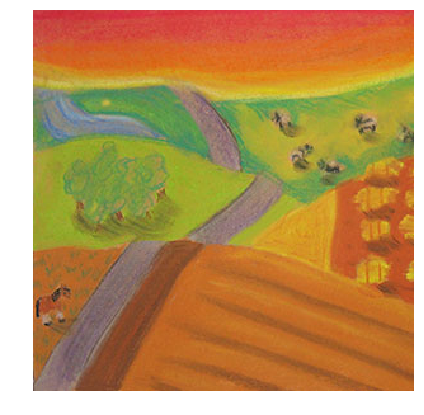

In [147]:
from urllib import request

url = 'https://11afyp2d1guh2o6cn33r70tr-wpengine.netdna-ssl.com/wp-content/uploads/2016/04/8-wheatfields.jpg'
request.urlretrieve(url, 'img6.jpg')
apply_model_to_image_raw_bytes(open('img6.jpg', "rb").read())

/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


a close up of a person holding a banana


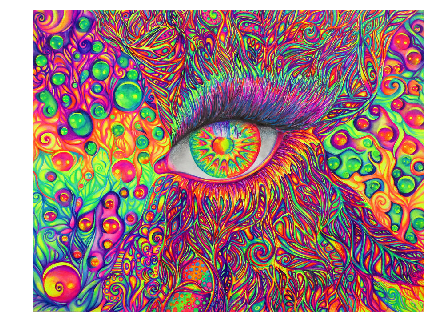

In [144]:
from urllib import request

url = 'https://static.boredpanda.com/blog/wp-content/uploads/2017/07/I-use-Gel-Pens-to-Create-Colorful-Art-5961a7614178a__880.jpg'
request.urlretrieve(url, 'img5.jpg')
apply_model_to_image_raw_bytes(open('img5.jpg', "rb").read())

a bunch of bananas are stacked together on a table


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


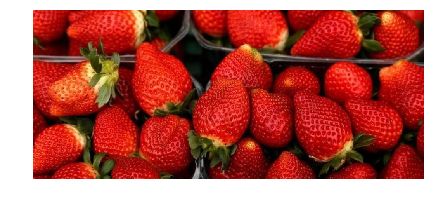

In [158]:
from urllib import request

url = 'https://assets.weforum.org/article/image/large_LGXyuFS6_TvF46UT8BFudkxcySQfy_E49h-KPO_kAe0.jpg'
request.urlretrieve(url, 'img13.jpg')
apply_model_to_image_raw_bytes(open('img13.jpg', "rb").read())

a small white and black train is sitting on the ground


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


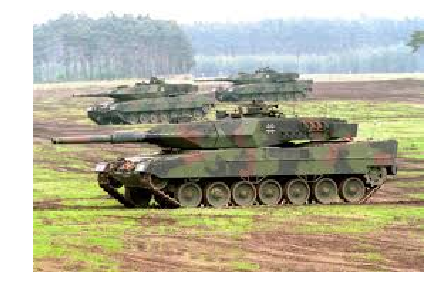

In [163]:
from urllib import request

url = 'data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxMTEhUUExMWFhUXGB0YFxgYGBoaGRcaGBoYHhobGBoYHiggHRolHRgdIzEiJSkrLi4uGh8zODMtNygtLisBCgoKDg0OGhAQGy0lHyUtLS0tLS0tLS0tLS0tLS0tLS0tLS0vLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLf/AABEIALgBEwMBIgACEQEDEQH/xAAbAAABBQEBAAAAAAAAAAAAAAAEAQIDBQYAB//EAEgQAAECBAMFBQUFBQYFBAMAAAECEQADITEEEkEFUWFxgQYTIpGhMlKxwdEUM0Lh8BUjYnKSB0NTotLxFiQ0gpNzssLiRGNk/8QAGQEAAwEBAQAAAAAAAAAAAAAAAAECAwQF/8QAMBEAAgIBAwMBBgYCAwAAAAAAAAECERIDITETQVFhBBQiobHBIzJxgZHRQvBSYuH/2gAMAwEAAhEDEQA/APcYjVPSCxIe8UEzaqykgEvvAZuAivxGLUupv8Y0UDN6i7F5itrVaWQeNxHYfajk5iAGvu3MIzpzEO/lHIVvP06w8UTkzQy9rVcs2rfIQadoy8ubNTdr5RlisXNOWnGIFzF1o360hYpjzZo5+1gaB2bkX0hmG28kp8XtcLExmlLVcuN36ML9ocV1u2kPBE5s02G2wSQFNuLf7x37b8ahkLD2d5/KM0MpBAB3vE6cQ4yh25/OFih5s1WF2gkpGYgKFwaeXCCEYhJsoecYpc2hrUc25Q+RiCR4h0cQsB9Q2iJgNiDD4yWGx6kKcWt0i2lbSLAu8JQbKzRbx0UwxDm7VfrCnFHfrVorpsXURcQgLxUjGNYmGnFkWMHTYdRFw8c8U6sQdNYiON0Lw1pMOoi5ViEg1MNXi0DWKIrd69ISZNcCusV0kR1WaBeIAhq8SAIoVYgtDPtJ1rygWiHVZoU4pML9pTvjPCc1Y77QTD6KDqs0Sp4EORNB1igTOIu0cnEkfWF0Q6permhqGsNRiKVijRiCC4p1idOIfX6wdKg6rLU4pMOTPSdYopk30hqJ7EGH0ULqsvp2ICQ94arFpo1XihM+8RTcUlLOQOdIOilyw6rfBpftSd/pHRmVY5H+IkcyISF04eQ6svBXmYvdb0iRD0JNP1ugbKRqAILQBRq8TDoRFjElqPzoIEEw8PSLLEpdGl93wgcyUlIIT8oGuxTQL9oOqX4v8oWW53v8I7EMLsHEMkStX03QhNbkygoGhLaxGpQevwvziZKnpbfeEISzuW0gHWwxIO6vlSEVMUmxIA0hzm4Jh4SbEvvO/wA4BqJD3qjc2hJSlOT9IkbcN8RBFP0YBYizJqt/SLHBYjQ+UVZrrEkhVbv0t5wWKi8q1YSsNkZiHaEbfG2RFEvedOkNf9flCKQpjqIjKC4vUQWgxZOCYiBh4SeMImWXNDBaHQpUYZW9xEiZSo5UpQLf7QrQUROo8oa0TKlHcWiMIJJYWh2GI0QlYkRIVuNLwgQfOCxYihZhyje0OMlQ5QqJVXOt4WSHRHKFPyeJGr+UTycMN/8AtEykDXz3QswxAFekMWndFgtKAN43w2TNQAzQZioAWlQAJAb6Rntpz8y2SVKG5w3SNbNnJUGUxG4ikUuK2eFTAZacqRcgs/AAfqsRqXLYIlP359wev1jo0JkiOiPdl5KyB5GFzKYAsdeMHYXDECpFC0RSVupuYNYnJJ8/pFWNMGxElQBOujV6mOlSDlSSblg/F4lxGIT4kguWLeUQCe4TvFYnJME7EXhiVKSTUOQejxFIQAkVtfz4xMZxExzR3EQGcO7be8GQ3IlBBmNUjX1iOcm9a3bpERxgcEBoSZNBD1r8oVgpCyVmx1hyVnNXo3GG4d35jrCKURTcRDtFIlLZX1HzhqGL9fhDJc0F0ZhmLZQ4BL0oNYlTg5gulga/WDYpWCLomEcDKTqHtFgjZkxQAABZwa74mk7HVmSFKS6dH8oWS8iwfgPwWNeWHDN8rQ44xO784CEpT5airWJZ23RGnDzH9lVP4TGiijNpl1JxQfRmhhxKS1A49ICk4VZTZTvZtPjAappCiAbX4cHicY+R/EWi8ZCox/WMorbBCiFpHRRJ+DesOn4xczwyvCK5iUvpRq3BhZRoFGVmr+3ilg/6aHDGg2jz/GLmupaF/ds5YUenhzKJrV2iXCdqMrCYMx3gt5s8JSiDTNx9vEPRiE1I1PyF4wqO0wzMEP1/KNPsCacQglKcuVTFzqz03w7gFSD/ALYH+MO+0umkRfsZbvmSBzP0iUbLWzZk+v0huUPIYyIUzwKO94gE28EI2Uu+ZPr9IejZCnDqS2tW+UGcPIYSBZOJr0hMRiS1Ynl7FWCSVJ9fpDl7HLVWkecHUh5F05FcuaWvHS1lqRY/sM/4iYVOwlM3eDy/ODqw8h02VYmaPD0TPFFgnYTFzMA6fnEkrYyXrMB3MPzh9bT8i6cgOkdFgdk//s9PzhIfvEPIdKRErY6QX7yt7b+sOXsxILmaeNrxWqnAqZjxh3cvX516COFzfk7OnFBo2fJ1WSX/AIR8IenBYcB3p/NFbOnJBrU7qPDZeKU7pQCli7qyl6NoaX9IWT8j6cSxXKw3PkYaiVh2+7UA26KidPnKdpcoVo8xXqyYCmzsUAGTh335ln0KYE77ixSNMoYVgcoAFtPzgPGbewkohPdqUSKBEsqo+9gIzOJm7Qyq7tUhRItnKS2rEgAGMke1eIkEoVJQC9SSVFxxCjDq+5MnXY9Xw23cOUlRQpHBSWUW3NGcV2kxCifBhwynDP4hWir0PBrRi5faWbNNZQP8qFH5wfI78hkyzUXyZf8A3QJJCcvBZ47DTcQtc55ctwwSASEZWqkkCtDXiYm2RtubhwFzE96lQIBVqxDs7nTWK2VOxVEnMxo3gDjpDNoYSapKUuAgGiSosnewAaHyxM1af7REPl+zsW97/wCsRo7fIz/9MkneFV/9sYxGAU/iShNQxzKWfRKRFthtlJScxCVFmolQG+wVeG0hpt7Guwm1ZE4ryrxCWqR3ikir0DKtBClySW/5hRNPvpp03BUZ/DYkIByoTW5IvupwhqtpznBCkpbVHhIHxhJblprgsDh8GqZkyzMzazpw1rrwik7Q7KSlL4Zc1IJuZ6igjcMwJPSM1Nxi0BXeLOYKbIfaq5cnUed4iVt5cwJSuYoJT7AVVI6aRokZykuKLWTgFt4sQklrJzkgcTQRLMwqQfvV13hvmYrJGLnkUyAPSlT61iKYucoF5qAdR4aOSzjixrE9yP2LlUtK0+0aUt+UVxwmV0pWp72BNtCU0EJLTOoBNcNQpAr5C8JIwU0qV+8UVD5vdhwh3QNE6sDQKKluA97eTRdYfaswIH71YA1zM3Ekm/OKAYKapB8cxw71I38eXnBkrAqRlWgkubKUSDvo9D9Imykn2NDsTbEwLWoTiujMo5mcuCzxantBO95PkIocOAmqU1oCyVVa1WiU5zYeh+nGE2joilRbDbs5vaS38o+kNXt6d76egAiqAm+4Y4Km+4ryhXEexZHbk/8AxB/lhf2tPIrNPRvpFaZcxvu1U4RGrOPwnmBD2Cg87UnP98voWgebjZxr3szqo/WBwV6jzaJ5UxadEjm/yEGwqI+9Wqjk+cSSVzBQFQ5KIjlYhf8AD+t7iHomTToDyIPzgChwxs8fiX/V+cdDu/V7g/pP+uOhfsTiHAzB/dkcfGPiYQYtZPiC+RX9YWTtHQEU3gH0pDV44nVI5GvGgjD4r4LxJFYfMHcpPFQ+kOl4eYQDmSRucV9IHE4gOFFt4QC/mqFk4mcSwKQ+8AfERLyDEmnpKfFMEtCAHKlHwpFbtQRl8b2glCZ+7XLWAohxRJAAOYeLWzPpGo2jgZs2UuWucgJUkigBIfk0eSbT2crDzCieCzHItPsr3OdL2jTRkns+TOba4N9N7UyzkQT3SalSwGNAWypzk3HE14RR47GYbvHlBJq+daSFLOpOfnGIQqYVMlLs51JYVPoInwm01F0rRmSzlhVLfi5c+EdJi5WbiXtBIvNljgCgDyGsRT9syg471HRQpFJsXZaJoJQy9+U1ArVjUfnBeztmIJWkJdQVU2LNcPcZnB5RLW4/iaoJk7bllX3wpoBpwYRJO29JAqpRce6r1pEeF2ZLKVgJAKSXNQXYMUjVN4dh9mhcqks0pUHNQ1DG4IhNorF0C4fbEsuSJhDUoa+ZiadtxAS4lzLP+FwPOKr7aDlliWL5QSFVZJOlgYsJKZlEd2kigqhQAFvaBB9RDYkmLK2woJ+6KQfxEjwg6kAGwrFth9mz5nsTTQhXsgggPmT4QTWlfUw5ODT3ZSsgUAbMghmAcNV20s+sWmycdh5Ke7ygAWIBUC41OUV+kZTlt8K3KjGhO9wpcrnyypJKTmSHBBZSWyuKi0EYzZkhKQVIVcAZUkkFSgBTu7OR6xkMfsgzJkwicEoUol8qszEn8RArxhmO2bOIl91ilJCRldZWsmpLkpUHNbnhC6T5TKT8lrLWoyp0xKyhUkkKQyTbjT4fSMrNxYUsrzKUVMDmQmoDs7KEXErsyJsoJXPmBQJzGW6Ur18QCqkbzuiL/g2TLBUZhU3vpzfMvFJVyJvwG7K2stEpiZaENmOYOJe/7p3UeovFrsDHonLWTOlTEFCSgSkKSoKPt53zAgMGINa0jCTtjyHcTFhQUFAgUBBcMlQIvBOHCEITLKkqQFKUQqUh1FXvKSAWDk+W6JlpthkeoTZLA5ZlGJ8SRVr1MEpw5SwIzDgz6bqRjf8Ai8d2EKl5izFRWuvMQ7Z/aumXIglyfFQm5YBLA04aRg9LUoabextJko0ZCB/NQt06xEmcHypb2hV3BrYg1HrGcHa5kjwS2dnKiz7nKqGopygdfa5lsZMs5C5D+Ku+rgcWiFpTY3GS5NlKnzXFPDqwGj1BLQuImE+81z+7D+kZCR25Y/8ATqY08K6CutN0Xmy9vInqKZYmpIr4ywNn00eJlpzW7RnbD5NbJUP53B4C8RzJCirTUNlUetFesMTNmlxmBqfeV8Ew5MmbmfwC15Z46N6vEW07KtocJOVgZauiSfmY7IPxSVHiUq9aRP3M/wB5Jr+FC24McwFojmpxFR4iOCPqsQ7le/3C2xc4b2AODK/KHIRLI8UsH+VX1hBgJzVmKrYFCacvFEStmq1XepGRP+qBTa7/AFDJruTiVJ/w1/rrHRANlneP6E/WEi+q/I835MdlX7iT/wBvzMFysUAGKGPAn4PFn9lluxkFH8Qp5tAG1sOuWjPh0maoH7slJCgyqAmxdj0js6i8mvBElaSaOP8AuAbk8SO3HnNECzNp4pKyE4Dw6OJR3Wcv5w9e1sdpggOkofODNDi0wpWIP8X/AJYgxijNGVaQtNKLUFCnMQLM23jx/wDjhP8A3Sx8DAS8ftM1CU/+QesNYvcUvTctcJg5aT4USweCB8WiwlbPlfiMhNKjuQ/Vk+jxlNoT9qLlqSpKTRmzEk8qM/WAlqxy6lCXO+bLFrBs0Oovkzd9onoMqRh0kEKlOAwySUg8gSIOUpIBIUoD3RkB6UEeYHA7RulCP/KHgHHSdqkFLoRmeub8J0qIl6Wm/IviXKN3idsziVBCZoA31JHvZgGA6w2XLxCgCRMe/wCKg3x49icBtBDulZCdUsQeTVgGVticmhmKDcSIvCKXwkuz3JaJxuVVFK6b6mK/EBZLBR41LeceTo21O/xl/wBRgyRt6awC1rUP5iD5/WI3RrpyjVM9HXhF3zE8i3pAqs6hlYlxUOb7naMzg8YJgZMxRO4qL/GJ5CVIchRG8uT84rPYjUpPY1SZBVLCiQVpcLHEUJHx5GG4VGZQDt+tIzUlS8tSXNTXU7+lOkV02QAsEkNxNvOBTIi1e56dLQkBqMLPviv2xOoEiup+UYr7ODFpsuaEgocAXFYzkVqbSCdllMvvO8KUuA2ZBW7KBLMpOrFmNtGiu2xiECbMU7pcl0pI5kDMp+bl4nx2LDMWAGpLfExm9q7VlAUWkndU+qY2jdE9iyM1LpAd1B00oRAc1dQtLkAitmU3HRjeK/ZW3pBX/wAwqalJp+7QlV2DnMsN0BNI1UzG7IQQE4jFTiNJcsX/AJl5QfMwpTrZp/wIrJWNKpRZJVnLr8FHFBdQrQlxqYjxOOWZhXlKSEs5SKJBsSFHNSmkH/aUZ/8Al8NOUghwJk1CDmcuyUIWG6wkxGImghGGSmgLmem3MoD8miPVG1twog2QkqTwLVi07hqjrAeA2JNlkEyFrarfbQlB6JlAtwEX2DlTFEpXJkIQR7XfrK0v7uWVU8FP8obkxR0re+yL/wDsvQQqeoAWQmtPeJbyEb2ZMLOPrGTwG2ZWHQlEuUg08ah4MxFAWCK+kMxvasAgkLCaHKnKxIehdJoflHJqQlqStEuL7M14BYJY0sAwFtIiIWz+MHcMpjIr7eCuWUdGJIpvteAZvbGcpbsMu6oLa1fdGfuuoyTdImn8Xef0g/AQQiYP4+oMVMqeVJCgpacyQWKrOISViSSUd54g2qnryDRy2kJySLjvE7leR+kdFSAr3/VX0hYnNE5or8XMKnDcyLsOdukC92AXykbq/wC0MmYLLeYoBqs5PK0DqQUjwzC1HcEctxjuSX+L+p1JXwWqtpKLeFNvxF7btIi/aVHTkPAGriKyZOKRmzs1vCtvMBj5wVh1S5grNlH+YM51uIWOO9fUVV2+oszHkliAkcUj5wxUxHvIY8BfiGhuJ2elRobXCF5TzD0MN2VsFcxSmUpKUhznDO+4/kY206nsi01Q5WFWR4GIbUJr8C/GBpkybLotKOAsSLOL0gXb0tMjEiQJhKiHWSvwSwEkiwTWlnAvGc71eKmBACFhPtKJUECv4gFMWd9edY0UJJ02Fs2OHlqXbDuSdEAmLORs1R9qSElrd0o7/dBH6EU2D25MwslKlYkqAlkZZoCgGJCTewZqEkgCm+6xuzZ0zD9/iJwbKPCkBAc13Ek1Z3FoqMYyDUuOzBMbhJaHKpSgNMslbksKVypHnHl/aPZuKnTiZUkp4KRL011U7M+kaKdtolSsnhSBlBSAHsXLN4jvqWgM49YNFKBYVcP5gRcYUYuRnpHY7FFBzSpQ1K1BILk1cnSpbpB+C7CoAHeZTvaYfTxCLMTZky5UeJJ+cG4TMkMT8/lCm67jhi38QBL7IYNJBVLJZ/ZmTQX0qSzQUrszg/8ACmdZ8z6wYtT0c+n0iCTiXoFW/WsRkwnKD/KhkvZODYpTISWP4lLUR1JdusSK2Zh0j7mWB/LFdOnKSpnblxh0/FTfZMwltcqK7rJisHfJmKdnyM/3MrKKewPpFjhcDIBdEqWkjcgAxVysRMcDNwsn/TB0oKvnV6fSCao1X5GTzZinWELXpQKVRnsH4QHiEKWnKtRUNQpyPIwUUklypT73+kC7TUWFVX94/WCE+xkDDAIBYIR/Qn6R0wmW2QhF/ZAHygZSle8v+tf1gzCYV0uVLr/Gr6xpJ1yFlhsvEKWnxEk1qTesGKSX4xVyMIARVRI1zK9awQUcT/UfrGDabHGm9xcUVJSrdpTXnEWAMxSgwJGtLQNjRYNfW8C4UJSapDco0S+E01Z29jSmUrcfKESgEEGp3M/nFf3ST+FJ6CAdobRkyfbQrT2UOK2A8oxRiWeIwRNkt0gWZhlJPiItv6fOK7DbakrJShC1FNSAgPvs8P2R2ikTlEywr92MyiUgBq7i8bRs6JR062N7h8UmYMtKUH7wDdx4QbKkVdKXN27xR9HZozAWlbOVB6hif9JiQYJLhp5Tz+scktDsn9f7Jen4/wB+ZtE5m9kesdGOGC//AKv8yfrHRl7t+n8P+yei/T+H/ZrUzk2Mxj/KfR4bOKSPbSujHMB8IMRicOQSAnqC/rzh6kIALIB5JT5WjjexNFKhEtJNFBx+HM3optN0CqwEhQ9lQ45G+TRoyA1UBLcL+RhhSpvZFdefAiK60k+X/I8mZ07Olosual71DeX5RU9rMQuRhlLk4ielQZIaYQHe+XVg7Rse6d3TQ7xQ8qtAPaDZYxEibK8CStNFMDlUC4Je4cCnCLj7U4yV2Vn2Z4djdtzAVKmKmTQTUqZzmBqpSavS1oKRtNBl/doIJcrTmC3IZyHAzNwio29JmyZq5GKoQS5QkALq4UklIzB/nFz2I7EHFLEw4hIlJbPlfOxrlykMH3uWrePUlOMYZthJjZ21EJCRLQDlVm8QLPTQqIbkBE2I7QY7EGmJm92xzIcqTRzYueEZ/bP7mauWQ+VRSCFXyltR+ngTDbUCSzqTWrV9KRccuULa9zQ4ra0ySpCVoC0rTmJTQipDAWo2u+C5O3sLQmYeIyLfkWDQFgcRh8QkImLCFJDpWQRmcuUFtXJL8+ECbckIlAywhQJLFSklIAo+XNVRqK2Y8Yak+AlHujTDthgx/eH+hX0hU9rMMT4Ssu7eA1YVZ7mMPI2IVrQlJ9ri9/lFydkAeGWkZQ7KUMxJ1IegiXGBOJoJnauQlOYpmhNnKGcnQOa2iqxHa3Cu6e9B18I/1RU7T2RmQpYDLQHIc5VJepANiNRBmw+zmZAUUBai+UH2RlHiUptBu1MNYx3BRsd/xZI92YTyH+qFm9sZJL93M/y/WJ8fsJUukxEtaDTwJSG35VJqCOMB7O7NoTOXn8aEjOnTMgtl6kljyMVmh4lthO1MlSUMhZchP4TlJLDNVw93b1iPB9tJanAlLoMxqCdAwG9zHKwM5syFlAFghICU8GavWBF4aY6CkiWoq7pYSlKXKqpUCA4cAuxumJuJpbkqD8V2uYsjDzFqbxJ1RwVlBrw0saxU4rtooqZWHII0K2bpki5/ZWb92hwlNkpJS7akhnJit2hskrQUKJV4VGWol1JUgFRTmuUqANDYgQRcUzPEBR2sUSyZBJ4Lf4Ji9k9ppgQCcKoV8Qc0HvezUb9R6wNsTZoRJBQwUolObUAAZmOhJLPuESzthlBCkKKVGoUC9ve38jDlJMeNEMntmszFIEgEhx4SolRFAAGuTE+J7R4lk93IR/E6vCDuSolIURqzh9Yr8PhCrFJSVrCZiQspzFh7WdN7OgtwMW8rZKZxU+UkCgNgBoncBEvHwGJn9odrsUlWWZJlpIqxSvXX26iG4Tb2Lmvklyy1SWIAG8kqZostpbIBkKBshloPujMAoA7iC7bwIJwuHQJMoUCV+I9SQOgA9YvNJbCxVWVsztFjUJJCZKkpuUeLLzZTgcY0ODnJny5M0qzZsyCMhCQseIghy1BQk6UvEatmpCvAQWDgi3I8DFfsxeIw8/u8OvvUpmLQMP7OXMnMFZmIygm7g+E2FYnZlYehfYTCETgtCUd2xzLBqFDKyaWFTSunWv2ZsCVKmLmJxKVJmuFy8jMFOWBzXFnryjQbGRmltO7sIKQR3aVIStRclnrkFLkFRejXtZWFls6Eo/XJ4jJrg0WnsR/tDDEfcprqEq+Qjji8M1JAPNJ+JMJOnANmlJPEH6AQiMYkfgZ7EUtyjHH0f8hj6DE45GmFQ38xjoKRtUgN3f8AnPyMLCp/8fmLD0Lte15P4ZqXAe4f0EQo7QEhgpR5AnkIqjsHEC8xBJ3AgNX3RDpnZaapyJsoCjuFfneORe7pciXTSLnB7RmqBdC3Fipkv9ekTpxc12yBzcZ/yiow/Z2almnAUulagxPBrRPO2HiiKYmjvRyQPSMJ9Jy2ar9/sRLC9vuWxmT6kpSGOkw232gCdNxRDAy09X+KflA6NkYoJb7R/wDIeZF4GVsXEgh8Sl6ggpTY9K/qsSsE9mvmSkvT5gHaXY03GSu6WqWtLuDmAyqFHTlTdiRfzjzPa+xcZspfeS1/uyWzIKmDEECYza04sY9bmbFxRH/Vgf8AYA3CkV2J7JYlTtjH3uKN+uEdej7Rjs3HHxRV2eLbRn98SsVLlR3+K/OAhJJtHqZ/skS7/agnVm+e6J5n9mktn+1Ab2SGp5A1/Wkdy9s0lwxMxOD7MzDgFYgAZyt0B/GqWkeMpT+Ia8kvAmD224EvEIE9ALgLKvBp4SmocG1rUcCPRB2CGVOXHrQEfdskshJcHKp6EgwAv+ytJJJxiSo3ZGup9rX58aEdeLvJ/JlpSRU9n9ny5aguRMVOl5zm8OVcsKDAqSCXSGqoUHCLlWFnIX4Ugg8IL2R/ZUlBSs41TAuAhITUVFcx5UjbI2NLSCZk8E3JOQNd6CnXhGcvadO6TsV+DzjbkoScPNWr/DKBxUsMB6vEewiqbhgJZZaCpKhwUXBI3Go6R6FP7N4czpcxU/xJzCWhRQUOoFKiUAMrwk3tSIsF2Aw0kpVJnqSUgj2ic2apz6FL6EdYPeNOv/B1tRmsNhpykkTAncA1aWru8orZk1KcZ3RICVyUy0qDFPeIWosToXdLHhHpmI2EnK3fJSwdRqmmliGHWKzFdg5C86llBM1feTSy2mEEkENM8LZjbfE+86a7jtJbsyWH2XOSSlSx3ZLkHm7RXdokLlJC0JcpmomqGolywqpF2JUXOgFbx6bI7OZU5Qun4SczgNZ1E05wHP7MpzlRSFKUnI/hJye4VEE5eEJe1abewJrszGytn98BOkzWQqtD6HcRZobtmQZaUIR45sx5clNM0yasZQ2jALcm1RGvTsZMoqIQmX4crSxLB8IBZglww6xIns6VHOXtTwjMH4sPO8V7xFbsaSXJ5x2dmABWFmrSFBZCFgjKosAtIO+xbidRF6Nl9ylSlrdnLqLJHM2AjUp7Oy2ZINDTM+UE6g6V40YRIvYUtKAJiAUn+IqrVmrS26E/aYidcnlOOlz0YybMQh04TIlYdLqHicgA1clZpZxGmwWzpOI/eS18wSyk8FA2P1jaYbZEhyAhze5agFibnlBA2HKVeW5qCSEl+r/GJftkfDFt3MlMwGHmImSlzUDMlSaLANN3EEW3iM5siQEgYbE1ZzLmoClSyCS4KgKEGvWPT09m5AcmSKlqJBub2hR2dlA/cjyFhEL2uN8MdrwY9OClSkEIIUdasNzqUaagdaOYh2bhZLFS1sFqLqSzzSQbg+zLfRgSQknQRvJewJCqiUnS6QPS/wCjHTOzqTUJQBb2a8YPfI90ylOMexQS1yQmmJYWZ3HkHtygaevDf4qH6+YZvONMNjS06JHMFoiXsmXbw7iya9D+UJe2QY+vFmYk7Tw4JSmamn8CyNagkFxxETjtJIBqhB0BCTXj7Lb40S9kytySRVmDt6Qn7FkqDZa7szfWB+06T5sl6kO5Sft3Cm8pb/8Apg/KOi5Gw8PuI6n/AEwsZdXQ/wCxllp+oVjUipClZhYZkh+l4EwGNmk5CCL+I6gcx8osQ+qB8uXP6QmIxCk2BPAVI5sY5YN1i0mSnSqkwaSgFRyrqRZIYjjQVEPWJiQMmdQaoKVV6t6xKpS1sCD+utOsNGIIsFnSz9LxWLfMb/cvd9iCr/dTK38JbhcD4QkzBr1Rme1rU3+bcDE5Ll/EDT8KRuoQUk8Lw2YXLHOaUozciNYqlFrb6suknx9wWbslyCZKHvR3J1dhDZmylA5hnTwClNXgFPBQmAM69GqQbPdlXqIdJnL95x5+VT5xWcuEvqPN8IBmbOI8X2haNzlTPb+8ffFNPlLKk55rgWIyM9LgJfzeNB36zdyWe4UByGYMOcQLxqVFlKDDQAkeTN043jXShKL33/39CoRcXuUKlTQ6UzM4d6lLcx5+TQQJk9IHjS7OBc8dRvi7OJRQIytyWmvIJNI7F44FIAWaa5S1t5S1I2blsqLd7bFXs6dOXSYEgWcip5htItZWEDgkpLbkp8ohONSXCly2bXKW0u4NW+No6V3LHMkVNGKK77Hr16xnLTb34Jene/BJMkSnzUd6EBJDgfnBE/BSVoBfKGIt8Qlt0DqEhSqCo0zCzaAOY7Drl1ZSuId70tl/XSI6b7N2v0J6b7Nk0jYeHyuMr7wTVuDwNKwctCi6cyTYhR0Gofn6wWnGy0uGIahelOJaJV41IDJItQOS19/1iHHUXfb9RNSRDPRJbwg10c6k6MTFfjMCc70antGvozb7xYTFqUQUodtXFRq1DuirXj1BZBTlLkHcfIiL0dOad/cvThJbhfdLFwCOZFK8zBJmkf3aqGmVRp1POKmfjCkh6vVzXy8UMm45ZalBehDPxHz+Ub9Nvk0wb5LQY1KT7JGld1/yhhmoJuxUH9m55/q0AysYSwKA4b8SfNntEkrGHM2U9VDjo8Dg1wgca4QavDBdRMQ1qEhuf63xDKSoOAcpqX7wAfTWETile5ozs++t3iWZilZQC19UKHwB3V6RH4ngn4/BFLVMSKzF8wytxplg2RiZgDCYqtbD1f8AVoDRtbKK+z8KtqQfT5ROjaD2SDqw1bWgq0TNTf8Aj9BNS8E/2iczmYkgE3TX9VhZOMAc+EE1dDBybkRFNxwAqnL1apr+INDBiiRuG9wenCIUJy5X0JxnLYNXirh101JcH9UsICm/vEsCUEVJEsghiNW1geetCnBcuNDUA8tOFrQIhEssCpZbcoivI8I0h7OrtjWiuWWCCAkgzwpVwX3c7QMjHEuEkqVYBnbmEm7/AAMDy5KRQTVjgSXPofjE8zAKHsTVDc6q1veNenFfuU9NIlGLne76flCQOcHN3k8SH+AjojBeEZ4eiNFkUCxUT5/GBcYZiQG31vbcGq/peFVjkV8THdV/lAy8akkuTwGleUedCGrd18jGGnO7ollzFGrMb1cDyIrDDtGxUhQGpTX0FYQT0qACV01bM5O6nSCZKKOVPrWvSNaljc4mqTq5IDXjUqNFFL76ev6tCS9oJfLmJN9G5AqYf7RLNwwJBuNWL8miNWAlh6kVcuaVezw/wZfmFWlL8xOmYlnPql+lIbOKQCUsCBoC/wDlrA0yWoeFJBalaUe9y5iFU2Yl3bqDZnvDhoO7i9hx0d7THJnKUSy3LAsFM9dxFD8YDTtJQmZFaG5SD5KpWCZGPewZW4Lyt/VUnkYfOmS/aUlYPvEEeSkx3pVydSgwjFYtUugbfvvpUHUws7GqBDpFg5I38NIBXi5SrLobkVJ6GOXLzvlm1Fne3IPAo8AkFTVP7SUkH+FjCSsJL1RlOhANeGYcrRycHNKMomAuXYpzfGCkbMSiWS3j1KXrfSkD2Q2gKZgg/gUtPInL8KX9Y498B7ZID1Jd77/KCJIWqwKeJR8j9YHXiHUxIzcBryBLwst6FaGzMRMSfFLQrd4fm9IimYlKry2Frq9GrBU2ckMFrYnen5jVomSuXlcF/wBcRCbdcCfBWSmCqEvQsFqLFuNXaJJ+HzEUc8RXqD8jBAQhR8QYaFlP0pb6w4bPSKy5pZ7Zn9CIuMvQqLBJmGYeMGj1AYNW9dISTKlpstQFd9OvnBYwU1J8MxR35s5BFbV48IZNmrU/eSEEbwxp1EVZQEkJsVEg0GYE7/dct00iE4VV0hJL/hIUPKh8xBc3uiPFJWCXBYm41UCMsRSxILgKIL0dAZ+hFGh2IFyTUk5kqSzXJ62dmO+Hp71hlKmvZ26sCYPlYUqHhnU4EgHo7QUnZyxVJCubeVAHhWFFCufMUQ6iqlmHqCIUkg+zXkxNtdBF+rBh6yfJV/SK7FyJOeqJqSLMouQ/PleDIQyWoi6iARTxZh1S364R3csKKlqVxTlPpb/aH/YcOdJl3dyeDCho8KjASAk+M3p4jzsQGPTfGUpJb/YzbrcgC5qfeS9mUFDyUksbesNXtHRSgreSinmGeJpuz0UyKB4Eg7tHv9YYub3YqkpNmKD51IjSM1JbFJ2h8vFBVApKm6MaNcQZLnNdNq+yFC38P5RV/a0ksQk1s1PR9axy5yEgNKTXckO26wNooC8l42gYJbjLL/COinTt1ADGUX/9RvR46Ix9CdvBe/aE5myM9iEukcHS7fSOnJBoMp4O3wjo6M1CkaJUgUoUiqZSuHiempAG6B5uKmN93b3hvvepPTSEjohSTdtEN3uT7NWoVKCCbl6HoYLxGMSygrKToFPpZzyhI6Mo/iypmSfUdMikkqpkSAA5KV0FNzvrHY8ZUjIxF6lhHR0NbauP9/2NJKdFb3ClEvLSQQXAYvza8PQkpsCn0pxBFLO0dHR0xlcqNoytkebNfu17swBNW3D1jjg2J/d5dXzUvxDf7QkdGj2KTsdLlrPsrO5lM3TKfiIOk4paCHUk7nKg7btPKEjohu3ROQb+1Ft7KV13j6uTEE/aAeuH6kOPrHR0LEdDZu0pZYlAewDmgpuZhU+UOTjUaJHIeL0AO6OjoUtNNCcbQ39qSLPlL6pIq368o7IhQJCgpwWbLfTQcLmOjolaWO6bJWnXdg5krCQcth+H0G6Go2gtwhiDaocA7ia746OjWy2MmY1QLE14Bxej0vEiZ8sh1FCjq6RXyhI6LSEpMZJnyiQMqADqEtXnBATLB8Lj+VSq3sxjo6BqhpjlT8tO+WKbwd/vQs7Mpv3qFC3jQC5F2NH/ADhI6JrYLB5stZ9lElZq6gz6QEqXNH9wkDgFny/eEemkdHREpVsTJ0PRKBLqExFLgEjqGrV9TExUr/GS1mVnQG4PS8dHRGlq5vgiE7YNiNlLLlk11Ssa8axGdkzmcg03EHfQtHR0dClsarcDVhAaln18Sh6NCx0dGlEn/9k='
request.urlretrieve(url, 'img15.jpg')
apply_model_to_image_raw_bytes(open('img15.jpg', "rb").read())

a white and black table with a clock on it


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


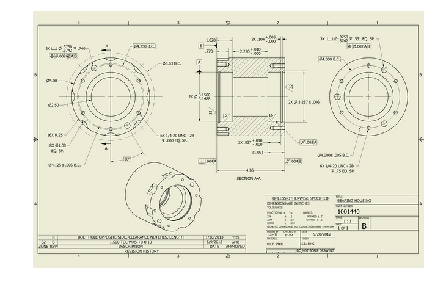

In [176]:
from urllib import request

url = 'http://bowentechnical.com/wp-content/uploads/2017/10/DETAIL-DRAWING-EXAMPLE.jpg'
request.urlretrieve(url, 'img20.jpg')
apply_model_to_image_raw_bytes(open('img20.jpg', "rb").read())

a vintage photo of a truck with a man in a suit case


/home/ahua/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


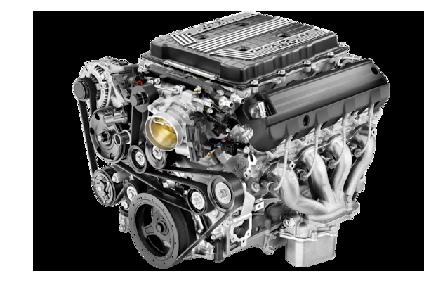

In [141]:
from urllib import request

url = 'https://www.chevrolet.com/content/dam/chevrolet/na/us/english/index/vehicles/2017/performance/corvette-stingray-engines/01-images/2016-Corvette-Engines-11.png?imwidth=491'
request.urlretrieve(url, 'img3.jpg')
apply_model_to_image_raw_bytes(open('img3.jpg', "rb").read())